In [2]:
#Be carefull, this code has a lot of dependencies, you need to check them all and install them
#The code was made on windows, so you may have to make changes if on Linux or macos
#These three next cells are for downloading the files from the MRO website
import requests
from bs4 import BeautifulSoup
import re
import numpy as np

def get_url_paths(url, ext='', params={}):
    response = requests.get(url, params=params)
    if response.ok:
        response_text = response.text
    else:
        return response.raise_for_status()
    soup = BeautifulSoup(response_text, 'html.parser')
    parent = [url + node.get('href') for node in soup.find_all('a') if node.get('href').endswith(ext)]
    return parent

main_url = 'https://atmos.nmsu.edu/PDS/data/'
#Change the next line with the files you want depending on the dates : here 2129 to 2197 corresponds to MY34, 35 and 36. This has to be checked manually.
#Be careful, it can take a lot of time (especially the third cell). 2129 to 2197 corresponds to +- 80 go and took two days to download
numlist = np.arange(2129,2197)

LRO_data = {}
for num in numlist:
    ext = f'MROM_{num}/'
    try:
        path1 = get_url_paths(main_url, ext)
        path2 = get_url_paths(path1[0]+'DATA/', '')
        for i in path2:
            search_year = re.search('/2[0-9][0-9][0-9]',i)
            if search_year:
                path3 = get_url_paths(i, '')
                for j in path3:
                    search_month = re.search('[0-9][0-9][0-9][0-9][0-9][0-9]', j)
                    if search_month:
                        print(j,search_month[0])
                        LRO_data[search_month[0]] = j
    except:
        pass
        

https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/ 201705
https://atmos.nmsu.edu/PDS/data/MROM_2130/DATA/2017/201706/ 201706
https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/ 201707
https://atmos.nmsu.edu/PDS/data/MROM_2132/DATA/2017/201708/ 201708
https://atmos.nmsu.edu/PDS/data/MROM_2133/DATA/2017/201709/ 201709
https://atmos.nmsu.edu/PDS/data/MROM_2134/DATA/2017/201710/ 201710
https://atmos.nmsu.edu/PDS/data/MROM_2135/DATA/2017/201711/ 201711
https://atmos.nmsu.edu/PDS/data/MROM_2136/DATA/2017/201712/ 201712
https://atmos.nmsu.edu/PDS/data/MROM_2137/DATA/2018/201801/ 201801
https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/ 201802
https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/ 201803
https://atmos.nmsu.edu/PDS/data/MROM_2140/DATA/2018/201804/ 201804
https://atmos.nmsu.edu/PDS/data/MROM_2141/DATA/2018/201805/ 201805
https://atmos.nmsu.edu/PDS/data/MROM_2142/DATA/2018/201806/ 201806
https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/ 20

In [3]:
#This cell gets the complete urls with the hours and the days
LRO_data_days = {}
print(np.arange(0,21,4))
for name in LRO_data:
    for i in np.arange(1,31):
        day_str = str(i).zfill(2) 
        for j in np.arange(0,21,4):
            hour = str(j).zfill(2) 
            LRO_data_days[name + day_str + hour] = LRO_data[name] + name + day_str +'/' + name + day_str + hour + '_DDR.TAB'
LRO_data_days

[ 0  4  8 12 16 20]


{'2017050100': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170501/2017050100_DDR.TAB',
 '2017050104': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170501/2017050104_DDR.TAB',
 '2017050108': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170501/2017050108_DDR.TAB',
 '2017050112': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170501/2017050112_DDR.TAB',
 '2017050116': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170501/2017050116_DDR.TAB',
 '2017050120': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170501/2017050120_DDR.TAB',
 '2017050200': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170502/2017050200_DDR.TAB',
 '2017050204': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170502/2017050204_DDR.TAB',
 '2017050208': 'https://atmos.nmsu.edu/PDS/data/MROM_2129/DATA/2017/201705/20170502/2017050208_DDR.TAB',
 '2017050212': 'https://atmos.nmsu.edu/PDS/data/MROM_21

In [4]:
import os
import requests

#This cell downloads the files from the urls you got earlier
def download_file(url, directory, filename):
    """
    Download a file from a given URL and save it to a specified directory if not already downloaded.
    """
    filepath = os.path.join(directory, filename)
    # Check if the file already exists
    if os.path.exists(filepath):
        print(f"File already exists: {filepath}")
        return

    response = requests.get(url, stream=True)
    if response.status_code == 200:
        with open(filepath, 'wb') as f:
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
        print(f"File downloaded: {filepath}")
    else:
        print(f"Failed to download file from {url}")

def download_all_files(file_dict):
    """
    Download all files from the provided dictionary and save them to the current working directory.
    """
    current_directory = os.getcwd()  # Get the current working directory, if you want another, change it here

    for key, url in file_dict.items():
        filename = url.split('/')[-1]
        download_file(url, current_directory, filename)

# Usage example
download_all_files(LRO_data_days)

File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050100_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050104_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050108_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050112_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050116_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050120_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050200_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050204_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050208_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050212_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050216_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050220_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017050300_DDR.TAB

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2130/DATA/2017/201706/20170623/2017062316_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2130/DATA/2017/201706/20170623/2017062320_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2130/DATA/2017/201706/20170624/2017062400_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2130/DATA/2017/201706/20170624/2017062404_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2130/DATA/2017/201706/20170624/2017062408_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017062412_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017062416_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017062420_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017062500_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017062504_DDR.TAB
File already exists: C:\Users\Mathi

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170710/2017071012_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170710/2017071016_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170710/2017071020_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071100_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071104_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071108_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071112_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071116_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071120_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071200_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017071204_DDR.TAB
File already exists: C:\Users\Mathil

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170727/2017072708_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170727/2017072712_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170727/2017072716_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170727/2017072720_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170728/2017072800_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170728/2017072804_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170728/2017072808_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/DATA/2017/201707/20170728/2017072812_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2131/D

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2133/DATA/2017/201709/20170913/2017091316_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2133/DATA/2017/201709/20170913/2017091320_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2133/DATA/2017/201709/20170914/2017091400_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2133/DATA/2017/201709/20170914/2017091404_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2133/DATA/2017/201709/20170914/2017091408_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2133/DATA/2017/201709/20170914/2017091412_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017091416_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017091420_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017091500_DDR.TAB
File already exists: C:\Users\Mathilde\Downloads\MRO_data\2017091504_DDR.

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180215/2018021520_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180216/2018021600_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180216/2018021604_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180216/2018021608_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180216/2018021612_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180216/2018021616_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180216/2018021620_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180217/2018021700_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/D

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180227/2018022716_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180227/2018022720_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180228/2018022800_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180228/2018022804_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180228/2018022808_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180228/2018022812_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180228/2018022816_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/DATA/2018/201802/20180228/2018022820_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2138/D

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180316/2018031600_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180316/2018031604_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180316/2018031608_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180316/2018031612_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180316/2018031616_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180316/2018031620_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180317/2018031700_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/DATA/2018/201803/20180317/2018031704_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2139/D

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180729/2018072900_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180729/2018072904_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180729/2018072908_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180729/2018072912_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180729/2018072916_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180729/2018072920_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180730/2018073000_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/DATA/2018/201807/20180730/2018073004_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2143/D

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181015/2018101504_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181015/2018101508_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181015/2018101512_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181015/2018101516_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181015/2018101520_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181016/2018101600_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181016/2018101604_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181016/2018101608_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/D

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181027/2018102700_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181027/2018102704_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181027/2018102708_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181027/2018102712_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181027/2018102716_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181027/2018102720_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181028/2018102800_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/DATA/2018/201810/20181028/2018102804_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2146/D

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181127/2018112708_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181127/2018112712_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181127/2018112716_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181127/2018112720_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181128/2018112800_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181128/2018112804_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181128/2018112808_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/DATA/2018/201811/20181128/2018112812_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2147/D

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019020612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019022508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019031300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019032920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019033000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019033004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019033008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019033012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019033016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019033020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019040100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019040104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019040108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019040112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019040116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019040120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019041920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019042000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019042004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019042008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019042012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019042016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019050912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019052808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019061704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019070600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019072420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019081316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019083012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019083016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019083020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019090212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019091908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019091912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019091916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019091920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019092108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019100920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019101000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019101004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019102900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019111720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019120616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2019122512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020011408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020020304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200219/2020021904_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200219/2020021908_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200219/2020021912_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200219/2020021916_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200219/2020021920_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200220/2020022000_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200220/2020022004_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/DATA/2020/202002/20200220/2020022008_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2162/D

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020030408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020032304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020041200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020042600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020051420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020060116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020060120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020060200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020060204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020060208_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200602/2020060212_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200602/2020060216_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200602/2020060220_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200603/2020060300_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200603/2020060304_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200616/2020061616_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200616/2020061620_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200617/2020061700_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200617/2020061704_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200617/2020061708_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200617/2020061712_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200617/2020061716_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/DATA/2020/202006/20200617/2020061720_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2166/D

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020070516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020072412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020081308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020083004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020083008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020083012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020083016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020083020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020090204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020091900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020091904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020091908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020091912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020091916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020091920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020092000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020092004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020092008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020092012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020092016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020092020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020092100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020100920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020102416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020111312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020113008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020113012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020113016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020113020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020120208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020121904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020121908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020121912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020121916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020121920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2020122104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021010920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021011000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021012820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021021716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021030508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2175/DATA/2021/202103/20210319/2021031904_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2175/DATA/2021/202103/20210319/2021031908_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2175/DATA/2021/202103/20210319/2021031912_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2175/DATA/2021/202103/20210319/2021031916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021031920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021032000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021032004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021032008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021032012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021032016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021032020_DDR.TAB
File downloaded: C:\Users

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021040616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021042512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021051408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021060304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021062200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021070820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021070900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021070904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021070908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021070912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021070916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021070920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021071000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021071004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021071008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021071012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021071016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021071020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021072916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210815/2021081508_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210815/2021081512_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210815/2021081516_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210815/2021081520_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210816/2021081600_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210816/2021081604_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210816/2021081608_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/DATA/2021/202108/20210816/2021081612_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2180/D

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021082904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021082908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021082912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021082916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021082920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021083000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021083004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021083008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021083012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021083016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021083020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021090100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021090104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021091920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021092000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021100820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021102716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021111612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021120508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2021122404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022011300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022012920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022013000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022013004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022013008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022013012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022013016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022013020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022020100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022020104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022020108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022020112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022020116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022020120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022021920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022022000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022022004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022030712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022032608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041312_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041316_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041320_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041400_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041404_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041408_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022041412_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050304_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022050308_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022052204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022060900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022060904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022060908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022060912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022060916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022060920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022061000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022061004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022061008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022061012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022061016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022061020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022061100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022062920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022071816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220803/2022080308_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220803/2022080312_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220803/2022080316_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220803/2022080320_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220804/2022080400_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220804/2022080404_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220804/2022080408_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/DATA/2022/202208/20220804/2022080412_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2192/D

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082200_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082216_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082220_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022082300_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022090920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091020_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091100_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091104_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091108_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091112_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091116_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022091120_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022092920_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022093000_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022093004_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022093008_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022093012_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022093016_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221016/2022101612_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221016/2022101616_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221016/2022101620_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221017/2022101700_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221017/2022101704_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221017/2022101708_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221017/2022101712_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/DATA/2022/202210/20221017/2022101716_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2194/D

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022110204_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022110208_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022110212_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022110216_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2195/DATA/2022/202211/20221102/2022110220_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2195/DATA/2022/202211/20221103/2022110300_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2195/DATA/2022/202211/20221103/2022110304_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2195/DATA/2022/202211/20221103/2022110308_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2195/DATA/2022/202211/20221103/2022110312_DDR.TAB
Failed to download file from https://atmos.nmsu.edu/PDS/data/MROM_2195/DATA/2022/202211/20221103/2022110316_DDR.TAB
Failed to do

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111800_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111804_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111808_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111812_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111816_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111820_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111900_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111904_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111908_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111912_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022111916_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120620_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120700_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120704_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120708_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120712_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120716_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022120720_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122416_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122420_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122500_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122504_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122508_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122512_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122516_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122520_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122600_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122604_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122608_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122612_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_data\2022122616_DDR.TAB
File downloaded: C:\Users\Mathilde\Downloads\MRO_da

In [11]:
import os
import re
import pandas as pd
import datetime

#This cell deletes the unwanted files by analyzing them. Right now it deletes the files with Ls not in winter

def analyze_file(file_path):
    """
    The file analysis function.
    """
    categories = {}
    strings = []
    with open(file_path, "r") as my_file:
        linenum = 0
        for line in my_file:
            if line[0] == '#':
                categories[linenum] = 'comment'
            elif line[0] == '1':
                if line.replace(" ", "")[2:6] == 'Date':   
                    categories[linenum] = 'Date_header'
                    header1 = line
                elif line.replace(" ", "")[2:6] == 'Pres':
                    categories[linenum] = 'header'
                    header2 = line
            elif line[0] == '0':
                if line.replace(" ", "")[2] == '\"':
                    categories[linenum] = 'data_date'
                    date = line
                else:
                    categories[linenum] = 'data'
                    string = date + line 
                    strings.append(string)
            linenum += 1

    headers = header1 + header2
    headers = headers[:-1]
    headers = headers.replace('\n', ',').replace(' ', '')
    headers = headers.split(',')
    headers[0] = headers[0] * 2

    strings_mid = [i[:-1] for i in strings]
    final_string = []
    for each_line in strings_mid:
        line_ = each_line.replace('\n', ',').replace(' ', '').split(',')
        final_string.append(line_)
    
    DF = pd.DataFrame(final_string, columns=headers)
    DF['Date+UTC'] = DF['Date'] + ' ' + DF['UTC']
    DF["Date+UTC"] = DF["Date+UTC"].apply(lambda x: datetime.datetime.strptime(x, '"%d-%b-%Y" "%H:%M:%S.%f"').time())
    DF["Date"] = DF["Date"].apply(lambda x: datetime.datetime.strptime(x, '"%d-%b-%Y"').date())
    DF["UTC"] = DF["UTC"].apply(lambda x: datetime.datetime.strptime(x, '"%H:%M:%S.%f"').time())

    L_s = pd.to_numeric(DF.L_s, errors='coerce')
    LTST = pd.to_numeric(DF.LTST, errors='coerce')
    latitude = pd.to_numeric(DF.Lat, errors='coerce')
    
    #Criteria : here L_s
    if L_s[0] > 360 or L_s[0] < 270:
        os.remove(file_path)
        print("The file " + file_path + " was removed because of L_s")
        print(L_s[0])
    else: 
        print("File kept")
        print(L_s[0])
        
# Directory where the script and files are located 
directory = os.getcwd()

pattern = r"\d{4}\d{2}\d{2}\d{2}_DDR\.TAB"
# Loop through all files in the directory
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    # Check if the filename matches the naming pattern
    if re.match(pattern, filename):
        print(filename)
        # Analyze the file
        analyze_file(file_path)

2017050100_DDR.TAB
File kept
357.75384
2017050104_DDR.TAB
File kept
357.83392
2017050108_DDR.TAB
File kept
357.9178
2017050112_DDR.TAB
File kept
358.00146
2017050116_DDR.TAB
File kept
358.08524
2017050120_DDR.TAB
File kept
358.1691
2017050200_DDR.TAB
File kept
358.25262
2017050204_DDR.TAB
File kept
358.33636
2017050208_DDR.TAB
File kept
358.4201
2017050212_DDR.TAB
File kept
358.50371
2017050216_DDR.TAB
File kept
358.58733
2017050220_DDR.TAB
File kept
358.67093
2017050300_DDR.TAB
File kept
358.75449
2017050304_DDR.TAB
File kept
358.83809
2017050308_DDR.TAB
File kept
358.92165
2017050312_DDR.TAB
File kept
359.00501
2017050316_DDR.TAB
File kept
359.08855
2017050320_DDR.TAB
File kept
359.17192
2017050400_DDR.TAB
File kept
359.25542
2017050404_DDR.TAB
File kept
359.33873
2017050408_DDR.TAB
File kept
359.42215
2017050412_DDR.TAB
File kept
359.50551
2017050416_DDR.TAB
File kept
359.58884
2017050420_DDR.TAB
File kept
359.67226
2017050500_DDR.TAB
File kept
359.75558
2017050504_DDR.TAB
File kept

File kept
301.55983
2018120620_DDR.TAB
File kept
301.65916
2018120700_DDR.TAB
File kept
301.7586
2018120704_DDR.TAB
File kept
301.85785
2018120708_DDR.TAB
File kept
301.95712
2018120712_DDR.TAB
File kept
302.0564
2018120716_DDR.TAB
File kept
302.15551
2018120720_DDR.TAB
File kept
302.25471
2018120800_DDR.TAB
File kept
302.35393
2018120804_DDR.TAB
File kept
302.45338
2018120808_DDR.TAB
File kept
302.5528
2018120812_DDR.TAB
File kept
302.65119
2018120816_DDR.TAB
File kept
302.75068
2018120820_DDR.TAB
File kept
302.84932
2018120900_DDR.TAB
File kept
302.94834
2018120904_DDR.TAB
File kept
303.04736
2018120908_DDR.TAB
File kept
303.14629
2018120912_DDR.TAB
File kept
303.24528
2018120916_DDR.TAB
File kept
303.34751
2018120920_DDR.TAB
File kept
303.44312
2018121000_DDR.TAB
File kept
303.54208
2018121004_DDR.TAB
File kept
303.641
2018121008_DDR.TAB
File kept
303.73979
2018121012_DDR.TAB
File kept
303.83862
2018121016_DDR.TAB
File kept
303.93736
2018121020_DDR.TAB
File kept
304.03607
2018121100

File kept
322.53394
2019011200_DDR.TAB
File kept
322.62814
2019011204_DDR.TAB
File kept
322.72149
2019011208_DDR.TAB
File kept
322.81678
2019011212_DDR.TAB
File kept
322.90918
2019011216_DDR.TAB
File kept
323.00283
2019011220_DDR.TAB
File kept
323.09666
2019011300_DDR.TAB
File kept
323.19026
2019011304_DDR.TAB
File kept
323.28397
2019011308_DDR.TAB
File kept
323.38023
2019011312_DDR.TAB
File kept
323.47106
2019011316_DDR.TAB
File kept
323.5647
2019011320_DDR.TAB
File kept
323.65874
2019011400_DDR.TAB
File kept
323.75189
2019011404_DDR.TAB
File kept
323.84534
2019011408_DDR.TAB
File kept
323.93903
2019011412_DDR.TAB
File kept
324.03223
2019011416_DDR.TAB
File kept
324.12564
2019011420_DDR.TAB
File kept
324.21898
2019011500_DDR.TAB
File kept
324.31241
2019011504_DDR.TAB
File kept
324.40706
2019011508_DDR.TAB
File kept
324.4991
2019011512_DDR.TAB
File kept
324.59235
2019011516_DDR.TAB
File kept
324.68588
2019011520_DDR.TAB
File kept
324.77897
2019011600_DDR.TAB
File kept
324.87211
2019011

File kept
342.2801
2019021704_DDR.TAB
File kept
342.36837
2019021708_DDR.TAB
File kept
342.45651
2019021712_DDR.TAB
File kept
342.54455
2019021716_DDR.TAB
File kept
342.63255
2019021720_DDR.TAB
File kept
342.72071
2019021800_DDR.TAB
File kept
342.80883
2019021804_DDR.TAB
File kept
342.8968
2019021808_DDR.TAB
File kept
342.98482
2019021812_DDR.TAB
File kept
343.07267
2019021816_DDR.TAB
File kept
343.16106
2019021820_DDR.TAB
File kept
343.24863
2019021900_DDR.TAB
File kept
343.33652
2019021904_DDR.TAB
File kept
343.42433
2019021908_DDR.TAB
File kept
343.51211
2019021912_DDR.TAB
File kept
343.60045
2019021916_DDR.TAB
File kept
343.6878
2019021920_DDR.TAB
File kept
343.77542
2019022000_DDR.TAB
File kept
343.86315
2019022004_DDR.TAB
File kept
343.95086
2019022008_DDR.TAB
File kept
344.03865
2019022012_DDR.TAB
File kept
344.12619
2019022016_DDR.TAB
File kept
344.21381
2019022020_DDR.TAB
File kept
344.30166
2019022100_DDR.TAB
File kept
344.38912
2019022104_DDR.TAB
File kept
344.47726
20190221

File kept
270.45823
2020090304_DDR.TAB
File kept
270.56373
2020090308_DDR.TAB
File kept
270.66776
2020090312_DDR.TAB
File kept
270.77245
2020090316_DDR.TAB
File kept
270.87717
2020090320_DDR.TAB
File kept
270.98193
2020090400_DDR.TAB
File kept
271.08655
2020090404_DDR.TAB
File kept
271.19132
2020090408_DDR.TAB
File kept
271.29687
2020090412_DDR.TAB
File kept
271.4008
2020090416_DDR.TAB
File kept
271.50551
2020090420_DDR.TAB
File kept
271.61006
2020090500_DDR.TAB
File kept
271.71483
2020090504_DDR.TAB
File kept
271.81937
2020090508_DDR.TAB
File kept
271.92409
2020090512_DDR.TAB
File kept
272.0288
2020090516_DDR.TAB
File kept
272.13315
2020090520_DDR.TAB
File kept
272.23773
2020090600_DDR.TAB
File kept
272.34239
2020090604_DDR.TAB
File kept
272.44694
2020090608_DDR.TAB
File kept
272.55193
2020090612_DDR.TAB
File kept
272.65602
2020090616_DDR.TAB
File kept
272.7609
2020090620_DDR.TAB
File kept
272.86496
2020090700_DDR.TAB
File kept
272.96958
2020090704_DDR.TAB
File kept
273.07402
20200907

File kept
292.24346
2020100808_DDR.TAB
File kept
292.34481
2020100812_DDR.TAB
File kept
292.44616
2020100816_DDR.TAB
File kept
292.54826
2020100820_DDR.TAB
File kept
292.64879
2020100900_DDR.TAB
File kept
292.75147
2020100904_DDR.TAB
File kept
292.85133
2020100908_DDR.TAB
File kept
292.95258
2020100912_DDR.TAB
File kept
293.05392
2020100916_DDR.TAB
File kept
293.16109
2020100920_DDR.TAB
File kept
293.25642
2020101000_DDR.TAB
File kept
293.35746
2020101004_DDR.TAB
File kept
293.45853
2020101008_DDR.TAB
File kept
293.55964
2020101012_DDR.TAB
File kept
293.66118
2020101016_DDR.TAB
File kept
293.76178
2020101020_DDR.TAB
File kept
293.86283
2020101100_DDR.TAB
File kept
293.96387
2020101104_DDR.TAB
File kept
294.06505
2020101108_DDR.TAB
File kept
294.16587
2020101112_DDR.TAB
File kept
294.26694
2020101116_DDR.TAB
File kept
294.3678
2020101120_DDR.TAB
File kept
294.46882
2020101200_DDR.TAB
File kept
294.56977
2020101204_DDR.TAB
File kept
294.67085
2020101208_DDR.TAB
File kept
294.77138
202010

File kept
317.53778
2020112004_DDR.TAB
File kept
317.6329
2020112008_DDR.TAB
File kept
317.72807
2020112012_DDR.TAB
File kept
317.8235
2020112016_DDR.TAB
File kept
317.91839
2020112020_DDR.TAB
File kept
318.0135
2020112100_DDR.TAB
File kept
318.10869
2020112104_DDR.TAB
File kept
318.20361
2020112108_DDR.TAB
File kept
318.29912
2020112112_DDR.TAB
File kept
318.39376
2020112116_DDR.TAB
File kept
318.48875
2020112120_DDR.TAB
File kept
318.58371
2020112200_DDR.TAB
File kept
318.67869
2020112204_DDR.TAB
File kept
318.7763
2020112208_DDR.TAB
File kept
318.8685
2020112212_DDR.TAB
File kept
318.96384
2020112216_DDR.TAB
File kept
319.05804
2020112220_DDR.TAB
File kept
319.15275
2020112300_DDR.TAB
File kept
319.24792
2020112304_DDR.TAB
File kept
319.34233
2020112308_DDR.TAB
File kept
319.43709
2020112312_DDR.TAB
File kept
319.53201
2020112316_DDR.TAB
File kept
319.62648
2020112320_DDR.TAB
File kept
319.72138
2020112400_DDR.TAB
File kept
319.81563
2020112404_DDR.TAB
File kept
319.91024
2020112408

File kept
337.04423
2020122508_DDR.TAB
File kept
337.13385
2020122512_DDR.TAB
File kept
337.22348
2020122516_DDR.TAB
File kept
337.31327
2020122520_DDR.TAB
File kept
337.4039
2020122600_DDR.TAB
File kept
337.49223
2020122604_DDR.TAB
File kept
337.58193
2020122608_DDR.TAB
File kept
337.67176
2020122612_DDR.TAB
File kept
337.76075
2020122616_DDR.TAB
File kept
337.85025
2020122620_DDR.TAB
File kept
337.93964
2020122700_DDR.TAB
File kept
338.02904
2020122704_DDR.TAB
File kept
338.11859
2020122708_DDR.TAB
File kept
338.2078
2020122712_DDR.TAB
File kept
338.29715
2020122716_DDR.TAB
File kept
338.38646
2020122720_DDR.TAB
File kept
338.47582
2020122800_DDR.TAB
File kept
338.56502
2020122804_DDR.TAB
File kept
338.65431
2020122808_DDR.TAB
File kept
338.74364
2020122812_DDR.TAB
File kept
338.83263
2020122816_DDR.TAB
File kept
338.92182
2020122820_DDR.TAB
File kept
339.01091
2020122900_DDR.TAB
File kept
339.09998
2020122904_DDR.TAB
File kept
339.18915
2020122908_DDR.TAB
File kept
339.2781
20201229

File kept
355.91193
2021013012_DDR.TAB
File kept
355.99609
2021013016_DDR.TAB
File kept
356.08039
2021013020_DDR.TAB
File kept
356.16469
2021020100_DDR.TAB
File kept
356.75402
2021020104_DDR.TAB
File kept
356.83812
2021020108_DDR.TAB
File kept
356.9221
2021020112_DDR.TAB
File kept
357.0061
2021020116_DDR.TAB
File kept
357.09028
2021020120_DDR.TAB
File kept
357.17424
2021020200_DDR.TAB
File kept
357.25814
2021020204_DDR.TAB
File kept
357.34244
2021020208_DDR.TAB
File kept
357.42652
2021020212_DDR.TAB
File kept
357.50995
2021020216_DDR.TAB
File kept
357.59384
2021020220_DDR.TAB
File kept
357.67774
2021020300_DDR.TAB
File kept
357.76188
2021020304_DDR.TAB
File kept
357.84531
2021020308_DDR.TAB
File kept
357.92919
2021020312_DDR.TAB
File kept
358.01295
2021020316_DDR.TAB
File kept
358.09678
2021020320_DDR.TAB
File kept
358.18047
2021020400_DDR.TAB
File kept
358.26422
2021020404_DDR.TAB
File kept
358.34783
2021020408_DDR.TAB
File kept
358.43143
2021020412_DDR.TAB
File kept
358.51517
2021020

The file C:\Users\Mathilde\Downloads\MRO_data\2022012716_DDR.TAB was removed because of L_s
164.64367
2022012720_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022012720_DDR.TAB was removed because of L_s
164.73346
2022012800_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022012800_DDR.TAB was removed because of L_s
164.82261
2022012804_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022012804_DDR.TAB was removed because of L_s
164.91209
2022012808_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022012808_DDR.TAB was removed because of L_s
165.00167
2022012812_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022012812_DDR.TAB was removed because of L_s
165.09129
2022012816_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022012816_DDR.TAB was removed because of L_s
165.18112
2022012820_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022012820_DDR.TAB was removed because of L_s
165.27068
2022012900_DDR.TAB
The file C:\Users\Mathilde\Downl

The file C:\Users\Mathilde\Downloads\MRO_data\2022020916_DDR.TAB was removed because of L_s
171.7035
2022020920_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022020920_DDR.TAB was removed because of L_s
171.79494
2022021000_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022021000_DDR.TAB was removed because of L_s
171.8909
2022021004_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022021004_DDR.TAB was removed because of L_s
171.97838
2022021008_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022021008_DDR.TAB was removed because of L_s
172.06984
2022021012_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022021012_DDR.TAB was removed because of L_s
172.16139
2022021016_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022021016_DDR.TAB was removed because of L_s
172.25313
2022021020_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022021020_DDR.TAB was removed because of L_s
172.34486
2022021100_DDR.TAB
The file C:\Users\Mathilde\Downloa

The file C:\Users\Mathilde\Downloads\MRO_data\2022030516_DDR.TAB was removed because of L_s
185.16284
2022030520_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022030520_DDR.TAB was removed because of L_s
185.25426
2022030600_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022030600_DDR.TAB was removed because of L_s
185.34993
2022030604_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022030604_DDR.TAB was removed because of L_s
185.44527
2022030608_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022030608_DDR.TAB was removed because of L_s
185.54043
2022030612_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022030612_DDR.TAB was removed because of L_s
185.63589
2022030616_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022030616_DDR.TAB was removed because of L_s
185.73138
2022030620_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022030620_DDR.TAB was removed because of L_s
185.82688
2022030700_DDR.TAB
The file C:\Users\Mathilde\Downl

The file C:\Users\Mathilde\Downloads\MRO_data\2022031700_DDR.TAB was removed because of L_s
191.70182
2022031704_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022031704_DDR.TAB was removed because of L_s
191.7988
2022031708_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022031708_DDR.TAB was removed because of L_s
191.89603
2022031712_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022031712_DDR.TAB was removed because of L_s
191.99307
2022031716_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022031716_DDR.TAB was removed because of L_s
192.09032
2022031720_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022031720_DDR.TAB was removed because of L_s
192.18744
2022031800_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022031800_DDR.TAB was removed because of L_s
192.28467
2022031804_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022031804_DDR.TAB was removed because of L_s
192.38211
2022031808_DDR.TAB
The file C:\Users\Mathilde\Downlo

The file C:\Users\Mathilde\Downloads\MRO_data\2022032808_DDR.TAB was removed because of L_s
198.3635
2022032812_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022032812_DDR.TAB was removed because of L_s
198.46004
2022032816_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022032816_DDR.TAB was removed because of L_s
198.55886
2022032820_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022032820_DDR.TAB was removed because of L_s
198.6579
2022032900_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022032900_DDR.TAB was removed because of L_s
198.75652
2022032904_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022032904_DDR.TAB was removed because of L_s
198.85647
2022032908_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022032908_DDR.TAB was removed because of L_s
198.9543
2022032912_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022032912_DDR.TAB was removed because of L_s
199.05332
2022032916_DDR.TAB
The file C:\Users\Mathilde\Download

The file C:\Users\Mathilde\Downloads\MRO_data\2022040916_DDR.TAB was removed because of L_s
205.73431
2022040920_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022040920_DDR.TAB was removed because of L_s
205.83551
2022041000_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022041000_DDR.TAB was removed because of L_s
205.93509
2022041004_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022041004_DDR.TAB was removed because of L_s
206.03586
2022041008_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022041008_DDR.TAB was removed because of L_s
206.13636
2022041012_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022041012_DDR.TAB was removed because of L_s
206.23677
2022041120_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022041120_DDR.TAB was removed because of L_s
207.12018
2022041200_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022041200_DDR.TAB was removed because of L_s
207.14303
2022041204_DDR.TAB
The file C:\Users\Mathilde\Downl

The file C:\Users\Mathilde\Downloads\MRO_data\2022042204_DDR.TAB was removed because of L_s
213.32939
2022042208_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022042208_DDR.TAB was removed because of L_s
213.43141
2022042212_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022042212_DDR.TAB was removed because of L_s
213.53363
2022042216_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022042216_DDR.TAB was removed because of L_s
213.63569
2022042220_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022042220_DDR.TAB was removed because of L_s
213.73783
2022042300_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022042300_DDR.TAB was removed because of L_s
213.83988
2022042304_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022042304_DDR.TAB was removed because of L_s
213.94199
2022042308_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022042308_DDR.TAB was removed because of L_s
214.04418
2022042312_DDR.TAB
The file C:\Users\Mathilde\Downl

The file C:\Users\Mathilde\Downloads\MRO_data\2022050312_DDR.TAB was removed because of L_s
220.31054
2022050316_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022050316_DDR.TAB was removed because of L_s
220.41377
2022050320_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022050320_DDR.TAB was removed because of L_s
220.5177
2022050400_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022050400_DDR.TAB was removed because of L_s
220.62161
2022050404_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022050404_DDR.TAB was removed because of L_s
220.72373
2022050408_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022050408_DDR.TAB was removed because of L_s
220.82691
2022050412_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022050412_DDR.TAB was removed because of L_s
220.93645
2022050416_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022050416_DDR.TAB was removed because of L_s
221.03411
2022050420_DDR.TAB
The file C:\Users\Mathilde\Downlo

The file C:\Users\Mathilde\Downloads\MRO_data\2022051420_DDR.TAB was removed because of L_s
227.36782
2022051500_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022051500_DDR.TAB was removed because of L_s
227.47201
2022051504_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022051504_DDR.TAB was removed because of L_s
227.57645
2022051508_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022051508_DDR.TAB was removed because of L_s
227.68069
2022051512_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022051512_DDR.TAB was removed because of L_s
227.78521
2022051516_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022051516_DDR.TAB was removed because of L_s
227.88931
2022051520_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022051520_DDR.TAB was removed because of L_s
227.99401
2022051600_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022051600_DDR.TAB was removed because of L_s
228.09806
2022051604_DDR.TAB
The file C:\Users\Mathilde\Downl

The file C:\Users\Mathilde\Downloads\MRO_data\2022052604_DDR.TAB was removed because of L_s
234.49022
2022052608_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022052608_DDR.TAB was removed because of L_s
234.59121
2022052612_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022052612_DDR.TAB was removed because of L_s
234.69629
2022052616_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022052616_DDR.TAB was removed because of L_s
234.80448
2022052620_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022052620_DDR.TAB was removed because of L_s
234.90632
2022052700_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022052700_DDR.TAB was removed because of L_s
235.01147
2022052704_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022052704_DDR.TAB was removed because of L_s
235.1166
2022052708_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022052708_DDR.TAB was removed because of L_s
235.22163
2022052712_DDR.TAB
The file C:\Users\Mathilde\Downlo

The file C:\Users\Mathilde\Downloads\MRO_data\2022060712_DDR.TAB was removed because of L_s
242.28175
2022060716_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022060716_DDR.TAB was removed because of L_s
242.38737
2022060720_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022060720_DDR.TAB was removed because of L_s
242.49298
2022060800_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022060800_DDR.TAB was removed because of L_s
242.59857
2022060804_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022060804_DDR.TAB was removed because of L_s
242.70422
2022060808_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022060808_DDR.TAB was removed because of L_s
242.80984
2022060812_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022060812_DDR.TAB was removed because of L_s
242.91528
2022060816_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022060816_DDR.TAB was removed because of L_s
243.02117
2022060820_DDR.TAB
The file C:\Users\Mathilde\Downl

The file C:\Users\Mathilde\Downloads\MRO_data\2022071308_DDR.TAB was removed because of L_s
265.00226
2022071312_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022071312_DDR.TAB was removed because of L_s
265.10804
2022071316_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022071316_DDR.TAB was removed because of L_s
265.21267
2022071320_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022071320_DDR.TAB was removed because of L_s
265.32096
2022071400_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022071400_DDR.TAB was removed because of L_s
265.42327
2022071404_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022071404_DDR.TAB was removed because of L_s
265.5284
2022071408_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022071408_DDR.TAB was removed because of L_s
265.6336
2022071412_DDR.TAB
The file C:\Users\Mathilde\Downloads\MRO_data\2022071412_DDR.TAB was removed because of L_s
265.73884
2022071416_DDR.TAB
The file C:\Users\Mathilde\Downloa

File kept
280.57144
2022080708_DDR.TAB
File kept
280.67489
2022080712_DDR.TAB
File kept
280.77897
2022080716_DDR.TAB
File kept
280.8818
2022080720_DDR.TAB
File kept
280.98519
2022080800_DDR.TAB
File kept
281.08856
2022080804_DDR.TAB
File kept
281.19268
2022080808_DDR.TAB
File kept
281.2955
2022080812_DDR.TAB
File kept
281.39893
2022080816_DDR.TAB
File kept
281.50217
2022080820_DDR.TAB
File kept
281.60543
2022080900_DDR.TAB
File kept
281.70879
2022080904_DDR.TAB
File kept
281.81215
2022080908_DDR.TAB
File kept
281.91536
2022080912_DDR.TAB
File kept
282.01873
2022080916_DDR.TAB
File kept
282.12189
2022080920_DDR.TAB
File kept
282.22531
2022081000_DDR.TAB
File kept
282.32873
2022081004_DDR.TAB
File kept
282.43186
2022081008_DDR.TAB
File kept
282.53492
2022081012_DDR.TAB
File kept
282.63811
2022081016_DDR.TAB
File kept
282.74116
2022081020_DDR.TAB
File kept
282.84426
2022081100_DDR.TAB
File kept
282.94743
2022081104_DDR.TAB


KeyboardInterrupt: 

In [71]:
#This cell analyzes the files, split the different profiles and try to see if clouds are there or not.

import numpy as np
import matplotlib.pyplot as plt
import re
import scipy.constants as sci
import os
import pandas as pd
import datetime
import dtale
import gc  
from datetime import timedelta
from pprint import pprint


#Get the CO2 saturation temperature
def get_CO2 (pressure,TEMP_CO2,a):
    L = 5.9e+05
    To = 136.3 
    po = 100
    Rc = sci.R / 0.04401
    for i in np.arange(a):
        #TEMP_CO2[i] = 3192.48 / (23.349 - np.log(0.01*pressure[i])) #GCM Overview: Lecture
        TEMP_CO2[i] = (To*L/ (L - Rc*To*np.log(pressure[i]*0.0135*0.9532))) #Kuroda et al, Carbon dioxide ice clouds, snowfalls, and baroclinic waves in the northern winter polar atmosphere of Mars
        #TEMP_CO2[i] = 149.2 + 6.48*np.log(0.135*pressure[i]*0.01) #Simulations of the general circulation of the Martian atmosphere: 1. Polar processes ; A Martian general circulation experiment with large topography
    return TEMP_CO2

def read_file(file_path):
    """
    Read the file.
    """
    categories = {}
    strings = []
    with open(file_path, "r") as my_file:
        linenum = 0
        for line in my_file:
            if line[0] == '#':
                categories[linenum] = 'comment'
            elif line[0] == '1':
                if line.replace(" ", "")[2:6] == 'Date':   
                    categories[linenum] = 'Date_header'
                    header1 = line
                elif line.replace(" ", "")[2:6] == 'Pres':
                    categories[linenum] = 'header'
                    header2 = line
            elif line[0] == '0':
                if line.replace(" ", "")[2] == '\"':
                    categories[linenum] = 'data_date'
                    date = line
                else:
                    categories[linenum] = 'data'
                    string = date + line 
                    strings.append(string)
            linenum += 1

    headers = header1 + header2
    headers = headers[:-1]
    headers = headers.replace('\n', ',').replace(' ', '')
    headers = headers.split(',')
    headers[0] = headers[0] * 2

    strings_mid = [i[:-1] for i in strings]
    final_string = []
    for each_line in strings_mid:
        line_ = each_line.replace('\n', ',').replace(' ', '').split(',')
        final_string.append(line_)
    
    DF = pd.DataFrame(final_string, columns=headers)
    DF['Date+UTC'] = DF['Date'] + ' ' + DF['UTC']
    DF["Date+UTC"] = DF["Date+UTC"].apply(lambda x: datetime.datetime.strptime(x, '"%d-%b-%Y" "%H:%M:%S.%f"').time())
    DF["Date"] = DF["Date"].apply(lambda x: datetime.datetime.strptime(x, '"%d-%b-%Y"').date())
    DF["UTC"] = DF["UTC"].apply(lambda x: datetime.datetime.strptime(x, '"%H:%M:%S.%f"').time())
    DF = DF.rename(columns={"T": "Temp"})
    return DF

#Separate the different profiles
def separate_pres(pressure, temperature, sigma_temperature, radius,time,lat,lon,Ls):
    separated_pressure = []
    separated_temperature = []
    separated_sigma_temperature = []
    separated_radius = []
    separated_time = []
    separated_lat = []
    separated_lon = []
    separated_Ls = []

    # Start with the first element of each vector
    temp_pressure_vector = [pressure[0]]
    temp_temperature_vector = [temperature[0]]
    temp_sigma_temperature_vector = [sigma_temperature[0]]
    temp_radius_vector = [radius[0]]
    temp_time_vector = [time[0]]
    temp_lat_vector = [lat[0]]
    temp_lon_vector = [lon[0]]
    temp_Ls_vector = [Ls[0]]
    
    for i in range(len(pressure) - 1):
        if pressure[i] < pressure[i + 1]:
            # Add the current vectors to the separated lists
            separated_pressure.append(temp_pressure_vector)
            separated_temperature.append(temp_temperature_vector)
            separated_sigma_temperature.append(temp_sigma_temperature_vector)
            separated_radius.append(temp_radius_vector)
            separated_time.append(temp_time_vector)
            separated_lat.append(temp_lat_vector)
            separated_lon.append(temp_lon_vector)
            separated_Ls.append(temp_Ls_vector)
            
            # Start new vectors
            temp_pressure_vector = [pressure[i + 1]]
            temp_temperature_vector = [temperature[i + 1]]
            temp_sigma_temperature_vector = [sigma_temperature[i + 1]]
            temp_radius_vector = [radius[i + 1]]
            temp_time_vector = [time[i + 1]]
            temp_lat_vector = [lat[i + 1]]
            temp_lon_vector = [lon[i + 1]]
            temp_Ls_vector = [Ls[i + 1]]
        else:
            # Add the next element to the current vectors
            temp_pressure_vector.append(pressure[i + 1])
            temp_temperature_vector.append(temperature[i + 1])
            temp_sigma_temperature_vector.append(sigma_temperature[i + 1])
            temp_radius_vector.append(radius[i + 1])
            temp_time_vector.append(time[i + 1])
            temp_lat_vector.append(lat[i + 1])
            temp_lon_vector.append(lon[i + 1])
            temp_Ls_vector.append(Ls[i + 1])

    # Add the last vectors
    separated_pressure.append(temp_pressure_vector)
    separated_temperature.append(temp_temperature_vector)
    separated_sigma_temperature.append(temp_sigma_temperature_vector)
    separated_radius.append(temp_radius_vector)
    separated_time.append(temp_time_vector)
    separated_lat.append(temp_lat_vector)
    separated_lon.append(temp_lon_vector)
    separated_Ls.append(temp_Ls_vector)

    return separated_pressure, separated_temperature, separated_sigma_temperature, separated_radius,separated_time,separated_lat,separated_lon, separated_Ls


def get_rsat_esat(temperature,pressure):
    MW_AIR = 43.49
    MW_WAT = 18.0152
    AA0    = 6.107799961
    AA1    = 4.436518521e-01
    AA2    = 1.428945805e-02
    AA3    = 2.650648471e-04
    AA4    = 3.031240396e-06
    AA5    = 2.034080948e-08
    AA6    = 6.136820929e-11
    C1     = 9.09718
    C2     = 3.56654
    C3     = 0.876793
    EIS    = 6.1071
    
    a = np.size(temperature)
    esat = np.empty(a)
    esat[:] = np.NaN
    rsat = np.empty(a)
    rsat[:] = np.NaN
    for i in np.arange(a):
        if temperature[i]>273.16:
            T1 = temperature[i] - 273.16
            esat[i] =  AA0 + T1 * (AA1 + T1 * (AA2 + T1 * (AA3 + T1 * (AA4 + T1 * (AA5 + T1 *  AA6)))))
        else:
            rhs =  -C1 * (273.16 / temperature[i] - 1) - C2 * np.log10(273.16 / temperature[i]) + C3 * (1 - temperature[i] / 273.16) + np.log10(EIS)
            esat[i] = 10.**rhs
        esat[i] = 100*max(esat[i],0)
        
        rsat[i] = MW_WAT *esat[i] / (MW_AIR * pressure[i])       
    return rsat,esat


def graphs(pressure, temperature, sigma_temperature, radius,time, date, rsat, esat, TEMP_CO2,latitude,longitude): 
    # Create the folder 'graphs' if it does not exist
    if not os.path.exists('graphs'):
        os.makedirs('graphs')
    
    # Folder name where the graphs will be saved
    folder = 'graphs/'
    # Graph 1: Temperature vs Pressure
    plt.figure()
    plt.yscale("log")
    plt.plot(temperature, pressure, label='Temperature measured by MGS')
    plt.plot(TEMP_CO2, pressure, label='CO2 condensation')
    plt.fill_betweenx(pressure, np.array(temperature) + np.array(sigma_temperature), np.array(temperature) - np.array(sigma_temperature), alpha=0.2)
    plt.legend()
    plt.gca().invert_yaxis()
    plt.title(date + ' at ' + time + ' latitude = ' + latitude + ' and longitude = ' + longitude)
    plt.xlabel('Temperature (K)')
    plt.ylabel('Pressure (Pa)')
    plt.savefig(folder + date +'at'+ time + 'Temperature_pressure.png')
    plt.close()

    # Graph 2: Temperature vs Radius
    plt.figure()
    plt.plot(temperature, radius, label='temperature')
    plt.plot(TEMP_CO2, radius, label='CO2 condensation')
    plt.title(date + ' at ' + time + ' latitude = ' + latitude + ' and longitude = ' + longitude)
    plt.legend()
    plt.ylabel('altitude(km)')
    plt.xlabel('temperature(K)')
    plt.savefig(folder + date + time + 'altitude_temp.png')
    plt.close()

#These next two functions were not used, but you can use them if you want to compare to MCD data. You need to download them before
def get_MCD_data(file_path):
    Temp_MCD = []
    Height_MCD = []
    pattern = re.compile(r"(\d+\.\d+e[+-]\d+)\s+(\d+\.\d+e[+-]\d+)")
    with open(file_path, 'r') as f:
        for line in f:
            match = pattern.search(line)
            if match:
                height, temp = map(float, match.groups())
                Height_MCD.append(height)
                Temp_MCD.append(temp)
    return Temp_MCD, Height_MCD

def change_MCD (Pres_MCD,Temp_MCD,Elecdens_MCD,Height_MCD,Watervolmix_MCD,Waterice_MCD,pressure,radius):
    a = np.size(pressure)
    b = np.size(Pres_MCD)
    for i in np.arange(b):
        if Pres_MCD[i]<pressure[a-1] - 5:
            Pres_MCD[i] = np.NaN
            Temp_MCD[i] = np.NaN
            Elecdens_MCD[i] = np.NaN
            Height_MCD[i] = np.NaN
            Watervolmix_MCD[i] = np.NaN
            Waterice_MCD[i] = np.NaN
        else:
            Elecdens_MCD[i] = Elecdens_MCD[i]*1000000
    return  Pres_MCD,Temp_MCD,Elecdens_MCD, Height_MCD,Watervolmix_MCD,Waterice_MCD   

#Get the first non NaN value of the vector
def get_nonNaN(arg):
    for i, value in enumerate(arg):
        if not np.isnan(value):
            return str(value),i
    return None

#See if there are CO2 clouds or not by comparing temperature to TempCO2
def analyze_CO2clouds(Temp,TEMP_CO2,a):
    scenario = np.empty(a)
    first_temp,index = get_nonNaN(Temp)
    duration = np.empty(a)
    first_temp= pd.to_numeric(first_temp, errors='coerce')
    for i in np.arange(a):
        if Temp[i] < TEMP_CO2[i]:
            if TEMP_CO2[index] > first_temp:
                scenario[i] = 2 #Clouds + precipitation
            else:
                scenario[i] = 1 #Clouds
        else:
            scenario[i] = 0 #No cloud
    
    return scenario

#This function is not finished and does not do anything. Finish it if you want h2o clouds.
def analyze_waterclouds(esat,pressure,a):
    clouds = np.empty(a)
    for i in np.arange(a):
        clouds[i] = 0
    return clouds


#Get the graph + clouds of your files
def analyze_graph(pressure,temperature,sigma_temperature,radius,date,time,lat,lon,L_s,data_number):
    #Set separate to 1 if you want to separate the profiles from a file (be careful don't put too much files in it) and to
    # 0 if you want to keep them together
    separate = 1
    
    #convert the data in numeric values
    pressure = pd.to_numeric(pressure, errors='coerce')
    temperature = pd.to_numeric(temperature, errors='coerce')
    sigma_temperature = pd.to_numeric(sigma_temperature, errors='coerce')
    radius = pd.to_numeric(radius, errors='coerce')
    time = pd.to_numeric(time, errors='coerce')
    lat = pd.to_numeric(lat, errors='coerce')
    lon = pd.to_numeric(lon, errors='coerce')
    L_s = pd.to_numeric(L_s, errors='coerce')
    pressure.replace(-9999, np.nan, inplace=True)
    temperature.replace(-9999, np.nan, inplace=True)
    sigma_temperature.replace(-9999, np.nan, inplace=True)
    radius.replace(-9999, np.nan, inplace=True)
    lat.replace(-9999, np.nan, inplace=True)
    lon.replace(-9999, np.nan, inplace=True)
    L_s.replace(-9999, np.nan, inplace=True)
    
    if separate ==0:
        a = np.size(pressure)
        TEMP_CO2 = np.empty(a)
        TEMP_CO2[:] = np.NaN
        TEMP_CO2 = get_CO2(pressure, TEMP_CO2, a)
        rsat = np.empty(a)
        rsat[:] = np.NaN
        esat = np.empty(a)
        esat[:] = np.NaN
        rsat,esat = get_rsat_esat(temperature, pressure)
        latitude,index = get_nonNaN(lat)
        longitude,index = get_nonNaN(lon)
        graphs(pressure,temperature,sigma_temperature,radius,'',date,rsat,esat,TEMP_CO2,latitude,longitude)
        
    elif separate ==1:
        pressure,temperature,sigma_temperature,radius,LTST,lat,lon,L_s = separate_pres(pressure, temperature, sigma_temperature, radius,time,lat,lon,L_s)
        print(len(pressure))
        data_number = data_number + len(pressure)
        
        # Initialize lists for recording times and altitudes
        water_cloud_times = []
        water_cloud_altitudes = []
        co2_cloud_times = []
        co2_cloud_altitude = []
        co2_lat1 = []
        co2_lon1 = []
        co2_lat2 = []
        co2_lon2 = []
        data_L_s = []
        data_time = []
        data_lat = []
        data_lon = []
        clouds_yesno = []
        clouds_yesno_water = []
        time_all = []
        date_all = []
        
        
        for i in range(len(pressure)):
            a = np.size(pressure[i])
            TEMP_CO2 = np.empty(a)
            TEMP_CO2[:] = np.NaN
            TEMP_CO2 = get_CO2(pressure[i], TEMP_CO2, a)
            rsat = np.empty(a)
            rsat[:] = np.NaN
            esat = np.empty(a)
            esat[:] = np.NaN
            rsat,esat = get_rsat_esat(temperature[i], pressure[i])
            
            #Changing the time to the common values
            hour = LTST[i][1]*24
            
            time_delta = timedelta(hours=hour)
            total_seconds = int(time_delta.total_seconds())
            hours = total_seconds // 3600
            minutes = (total_seconds % 3600) // 60
            seconds = total_seconds % 60
            time = f"{hours:02}h{minutes:02}m{seconds:02}s"
            
            #Getting the latitude and longitude
            latitude,index = get_nonNaN(lat[i])
            longitude,index = get_nonNaN(lon[i])
            Ls,index = get_nonNaN(L_s[i])
            
            #Getting the data for the statistics
            data_L_s.append(Ls)
            data_time.append(hour)
            data_lat.append(latitude)
            data_lon.append(longitude)
            date_all.append(date)
            
            
            #Doing the analysis
            water_clouds = analyze_waterclouds(esat, pressure[i],a)
            CO2_clouds = analyze_CO2clouds(temperature[i], TEMP_CO2, a)
            water_graph_created = False  # Flag for water cloud graph
            co2_graph_created = False    # Flag for CO2 cloud graph
            temp_altitudes = []
            temp_altitude_water = []
            no_clouds=[]
            no_clouds_water=[]
            #uncomment the graph line if you want the graph. Be carefull, it will take a long time getting them. If you want specific graphs, i'd recommend going for the next cell.
            for j in np.arange(a):
                if water_clouds[j] == 1:
                    if not water_graph_created:
                        #graphs(pressure[i], temperature[i], sigma_temperature[i], radius[i], time, date, rsat, esat, TEMP_CO2, latitude, longitude)
                        print('There might be a water cloud on ' + date + ' ' + time + ' at altitude ' + str(radius[i][j]))
                        water_graph_created = True
                        clouds_yesno_water.append(1)
                    temp_altitude_water.append(radius[i][j])  # Record the altitude of the water cloud
                else:
                    no_clouds_water.append(0)
                    temp_altitude_water.append(np.NaN)
                    
                if CO2_clouds[j] == 1:
                    if not co2_graph_created:
                        #graphs(pressure[i], temperature[i], sigma_temperature[i], radius[i], time, date, rsat, esat, TEMP_CO2, latitude, longitude)
                        print('There might be a CO2 cloud on ' + date + ' ' + time + ' at altitude ' + str(radius[i][j]))
                        co2_graph_created = True
                        clouds_yesno.append(1)
                    temp_altitudes.append(radius[i][j])  # Record the altitude
                elif CO2_clouds[j] == 2:
                    if not co2_graph_created:
                        #graphs(pressure[i], temperature[i], sigma_temperature[i], radius[i], time, date, rsat, esat, TEMP_CO2, latitude, longitude)
                        print('There might be a CO2 precipitation on ' + date + ' ' + time + ' at altitude ' + str(radius[i][j]))
                        co2_graph_created = True
                        clouds_yesno.append(2)
                    temp_altitudes.append(radius[i][j]) # Record the altitude
                else :
                    temp_altitudes.append(np.NaN)
                    no_clouds.append(0)
            if len(no_clouds) == a:
                clouds_yesno.append(0)
            if len(no_clouds_water) == a:
                clouds_yesno_water.append(0)
            co2_cloud_altitude.append(temp_altitudes)
            water_cloud_altitudes.append(temp_altitude_water)
        return water_cloud_altitudes,co2_cloud_altitude,data_L_s,data_time,data_lat,data_lon,clouds_yesno,clouds_yesno_water,date_all
            
    else: print('you have to set separate to 1 or 0')

# Directory where the script and files are located
directory = os.getcwd()

pattern = r"\d{4}\d{2}\d{2}\d{2}_DDR\.TAB"


water_cloud_altitudes = []
co2_cloud_altitudes = []
L_s = []
time = []
lat = []
lon = []
co2_yesno = []
datesd = []
water_yesno = []


data_number = 0
# Loop through all files in the directory
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    # Check if the filename matches your naming pattern
    if re.match(pattern, filename):
        print(filename)
        # Make graphs
        DF = read_file(file_path)
        date = DF.Date[0].strftime('%Y-%m-%d')
        water_cloud_alt,co2_cloud_alt,data_L_s,data_time,data_lat,data_lon,clouds_yesno,cloud_yesno_water,date_all = analyze_graph(DF.Pres,DF.Temp,DF.T_err,DF.Alt,date,DF.LTST,DF.Lat,DF.Lon,DF.L_s,data_number)
        L_s.extend(data_L_s)
        time.extend(data_time)
        lat.extend(data_lat)
        lon.extend(data_lon)
        water_cloud_altitudes.extend(water_cloud_alt)  # Record the altitude of the water cloud
        co2_cloud_altitudes.extend(co2_cloud_alt)  # Record the altitude of CO2 clouds
        co2_yesno.extend(clouds_yesno)
        water_yesno.extend(cloud_yesno_water)
        datesd.extend(date_all)



2017050100_DDR.TAB
363
There might be a water cloud on 2017-05-01 13h23m08s at altitude 89.351
There might be a water cloud on 2017-05-01 13h17m29s at altitude 86.803
2017050104_DDR.TAB
373
There might be a CO2 precipitation on 2017-05-01 05h17m15s at altitude 6.762
2017050108_DDR.TAB
382
There might be a CO2 precipitation on 2017-05-01 13h15m13s at altitude 22.102
There might be a CO2 precipitation on 2017-05-01 03h10m50s at altitude 5.534
There might be a CO2 precipitation on 2017-05-01 07h56m14s at altitude 4.619
2017050112_DDR.TAB
356
There might be a CO2 precipitation on 2017-05-01 05h19m01s at altitude 5.249
There might be a CO2 precipitation on 2017-05-01 03h05m42s at altitude 18.556
2017050116_DDR.TAB
351
There might be a CO2 cloud on 2017-05-01 12h38m36s at altitude 16.211
There might be a CO2 precipitation on 2017-05-01 13h35m33s at altitude 20.119
There might be a CO2 precipitation on 2017-05-01 13h32m55s at altitude 18.814
There might be a CO2 cloud on 2017-05-01 02h08m02s 

372
There might be a CO2 precipitation on 2018-11-03 13h52m57s at altitude 12.329
There might be a CO2 precipitation on 2018-11-03 06h53m53s at altitude 26.832
There might be a CO2 precipitation on 2018-11-03 04h29m37s at altitude 8.726
There might be a water cloud on 2018-11-03 07h24m19s at altitude 59.182
There might be a CO2 precipitation on 2018-11-03 03h39m45s at altitude 9.004
There might be a CO2 precipitation on 2018-11-03 03h18m04s at altitude 20.688
There might be a water cloud on 2018-11-03 03h18m04s at altitude 89.023
There might be a water cloud on 2018-11-03 05h54m13s at altitude 55.001
There might be a CO2 precipitation on 2018-11-03 03h05m02s at altitude 9.564
There might be a water cloud on 2018-11-03 03h05m02s at altitude 89.172
There might be a water cloud on 2018-11-03 04h57m37s at altitude 55.905
There might be a CO2 precipitation on 2018-11-03 13h41m49s at altitude 7.804
There might be a CO2 cloud on 2018-11-03 13h31m46s at altitude 16.976
There might be a CO2 pre

381
There might be a CO2 cloud on 2018-11-04 13h36m37s at altitude 11.077
There might be a water cloud on 2018-11-04 13h36m37s at altitude 51.369
There might be a CO2 precipitation on 2018-11-04 13h23m05s at altitude 6.68
There might be a water cloud on 2018-11-04 13h23m05s at altitude 57.141
There might be a CO2 precipitation on 2018-11-04 12h36m59s at altitude 4.775
There might be a CO2 precipitation on 2018-11-04 11h06m44s at altitude 6.343
There might be a CO2 precipitation on 2018-11-04 07h08m43s at altitude 8.305
There might be a CO2 precipitation on 2018-11-04 04h33m54s at altitude 8.254
There might be a CO2 precipitation on 2018-11-04 03h40m16s at altitude 8.114
There might be a CO2 precipitation on 2018-11-04 03h17m20s at altitude 25.639
There might be a CO2 precipitation on 2018-11-04 22h48m47s at altitude 28.906
There might be a water cloud on 2018-11-04 22h48m47s at altitude 62.863
There might be a water cloud on 2018-11-04 05h23m10s at altitude 64.016
There might be a CO2 

359
There might be a CO2 cloud on 2018-11-04 13h22m44s at altitude 23.666
There might be a CO2 precipitation on 2018-11-04 11h17m22s at altitude 9.253
There might be a CO2 precipitation on 2018-11-04 07h42m03s at altitude 9.226
There might be a CO2 precipitation on 2018-11-04 04h46m04s at altitude 10.331
There might be a CO2 precipitation on 2018-11-04 03h44m39s at altitude 31.729
There might be a CO2 precipitation on 2018-11-04 03h19m30s at altitude 24.923
There might be a CO2 precipitation on 2018-11-04 05h56m45s at altitude 10.673
There might be a CO2 precipitation on 2018-11-04 03h05m41s at altitude 15.112
There might be a CO2 precipitation on 2018-11-04 13h33m39s at altitude 24.111
There might be a CO2 precipitation on 2018-11-04 13h19m26s at altitude 7.108
There might be a CO2 cloud on 2018-11-04 12h54m18s at altitude 11.692
There might be a CO2 cloud on 2018-11-04 10h50m40s at altitude 8.637
There might be a CO2 cloud on 2018-11-04 06h58m07s at altitude 11.02
There might be a CO

329
There might be a water cloud on 2018-11-05 04h41m48s at altitude 53.181
There might be a water cloud on 2018-11-05 02h45m20s at altitude 66.971
There might be a CO2 precipitation on 2018-11-05 13h36m03s at altitude 18.941
There might be a CO2 precipitation on 2018-11-05 13h23m22s at altitude 5.917
There might be a CO2 precipitation on 2018-11-05 13h01m26s at altitude 6.708
There might be a CO2 precipitation on 2018-11-05 07h41m26s at altitude 36.141
There might be a CO2 precipitation on 2018-11-05 04h43m29s at altitude 19.189
There might be a water cloud on 2018-11-05 04h43m29s at altitude 90.472
There might be a CO2 precipitation on 2018-11-05 03h43m11s at altitude 17.659
There might be a CO2 precipitation on 2018-11-05 03h18m07s at altitude 11.895
There might be a CO2 precipitation on 2018-11-05 05h56m01s at altitude 29.623
There might be a water cloud on 2018-11-05 05h56m01s at altitude 56.484
2018110520_DDR.TAB
349
There might be a CO2 precipitation on 2018-11-05 13h42m08s at a

377
There might be a CO2 precipitation on 2018-11-06 13h44m32s at altitude 18.192
There might be a CO2 precipitation on 2018-11-06 13h41m05s at altitude 6.289
There might be a CO2 cloud on 2018-11-06 13h31m28s at altitude 13.027
There might be a CO2 cloud on 2018-11-06 13h01m29s at altitude 21.88
There might be a CO2 precipitation on 2018-11-06 12h14m55s at altitude 20.085
There might be a CO2 precipitation on 2018-11-06 09h56m25s at altitude 7.268
There might be a CO2 precipitation on 2018-11-06 05h54m01s at altitude 22.084
There might be a CO2 precipitation on 2018-11-06 04h08m44s at altitude 31.525
There might be a CO2 precipitation on 2018-11-06 07h09m12s at altitude 27.677
There might be a CO2 precipitation on 2018-11-06 03h30m17s at altitude 27.112
There might be a CO2 precipitation on 2018-11-06 22h15m14s at altitude 20.825
There might be a CO2 precipitation on 2018-11-06 03h11m36s at altitude 9.111
There might be a CO2 precipitation on 2018-11-06 02h59m59s at altitude 9.16
Ther

373
There might be a CO2 precipitation on 2018-11-07 13h34m59s at altitude 18.646
There might be a CO2 cloud on 2018-11-07 13h21m47s at altitude 11.323
There might be a CO2 cloud on 2018-11-07 12h37m48s at altitude 12.03
There might be a CO2 precipitation on 2018-11-07 11h14m00s at altitude 7.51
There might be a CO2 precipitation on 2018-11-07 07h24m22s at altitude 26.325
There might be a CO2 precipitation on 2018-11-07 04h38m31s at altitude 28.173
There might be a CO2 precipitation on 2018-11-07 03h41m32s at altitude 22.905
There might be a CO2 cloud on 2018-11-07 03h17m11s at altitude 13.607
There might be a CO2 precipitation on 2018-11-07 22h44m08s at altitude 12.865
There might be a CO2 precipitation on 2018-11-07 03h03m39s at altitude 24.414
There might be a CO2 precipitation on 2018-11-07 02h54m34s at altitude 19.674
There might be a CO2 precipitation on 2018-11-07 23h47m42s at altitude 27.233
There might be a CO2 precipitation on 2018-11-07 13h51m00s at altitude 5.557
There migh

350
There might be a CO2 precipitation on 2018-11-08 13h45m11s at altitude 2.913
There might be a CO2 cloud on 2018-11-08 13h37m58s at altitude 12.821
There might be a CO2 precipitation on 2018-11-08 12h07m05s at altitude 27.98
There might be a CO2 precipitation on 2018-11-08 09h49m57s at altitude 8.401
There might be a CO2 precipitation on 2018-11-08 05h51m20s at altitude 6.785
There might be a CO2 precipitation on 2018-11-08 04h07m19s at altitude 8.376
There might be a CO2 precipitation on 2018-11-08 03h29m41s at altitude 4.667
There might be a CO2 precipitation on 2018-11-08 06h16m39s at altitude 27.823
There might be a CO2 precipitation on 2018-11-08 03h10m53s at altitude 8.299
There might be a CO2 precipitation on 2018-11-08 02h59m43s at altitude 27.623
There might be a CO2 cloud on 2018-11-08 13h49m09s at altitude 11.202
There might be a CO2 precipitation on 2018-11-08 13h45m35s at altitude 6.179
There might be a CO2 cloud on 2018-11-08 13h01m37s at altitude 14.445
There might be

334
There might be a CO2 precipitation on 2018-11-09 04h14m09s at altitude 32.309
There might be a CO2 precipitation on 2018-11-09 07h13m54s at altitude 22.294
There might be a CO2 precipitation on 2018-11-09 03h32m18s at altitude 22.935
There might be a CO2 precipitation on 2018-11-09 03h12m13s at altitude 30.234
There might be a CO2 precipitation on 2018-11-09 05h46m06s at altitude 29.517
There might be a water cloud on 2018-11-09 05h46m06s at altitude 55.024
There might be a CO2 precipitation on 2018-11-09 02h59m53s at altitude 26.256
There might be a water cloud on 2018-11-09 02h59m53s at altitude 88.844
There might be a water cloud on 2018-11-09 04h51m03s at altitude 53.446
There might be a CO2 precipitation on 2018-11-09 02h39m31s at altitude 3.563
There might be a CO2 cloud on 2018-11-09 13h38m39s at altitude 8.717
There might be a CO2 cloud on 2018-11-09 13h28m50s at altitude 16.104
There might be a CO2 cloud on 2018-11-09 12h58m17s at altitude 13.027
There might be a CO2 preci

332
There might be a CO2 precipitation on 2018-11-10 10h49m23s at altitude 6.157
There might be a CO2 precipitation on 2018-11-10 06h44m50s at altitude 5.639
There might be a CO2 precipitation on 2018-11-10 04h26m05s at altitude 8.663
There might be a CO2 precipitation on 2018-11-10 07h21m12s at altitude 24.801
There might be a CO2 precipitation on 2018-11-10 03h36m26s at altitude 7.647
There might be a CO2 precipitation on 2018-11-10 03h14m11s at altitude 30.541
There might be a water cloud on 2018-11-10 03h14m11s at altitude 83.321
There might be a CO2 precipitation on 2018-11-10 03h00m48s at altitude 31.126
There might be a water cloud on 2018-11-10 03h00m48s at altitude 79.976
There might be a CO2 precipitation on 2018-11-10 02h52m21s at altitude 26.957
There might be a water cloud on 2018-11-10 02h52m21s at altitude 79.69
There might be a water cloud on 2018-11-10 04h54m01s at altitude 49.536
There might be a CO2 precipitation on 2018-11-10 13h22m46s at altitude 7.8
There might be

345
There might be a CO2 precipitation on 2018-11-11 13h34m21s at altitude 12.884
There might be a CO2 precipitation on 2018-11-11 13h22m07s at altitude 1.881
There might be a CO2 precipitation on 2018-11-11 12h42m43s at altitude 5.238
There might be a water cloud on 2018-11-11 12h42m43s at altitude 64.638
There might be a CO2 precipitation on 2018-11-11 11h31m23s at altitude 6.217
There might be a CO2 precipitation on 2018-11-11 08h01m59s at altitude 7.554
There might be a CO2 precipitation on 2018-11-11 04h50m55s at altitude 7.864
There might be a CO2 cloud on 2018-11-11 03h45m53s at altitude 9.841
There might be a CO2 cloud on 2018-11-11 03h17m25s at altitude 12.949
There might be a CO2 precipitation on 2018-11-11 03h02m58s at altitude 10.313
There might be a water cloud on 2018-11-11 03h02m58s at altitude 74.01
There might be a water cloud on 2018-11-11 05h25m53s at altitude 52.5
There might be a CO2 precipitation on 2018-11-11 02h53m27s at altitude 10.153
There might be a CO2 prec

416
There might be a CO2 cloud on 2018-11-12 13h14m59s at altitude 10.071
There might be a CO2 precipitation on 2018-11-12 12h24m11s at altitude 7.711
There might be a CO2 precipitation on 2018-11-12 10h42m35s at altitude 7.588
There might be a CO2 precipitation on 2018-11-12 06h42m04s at altitude 7.63
There might be a CO2 precipitation on 2018-11-12 22h49m42s at altitude 15.036
There might be a CO2 precipitation on 2018-11-12 02h59m47s at altitude 26.714
There might be a water cloud on 2018-11-12 05h15m39s at altitude 49.656
There might be a CO2 precipitation on 2018-11-12 13h35m32s at altitude 5.037
There might be a CO2 cloud on 2018-11-12 13h31m25s at altitude 7.679
There might be a CO2 precipitation on 2018-11-12 13h17m50s at altitude 5.816
There might be a CO2 precipitation on 2018-11-12 12h31m49s at altitude 7.532
There might be a CO2 precipitation on 2018-11-12 11h02m42s at altitude 7.596
There might be a CO2 precipitation on 2018-11-12 04h31m27s at altitude 32.421
There might b

422
There might be a CO2 precipitation on 2018-11-13 13h32m09s at altitude 4.799
There might be a CO2 cloud on 2018-11-13 13h19m25s at altitude 11.937
There might be a CO2 cloud on 2018-11-13 12h38m04s at altitude 12.833
There might be a CO2 precipitation on 2018-11-13 11h22m55s at altitude 24.87
There might be a CO2 precipitation on 2018-11-13 07h50m30s at altitude 8.193
There might be a CO2 precipitation on 2018-11-13 04h48m13s at altitude 32.789
There might be a CO2 precipitation on 2018-11-13 03h44m42s at altitude 8.783
There might be a water cloud on 2018-11-13 03h44m42s at altitude 76.881
There might be a CO2 precipitation on 2018-11-13 06h40m00s at altitude 27.233
There might be a CO2 precipitation on 2018-11-13 03h17m00s at altitude 9.103
There might be a water cloud on 2018-11-13 03h17m00s at altitude 79.046
There might be a CO2 precipitation on 2018-11-13 03h02m37s at altitude 4.602
There might be a water cloud on 2018-11-13 05h24m00s at altitude 64.36
There might be a CO2 pr

389
There might be a CO2 cloud on 2018-11-13 13h46m35s at altitude 9.764
There might be a CO2 cloud on 2018-11-13 13h41m49s at altitude 15.24
There might be a CO2 precipitation on 2018-11-13 13h39m00s at altitude 8.117
There might be a CO2 precipitation on 2018-11-13 13h35m24s at altitude 9.229
There might be a CO2 precipitation on 2018-11-13 13h31m26s at altitude 8.723
There might be a CO2 precipitation on 2018-11-13 13h26m34s at altitude 9.183
There might be a CO2 precipitation on 2018-11-13 13h09m51s at altitude 9.124
There might be a CO2 precipitation on 2018-11-13 12h06m12s at altitude 14.727
There might be a CO2 precipitation on 2018-11-13 09h44m25s at altitude 6.508
There might be a CO2 precipitation on 2018-11-13 05h39m35s at altitude 7.007
There might be a CO2 precipitation on 2018-11-13 03h59m51s at altitude 7.542
There might be a CO2 precipitation on 2018-11-13 03h05m08s at altitude 5.009
There might be a CO2 precipitation on 2018-11-13 02h54m39s at altitude 10.102
There mig

373
There might be a CO2 cloud on 2018-11-14 13h30m11s at altitude 7.507
There might be a CO2 cloud on 2018-11-14 13h16m53s at altitude 8.377
There might be a CO2 cloud on 2018-11-14 12h33m03s at altitude 11.362
There might be a CO2 cloud on 2018-11-14 11h11m30s at altitude 11.407
There might be a CO2 precipitation on 2018-11-14 07h30m18s at altitude 6.761
There might be a CO2 precipitation on 2018-11-14 04h40m35s at altitude 8.125
There might be a CO2 precipitation on 2018-11-14 03h41m50s at altitude 9.924
There might be a CO2 precipitation on 2018-11-14 06h35m21s at altitude 22.944
There might be a CO2 precipitation on 2018-11-14 03h15m02s at altitude 9.041
There might be a CO2 precipitation on 2018-11-14 03h01m06s at altitude 22.651
There might be a CO2 precipitation on 2018-11-14 13h37m30s at altitude 6.86
There might be a CO2 cloud on 2018-11-14 13h28m36s at altitude 12.581
There might be a CO2 precipitation on 2018-11-14 13h14m18s at altitude 7.858
There might be a CO2 precipitat

368
There might be a CO2 precipitation on 2018-11-15 13h47m55s at altitude 4.824
There might be a CO2 precipitation on 2018-11-15 13h42m28s at altitude 1.794
There might be a CO2 precipitation on 2018-11-15 13h36m15s at altitude 2.326
There might be a water cloud on 2018-11-15 13h36m15s at altitude 49.705
There might be a CO2 precipitation on 2018-11-15 13h28m49s at altitude 6.898
There might be a water cloud on 2018-11-15 13h28m49s at altitude 53.45
There might be a CO2 precipitation on 2018-11-15 13h21m07s at altitude 6.334
There might be a CO2 precipitation on 2018-11-15 13h13m54s at altitude 7.101
There might be a water cloud on 2018-11-15 13h13m54s at altitude 57.525
There might be a CO2 cloud on 2018-11-15 12h47m11s at altitude 10.625
There might be a CO2 precipitation on 2018-11-15 10h37m36s at altitude 5.344
There might be a CO2 precipitation on 2018-11-15 04h17m02s at altitude 8.218
There might be a CO2 precipitation on 2018-11-15 07h14m35s at altitude 15.877
There might be a 

389
There might be a CO2 cloud on 2018-11-16 13h32m07s at altitude 7.514
There might be a CO2 precipitation on 2018-11-16 13h20m18s at altitude 6.419
There might be a CO2 cloud on 2018-11-16 12h42m54s at altitude 24.037
There might be a CO2 cloud on 2018-11-16 11h37m04s at altitude 12.389
There might be a CO2 precipitation on 2018-11-16 08h20m17s at altitude 18.971
There might be a CO2 precipitation on 2018-11-16 04h57m09s at altitude 5.733
There might be a CO2 precipitation on 2018-11-16 03h45m29s at altitude 22.084
There might be a CO2 precipitation on 2018-11-16 03h16m44s at altitude 28.577
There might be a CO2 precipitation on 2018-11-16 03h01m26s at altitude 25.047
There might be a CO2 precipitation on 2018-11-16 02h51m25s at altitude 24.794
There might be a CO2 cloud on 2018-11-16 13h41m57s at altitude 14.961
There might be a CO2 precipitation on 2018-11-16 13h35m03s at altitude 23.988
There might be a water cloud on 2018-11-16 13h35m03s at altitude 48.203
There might be a CO2 pr

405
There might be a CO2 precipitation on 2018-11-17 13h25m50s at altitude 6.935
There might be a CO2 precipitation on 2018-11-17 13h10m30s at altitude 13.312
There might be a CO2 cloud on 2018-11-17 12h15m57s at altitude 13.357
There might be a CO2 precipitation on 2018-11-17 10h23m52s at altitude 7.935
There might be a CO2 precipitation on 2018-11-17 04h13m07s at altitude 7.781
There might be a CO2 precipitation on 2018-11-17 03h29m00s at altitude 8.793
There might be a CO2 precipitation on 2018-11-17 03h08m08s at altitude 9.126
There might be a CO2 precipitation on 2018-11-17 02h56m12s at altitude 12.874
There might be a CO2 precipitation on 2018-11-17 02h47m59s at altitude 23.69
There might be a water cloud on 2018-11-17 14h21m54s at altitude 2.642
There might be a CO2 precipitation on 2018-11-17 12h44m32s at altitude 8.819
There might be a CO2 precipitation on 2018-11-17 06h44m48s at altitude 39.217
There might be a CO2 precipitation on 2018-11-17 04h22m00s at altitude 26.975
Ther

396
There might be a CO2 cloud on 2018-11-18 13h42m23s at altitude 12.718
There might be a CO2 cloud on 2018-11-18 13h36m26s at altitude 13.179
There might be a CO2 cloud on 2018-11-18 13h27m20s at altitude 21.863
There might be a CO2 precipitation on 2018-11-18 13h13m18s at altitude 9.103
There might be a CO2 precipitation on 2018-11-18 12h47m02s at altitude 8.515
There might be a CO2 precipitation on 2018-11-18 10h40m25s at altitude 1.59
There might be a CO2 precipitation on 2018-11-18 06h38m48s at altitude 6.163
There might be a CO2 cloud on 2018-11-18 04h14m48s at altitude 10.92
There might be a CO2 precipitation on 2018-11-18 07h13m22s at altitude 26.527
There might be a CO2 cloud on 2018-11-18 03h29m52s at altitude 13.548
There might be a CO2 precipitation on 2018-11-18 21h57m58s at altitude 29.214
There might be a CO2 precipitation on 2018-11-18 03h08m34s at altitude 5.265
There might be a CO2 precipitation on 2018-11-18 02h55m41s at altitude 9.785
There might be a CO2 precipita

397
There might be a CO2 cloud on 2018-11-18 13h36m44s at altitude 14.985
There might be a CO2 precipitation on 2018-11-18 12h54m05s at altitude 8.731
There might be a CO2 precipitation on 2018-11-18 11h16m57s at altitude 3.132
There might be a CO2 cloud on 2018-11-18 07h49m03s at altitude 12.201
There might be a water cloud on 2018-11-18 07h49m03s at altitude 89.817
There might be a CO2 precipitation on 2018-11-18 04h43m36s at altitude 7.939
There might be a CO2 cloud on 2018-11-18 03h41m05s at altitude 11.515
There might be a CO2 precipitation on 2018-11-18 03h12m31s at altitude 20.11
There might be a CO2 precipitation on 2018-11-18 02h58m16s at altitude 24.153
There might be a CO2 precipitation on 2018-11-18 13h30m41s at altitude 5.903
There might be a CO2 precipitation on 2018-11-18 13h19m11s at altitude 7.743
There might be a CO2 precipitation on 2018-11-18 12h59m53s at altitude 23.313
There might be a CO2 precipitation on 2018-11-18 11h37m20s at altitude 29.578
There might be a w

398
There might be a CO2 cloud on 2018-11-19 13h30m01s at altitude 10.898
There might be a CO2 precipitation on 2018-11-19 13h18m23s at altitude 4.571
There might be a CO2 cloud on 2018-11-19 12h58m52s at altitude 15.349
There might be a CO2 precipitation on 2018-11-19 11h34m43s at altitude 8.156
There might be a CO2 precipitation on 2018-11-19 08h24m56s at altitude 30.626
There might be a CO2 precipitation on 2018-11-19 04h56m03s at altitude 23.399
There might be a CO2 precipitation on 2018-11-19 03h43m34s at altitude 7.842
There might be a CO2 precipitation on 2018-11-19 03h13m48s at altitude 11.099
There might be a CO2 precipitation on 2018-11-19 05h55m37s at altitude 26.533
There might be a water cloud on 2018-11-19 05h55m37s at altitude 58.918
There might be a CO2 precipitation on 2018-11-19 02h58m38s at altitude 6.095
There might be a CO2 precipitation on 2018-11-19 02h49m22s at altitude 24.619
There might be a water cloud on 2018-11-19 02h49m22s at altitude 84.237
There might be

401
There might be a CO2 precipitation on 2018-11-20 13h26m34s at altitude 14.525
There might be a CO2 precipitation on 2018-11-20 13h13m01s at altitude 7.709
There might be a CO2 cloud on 2018-11-20 12h47m59s at altitude 11.314
There might be a CO2 precipitation on 2018-11-20 10h50m45s at altitude 7.657
There might be a CO2 precipitation on 2018-11-20 04h21m06s at altitude 23.65
There might be a CO2 precipitation on 2018-11-20 07h16m14s at altitude 27.854
There might be a CO2 precipitation on 2018-11-20 03h32m23s at altitude 8.156
There might be a CO2 precipitation on 2018-11-20 03h08m18s at altitude 24.743
There might be a CO2 precipitation on 2018-11-20 02h46m41s at altitude 25.741
There might be a water cloud on 2018-11-20 02h33m53s at altitude 66.537
There might be a water cloud on 2018-11-20 02h32m20s at altitude 64.358
There might be a water cloud on 2018-11-20 13h23m06s at altitude 57.324
There might be a CO2 precipitation on 2018-11-20 12h03m59s at altitude 7.682
There might b

386
There might be a CO2 cloud on 2018-11-21 13h20m02s at altitude 7.436
There might be a CO2 cloud on 2018-11-21 12h46m41s at altitude 11.978
There might be a CO2 cloud on 2018-11-21 11h53m22s at altitude 12.764
There might be a CO2 precipitation on 2018-11-21 09h16m23s at altitude 6.758
There might be a CO2 precipitation on 2018-11-21 05h29m12s at altitude 6.633
There might be a CO2 precipitation on 2018-11-21 03h56m26s at altitude 8.099
There might be a CO2 precipitation on 2018-11-21 06h55m29s at altitude 32.784
There might be a CO2 cloud on 2018-11-21 03h21m04s at altitude 10.859
There might be a CO2 precipitation on 2018-11-21 22h14m45s at altitude 29.257
There might be a CO2 precipitation on 2018-11-21 03h03m12s at altitude 8.511
There might be a CO2 precipitation on 2018-11-21 02h51m57s at altitude 23.35
There might be a CO2 precipitation on 2018-11-21 02h44m34s at altitude 23.047
There might be a CO2 cloud on 2018-11-21 13h35m22s at altitude 10.18
There might be a CO2 cloud on

401
There might be a CO2 precipitation on 2018-11-22 03h08m48s at altitude 14.348
There might be a CO2 precipitation on 2018-11-22 02h54m59s at altitude 9.788
There might be a CO2 precipitation on 2018-11-22 02h46m20s at altitude 9.649
There might be a CO2 precipitation on 2018-11-22 02h40m03s at altitude 23.629
There might be a CO2 precipitation on 2018-11-22 02h33m10s at altitude 9.098
There might be a CO2 precipitation on 2018-11-22 02h30m10s at altitude 6.155
There might be a CO2 precipitation on 2018-11-22 13h41m58s at altitude 5.626
There might be a CO2 precipitation on 2018-11-22 13h28m26s at altitude 5.183
There might be a CO2 cloud on 2018-11-22 13h16m38s at altitude 11.983
There might be a CO2 cloud on 2018-11-22 12h56m42s at altitude 16.203
There might be a CO2 precipitation on 2018-11-22 11h29m33s at altitude 8.133
There might be a CO2 precipitation on 2018-11-22 08h13m53s at altitude 6.714
There might be a CO2 precipitation on 2018-11-22 04h50m19s at altitude 5.277
There m

414
There might be a CO2 cloud on 2018-11-23 13h38m05s at altitude 14.975
There might be a CO2 cloud on 2018-11-23 13h21m36s at altitude 12.301
There might be a CO2 cloud on 2018-11-23 13h05m19s at altitude 12.877
There might be a CO2 cloud on 2018-11-23 12h05m11s at altitude 22.078
There might be a CO2 precipitation on 2018-11-23 09h56m39s at altitude 31.436
There might be a CO2 precipitation on 2018-11-23 04h01m35s at altitude 26.8
There might be a CO2 precipitation on 2018-11-23 03h22m38s at altitude 7.401
There might be a CO2 precipitation on 2018-11-23 22h52m45s at altitude 21.515
There might be a CO2 precipitation on 2018-11-23 02h51m42s at altitude 8.792
There might be a CO2 precipitation on 2018-11-23 13h37m27s at altitude 2.679
There might be a CO2 cloud on 2018-11-23 13h31m07s at altitude 10.068
There might be a CO2 cloud on 2018-11-23 13h28m08s at altitude 10.342
There might be a CO2 precipitation on 2018-11-23 13h24m56s at altitude 18.752
There might be a CO2 precipitation 

373
There might be a CO2 cloud on 2018-11-23 13h35m10s at altitude 11.95
There might be a CO2 precipitation on 2018-11-23 13h32m06s at altitude 11.261
There might be a water cloud on 2018-11-23 13h32m06s at altitude 62.46
There might be a water cloud on 2018-11-23 13h22m33s at altitude 64.056
There might be a CO2 precipitation on 2018-11-23 13h07m54s at altitude 8.773
There might be a CO2 precipitation on 2018-11-23 12h40m23s at altitude 8.776
There might be a CO2 precipitation on 2018-11-23 06h31m40s at altitude 33.589
There might be a CO2 precipitation on 2018-11-23 07h09m01s at altitude 21.943
There might be a CO2 precipitation on 2018-11-23 03h29m00s at altitude 17.149
There might be a CO2 precipitation on 2018-11-23 03h06m42s at altitude 23.103
There might be a CO2 precipitation on 2018-11-23 02h53m42s at altitude 31.742
There might be a CO2 precipitation on 2018-11-23 13h43m24s at altitude 4.319
There might be a CO2 cloud on 2018-11-23 13h40m19s at altitude 15.504
There might be 

392
There might be a CO2 cloud on 2018-11-24 13h41m21s at altitude 11.318
There might be a CO2 cloud on 2018-11-24 13h36m02s at altitude 8.25
There might be a CO2 cloud on 2018-11-24 13h28m24s at altitude 21.445
There might be a CO2 precipitation on 2018-11-24 13h17m15s at altitude 4.782
There might be a water cloud on 2018-11-24 13h17m15s at altitude 54.174
There might be a CO2 cloud on 2018-11-24 12h58m46s at altitude 12.483
There might be a CO2 precipitation on 2018-11-24 11h41m12s at altitude 7.705
There might be a CO2 precipitation on 2018-11-24 08h44m45s at altitude 7.332
There might be a CO2 precipitation on 2018-11-24 05h03m04s at altitude 27.688
There might be a CO2 precipitation on 2018-11-24 03h43m33s at altitude 22.177
There might be a CO2 cloud on 2018-11-24 03h13m02s at altitude 14.438
There might be a CO2 precipitation on 2018-11-24 02h57m08s at altitude 9.02
There might be a CO2 precipitation on 2018-11-24 02h47m24s at altitude 9.58
There might be a CO2 cloud on 2018-11

403
There might be a CO2 cloud on 2018-11-25 13h22m10s at altitude 11.08
There might be a CO2 cloud on 2018-11-25 13h07m16s at altitude 10.583
There might be a CO2 cloud on 2018-11-25 12h15m03s at altitude 11.316
There might be a CO2 cloud on 2018-11-25 10h29m46s at altitude 10.89
There might be a CO2 precipitation on 2018-11-25 04h14m51s at altitude 10.281
There might be a CO2 precipitation on 2018-11-25 03h26m42s at altitude 8.677
There might be a CO2 precipitation on 2018-11-25 06h18m26s at altitude 21.688
There might be a CO2 precipitation on 2018-11-25 03h05m09s at altitude 8.66
There might be a CO2 precipitation on 2018-11-25 22h44m19s at altitude 20.989
There might be a CO2 precipitation on 2018-11-25 02h52m45s at altitude 21.705
There might be a CO2 cloud on 2018-11-25 13h31m08s at altitude 7.969
There might be a CO2 precipitation on 2018-11-25 13h21m24s at altitude 17.873
There might be a CO2 cloud on 2018-11-25 12h52m20s at altitude 11.933
There might be a CO2 cloud on 2018-1

373
There might be a CO2 precipitation on 2018-11-26 13h29m41s at altitude 4.722
There might be a CO2 cloud on 2018-11-26 13h20m07s at altitude 13.595
There might be a CO2 cloud on 2018-11-26 13h03m38s at altitude 16.67
There might be a CO2 precipitation on 2018-11-26 12h01m52s at altitude 2.876
There might be a CO2 precipitation on 2018-11-26 09h47m12s at altitude 3.142
There might be a CO2 precipitation on 2018-11-26 05h42m21s at altitude 7.691
There might be a CO2 precipitation on 2018-11-26 03h56m39s at altitude 31.605
There might be a CO2 precipitation on 2018-11-26 03h18m44s at altitude 22.904
There might be a CO2 precipitation on 2018-11-26 06h07m30s at altitude 19.929
There might be a CO2 precipitation on 2018-11-26 03h00m15s at altitude 18.435
There might be a CO2 precipitation on 2018-11-26 02h49m17s at altitude 23.926
There might be a CO2 precipitation on 2018-11-26 02h41m39s at altitude 24.757
There might be a CO2 precipitation on 2018-11-26 02h36m17s at altitude 24.582
The

135
There might be a CO2 precipitation on 2018-11-30 13h36m00s at altitude 7.84
There might be a CO2 cloud on 2018-11-30 13h33m31s at altitude 7.908
There might be a CO2 cloud on 2018-11-30 13h30m39s at altitude 9.006
There might be a CO2 cloud on 2018-11-30 13h26m59s at altitude 10.584
There might be a CO2 cloud on 2018-11-30 13h22m57s at altitude 16.077
There might be a CO2 cloud on 2018-11-30 13h18m08s at altitude 18.468
There might be a CO2 cloud on 2018-11-30 13h11m38s at altitude 18.295
There might be a CO2 precipitation on 2018-11-30 12h49m51s at altitude 7.831
There might be a CO2 precipitation on 2018-11-30 12h33m22s at altitude 7.634
There might be a CO2 precipitation on 2018-11-30 12h10m44s at altitude 32.414
There might be a CO2 precipitation on 2018-11-30 11h35m37s at altitude 33.025
There might be a CO2 precipitation on 2018-11-30 07h00m51s at altitude 30.813
There might be a CO2 precipitation on 2018-11-30 05h29m15s at altitude 27.11
There might be a CO2 precipitation on

441
There might be a CO2 cloud on 2018-12-01 13h29m36s at altitude 11.843
There might be a CO2 cloud on 2018-12-01 13h17m54s at altitude 14.326
There might be a CO2 cloud on 2018-12-01 13h04m44s at altitude 11.668
There might be a CO2 cloud on 2018-12-01 12h36m16s at altitude 12.616
There might be a CO2 precipitation on 2018-12-01 12h15m46s at altitude 7.9
There might be a CO2 precipitation on 2018-12-01 11h44m43s at altitude 7.244
There might be a CO2 precipitation on 2018-12-01 10h54m49s at altitude 7.685
There might be a CO2 precipitation on 2018-12-01 09h27m10s at altitude 24.958
There might be a CO2 precipitation on 2018-12-01 07h35m05s at altitude 30.443
There might be a CO2 precipitation on 2018-12-01 05h54m57s at altitude 25.622
There might be a CO2 precipitation on 2018-12-01 04h49m34s at altitude 31.16
There might be a CO2 precipitation on 2018-12-01 04h09m37s at altitude 32.453
There might be a CO2 precipitation on 2018-12-01 03h43m00s at altitude 26.235
There might be a CO2

421
There might be a CO2 precipitation on 2018-12-01 09h16m32s at altitude 8.992
There might be a CO2 precipitation on 2018-12-01 07h23m47s at altitude 8.707
There might be a CO2 precipitation on 2018-12-01 05h46m58s at altitude 6.911
There might be a CO2 precipitation on 2018-12-01 04h44m51s at altitude 4.379
There might be a CO2 cloud on 2018-12-01 04h04m57s at altitude 9.145
There might be a CO2 precipitation on 2018-12-01 03h41m02s at altitude 6.76
There might be a CO2 precipitation on 2018-12-01 03h25m18s at altitude 8.983
There might be a CO2 cloud on 2018-12-01 03h12m31s at altitude 12.542
There might be a CO2 precipitation on 2018-12-01 03h03m37s at altitude 8.031
There might be a CO2 precipitation on 2018-12-01 02h56m40s at altitude 17.727
There might be a CO2 precipitation on 2018-12-01 02h51m06s at altitude 22.559
There might be a CO2 precipitation on 2018-12-01 02h46m31s at altitude 23.257
There might be a CO2 precipitation on 2018-12-01 02h42m42s at altitude 18.049
There m

379
There might be a CO2 precipitation on 2018-12-02 13h32m40s at altitude 17.047
There might be a CO2 cloud on 2018-12-02 13h29m45s at altitude 9.686
There might be a CO2 precipitation on 2018-12-02 13h26m03s at altitude 3.602
There might be a CO2 precipitation on 2018-12-02 13h17m05s at altitude 6.281
There might be a water cloud on 2018-12-02 13h17m05s at altitude 61.154
There might be a CO2 cloud on 2018-12-02 13h10m30s at altitude 12.965
There might be a CO2 precipitation on 2018-12-02 12h48m28s at altitude 8.911
There might be a CO2 precipitation on 2018-12-02 12h31m50s at altitude 6.829
There might be a CO2 precipitation on 2018-12-02 12h08m59s at altitude 9.147
There might be a CO2 precipitation on 2018-12-02 11h33m40s at altitude 6.847
There might be a CO2 precipitation on 2018-12-02 10h35m51s at altitude 7.522
There might be a CO2 precipitation on 2018-12-02 08h56m12s at altitude 7.313
There might be a CO2 precipitation on 2018-12-02 03h57m42s at altitude 30.694
There might b

421
There might be a CO2 cloud on 2018-12-02 13h29m29s at altitude 15.818
There might be a CO2 cloud on 2018-12-02 13h25m44s at altitude 15.407
There might be a CO2 cloud on 2018-12-02 13h21m37s at altitude 12.022
There might be a CO2 precipitation on 2018-12-02 13h16m41s at altitude 8.737
There might be a CO2 precipitation on 2018-12-02 13h10m01s at altitude 8.744
There might be a CO2 precipitation on 2018-12-02 12h47m35s at altitude 8.921
There might be a CO2 precipitation on 2018-12-02 12h30m31s at altitude 21.459
There might be a CO2 precipitation on 2018-12-02 12h06m59s at altitude 7.941
There might be a CO2 precipitation on 2018-12-02 11h30m21s at altitude 6.734
There might be a CO2 precipitation on 2018-12-02 10h25m01s at altitude 7.21
There might be a CO2 precipitation on 2018-12-02 08h47m03s at altitude 20.259
There might be a CO2 precipitation on 2018-12-02 06h51m51s at altitude 21.19
There might be a CO2 precipitation on 2018-12-02 05h23m45s at altitude 31.271
There might be

416
There might be a CO2 precipitation on 2018-12-03 02h18m41s at altitude 0.489
There might be a CO2 cloud on 2018-12-03 13h40m07s at altitude 10.429
There might be a CO2 cloud on 2018-12-03 13h36m04s at altitude 10.436
There might be a CO2 precipitation on 2018-12-03 13h30m50s at altitude 22.381
There might be a water cloud on 2018-12-03 13h30m50s at altitude 56.718
There might be a CO2 precipitation on 2018-12-03 13h23m42s at altitude 16.602
There might be a CO2 cloud on 2018-12-03 13h19m17s at altitude 10.362
There might be a CO2 precipitation on 2018-12-03 13h13m52s at altitude 7.023
There might be a CO2 precipitation on 2018-12-03 13h06m33s at altitude 6.894
There might be a CO2 precipitation on 2018-12-03 12h40m17s at altitude 25.934
There might be a CO2 precipitation on 2018-12-03 12h21m44s at altitude 26.292
There might be a CO2 precipitation on 2018-12-03 11h54m01s at altitude 26.499
There might be a CO2 precipitation on 2018-12-03 11h09m53s at altitude 27.069
There might be 

413
There might be a CO2 precipitation on 2018-12-03 13h29m30s at altitude 13.573
There might be a CO2 cloud on 2018-12-03 13h25m51s at altitude 13.442
There might be a CO2 precipitation on 2018-12-03 13h21m50s at altitude 5.074
There might be a CO2 precipitation on 2018-12-03 13h10m34s at altitude 4.139
There might be a CO2 precipitation on 2018-12-03 12h48m59s at altitude 5.993
There might be a CO2 precipitation on 2018-12-03 12h32m42s at altitude 2.828
There might be a CO2 cloud on 2018-12-03 12h10m29s at altitude 13.523
There might be a CO2 precipitation on 2018-12-03 11h36m09s at altitude 3.663
There might be a CO2 cloud on 2018-12-03 10h35m18s at altitude 12.101
There might be a CO2 cloud on 2018-12-03 09h02m19s at altitude 10.935
There might be a CO2 precipitation on 2018-12-03 07h06m35s at altitude 7.829
There might be a CO2 precipitation on 2018-12-03 05h33m17s at altitude 11.129
There might be a CO2 precipitation on 2018-12-03 04h35m11s at altitude 8.065
There might be a CO2 

379
There might be a CO2 precipitation on 2018-12-04 13h21m15s at altitude 23.076
There might be a CO2 precipitation on 2018-12-04 13h16m23s at altitude 7.192
There might be a CO2 precipitation on 2018-12-04 13h09m47s at altitude 7.69
There might be a CO2 precipitation on 2018-12-04 12h31m01s at altitude 4.99
There might be a CO2 precipitation on 2018-12-04 12h08m05s at altitude 5.753
There might be a CO2 precipitation on 2018-12-04 11h32m26s at altitude 8.325
There might be a CO2 precipitation on 2018-12-04 10h29m04s at altitude 5.817
There might be a CO2 precipitation on 2018-12-04 08h53m04s at altitude 6.865
There might be a CO2 precipitation on 2018-12-04 06h57m26s at altitude 7.544
There might be a CO2 precipitation on 2018-12-04 05h27m05s at altitude 8.144
There might be a CO2 precipitation on 2018-12-04 04h31m19s at altitude 8.82
There might be a water cloud on 2018-12-04 04h31m19s at altitude 88.332
There might be a CO2 precipitation on 2018-12-04 03h55m46s at altitude 9.16
The

427
There might be a CO2 precipitation on 2018-12-04 13h09m37s at altitude 16.577
There might be a water cloud on 2018-12-04 13h09m37s at altitude 71.111
There might be a CO2 precipitation on 2018-12-04 12h47m26s at altitude 8.177
There might be a water cloud on 2018-12-04 12h47m26s at altitude 73.98
There might be a CO2 precipitation on 2018-12-04 12h30m35s at altitude 6.932
There might be a CO2 precipitation on 2018-12-04 12h07m26s at altitude 9.207
There might be a CO2 precipitation on 2018-12-04 11h31m20s at altitude 10.203
There might be a CO2 precipitation on 2018-12-04 10h26m56s at altitude 9.205
There might be a CO2 precipitation on 2018-12-04 08h49m40s at altitude 7.587
There might be a CO2 cloud on 2018-12-04 06h53m50s at altitude 7.039
There might be a CO2 cloud on 2018-12-04 05h24m25s at altitude 14.88
There might be a CO2 precipitation on 2018-12-04 04h29m32s at altitude 7.844
There might be a CO2 precipitation on 2018-12-04 03h54m30s at altitude 7.555
There might be a CO2

413
There might be a CO2 cloud on 2018-12-04 13h27m05s at altitude 13.952
There might be a CO2 precipitation on 2018-12-04 13h23m06s at altitude 16.55
There might be a CO2 precipitation on 2018-12-04 12h21m41s at altitude 4.369
There might be a CO2 precipitation on 2018-12-04 11h10m38s at altitude 8.057
There might be a CO2 precipitation on 2018-12-04 09h52m38s at altitude 7.836
There might be a CO2 precipitation on 2018-12-04 08h04m04s at altitude 6.331
There might be a CO2 precipitation on 2018-12-04 06h15m06s at altitude 7.051
There might be a CO2 precipitation on 2018-12-04 05h00m34s at altitude 8.348
There might be a CO2 precipitation on 2018-12-04 04h15m16s at altitude 7.605
There might be a CO2 precipitation on 2018-12-04 03h45m40s at altitude 25.157
There might be a CO2 precipitation on 2018-12-04 03h27m11s at altitude 30.521
There might be a CO2 precipitation on 2018-12-04 03h14m35s at altitude 18.372
There might be a CO2 precipitation on 2018-12-04 03h04m07s at altitude 22.21

391
There might be a CO2 cloud on 2018-12-05 13h30m50s at altitude 11.233
There might be a CO2 cloud on 2018-12-05 13h27m40s at altitude 18.253
There might be a CO2 cloud on 2018-12-05 13h23m38s at altitude 14.348
There might be a CO2 precipitation on 2018-12-05 12h40m33s at altitude 8.731
There might be a water cloud on 2018-12-05 12h40m33s at altitude 73.457
There might be a CO2 precipitation on 2018-12-05 12h22m19s at altitude 8.393
There might be a CO2 precipitation on 2018-12-05 11h55m08s at altitude 8.606
There might be a CO2 precipitation on 2018-12-05 11h11m52s at altitude 7.868
There might be a CO2 precipitation on 2018-12-05 09h54m18s at altitude 6.694
There might be a CO2 precipitation on 2018-12-05 08h05m34s at altitude 8.212
There might be a CO2 precipitation on 2018-12-05 06h15m53s at altitude 6.757
There might be a CO2 precipitation on 2018-12-05 05h00m40s at altitude 4.112
There might be a CO2 precipitation on 2018-12-05 04h15m10s at altitude 7.686
There might be a CO2 

412
There might be a CO2 cloud on 2018-12-05 13h30m23s at altitude 14.171
There might be a CO2 cloud on 2018-12-05 13h14m09s at altitude 12.705
There might be a CO2 cloud on 2018-12-05 13h07m12s at altitude 13.279
There might be a CO2 cloud on 2018-12-05 12h43m38s at altitude 9.053
There might be a CO2 cloud on 2018-12-05 12h25m30s at altitude 16.953
There might be a CO2 precipitation on 2018-12-05 12h00m15s at altitude 21.568
There might be a CO2 precipitation on 2018-12-05 11h20m32s at altitude 5.388
There might be a CO2 precipitation on 2018-12-05 10h09m32s at altitude 29.682
There might be a CO2 precipitation on 2018-12-05 08h26m13s at altitude 6.518
There might be a CO2 precipitation on 2018-12-05 06h33m16s at altitude 29.704
There might be a CO2 precipitation on 2018-12-05 05h11m41s at altitude 26.161
There might be a CO2 precipitation on 2018-12-05 04h21m44s at altitude 16.333
There might be a CO2 precipitation on 2018-12-05 03h49m35s at altitude 8.628
There might be a CO2 preci

429
There might be a CO2 cloud on 2018-12-06 13h24m24s at altitude 10.349
There might be a CO2 cloud on 2018-12-06 13h15m37s at altitude 11.3
There might be a CO2 precipitation on 2018-12-06 13h09m12s at altitude 16.619
There might be a CO2 cloud on 2018-12-06 12h32m08s at altitude 13.606
There might be a CO2 precipitation on 2018-12-06 12h10m41s at altitude 8.234
There might be a CO2 precipitation on 2018-12-06 11h38m00s at altitude 8.579
There might be a CO2 precipitation on 2018-12-06 10h45m13s at altitude 7.601
There might be a CO2 precipitation on 2018-12-06 09h13m17s at altitude 6.584
There might be a CO2 precipitation on 2018-12-06 07h20m12s at altitude 25.606
There might be a CO2 precipitation on 2018-12-06 05h43m41s at altitude 7.32
There might be a CO2 precipitation on 2018-12-06 04h41m59s at altitude 26.909
There might be a CO2 precipitation on 2018-12-06 04h02m24s at altitude 29.763
There might be a CO2 precipitation on 2018-12-06 03h38m42s at altitude 26.559
There might be

424
There might be a CO2 cloud on 2018-12-06 13h19m09s at altitude 12.279
There might be a CO2 precipitation on 2018-12-06 12h43m59s at altitude 8.539
There might be a CO2 precipitation on 2018-12-06 12h26m10s at altitude 7.558
There might be a CO2 precipitation on 2018-12-06 12h01m28s at altitude 9.072
There might be a CO2 precipitation on 2018-12-06 11h22m42s at altitude 7.726
There might be a CO2 cloud on 2018-12-06 10h13m30s at altitude 13.153
There might be a CO2 cloud on 2018-12-06 08h31m42s at altitude 11.864
There might be a CO2 precipitation on 2018-12-06 06h38m01s at altitude 3.267
There might be a CO2 precipitation on 2018-12-06 05h14m31s at altitude 8.902
There might be a CO2 precipitation on 2018-12-06 04h23m17s at altitude 8.08
There might be a CO2 precipitation on 2018-12-06 03h50m27s at altitude 7.832
There might be a CO2 precipitation on 2018-12-06 03h30m09s at altitude 7.657
There might be a CO2 precipitation on 2018-12-06 03h16m33s at altitude 10.374
There might be a

418
There might be a CO2 cloud on 2018-12-07 13h21m09s at altitude 14.271
There might be a CO2 cloud on 2018-12-07 13h16m35s at altitude 11.543
There might be a CO2 precipitation on 2018-12-07 13h03m25s at altitude 21.613
There might be a CO2 precipitation on 2018-12-07 12h36m07s at altitude 8.973
There might be a CO2 precipitation on 2018-12-07 12h16m43s at altitude 6.68
There might be a CO2 precipitation on 2018-12-07 11h47m35s at altitude 6.794
There might be a CO2 precipitation on 2018-12-07 11h01m08s at altitude 27.292
There might be a CO2 precipitation on 2018-12-07 09h39m02s at altitude 6.61
There might be a CO2 precipitation on 2018-12-07 07h49m16s at altitude 6.518
There might be a CO2 precipitation on 2018-12-07 06h04m44s at altitude 21.274
There might be a CO2 precipitation on 2018-12-07 04h54m40s at altitude 26.917
There might be a CO2 precipitation on 2018-12-07 04h11m49s at altitude 27.959
There might be a CO2 precipitation on 2018-12-07 03h43m32s at altitude 26.151
There

421
There might be a CO2 cloud on 2018-12-07 13h28m43s at altitude 13.265
There might be a CO2 cloud on 2018-12-07 13h25m35s at altitude 12.202
There might be a CO2 cloud on 2018-12-07 13h21m33s at altitude 12.524
There might be a CO2 precipitation on 2018-12-07 13h04m17s at altitude 22.009
There might be a CO2 cloud on 2018-12-07 12h37m49s at altitude 16.098
There might be a CO2 cloud on 2018-12-07 12h19m07s at altitude 20.79
There might be a CO2 cloud on 2018-12-07 11h51m09s at altitude 19.072
There might be a CO2 precipitation on 2018-12-07 09h47m19s at altitude 7.787
There might be a CO2 precipitation on 2018-12-07 07h58m24s at altitude 6.528
There might be a CO2 precipitation on 2018-12-07 06h10m56s at altitude 30.128
There might be a CO2 precipitation on 2018-12-07 04h57m54s at altitude 25.898
There might be a CO2 precipitation on 2018-12-07 04h13m24s at altitude 26.746
There might be a CO2 precipitation on 2018-12-07 03h44m15s at altitude 7.949
There might be a CO2 precipitation

425
There might be a CO2 precipitation on 2018-12-08 13h23m17s at altitude 16.316
There might be a CO2 cloud on 2018-12-08 13h21m11s at altitude 10.563
There might be a CO2 cloud on 2018-12-08 13h17m08s at altitude 15.936
There might be a CO2 cloud on 2018-12-08 13h11m48s at altitude 22.406
There might be a CO2 precipitation on 2018-12-08 13h04m37s at altitude 16.603
There might be a CO2 precipitation on 2018-12-08 12h40m12s at altitude 13.729
There might be a CO2 precipitation on 2018-12-08 12h21m26s at altitude 15.037
There might be a CO2 precipitation on 2018-12-08 11h55m14s at altitude 8.025
There might be a CO2 precipitation on 2018-12-08 11h14m08s at altitude 6.665
There might be a CO2 precipitation on 2018-12-08 10h01m29s at altitude 19.321
There might be a CO2 precipitation on 2018-12-08 08h18m22s at altitude 20.076
There might be a CO2 precipitation on 2018-12-08 06h28m43s at altitude 25.089
There might be a CO2 precipitation on 2018-12-08 05h09m51s at altitude 7.195
There mig

387
There might be a CO2 precipitation on 2018-12-08 05h45m36s at altitude 7.556
There might be a CO2 precipitation on 2018-12-08 04h43m09s at altitude 6.261
There might be a CO2 precipitation on 2018-12-08 04h04m47s at altitude 7.884
There might be a water cloud on 2018-12-08 04h04m47s at altitude 77.167
There might be a CO2 precipitation on 2018-12-08 03h22m24s at altitude 10.274
There might be a CO2 precipitation on 2018-12-08 03h10m58s at altitude 9.243
There might be a CO2 precipitation on 2018-12-08 03h01m17s at altitude 22.179
There might be a CO2 precipitation on 2018-12-08 02h54m14s at altitude 16.684
There might be a CO2 precipitation on 2018-12-08 02h48m37s at altitude 17.754
There might be a CO2 precipitation on 2018-12-08 02h40m09s at altitude 12.958
There might be a CO2 precipitation on 2018-12-08 02h36m54s at altitude 7.993
There might be a CO2 precipitation on 2018-12-08 02h34m05s at altitude 8.34
There might be a CO2 cloud on 2018-12-08 13h25m22s at altitude 14.058
The

427
There might be a CO2 cloud on 2018-12-09 13h28m18s at altitude 10.937
There might be a CO2 cloud on 2018-12-09 13h25m13s at altitude 17.973
There might be a CO2 precipitation on 2018-12-09 13h16m56s at altitude 16.12
There might be a CO2 cloud on 2018-12-09 13h11m40s at altitude 22.102
There might be a CO2 cloud on 2018-12-09 12h40m37s at altitude 10.476
There might be a CO2 precipitation on 2018-12-09 11h16m57s at altitude 6.588
There might be a CO2 precipitation on 2018-12-09 10h06m48s at altitude 8.39
There might be a CO2 precipitation on 2018-12-09 08h26m03s at altitude 7.35
There might be a CO2 precipitation on 2018-12-09 06h35m43s at altitude 19.935
There might be a CO2 precipitation on 2018-12-09 05h14m22s at altitude 25.49
There might be a CO2 precipitation on 2018-12-09 04h24m06s at altitude 25.63
There might be a CO2 precipitation on 2018-12-09 03h51m18s at altitude 24.321
There might be a CO2 precipitation on 2018-12-09 03h30m55s at altitude 25.381
There might be a CO2 p

384
There might be a CO2 cloud on 2018-12-09 13h21m08s at altitude 10.993
There might be a CO2 precipitation on 2018-12-09 13h16m46s at altitude 16.914
There might be a water cloud on 2018-12-09 13h16m46s at altitude 60.394
There might be a CO2 precipitation on 2018-12-09 13h11m32s at altitude 4.769
There might be a CO2 cloud on 2018-12-09 13h04m28s at altitude 15.403
There might be a CO2 precipitation on 2018-12-09 12h40m32s at altitude 8.804
There might be a CO2 precipitation on 2018-12-09 12h22m10s at altitude 6.686
There might be a CO2 precipitation on 2018-12-09 11h56m47s at altitude 7.527
There might be a CO2 cloud on 2018-12-09 11h17m11s at altitude 11.698
There might be a CO2 cloud on 2018-12-09 10h07m21s at altitude 12.168
There might be a CO2 cloud on 2018-12-09 08h26m51s at altitude 10.233
There might be a CO2 precipitation on 2018-12-09 03h05m58s at altitude 4.348
There might be a CO2 precipitation on 2018-12-09 02h57m52s at altitude 4.655
There might be a CO2 precipitation

404
There might be a CO2 precipitation on 2018-12-10 13h06m51s at altitude 14.829
There might be a CO2 precipitation on 2018-12-10 12h28m56s at altitude 5.584
There might be a CO2 precipitation on 2018-12-10 12h06m57s at altitude 7.818
There might be a CO2 precipitation on 2018-12-10 11h33m26s at altitude 6.555
There might be a CO2 precipitation on 2018-12-10 10h39m18s at altitude 7.392
There might be a CO2 precipitation on 2018-12-10 09h06m04s at altitude 27.736
There might be a CO2 precipitation on 2018-12-10 07h13m49s at altitude 28.545
There might be a CO2 precipitation on 2018-12-10 05h39m38s at altitude 29.859
There might be a CO2 precipitation on 2018-12-10 04h39m22s at altitude 30.228
There might be a CO2 precipitation on 2018-12-10 04h00m32s at altitude 28.696
There might be a CO2 precipitation on 2018-12-10 03h37m09s at altitude 20.215
There might be a CO2 precipitation on 2018-12-10 03h20m59s at altitude 16.708
There might be a CO2 precipitation on 2018-12-10 03h09m16s at al

409
There might be a CO2 cloud on 2018-12-10 13h25m16s at altitude 13.881
There might be a CO2 cloud on 2018-12-10 13h05m17s at altitude 12.14
There might be a CO2 precipitation on 2018-12-10 12h42m20s at altitude 6.902
There might be a CO2 cloud on 2018-12-10 12h24m54s at altitude 11.313
There might be a CO2 cloud on 2018-12-10 12h00m59s at altitude 9.795
There might be a CO2 precipitation on 2018-12-10 11h24m01s at altitude 8.368
There might be a CO2 precipitation on 2018-12-10 10h23m54s at altitude 8.265
There might be a CO2 precipitation on 2018-12-10 08h42m49s at altitude 6.543
There might be a CO2 precipitation on 2018-12-10 06h50m40s at altitude 8.384
There might be a CO2 precipitation on 2018-12-10 05h23m49s at altitude 7.502
There might be a CO2 cloud on 2018-12-10 04h29m38s at altitude 10.661
There might be a CO2 precipitation on 2018-12-10 03h54m27s at altitude 9.4
There might be a CO2 precipitation on 2018-12-10 03h32m54s at altitude 10.106
There might be a CO2 precipitatio

401
There might be a CO2 precipitation on 2018-12-11 02h15m16s at altitude 0.228
There might be a water cloud on 2018-12-11 13h31m51s at altitude 62.801
There might be a CO2 precipitation on 2018-12-11 13h29m09s at altitude 15.322
There might be a CO2 precipitation on 2018-12-11 13h26m19s at altitude 15.982
There might be a CO2 precipitation on 2018-12-11 13h22m42s at altitude 14.38
There might be a CO2 cloud on 2018-12-11 13h18m42s at altitude 11.445
There might be a CO2 cloud on 2018-12-11 13h14m01s at altitude 19.841
There might be a CO2 cloud on 2018-12-11 13h00m18s at altitude 14.118
There might be a CO2 cloud on 2018-12-11 12h31m30s at altitude 12.126
There might be a CO2 cloud on 2018-12-11 12h10m42s at altitude 16.089
There might be a CO2 cloud on 2018-12-11 11h39m17s at altitude 8.634
There might be a CO2 precipitation on 2018-12-11 10h48m47s at altitude 7.36
There might be a CO2 precipitation on 2018-12-11 09h20m35s at altitude 9.274
There might be a CO2 precipitation on 2018

422
There might be a CO2 precipitation on 2018-12-11 12h34m12s at altitude 21.36
There might be a CO2 precipitation on 2018-12-11 12h14m39s at altitude 8.004
There might be a CO2 precipitation on 2018-12-11 11h45m28s at altitude 8.011
There might be a CO2 precipitation on 2018-12-11 10h58m59s at altitude 7.41
There might be a CO2 precipitation on 2018-12-11 09h37m00s at altitude 20.552
There might be a CO2 precipitation on 2018-12-11 07h47m37s at altitude 6.507
There might be a CO2 precipitation on 2018-12-11 06h03m44s at altitude 26.186
There might be a CO2 precipitation on 2018-12-11 04h53m32s at altitude 7.647
There might be a CO2 cloud on 2018-12-11 04h10m42s at altitude 10.003
There might be a CO2 precipitation on 2018-12-11 03h42m18s at altitude 8.008
There might be a CO2 precipitation on 2018-12-11 03h24m22s at altitude 8.809
There might be a CO2 precipitation on 2018-12-11 03h11m34s at altitude 10.245
There might be a CO2 precipitation on 2018-12-11 03h02m11s at altitude 9.057


412
There might be a CO2 precipitation on 2018-12-12 13h27m59s at altitude 16.718
There might be a CO2 cloud on 2018-12-12 13h24m57s at altitude 11.826
There might be a CO2 cloud on 2018-12-12 13h21m05s at altitude 13.085
There might be a CO2 cloud on 2018-12-12 13h16m47s at altitude 11.822
There might be a CO2 cloud on 2018-12-12 13h11m37s at altitude 7.17
There might be a CO2 cloud on 2018-12-12 13h04m36s at altitude 13.424
There might be a CO2 cloud on 2018-12-12 12h40m48s at altitude 18.404
There might be a CO2 precipitation on 2018-12-12 12h22m28s at altitude 8.058
There might be a CO2 precipitation on 2018-12-12 11h56m54s at altitude 6.71
There might be a CO2 precipitation on 2018-12-12 11h16m40s at altitude 7.338
There might be a CO2 precipitation on 2018-12-12 10h04m52s at altitude 7.048
There might be a CO2 precipitation on 2018-12-12 08h21m07s at altitude 7.199
There might be a CO2 precipitation on 2018-12-12 06h29m02s at altitude 7.37
There might be a CO2 precipitation on 20

415
There might be a CO2 precipitation on 2018-12-12 13h25m06s at altitude 15.795
There might be a CO2 cloud on 2018-12-12 13h17m15s at altitude 11.547
There might be a CO2 cloud on 2018-12-12 13h12m19s at altitude 15.227
There might be a CO2 precipitation on 2018-12-12 13h05m44s at altitude 6.513
There might be a CO2 precipitation on 2018-12-12 12h43m44s at altitude 21.948
There might be a CO2 precipitation on 2018-12-12 12h27m18s at altitude 8.371
There might be a CO2 precipitation on 2018-12-12 12h04m42s at altitude 8.003
There might be a CO2 precipitation on 2018-12-12 11h30m25s at altitude 7.826
There might be a CO2 precipitation on 2018-12-12 10h34m53s at altitude 7.371
There might be a CO2 precipitation on 2018-12-12 08h59m34s at altitude 23.246
There might be a CO2 precipitation on 2018-12-12 07h07m07s at altitude 22.992
There might be a CO2 precipitation on 2018-12-12 05h34m35s at altitude 18.874
There might be a water cloud on 2018-12-12 05h34m35s at altitude 87.963
There mig

410
There might be a CO2 cloud on 2018-12-13 13h26m38s at altitude 14.043
There might be a CO2 cloud on 2018-12-13 13h14m53s at altitude 16.318
There might be a CO2 cloud on 2018-12-13 13h08m57s at altitude 12.193
There might be a CO2 cloud on 2018-12-13 13h01m59s at altitude 11.415
There might be a CO2 cloud on 2018-12-13 12h35m08s at altitude 12.248
There might be a CO2 cloud on 2018-12-13 12h16m06s at altitude 10.819
There might be a CO2 precipitation on 2018-12-13 11h47m39s at altitude 7.606
There might be a CO2 precipitation on 2018-12-13 11h02m22s at altitude 6.511
There might be a CO2 precipitation on 2018-12-13 09h42m01s at altitude 25.715
There might be a CO2 precipitation on 2018-12-13 07h52m50s at altitude 31.216
There might be a CO2 precipitation on 2018-12-13 06h06m39s at altitude 31.965
There might be a CO2 precipitation on 2018-12-13 04h54m45s at altitude 28.163
There might be a CO2 precipitation on 2018-12-13 04h10m56s at altitude 24.843
There might be a CO2 precipitati

415
There might be a CO2 cloud on 2018-12-13 13h18m11s at altitude 11.768
There might be a CO2 precipitation on 2018-12-13 13h00m02s at altitude 18.013
There might be a CO2 cloud on 2018-12-13 12h31m55s at altitude 16.922
There might be a CO2 cloud on 2018-12-13 12h11m45s at altitude 11.811
There might be a CO2 precipitation on 2018-12-13 11h41m31s at altitude 7.825
There might be a CO2 precipitation on 2018-12-13 10h53m17s at altitude 8.361
There might be a CO2 cloud on 2018-12-13 09h28m38s at altitude 8.984
There might be a CO2 cloud on 2018-12-13 07h38m31s at altitude 9.279
There might be a CO2 precipitation on 2018-12-13 05h56m57s at altitude 16.386
There might be a CO2 precipitation on 2018-12-13 04h49m18s at altitude 7.807
There might be a CO2 precipitation on 2018-12-13 04h06m08s at altitude 7.549
There might be a CO2 precipitation on 2018-12-13 03h40m25s at altitude 8.927
There might be a CO2 precipitation on 2018-12-13 03h22m51s at altitude 10.334
There might be a CO2 precipit

409
There might be a CO2 precipitation on 2018-12-14 13h29m18s at altitude 18.792
There might be a CO2 cloud on 2018-12-14 13h23m29s at altitude 12.266
There might be a CO2 precipitation on 2018-12-14 13h19m30s at altitude 18.485
There might be a CO2 cloud on 2018-12-14 13h15m04s at altitude 8.499
There might be a CO2 precipitation on 2018-12-14 13h09m45s at altitude 6.372
There might be a CO2 cloud on 2018-12-14 13h02m29s at altitude 17.226
There might be a CO2 precipitation on 2018-12-14 12h36m33s at altitude 9.944
There might be a CO2 precipitation on 2018-12-14 12h18m21s at altitude 8.908
There might be a CO2 precipitation on 2018-12-14 11h51m14s at altitude 7.52
There might be a CO2 precipitation on 2018-12-14 11h08m31s at altitude 7.544
There might be a CO2 cloud on 2018-12-14 09h52m41s at altitude 8.461
There might be a CO2 precipitation on 2018-12-14 08h06m25s at altitude 7.217
There might be a CO2 precipitation on 2018-12-14 06h17m38s at altitude 7.333
There might be a CO2 pre

378
There might be a CO2 precipitation on 2018-12-14 03h29m45s at altitude 8.789
There might be a CO2 precipitation on 2018-12-14 03h15m01s at altitude 8.661
There might be a CO2 precipitation on 2018-12-14 03h04m14s at altitude 10.305
There might be a CO2 precipitation on 2018-12-14 02h56m04s at altitude 24.805
There might be a CO2 precipitation on 2018-12-14 02h50m14s at altitude 9.117
There might be a CO2 precipitation on 2018-12-14 02h39m49s at altitude 19.479
There might be a CO2 precipitation on 2018-12-14 02h36m15s at altitude 19.958
There might be a CO2 precipitation on 2018-12-14 02h28m20s at altitude 11.299
There might be a CO2 cloud on 2018-12-14 13h25m42s at altitude 14.825
There might be a CO2 cloud on 2018-12-14 13h22m29s at altitude 11.224
There might be a CO2 cloud on 2018-12-14 13h13m42s at altitude 13.754
There might be a CO2 cloud on 2018-12-14 13h00m35s at altitude 16.296
There might be a CO2 precipitation on 2018-12-14 12h33m13s at altitude 8.66
There might be a CO

408
There might be a CO2 cloud on 2018-12-15 13h33m25s at altitude 10.977
There might be a CO2 cloud on 2018-12-15 13h28m44s at altitude 12.516
There might be a CO2 precipitation on 2018-12-15 13h22m50s at altitude 5.532
There might be a CO2 cloud on 2018-12-15 13h18m45s at altitude 17.465
There might be a CO2 cloud on 2018-12-15 13h14m13s at altitude 13.503
There might be a CO2 cloud on 2018-12-15 13h08m17s at altitude 11.1
There might be a CO2 cloud on 2018-12-15 13h01m20s at altitude 10.53
There might be a CO2 precipitation on 2018-12-15 12h34m31s at altitude 8.161
There might be a CO2 precipitation on 2018-12-15 12h15m35s at altitude 8.621
There might be a CO2 precipitation on 2018-12-15 11h47m04s at altitude 8.382
There might be a CO2 precipitation on 2018-12-15 11h01m51s at altitude 6.399
There might be a CO2 precipitation on 2018-12-15 09h41m40s at altitude 6.589
There might be a CO2 cloud on 2018-12-15 07h52m32s at altitude 8.539
There might be a CO2 precipitation on 2018-12-15

380
There might be a CO2 cloud on 2018-12-15 13h29m58s at altitude 16.0
There might be a CO2 cloud on 2018-12-15 13h27m24s at altitude 14.714
There might be a CO2 cloud on 2018-12-15 13h24m27s at altitude 8.976
There might be a CO2 cloud on 2018-12-15 13h16m31s at altitude 18.229
There might be a CO2 precipitation on 2018-12-15 13h11m27s at altitude 20.518
There might be a CO2 cloud on 2018-12-15 13h04m49s at altitude 13.651
There might be a CO2 precipitation on 2018-12-15 12h42m08s at altitude 7.036
There might be a CO2 precipitation on 2018-12-15 12h24m51s at altitude 8.228
There might be a CO2 cloud on 2018-12-15 12h00m52s at altitude 19.017
There might be a CO2 precipitation on 2018-12-15 11h23m44s at altitude 18.291
There might be a CO2 precipitation on 2018-12-15 10h17m34s at altitude 8.841
There might be a CO2 precipitation on 2018-12-15 08h38m54s at altitude 7.189
There might be a CO2 precipitation on 2018-12-15 06h44m29s at altitude 7.707
There might be a CO2 precipitation on 

418
There might be a CO2 cloud on 2018-12-16 13h14m45s at altitude 11.613
There might be a CO2 cloud on 2018-12-16 13h08m56s at altitude 10.271
There might be a CO2 precipitation on 2018-12-16 13h02m09s at altitude 14.982
There might be a CO2 precipitation on 2018-12-16 12h36m04s at altitude 7.517
There might be a CO2 cloud on 2018-12-16 12h17m41s at altitude 10.105
There might be a CO2 cloud on 2018-12-16 11h50m03s at altitude 11.431
There might be a CO2 precipitation on 2018-12-16 11h06m13s at altitude 8.247
There might be a CO2 precipitation on 2018-12-16 09h47m53s at altitude 5.347
There might be a CO2 precipitation on 2018-12-16 07h58m56s at altitude 8.222
There might be a CO2 precipitation on 2018-12-16 06h10m03s at altitude 7.247
There might be a CO2 precipitation on 2018-12-16 04h55m55s at altitude 14.814
There might be a CO2 precipitation on 2018-12-16 04h10m51s at altitude 8.924
There might be a CO2 precipitation on 2018-12-16 03h41m27s at altitude 8.101
There might be a CO2 

406
There might be a CO2 cloud on 2018-12-16 13h24m33s at altitude 14.042
There might be a CO2 cloud on 2018-12-16 13h20m56s at altitude 11.091
There might be a CO2 cloud on 2018-12-16 13h17m01s at altitude 10.512
There might be a CO2 cloud on 2018-12-16 13h12m15s at altitude 16.979
There might be a CO2 precipitation on 2018-12-16 13h05m56s at altitude 16.339
There might be a CO2 cloud on 2018-12-16 12h58m39s at altitude 11.084
There might be a CO2 precipitation on 2018-12-16 12h30m08s at altitude 8.134
There might be a CO2 precipitation on 2018-12-16 12h09m44s at altitude 9.072
There might be a CO2 precipitation on 2018-12-16 11h38m55s at altitude 7.027
There might be a CO2 precipitation on 2018-12-16 10h49m58s at altitude 7.443
There might be a CO2 cloud on 2018-12-16 09h24m29s at altitude 7.625
There might be a CO2 precipitation on 2018-12-16 07h34m34s at altitude 30.727
There might be a CO2 precipitation on 2018-12-16 05h54m15s at altitude 26.096
There might be a CO2 precipitation 

421
There might be a CO2 cloud on 2018-12-17 13h04m56s at altitude 14.939
There might be a CO2 precipitation on 2018-12-17 12h43m27s at altitude 8.726
There might be a CO2 precipitation on 2018-12-17 12h27m25s at altitude 8.42
There might be a CO2 precipitation on 2018-12-17 12h05m44s at altitude 9.261
There might be a CO2 precipitation on 2018-12-17 11h32m44s at altitude 7.888
There might be a CO2 precipitation on 2018-12-17 10h39m49s at altitude 23.916
There might be a CO2 precipitation on 2018-12-17 09h08m25s at altitude 7.321
There might be a CO2 precipitation on 2018-12-17 07h16m44s at altitude 27.162
There might be a CO2 precipitation on 2018-12-17 05h41m08s at altitude 22.99
There might be a CO2 precipitation on 2018-12-17 04h39m36s at altitude 7.592
There might be a CO2 precipitation on 2018-12-17 04h00m09s at altitude 8.109
There might be a CO2 precipitation on 2018-12-17 03h19m41s at altitude 9.67
There might be a CO2 precipitation on 2018-12-17 03h07m47s at altitude 10.142
T

394
There might be a CO2 precipitation on 2018-12-17 13h33m26s at altitude 19.94
There might be a CO2 precipitation on 2018-12-17 13h31m25s at altitude 20.686
There might be a CO2 precipitation on 2018-12-17 13h28m55s at altitude 14.801
There might be a CO2 precipitation on 2018-12-17 13h19m19s at altitude 19.791
There might be a CO2 precipitation on 2018-12-17 13h14m59s at altitude 7.03
There might be a CO2 cloud on 2018-12-17 13h09m42s at altitude 18.301
There might be a CO2 cloud on 2018-12-17 13h02m40s at altitude 11.762
There might be a CO2 precipitation on 2018-12-17 12h37m20s at altitude 7.519
There might be a CO2 precipitation on 2018-12-17 12h19m38s at altitude 8.635
There might be a CO2 precipitation on 2018-12-17 11h53m11s at altitude 7.911
There might be a CO2 precipitation on 2018-12-17 11h11m35s at altitude 6.522
There might be a CO2 precipitation on 2018-12-17 09h57m06s at altitude 8.124
There might be a CO2 precipitation on 2018-12-17 08h11m04s at altitude 27.291
There 

396
There might be a CO2 precipitation on 2018-12-17 13h30m19s at altitude 8.028
There might be a CO2 precipitation on 2018-12-17 13h25m03s at altitude 21.159
There might be a CO2 cloud on 2018-12-17 13h21m29s at altitude 12.451
There might be a CO2 cloud on 2018-12-17 13h12m48s at altitude 13.525
There might be a CO2 precipitation on 2018-12-17 13h06m35s at altitude 7.738
There might be a CO2 cloud on 2018-12-17 12h45m39s at altitude 14.404
There might be a CO2 precipitation on 2018-12-17 12h29m57s at altitude 23.761
There might be a CO2 cloud on 2018-12-17 12h08m35s at altitude 13.101
There might be a CO2 precipitation on 2018-12-17 11h35m46s at altitude 8.593
There might be a CO2 precipitation on 2018-12-17 10h37m44s at altitude 7.802
There might be a CO2 precipitation on 2018-12-17 09h07m57s at altitude 7.254
There might be a CO2 cloud on 2018-12-17 07h11m52s at altitude 8.601
There might be a CO2 cloud on 2018-12-17 05h34m44s at altitude 9.039
There might be a CO2 precipitation on

396
There might be a CO2 precipitation on 2018-12-18 13h28m05s at altitude 16.809
There might be a CO2 cloud on 2018-12-18 13h25m21s at altitude 11.846
There might be a CO2 cloud on 2018-12-18 13h21m52s at altitude 11.197
There might be a CO2 cloud on 2018-12-18 13h00m26s at altitude 19.704
There might be a CO2 precipitation on 2018-12-18 12h32m56s at altitude 8.797
There might be a CO2 precipitation on 2018-12-18 12h13m16s at altitude 7.592
There might be a CO2 precipitation on 2018-12-18 11h43m16s at altitude 8.289
There might be a CO2 precipitation on 2018-12-18 10h55m06s at altitude 6.594
There might be a CO2 precipitation on 2018-12-18 09h29m10s at altitude 7.155
There might be a CO2 precipitation on 2018-12-18 07h35m39s at altitude 23.603
There might be a CO2 precipitation on 2018-12-18 05h51m46s at altitude 7.259
There might be a CO2 precipitation on 2018-12-18 03h36m15s at altitude 28.932
There might be a CO2 precipitation on 2018-12-18 03h19m12s at altitude 24.957
There might 

419
There might be a CO2 precipitation on 2018-12-18 13h39m45s at altitude 2.738
There might be a water cloud on 2018-12-18 13h39m45s at altitude 61.826
There might be a CO2 precipitation on 2018-12-18 13h39m08s at altitude 2.999
There might be a CO2 precipitation on 2018-12-18 13h38m33s at altitude 18.54
There might be a CO2 precipitation on 2018-12-18 13h37m55s at altitude 18.638
There might be a CO2 cloud on 2018-12-18 13h37m14s at altitude 12.666
There might be a CO2 precipitation on 2018-12-18 13h36m32s at altitude 4.376
There might be a CO2 precipitation on 2018-12-18 13h35m48s at altitude 3.846
There might be a CO2 cloud on 2018-12-18 13h33m18s at altitude 11.442
There might be a CO2 precipitation on 2018-12-18 13h30m11s at altitude 14.315
There might be a CO2 cloud on 2018-12-18 13h26m25s at altitude 9.228
There might be a CO2 cloud on 2018-12-18 13h18m34s at altitude 13.202
There might be a CO2 cloud on 2018-12-18 12h45m44s at altitude 10.738
There might be a CO2 precipitation

412
There might be a CO2 precipitation on 2018-12-19 13h40m31s at altitude 0.138
There might be a CO2 cloud on 2018-12-19 13h23m54s at altitude 10.939
There might be a CO2 cloud on 2018-12-19 13h16m19s at altitude 14.835
There might be a CO2 cloud on 2018-12-19 13h05m09s at altitude 14.513
There might be a CO2 cloud on 2018-12-19 12h57m48s at altitude 12.304
There might be a CO2 cloud on 2018-12-19 12h28m51s at altitude 12.668
There might be a CO2 precipitation on 2018-12-19 12h08m02s at altitude 6.834
There might be a CO2 cloud on 2018-12-19 11h36m21s at altitude 11.08
There might be a CO2 precipitation on 2018-12-19 10h45m40s at altitude 6.717
There might be a CO2 precipitation on 2018-12-19 09h17m14s at altitude 6.888
There might be a CO2 precipitation on 2018-12-19 07h25m50s at altitude 8.112
There might be a CO2 precipitation on 2018-12-19 05h47m05s at altitude 6.54
There might be a CO2 precipitation on 2018-12-19 04h42m43s at altitude 7.766
There might be a CO2 precipitation on 2

434
There might be a CO2 cloud on 2018-12-19 13h29m33s at altitude 16.671
There might be a CO2 cloud on 2018-12-19 13h26m52s at altitude 15.759
There might be a CO2 precipitation on 2018-12-19 13h20m26s at altitude 17.575
There might be a CO2 precipitation on 2018-12-19 13h11m43s at altitude 6.36
There might be a CO2 cloud on 2018-12-19 13h05m25s at altitude 18.401
There might be a CO2 cloud on 2018-12-19 12h28m56s at altitude 20.894
There might be a CO2 precipitation on 2018-12-19 12h07m57s at altitude 7.82
There might be a CO2 precipitation on 2018-12-19 11h35m44s at altitude 6.669
There might be a CO2 precipitation on 2018-12-19 10h44m03s at altitude 23.097
There might be a CO2 precipitation on 2018-12-19 09h13m40s at altitude 21.431
There might be a CO2 precipitation on 2018-12-19 07h20m32s at altitude 22.097
There might be a CO2 precipitation on 2018-12-19 05h42m33s at altitude 27.694
There might be a CO2 precipitation on 2018-12-19 04h39m16s at altitude 8.132
There might be a CO2

408
There might be a CO2 precipitation on 2018-12-20 13h26m10s at altitude 18.163
There might be a CO2 cloud on 2018-12-20 13h18m47s at altitude 14.356
There might be a CO2 precipitation on 2018-12-20 12h42m29s at altitude 8.65
There might be a CO2 precipitation on 2018-12-20 12h26m18s at altitude 8.266
There might be a CO2 precipitation on 2018-12-20 12h04m26s at altitude 7.786
There might be a CO2 precipitation on 2018-12-20 11h30m42s at altitude 8.676
There might be a CO2 precipitation on 2018-12-20 10h36m33s at altitude 6.798
There might be a CO2 precipitation on 2018-12-20 09h03m13s at altitude 8.122
There might be a CO2 precipitation on 2018-12-20 07h10m38s at altitude 8.113
There might be a CO2 precipitation on 2018-12-20 05h36m18s at altitude 7.684
There might be a CO2 precipitation on 2018-12-20 04h36m05s at altitude 7.0
There might be a CO2 precipitation on 2018-12-20 03h57m19s at altitude 8.401
There might be a CO2 cloud on 2018-12-20 03h33m54s at altitude 14.149
There might

383
There might be a CO2 cloud on 2018-12-20 13h28m38s at altitude 10.575
There might be a CO2 cloud on 2018-12-20 13h19m29s at altitude 14.96
There might be a CO2 cloud on 2018-12-20 13h15m23s at altitude 10.564
There might be a CO2 precipitation on 2018-12-20 13h10m27s at altitude 5.829
There might be a CO2 cloud on 2018-12-20 13h03m52s at altitude 14.806
There might be a CO2 precipitation on 2018-12-20 12h41m53s at altitude 6.736
There might be a CO2 precipitation on 2018-12-20 12h25m17s at altitude 8.299
There might be a CO2 precipitation on 2018-12-20 12h02m38s at altitude 7.831
There might be a CO2 precipitation on 2018-12-20 11h27m35s at altitude 27.503
There might be a CO2 precipitation on 2018-12-20 10h26m02s at altitude 25.613
There might be a CO2 precipitation on 2018-12-20 06h59m16s at altitude 26.99
There might be a CO2 precipitation on 2018-12-20 05h27m45s at altitude 23.269
There might be a CO2 precipitation on 2018-12-20 04h30m17s at altitude 29.115
There might be a CO2

400
There might be a CO2 precipitation on 2018-12-21 13h11m43s at altitude 7.906
There might be a CO2 cloud on 2018-12-21 12h59m10s at altitude 12.64
There might be a CO2 cloud on 2018-12-21 12h51m26s at altitude 11.741
There might be a CO2 precipitation on 2018-12-21 12h27m10s at altitude 5.883
There might be a CO2 precipitation on 2018-12-21 12h11m09s at altitude 4.858
There might be a CO2 precipitation on 2018-12-21 11h47m49s at altitude 4.618
There might be a CO2 precipitation on 2018-12-21 11h11m00s at altitude 8.217
There might be a CO2 cloud on 2018-12-21 10h03m36s at altitude 10.732
There might be a CO2 precipitation on 2018-12-21 08h24m06s at altitude 6.884
There might be a CO2 precipitation on 2018-12-21 06h32m22s at altitude 6.988
There might be a CO2 precipitation on 2018-12-21 05h10m47s at altitude 7.724
There might be a CO2 precipitation on 2018-12-21 04h20m18s at altitude 8.216
There might be a CO2 precipitation on 2018-12-21 03h47m22s at altitude 7.64
There might be a C

383
There might be a CO2 precipitation on 2018-12-21 13h29m47s at altitude 20.144
There might be a CO2 cloud on 2018-12-21 13h27m14s at altitude 12.344
There might be a CO2 cloud on 2018-12-21 13h24m32s at altitude 9.967
There might be a CO2 cloud on 2018-12-21 13h21m25s at altitude 8.694
There might be a CO2 cloud on 2018-12-21 13h12m53s at altitude 9.423
There might be a CO2 cloud on 2018-12-21 13h06m59s at altitude 11.923
There might be a CO2 cloud on 2018-12-21 13h00m06s at altitude 11.843
There might be a CO2 precipitation on 2018-12-21 12h33m43s at altitude 7.706
There might be a CO2 precipitation on 2018-12-21 12h15m01s at altitude 8.256
There might be a CO2 precipitation on 2018-12-21 11h46m59s at altitude 8.402
There might be a CO2 precipitation on 2018-12-21 11h02m41s at altitude 7.32
There might be a CO2 precipitation on 2018-12-21 09h43m53s at altitude 7.245
There might be a CO2 precipitation on 2018-12-21 07h55m29s at altitude 26.093
There might be a CO2 precipitation on 2

406
There might be a CO2 cloud on 2018-12-22 12h44m31s at altitude 16.569
There might be a CO2 cloud on 2018-12-22 12h28m56s at altitude 11.697
There might be a CO2 cloud on 2018-12-22 12h07m48s at altitude 10.32
There might be a CO2 cloud on 2018-12-22 11h35m23s at altitude 10.06
There might be a CO2 cloud on 2018-12-22 10h42m53s at altitude 9.525
There might be a CO2 precipitation on 2018-12-22 09h10m26s at altitude 15.286
There might be a CO2 precipitation on 2018-12-22 07h15m29s at altitude 16.117
There might be a CO2 precipitation on 2018-12-22 05h37m35s at altitude 26.831
There might be a CO2 precipitation on 2018-12-22 04h35m24s at altitude 28.436
There might be a CO2 precipitation on 2018-12-22 03h04m39s at altitude 24.199
There might be a CO2 precipitation on 2018-12-22 02h55m53s at altitude 18.858
There might be a CO2 precipitation on 2018-12-22 02h49m00s at altitude 10.106
There might be a CO2 precipitation on 2018-12-22 02h43m31s at altitude 8.938
There might be a CO2 preci

344
There might be a CO2 precipitation on 2018-12-22 13h26m41s at altitude 15.573
There might be a CO2 cloud on 2018-12-22 13h13m38s at altitude 12.265
There might be a CO2 cloud on 2018-12-22 13h11m24s at altitude 12.885
There might be a CO2 cloud on 2018-12-22 13h08m37s at altitude 9.572
There might be a CO2 cloud on 2018-12-22 13h04m44s at altitude 12.599
There might be a CO2 precipitation on 2018-12-22 12h58m41s at altitude 6.133
There might be a CO2 cloud on 2018-12-22 12h30m49s at altitude 10.982
There might be a CO2 cloud on 2018-12-22 12h10m52s at altitude 10.52
There might be a CO2 cloud on 2018-12-22 11h40m27s at altitude 11.08
There might be a CO2 precipitation on 2018-12-22 10h51m47s at altitude 7.396
There might be a CO2 precipitation on 2018-12-22 09h25m26s at altitude 8.233
There might be a CO2 cloud on 2018-12-22 07h32m41s at altitude 9.083
There might be a CO2 precipitation on 2018-12-22 05h50m13s at altitude 8.218
There might be a CO2 precipitation on 2018-12-22 04h43

388
There might be a CO2 precipitation on 2018-12-23 13h26m12s at altitude 16.542
There might be a CO2 precipitation on 2018-12-23 13h22m35s at altitude 16.479
There might be a CO2 cloud on 2018-12-23 13h17m59s at altitude 12.552
There might be a CO2 precipitation on 2018-12-23 13h13m22s at altitude 7.314
There might be a CO2 cloud on 2018-12-23 13h07m30s at altitude 12.908
There might be a CO2 cloud on 2018-12-23 13h00m43s at altitude 12.909
There might be a CO2 precipitation on 2018-12-23 12h34m38s at altitude 10.28
There might be a CO2 precipitation on 2018-12-23 11h48m26s at altitude 8.763
There might be a CO2 precipitation on 2018-12-23 11h03m55s at altitude 23.297
There might be a CO2 precipitation on 2018-12-23 09h44m25s at altitude 25.862
There might be a CO2 precipitation on 2018-12-23 07h54m06s at altitude 7.179
There might be a CO2 precipitation on 2018-12-23 06h05m15s at altitude 7.242
There might be a CO2 precipitation on 2018-12-23 04h51m48s at altitude 7.712
There might 

378
There might be a CO2 precipitation on 2018-12-23 13h32m07s at altitude 2.413
There might be a CO2 cloud on 2018-12-23 13h30m07s at altitude 12.715
There might be a CO2 precipitation on 2018-12-23 13h27m40s at altitude 5.834
There might be a CO2 precipitation on 2018-12-23 13h25m03s at altitude 15.636
There might be a CO2 cloud on 2018-12-23 13h22m03s at altitude 11.397
There might be a CO2 cloud on 2018-12-23 13h18m12s at altitude 22.927
There might be a CO2 cloud on 2018-12-23 13h13m56s at altitude 13.039
There might be a CO2 precipitation on 2018-12-23 13h08m47s at altitude 7.151
There might be a CO2 precipitation on 2018-12-23 12h37m13s at altitude 7.615
There might be a CO2 precipitation on 2018-12-23 11h54m37s at altitude 6.914
There might be a CO2 cloud on 2018-12-23 11h14m37s at altitude 11.31
There might be a CO2 precipitation on 2018-12-23 10h03m02s at altitude 8.061
There might be a CO2 precipitation on 2018-12-23 08h19m11s at altitude 12.792
There might be a CO2 cloud on

383
There might be a CO2 precipitation on 2018-12-24 13h28m14s at altitude 6.314
There might be a CO2 cloud on 2018-12-24 13h22m48s at altitude 14.763
There might be a CO2 precipitation on 2018-12-24 13h19m05s at altitude 18.805
There might be a CO2 cloud on 2018-12-24 13h14m59s at altitude 13.164
There might be a CO2 cloud on 2018-12-24 13h10m02s at altitude 19.836
There might be a CO2 cloud on 2018-12-24 13h03m20s at altitude 12.529
There might be a CO2 cloud on 2018-12-24 12h41m00s at altitude 13.918
There might be a CO2 cloud on 2018-12-24 12h23m56s at altitude 12.469
There might be a CO2 cloud on 2018-12-24 12h00m20s at altitude 11.691
There might be a CO2 precipitation on 2018-12-24 11h23m24s at altitude 13.289
There might be a CO2 cloud on 2018-12-24 10h17m27s at altitude 11.037
There might be a CO2 cloud on 2018-12-24 08h38m23s at altitude 18.19
There might be a CO2 precipitation on 2018-12-24 06h42m28s at altitude 7.145
There might be a CO2 precipitation on 2018-12-24 05h14m53

402
There might be a CO2 precipitation on 2018-12-24 02h26m30s at altitude 8.564
There might be a CO2 precipitation on 2018-12-24 02h14m10s at altitude 4.997
There might be a CO2 precipitation on 2018-12-24 02h10m37s at altitude 0.419
There might be a CO2 precipitation on 2018-12-24 02h09m55s at altitude 0.113
There might be a CO2 precipitation on 2018-12-24 13h25m39s at altitude 6.142
There might be a CO2 cloud on 2018-12-24 13h19m09s at altitude 11.968
There might be a CO2 cloud on 2018-12-24 13h15m08s at altitude 10.986
There might be a CO2 precipitation on 2018-12-24 13h03m48s at altitude 19.62
There might be a water cloud on 2018-12-24 13h03m48s at altitude 65.492
There might be a CO2 precipitation on 2018-12-24 12h04m02s at altitude 6.968
There might be a CO2 precipitation on 2018-12-24 11h29m57s at altitude 7.328
There might be a CO2 precipitation on 2018-12-24 10h29m46s at altitude 16.864
There might be a CO2 precipitation on 2018-12-24 08h57m44s at altitude 8.147
There might b

385
There might be a CO2 cloud on 2018-12-25 13h28m09s at altitude 15.877
There might be a CO2 precipitation on 2018-12-25 13h25m39s at altitude 19.353
There might be a CO2 cloud on 2018-12-25 13h22m46s at altitude 7.956
There might be a CO2 cloud on 2018-12-25 13h10m12s at altitude 13.439
There might be a CO2 cloud on 2018-12-25 13h03m38s at altitude 14.684
There might be a CO2 precipitation on 2018-12-25 12h41m47s at altitude 8.534
There might be a CO2 precipitation on 2018-12-25 12h25m11s at altitude 9.124
There might be a CO2 precipitation on 2018-12-25 12h02m24s at altitude 8.517
There might be a CO2 precipitation on 2018-12-25 11h26m58s at altitude 7.618
There might be a CO2 precipitation on 2018-12-25 10h23m59s at altitude 7.256
There might be a CO2 precipitation on 2018-12-25 08h48m10s at altitude 7.887
There might be a CO2 precipitation on 2018-12-25 06h51m58s at altitude 7.848
There might be a CO2 cloud on 2018-12-25 05h21m04s at altitude 9.322
There might be a CO2 precipitat

402
There might be a CO2 cloud on 2018-12-25 12h59m25s at altitude 11.823
There might be a CO2 precipitation on 2018-12-25 12h32m57s at altitude 6.547
There might be a CO2 precipitation on 2018-12-25 12h14m09s at altitude 14.604
There might be a CO2 cloud on 2018-12-25 11h45m59s at altitude 11.994
There might be a CO2 cloud on 2018-12-25 11h00m56s at altitude 9.618
There might be a CO2 precipitation on 2018-12-25 09h40m35s at altitude 7.274
There might be a CO2 precipitation on 2018-12-25 07h50m25s at altitude 8.07
There might be a CO2 precipitation on 2018-12-25 06h03m00s at altitude 7.077
There might be a CO2 precipitation on 2018-12-25 04h50m38s at altitude 19.438
There might be a CO2 precipitation on 2018-12-25 04h06m50s at altitude 19.715
There might be a CO2 precipitation on 2018-12-25 03h37m59s at altitude 22.879
There might be a CO2 precipitation on 2018-12-25 03h19m55s at altitude 23.636
There might be a CO2 precipitation on 2018-12-25 03h07m05s at altitude 8.55
There might be

408
There might be a CO2 cloud on 2018-12-25 13h22m45s at altitude 14.66
There might be a CO2 cloud on 2018-12-25 13h19m12s at altitude 12.443
There might be a CO2 precipitation on 2018-12-25 13h10m41s at altitude 20.039
There might be a CO2 cloud on 2018-12-25 12h57m18s at altitude 11.68
There might be a CO2 precipitation on 2018-12-25 12h29m23s at altitude 9.105
There might be a CO2 precipitation on 2018-12-25 12h09m24s at altitude 7.935
There might be a CO2 precipitation on 2018-12-25 10h51m12s at altitude 7.615
There might be a CO2 precipitation on 2018-12-25 07h35m46s at altitude 26.839
There might be a CO2 precipitation on 2018-12-25 05h53m41s at altitude 27.352
There might be a CO2 precipitation on 2018-12-25 04h45m55s at altitude 27.829
There might be a CO2 precipitation on 2018-12-25 04h02m36s at altitude 21.886
There might be a CO2 precipitation on 2018-12-25 03h36m51s at altitude 8.226
There might be a CO2 precipitation on 2018-12-25 03h19m23s at altitude 13.923
There might 

442
There might be a CO2 cloud on 2018-12-26 12h40m27s at altitude 21.97
There might be a CO2 precipitation on 2018-12-26 12h24m03s at altitude 9.283
There might be a CO2 precipitation on 2018-12-26 12h01m46s at altitude 8.338
There might be a CO2 precipitation on 2018-12-26 11h27m39s at altitude 7.104
There might be a CO2 precipitation on 2018-12-26 10h32m33s at altitude 6.567
There might be a CO2 precipitation on 2018-12-26 08h57m55s at altitude 7.309
There might be a CO2 precipitation on 2018-12-26 07h05m12s at altitude 25.097
There might be a CO2 precipitation on 2018-12-26 05h32m08s at altitude 25.373
There might be a CO2 precipitation on 2018-12-26 04h32m56s at altitude 26.217
There might be a CO2 precipitation on 2018-12-26 03h54m51s at altitude 28.666
There might be a CO2 precipitation on 2018-12-26 03h31m46s at altitude 7.016
There might be a CO2 precipitation on 2018-12-26 03h15m51s at altitude 7.315
There might be a CO2 precipitation on 2018-12-26 03h04m13s at altitude 7.563

421
There might be a CO2 precipitation on 2018-12-26 10h52m12s at altitude 16.633
There might be a CO2 precipitation on 2018-12-26 09h29m55s at altitude 7.263
There might be a CO2 precipitation on 2018-12-26 07h41m27s at altitude 19.603
There might be a CO2 precipitation on 2018-12-26 05h59m17s at altitude 21.277
There might be a CO2 precipitation on 2018-12-26 04h50m06s at altitude 7.329
There might be a CO2 precipitation on 2018-12-26 04h07m25s at altitude 7.542
There might be a CO2 precipitation on 2018-12-26 03h39m05s at altitude 21.151
There might be a CO2 precipitation on 2018-12-26 03h21m06s at altitude 22.303
There might be a CO2 precipitation on 2018-12-26 03h08m16s at altitude 22.51
There might be a CO2 precipitation on 2018-12-26 02h58m39s at altitude 23.185
There might be a CO2 precipitation on 2018-12-26 02h51m11s at altitude 23.37
There might be a CO2 precipitation on 2018-12-26 02h45m14s at altitude 23.235
There might be a CO2 precipitation on 2018-12-26 13h19m07s at alt

417
There might be a CO2 cloud on 2018-12-27 13h22m20s at altitude 14.577
There might be a CO2 cloud on 2018-12-27 13h18m11s at altitude 12.011
There might be a CO2 cloud on 2018-12-27 13h06m17s at altitude 18.326
There might be a CO2 cloud on 2018-12-27 12h59m20s at altitude 15.241
There might be a CO2 cloud on 2018-12-27 12h56m09s at altitude 15.129
There might be a CO2 cloud on 2018-12-27 12h52m46s at altitude 14.416
There might be a CO2 precipitation on 2018-12-27 12h48m53s at altitude 17.816
There might be a CO2 precipitation on 2018-12-27 12h44m42s at altitude 17.994
There might be a CO2 cloud on 2018-12-27 12h39m55s at altitude 14.918
There might be a CO2 cloud on 2018-12-27 12h34m34s at altitude 21.423
There might be a CO2 precipitation on 2018-12-27 12h11m48s at altitude 15.531
There might be a CO2 precipitation on 2018-12-27 11h34m49s at altitude 10.654
There might be a CO2 precipitation on 2018-12-27 10h27m31s at altitude 6.584
There might be a CO2 precipitation on 2018-12-2

417
There might be a CO2 precipitation on 2018-12-27 13h16m15s at altitude 11.885
There might be a CO2 precipitation on 2018-12-27 13h06m41s at altitude 13.064
There might be a CO2 cloud on 2018-12-27 12h59m36s at altitude 12.393
There might be a CO2 cloud on 2018-12-27 12h35m48s at altitude 10.029
There might be a CO2 precipitation on 2018-12-27 12h17m33s at altitude 6.952
There might be a CO2 precipitation on 2018-12-27 11h52m21s at altitude 7.211
There might be a CO2 precipitation on 2018-12-27 11h13m03s at altitude 7.377
There might be a CO2 precipitation on 2018-12-27 10h04m01s at altitude 7.369
There might be a CO2 precipitation on 2018-12-27 08h24m26s at altitude 25.325
There might be a CO2 precipitation on 2018-12-27 06h34m13s at altitude 21.064
There might be a CO2 precipitation on 2018-12-27 05h11m43s at altitude 21.204
There might be a CO2 precipitation on 2018-12-27 04h20m45s at altitude 22.382
There might be a CO2 precipitation on 2018-12-27 03h47m17s at altitude 20.195
Th

429
There might be a CO2 cloud on 2018-12-28 13h14m36s at altitude 12.393
There might be a CO2 precipitation on 2018-12-28 12h28m31s at altitude 16.37
There might be a CO2 precipitation on 2018-12-28 12h08m33s at altitude 7.769
There might be a CO2 precipitation on 2018-12-28 11h38m26s at altitude 8.527
There might be a CO2 precipitation on 2018-12-28 10h50m13s at altitude 7.646
There might be a CO2 precipitation on 2018-12-28 09h26m10s at altitude 7.383
There might be a CO2 precipitation on 2018-12-28 07h36m12s at altitude 7.188
There might be a CO2 precipitation on 2018-12-28 05h54m33s at altitude 7.068
There might be a CO2 precipitation on 2018-12-28 04h46m34s at altitude 7.356
There might be a CO2 precipitation on 2018-12-28 04h04m50s at altitude 22.107
There might be a CO2 precipitation on 2018-12-28 03h37m03s at altitude 15.809
There might be a CO2 precipitation on 2018-12-28 03h19m31s at altitude 21.132
There might be a CO2 precipitation on 2018-12-28 03h06m54s at altitude 17.46

409
There might be a CO2 precipitation on 2018-12-28 13h23m57s at altitude 16.701
There might be a CO2 precipitation on 2018-12-28 13h21m00s at altitude 17.63
There might be a CO2 cloud on 2018-12-28 13h17m14s at altitude 9.716
There might be a CO2 cloud on 2018-12-28 13h01m26s at altitude 10.235
There might be a CO2 cloud on 2018-12-28 12h39m12s at altitude 12.988
There might be a CO2 cloud on 2018-12-28 12h22m28s at altitude 9.976
There might be a CO2 precipitation on 2018-12-28 11h59m36s at altitude 6.8
There might be a CO2 precipitation on 2018-12-28 11h24m17s at altitude 7.409
There might be a CO2 cloud on 2018-12-28 10h22m25s at altitude 20.564
There might be a CO2 precipitation on 2018-12-28 08h49m49s at altitude 24.566
There might be a CO2 precipitation on 2018-12-28 06h57m08s at altitude 25.139
There might be a CO2 precipitation on 2018-12-28 05h26m28s at altitude 25.93
There might be a CO2 precipitation on 2018-12-28 04h29m20s at altitude 17.103
There might be a CO2 precipita

398
There might be a CO2 precipitation on 2018-12-29 12h17m36s at altitude 22.82
There might be a CO2 precipitation on 2018-12-29 11h52m26s at altitude 8.253
There might be a CO2 precipitation on 2018-12-29 10h03m57s at altitude 20.522
There might be a CO2 precipitation on 2018-12-29 08h24m09s at altitude 21.13
There might be a CO2 precipitation on 2018-12-29 06h33m28s at altitude 25.847
There might be a CO2 precipitation on 2018-12-29 05h11m00s at altitude 26.698
There might be a CO2 precipitation on 2018-12-29 04h19m55s at altitude 7.359
There might be a CO2 precipitation on 2018-12-29 03h46m38s at altitude 8.623
There might be a CO2 precipitation on 2018-12-29 03h26m05s at altitude 8.899
There might be a CO2 precipitation on 2018-12-29 03h11m39s at altitude 8.539
There might be a CO2 precipitation on 2018-12-29 03h01m02s at altitude 9.171
There might be a CO2 precipitation on 2018-12-29 02h46m28s at altitude 8.907
There might be a CO2 precipitation on 2018-12-29 02h36m58s at altitud

395
There might be a CO2 precipitation on 2018-12-29 13h25m14s at altitude 5.03
There might be a CO2 precipitation on 2018-12-29 13h18m33s at altitude 17.011
There might be a CO2 cloud on 2018-12-29 13h03m48s at altitude 9.12
There might be a CO2 precipitation on 2018-12-29 12h23m13s at altitude 6.86
There might be a CO2 cloud on 2018-12-29 11h59m20s at altitude 8.875
There might be a CO2 precipitation on 2018-12-29 11h22m35s at altitude 6.9
There might be a CO2 precipitation on 2018-12-29 10h19m14s at altitude 5.646
There might be a CO2 precipitation on 2018-12-29 08h44m53s at altitude 7.591
There might be a CO2 precipitation on 2018-12-29 06h52m19s at altitude 8.395
There might be a CO2 precipitation on 2018-12-29 05h22m57s at altitude 7.195
There might be a CO2 precipitation on 2018-12-29 04h27m04s at altitude 7.547
There might be a CO2 precipitation on 2018-12-29 03h50m59s at altitude 20.061
There might be a CO2 precipitation on 2018-12-29 03h28m59s at altitude 16.222
There might b

403
There might be a CO2 cloud on 2018-12-30 13h01m34s at altitude 11.832
There might be a CO2 precipitation on 2018-12-30 12h39m44s at altitude 6.654
There might be a CO2 cloud on 2018-12-30 12h23m16s at altitude 19.354
There might be a CO2 cloud on 2018-12-30 12h00m54s at altitude 8.456
There might be a CO2 precipitation on 2018-12-30 11h26m37s at altitude 8.645
There might be a CO2 precipitation on 2018-12-30 10h30m59s at altitude 7.407
There might be a CO2 precipitation on 2018-12-30 08h55m51s at altitude 7.086
There might be a CO2 precipitation on 2018-12-30 07h03m11s at altitude 27.013
There might be a CO2 precipitation on 2018-12-30 05h30m44s at altitude 27.895
There might be a CO2 precipitation on 2018-12-30 04h31m40s at altitude 6.866
There might be a CO2 precipitation on 2018-12-30 03h53m52s at altitude 22.028
There might be a CO2 precipitation on 2018-12-30 03h30m49s at altitude 8.575
There might be a CO2 precipitation on 2018-12-30 03h14m59s at altitude 8.584
There might be

420
There might be a CO2 precipitation on 2018-12-30 13h19m56s at altitude 17.878
There might be a CO2 cloud on 2018-12-30 13h16m03s at altitude 12.488
There might be a CO2 cloud on 2018-12-30 13h11m45s at altitude 14.609
There might be a CO2 cloud on 2018-12-30 13h06m33s at altitude 9.035
There might be a CO2 cloud on 2018-12-30 12h36m04s at altitude 13.112
There might be a CO2 cloud on 2018-12-30 12h18m07s at altitude 10.892
There might be a CO2 precipitation on 2018-12-30 11h53m15s at altitude 16.229
There might be a CO2 precipitation on 2018-12-30 11h14m32s at altitude 6.801
There might be a CO2 precipitation on 2018-12-30 10h06m19s at altitude 18.558
There might be a CO2 precipitation on 2018-12-30 08h27m21s at altitude 20.19
There might be a CO2 precipitation on 2018-12-30 06h36m06s at altitude 7.212
There might be a CO2 precipitation on 2018-12-30 05h12m35s at altitude 7.357
There might be a CO2 precipitation on 2018-12-30 04h20m44s at altitude 7.675
There might be a CO2 precipi

398
There might be a CO2 cloud on 2019-01-01 13h10m31s at altitude 18.936
There might be a CO2 precipitation on 2019-01-01 13h04m36s at altitude 17.259
There might be a CO2 cloud on 2019-01-01 12h57m42s at altitude 16.959
There might be a CO2 cloud on 2019-01-01 12h31m24s at altitude 14.221
There might be a CO2 cloud on 2019-01-01 12h12m50s at altitude 14.698
There might be a CO2 cloud on 2019-01-01 11h45m15s at altitude 11.955
There might be a CO2 precipitation on 2019-01-01 11h01m28s at altitude 16.756
There might be a CO2 precipitation on 2019-01-01 09h44m12s at altitude 8.288
There might be a CO2 precipitation on 2019-01-01 07h57m41s at altitude 5.742
There might be a CO2 cloud on 2019-01-01 06h10m29s at altitude 12.874
There might be a CO2 cloud on 2019-01-01 04h55m52s at altitude 9.642
There might be a CO2 precipitation on 2019-01-01 04h10m12s at altitude 8.283
There might be a CO2 precipitation on 2019-01-01 03h40m12s at altitude 12.141
There might be a CO2 precipitation on 2019

397
There might be a CO2 cloud on 2019-01-01 12h19m13s at altitude 18.346
There might be a CO2 precipitation on 2019-01-01 11h54m39s at altitude 7.808
There might be a CO2 precipitation on 2019-01-01 10h07m48s at altitude 7.237
There might be a CO2 precipitation on 2019-01-01 08h27m47s at altitude 7.082
There might be a CO2 precipitation on 2019-01-01 06h34m42s at altitude 7.178
There might be a CO2 precipitation on 2019-01-01 05h10m38s at altitude 22.991
There might be a CO2 precipitation on 2019-01-01 04h18m51s at altitude 19.702
There might be a CO2 precipitation on 2019-01-01 03h24m41s at altitude 8.133
There might be a CO2 precipitation on 2019-01-01 03h10m19s at altitude 10.223
There might be a CO2 cloud on 2019-01-01 02h59m43s at altitude 12.313
There might be a CO2 precipitation on 2019-01-01 02h51m40s at altitude 20.101
There might be a CO2 precipitation on 2019-01-01 02h45m16s at altitude 14.832
There might be a CO2 precipitation on 2019-01-01 02h40m08s at altitude 15.423
The

387
There might be a CO2 cloud on 2019-01-02 13h23m53s at altitude 16.694
There might be a CO2 cloud on 2019-01-02 13h21m00s at altitude 13.623
There might be a CO2 precipitation on 2019-01-02 12h40m44s at altitude 7.076
There might be a CO2 precipitation on 2019-01-02 12h24m46s at altitude 7.695
There might be a CO2 precipitation on 2019-01-02 11h29m57s at altitude 17.279
There might be a CO2 precipitation on 2019-01-02 10h36m19s at altitude 17.791
There might be a CO2 precipitation on 2019-01-02 09h02m57s at altitude 6.99
There might be a CO2 precipitation on 2019-01-02 07h09m38s at altitude 7.209
There might be a CO2 precipitation on 2019-01-02 05h34m08s at altitude 7.915
There might be a CO2 precipitation on 2019-01-02 04h33m12s at altitude 13.822
There might be a CO2 precipitation on 2019-01-02 03h54m22s at altitude 8.652
There might be a CO2 precipitation on 2019-01-02 03h31m02s at altitude 8.763
There might be a CO2 precipitation on 2019-01-02 03h14m49s at altitude 18.063
There 

392
There might be a CO2 cloud on 2019-01-02 13h27m49s at altitude 13.438
There might be a CO2 precipitation on 2019-01-02 13h25m16s at altitude 18.424
There might be a CO2 precipitation on 2019-01-02 13h22m36s at altitude 14.168
There might be a CO2 precipitation on 2019-01-02 13h19m31s at altitude 20.03
There might be a CO2 cloud on 2019-01-02 13h11m08s at altitude 15.796
There might be a CO2 precipitation on 2019-01-02 13h05m49s at altitude 15.765
There might be a CO2 cloud on 2019-01-02 12h58m36s at altitude 11.075
There might be a CO2 precipitation on 2019-01-02 12h32m48s at altitude 8.308
There might be a CO2 precipitation on 2019-01-02 12h14m34s at altitude 8.812
There might be a CO2 precipitation on 2019-01-02 11h47m25s at altitude 6.645
There might be a CO2 precipitation on 2019-01-02 11h04m13s at altitude 7.27
There might be a CO2 precipitation on 2019-01-02 09h47m07s at altitude 7.165
There might be a CO2 precipitation on 2019-01-02 07h59m26s at altitude 6.992
There might be

379
There might be a CO2 precipitation on 2019-01-03 13h24m56s at altitude 23.736
There might be a CO2 cloud on 2019-01-03 13h19m06s at altitude 15.462
There might be a CO2 cloud on 2019-01-03 13h10m35s at altitude 15.217
There might be a CO2 cloud on 2019-01-03 13h04m41s at altitude 19.927
There might be a CO2 precipitation on 2019-01-03 12h57m48s at altitude 19.322
There might be a CO2 precipitation on 2019-01-03 12h31m25s at altitude 8.208
There might be a CO2 precipitation on 2019-01-03 12h12m44s at altitude 8.815
There might be a CO2 cloud on 2019-01-03 11h44m47s at altitude 13.015
There might be a CO2 precipitation on 2019-01-03 11h00m17s at altitude 18.791
There might be a CO2 precipitation on 2019-01-03 09h41m01s at altitude 6.955
There might be a CO2 precipitation on 2019-01-03 07h52m27s at altitude 6.905
There might be a CO2 precipitation on 2019-01-03 06h05m14s at altitude 17.878
There might be a CO2 precipitation on 2019-01-03 04h07m15s at altitude 8.29
There might be a CO2

398
There might be a CO2 precipitation on 2019-01-03 13h25m18s at altitude 19.566
There might be a CO2 precipitation on 2019-01-03 13h22m39s at altitude 15.065
There might be a CO2 cloud on 2019-01-03 13h19m35s at altitude 11.88
There might be a CO2 cloud on 2019-01-03 13h15m39s at altitude 13.148
There might be a CO2 precipitation on 2019-01-03 13h11m18s at altitude 5.892
There might be a CO2 cloud on 2019-01-03 12h58m48s at altitude 12.478
There might be a CO2 cloud on 2019-01-03 12h33m12s at altitude 11.733
There might be a CO2 precipitation on 2019-01-03 12h15m05s at altitude 5.831
There might be a CO2 precipitation on 2019-01-03 11h48m07s at altitude 5.813
There might be a CO2 cloud on 2019-01-03 11h05m13s at altitude 10.254
There might be a CO2 precipitation on 2019-01-03 09h48m23s at altitude 8.006
There might be a CO2 cloud on 2019-01-03 08h00m20s at altitude 16.059
There might be a CO2 cloud on 2019-01-03 06h10m22s at altitude 14.502
There might be a water cloud on 2019-01-03 

378
There might be a CO2 precipitation on 2019-01-04 02h10m56s at altitude 0.263
There might be a CO2 precipitation on 2019-01-04 02h10m06s at altitude 0.774
There might be a CO2 precipitation on 2019-01-04 02h09m03s at altitude 0.021
There might be a CO2 precipitation on 2019-01-04 02h08m18s at altitude 0.6
There might be a CO2 precipitation on 2019-01-04 13h39m27s at altitude 0.32
There might be a CO2 cloud on 2019-01-04 13h32m32s at altitude 15.155
There might be a CO2 cloud on 2019-01-04 13h30m16s at altitude 18.595
There might be a CO2 precipitation on 2019-01-04 13h27m48s at altitude 19.297
There might be a CO2 precipitation on 2019-01-04 13h22m24s at altitude 17.992
There might be a CO2 precipitation on 2019-01-04 13h21m13s at altitude 22.941
There might be a CO2 precipitation on 2019-01-04 13h20m01s at altitude 18.221
There might be a CO2 precipitation on 2019-01-04 13h17m18s at altitude 6.553
There might be a CO2 precipitation on 2019-01-04 13h15m50s at altitude 7.404
There mi

413
There might be a CO2 precipitation on 2019-01-04 13h25m19s at altitude 19.335
There might be a CO2 precipitation on 2019-01-04 13h22m42s at altitude 15.278
There might be a CO2 cloud on 2019-01-04 13h19m41s at altitude 11.004
There might be a CO2 precipitation on 2019-01-04 13h15m48s at altitude 19.231
There might be a CO2 precipitation on 2019-01-04 13h06m18s at altitude 6.761
There might be a CO2 precipitation on 2019-01-04 12h59m18s at altitude 6.399
There might be a CO2 precipitation on 2019-01-04 12h34m28s at altitude 18.91
There might be a CO2 precipitation on 2019-01-04 12h17m06s at altitude 7.244
There might be a CO2 precipitation on 2019-01-04 11h51m22s at altitude 5.877
There might be a CO2 precipitation on 2019-01-04 11h10m48s at altitude 5.597
There might be a CO2 cloud on 2019-01-04 09h58m23s at altitude 9.057
There might be a CO2 precipitation on 2019-01-04 08h13m49s at altitude 7.693
There might be a CO2 precipitation on 2019-01-04 06h21m46s at altitude 22.566
There 

400
There might be a CO2 cloud on 2019-01-05 13h17m10s at altitude 14.019
There might be a CO2 cloud on 2019-01-05 13h01m42s at altitude 21.56
There might be a CO2 cloud on 2019-01-05 12h23m10s at altitude 10.456
There might be a CO2 precipitation on 2019-01-05 12h00m16s at altitude 13.386
There might be a CO2 precipitation on 2019-01-05 11h24m46s at altitude 7.964
There might be a CO2 precipitation on 2019-01-05 10h21m18s at altitude 5.65
There might be a CO2 cloud on 2019-01-05 06h49m06s at altitude 9.42
There might be a water cloud on 2019-01-05 06h49m06s at altitude 70.752
There might be a CO2 precipitation on 2019-01-05 05h18m34s at altitude 16.624
There might be a CO2 cloud on 2019-01-05 04h22m35s at altitude 15.889
There might be a CO2 precipitation on 2019-01-05 03h47m00s at altitude 16.256
There might be a CO2 cloud on 2019-01-05 03h25m24s at altitude 10.759
There might be a CO2 precipitation on 2019-01-05 03h10m28s at altitude 8.511
There might be a CO2 precipitation on 2019-

385
There might be a CO2 precipitation on 2019-01-05 13h29m58s at altitude 18.322
There might be a CO2 precipitation on 2019-01-05 13h19m41s at altitude 16.988
There might be a CO2 cloud on 2019-01-05 13h05m41s at altitude 14.656
There might be a CO2 cloud on 2019-01-05 12h15m09s at altitude 15.828
There might be a CO2 cloud on 2019-01-05 11h48m53s at altitude 11.273
There might be a CO2 precipitation on 2019-01-05 11h07m03s at altitude 6.134
There might be a CO2 precipitation on 2019-01-05 09h52m18s at altitude 7.265
There might be a CO2 precipitation on 2019-01-05 08h05m56s at altitude 7.13
There might be a CO2 precipitation on 2019-01-05 04h57m50s at altitude 7.22
There might be a CO2 precipitation on 2019-01-05 04h10m32s at altitude 20.087
There might be a CO2 precipitation on 2019-01-05 03h39m49s at altitude 18.21
There might be a CO2 precipitation on 2019-01-05 03h20m42s at altitude 7.664
There might be a CO2 precipitation on 2019-01-05 03h07m12s at altitude 19.382
There might be

397
There might be a CO2 precipitation on 2019-01-06 13h24m30s at altitude 18.389
There might be a CO2 cloud on 2019-01-06 13h21m45s at altitude 13.455
There might be a CO2 cloud on 2019-01-06 13h09m53s at altitude 12.447
There might be a CO2 cloud on 2019-01-06 13h03m47s at altitude 12.351
There might be a CO2 cloud on 2019-01-06 12h43m43s at altitude 12.774
There might be a CO2 precipitation on 2019-01-06 12h29m00s at altitude 3.605
There might be a CO2 cloud on 2019-01-06 12h09m03s at altitude 10.665
There might be a CO2 cloud on 2019-01-06 11h38m43s at altitude 9.106
There might be a CO2 precipitation on 2019-01-06 10h49m36s at altitude 7.632
There might be a CO2 precipitation on 2019-01-06 09h22m07s at altitude 7.214
There might be a CO2 cloud on 2019-01-06 07h27m57s at altitude 8.74
There might be a CO2 precipitation on 2019-01-06 05h45m08s at altitude 26.147
There might be a CO2 precipitation on 2019-01-06 04h38m38s at altitude 17.304
There might be a CO2 precipitation on 2019-0

398
There might be a CO2 cloud on 2019-01-06 13h02m34s at altitude 16.963
There might be a CO2 cloud on 2019-01-06 12h41m58s at altitude 12.029
There might be a CO2 precipitation on 2019-01-06 12h26m37s at altitude 7.716
There might be a CO2 cloud on 2019-01-06 11h34m10s at altitude 12.605
There might be a CO2 precipitation on 2019-01-06 09h12m46s at altitude 6.791
There might be a CO2 cloud on 2019-01-06 07h18m35s at altitude 18.792
There might be a CO2 precipitation on 2019-01-06 05h39m21s at altitude 8.078
There might be a CO2 precipitation on 2019-01-06 04h35m33s at altitude 6.582
There might be a CO2 precipitation on 2019-01-06 03h55m08s at altitude 17.644
There might be a CO2 precipitation on 2019-01-06 03h30m58s at altitude 7.65
There might be a CO2 precipitation on 2019-01-06 03h14m30s at altitude 13.272
There might be a CO2 precipitation on 2019-01-06 03h02m37s at altitude 14.738
There might be a CO2 cloud on 2019-01-06 02h46m42s at altitude 13.138
There might be a CO2 precipi

357
There might be a CO2 cloud on 2019-01-07 13h11m53s at altitude 16.545
There might be a CO2 precipitation on 2019-01-07 13h06m46s at altitude 14.602
There might be a CO2 cloud on 2019-01-07 12h35m27s at altitude 12.845
There might be a CO2 precipitation on 2019-01-07 12h18m27s at altitude 16.446
There might be a CO2 cloud on 2019-01-07 11h53m24s at altitude 11.151
There might be a CO2 cloud on 2019-01-07 11h13m55s at altitude 11.588
There might be a water cloud on 2019-01-07 11h13m55s at altitude 86.966
There might be a CO2 cloud on 2019-01-07 10h03m05s at altitude 13.97
There might be a CO2 precipitation on 2019-01-07 08h19m17s at altitude 14.825
There might be a CO2 cloud on 2019-01-07 06h25m38s at altitude 8.153
There might be a CO2 precipitation on 2019-01-07 05h03m37s at altitude 16.884
There might be a CO2 cloud on 2019-01-07 04h13m39s at altitude 10.976
There might be a CO2 precipitation on 2019-01-07 03h41m27s at altitude 4.225
There might be a CO2 cloud on 2019-01-07 03h21m

412
There might be a CO2 cloud on 2019-01-08 13h25m14s at altitude 9.441
There might be a CO2 precipitation on 2019-01-08 13h19m44s at altitude 17.236
There might be a CO2 cloud on 2019-01-08 13h16m00s at altitude 12.674
There might be a CO2 cloud on 2019-01-08 13h11m54s at altitude 16.191
There might be a CO2 precipitation on 2019-01-08 13h06m54s at altitude 7.015
There might be a CO2 precipitation on 2019-01-08 13h00m16s at altitude 21.296
There might be a CO2 precipitation on 2019-01-08 12h38m03s at altitude 8.17
There might be a CO2 precipitation on 2019-01-08 12h21m22s at altitude 7.724
There might be a CO2 precipitation on 2019-01-08 11h58m32s at altitude 20.95
There might be a CO2 precipitation on 2019-01-08 11h23m20s at altitude 7.721
There might be a CO2 precipitation on 2019-01-08 10h21m17s at altitude 6.588
There might be a CO2 precipitation on 2019-01-08 06h54m55s at altitude 15.104
There might be a CO2 precipitation on 2019-01-08 05h24m14s at altitude 8.002
There might be 

427
There might be a CO2 precipitation on 2019-01-08 12h57m24s at altitude 4.775
There might be a CO2 cloud on 2019-01-08 12h32m57s at altitude 13.216
There might be a CO2 cloud on 2019-01-08 12h14m03s at altitude 15.145
There might be a CO2 cloud on 2019-01-08 11h47m44s at altitude 13.549
There might be a CO2 precipitation on 2019-01-08 11h06m31s at altitude 7.274
There might be a CO2 precipitation on 2019-01-08 09h53m35s at altitude 6.305
There might be a CO2 cloud on 2019-01-08 08h10m23s at altitude 10.514
There might be a CO2 precipitation on 2019-01-08 06h21m11s at altitude 16.099
There might be a CO2 cloud on 2019-01-08 05h02m47s at altitude 9.046
There might be a CO2 precipitation on 2019-01-08 04h14m13s at altitude 7.454
There might be a CO2 precipitation on 2019-01-08 03h42m30s at altitude 7.581
There might be a CO2 cloud on 2019-01-08 03h22m49s at altitude 16.121
There might be a CO2 precipitation on 2019-01-08 03h08m54s at altitude 7.512
There might be a CO2 precipitation on

414
There might be a CO2 cloud on 2019-01-09 01h57m57s at altitude 66.473
There might be a CO2 cloud on 2019-01-09 13h21m28s at altitude 13.796
There might be a CO2 precipitation on 2019-01-09 13h18m21s at altitude 14.896
There might be a CO2 cloud on 2019-01-09 13h14m21s at altitude 13.101
There might be a CO2 cloud on 2019-01-09 13h09m57s at altitude 11.706
There might be a CO2 precipitation on 2019-01-09 13h04m37s at altitude 15.029
There might be a CO2 precipitation on 2019-01-09 12h57m24s at altitude 12.889
There might be a CO2 cloud on 2019-01-09 12h31m48s at altitude 10.405
There might be a CO2 precipitation on 2019-01-09 12h14m01s at altitude 7.802
There might be a CO2 precipitation on 2019-01-09 11h47m33s at altitude 8.317
There might be a CO2 precipitation on 2019-01-09 11h06m01s at altitude 6.502
There might be a CO2 precipitation on 2019-01-09 09h52m31s at altitude 21.179
There might be a CO2 precipitation on 2019-01-09 08h08m35s at altitude 22.011
There might be a CO2 prec

396
There might be a CO2 cloud on 2019-01-09 12h11m34s at altitude 9.75
There might be a CO2 precipitation on 2019-01-09 11h44m03s at altitude 8.904
There might be a CO2 precipitation on 2019-01-09 11h00m40s at altitude 8.485
There might be a CO2 precipitation on 2019-01-09 09h44m10s at altitude 21.284
There might be a CO2 precipitation on 2019-01-09 07h58m27s at altitude 6.944
There might be a CO2 precipitation on 2019-01-09 06h11m47s at altitude 6.948
There might be a CO2 precipitation on 2019-01-09 04h56m42s at altitude 8.078
There might be a CO2 precipitation on 2019-01-09 04h10m35s at altitude 7.338
There might be a CO2 precipitation on 2019-01-09 03h40m15s at altitude 8.164
There might be a CO2 precipitation on 2019-01-09 03h21m14s at altitude 7.504
There might be a CO2 precipitation on 2019-01-09 03h07m44s at altitude 8.099
There might be a CO2 precipitation on 2019-01-09 02h57m42s at altitude 13.67
There might be a CO2 precipitation on 2019-01-09 02h49m57s at altitude 9.385
The

427
There might be a CO2 cloud on 2019-01-10 13h18m11s at altitude 21.71
There might be a CO2 cloud on 2019-01-10 13h14m14s at altitude 12.155
There might be a CO2 cloud on 2019-01-10 13h09m48s at altitude 11.001
There might be a CO2 cloud on 2019-01-10 12h57m12s at altitude 13.158
There might be a CO2 precipitation on 2019-01-10 12h31m26s at altitude 8.773
There might be a CO2 precipitation on 2019-01-10 12h13m36s at altitude 6.429
There might be a CO2 precipitation on 2019-01-10 11h47m00s at altitude 26.287
There might be a CO2 precipitation on 2019-01-10 11h05m11s at altitude 22.07
There might be a CO2 precipitation on 2019-01-10 09h51m17s at altitude 24.228
There might be a CO2 precipitation on 2019-01-10 08h07m06s at altitude 20.271
There might be a CO2 precipitation on 2019-01-10 06h18m19s at altitude 6.506
There might be a CO2 precipitation on 2019-01-10 05h00m35s at altitude 8.256
There might be a CO2 precipitation on 2019-01-10 04h12m56s at altitude 9.135
There might be a CO2 

391
There might be a CO2 cloud on 2019-01-10 12h53m07s at altitude 13.581
There might be a CO2 precipitation on 2019-01-10 12h23m41s at altitude 16.725
There might be a CO2 precipitation on 2019-01-10 12h02m27s at altitude 17.447
There might be a CO2 precipitation on 2019-01-10 11h30m13s at altitude 17.75
There might be a CO2 precipitation on 2019-01-10 10h38m33s at altitude 7.942
There might be a CO2 precipitation on 2019-01-10 09h08m58s at altitude 5.804
There might be a CO2 precipitation on 2019-01-10 07h17m48s at altitude 5.913
There might be a CO2 precipitation on 2019-01-10 05h41m12s at altitude 7.266
There might be a CO2 precipitation on 2019-01-10 04h37m59s at altitude 7.264
There might be a CO2 cloud on 2019-01-10 03h57m21s at altitude 21.806
There might be a CO2 precipitation on 2019-01-10 03h32m54s at altitude 16.663
There might be a CO2 precipitation on 2019-01-10 03h16m08s at altitude 8.122
There might be a CO2 precipitation on 2019-01-10 03h04m00s at altitude 8.29
There m

355
There might be a CO2 precipitation on 2019-01-11 03h51m57s at altitude 16.1
There might be a CO2 precipitation on 2019-01-11 03h10m48s at altitude 12.739
There might be a CO2 precipitation on 2019-01-11 21h47m29s at altitude 18.294
There might be a CO2 precipitation on 2019-01-11 02h50m47s at altitude 18.919
There might be a CO2 precipitation on 2019-01-11 13h13m42s at altitude 5.372
There might be a CO2 precipitation on 2019-01-11 12h21m19s at altitude 20.357
There might be a CO2 cloud on 2019-01-11 04h31m45s at altitude 11.944
There might be a water cloud on 2019-01-11 04h31m45s at altitude 75.065
There might be a CO2 precipitation on 2019-01-11 03h25m38s at altitude 8.944
There might be a CO2 cloud on 2019-01-11 02h58m22s at altitude 9.721
There might be a CO2 cloud on 2019-01-11 22h15m24s at altitude 16.955
There might be a CO2 precipitation on 2019-01-11 02h43m37s at altitude 10.0
There might be a CO2 precipitation on 2019-01-11 02h33m52s at altitude 9.924
There might be a CO2

370
There might be a CO2 cloud on 2019-01-12 11h45m06s at altitude 10.475
There might be a CO2 precipitation on 2019-01-12 09h20m18s at altitude 2.642
There might be a CO2 precipitation on 2019-01-12 05h18m24s at altitude 17.151
There might be a CO2 cloud on 2019-01-12 03h40m02s at altitude 9.956
There might be a CO2 precipitation on 2019-01-12 03h04m32s at altitude 18.268
There might be a CO2 precipitation on 2019-01-12 02h46m44s at altitude 14.401
There might be a water cloud on 2019-01-12 02h28m37s at altitude 39.371
There might be a water cloud on 2019-01-12 23h36m53s at altitude 59.787
There might be a water cloud on 2019-01-12 18h40m41s at altitude 64.906
There might be a water cloud on 2019-01-12 16h11m58s at altitude 71.352
There might be a CO2 cloud on 2019-01-12 12h26m26s at altitude 11.352
There might be a CO2 precipitation on 2019-01-12 11h22m49s at altitude 19.978
There might be a CO2 cloud on 2019-01-12 04h45m24s at altitude 10.488
There might be a water cloud on 2019-01-

331
There might be a water cloud on 2019-01-13 13h16m33s at altitude 76.477
There might be a CO2 cloud on 2019-01-13 12h47m11s at altitude 22.67
There might be a water cloud on 2019-01-13 12h47m11s at altitude 79.152
There might be a CO2 precipitation on 2019-01-13 12h29m58s at altitude 16.254
There might be a water cloud on 2019-01-13 12h29m58s at altitude 83.569
There might be a CO2 precipitation on 2019-01-13 12h10m23s at altitude 16.628
There might be a water cloud on 2019-01-13 12h10m23s at altitude 89.371
There might be a CO2 precipitation on 2019-01-13 10h41m05s at altitude 6.869
There might be a water cloud on 2019-01-13 10h41m05s at altitude 84.679
There might be a CO2 precipitation on 2019-01-13 04h14m42s at altitude 12.609
There might be a CO2 cloud on 2019-01-13 12h37m28s at altitude 10.851
There might be a CO2 precipitation on 2019-01-13 11h52m51s at altitude 9.394
There might be a CO2 precipitation on 2019-01-13 09h46m23s at altitude 8.003
There might be a CO2 precipitati

320
There might be a CO2 cloud on 2019-01-14 09h25m53s at altitude 11.498
There might be a CO2 precipitation on 2019-01-14 05h22m43s at altitude 14.338
There might be a water cloud on 2019-01-14 05h22m43s at altitude 61.263
There might be a CO2 precipitation on 2019-01-14 03h41m28s at altitude 9.287
There might be a water cloud on 2019-01-14 03h41m28s at altitude 54.93
There might be a CO2 precipitation on 2019-01-14 03h05m14s at altitude 15.63
There might be a CO2 precipitation on 2019-01-14 02h47m05s at altitude 7.658
There might be a CO2 precipitation on 2019-01-14 02h36m19s at altitude 8.453
There might be a water cloud on 2019-01-14 02h19m16s at altitude 39.859
There might be a CO2 precipitation on 2019-01-14 13h20m20s at altitude 24.69
There might be a water cloud on 2019-01-14 13h20m20s at altitude 43.182
There might be a water cloud on 2019-01-14 13h05m54s at altitude 51.004
There might be a CO2 precipitation on 2019-01-14 13h00m50s at altitude 15.807
There might be a water clo

328
There might be a water cloud on 2019-01-15 13h16m22s at altitude 63.376
There might be a CO2 precipitation on 2019-01-15 13h06m24s at altitude 22.135
There might be a water cloud on 2019-01-15 13h06m24s at altitude 58.07
There might be a CO2 cloud on 2019-01-15 12h49m03s at altitude 14.348
There might be a water cloud on 2019-01-15 12h49m03s at altitude 70.384
There might be a CO2 cloud on 2019-01-15 11h41m56s at altitude 23.436
There might be a water cloud on 2019-01-15 11h41m56s at altitude 63.03
There might be a CO2 cloud on 2019-01-15 05h13m01s at altitude 8.3
There might be a water cloud on 2019-01-15 05h13m01s at altitude 61.054
There might be a CO2 precipitation on 2019-01-15 03h38m10s at altitude 18.054
There might be a CO2 precipitation on 2019-01-15 03h03m38s at altitude 20.702
There might be a water cloud on 2019-01-15 03h03m38s at altitude 88.292
There might be a CO2 precipitation on 2019-01-15 13h15m39s at altitude 19.509
There might be a water cloud on 2019-01-15 13h1

378
There might be a CO2 precipitation on 2019-01-15 12h50m19s at altitude 6.13
There might be a CO2 cloud on 2019-01-15 09h44m29s at altitude 20.713
There might be a water cloud on 2019-01-15 09h44m29s at altitude 56.101
There might be a CO2 precipitation on 2019-01-15 03h50m27s at altitude 3.693
There might be a CO2 precipitation on 2019-01-15 03h10m06s at altitude 13.464
There might be a CO2 cloud on 2019-01-15 05h58m22s at altitude 17.233
There might be a CO2 precipitation on 2019-01-15 02h50m19s at altitude 19.201
There might be a water cloud on 2019-01-15 22h38m28s at altitude 50.931
There might be a CO2 precipitation on 2019-01-15 02h15m46s at altitude 7.154
There might be a CO2 cloud on 2019-01-15 10h32m17s at altitude 13.028
There might be a CO2 precipitation on 2019-01-15 06h41m25s at altitude 6.547
There might be a CO2 precipitation on 2019-01-15 04h08m45s at altitude 18.052
There might be a CO2 precipitation on 2019-01-15 03h17m45s at altitude 17.914
There might be a CO2 pr

378
There might be a CO2 precipitation on 2019-01-16 11h18m36s at altitude 11.039
There might be a CO2 precipitation on 2019-01-16 08h10m12s at altitude 9.97
There might be a CO2 cloud on 2019-01-16 04h41m28s at altitude 11.014
There might be a CO2 precipitation on 2019-01-16 03h27m47s at altitude 18.152
There might be a water cloud on 2019-01-16 03h27m47s at altitude 86.789
There might be a CO2 precipitation on 2019-01-16 02h58m47s at altitude 15.842
There might be a water cloud on 2019-01-16 02h58m47s at altitude 88.592
There might be a water cloud on 2019-01-16 05h40m26s at altitude 43.41
There might be a CO2 precipitation on 2019-01-16 02h43m23s at altitude 14.786
There might be a water cloud on 2019-01-16 23h42m34s at altitude 57.088
There might be a CO2 precipitation on 2019-01-16 02h19m36s at altitude 5.949
There might be a CO2 precipitation on 2019-01-16 02h17m55s at altitude 5.974
There might be a CO2 precipitation on 2019-01-16 02h16m25s at altitude 6.57
There might be a CO2 

400
There might be a CO2 precipitation on 2019-01-17 04h53m48s at altitude 8.455
There might be a CO2 precipitation on 2019-01-17 03h34m21s at altitude 15.568
There might be a CO2 cloud on 2019-01-17 12h02m05s at altitude 11.467
There might be a CO2 cloud on 2019-01-17 10h13m35s at altitude 22.571
There might be a CO2 cloud on 2019-01-17 06h07m28s at altitude 8.657
There might be a CO2 precipitation on 2019-01-17 03h56m13s at altitude 18.08
There might be a CO2 precipitation on 2019-01-17 02h20m12s at altitude 4.35
There might be a CO2 precipitation on 2019-01-17 12h49m29s at altitude 9.893
There might be a CO2 precipitation on 2019-01-17 12h44m30s at altitude 5.742
There might be a CO2 cloud on 2019-01-17 11h39m34s at altitude 11.744
There might be a water cloud on 2019-01-17 11h39m34s at altitude 69.057
There might be a CO2 cloud on 2019-01-17 09h04m39s at altitude 13.921
There might be a CO2 precipitation on 2019-01-17 05h08m08s at altitude 8.287
There might be a CO2 precipitation o

418
There might be a water cloud on 2019-01-18 13h16m49s at altitude 72.811
There might be a CO2 cloud on 2019-01-18 13h11m01s at altitude 10.693
There might be a CO2 cloud on 2019-01-18 12h49m20s at altitude 12.166
There might be a water cloud on 2019-01-18 12h49m20s at altitude 82.781
There might be a CO2 cloud on 2019-01-18 12h17m20s at altitude 11.015
There might be a CO2 cloud on 2019-01-18 11h01m46s at altitude 7.849
There might be a CO2 precipitation on 2019-01-18 07h30m35s at altitude 16.664
There might be a CO2 precipitation on 2019-01-18 04h29m52s at altitude 18.781
There might be a CO2 precipitation on 2019-01-18 03h25m33s at altitude 19.084
There might be a CO2 precipitation on 2019-01-18 02h58m34s at altitude 14.94
There might be a CO2 cloud on 2019-01-18 13h04m38s at altitude 11.462
There might be a CO2 cloud on 2019-01-18 12h29m42s at altitude 10.557
There might be a CO2 precipitation on 2019-01-18 11h32m03s at altitude 16.421
There might be a water cloud on 2019-01-18 1

424
There might be a water cloud on 2019-01-19 13h18m31s at altitude 46.674
There might be a CO2 cloud on 2019-01-19 13h09m26s at altitude 15.973
There might be a water cloud on 2019-01-19 13h09m26s at altitude 51.94
There might be a CO2 precipitation on 2019-01-19 12h54m41s at altitude 7.925
There might be a water cloud on 2019-01-19 12h54m41s at altitude 55.977
There might be a CO2 cloud on 2019-01-19 12h03m24s at altitude 12.67
There might be a water cloud on 2019-01-19 12h03m24s at altitude 66.48
There might be a CO2 cloud on 2019-01-19 10h20m40s at altitude 12.515
There might be a CO2 precipitation on 2019-01-19 06h20m05s at altitude 7.449
There might be a CO2 cloud on 2019-01-19 04h03m36s at altitude 10.827
There might be a water cloud on 2019-01-19 22h30m21s at altitude 56.322
There might be a water cloud on 2019-01-19 02h31m28s at altitude 53.036
There might be a CO2 precipitation on 2019-01-19 12h59m23s at altitude 3.562
There might be a water cloud on 2019-01-19 12h59m23s at 

415
There might be a CO2 cloud on 2019-01-20 10h42m54s at altitude 22.669
There might be a CO2 precipitation on 2019-01-20 06h50m24s at altitude 6.952
There might be a CO2 precipitation on 2019-01-20 04h12m58s at altitude 23.814
There might be a CO2 precipitation on 2019-01-20 03h18m08s at altitude 18.62
There might be a CO2 precipitation on 2019-01-20 02h54m20s at altitude 14.578
There might be a water cloud on 2019-01-20 02h31m58s at altitude 66.459
There might be a water cloud on 2019-01-20 04h14m02s at altitude 44.244
There might be a water cloud on 2019-01-20 02h15m59s at altitude 61.83
There might be a CO2 precipitation on 2019-01-20 13h18m58s at altitude 4.334
There might be a CO2 cloud on 2019-01-20 12h03m29s at altitude 12.178
There might be a CO2 precipitation on 2019-01-20 06h10m59s at altitude 7.845
There might be a CO2 precipitation on 2019-01-20 03h56m56s at altitude 9.022
There might be a CO2 precipitation on 2019-01-20 03h12m02s at altitude 8.64
There might be a CO2 pre

428
There might be a CO2 precipitation on 2019-01-20 12h57m53s at altitude 6.076
There might be a water cloud on 2019-01-20 12h57m53s at altitude 53.821
There might be a CO2 cloud on 2019-01-20 12h33m39s at altitude 11.134
There might be a water cloud on 2019-01-20 12h33m39s at altitude 58.503
There might be a CO2 cloud on 2019-01-20 10h44m38s at altitude 12.715
There might be a CO2 cloud on 2019-01-20 06h58m55s at altitude 6.824
There might be a CO2 cloud on 2019-01-20 04h13m57s at altitude 10.846
There might be a CO2 precipitation on 2019-01-20 03h19m35s at altitude 14.732
There might be a CO2 precipitation on 2019-01-20 02h55m42s at altitude 18.222
There might be a water cloud on 2019-01-20 02h41m30s at altitude 52.765
There might be a water cloud on 2019-01-20 04h35m30s at altitude 40.499
There might be a CO2 cloud on 2019-01-20 12h53m54s at altitude 12.065
There might be a CO2 precipitation on 2019-01-20 12h26m31s at altitude 5.327
There might be a CO2 cloud on 2019-01-20 10h16m48

409
There might be a CO2 precipitation on 2019-01-21 13h05m30s at altitude 20.168
There might be a CO2 cloud on 2019-01-21 11h43m06s at altitude 9.292
There might be a water cloud on 2019-01-21 11h43m06s at altitude 69.963
There might be a CO2 cloud on 2019-01-21 09h23m09s at altitude 10.061
There might be a CO2 precipitation on 2019-01-21 05h26m11s at altitude 7.93
There might be a CO2 precipitation on 2019-01-21 03h44m22s at altitude 8.376
There might be a water cloud on 2019-01-21 18h09m04s at altitude 50.048
There might be a CO2 precipitation on 2019-01-21 03h07m16s at altitude 20.22
There might be a water cloud on 2019-01-21 02h37m30s at altitude 54.608
There might be a water cloud on 2019-01-21 02h29m42s at altitude 52.528
There might be a CO2 precipitation on 2019-01-21 13h25m50s at altitude 7.324
There might be a CO2 precipitation on 2019-01-21 13h24m15s at altitude 3.935
There might be a CO2 precipitation on 2019-01-21 13h00m59s at altitude 19.259
There might be a water cloud 

385
There might be a CO2 precipitation on 2019-01-22 06h43m03s at altitude 20.593
There might be a CO2 precipitation on 2019-01-22 03h07m08s at altitude 15.927
There might be a CO2 precipitation on 2019-01-22 02h48m42s at altitude 21.707
There might be a CO2 precipitation on 2019-01-22 02h37m02s at altitude 22.614
There might be a CO2 cloud on 2019-01-22 13h09m47s at altitude 6.887
There might be a CO2 cloud on 2019-01-22 12h55m16s at altitude 15.982
There might be a water cloud on 2019-01-22 12h55m16s at altitude 67.592
There might be a CO2 precipitation on 2019-01-22 10h24m41s at altitude 6.674
There might be a water cloud on 2019-01-22 10h24m41s at altitude 66.341
There might be a CO2 precipitation on 2019-01-22 06h24m42s at altitude 23.361
There might be a CO2 precipitation on 2019-01-22 04h04m44s at altitude 26.227
There might be a CO2 precipitation on 2019-01-22 03h15m06s at altitude 7.629
There might be a CO2 precipitation on 2019-01-22 06h07m42s at altitude 20.68
There might be

426
There might be a CO2 precipitation on 2019-01-23 12h38m53s at altitude 5.62
There might be a water cloud on 2019-01-23 12h38m53s at altitude 61.213
There might be a CO2 cloud on 2019-01-23 12h26m13s at altitude 15.232
There might be a water cloud on 2019-01-23 12h26m13s at altitude 58.881
There might be a CO2 cloud on 2019-01-23 11h26m16s at altitude 12.339
There might be a water cloud on 2019-01-23 11h26m16s at altitude 66.687
There might be a CO2 precipitation on 2019-01-23 08h38m16s at altitude 26.01
There might be a CO2 precipitation on 2019-01-23 04h59m00s at altitude 6.668
There might be a water cloud on 2019-01-23 18h14m51s at altitude 55.851
There might be a CO2 cloud on 2019-01-23 03h03m05s at altitude 10.223
There might be a water cloud on 2019-01-23 03h03m05s at altitude 60.959
There might be a CO2 precipitation on 2019-01-23 02h46m14s at altitude 14.332
There might be a water cloud on 2019-01-23 02h28m39s at altitude 64.305
There might be a water cloud on 2019-01-23 23h

389
There might be a CO2 precipitation on 2019-01-23 12h39m14s at altitude 9.417
There might be a CO2 cloud on 2019-01-23 11h04m10s at altitude 9.009
There might be a water cloud on 2019-01-23 11h04m10s at altitude 88.73
There might be a CO2 cloud on 2019-01-23 07h36m14s at altitude 9.88
There might be a water cloud on 2019-01-23 07h36m14s at altitude 92.351
There might be a CO2 precipitation on 2019-01-23 04h27m10s at altitude 8.821
There might be a CO2 cloud on 2019-01-23 03h22m26s at altitude 11.894
There might be a CO2 precipitation on 2019-01-23 02h56m01s at altitude 20.859
There might be a water cloud on 2019-01-23 05h35m12s at altitude 50.248
There might be a CO2 precipitation on 2019-01-23 02h41m40s at altitude 20.819
There might be a CO2 cloud on 2019-01-23 12h57m55s at altitude 11.874
There might be a CO2 cloud on 2019-01-23 12h33m21s at altitude 9.752
There might be a CO2 cloud on 2019-01-23 10h40m28s at altitude 11.219
There might be a CO2 precipitation on 2019-01-23 06h49m

391
There might be a CO2 cloud on 2019-01-24 13h12m54s at altitude 12.493
There might be a water cloud on 2019-01-24 13h12m54s at altitude 63.765
There might be a CO2 cloud on 2019-01-24 13h00m53s at altitude 12.933
There might be a CO2 precipitation on 2019-01-24 12h40m39s at altitude 8.19
There might be a CO2 precipitation on 2019-01-24 11h13m14s at altitude 6.504
There might be a water cloud on 2019-01-24 11h13m14s at altitude 67.332
There might be a CO2 cloud on 2019-01-24 08h01m43s at altitude 8.842
There might be a CO2 precipitation on 2019-01-24 04h39m22s at altitude 18.425
There might be a CO2 precipitation on 2019-01-24 03h27m48s at altitude 8.211
There might be a water cloud on 2019-01-24 18h19m45s at altitude 39.946
There might be a CO2 precipitation on 2019-01-24 02h59m06s at altitude 22.009
There might be a CO2 precipitation on 2019-01-24 02h43m45s at altitude 24.71
There might be a water cloud on 2019-01-24 02h43m45s at altitude 60.023
There might be a water cloud on 2019

408
There might be a CO2 cloud on 2019-01-25 12h37m02s at altitude 10.807
There might be a CO2 cloud on 2019-01-25 10h55m37s at altitude 10.953
There might be a CO2 cloud on 2019-01-25 07h19m34s at altitude 9.98
There might be a CO2 precipitation on 2019-01-25 04h21m24s at altitude 6.659
There might be a CO2 precipitation on 2019-01-25 03h20m25s at altitude 8.858
There might be a CO2 precipitation on 2019-01-25 02h55m01s at altitude 26.16
There might be a water cloud on 2019-01-25 02h55m01s at altitude 68.118
There might be a water cloud on 2019-01-25 02h25m53s at altitude 60.48
There might be a CO2 cloud on 2019-01-25 13h05m01s at altitude 22.383
There might be a CO2 cloud on 2019-01-25 12h46m42s at altitude 10.288
There might be a CO2 cloud on 2019-01-25 11h33m26s at altitude 10.974
There might be a CO2 cloud on 2019-01-25 08h47m59s at altitude 11.037
There might be a CO2 cloud on 2019-01-25 04h58m45s at altitude 8.026
There might be a CO2 precipitation on 2019-01-25 03h33m25s at alt

415
There might be a CO2 cloud on 2019-01-26 13h03m05s at altitude 13.672
There might be a CO2 cloud on 2019-01-26 12h26m42s at altitude 23.5
There might be a water cloud on 2019-01-26 12h26m42s at altitude 91.104
There might be a CO2 cloud on 2019-01-26 11h26m10s at altitude 11.649
There might be a water cloud on 2019-01-26 11h26m10s at altitude 80.039
There might be a CO2 precipitation on 2019-01-26 08h29m19s at altitude 22.854
There might be a CO2 precipitation on 2019-01-26 04h56m26s at altitude 8.375
There might be a water cloud on 2019-01-26 17h45m17s at altitude 47.939
There might be a CO2 precipitation on 2019-01-26 06h32m50s at altitude 25.749
There might be a CO2 cloud on 2019-01-26 03h03m42s at altitude 10.621
There might be a water cloud on 2019-01-26 03h03m42s at altitude 78.894
There might be a CO2 precipitation on 2019-01-26 02h36m10s at altitude 22.04
There might be a water cloud on 2019-01-26 13h11m28s at altitude 60.463
There might be a CO2 precipitation on 2019-01-26

412
There might be a CO2 precipitation on 2019-01-27 13h04m53s at altitude 4.09
There might be a CO2 cloud on 2019-01-27 12h30m20s at altitude 12.92
There might be a CO2 cloud on 2019-01-27 11h33m28s at altitude 10.972
There might be a water cloud on 2019-01-27 11h33m28s at altitude 64.157
There might be a CO2 cloud on 2019-01-27 08h43m35s at altitude 8.791
There might be a CO2 precipitation on 2019-01-27 03h36m19s at altitude 28.82
There might be a CO2 precipitation on 2019-01-27 03h03m39s at altitude 30.083
There might be a CO2 precipitation on 2019-01-27 02h46m44s at altitude 21.243
There might be a CO2 cloud on 2019-01-27 13h06m20s at altitude 12.081
There might be a CO2 cloud on 2019-01-27 12h59m43s at altitude 9.11
There might be a CO2 precipitation on 2019-01-27 12h51m57s at altitude 5.526
There might be a CO2 precipitation on 2019-01-27 12h41m52s at altitude 2.91
There might be a CO2 cloud on 2019-01-27 12h00m41s at altitude 21.832
There might be a CO2 precipitation on 2019-01-

392
There might be a CO2 cloud on 2019-01-27 13h15m50s at altitude 12.569
There might be a CO2 cloud on 2019-01-27 12h48m56s at altitude 20.156
There might be a CO2 cloud on 2019-01-27 11h45m38s at altitude 10.248
There might be a CO2 precipitation on 2019-01-27 09h31m20s at altitude 7.071
There might be a CO2 precipitation on 2019-01-27 05h33m09s at altitude 7.146
There might be a water cloud on 2019-01-27 05h33m09s at altitude 88.725
There might be a CO2 precipitation on 2019-01-27 03h47m03s at altitude 9.084
There might be a water cloud on 2019-01-27 18h08m01s at altitude 48.145
There might be a CO2 precipitation on 2019-01-27 03h08m41s at altitude 7.617
There might be a CO2 precipitation on 2019-01-27 05h55m45s at altitude 30.201
There might be a CO2 precipitation on 2019-01-27 02h49m31s at altitude 24.701
There might be a CO2 cloud on 2019-01-27 13h14m36s at altitude 8.615
There might be a CO2 cloud on 2019-01-27 13h03m53s at altitude 12.298
There might be a CO2 cloud on 2019-01-2

359
There might be a CO2 cloud on 2019-01-28 13h05m05s at altitude 9.461
There might be a CO2 cloud on 2019-01-28 11h36m04s at altitude 20.401
There might be a CO2 precipitation on 2019-01-28 08h53m25s at altitude 7.658
There might be a CO2 precipitation on 2019-01-28 05h08m24s at altitude 18.895
There might be a water cloud on 2019-01-28 17h43m06s at altitude 39.922
There might be a CO2 precipitation on 2019-01-28 03h39m15s at altitude 8.14
There might be a CO2 precipitation on 2019-01-28 06h37m37s at altitude 18.353
There might be a water cloud on 2019-01-28 06h37m37s at altitude 62.122
There might be a CO2 precipitation on 2019-01-28 03h05m19s at altitude 7.741
There might be a CO2 precipitation on 2019-01-28 02h47m50s at altitude 20.808
There might be a water cloud on 2019-01-28 04h24m10s at altitude 39.935
There might be a CO2 precipitation on 2019-01-28 12h41m12s at altitude 7.263
There might be a water cloud on 2019-01-28 12h41m12s at altitude 71.009
There might be a CO2 cloud o

415
There might be a CO2 cloud on 2019-01-29 13h11m21s at altitude 11.596
There might be a CO2 precipitation on 2019-01-29 12h57m41s at altitude 6.837
There might be a CO2 precipitation on 2019-01-29 12h11m45s at altitude 30.676
There might be a CO2 precipitation on 2019-01-29 10h43m26s at altitude 7.878
There might be a CO2 precipitation on 2019-01-29 06h51m42s at altitude 7.99
There might be a CO2 cloud on 2019-01-29 04h13m48s at altitude 8.362
There might be a CO2 precipitation on 2019-01-29 03h18m46s at altitude 7.988
There might be a CO2 precipitation on 2019-01-29 06h13m20s at altitude 28.526
There might be a CO2 precipitation on 2019-01-29 02h54m47s at altitude 8.811
There might be a CO2 precipitation on 2019-01-29 02h26m09s at altitude 8.277
There might be a CO2 precipitation on 2019-01-29 13h44m13s at altitude 0.438
There might be a CO2 cloud on 2019-01-29 13h19m41s at altitude 11.783
There might be a CO2 cloud on 2019-01-29 13h15m56s at altitude 9.708
There might be a CO2 clo

409
There might be a CO2 precipitation on 2019-01-30 13h10m44s at altitude 5.637
There might be a CO2 precipitation on 2019-01-30 12h57m24s at altitude 8.279
There might be a CO2 cloud on 2019-01-30 12h34m22s at altitude 21.761
There might be a CO2 precipitation on 2019-01-30 10h47m56s at altitude 7.862
There might be a CO2 precipitation on 2019-01-30 07h11m24s at altitude 22.149
There might be a CO2 precipitation on 2019-01-30 04h20m48s at altitude 18.904
There might be a CO2 precipitation on 2019-01-30 03h21m21s at altitude 8.58
There might be a CO2 precipitation on 2019-01-30 02h56m05s at altitude 11.966
There might be a CO2 precipitation on 2019-01-30 02h42m06s at altitude 20.293
There might be a water cloud on 2019-01-30 04h34m32s at altitude 51.817
There might be a CO2 precipitation on 2019-01-30 13h08m26s at altitude 19.037
There might be a CO2 precipitation on 2019-01-30 12h25m43s at altitude 27.499
There might be a CO2 precipitation on 2019-01-30 10h12m44s at altitude 8.997
Th

416
There might be a CO2 precipitation on 2019-02-01 13h25m48s at altitude 7.244
There might be a CO2 cloud on 2019-02-01 13h19m37s at altitude 11.005
There might be a CO2 cloud on 2019-02-01 13h10m32s at altitude 12.527
There might be a CO2 precipitation on 2019-02-01 12h55m48s at altitude 9.209
There might be a CO2 cloud on 2019-02-01 12h03m35s at altitude 13.091
There might be a CO2 precipitation on 2019-02-01 10h15m49s at altitude 28.282
There might be a CO2 precipitation on 2019-02-01 06h08m09s at altitude 6.361
There might be a CO2 precipitation on 2019-02-01 03h55m50s at altitude 8.143
There might be a CO2 precipitation on 2019-02-01 03h11m42s at altitude 8.103
There might be a water cloud on 2019-02-01 03h11m42s at altitude 76.085
There might be a CO2 precipitation on 2019-02-01 06h04m24s at altitude 26.012
There might be a CO2 precipitation on 2019-02-01 02h50m49s at altitude 8.898
There might be a CO2 precipitation on 2019-02-01 02h38m47s at altitude 22.021
There might be a C

399
There might be a CO2 precipitation on 2019-02-01 13h10m40s at altitude 19.676
There might be a CO2 cloud on 2019-02-01 13h05m32s at altitude 9.786
There might be a CO2 cloud on 2019-02-01 12h58m40s at altitude 14.807
There might be a CO2 precipitation on 2019-02-01 12h35m33s at altitude 7.976
There might be a CO2 cloud on 2019-02-01 12h18m01s at altitude 9.583
There might be a CO2 cloud on 2019-02-01 11h53m57s at altitude 8.56
There might be a CO2 cloud on 2019-02-01 11h16m40s at altitude 9.626
There might be a CO2 precipitation on 2019-02-01 10h11m26s at altitude 7.544
There might be a CO2 precipitation on 2019-02-01 08h35m23s at altitude 7.752
There might be a CO2 cloud on 2019-02-01 06h43m57s at altitude 8.966
There might be a CO2 precipitation on 2019-02-01 05h17m34s at altitude 7.812
There might be a CO2 precipitation on 2019-02-01 04h23m38s at altitude 14.109
There might be a CO2 precipitation on 2019-02-01 03h48m27s at altitude 7.981
There might be a CO2 precipitation on 201

408
There might be a CO2 precipitation on 2019-02-02 02h52m38s at altitude 7.618
There might be a CO2 precipitation on 2019-02-02 02h35m58s at altitude 25.274
There might be a water cloud on 2019-02-02 02h35m58s at altitude 50.184
There might be a CO2 precipitation on 2019-02-02 02h11m59s at altitude 0.096
There might be a CO2 cloud on 2019-02-02 13h17m50s at altitude 13.513
There might be a CO2 cloud on 2019-02-02 13h13m43s at altitude 12.222
There might be a CO2 cloud on 2019-02-02 13h09m11s at altitude 8.39
There might be a CO2 cloud on 2019-02-02 13h03m11s at altitude 17.377
There might be a CO2 precipitation on 2019-02-02 12h56m14s at altitude 7.078
There might be a CO2 cloud on 2019-02-02 12h29m33s at altitude 11.404
There might be a CO2 cloud on 2019-02-02 12h10m45s at altitude 11.642
There might be a CO2 cloud on 2019-02-02 11h42m46s at altitude 11.148
There might be a CO2 precipitation on 2019-02-02 10h58m19s at altitude 7.83
There might be a CO2 precipitation on 2019-02-02 09

413
There might be a CO2 cloud on 2019-02-02 13h14m07s at altitude 10.325
There might be a CO2 cloud on 2019-02-02 13h09m36s at altitude 9.858
There might be a CO2 cloud on 2019-02-02 13h03m39s at altitude 14.331
There might be a CO2 cloud on 2019-02-02 12h56m44s at altitude 24.29
There might be a CO2 precipitation on 2019-02-02 12h30m10s at altitude 9.119
There might be a CO2 precipitation on 2019-02-02 12h11m22s at altitude 6.676
There might be a CO2 precipitation on 2019-02-02 11h43m17s at altitude 18.631
There might be a CO2 precipitation on 2019-02-02 10h58m37s at altitude 7.083
There might be a CO2 precipitation on 2019-02-02 09h39m52s at altitude 6.904
There might be a water cloud on 2019-02-02 09h39m52s at altitude 73.865
There might be a CO2 precipitation on 2019-02-02 07h51m36s at altitude 17.494
There might be a CO2 precipitation on 2019-02-02 04h07m08s at altitude 8.266
There might be a CO2 precipitation on 2019-02-02 03h37m51s at altitude 9.01
There might be a CO2 precipit

405
There might be a CO2 cloud on 2019-02-03 13h21m27s at altitude 13.978
There might be a CO2 precipitation on 2019-02-03 13h03m29s at altitude 18.745
There might be a CO2 cloud on 2019-02-03 12h56m25s at altitude 12.681
There might be a CO2 precipitation on 2019-02-03 12h29m09s at altitude 5.517
There might be a CO2 cloud on 2019-02-03 12h09m38s at altitude 9.64
There might be a CO2 precipitation on 2019-02-03 11h40m13s at altitude 9.236
There might be a CO2 cloud on 2019-02-03 10h52m52s at altitude 9.913
There might be a CO2 cloud on 2019-02-03 09h29m26s at altitude 8.856
There might be a CO2 cloud on 2019-02-03 07h37m49s at altitude 8.544
There might be a CO2 precipitation on 2019-02-03 05h53m14s at altitude 7.342
There might be a CO2 precipitation on 2019-02-03 04h43m59s at altitude 8.055
There might be a CO2 precipitation on 2019-02-03 04h00m17s at altitude 9.068
There might be a CO2 precipitation on 2019-02-03 03h34m27s at altitude 8.405
There might be a CO2 precipitation on 201

384
There might be a CO2 cloud on 2019-02-03 13h15m25s at altitude 14.497
There might be a CO2 cloud on 2019-02-03 13h11m08s at altitude 11.712
There might be a CO2 cloud on 2019-02-03 13h05m58s at altitude 9.235
There might be a CO2 cloud on 2019-02-03 12h35m35s at altitude 11.377
There might be a CO2 cloud on 2019-02-03 12h17m39s at altitude 13.806
There might be a CO2 cloud on 2019-02-03 11h13m56s at altitude 11.214
There might be a CO2 precipitation on 2019-02-03 10h05m07s at altitude 6.865
There might be a CO2 precipitation on 2019-02-03 08h24m24s at altitude 7.66
There might be a CO2 precipitation on 2019-02-03 03h44m18s at altitude 9.098
There might be a CO2 precipitation on 2019-02-03 03h23m53s at altitude 18.568
There might be a CO2 precipitation on 2019-02-03 03h09m32s at altitude 24.862
There might be a CO2 precipitation on 2019-02-03 02h58m59s at altitude 25.608
There might be a CO2 precipitation on 2019-02-03 02h50m54s at altitude 20.743
There might be a CO2 precipitation 

377
There might be a CO2 cloud on 2019-02-04 12h59m30s at altitude 22.391
There might be a CO2 cloud on 2019-02-04 12h51m05s at altitude 11.501
There might be a CO2 cloud on 2019-02-04 12h20m16s at altitude 12.709
There might be a CO2 cloud on 2019-02-04 11h49m06s at altitude 10.546
There might be a CO2 cloud on 2019-02-04 11h39m09s at altitude 10.498
There might be a CO2 cloud on 2019-02-04 11h27m48s at altitude 8.717
There might be a CO2 precipitation on 2019-02-04 11h14m50s at altitude 7.59
There might be a CO2 cloud on 2019-02-04 10h59m57s at altitude 10.231
There might be a CO2 cloud on 2019-02-04 10h42m50s at altitude 20.052
There might be a CO2 cloud on 2019-02-04 10h23m08s at altitude 12.61
There might be a CO2 precipitation on 2019-02-04 09h08m09s at altitude 6.831
There might be a CO2 precipitation on 2019-02-04 07h26m21s at altitude 28.866
There might be a CO2 precipitation on 2019-02-04 05h51m22s at altitude 6.221
There might be a CO2 precipitation on 2019-02-04 04h43m47s a

390
There might be a CO2 cloud on 2019-02-04 13h19m38s at altitude 14.496
There might be a CO2 cloud on 2019-02-04 13h15m46s at altitude 9.252
There might be a CO2 precipitation on 2019-02-04 13h11m31s at altitude 3.316
There might be a CO2 cloud on 2019-02-04 13h06m23s at altitude 10.832
There might be a CO2 cloud on 2019-02-04 12h18m27s at altitude 12.849
There might be a CO2 cloud on 2019-02-04 11h53m47s at altitude 10.064
There might be a CO2 precipitation on 2019-02-04 11h15m17s at altitude 7.346
There might be a water cloud on 2019-02-04 11h15m17s at altitude 67.287
There might be a CO2 precipitation on 2019-02-04 06h33m14s at altitude 6.763
There might be a water cloud on 2019-02-04 06h33m14s at altitude 71.463
There might be a CO2 precipitation on 2019-02-04 05h09m13s at altitude 7.213
There might be a CO2 precipitation on 2019-02-04 04h17m39s at altitude 7.082
There might be a CO2 precipitation on 2019-02-04 03h44m16s at altitude 6.928
There might be a CO2 precipitation on 201

387
There might be a CO2 cloud on 2019-02-05 13h24m08s at altitude 13.773
There might be a CO2 cloud on 2019-02-05 13h22m30s at altitude 15.093
There might be a CO2 cloud on 2019-02-05 13h20m54s at altitude 14.813
There might be a CO2 cloud on 2019-02-05 13h19m22s at altitude 11.03
There might be a CO2 cloud on 2019-02-05 13h15m56s at altitude 10.665
There might be a CO2 cloud on 2019-02-05 13h11m37s at altitude 13.802
There might be a CO2 cloud on 2019-02-05 13h06m24s at altitude 15.535
There might be a CO2 precipitation on 2019-02-05 12h59m24s at altitude 15.02
There might be a CO2 precipitation on 2019-02-05 12h34m38s at altitude 7.404
There might be a CO2 precipitation on 2019-02-05 12h17m18s at altitude 6.99
There might be a CO2 cloud on 2019-02-05 11h51m36s at altitude 7.683
There might be a CO2 cloud on 2019-02-05 11h11m01s at altitude 8.018
There might be a CO2 precipitation on 2019-02-05 09h58m27s at altitude 7.163
There might be a CO2 precipitation on 2019-02-05 08h13m27s at 

393
There might be a CO2 cloud on 2019-02-05 13h09m28s at altitude 14.967
There might be a CO2 precipitation on 2019-02-05 13h03m18s at altitude 2.611
There might be a CO2 cloud on 2019-02-05 12h56m05s at altitude 13.078
There might be a CO2 precipitation on 2019-02-05 12h27m52s at altitude 7.342
There might be a CO2 cloud on 2019-02-05 12h07m27s at altitude 12.828
There might be a CO2 precipitation on 2019-02-05 11h36m27s at altitude 3.749
There might be a CO2 cloud on 2019-02-05 10h46m00s at altitude 9.826
There might be a CO2 cloud on 2019-02-05 09h16m54s at altitude 9.156
There might be a CO2 cloud on 2019-02-05 07h22m28s at altitude 9.68
There might be a CO2 precipitation on 2019-02-05 05h41m21s at altitude 8.417
There might be a CO2 precipitation on 2019-02-05 04h36m31s at altitude 6.172
There might be a CO2 cloud on 2019-02-05 03h55m27s at altitude 9.825
There might be a CO2 precipitation on 2019-02-05 03h31m10s at altitude 7.943
There might be a CO2 precipitation on 2019-02-05 

396
There might be a CO2 cloud on 2019-02-06 13h27m18s at altitude 14.412
There might be a CO2 cloud on 2019-02-06 13h22m01s at altitude 12.225
There might be a CO2 cloud on 2019-02-06 13h18m33s at altitude 12.352
There might be a CO2 cloud on 2019-02-06 13h14m46s at altitude 11.369
There might be a CO2 cloud on 2019-02-06 13h10m12s at altitude 12.175
There might be a CO2 cloud on 2019-02-06 13h04m09s at altitude 14.843
There might be a CO2 cloud on 2019-02-06 12h57m06s at altitude 11.517
There might be a CO2 precipitation on 2019-02-06 12h29m40s at altitude 7.581
There might be a CO2 cloud on 2019-02-06 12h09m57s at altitude 15.554
There might be a CO2 precipitation on 2019-02-06 11h40m03s at altitude 6.552
There might be a CO2 precipitation on 2019-02-06 10h51m45s at altitude 7.121
There might be a CO2 precipitation on 2019-02-06 09h25m39s at altitude 27.346
There might be a CO2 precipitation on 2019-02-06 07h31m49s at altitude 5.882
There might be a CO2 precipitation on 2019-02-06 0

407
There might be a CO2 precipitation on 2019-02-06 13h24m22s at altitude 21.354
There might be a CO2 cloud on 2019-02-06 13h21m45s at altitude 14.521
There might be a CO2 cloud on 2019-02-06 13h18m16s at altitude 12.661
There might be a CO2 cloud on 2019-02-06 13h03m42s at altitude 27.666
There might be a CO2 precipitation on 2019-02-06 12h56m36s at altitude 21.584
There might be a CO2 precipitation on 2019-02-06 12h28m52s at altitude 7.129
There might be a CO2 precipitation on 2019-02-06 12h08m55s at altitude 11.969
There might be a CO2 cloud on 2019-02-06 11h38m40s at altitude 11.155
There might be a CO2 precipitation on 2019-02-06 10h49m47s at altitude 7.721
There might be a CO2 precipitation on 2019-02-06 09h22m57s at altitude 5.828
There might be a CO2 precipitation on 2019-02-06 07h29m21s at altitude 4.58
There might be a CO2 precipitation on 2019-02-06 05h46m18s at altitude 10.346
There might be a CO2 cloud on 2019-02-06 04h39m37s at altitude 9.686
There might be a CO2 precipi

393
There might be a CO2 precipitation on 2019-02-07 13h21m26s at altitude 20.639
There might be a CO2 cloud on 2019-02-07 13h17m51s at altitude 10.644
There might be a CO2 precipitation on 2019-02-07 12h41m39s at altitude 8.265
There might be a CO2 precipitation on 2019-02-07 12h25m50s at altitude 8.121
There might be a CO2 precipitation on 2019-02-07 12h04m15s at altitude 8.214
There might be a CO2 precipitation on 2019-02-07 11h31m05s at altitude 6.559
There might be a CO2 precipitation on 2019-02-07 10h36m51s at altitude 6.995
There might be a CO2 precipitation on 2019-02-07 09h01m40s at altitude 22.261
There might be a CO2 precipitation on 2019-02-07 07h05m25s at altitude 7.676
There might be a CO2 precipitation on 2019-02-07 05h29m24s at altitude 6.925
There might be a CO2 precipitation on 2019-02-07 04h29m17s at altitude 23.935
There might be a CO2 precipitation on 2019-02-07 03h51m03s at altitude 7.881
There might be a CO2 precipitation on 2019-02-07 03h28m15s at altitude 18.63

414
There might be a CO2 precipitation on 2019-02-07 13h24m40s at altitude 20.807
There might be a CO2 cloud on 2019-02-07 13h21m59s at altitude 11.265
There might be a CO2 precipitation on 2019-02-07 13h14m48s at altitude 25.657
There might be a CO2 precipitation on 2019-02-07 13h10m17s at altitude 16.445
There might be a CO2 cloud on 2019-02-07 13h04m18s at altitude 11.457
There might be a CO2 cloud on 2019-02-07 12h30m28s at altitude 13.751
There might be a CO2 precipitation on 2019-02-07 12h11m19s at altitude 16.255
There might be a CO2 cloud on 2019-02-07 11h42m36s at altitude 11.55
There might be a CO2 cloud on 2019-02-07 10h56m27s at altitude 9.668
There might be a CO2 cloud on 2019-02-07 09h34m14s at altitude 13.449
There might be a CO2 cloud on 2019-02-07 07h43m09s at altitude 9.738
There might be a CO2 cloud on 2019-02-07 05h57m08s at altitude 8.616
There might be a CO2 precipitation on 2019-02-07 04h46m28s at altitude 6.512
There might be a CO2 precipitation on 2019-02-07 04

405
There might be a CO2 precipitation on 2019-02-08 03h04m51s at altitude 19.584
There might be a CO2 precipitation on 2019-02-08 02h55m25s at altitude 20.482
There might be a CO2 precipitation on 2019-02-08 02h48m09s at altitude 15.504
There might be a CO2 precipitation on 2019-02-08 02h42m22s at altitude 25.788
There might be a CO2 precipitation on 2019-02-08 02h37m38s at altitude 16.202
There might be a CO2 cloud on 2019-02-08 13h24m06s at altitude 20.318
There might be a CO2 precipitation on 2019-02-08 13h17m46s at altitude 14.607
There might be a CO2 precipitation on 2019-02-08 13h13m46s at altitude 19.654
There might be a CO2 cloud on 2019-02-08 13h08m57s at altitude 14.184
There might be a CO2 cloud on 2019-02-08 13h02m32s at altitude 16.03
There might be a CO2 cloud on 2019-02-08 12h41m15s at altitude 18.488
There might be a CO2 cloud on 2019-02-08 12h25m13s at altitude 12.753
There might be a CO2 precipitation on 2019-02-08 12h03m22s at altitude 18.971
There might be a CO2 pr

406
There might be a CO2 precipitation on 2019-02-08 13h23m27s at altitude 20.892
There might be a CO2 cloud on 2019-02-08 13h20m39s at altitude 11.996
There might be a CO2 cloud on 2019-02-08 13h07m55s at altitude 14.51
There might be a CO2 cloud on 2019-02-08 13h01m14s at altitude 13.791
There might be a CO2 cloud on 2019-02-08 12h39m09s at altitude 15.48
There might be a CO2 cloud on 2019-02-08 12h22m24s at altitude 22.675
There might be a CO2 cloud on 2019-02-08 11h59m20s at altitude 19.025
There might be a CO2 precipitation on 2019-02-08 10h20m24s at altitude 17.909
There might be a CO2 precipitation on 2019-02-08 08h44m53s at altitude 18.44
There might be a CO2 cloud on 2019-02-08 06h49m55s at altitude 17.72
There might be a CO2 precipitation on 2019-02-08 05h19m53s at altitude 6.998
There might be a CO2 cloud on 2019-02-08 04h23m56s at altitude 8.657
There might be a CO2 precipitation on 2019-02-08 03h48m11s at altitude 8.502
There might be a CO2 precipitation on 2019-02-08 03h1

390
There might be a CO2 precipitation on 2019-02-09 13h19m58s at altitude 16.905
There might be a CO2 cloud on 2019-02-09 12h59m34s at altitude 13.67
There might be a CO2 cloud on 2019-02-09 12h34m47s at altitude 13.253
There might be a CO2 cloud on 2019-02-09 12h17m26s at altitude 10.115
There might be a CO2 precipitation on 2019-02-09 11h51m52s at altitude 14.107
There might be a CO2 precipitation on 2019-02-09 11h11m33s at altitude 15.928
There might be a CO2 precipitation on 2019-02-09 09h59m32s at altitude 8.113
There might be a CO2 precipitation on 2019-02-09 08h15m41s at altitude 17.538
There might be a CO2 cloud on 2019-02-09 06h23m33s at altitude 9.716
There might be a CO2 precipitation on 2019-02-09 05h02m55s at altitude 18.447
There might be a CO2 cloud on 2019-02-09 04h13m44s at altitude 15.01
There might be a CO2 precipitation on 2019-02-09 03h41m55s at altitude 8.254
There might be a CO2 precipitation on 2019-02-09 03h22m19s at altitude 9.176
There might be a CO2 precipi

401
There might be a CO2 cloud on 2019-02-09 13h16m25s at altitude 11.587
There might be a CO2 cloud on 2019-02-09 13h12m10s at altitude 10.76
There might be a CO2 precipitation on 2019-02-09 13h00m08s at altitude 15.066
There might be a CO2 precipitation on 2019-02-09 12h18m59s at altitude 19.524
There might be a CO2 cloud on 2019-02-09 11h54m10s at altitude 10.073
There might be a CO2 precipitation on 2019-02-09 11h15m18s at altitude 21.055
There might be a CO2 precipitation on 2019-02-09 10h05m53s at altitude 17.98
There might be a CO2 precipitation on 2019-02-09 08h24m09s at altitude 5.16
There might be a CO2 precipitation on 2019-02-09 06h30m43s at altitude 8.645
There might be a CO2 cloud on 2019-02-09 05h07m24s at altitude 7.554
There might be a CO2 precipitation on 2019-02-09 04h16m28s at altitude 15.236
There might be a CO2 precipitation on 2019-02-09 03h43m41s at altitude 8.723
There might be a CO2 precipitation on 2019-02-09 03h23m26s at altitude 8.46
There might be a CO2 pr

406
There might be a CO2 cloud on 2019-02-10 13h12m23s at altitude 12.911
There might be a CO2 precipitation on 2019-02-10 13h10m27s at altitude 18.351
There might be a CO2 precipitation on 2019-02-10 12h59m12s at altitude 14.71
There might be a CO2 precipitation on 2019-02-10 12h36m13s at altitude 8.744
There might be a CO2 precipitation on 2019-02-10 12h18m01s at altitude 8.934
There might be a CO2 precipitation on 2019-02-10 11h52m45s at altitude 7.553
There might be a CO2 precipitation on 2019-02-10 11h13m04s at altitude 8.578
There might be a CO2 precipitation on 2019-02-10 10h02m16s at altitude 17.583
There might be a CO2 precipitation on 2019-02-10 08h19m30s at altitude 7.99
There might be a CO2 precipitation on 2019-02-10 06h26m58s at altitude 5.903
There might be a CO2 precipitation on 2019-02-10 05h05m20s at altitude 5.202
There might be a CO2 precipitation on 2019-02-10 04h15m22s at altitude 15.805
There might be a water cloud on 2019-02-10 04h15m22s at altitude 90.358
There

402
There might be a CO2 cloud on 2019-02-10 13h24m43s at altitude 7.43
There might be a CO2 precipitation on 2019-02-10 13h14m35s at altitude 20.939
There might be a CO2 cloud on 2019-02-10 13h03m42s at altitude 13.102
There might be a CO2 precipitation on 2019-02-10 12h56m29s at altitude 10.108
There might be a CO2 precipitation on 2019-02-10 12h28m10s at altitude 19.386
There might be a CO2 precipitation on 2019-02-10 12h07m44s at altitude 8.151
There might be a CO2 precipitation on 2019-02-10 11h36m37s at altitude 8.165
There might be a CO2 precipitation on 2019-02-10 10h46m16s at altitude 20.628
There might be a CO2 precipitation on 2019-02-10 09h16m51s at altitude 18.399
There might be a CO2 precipitation on 2019-02-10 07h22m48s at altitude 18.366
There might be a CO2 precipitation on 2019-02-10 05h42m01s at altitude 6.01
There might be a CO2 precipitation on 2019-02-10 04h37m14s at altitude 25.224
There might be a CO2 precipitation on 2019-02-10 03h56m14s at altitude 22.717
Ther

446
There might be a CO2 precipitation on 2019-02-11 13h19m27s at altitude 22.396
There might be a CO2 precipitation on 2019-02-11 13h15m28s at altitude 15.645
There might be a CO2 precipitation on 2019-02-11 13h10m57s at altitude 6.997
There might be a CO2 cloud on 2019-02-11 13h05m00s at altitude 15.699
There might be a CO2 cloud on 2019-02-11 12h58m04s at altitude 12.284
There might be a CO2 cloud on 2019-02-11 12h31m35s at altitude 13.835
There might be a water cloud on 2019-02-11 12h31m35s at altitude 75.757
There might be a CO2 precipitation on 2019-02-11 12h12m49s at altitude 7.314
There might be a water cloud on 2019-02-11 12h12m49s at altitude 74.51
There might be a CO2 precipitation on 2019-02-11 11h44m43s at altitude 6.821
There might be a water cloud on 2019-02-11 11h44m43s at altitude 72.367
There might be a CO2 precipitation on 2019-02-11 10h59m55s at altitude 6.59
There might be a CO2 precipitation on 2019-02-11 09h40m06s at altitude 18.408
There might be a CO2 precipita

429
There might be a CO2 cloud on 2019-02-11 13h16m43s at altitude 8.734
There might be a CO2 cloud on 2019-02-11 13h07m22s at altitude 14.958
There might be a CO2 cloud on 2019-02-11 13h00m32s at altitude 9.54
There might be a CO2 cloud on 2019-02-11 12h37m34s at altitude 17.303
There might be a CO2 precipitation on 2019-02-11 12h20m01s at altitude 8.061
There might be a CO2 precipitation on 2019-02-11 11h55m48s at altitude 8.009
There might be a CO2 precipitation on 2019-02-11 11h18m02s at altitude 7.975
There might be a CO2 precipitation on 2019-02-11 10h11m00s at altitude 7.371
There might be a CO2 precipitation on 2019-02-11 08h31m56s at altitude 6.869
There might be a CO2 precipitation on 2019-02-11 05h12m58s at altitude 7.025
There might be a CO2 precipitation on 2019-02-11 04h20m12s at altitude 7.103
There might be a CO2 precipitation on 2019-02-11 03h46m16s at altitude 16.862
There might be a CO2 precipitation on 2019-02-11 03h25m21s at altitude 17.572
There might be a CO2 pre

431
There might be a CO2 cloud on 2019-02-12 13h17m54s at altitude 12.34
There might be a CO2 cloud on 2019-02-12 13h13m55s at altitude 10.264
There might be a CO2 cloud on 2019-02-12 13h02m41s at altitude 15.017
There might be a CO2 cloud on 2019-02-12 12h25m37s at altitude 10.903
There might be a CO2 cloud on 2019-02-12 12h04m07s at altitude 11.768
There might be a CO2 cloud on 2019-02-12 11h31m14s at altitude 9.495
There might be a CO2 precipitation on 2019-02-12 10h37m53s at altitude 6.504
There might be a CO2 precipitation on 2019-02-12 09h04m36s at altitude 8.156
There might be a CO2 precipitation on 2019-02-12 07h10m32s at altitude 5.78
There might be a CO2 cloud on 2019-02-12 05h34m25s at altitude 10.545
There might be a CO2 precipitation on 2019-02-12 04h33m14s at altitude 7.178
There might be a CO2 precipitation on 2019-02-12 03h54m16s at altitude 7.753
There might be a CO2 precipitation on 2019-02-12 03h30m48s at altitude 9.854
There might be a CO2 precipitation on 2019-02-1

415
There might be a water cloud on 2019-02-12 13h13m24s at altitude 61.895
There might be a CO2 cloud on 2019-02-12 13h08m30s at altitude 17.951
There might be a water cloud on 2019-02-12 13h08m30s at altitude 60.52
There might be a CO2 cloud on 2019-02-12 13h01m59s at altitude 16.125
There might be a CO2 precipitation on 2019-02-12 12h40m21s at altitude 15.056
There might be a CO2 cloud on 2019-02-12 12h24m09s at altitude 17.843
There might be a CO2 precipitation on 2019-02-12 07h05m58s at altitude 7.422
There might be a CO2 precipitation on 2019-02-12 05h31m51s at altitude 8.064
There might be a CO2 precipitation on 2019-02-12 04h32m00s at altitude 7.927
There might be a CO2 precipitation on 2019-02-12 03h53m47s at altitude 16.685
There might be a CO2 precipitation on 2019-02-12 03h30m37s at altitude 16.986
There might be a CO2 precipitation on 2019-02-12 03h14m46s at altitude 8.419
There might be a CO2 precipitation on 2019-02-12 03h03m10s at altitude 8.682
There might be a CO2 pre

431
There might be a CO2 precipitation on 2019-02-13 13h15m10s at altitude 17.753
There might be a CO2 cloud on 2019-02-13 13h11m56s at altitude 13.234
There might be a CO2 precipitation on 2019-02-13 13h08m30s at altitude 12.499
There might be a CO2 cloud on 2019-02-13 13h05m05s at altitude 15.083
There might be a CO2 cloud on 2019-02-13 13h00m21s at altitude 16.22
There might be a CO2 precipitation on 2019-02-13 12h55m02s at altitude 14.349
There might be a CO2 cloud on 2019-02-13 12h31m08s at altitude 11.219
There might be a CO2 cloud on 2019-02-13 12h12m08s at altitude 10.474
There might be a CO2 precipitation on 2019-02-13 11h43m54s at altitude 6.748
There might be a CO2 precipitation on 2019-02-13 10h59m01s at altitude 7.714
There might be a CO2 precipitation on 2019-02-13 09h39m35s at altitude 8.053
There might be a CO2 precipitation on 2019-02-13 07h51m11s at altitude 7.609
There might be a CO2 precipitation on 2019-02-13 06h04m50s at altitude 5.604
There might be a water cloud

433
There might be a CO2 precipitation on 2019-02-13 13h01m13s at altitude 18.104
There might be a water cloud on 2019-02-13 13h01m13s at altitude 65.38
There might be a CO2 cloud on 2019-02-13 12h38m53s at altitude 12.54
There might be a water cloud on 2019-02-13 12h38m53s at altitude 64.713
There might be a CO2 cloud on 2019-02-13 12h22m05s at altitude 10.694
There might be a water cloud on 2019-02-13 12h22m05s at altitude 68.991
There might be a CO2 cloud on 2019-02-13 11h59m10s at altitude 11.296
There might be a CO2 cloud on 2019-02-13 11h23m52s at altitude 9.958
There might be a CO2 cloud on 2019-02-13 10h26m35s at altitude 13.798
There might be a CO2 precipitation on 2019-02-13 08h48m49s at altitude 16.137
There might be a CO2 precipitation on 2019-02-13 06h55m58s at altitude 6.754
There might be a CO2 precipitation on 2019-02-13 05h25m31s at altitude 17.023
There might be a CO2 precipitation on 2019-02-13 04h28m31s at altitude 7.858
There might be a CO2 precipitation on 2019-02

382
There might be a CO2 precipitation on 2019-02-14 03h19m19s at altitude 18.023
There might be a CO2 precipitation on 2019-02-14 03h06m50s at altitude 18.839
There might be a CO2 precipitation on 2019-02-14 02h57m23s at altitude 14.678
There might be a CO2 precipitation on 2019-02-14 02h50m06s at altitude 7.612
There might be a CO2 cloud on 2019-02-14 13h13m35s at altitude 14.079
There might be a CO2 cloud on 2019-02-14 13h08m39s at altitude 11.029
There might be a CO2 cloud on 2019-02-14 13h02m09s at altitude 12.84
There might be a CO2 cloud on 2019-02-14 12h40m34s at altitude 16.86
There might be a CO2 precipitation on 2019-02-14 12h24m26s at altitude 8.209
There might be a CO2 cloud on 2019-02-14 12h02m32s at altitude 10.116
There might be a CO2 precipitation on 2019-02-14 11h29m09s at altitude 20.102
There might be a CO2 precipitation on 2019-02-14 10h35m10s at altitude 24.625
There might be a CO2 precipitation on 2019-02-14 07h08m57s at altitude 23.217
There might be a CO2 preci

439
There might be a CO2 precipitation on 2019-02-14 13h14m46s at altitude 22.898
There might be a CO2 precipitation on 2019-02-14 13h10m07s at altitude 18.559
There might be a CO2 cloud on 2019-02-14 12h56m49s at altitude 14.343
There might be a CO2 cloud on 2019-02-14 12h29m21s at altitude 15.617
There might be a CO2 precipitation on 2019-02-14 12h09m51s at altitude 22.373
There might be a CO2 precipitation on 2019-02-14 10h54m09s at altitude 27.176
There might be a CO2 precipitation on 2019-02-14 09h32m34s at altitude 25.063
There might be a CO2 precipitation on 2019-02-14 07h43m51s at altitude 25.704
There might be a CO2 precipitation on 2019-02-14 06h00m07s at altitude 20.787
There might be a CO2 precipitation on 2019-02-14 04h49m57s at altitude 21.979
There might be a CO2 precipitation on 2019-02-14 04h06m57s at altitude 8.05
There might be a CO2 precipitation on 2019-02-14 03h20m23s at altitude 11.278
There might be a CO2 precipitation on 2019-02-14 03h07m36s at altitude 21.979


412
There might be a CO2 cloud on 2019-02-15 13h14m26s at altitude 11.581
There might be a CO2 cloud on 2019-02-15 13h09m44s at altitude 14.952
There might be a CO2 precipitation on 2019-02-15 13h03m31s at altitude 17.053
There might be a CO2 precipitation on 2019-02-15 12h28m24s at altitude 7.672
There might be a CO2 precipitation on 2019-02-15 12h08m36s at altitude 7.776
There might be a CO2 precipitation on 2019-02-15 11h38m56s at altitude 12.171
There might be a CO2 cloud on 2019-02-15 10h51m50s at altitude 8.812
There might be a CO2 precipitation on 2019-02-15 09h29m31s at altitude 6.966
There might be a CO2 precipitation on 2019-02-15 07h41m11s at altitude 6.916
There might be a CO2 precipitation on 2019-02-15 05h58m54s at altitude 26.744
There might be a CO2 precipitation on 2019-02-15 04h49m41s at altitude 26.918
There might be a CO2 precipitation on 2019-02-15 04h07m09s at altitude 27.87
There might be a CO2 precipitation on 2019-02-15 03h20m49s at altitude 27.849
There might 

432
There might be a CO2 cloud on 2019-02-15 12h20m11s at altitude 13.059
There might be a CO2 cloud on 2019-02-15 11h56m14s at altitude 16.316
There might be a CO2 cloud on 2019-02-15 11h19m16s at altitude 12.831
There might be a CO2 precipitation on 2019-02-15 10h14m10s at altitude 7.324
There might be a CO2 cloud on 2019-02-15 08h38m10s at altitude 18.932
There might be a CO2 precipitation on 2019-02-15 06h46m21s at altitude 6.937
There might be a CO2 precipitation on 2019-02-15 05h19m28s at altitude 8.397
There might be a CO2 cloud on 2019-02-15 04h25m11s at altitude 10.979
There might be a CO2 precipitation on 2019-02-15 03h50m01s at altitude 7.404
There might be a CO2 precipitation on 2019-02-15 03h28m25s at altitude 15.807
There might be a CO2 precipitation on 2019-02-15 02h46m37s at altitude 22.958
There might be a CO2 precipitation on 2019-02-15 07h55m39s at altitude 24.605
There might be a CO2 precipitation on 2019-02-15 02h36m52s at altitude 23.545
There might be a CO2 preci

433
There might be a CO2 precipitation on 2019-02-16 13h06m41s at altitude 3.572
There might be a CO2 precipitation on 2019-02-16 12h33m29s at altitude 8.183
There might be a CO2 precipitation on 2019-02-16 12h15m11s at altitude 5.521
There might be a CO2 precipitation on 2019-02-16 11h47m55s at altitude 19.973
There might be a CO2 precipitation on 2019-02-16 11h04m36s at altitude 6.736
There might be a CO2 precipitation on 2019-02-16 09h47m19s at altitude 7.94
There might be a CO2 precipitation on 2019-02-16 07h59m26s at altitude 13.466
There might be a CO2 precipitation on 2019-02-16 06h10m30s at altitude 18.335
There might be a CO2 cloud on 2019-02-16 04h55m17s at altitude 14.987
There might be a CO2 precipitation on 2019-02-16 04h09m38s at altitude 21.045
There might be a CO2 precipitation on 2019-02-16 03h39m46s at altitude 18.465
There might be a CO2 cloud on 2019-02-16 03h21m04s at altitude 19.808
There might be a CO2 cloud on 2019-02-16 13h19m28s at altitude 12.806
There might 

364
There might be a CO2 precipitation on 2019-02-17 13h08m58s at altitude 5.145
There might be a CO2 cloud on 2019-02-17 12h39m35s at altitude 14.917
There might be a CO2 precipitation on 2019-02-17 12h22m22s at altitude 7.129
There might be a CO2 precipitation on 2019-02-17 11h57m49s at altitude 6.326
There might be a CO2 cloud on 2019-02-17 11h21m17s at altitude 14.285
There might be a CO2 precipitation on 2019-02-17 10h15m19s at altitude 7.893
There might be a CO2 precipitation on 2019-02-17 08h36m37s at altitude 7.881
There might be a CO2 precipitation on 2019-02-17 06h41m58s at altitude 23.365
There might be a CO2 precipitation on 2019-02-17 05h14m48s at altitude 6.869
There might be a CO2 precipitation on 2019-02-17 04h21m18s at altitude 7.828
There might be a CO2 precipitation on 2019-02-17 03h46m57s at altitude 19.333
There might be a CO2 precipitation on 2019-02-17 03h00m09s at altitude 10.981
There might be a CO2 precipitation on 2019-02-17 13h00m40s at altitude 18.249
There

413
There might be a CO2 cloud on 2019-02-17 13h07m47s at altitude 12.774
There might be a CO2 cloud on 2019-02-17 13h03m08s at altitude 26.918
There might be a CO2 precipitation on 2019-02-17 12h52m41s at altitude 13.12
There might be a CO2 precipitation on 2019-02-17 12h32m47s at altitude 7.66
There might be a CO2 cloud on 2019-02-17 12h16m39s at altitude 10.9
There might be a CO2 precipitation on 2019-02-17 11h51m18s at altitude 7.564
There might be a CO2 precipitation on 2019-02-17 11h10m43s at altitude 7.52
There might be a CO2 precipitation on 2019-02-17 09h59m35s at altitude 6.888
There might be a CO2 precipitation on 2019-02-17 06h21m22s at altitude 28.224
There might be a CO2 precipitation on 2019-02-17 04h13m00s at altitude 19.576
There might be a CO2 precipitation on 2019-02-17 08h22m16s at altitude 22.905
There might be a CO2 precipitation on 2019-02-17 03h22m19s at altitude 19.669
There might be a CO2 precipitation on 2019-02-17 07h44m25s at altitude 28.019
There might be 

424
There might be a CO2 cloud on 2019-02-18 13h24m14s at altitude 14.556
There might be a CO2 cloud on 2019-02-18 13h21m13s at altitude 11.915
There might be a CO2 cloud on 2019-02-18 13h17m17s at altitude 8.775
There might be a CO2 cloud on 2019-02-18 13h08m01s at altitude 13.2
There might be a CO2 precipitation on 2019-02-18 13h01m02s at altitude 5.626
There might be a CO2 cloud on 2019-02-18 12h37m37s at altitude 9.777
There might be a CO2 precipitation on 2019-02-18 12h19m40s at altitude 17.862
There might be a CO2 cloud on 2019-02-18 11h54m52s at altitude 10.159
There might be a CO2 precipitation on 2019-02-18 11h16m08s at altitude 8.634
There might be a CO2 precipitation on 2019-02-18 10h07m21s at altitude 7.101
There might be a CO2 precipitation on 2019-02-18 06h27m48s at altitude 7.858
There might be a CO2 cloud on 2019-02-18 04h14m29s at altitude 7.727
There might be a CO2 cloud on 2019-02-18 03h22m35s at altitude 12.793
There might be a CO2 precipitation on 2019-02-18 02h58m

404
There might be a CO2 precipitation on 2019-02-19 02h38m09s at altitude 17.442
There might be a CO2 cloud on 2019-02-19 13h14m34s at altitude 16.849
There might be a CO2 cloud on 2019-02-19 13h03m05s at altitude 17.369
There might be a CO2 cloud on 2019-02-19 12h41m04s at altitude 13.669
There might be a CO2 cloud on 2019-02-19 12h24m27s at altitude 13.525
There might be a CO2 cloud on 2019-02-19 12h01m45s at altitude 16.928
There might be a CO2 precipitation on 2019-02-19 11h26m39s at altitude 6.386
There might be a CO2 precipitation on 2019-02-19 10h24m26s at altitude 8.356
There might be a CO2 precipitation on 2019-02-19 08h50m16s at altitude 7.756
There might be a CO2 precipitation on 2019-02-19 05h19m18s at altitude 8.635
There might be a CO2 precipitation on 2019-02-19 08h09m22s at altitude 22.578
There might be a CO2 precipitation on 2019-02-19 03h11m05s at altitude 19.722
There might be a CO2 precipitation on 2019-02-19 02h52m10s at altitude 16.412
There might be a CO2 preci

408
There might be a CO2 precipitation on 2019-02-19 13h15m53s at altitude 22.152
There might be a CO2 precipitation on 2019-02-19 13h11m33s at altitude 18.603
There might be a CO2 precipitation on 2019-02-19 12h34m00s at altitude 22.32
There might be a CO2 cloud on 2019-02-19 12h17m10s at altitude 12.907
There might be a CO2 cloud on 2019-02-19 11h51m45s at altitude 11.967
There might be a CO2 cloud on 2019-02-19 11h10m20s at altitude 13.351
There might be a water cloud on 2019-02-19 11h10m20s at altitude 82.33
There might be a CO2 cloud on 2019-02-19 09h50m40s at altitude 10.425
There might be a CO2 precipitation on 2019-02-19 07h55m55s at altitude 8.993
There might be a CO2 precipitation on 2019-02-19 06h03m17s at altitude 7.892
There might be a CO2 cloud on 2019-02-19 04h50m34s at altitude 10.026
There might be a CO2 precipitation on 2019-02-19 04h07m38s at altitude 8.213
There might be a CO2 precipitation on 2019-02-19 03h39m39s at altitude 8.155
There might be a CO2 precipitation

356
There might be a CO2 cloud on 2019-02-20 13h14m14s at altitude 15.62
There might be a CO2 precipitation on 2019-02-20 13h02m18s at altitude 6.545
There might be a CO2 precipitation on 2019-02-20 12h37m56s at altitude 8.57
There might be a CO2 precipitation on 2019-02-20 12h21m03s at altitude 9.406
There might be a CO2 cloud on 2019-02-20 11h56m06s at altitude 19.888
There might be a CO2 cloud on 2019-02-20 11h16m58s at altitude 11.489
There might be a CO2 precipitation on 2019-02-20 10h06m48s at altitude 25.016
There might be a CO2 precipitation on 2019-02-20 06h23m10s at altitude 20.808
There might be a CO2 precipitation on 2019-02-20 04h11m44s at altitude 6.643
There might be a CO2 precipitation on 2019-02-20 03h21m08s at altitude 12.602
There might be a CO2 cloud on 2019-02-20 02h44m08s at altitude 12.929
There might be a CO2 cloud on 2019-02-20 02h39m25s at altitude 12.332
There might be a CO2 cloud on 2019-02-20 12h27m10s at altitude 10.642
There might be a CO2 precipitation o

401
There might be a CO2 cloud on 2019-02-21 13h15m11s at altitude 13.823
There might be a CO2 cloud on 2019-02-21 13h03m59s at altitude 19.787
There might be a CO2 cloud on 2019-02-21 12h42m29s at altitude 12.597
There might be a CO2 cloud on 2019-02-21 12h26m21s at altitude 14.649
There might be a CO2 precipitation on 2019-02-21 11h28m03s at altitude 8.485
There might be a CO2 precipitation on 2019-02-21 08h46m44s at altitude 7.377
There might be a CO2 precipitation on 2019-02-21 05h18m05s at altitude 7.266
There might be a CO2 precipitation on 2019-02-21 08h04m40s at altitude 12.67
There might be a CO2 precipitation on 2019-02-21 03h47m24s at altitude 17.422
There might be a CO2 precipitation on 2019-02-21 07h16m13s at altitude 18.041
There might be a CO2 cloud on 2019-02-21 03h11m24s at altitude 10.922
There might be a CO2 cloud on 2019-02-21 03h01m03s at altitude 11.084
There might be a CO2 precipitation on 2019-02-21 02h53m04s at altitude 20.037
There might be a CO2 cloud on 2019

364
There might be a CO2 cloud on 2019-02-21 13h01m45s at altitude 16.209
There might be a CO2 cloud on 2019-02-21 12h38m16s at altitude 15.52
There might be a CO2 cloud on 2019-02-21 12h20m22s at altitude 11.789
There might be a CO2 precipitation on 2019-02-21 11h13m30s at altitude 8.015
There might be a CO2 precipitation on 2019-02-21 08h12m25s at altitude 20.893
There might be a CO2 precipitation on 2019-02-21 04h59m28s at altitude 22.817
There might be a CO2 cloud on 2019-02-21 03h40m53s at altitude 9.953
There might be a CO2 precipitation on 2019-02-21 07h09m45s at altitude 25.109
There might be a CO2 cloud on 2019-02-21 03h08m25s at altitude 14.753
There might be a CO2 cloud on 2019-02-21 02h58m51s at altitude 16.811
There might be a CO2 cloud on 2019-02-21 02h45m29s at altitude 17.76
There might be a CO2 precipitation on 2019-02-21 13h07m02s at altitude 6.553
There might be a CO2 cloud on 2019-02-21 12h33m52s at altitude 13.989
There might be a CO2 precipitation on 2019-02-21 12

423
There might be a CO2 precipitation on 2019-02-22 13h12m43s at altitude 18.008
There might be a CO2 precipitation on 2019-02-22 13h07m29s at altitude 14.391
There might be a CO2 cloud on 2019-02-22 12h34m35s at altitude 13.522
There might be a CO2 precipitation on 2019-02-22 12h16m48s at altitude 6.53
There might be a CO2 precipitation on 2019-02-22 11h05m33s at altitude 6.964
There might be a CO2 precipitation on 2019-02-22 07h57m35s at altitude 25.733
There might be a CO2 precipitation on 2019-02-22 04h53m35s at altitude 21.707
There might be a CO2 precipitation on 2019-02-22 03h39m15s at altitude 20.779
There might be a CO2 cloud on 2019-02-22 07h07m05s at altitude 20.384
There might be a CO2 precipitation on 2019-02-22 03h07m56s at altitude 10.232
There might be a CO2 precipitation on 2019-02-22 02h58m35s at altitude 10.206
There might be a CO2 precipitation on 2019-02-22 02h51m15s at altitude 18.504
There might be a CO2 precipitation on 2019-02-22 02h45m27s at altitude 24.269
T

413
There might be a CO2 cloud on 2019-02-23 12h19m36s at altitude 19.113
There might be a CO2 precipitation on 2019-02-23 11h09m37s at altitude 6.057
There might be a CO2 precipitation on 2019-02-23 04h51m15s at altitude 7.946
There might be a CO2 precipitation on 2019-02-23 07h55m25s at altitude 18.143
There might be a CO2 precipitation on 2019-02-23 03h37m08s at altitude 22.863
There might be a CO2 precipitation on 2019-02-23 03h06m16s at altitude 19.54
There might be a CO2 precipitation on 2019-02-23 02h57m07s at altitude 20.237
There might be a CO2 precipitation on 2019-02-23 02h49m59s at altitude 20.865
There might be a CO2 precipitation on 2019-02-23 02h44m17s at altitude 20.979
There might be a CO2 precipitation on 2019-02-23 02h39m36s at altitude 21.024
There might be a CO2 precipitation on 2019-02-23 02h35m44s at altitude 22.02
There might be a CO2 precipitation on 2019-02-23 13h22m21s at altitude 22.074
There might be a CO2 precipitation on 2019-02-23 13h18m28s at altitude 1

380
There might be a CO2 cloud on 2019-02-23 13h05m20s at altitude 14.67
There might be a CO2 precipitation on 2019-02-23 12h27m01s at altitude 7.848
There might be a CO2 precipitation on 2019-02-23 11h27m16s at altitude 18.392
There might be a CO2 cloud on 2019-02-23 08h39m34s at altitude 9.348
There might be a CO2 precipitation on 2019-02-23 05h11m31s at altitude 7.6
There might be a CO2 cloud on 2019-02-23 03h44m26s at altitude 14.901
There might be a CO2 cloud on 2019-02-23 03h24m35s at altitude 16.887
There might be a CO2 cloud on 2019-02-23 03h10m36s at altitude 13.392
There might be a CO2 precipitation on 2019-02-23 03h00m24s at altitude 19.244
There might be a CO2 precipitation on 2019-02-23 02h52m33s at altitude 19.359
There might be a CO2 cloud on 2019-02-23 02h46m21s at altitude 18.5
There might be a CO2 cloud on 2019-02-23 13h09m48s at altitude 16.078
There might be a CO2 cloud on 2019-02-23 12h35m01s at altitude 14.547
There might be a CO2 cloud on 2019-02-23 12h19m13s at 

401
There might be a CO2 precipitation on 2019-02-24 13h18m26s at altitude 21.76
There might be a CO2 precipitation on 2019-02-24 13h02m17s at altitude 20.944
There might be a CO2 cloud on 2019-02-24 12h20m28s at altitude 14.622
There might be a CO2 cloud on 2019-02-24 11h14m25s at altitude 11.95
There might be a CO2 precipitation on 2019-02-24 08h16m24s at altitude 14.876
There might be a CO2 precipitation on 2019-02-24 05h03m28s at altitude 8.085
There might be a CO2 precipitation on 2019-02-24 07h22m42s at altitude 17.201
There might be a CO2 precipitation on 2019-02-24 03h43m12s at altitude 15.791
There might be a CO2 precipitation on 2019-02-24 03h24m18s at altitude 21.107
There might be a CO2 precipitation on 2019-02-24 03h10m50s at altitude 12.499
There might be a CO2 precipitation on 2019-02-24 03h00m56s at altitude 18.072
There might be a CO2 cloud on 2019-02-24 12h10m49s at altitude 14.005
There might be a CO2 cloud on 2019-02-24 10h50m33s at altitude 11.557
There might be a 

394
There might be a CO2 precipitation on 2019-02-25 12h19m04s at altitude 17.68
There might be a CO2 cloud on 2019-02-25 11h08m37s at altitude 12.666
There might be a CO2 cloud on 2019-02-25 07h59m07s at altitude 9.963
There might be a CO2 cloud on 2019-02-25 03h38m16s at altitude 10.09
There might be a CO2 precipitation on 2019-02-25 03h20m37s at altitude 7.201
There might be a CO2 cloud on 2019-02-25 03h07m58s at altitude 15.971
There might be a CO2 cloud on 2019-02-25 02h58m36s at altitude 16.87
There might be a CO2 precipitation on 2019-02-25 02h51m16s at altitude 18.756
There might be a CO2 precipitation on 2019-02-25 13h11m44s at altitude 20.047
There might be a CO2 cloud on 2019-02-25 11h29m19s at altitude 12.919
There might be a CO2 cloud on 2019-02-25 08h47m15s at altitude 10.307
There might be a CO2 precipitation on 2019-02-25 03h47m22s at altitude 7.546
There might be a CO2 cloud on 2019-02-25 03h12m22s at altitude 8.804
There might be a CO2 precipitation on 2019-02-25 03h0

424
There might be a CO2 cloud on 2019-02-26 10h43m15s at altitude 9.772
There might be a CO2 precipitation on 2019-02-26 07h29m36s at altitude 14.634
There might be a CO2 precipitation on 2019-02-26 04h48m12s at altitude 7.261
There might be a CO2 cloud on 2019-02-26 03h40m18s at altitude 8.878
There might be a CO2 cloud on 2019-02-26 03h22m23s at altitude 11.756
There might be a CO2 cloud on 2019-02-26 03h09m32s at altitude 11.423
There might be a CO2 precipitation on 2019-02-26 02h59m59s at altitude 16.846
There might be a CO2 cloud on 2019-02-26 12h04m43s at altitude 15.448
There might be a CO2 precipitation on 2019-02-26 11h30m54s at altitude 17.713
There might be a CO2 cloud on 2019-02-26 10h31m03s at altitude 11.89
There might be a CO2 cloud on 2019-02-26 09h00m06s at altitude 10.958
There might be a CO2 precipitation on 2019-02-26 07h06m27s at altitude 15.729
There might be a CO2 precipitation on 2019-02-26 05h32m30s at altitude 8.29
There might be a CO2 precipitation on 2019-0

402
There might be a CO2 cloud on 2019-02-26 12h49m24s at altitude 15.911
There might be a CO2 cloud on 2019-02-26 12h35m36s at altitude 14.548
There might be a CO2 precipitation on 2019-02-26 12h18m08s at altitude 12.033
There might be a CO2 cloud on 2019-02-26 11h51m30s at altitude 10.876
There might be a CO2 precipitation on 2019-02-26 11h08m58s at altitude 7.994
There might be a CO2 precipitation on 2019-02-26 09h53m33s at altitude 10.399
There might be a CO2 precipitation on 2019-02-26 08h07m39s at altitude 15.695
There might be a CO2 precipitation on 2019-02-26 06h18m36s at altitude 7.318
There might be a CO2 precipitation on 2019-02-26 05h01m56s at altitude 12.412
There might be a CO2 cloud on 2019-02-26 06h54m03s at altitude 17.893
There might be a CO2 cloud on 2019-02-26 03h45m39s at altitude 10.397
There might be a CO2 precipitation on 2019-02-26 03h26m07s at altitude 16.95
There might be a CO2 precipitation on 2019-02-26 03h12m07s at altitude 18.059
There might be a CO2 clou

357
There might be a CO2 cloud on 2019-02-27 13h12m03s at altitude 18.147
There might be a CO2 cloud on 2019-02-27 12h45m00s at altitude 13.377
There might be a CO2 cloud on 2019-02-27 10h47m55s at altitude 11.808
There might be a CO2 precipitation on 2019-02-27 07h29m11s at altitude 6.891
There might be a CO2 cloud on 2019-02-27 07h52m28s at altitude 17.227
There might be a CO2 precipitation on 2019-02-27 04h44m38s at altitude 5.935
There might be a CO2 precipitation on 2019-02-27 06h45m13s at altitude 16.937
There might be a CO2 precipitation on 2019-02-27 03h37m44s at altitude 9.328
There might be a CO2 precipitation on 2019-02-27 03h20m10s at altitude 13.232
There might be a CO2 precipitation on 2019-02-27 02h58m23s at altitude 14.341
There might be a CO2 precipitation on 2019-02-27 02h51m12s at altitude 19.964
There might be a CO2 precipitation on 2019-02-27 12h43m28s at altitude 5.665
There might be a CO2 cloud on 2019-02-27 12h37m52s at altitude 15.886
There might be a water clo

408
There might be a CO2 cloud on 2019-02-28 12h53m04s at altitude 14.357
There might be a CO2 cloud on 2019-02-28 12h26m02s at altitude 9.932
There might be a CO2 cloud on 2019-02-28 11h32m02s at altitude 8.875
There might be a CO2 cloud on 2019-02-28 09h43m06s at altitude 16.004
There might be a CO2 precipitation on 2019-02-28 09h12m04s at altitude 6.988
There might be a CO2 precipitation on 2019-02-28 08h07m53s at altitude 14.259
There might be a CO2 precipitation on 2019-02-28 05h48m13s at altitude 15.925
There might be a CO2 cloud on 2019-02-28 04h43m34s at altitude 11.094
There might be a CO2 precipitation on 2019-02-28 04h02m06s at altitude 15.26
There might be a CO2 precipitation on 2019-02-28 03h37m20s at altitude 16.072
There might be a CO2 precipitation on 2019-02-28 03h20m27s at altitude 17.491
There might be a CO2 precipitation on 2019-02-28 03h08m13s at altitude 18.115
There might be a CO2 cloud on 2019-02-28 13h14m25s at altitude 13.356
There might be a CO2 cloud on 2019

371
There might be a CO2 cloud on 2019-03-01 13h21m28s at altitude 16.342
There might be a CO2 precipitation on 2019-03-01 13h04m57s at altitude 14.869
There might be a CO2 cloud on 2019-03-01 12h57m39s at altitude 12.346
There might be a CO2 cloud on 2019-03-01 12h47m59s at altitude 10.262
There might be a CO2 cloud on 2019-03-01 12h33m34s at altitude 11.599
There might be a CO2 precipitation on 2019-03-01 12h13m57s at altitude 10.998
There might be a CO2 cloud on 2019-03-01 11h41m14s at altitude 8.42
There might be a CO2 precipitation on 2019-03-01 07h17m38s at altitude 8.045
There might be a CO2 precipitation on 2019-03-01 05h42m20s at altitude 4.68
There might be a CO2 precipitation on 2019-03-01 04h41m49s at altitude 14.484
There might be a CO2 precipitation on 2019-03-01 03h38m55s at altitude 11.778
There might be a CO2 precipitation on 2019-03-01 03h22m16s at altitude 12.818
There might be a CO2 precipitation on 2019-03-01 03h09m57s at altitude 14.16
There might be a CO2 precipi

427
There might be a CO2 precipitation on 2019-03-02 13h25m03s at altitude 17.13
There might be a CO2 cloud on 2019-03-02 12h34m51s at altitude 14.837
There might be a CO2 cloud on 2019-03-02 11h51m37s at altitude 16.269
There might be a CO2 cloud on 2019-03-02 10h03m53s at altitude 7.78
There might be a CO2 precipitation on 2019-03-02 08h36m23s at altitude 10.629
There might be a CO2 precipitation on 2019-03-02 06h40m51s at altitude 15.648
There might be a CO2 precipitation on 2019-03-02 06h59m17s at altitude 15.853
There might be a CO2 cloud on 2019-03-02 04h28m13s at altitude 9.561
There might be a CO2 precipitation on 2019-03-02 03h05m30s at altitude 8.154
There might be a CO2 precipitation on 2019-03-02 02h57m09s at altitude 17.387
There might be a CO2 precipitation on 2019-03-02 02h50m30s at altitude 13.105
There might be a CO2 precipitation on 2019-03-02 02h45m08s at altitude 12.819
There might be a CO2 precipitation on 2019-03-02 11h55m11s at altitude 16.615
There might be a CO

383
There might be a CO2 precipitation on 2019-03-02 13h24m13s at altitude 18.494
There might be a CO2 cloud on 2019-03-02 12h37m13s at altitude 15.276
There might be a CO2 precipitation on 2019-03-02 11h53m53s at altitude 13.257
There might be a CO2 cloud on 2019-03-02 10h02m25s at altitude 12.916
There might be a CO2 cloud on 2019-03-02 06h30m59s at altitude 7.765
There might be a water cloud on 2019-03-02 06h30m59s at altitude 78.976
There might be a CO2 cloud on 2019-03-02 06h55m10s at altitude 15.331
There might be a CO2 cloud on 2019-03-02 04h21m05s at altitude 10.36
There might be a CO2 precipitation on 2019-03-02 03h47m41s at altitude 11.135
There might be a CO2 precipitation on 2019-03-02 03h27m17s at altitude 7.553
There might be a CO2 precipitation on 2019-03-02 03h13m03s at altitude 17.065
There might be a CO2 precipitation on 2019-03-02 03h02m36s at altitude 12.789
There might be a CO2 precipitation on 2019-03-02 02h54m40s at altitude 8.816
There might be a CO2 cloud on 20

389
There might be a CO2 precipitation on 2019-03-03 13h00m31s at altitude 21.027
There might be a CO2 precipitation on 2019-03-03 12h33m14s at altitude 15.397
There might be a CO2 precipitation on 2019-03-03 12h13m47s at altitude 8.898
There might be a CO2 precipitation on 2019-03-03 11h44m42s at altitude 8.009
There might be a CO2 precipitation on 2019-03-03 10h58m34s at altitude 6.371
There might be a CO2 precipitation on 2019-03-03 09h37m22s at altitude 6.578
There might be a CO2 precipitation on 2019-03-03 07h48m39s at altitude 6.586
There might be a CO2 cloud on 2019-03-03 06h04m27s at altitude 8.961
There might be a CO2 precipitation on 2019-03-03 04h53m57s at altitude 11.465
There might be a CO2 precipitation on 2019-03-03 04h10m40s at altitude 16.643
There might be a CO2 cloud on 2019-03-03 03h41m57s at altitude 10.167
There might be a CO2 cloud on 2019-03-03 03h23m54s at altitude 9.586
There might be a CO2 cloud on 2019-03-03 03h10m58s at altitude 11.634
There might be a CO2 

382
There might be a CO2 precipitation on 2019-03-04 04h25m20s at altitude 6.72
There might be a CO2 precipitation on 2019-03-04 03h51m24s at altitude 8.663
There might be a CO2 precipitation on 2019-03-04 03h30m23s at altitude 15.2
There might be a CO2 cloud on 2019-03-04 03h15m43s at altitude 12.052
There might be a CO2 precipitation on 2019-03-04 03h04m59s at altitude 16.338
There might be a CO2 cloud on 2019-03-04 02h56m44s at altitude 22.199
There might be a CO2 cloud on 2019-03-04 12h06m21s at altitude 14.922
There might be a CO2 cloud on 2019-03-04 11h32m33s at altitude 11.438
There might be a CO2 cloud on 2019-03-04 10h37m31s at altitude 11.55
There might be a CO2 precipitation on 2019-03-04 09h02m05s at altitude 14.792
There might be a CO2 precipitation on 2019-03-04 07h07m40s at altitude 8.206
There might be a CO2 precipitation on 2019-03-04 05h33m35s at altitude 11.297
There might be a CO2 precipitation on 2019-03-04 04h34m16s at altitude 16.925
There might be a CO2 cloud on

404
There might be a CO2 precipitation on 2019-03-04 13h24m42s at altitude 20.13
There might be a CO2 cloud on 2019-03-04 12h39m33s at altitude 11.375
There might be a CO2 cloud on 2019-03-04 12h22m01s at altitude 10.958
There might be a CO2 cloud on 2019-03-04 11h56m04s at altitude 10.948
There might be a CO2 precipitation on 2019-03-04 08h15m10s at altitude 10.943
There might be a CO2 precipitation on 2019-03-04 06h22m46s at altitude 7.306
There might be a CO2 cloud on 2019-03-04 05h03m38s at altitude 8.997
There might be a CO2 cloud on 2019-03-04 04h15m29s at altitude 10.185
There might be a CO2 cloud on 2019-03-04 03h44m29s at altitude 10.328
There might be a CO2 precipitation on 2019-03-04 03h25m13s at altitude 17.812
There might be a CO2 cloud on 2019-03-04 03h11m40s at altitude 10.834
There might be a CO2 precipitation on 2019-03-04 03h01m41s at altitude 9.14
There might be a CO2 cloud on 2019-03-04 12h41m00s at altitude 14.725
There might be a CO2 cloud on 2019-03-04 12h24m10s 

404
There might be a CO2 cloud on 2019-03-05 12h36m06s at altitude 13.778
There might be a CO2 cloud on 2019-03-05 11h52m28s at altitude 10.379
There might be a CO2 precipitation on 2019-03-05 14h53m02s at altitude 8.157
There might be a CO2 precipitation on 2019-03-05 10h02m43s at altitude 6.115
There might be a CO2 precipitation on 2019-03-05 05h14m36s at altitude 7.454
There might be a CO2 precipitation on 2019-03-05 04h23m27s at altitude 8.742
There might be a CO2 precipitation on 2019-03-05 03h50m25s at altitude 17.016
There might be a CO2 precipitation on 2019-03-05 03h29m44s at altitude 17.423
There might be a CO2 precipitation on 2019-03-05 03h15m23s at altitude 14.089
There might be a CO2 cloud on 2019-03-05 02h00m21s at altitude 63.094
There might be a CO2 cloud on 2019-03-05 12h20m27s at altitude 9.955
There might be a CO2 precipitation on 2019-03-05 11h56m35s at altitude 5.076
There might be a CO2 precipitation on 2019-03-05 10h10m57s at altitude 12.345
There might be a CO2

416
There might be a CO2 cloud on 2019-03-06 13h00m30s at altitude 16.759
There might be a CO2 cloud on 2019-03-06 12h49m22s at altitude 16.077
There might be a CO2 cloud on 2019-03-06 12h37m20s at altitude 13.343
There might be a CO2 cloud on 2019-03-06 12h21m21s at altitude 17.156
There might be a CO2 cloud on 2019-03-06 11h56m20s at altitude 10.301
There might be a CO2 cloud on 2019-03-06 11h13m24s at altitude 11.485
There might be a CO2 precipitation on 2019-03-06 09h40m46s at altitude 11.884
There might be a CO2 precipitation on 2019-03-06 07h24m19s at altitude 7.667
There might be a CO2 precipitation on 2019-03-06 05h27m19s at altitude 4.591
There might be a CO2 precipitation on 2019-03-06 04h22m11s at altitude 7.209
There might be a CO2 precipitation on 2019-03-06 03h44m15s at altitude 7.675
There might be a CO2 precipitation on 2019-03-06 03h22m34s at altitude 8.28
There might be a CO2 precipitation on 2019-03-06 03h08m06s at altitude 9.352
There might be a CO2 precipitation on

398
There might be a CO2 precipitation on 2019-03-07 12h57m57s at altitude 15.166
There might be a CO2 precipitation on 2019-03-07 12h34m25s at altitude 16.654
There might be a CO2 precipitation on 2019-03-07 11h49m08s at altitude 7.351
There might be a CO2 cloud on 2019-03-07 14h53m16s at altitude 15.402
There might be a CO2 precipitation on 2019-03-07 09h55m03s at altitude 15.045
There might be a CO2 precipitation on 2019-03-07 18h08m19s at altitude 9.796
There might be a CO2 precipitation on 2019-03-07 06h30m05s at altitude 5.86
There might be a CO2 precipitation on 2019-03-07 05h10m47s at altitude 7.42
There might be a CO2 precipitation on 2019-03-07 04h21m39s at altitude 7.516
There might be a CO2 precipitation on 2019-03-07 03h49m43s at altitude 10.573
There might be a CO2 precipitation on 2019-03-07 03h29m28s at altitude 16.025
There might be a CO2 cloud on 2019-03-07 12h58m52s at altitude 17.34
There might be a CO2 cloud on 2019-03-07 12h35m39s at altitude 17.844
There might be

368
There might be a CO2 precipitation on 2019-03-08 13h22m14s at altitude 17.479
There might be a CO2 precipitation on 2019-03-08 13h18m08s at altitude 17.78
There might be a CO2 cloud on 2019-03-08 12h27m30s at altitude 11.111
There might be a CO2 precipitation on 2019-03-08 11h28m17s at altitude 11.711
There might be a CO2 cloud on 2019-03-08 10h24m31s at altitude 10.416
There might be a CO2 cloud on 2019-03-08 08h48m42s at altitude 10.464
There might be a CO2 precipitation on 2019-03-08 06h54m03s at altitude 6.086
There might be a CO2 cloud on 2019-03-08 05h24m28s at altitude 10.752
There might be a CO2 cloud on 2019-03-08 04h29m01s at altitude 15.499
There might be a CO2 precipitation on 2019-03-08 03h16m46s at altitude 17.202
There might be a CO2 precipitation on 2019-03-08 03h05m49s at altitude 18.301
There might be a CO2 cloud on 2019-03-08 02h45m43s at altitude 20.386
There might be a CO2 cloud on 2019-03-08 02h41m22s at altitude 19.894
There might be a CO2 precipitation on 20

387
There might be a CO2 precipitation on 2019-03-08 13h23m26s at altitude 19.547
There might be a CO2 cloud on 2019-03-08 13h02m48s at altitude 14.527
There might be a CO2 cloud on 2019-03-08 12h18m08s at altitude 11.332
There might be a CO2 precipitation on 2019-03-08 11h50m39s at altitude 12.4
There might be a CO2 precipitation on 2019-03-08 11h07m13s at altitude 13.426
There might be a CO2 precipitation on 2019-03-08 09h50m44s at altitude 6.941
There might be a CO2 cloud on 2019-03-08 08h04m51s at altitude 11.27
There might be a CO2 cloud on 2019-03-08 06h17m31s at altitude 10.31
There might be a CO2 precipitation on 2019-03-08 05h02m32s at altitude 11.991
There might be a CO2 cloud on 2019-03-08 04h16m28s at altitude 14.734
There might be a CO2 precipitation on 2019-03-08 03h27m12s at altitude 17.878
There might be a CO2 precipitation on 2019-03-08 03h13m40s at altitude 18.237
There might be a CO2 cloud on 2019-03-08 03h03m43s at altitude 21.096
There might be a CO2 precipitation 

388
There might be a CO2 precipitation on 2019-03-09 13h07m56s at altitude 15.469
There might be a CO2 cloud on 2019-03-09 13h00m26s at altitude 11.461
There might be a CO2 cloud on 2019-03-09 12h11m42s at altitude 9.54
There might be a CO2 precipitation on 2019-03-09 11h40m32s at altitude 15.766
There might be a CO2 precipitation on 2019-03-09 10h49m57s at altitude 6.538
There might be a CO2 precipitation on 2019-03-09 09h20m13s at altitude 4.635
There might be a CO2 cloud on 2019-03-09 05h48m40s at altitude 16.032
There might be a CO2 precipitation on 2019-03-09 04h46m19s at altitude 16.828
There might be a CO2 cloud on 2019-03-09 04h06m14s at altitude 14.551
There might be a CO2 cloud on 2019-03-09 02h48m59s at altitude 22.624
There might be a CO2 cloud on 2019-03-09 02h03m32s at altitude 65.348
There might be a CO2 cloud on 2019-03-09 13h16m30s at altitude 13.704
There might be a CO2 cloud on 2019-03-09 13h11m14s at altitude 10.516
There might be a CO2 cloud on 2019-03-09 13h04m10s

339
There might be a CO2 cloud on 2019-03-10 12h28m36s at altitude 13.083
There might be a CO2 precipitation on 2019-03-10 08h48m43s at altitude 7.333
There might be a CO2 precipitation on 2019-03-10 06h53m20s at altitude 12.486
There might be a CO2 precipitation on 2019-03-10 05h23m41s at altitude 7.884
There might be a CO2 precipitation on 2019-03-10 04h28m27s at altitude 8.42
There might be a CO2 cloud on 2019-03-10 03h53m07s at altitude 12.428
There might be a CO2 cloud on 2019-03-10 03h16m41s at altitude 13.459
There might be a CO2 cloud on 2019-03-10 03h05m51s at altitude 16.465
There might be a CO2 precipitation on 2019-03-10 13h05m11s at altitude 17.628
There might be a CO2 cloud on 2019-03-10 11h56m09s at altitude 11.965
There might be a CO2 cloud on 2019-03-10 11h14m42s at altitude 9.853
There might be a CO2 precipitation on 2019-03-10 10h00m43s at altitude 3.74
There might be a CO2 precipitation on 2019-03-10 08h15m06s at altitude 6.894
There might be a CO2 precipitation on 

351
There might be a CO2 cloud on 2019-03-11 11h27m18s at altitude 12.636
There might be a CO2 precipitation on 2019-03-11 10h21m15s at altitude 12.929
There might be a CO2 precipitation on 2019-03-11 08h42m23s at altitude 12.294
There might be a CO2 cloud on 2019-03-11 06h47m07s at altitude 9.892
There might be a CO2 cloud on 2019-03-11 05h19m37s at altitude 10.27
There might be a CO2 precipitation on 2019-03-11 03h51m38s at altitude 13.083
There might be a CO2 cloud on 2019-03-11 01h59m24s at altitude 65.228
There might be a CO2 cloud on 2019-03-11 12h09m05s at altitude 15.084
There might be a CO2 cloud on 2019-03-11 11h35m08s at altitude 12.082
There might be a CO2 cloud on 2019-03-11 07h07m38s at altitude 11.374
There might be a CO2 cloud on 2019-03-11 05h33m28s at altitude 11.298
There might be a water cloud on 2019-03-11 05h33m28s at altitude 75.248
There might be a CO2 cloud on 2019-03-11 04h34m33s at altitude 14.309
There might be a water cloud on 2019-03-11 04h34m33s at altitu

381
There might be a CO2 cloud on 2019-03-12 11h57m49s at altitude 14.128
There might be a CO2 precipitation on 2019-03-12 10h06m14s at altitude 3.058
There might be a CO2 precipitation on 2019-03-12 08h23m28s at altitude 10.209
There might be a CO2 cloud on 2019-03-12 06h32m13s at altitude 12.477
There might be a CO2 cloud on 2019-03-12 05h11m31s at altitude 14.768
There might be a CO2 cloud on 2019-03-12 04h21m55s at altitude 15.262
There might be a CO2 cloud on 2019-03-12 11h51m54s at altitude 13.031
There might be a CO2 cloud on 2019-03-12 11h08m42s at altitude 11.94
There might be a CO2 cloud on 2019-03-12 09h52m25s at altitude 9.29
2019031220_DDR.TAB
422
There might be a CO2 cloud on 2019-03-12 02h02m46s at altitude 55.158
There might be a CO2 cloud on 2019-03-12 02h01m23s at altitude 50.35
There might be a CO2 cloud on 2019-03-12 01h59m05s at altitude 53.084
There might be a CO2 cloud on 2019-03-12 12h34m52s at altitude 13.909
There might be a CO2 precipitation on 2019-03-12 11h

386
There might be a CO2 cloud on 2019-03-14 02h02m17s at altitude 62.997
There might be a CO2 precipitation on 2019-03-14 13h24m11s at altitude 17.787
There might be a CO2 cloud on 2019-03-14 12h46m53s at altitude 15.092
There might be a CO2 cloud on 2019-03-14 12h30m35s at altitude 12.001
There might be a CO2 precipitation on 2019-03-14 10h31m26s at altitude 6.045
There might be a CO2 precipitation on 2019-03-14 08h57m34s at altitude 6.093
There might be a CO2 precipitation on 2019-03-14 07h02m26s at altitude 5.971
There might be a CO2 precipitation on 2019-03-14 05h30m19s at altitude 11.768
There might be a CO2 precipitation on 2019-03-14 04h32m58s at altitude 7.722
There might be a water cloud on 2019-03-14 15h02m54s at altitude 75.27
There might be a CO2 cloud on 2019-03-14 11h46m19s at altitude 11.305
There might be a CO2 cloud on 2019-03-14 10h57m36s at altitude 9.073
There might be a CO2 precipitation on 2019-03-14 09h30m51s at altitude 5.957
There might be a CO2 precipitation 

389
There might be a CO2 precipitation on 2019-03-15 13h20m33s at altitude 18.089
There might be a CO2 cloud on 2019-03-15 10h31m34s at altitude 9.101
There might be a CO2 cloud on 2019-03-15 08h57m19s at altitude 8.799
There might be a CO2 precipitation on 2019-03-15 07h01m59s at altitude 5.737
There might be a CO2 precipitation on 2019-03-15 05h30m13s at altitude 6.863
There might be a CO2 precipitation on 2019-03-15 03h34m28s at altitude 11.893
There might be a CO2 precipitation on 2019-03-15 11h21m42s at altitude 11.793
There might be a CO2 precipitation on 2019-03-15 08h32m46s at altitude 5.873
There might be a CO2 cloud on 2019-03-15 06h40m51s at altitude 9.194
There might be a CO2 cloud on 2019-03-15 02h59m03s at altitude 20.77
There might be a CO2 cloud on 2019-03-15 01h59m20s at altitude 58.937
2019031508_DDR.TAB
387
There might be a CO2 cloud on 2019-03-15 12h04m00s at altitude 14.579
There might be a CO2 precipitation on 2019-03-15 11h38m26s at altitude 15.88
There might be 

410
There might be a CO2 precipitation on 2019-03-16 12h10m28s at altitude 12.361
There might be a CO2 precipitation on 2019-03-16 09h14m10s at altitude 6.567
There might be a CO2 precipitation on 2019-03-16 07h22m21s at altitude 11.767
There might be a CO2 precipitation on 2019-03-16 03h40m21s at altitude 13.321
There might be a CO2 cloud on 2019-03-16 02h04m43s at altitude 66.667
There might be a water cloud on 2019-03-16 13h14m34s at altitude 84.089
There might be a water cloud on 2019-03-16 13h07m50s at altitude 74.419
There might be a CO2 cloud on 2019-03-16 12h28m26s at altitude 11.033
There might be a CO2 precipitation on 2019-03-16 12h05m16s at altitude 8.186
There might be a CO2 precipitation on 2019-03-16 11h29m33s at altitude 7.37
There might be a CO2 precipitation on 2019-03-16 07h00m46s at altitude 3.051
There might be a CO2 cloud on 2019-03-16 05h31m20s at altitude 8.731
There might be a CO2 precipitation on 2019-03-16 03h58m34s at altitude 5.794
There might be a CO2 clou

407
There might be a CO2 cloud on 2019-03-18 06h45m26s at altitude 9.284
There might be a CO2 precipitation on 2019-03-18 05h21m31s at altitude 11.725
There might be a CO2 cloud on 2019-03-18 02h09m35s at altitude 62.833
There might be a CO2 cloud on 2019-03-18 02h08m50s at altitude 62.167
There might be a CO2 cloud on 2019-03-18 02h08m25s at altitude 61.01
There might be a CO2 precipitation on 2019-03-18 12h01m44s at altitude 5.158
There might be a CO2 precipitation on 2019-03-18 11h23m17s at altitude 4.851
There might be a CO2 precipitation on 2019-03-18 10h14m46s at altitude 6.476
There might be a CO2 cloud on 2019-03-18 08h34m52s at altitude 10.082
There might be a CO2 precipitation on 2019-03-18 06h42m29s at altitude 12.027
There might be a CO2 cloud on 2019-03-18 04h26m55s at altitude 11.979
There might be a CO2 cloud on 2019-03-18 02h09m06s at altitude 66.106
There might be a CO2 cloud on 2019-03-18 02h02m14s at altitude 66.459
2019031804_DDR.TAB
414
There might be a CO2 precipi

376
There might be a CO2 cloud on 2019-03-20 02h04m15s at altitude 53.056
There might be a CO2 cloud on 2019-03-20 12h21m42s at altitude 10.619
There might be a CO2 precipitation on 2019-03-20 08h16m54s at altitude 5.865
There might be a CO2 precipitation on 2019-03-20 06h29m05s at altitude 6.818
There might be a CO2 cloud on 2019-03-20 11h38m21s at altitude 12.648
There might be a CO2 precipitation on 2019-03-20 04h44m29s at altitude 5.01
There might be a CO2 cloud on 2019-03-20 02h08m43s at altitude 63.709
There might be a CO2 cloud on 2019-03-20 02h04m05s at altitude 60.416
There might be a CO2 cloud on 2019-03-20 02h03m42s at altitude 61.713
There might be a CO2 cloud on 2019-03-20 02h02m14s at altitude 61.889
2019032004_DDR.TAB
416
There might be a CO2 precipitation on 2019-03-20 09h49m55s at altitude 6.68
There might be a CO2 cloud on 2019-03-20 04h46m12s at altitude 12.162
There might be a CO2 cloud on 2019-03-20 04h01m24s at altitude 10.295
There might be a CO2 precipitation on

412
There might be a water cloud on 2019-03-21 11h22m45s at altitude 87.409
There might be a CO2 precipitation on 2019-03-21 10h14m42s at altitude 6.381
There might be a CO2 precipitation on 2019-03-21 08h35m52s at altitude 6.967
There might be a CO2 precipitation on 2019-03-21 06h45m07s at altitude 7.311
There might be a CO2 cloud on 2019-03-21 05h21m47s at altitude 11.047
There might be a CO2 precipitation on 2019-03-21 12h36m12s at altitude 16.939
There might be a CO2 cloud on 2019-03-21 12h15m48s at altitude 14.865
There might be a CO2 precipitation on 2019-03-21 09h31m50s at altitude 7.107
There might be a CO2 precipitation on 2019-03-21 07h42m52s at altitude 6.024
There might be a CO2 precipitation on 2019-03-21 06h05m08s at altitude 6.511
There might be a CO2 precipitation on 2019-03-21 04h59m47s at altitude 9.142
2019032116_DDR.TAB
424
There might be a CO2 precipitation on 2019-03-21 13h11m18s at altitude 17.344
There might be a CO2 cloud on 2019-03-21 12h12m11s at altitude 13.

419
There might be a CO2 cloud on 2019-03-23 11h47m31s at altitude 13.153
There might be a CO2 precipitation on 2019-03-23 09h33m55s at altitude 6.235
There might be a CO2 precipitation on 2019-03-23 07h42m06s at altitude 6.968
There might be a CO2 precipitation on 2019-03-23 05h59m37s at altitude 4.815
There might be a CO2 precipitation on 2019-03-23 04h52m21s at altitude 5.027
There might be a CO2 precipitation on 2019-03-23 03h44m03s at altitude 9.181
There might be a CO2 cloud on 2019-03-23 02h03m31s at altitude 52.693
There might be a CO2 cloud on 2019-03-23 02h01m42s at altitude 57.638
There might be a CO2 precipitation on 2019-03-23 11h48m12s at altitude 3.911
There might be a CO2 cloud on 2019-03-23 11h01m15s at altitude 10.523
There might be a CO2 cloud on 2019-03-23 09h38m09s at altitude 9.238
There might be a CO2 precipitation on 2019-03-23 07h48m27s at altitude 6.214
There might be a CO2 precipitation on 2019-03-23 06h05m33s at altitude 6.31
There might be a CO2 precipitati

367
There might be a water cloud on 2020-09-02 15h05m04s at altitude 1.251
There might be a water cloud on 2020-09-02 15h04m38s at altitude 1.822
There might be a CO2 cloud on 2020-09-02 14h15m16s at altitude 12.727
There might be a CO2 cloud on 2020-09-02 14h10m19s at altitude 10.152
There might be a water cloud on 2020-09-02 14h03m41s at altitude 59.949
There might be a CO2 cloud on 2020-09-02 13h41m43s at altitude 18.587
There might be a CO2 precipitation on 2020-09-02 13h25m19s at altitude 9.025
There might be a CO2 precipitation on 2020-09-02 13h03m03s at altitude 7.586
There might be a CO2 precipitation on 2020-09-02 12h29m12s at altitude 8.291
There might be a CO2 precipitation on 2020-09-02 11h34m49s at altitude 32.677
There might be a CO2 precipitation on 2020-09-02 10h01m56s at altitude 6.777
There might be a CO2 precipitation on 2020-09-02 04h35m43s at altitude 32.512
There might be a CO2 precipitation on 2020-09-02 04h19m26s at altitude 34.062
There might be a CO2 precipita

428
There might be a CO2 precipitation on 2020-09-03 14h33m10s at altitude 3.705
There might be a CO2 precipitation on 2020-09-03 14h29m01s at altitude 6.352
There might be a CO2 precipitation on 2020-09-03 14h26m17s at altitude 4.588
There might be a CO2 cloud on 2020-09-03 14h19m39s at altitude 9.906
There might be a CO2 cloud on 2020-09-03 14h15m37s at altitude 18.053
There might be a CO2 cloud on 2020-09-03 14h10m45s at altitude 13.42
There might be a CO2 cloud on 2020-09-03 14h04m15s at altitude 10.157
There might be a CO2 precipitation on 2020-09-03 13h42m46s at altitude 7.769
There might be a CO2 precipitation on 2020-09-03 13h26m46s at altitude 8.24
There might be a CO2 cloud on 2020-09-03 13h05m04s at altitude 13.881
There might be a CO2 precipitation on 2020-09-03 12h32m05s at altitude 8.061
There might be a CO2 precipitation on 2020-09-03 11h39m02s at altitude 7.956
There might be a CO2 precipitation on 2020-09-03 10h07m23s at altitude 34.57
There might be a CO2 precipitatio

391
There might be a CO2 precipitation on 2020-09-03 14h13m19s at altitude 17.918
There might be a CO2 precipitation on 2020-09-03 14h08m01s at altitude 6.357
There might be a CO2 cloud on 2020-09-03 14h00m55s at altitude 20.507
There might be a CO2 precipitation on 2020-09-03 13h36m54s at altitude 6.036
There might be a CO2 precipitation on 2020-09-03 13h18m33s at altitude 8.41
There might be a CO2 precipitation on 2020-09-03 12h53m11s at altitude 9.239
There might be a CO2 precipitation on 2020-09-03 12h13m44s at altitude 8.279
There might be a CO2 cloud on 2020-09-03 11h04m27s at altitude 8.977
There might be a CO2 precipitation on 2020-09-03 09h25m00s at altitude 6.676
There might be a CO2 precipitation on 2020-09-03 07h35m20s at altitude 7.742
There might be a CO2 precipitation on 2020-09-03 06h13m31s at altitude 8.235
There might be a CO2 precipitation on 2020-09-03 05h22m34s at altitude 28.493
There might be a CO2 precipitation on 2020-09-03 04h49m15s at altitude 26.291
There mi

379
There might be a CO2 cloud on 2020-09-04 14h29m59s at altitude 13.665
There might be a CO2 cloud on 2020-09-04 14h27m28s at altitude 10.921
There might be a CO2 cloud on 2020-09-04 14h24m49s at altitude 14.185
There might be a CO2 precipitation on 2020-09-04 14h21m46s at altitude 7.565
There might be a CO2 cloud on 2020-09-04 14h17m52s at altitude 22.258
There might be a CO2 precipitation on 2020-09-04 14h13m34s at altitude 22.749
There might be a CO2 precipitation on 2020-09-04 14h08m21s at altitude 8.513
There might be a CO2 precipitation on 2020-09-04 14h01m19s at altitude 10.329
There might be a CO2 precipitation on 2020-09-04 13h37m38s at altitude 7.733
There might be a CO2 precipitation on 2020-09-04 13h19m31s at altitude 9.775
There might be a CO2 precipitation on 2020-09-04 12h54m27s at altitude 9.054
There might be a CO2 precipitation on 2020-09-04 12h15m21s at altitude 7.853
There might be a CO2 precipitation on 2020-09-04 11h06m21s at altitude 7.091
There might be a CO2 

389
There might be a CO2 precipitation on 2020-09-04 13h39m09s at altitude 9.931
There might be a CO2 precipitation on 2020-09-04 13h21m35s at altitude 9.591
There might be a CO2 precipitation on 2020-09-04 12h57m19s at altitude 10.312
There might be a CO2 cloud on 2020-09-04 12h19m35s at altitude 10.109
There might be a CO2 cloud on 2020-09-04 11h12m37s at altitude 20.264
There might be a CO2 cloud on 2020-09-04 09h33m54s at altitude 17.472
There might be a CO2 precipitation on 2020-09-04 07h40m47s at altitude 7.527
There might be a CO2 precipitation on 2020-09-04 06h15m22s at altitude 7.952
There might be a CO2 precipitation on 2020-09-04 05h22m34s at altitude 24.356
There might be a CO2 precipitation on 2020-09-04 04h48m27s at altitude 21.949
There might be a CO2 precipitation on 2020-09-04 04h27m31s at altitude 22.786
There might be a CO2 precipitation on 2020-09-04 04h12m54s at altitude 18.616
There might be a CO2 precipitation on 2020-09-04 04h02m12s at altitude 9.087
There might

391
There might be a CO2 cloud on 2020-09-05 14h24m47s at altitude 10.506
There might be a CO2 cloud on 2020-09-05 14h08m48s at altitude 25.065
There might be a CO2 cloud on 2020-09-05 14h02m02s at altitude 22.4
There might be a CO2 precipitation on 2020-09-05 13h39m21s at altitude 9.595
There might be a CO2 precipitation on 2020-09-05 13h22m09s at altitude 8.821
There might be a CO2 precipitation on 2020-09-05 12h58m28s at altitude 9.229
There might be a CO2 precipitation on 2020-09-05 12h21m53s at altitude 7.972
There might be a CO2 precipitation on 2020-09-05 11h17m17s at altitude 26.88
There might be a CO2 precipitation on 2020-09-05 07h48m11s at altitude 22.474
There might be a CO2 precipitation on 2020-09-05 06h20m19s at altitude 7.739
There might be a CO2 precipitation on 2020-09-05 05h25m42s at altitude 8.313
There might be a CO2 precipitation on 2020-09-05 04h50m20s at altitude 8.698
There might be a CO2 precipitation on 2020-09-05 04h28m47s at altitude 23.392
There might be a

365
There might be a CO2 cloud on 2020-09-05 14h27m49s at altitude 15.94
There might be a CO2 cloud on 2020-09-05 14h25m19s at altitude 12.052
There might be a CO2 precipitation on 2020-09-05 14h14m47s at altitude 7.13
There might be a CO2 precipitation on 2020-09-05 14h09m57s at altitude 7.069
There might be a CO2 precipitation on 2020-09-05 14h03m30s at altitude 6.14
There might be a CO2 cloud on 2020-09-05 13h42m05s at altitude 16.532
There might be a CO2 precipitation on 2020-09-05 13h26m01s at altitude 9.409
There might be a CO2 cloud on 2020-09-05 13h04m12s at altitude 13.785
There might be a CO2 precipitation on 2020-09-05 12h30m42s at altitude 8.982
There might be a CO2 precipitation on 2020-09-05 11h36m14s at altitude 8.83
There might be a CO2 precipitation on 2020-09-05 10h01m36s at altitude 8.181
There might be a CO2 precipitation on 2020-09-05 08h07m22s at altitude 8.0
There might be a CO2 cloud on 2020-09-05 06h32m34s at altitude 10.735
There might be a CO2 precipitation o

412
There might be a CO2 precipitation on 2020-09-06 14h25m35s at altitude 6.53
There might be a CO2 cloud on 2020-09-06 14h22m50s at altitude 10.977
There might be a CO2 cloud on 2020-09-06 14h19m40s at altitude 10.47
There might be a CO2 cloud on 2020-09-06 14h15m34s at altitude 10.049
There might be a CO2 precipitation on 2020-09-06 14h11m01s at altitude 6.711
There might be a water cloud on 2020-09-06 14h11m01s at altitude 53.113
There might be a CO2 cloud on 2020-09-06 14h05m02s at altitude 20.759
There might be a CO2 cloud on 2020-09-06 13h58m01s at altitude 9.353
There might be a CO2 precipitation on 2020-09-06 13h31m05s at altitude 9.734
There might be a CO2 precipitation on 2020-09-06 13h12m03s at altitude 29.421
There might be a CO2 precipitation on 2020-09-06 12h43m35s at altitude 7.51
There might be a CO2 precipitation on 2020-09-06 11h58m21s at altitude 14.142
There might be a CO2 precipitation on 2020-09-06 10h38m27s at altitude 31.489
There might be a CO2 precipitation o

374
There might be a CO2 precipitation on 2020-09-06 14h29m29s at altitude 14.206
There might be a CO2 cloud on 2020-09-06 14h27m05s at altitude 10.576
There might be a CO2 cloud on 2020-09-06 14h24m34s at altitude 11.879
There might be a water cloud on 2020-09-06 14h24m34s at altitude 57.193
There might be a CO2 precipitation on 2020-09-06 14h21m41s at altitude 7.311
There might be a water cloud on 2020-09-06 14h21m41s at altitude 56.782
There might be a CO2 cloud on 2020-09-06 14h14m00s at altitude 23.643
There might be a CO2 cloud on 2020-09-06 14h09m08s at altitude 12.214
There might be a CO2 precipitation on 2020-09-06 14h02m39s at altitude 4.706
There might be a CO2 cloud on 2020-09-06 13h41m04s at altitude 12.507
There might be a CO2 cloud on 2020-09-06 13h24m50s at altitude 12.704
There might be a CO2 cloud on 2020-09-06 13h02m48s at altitude 12.06
There might be a CO2 precipitation on 2020-09-06 12h28m58s at altitude 8.355
There might be a CO2 precipitation on 2020-09-06 11h33

373
There might be a CO2 cloud on 2020-09-07 14h26m57s at altitude 10.812
There might be a CO2 cloud on 2020-09-07 14h24m16s at altitude 10.448
There might be a CO2 precipitation on 2020-09-07 14h21m25s at altitude 19.545
There might be a water cloud on 2020-09-07 14h13m50s at altitude 51.384
There might be a water cloud on 2020-09-07 14h02m47s at altitude 56.208
There might be a CO2 cloud on 2020-09-07 13h55m23s at altitude 25.053
There might be a water cloud on 2020-09-07 13h55m23s at altitude 54.581
There might be a CO2 precipitation on 2020-09-07 13h26m32s at altitude 9.955
There might be a CO2 precipitation on 2020-09-07 13h05m44s at altitude 6.667
There might be a CO2 precipitation on 2020-09-07 12h34m17s at altitude 6.4
There might be a CO2 precipitation on 2020-09-07 11h43m43s at altitude 4.834
There might be a CO2 cloud on 2020-09-07 10h15m27s at altitude 8.412
There might be a CO2 precipitation on 2020-09-07 08h23m48s at altitude 8.181
There might be a CO2 cloud on 2020-09-07

367
There might be a CO2 cloud on 2020-09-07 14h22m34s at altitude 9.405
There might be a CO2 precipitation on 2020-09-07 14h19m28s at altitude 19.717
There might be a CO2 cloud on 2020-09-07 14h15m29s at altitude 11.307
There might be a CO2 cloud on 2020-09-07 14h11m04s at altitude 21.975
There might be a CO2 cloud on 2020-09-07 14h05m43s at altitude 23.056
There might be a CO2 cloud on 2020-09-07 13h58m29s at altitude 13.376
There might be a CO2 cloud on 2020-09-07 13h32m37s at altitude 11.338
There might be a CO2 precipitation on 2020-09-07 13h14m25s at altitude 4.596
There might be a CO2 precipitation on 2020-09-07 12h47m23s at altitude 5.211
There might be a CO2 cloud on 2020-09-07 12h04m41s at altitude 8.912
There might be a CO2 precipitation on 2020-09-07 10h48m43s at altitude 6.807
There might be a CO2 precipitation on 2020-09-07 09h02m19s at altitude 6.601
There might be a CO2 precipitation on 2020-09-07 07h13m22s at altitude 30.406
There might be a CO2 precipitation on 2020-0

393
There might be a CO2 cloud on 2020-09-08 14h22m46s at altitude 10.164
There might be a CO2 precipitation on 2020-09-08 14h15m57s at altitude 6.223
There might be a CO2 cloud on 2020-09-08 14h11m45s at altitude 10.274
There might be a CO2 precipitation on 2020-09-08 14h06m41s at altitude 6.522
There might be a water cloud on 2020-09-08 14h06m41s at altitude 56.975
There might be a CO2 precipitation on 2020-09-08 13h59m52s at altitude 6.13
There might be a water cloud on 2020-09-08 13h59m52s at altitude 55.959
There might be a CO2 cloud on 2020-09-08 13h36m59s at altitude 12.716
There might be a water cloud on 2020-09-08 13h36m59s at altitude 61.456
There might be a CO2 precipitation on 2020-09-08 13h19m38s at altitude 5.571
There might be a CO2 precipitation on 2020-09-08 12h55m45s at altitude 8.261
There might be a CO2 precipitation on 2020-09-08 12h18m46s at altitude 8.097
There might be a CO2 precipitation on 2020-09-08 11h13m31s at altitude 7.361
There might be a CO2 precipitati

362
There might be a CO2 precipitation on 2020-09-08 14h30m09s at altitude 6.25
There might be a CO2 precipitation on 2020-09-08 14h10m39s at altitude 9.263
There might be a CO2 precipitation on 2020-09-08 14h05m20s at altitude 7.905
There might be a CO2 cloud on 2020-09-08 13h58m09s at altitude 21.713
There might be a CO2 precipitation on 2020-09-08 13h32m36s at altitude 8.541
There might be a CO2 precipitation on 2020-09-08 13h14m43s at altitude 9.345
There might be a CO2 precipitation on 2020-09-08 12h48m11s at altitude 8.765
There might be a CO2 precipitation on 2020-09-08 12h06m25s at altitude 7.931
There might be a CO2 precipitation on 2020-09-08 10h52m09s at altitude 7.254
There might be a CO2 precipitation on 2020-09-08 09h07m05s at altitude 3.105
There might be a CO2 precipitation on 2020-09-08 07h17m11s at altitude 7.194
There might be a CO2 precipitation on 2020-09-08 05h59m30s at altitude 7.293
There might be a CO2 cloud on 2020-09-08 05h11m52s at altitude 9.454
There might

394
There might be a CO2 precipitation on 2020-09-09 14h23m14s at altitude 5.908
There might be a CO2 cloud on 2020-09-09 14h17m09s at altitude 9.925
There might be a CO2 cloud on 2020-09-09 14h08m18s at altitude 21.698
There might be a CO2 cloud on 2020-09-09 14h02m06s at altitude 10.176
There might be a CO2 cloud on 2020-09-09 13h54m52s at altitude 11.566
There might be a CO2 cloud on 2020-09-09 13h26m56s at altitude 16.449
There might be a CO2 precipitation on 2020-09-09 13h06m56s at altitude 7.768
There might be a CO2 cloud on 2020-09-09 12h36m55s at altitude 9.757
There might be a CO2 precipitation on 2020-09-09 11h49m05s at altitude 7.88
There might be a CO2 precipitation on 2020-09-09 10h25m07s at altitude 7.164
There might be a CO2 precipitation on 2020-09-09 08h35m16s at altitude 6.664
There might be a CO2 precipitation on 2020-09-09 06h53m18s at altitude 31.412
There might be a CO2 precipitation on 2020-09-09 05h45m16s at altitude 8.275
There might be a CO2 precipitation on 2

402
There might be a CO2 cloud on 2020-09-09 17h23m43s at altitude 75.519
There might be a CO2 cloud on 2020-09-09 14h07m13s at altitude 12.618
There might be a CO2 precipitation on 2020-09-09 14h00m51s at altitude 5.315
There might be a CO2 cloud on 2020-09-09 13h24m23s at altitude 21.519
There might be a CO2 precipitation on 2020-09-09 13h03m30s at altitude 8.416
There might be a CO2 precipitation on 2020-09-09 12h31m58s at altitude 7.912
There might be a CO2 precipitation on 2020-09-09 11h41m26s at altitude 7.743
There might be a CO2 precipitation on 2020-09-09 10h13m34s at altitude 6.706
There might be a CO2 precipitation on 2020-09-09 08h22m49s at altitude 6.732
There might be a CO2 precipitation on 2020-09-09 06h44m24s at altitude 6.861
There might be a CO2 precipitation on 2020-09-09 05h39m53s at altitude 8.31
There might be a CO2 precipitation on 2020-09-09 04h58m24s at altitude 34.019
There might be a CO2 precipitation on 2020-09-09 04h33m33s at altitude 34.058
There might be 

385
There might be a CO2 cloud on 2020-09-10 14h18m19s at altitude 10.382
There might be a CO2 cloud on 2020-09-10 14h10m11s at altitude 14.447
There might be a CO2 precipitation on 2020-09-10 14h05m02s at altitude 7.272
There might be a water cloud on 2020-09-10 14h05m02s at altitude 52.606
There might be a CO2 precipitation on 2020-09-10 13h58m06s at altitude 5.533
There might be a water cloud on 2020-09-10 13h58m06s at altitude 54.85
There might be a CO2 precipitation on 2020-09-10 13h34m41s at altitude 2.632
There might be a CO2 precipitation on 2020-09-10 12h52m01s at altitude 9.003
There might be a CO2 precipitation on 2020-09-10 12h13m30s at altitude 6.722
There might be a CO2 precipitation on 2020-09-10 11h05m18s at altitude 6.667
There might be a CO2 precipitation on 2020-09-10 09h25m45s at altitude 6.752
There might be a CO2 cloud on 2020-09-10 07h33m49s at altitude 16.737
There might be a CO2 precipitation on 2020-09-10 06h10m00s at altitude 7.851
There might be a CO2 cloud 

413
There might be a CO2 precipitation on 2020-09-10 14h24m28s at altitude 7.311
There might be a CO2 cloud on 2020-09-10 14h12m46s at altitude 9.746
There might be a CO2 cloud on 2020-09-10 14h08m13s at altitude 7.792
There might be a CO2 precipitation on 2020-09-10 14h02m41s at altitude 7.297
There might be a CO2 cloud on 2020-09-10 13h55m14s at altitude 20.327
There might be a CO2 cloud on 2020-09-10 13h28m30s at altitude 10.95
There might be a CO2 precipitation on 2020-09-10 13h09m36s at altitude 8.441
There might be a CO2 precipitation on 2020-09-10 11h57m02s at altitude 28.433
There might be a CO2 precipitation on 2020-09-10 10h38m35s at altitude 30.688
There might be a CO2 precipitation on 2020-09-10 08h51m30s at altitude 31.513
There might be a CO2 precipitation on 2020-09-10 07h05m30s at altitude 27.397
There might be a CO2 precipitation on 2020-09-10 05h52m23s at altitude 8.248
There might be a CO2 precipitation on 2020-09-10 05h07m32s at altitude 20.385
There might be a CO2 

409
There might be a CO2 cloud on 2020-09-11 14h23m48s at altitude 10.157
There might be a CO2 cloud on 2020-09-11 14h21m14s at altitude 14.671
There might be a CO2 precipitation on 2020-09-11 14h14m32s at altitude 18.771
There might be a CO2 precipitation on 2020-09-11 14h10m24s at altitude 7.3
There might be a CO2 cloud on 2020-09-11 14h05m26s at altitude 13.506
There might be a water cloud on 2020-09-11 14h05m26s at altitude 57.275
There might be a CO2 precipitation on 2020-09-11 13h58m46s at altitude 6.121
There might be a CO2 precipitation on 2020-09-11 13h36m30s at altitude 8.923
There might be a CO2 precipitation on 2020-09-11 13h19m39s at altitude 8.225
There might be a CO2 precipitation on 2020-09-11 12h56m39s at altitude 7.88
There might be a CO2 precipitation on 2020-09-11 11h18m42s at altitude 31.383
There might be a CO2 precipitation on 2020-09-11 09h45m05s at altitude 27.241
There might be a CO2 precipitation on 2020-09-11 07h51m46s at altitude 7.594
There might be a CO2 

387
There might be a CO2 cloud on 2020-09-11 13h27m01s at altitude 11.908
There might be a CO2 precipitation on 2020-09-11 13h07m25s at altitude 9.289
There might be a CO2 cloud on 2020-09-11 12h37m54s at altitude 10.641
There might be a CO2 precipitation on 2020-09-11 11h50m37s at altitude 8.229
There might be a CO2 precipitation on 2020-09-11 10h26m53s at altitude 8.392
There might be a CO2 precipitation on 2020-09-11 08h35m47s at altitude 3.185
There might be a CO2 precipitation on 2020-09-11 06h51m56s at altitude 16.416
There might be a CO2 precipitation on 2020-09-11 05h42m55s at altitude 7.336
There might be a CO2 precipitation on 2020-09-11 05h00m57s at altitude 8.747
There might be a CO2 precipitation on 2020-09-11 04h33m12s at altitude 8.87
There might be a CO2 precipitation on 2020-09-11 04h15m39s at altitude 7.74
There might be a CO2 precipitation on 2020-09-11 04h03m04s at altitude 9.074
There might be a CO2 precipitation on 2020-09-11 03h53m40s at altitude 23.989
There mig

410
There might be a CO2 cloud on 2020-09-12 15h05m47s at altitude 78.579
There might be a CO2 precipitation on 2020-09-12 14h18m01s at altitude 24.756
There might be a CO2 cloud on 2020-09-12 14h14m20s at altitude 11.57
There might be a water cloud on 2020-09-12 14h10m19s at altitude 54.447
There might be a CO2 cloud on 2020-09-12 14h05m27s at altitude 22.145
There might be a water cloud on 2020-09-12 14h05m27s at altitude 53.425
There might be a CO2 cloud on 2020-09-12 13h59m00s at altitude 21.357
There might be a CO2 precipitation on 2020-09-12 13h37m34s at altitude 10.396
There might be a CO2 precipitation on 2020-09-12 13h21m31s at altitude 8.148
There might be a CO2 precipitation on 2020-09-12 12h59m49s at altitude 7.972
There might be a CO2 precipitation on 2020-09-12 10h00m45s at altitude 33.131
There might be a CO2 precipitation on 2020-09-12 08h08m14s at altitude 31.961
There might be a CO2 precipitation on 2020-09-12 06h32m49s at altitude 28.178
There might be a CO2 precipit

345
There might be a CO2 precipitation on 2020-09-12 14h26m57s at altitude 6.186
There might be a CO2 cloud on 2020-09-12 14h19m33s at altitude 10.353
There might be a CO2 cloud on 2020-09-12 14h16m27s at altitude 9.885
There might be a CO2 cloud on 2020-09-12 14h12m27s at altitude 15.158
There might be a CO2 precipitation on 2020-09-12 14h08m03s at altitude 6.209
There might be a CO2 precipitation on 2020-09-12 14h02m42s at altitude 13.214
There might be a CO2 precipitation on 2020-09-12 13h55m29s at altitude 5.118
There might be a CO2 cloud on 2020-09-12 13h29m41s at altitude 10.865
There might be a CO2 precipitation on 2020-09-12 13h11m33s at altitude 8.871
There might be a CO2 precipitation on 2020-09-12 12h44m37s at altitude 8.877
There might be a CO2 precipitation on 2020-09-12 12h02m07s at altitude 8.109
There might be a CO2 precipitation on 2020-09-12 10h46m28s at altitude 6.72
There might be a CO2 precipitation on 2020-09-12 09h00m16s at altitude 6.622
There might be a CO2 pre

377
There might be a CO2 precipitation on 2020-09-13 14h15m07s at altitude 8.023
There might be a water cloud on 2020-09-13 14h15m07s at altitude 51.141
There might be a CO2 precipitation on 2020-09-13 14h11m00s at altitude 7.762
There might be a water cloud on 2020-09-13 14h11m00s at altitude 51.252
There might be a CO2 precipitation on 2020-09-13 14h06m26s at altitude 7.681
There might be a water cloud on 2020-09-13 14h06m26s at altitude 52.678
There might be a CO2 precipitation on 2020-09-13 14h00m22s at altitude 7.559
There might be a water cloud on 2020-09-13 14h00m22s at altitude 54.448
There might be a CO2 precipitation on 2020-09-13 13h53m18s at altitude 8.699
There might be a water cloud on 2020-09-13 13h53m18s at altitude 55.361
There might be a CO2 precipitation on 2020-09-13 13h26m04s at altitude 9.072
There might be a CO2 precipitation on 2020-09-13 13h06m47s at altitude 9.029
There might be a CO2 precipitation on 2020-09-13 12h37m53s at altitude 34.909
There might be a CO

365
There might be a CO2 precipitation on 2020-09-13 14h20m12s at altitude 6.357
There might be a CO2 precipitation on 2020-09-13 14h17m17s at altitude 7.187
There might be a CO2 cloud on 2020-09-13 14h13m36s at altitude 13.44
There might be a CO2 precipitation on 2020-09-13 14h09m33s at altitude 11.368
There might be a CO2 precipitation on 2020-09-13 14h04m38s at altitude 7.392
There might be a CO2 precipitation on 2020-09-13 13h58m08s at altitude 4.523
There might be a CO2 precipitation on 2020-09-13 13h36m23s at altitude 8.927
There might be a CO2 precipitation on 2020-09-13 13h20m02s at altitude 7.709
There might be a CO2 precipitation on 2020-09-13 12h57m44s at altitude 8.99
There might be a CO2 precipitation on 2020-09-13 12h23m30s at altitude 7.589
There might be a CO2 precipitation on 2020-09-13 11h27m53s at altitude 7.93
There might be a CO2 precipitation on 2020-09-13 09h51m53s at altitude 29.733
There might be a CO2 precipitation on 2020-09-13 04h25m50s at altitude 33.128
Th

369
There might be a CO2 cloud on 2020-09-14 14h19m53s at altitude 9.285
There might be a CO2 cloud on 2020-09-14 14h09m23s at altitude 13.663
There might be a CO2 precipitation on 2020-09-14 14h04m33s at altitude 7.819
There might be a water cloud on 2020-09-14 14h04m33s at altitude 55.308
There might be a CO2 precipitation on 2020-09-14 13h58m09s at altitude 7.019
There might be a water cloud on 2020-09-14 13h58m09s at altitude 53.12
There might be a CO2 cloud on 2020-09-14 13h50m38s at altitude 22.537
There might be a CO2 precipitation on 2020-09-14 13h21m11s at altitude 8.01
There might be a CO2 precipitation on 2020-09-14 12h59m50s at altitude 8.299
There might be a CO2 precipitation on 2020-09-14 12h27m19s at altitude 8.108
There might be a CO2 cloud on 2020-09-14 10h03m47s at altitude 19.464
There might be a CO2 precipitation on 2020-09-14 08h11m08s at altitude 22.488
There might be a CO2 precipitation on 2020-09-14 06h34m25s at altitude 28.134
There might be a CO2 precipitation

367
There might be a CO2 cloud on 2020-09-14 14h16m48s at altitude 14.257
There might be a CO2 precipitation on 2020-09-14 14h13m07s at altitude 10.627
There might be a CO2 cloud on 2020-09-14 14h09m05s at altitude 12.919
There might be a CO2 cloud on 2020-09-14 14h04m13s at altitude 23.731
There might be a CO2 cloud on 2020-09-14 13h57m43s at altitude 12.32
There might be a CO2 precipitation on 2020-09-14 13h36m05s at altitude 8.06
There might be a CO2 cloud on 2020-09-14 13h19m51s at altitude 15.073
There might be a CO2 precipitation on 2020-09-14 12h57m41s at altitude 7.587
There might be a CO2 cloud on 2020-09-14 12h23m46s at altitude 10.109
There might be a CO2 precipitation on 2020-09-14 11h28m34s at altitude 7.888
There might be a CO2 precipitation on 2020-09-14 09h53m07s at altitude 6.632
There might be a CO2 precipitation on 2020-09-14 07h59m04s at altitude 6.587
There might be a CO2 precipitation on 2020-09-14 06h25m20s at altitude 31.268
There might be a CO2 precipitation on

367
There might be a CO2 cloud on 2020-09-15 14h19m22s at altitude 11.646
There might be a CO2 precipitation on 2020-09-15 14h16m30s at altitude 3.099
There might be a CO2 precipitation on 2020-09-15 14h12m50s at altitude 18.955
There might be a CO2 cloud on 2020-09-15 14h08m50s at altitude 15.55
There might be a CO2 precipitation on 2020-09-15 14h04m01s at altitude 6.636
There might be a CO2 precipitation on 2020-09-15 13h36m16s at altitude 8.806
There might be a CO2 precipitation on 2020-09-15 12h58m45s at altitude 7.891
There might be a CO2 precipitation on 2020-09-15 12h25m45s at altitude 7.791
There might be a CO2 precipitation on 2020-09-15 11h32m25s at altitude 8.034
There might be a CO2 precipitation on 2020-09-15 09h59m37s at altitude 7.57
There might be a CO2 precipitation on 2020-09-15 08h06m16s at altitude 27.232
There might be a CO2 precipitation on 2020-09-15 06h30m33s at altitude 23.488
There might be a CO2 precipitation on 2020-09-15 05h29m23s at altitude 7.811
There mi

385
There might be a CO2 precipitation on 2020-09-15 14h21m56s at altitude 6.882
There might be a CO2 cloud on 2020-09-15 14h19m14s at altitude 13.347
There might be a CO2 cloud on 2020-09-15 14h16m21s at altitude 8.868
There might be a CO2 cloud on 2020-09-15 14h12m40s at altitude 10.06
There might be a CO2 cloud on 2020-09-15 14h08m40s at altitude 11.021
There might be a CO2 cloud on 2020-09-15 14h03m49s at altitude 9.694
There might be a CO2 cloud on 2020-09-15 13h57m22s at altitude 13.819
There might be a CO2 cloud on 2020-09-15 13h35m50s at altitude 20.515
There might be a CO2 cloud on 2020-09-15 13h19m44s at altitude 14.764
There might be a CO2 precipitation on 2020-09-15 12h57m45s at altitude 8.523
There might be a CO2 precipitation on 2020-09-15 12h24m03s at altitude 7.804
There might be a CO2 precipitation on 2020-09-15 11h29m17s at altitude 7.073
There might be a CO2 cloud on 2020-09-15 09h54m09s at altitude 8.655
There might be a CO2 cloud on 2020-09-15 07h59m50s at altitude

373
There might be a CO2 cloud on 2020-09-16 14h25m50s at altitude 10.541
There might be a CO2 precipitation on 2020-09-16 14h16m16s at altitude 20.432
There might be a CO2 cloud on 2020-09-16 14h12m41s at altitude 12.05
There might be a CO2 precipitation on 2020-09-16 14h08m45s at altitude 8.036
There might be a CO2 precipitation on 2020-09-16 14h04m02s at altitude 6.873
There might be a CO2 cloud on 2020-09-16 13h57m45s at altitude 22.864
There might be a CO2 precipitation on 2020-09-16 13h50m24s at altitude 12.704
There might be a CO2 cloud on 2020-09-16 13h21m46s at altitude 21.439
There might be a CO2 precipitation on 2020-09-16 13h01m07s at altitude 7.807
There might be a CO2 precipitation on 2020-09-16 12h29m49s at altitude 7.865
There might be a CO2 precipitation on 2020-09-16 11h39m24s at altitude 29.605
There might be a CO2 precipitation on 2020-09-16 10h11m12s at altitude 7.68
There might be a CO2 precipitation on 2020-09-16 08h18m41s at altitude 7.606
There might be a CO2 p

397
There might be a CO2 cloud on 2020-09-16 14h11m30s at altitude 14.94
There might be a CO2 cloud on 2020-09-16 14h07m22s at altitude 8.504
There might be a CO2 cloud on 2020-09-16 14h02m24s at altitude 11.069
There might be a CO2 precipitation on 2020-09-16 13h55m43s at altitude 11.672
There might be a CO2 precipitation on 2020-09-16 13h33m23s at altitude 8.228
There might be a CO2 precipitation on 2020-09-16 13h16m28s at altitude 4.58
There might be a CO2 precipitation on 2020-09-16 12h53m15s at altitude 8.811
There might be a CO2 precipitation on 2020-09-16 12h17m22s at altitude 23.887
There might be a CO2 precipitation on 2020-09-16 11h13m54s at altitude 4.277
There might be a CO2 precipitation on 2020-09-16 09h38m43s at altitude 7.912
There might be a CO2 precipitation on 2020-09-16 07h44m44s at altitude 6.62
There might be a CO2 precipitation on 2020-09-16 06h15m24s at altitude 6.377
There might be a CO2 precipitation on 2020-09-16 05h19m39s at altitude 8.1
There might be a CO2

381
There might be a CO2 precipitation on 2020-09-17 14h19m33s at altitude 6.022
There might be a CO2 cloud on 2020-09-17 14h09m57s at altitude 8.957
There might be a CO2 precipitation on 2020-09-17 14h05m38s at altitude 8.155
There might be a CO2 precipitation on 2020-09-17 14h00m22s at altitude 6.875
There might be a CO2 cloud on 2020-09-17 13h53m21s at altitude 18.058
There might be a CO2 precipitation on 2020-09-17 13h29m32s at altitude 8.865
There might be a CO2 precipitation on 2020-09-17 13h11m16s at altitude 7.652
There might be a CO2 cloud on 2020-09-17 12h45m58s at altitude 21.385
There might be a CO2 precipitation on 2020-09-17 12h06m27s at altitude 7.655
There might be a CO2 precipitation on 2020-09-17 10h56m36s at altitude 26.957
There might be a CO2 precipitation on 2020-09-17 09h15m46s at altitude 21.642
There might be a CO2 precipitation on 2020-09-17 07h24m48s at altitude 8.388
There might be a CO2 precipitation on 2020-09-17 06h03m01s at altitude 7.64
There might be a

410
There might be a CO2 precipitation on 2020-09-17 11h50m06s at altitude 6.785
There might be a CO2 cloud on 2020-09-17 10h30m48s at altitude 15.346
There might be a CO2 cloud on 2020-09-17 06h59m45s at altitude 9.422
There might be a CO2 precipitation on 2020-09-17 05h47m43s at altitude 7.77
There might be a CO2 precipitation on 2020-09-17 05h03m22s at altitude 8.326
There might be a CO2 cloud on 2020-09-17 04h34m02s at altitude 14.112
There might be a CO2 precipitation on 2020-09-17 04h15m31s at altitude 8.908
There might be a CO2 precipitation on 2020-09-17 04h02m17s at altitude 9.814
There might be a CO2 precipitation on 2020-09-17 03h52m25s at altitude 25.275
There might be a CO2 precipitation on 2020-09-17 03h44m48s at altitude 15.524
There might be a CO2 precipitation on 2020-09-17 03h38m45s at altitude 25.943
There might be a CO2 precipitation on 2020-09-17 03h29m42s at altitude 25.66
There might be a CO2 cloud on 2020-09-17 14h11m28s at altitude 12.84
There might be a CO2 cl

404
There might be a CO2 precipitation on 2020-09-18 14h14m42s at altitude 14.165
There might be a CO2 cloud on 2020-09-18 13h56m00s at altitude 9.899
There might be a CO2 precipitation on 2020-09-18 13h48m34s at altitude 7.106
There might be a CO2 precipitation on 2020-09-18 13h19m36s at altitude 5.136
There might be a CO2 cloud on 2020-09-18 12h58m46s at altitude 10.399
There might be a CO2 cloud on 2020-09-18 12h27m13s at altitude 10.486
There might be a CO2 cloud on 2020-09-18 11h36m36s at altitude 15.505
There might be a CO2 precipitation on 2020-09-18 10h08m26s at altitude 8.041
There might be a CO2 precipitation on 2020-09-18 08h16m59s at altitude 9.088
There might be a CO2 precipitation on 2020-09-18 06h38m21s at altitude 7.322
There might be a CO2 cloud on 2020-09-18 05h33m57s at altitude 8.518
There might be a CO2 precipitation on 2020-09-18 04h52m40s at altitude 6.516
There might be a CO2 precipitation on 2020-09-18 04h27m58s at altitude 8.148
There might be a CO2 precipitat

401
There might be a CO2 cloud on 2020-09-18 14h09m05s at altitude 8.918
There might be a CO2 precipitation on 2020-09-18 14h04m48s at altitude 28.038
There might be a CO2 precipitation on 2020-09-18 13h12m13s at altitude 3.943
There might be a CO2 cloud on 2020-09-18 12h48m22s at altitude 9.089
There might be a CO2 precipitation on 2020-09-18 12h11m36s at altitude 8.294
There might be a CO2 precipitation on 2020-09-18 11h07m19s at altitude 8.081
There might be a CO2 cloud on 2020-09-18 09h33m06s at altitude 8.853
There might be a CO2 cloud on 2020-09-18 07h42m26s at altitude 8.697
There might be a CO2 precipitation on 2020-09-18 06h15m27s at altitude 7.658
There might be a CO2 cloud on 2020-09-18 05h20m32s at altitude 9.911
There might be a CO2 precipitation on 2020-09-18 04h44m46s at altitude 9.884
There might be a CO2 precipitation on 2020-09-18 04h22m48s at altitude 8.931
There might be a CO2 cloud on 2020-09-18 04h07m29s at altitude 15.533
There might be a CO2 precipitation on 202

412
There might be a CO2 precipitation on 2020-09-19 14h15m19s at altitude 5.316
There might be a CO2 precipitation on 2020-09-19 14h08m17s at altitude 3.785
There might be a CO2 cloud on 2020-09-19 13h58m44s at altitude 24.248
There might be a CO2 precipitation on 2020-09-19 13h51m42s at altitude 8.779
There might be a CO2 precipitation on 2020-09-19 13h28m15s at altitude 9.098
There might be a CO2 precipitation on 2020-09-19 13h10m26s at altitude 8.983
There might be a CO2 precipitation on 2020-09-19 09h29m08s at altitude 7.709
There might be a CO2 precipitation on 2020-09-19 07h39m52s at altitude 29.791
There might be a CO2 precipitation on 2020-09-19 04h44m57s at altitude 25.21
There might be a CO2 precipitation on 2020-09-19 04h23m05s at altitude 8.736
There might be a CO2 precipitation on 2020-09-19 04h07m45s at altitude 31.889
There might be a CO2 precipitation on 2020-09-19 03h56m33s at altitude 27.068
There might be a CO2 precipitation on 2020-09-19 03h47m57s at altitude 28.19

381
There might be a CO2 precipitation on 2020-09-19 13h55m07s at altitude 20.685
There might be a CO2 cloud on 2020-09-19 13h47m44s at altitude 10.726
There might be a CO2 precipitation on 2020-09-19 13h19m09s at altitude 8.576
There might be a CO2 precipitation on 2020-09-19 12h28m04s at altitude 6.935
There might be a CO2 precipitation on 2020-09-19 11h39m20s at altitude 7.695
There might be a CO2 precipitation on 2020-09-19 10h14m45s at altitude 28.896
There might be a CO2 precipitation on 2020-09-19 08h26m00s at altitude 24.767
There might be a CO2 precipitation on 2020-09-19 06h46m08s at altitude 20.798
There might be a CO2 precipitation on 2020-09-19 05h39m14s at altitude 8.018
There might be a CO2 precipitation on 2020-09-19 04h58m00s at altitude 8.414
There might be a CO2 precipitation on 2020-09-19 04h30m20s at altitude 8.546
There might be a CO2 precipitation on 2020-09-19 04h12m42s at altitude 8.787
There might be a CO2 precipitation on 2020-09-19 04h00m02s at altitude 10.2

412
There might be a CO2 cloud on 2020-09-20 14h13m35s at altitude 12.346
There might be a CO2 precipitation on 2020-09-20 14h05m54s at altitude 9.153
There might be a CO2 precipitation on 2020-09-20 14h01m07s at altitude 8.909
There might be a CO2 precipitation on 2020-09-20 13h54m42s at altitude 8.748
There might be a CO2 precipitation on 2020-09-20 13h47m14s at altitude 8.862
There might be a CO2 precipitation on 2020-09-20 13h18m07s at altitude 9.86
There might be a CO2 precipitation on 2020-09-20 12h57m10s at altitude 8.33
There might be a CO2 cloud on 2020-09-20 12h25m30s at altitude 9.583
There might be a CO2 precipitation on 2020-09-20 11h34m53s at altitude 7.733
There might be a CO2 precipitation on 2020-09-20 10h07m03s at altitude 20.093
There might be a CO2 precipitation on 2020-09-20 08h16m35s at altitude 32.053
There might be a CO2 precipitation on 2020-09-20 06h38m35s at altitude 33.115
There might be a CO2 precipitation on 2020-09-20 05h34m13s at altitude 33.835
There mi

397
There might be a CO2 precipitation on 2020-09-20 14h19m16s at altitude 5.769
There might be a CO2 cloud on 2020-09-20 13h55m36s at altitude 10.64
There might be a CO2 precipitation on 2020-09-20 13h48m27s at altitude 7.582
There might be a CO2 precipitation on 2020-09-20 13h20m54s at altitude 7.815
There might be a CO2 precipitation on 2020-09-20 13h01m22s at altitude 31.146
There might be a CO2 precipitation on 2020-09-20 12h32m12s at altitude 30.898
There might be a CO2 precipitation on 2020-09-20 10h25m00s at altitude 6.666
There might be a CO2 precipitation on 2020-09-20 08h37m21s at altitude 29.776
There might be a CO2 precipitation on 2020-09-20 06h53m57s at altitude 7.715
There might be a CO2 precipitation on 2020-09-20 05h43m39s at altitude 8.024
There might be a water cloud on 2020-09-20 05h43m39s at altitude 89.215
There might be a CO2 precipitation on 2020-09-20 05h00m16s at altitude 8.775
There might be a CO2 precipitation on 2020-09-20 04h31m27s at altitude 8.777
There

368
There might be a CO2 precipitation on 2020-09-21 14h12m54s at altitude 7.979
There might be a CO2 precipitation on 2020-09-21 14h09m12s at altitude 7.802
There might be a CO2 precipitation on 2020-09-21 14h05m10s at altitude 8.935
There might be a CO2 precipitation on 2020-09-21 14h00m18s at altitude 8.766
There might be a CO2 precipitation on 2020-09-21 13h46m09s at altitude 9.207
There might be a CO2 precipitation on 2020-09-21 13h16m14s at altitude 8.669
There might be a CO2 precipitation on 2020-09-21 12h54m27s at altitude 8.203
There might be a CO2 precipitation on 2020-09-21 11h27m59s at altitude 6.716
There might be a CO2 precipitation on 2020-09-21 09h55m50s at altitude 9.352
There might be a CO2 precipitation on 2020-09-21 08h03m48s at altitude 6.891
There might be a CO2 precipitation on 2020-09-21 06h28m37s at altitude 7.302
There might be a CO2 precipitation on 2020-09-21 04h48m17s at altitude 8.663
There might be a CO2 precipitation on 2020-09-21 03h56m24s at altitude 8

396
There might be a CO2 precipitation on 2020-09-21 14h15m02s at altitude 5.426
There might be a CO2 cloud on 2020-09-21 14h12m03s at altitude 17.956
There might be a CO2 precipitation on 2020-09-21 14h08m17s at altitude 5.187
There might be a CO2 precipitation on 2020-09-21 14h04m06s at altitude 5.22
There might be a CO2 cloud on 2020-09-21 13h59m05s at altitude 12.824
There might be a CO2 cloud on 2020-09-21 13h52m21s at altitude 16.051
There might be a CO2 precipitation on 2020-09-21 13h29m53s at altitude 8.783
There might be a CO2 precipitation on 2020-09-21 13h12m56s at altitude 7.713
There might be a CO2 precipitation on 2020-09-21 12h49m46s at altitude 8.104
There might be a CO2 precipitation on 2020-09-21 11h16m37s at altitude 27.556
There might be a CO2 precipitation on 2020-09-21 09h38m49s at altitude 35.841
There might be a CO2 precipitation on 2020-09-21 07h46m35s at altitude 6.641
There might be a CO2 precipitation on 2020-09-21 06h16m59s at altitude 22.806
There might be

377
There might be a CO2 cloud on 2020-09-22 14h16m20s at altitude 11.308
There might be a CO2 precipitation on 2020-09-22 14h13m37s at altitude 1.828
There might be a CO2 precipitation on 2020-09-22 14h10m24s at altitude 2.832
There might be a CO2 precipitation on 2020-09-22 14h06m19s at altitude 5.849
There might be a CO2 precipitation on 2020-09-22 14h01m48s at altitude 6.973
There might be a CO2 precipitation on 2020-09-22 13h56m16s at altitude 9.424
There might be a CO2 cloud on 2020-09-22 13h48m48s at altitude 14.309
There might be a CO2 precipitation on 2020-09-22 12h35m01s at altitude 32.609
There might be a CO2 precipitation on 2020-09-22 11h50m27s at altitude 28.32
There might be a CO2 precipitation on 2020-09-22 10h31m46s at altitude 6.512
There might be a CO2 precipitation on 2020-09-22 06h58m34s at altitude 27.45
There might be a CO2 precipitation on 2020-09-22 05h45m36s at altitude 28.649
There might be a CO2 precipitation on 2020-09-22 04h31m16s at altitude 34.146
There 

402
There might be a CO2 precipitation on 2020-09-22 03h38m33s at altitude 9.312
There might be a water cloud on 2020-09-22 03h38m33s at altitude 86.712
There might be a CO2 precipitation on 2020-09-22 03h33m06s at altitude 12.212
There might be a CO2 precipitation on 2020-09-22 03h28m38s at altitude 9.095
There might be a CO2 precipitation on 2020-09-22 03h24m53s at altitude 12.382
There might be a CO2 precipitation on 2020-09-22 03h18m57s at altitude 23.101
There might be a CO2 cloud on 2020-09-22 14h13m45s at altitude 13.122
There might be a CO2 cloud on 2020-09-22 14h10m39s at altitude 15.134
There might be a water cloud on 2020-09-22 14h10m39s at altitude 56.632
There might be a water cloud on 2020-09-22 14h06m42s at altitude 58.763
There might be a CO2 precipitation on 2020-09-22 14h02m22s at altitude 8.327
There might be a CO2 precipitation on 2020-09-22 13h57m06s at altitude 7.51
There might be a CO2 precipitation on 2020-09-22 13h50m00s at altitude 7.692
There might be a CO2 p

371
There might be a CO2 cloud on 2020-09-23 14h16m52s at altitude 7.763
There might be a CO2 precipitation on 2020-09-23 14h14m17s at altitude 6.208
There might be a CO2 precipitation on 2020-09-23 13h58m18s at altitude 7.123
There might be a CO2 precipitation on 2020-09-23 13h51m33s at altitude 5.055
There might be a CO2 precipitation on 2020-09-23 13h28m55s at altitude 7.665
There might be a CO2 precipitation on 2020-09-23 13h11m48s at altitude 3.73
There might be a CO2 precipitation on 2020-09-23 12h48m21s at altitude 8.143
There might be a CO2 precipitation on 2020-09-23 12h12m13s at altitude 7.5
There might be a CO2 precipitation on 2020-09-23 09h33m59s at altitude 6.633
There might be a CO2 precipitation on 2020-09-23 07h41m23s at altitude 6.798
There might be a CO2 precipitation on 2020-09-23 06h12m49s at altitude 7.889
There might be a CO2 precipitation on 2020-09-23 05h17m19s at altitude 8.334
There might be a CO2 precipitation on 2020-09-23 04h41m25s at altitude 26.888
There

388
There might be a CO2 precipitation on 2020-09-23 14h17m05s at altitude 7.844
There might be a CO2 cloud on 2020-09-23 14h07m41s at altitude 11.829
There might be a CO2 precipitation on 2020-09-23 14h03m35s at altitude 8.884
There might be a CO2 precipitation on 2020-09-23 13h58m41s at altitude 6.722
There might be a water cloud on 2020-09-23 13h58m41s at altitude 54.404
There might be a CO2 cloud on 2020-09-23 13h52m06s at altitude 17.056
There might be a water cloud on 2020-09-23 13h52m06s at altitude 55.014
There might be a CO2 cloud on 2020-09-23 13h30m15s at altitude 17.044
There might be a CO2 precipitation on 2020-09-23 13h13m47s at altitude 9.065
There might be a CO2 precipitation on 2020-09-23 12h51m28s at altitude 23.681
There might be a CO2 precipitation on 2020-09-23 12h17m14s at altitude 8.055
There might be a CO2 precipitation on 2020-09-23 11h21m54s at altitude 7.62
There might be a CO2 cloud on 2020-09-23 07h53m47s at altitude 12.139
There might be a CO2 precipitatio

364
There might be a CO2 cloud on 2020-09-24 14h17m03s at altitude 9.718
There might be a CO2 cloud on 2020-09-24 14h11m27s at altitude 10.009
There might be a CO2 precipitation on 2020-09-24 14h07m46s at altitude 5.053
There might be a CO2 precipitation on 2020-09-24 14h03m43s at altitude 5.668
There might be a CO2 cloud on 2020-09-24 13h58m52s at altitude 23.789
There might be a CO2 precipitation on 2020-09-24 13h30m56s at altitude 7.578
There might be a CO2 precipitation on 2020-09-24 13h14m55s at altitude 8.317
There might be a CO2 cloud on 2020-09-24 12h53m12s at altitude 8.63
There might be a CO2 cloud on 2020-09-24 12h20m05s at altitude 8.731
There might be a CO2 precipitation on 2020-09-24 11h26m33s at altitude 7.593
There might be a CO2 precipitation on 2020-09-24 09h53m53s at altitude 6.63
There might be a CO2 precipitation on 2020-09-24 08h01m12s at altitude 6.771
There might be a CO2 precipitation on 2020-09-24 06h25m58s at altitude 32.673
There might be a CO2 precipitation

365
There might be a CO2 cloud on 2020-09-24 14h20m25s at altitude 9.828
There might be a CO2 cloud on 2020-09-24 14h13m23s at altitude 7.154
There might be a CO2 cloud on 2020-09-24 14h10m22s at altitude 9.853
There might be a water cloud on 2020-09-24 14h10m22s at altitude 51.013
There might be a CO2 precipitation on 2020-09-24 14h06m33s at altitude 28.022
There might be a water cloud on 2020-09-24 14h06m33s at altitude 48.942
There might be a CO2 cloud on 2020-09-24 14h02m22s at altitude 9.147
There might be a CO2 precipitation on 2020-09-24 13h57m17s at altitude 9.166
There might be a CO2 precipitation on 2020-09-24 13h50m27s at altitude 6.607
There might be a CO2 cloud on 2020-09-24 13h27m35s at altitude 19.382
There might be a CO2 precipitation on 2020-09-24 13h10m15s at altitude 9.526
There might be a CO2 cloud on 2020-09-24 12h46m25s at altitude 11.669
There might be a CO2 precipitation on 2020-09-24 12h09m33s at altitude 8.313
There might be a CO2 precipitation on 2020-09-24 1

362
There might be a CO2 cloud on 2020-09-25 14h15m40s at altitude 13.904
There might be a CO2 precipitation on 2020-09-25 14h13m04s at altitude 6.887
There might be a CO2 cloud on 2020-09-25 14h06m11s at altitude 12.867
There might be a CO2 precipitation on 2020-09-25 14h01m57s at altitude 5.818
There might be a CO2 precipitation on 2020-09-25 13h56m46s at altitude 6.625
There might be a CO2 precipitation on 2020-09-25 13h49m52s at altitude 4.581
There might be a CO2 precipitation on 2020-09-25 13h26m33s at altitude 8.27
There might be a CO2 cloud on 2020-09-25 13h08m46s at altitude 10.161
There might be a CO2 cloud on 2020-09-25 12h44m11s at altitude 15.71
There might be a CO2 cloud on 2020-09-25 12h05m58s at altitude 10.145
There might be a CO2 precipitation on 2020-09-25 10h58m21s at altitude 7.608
There might be a CO2 precipitation on 2020-09-25 09h19m17s at altitude 6.665
There might be a CO2 precipitation on 2020-09-25 07h27m11s at altitude 6.7
There might be a CO2 precipitation

346
There might be a CO2 precipitation on 2020-09-25 12h57m44s at altitude 3.638
There might be a CO2 precipitation on 2020-09-25 12h42m48s at altitude 7.636
There might be a CO2 precipitation on 2020-09-25 12h19m38s at altitude 8.091
There might be a CO2 precipitation on 2020-09-25 11h35m04s at altitude 5.796
There might be a CO2 precipitation on 2020-09-25 10h09m16s at altitude 7.525
There might be a CO2 precipitation on 2020-09-25 08h17m22s at altitude 22.615
There might be a CO2 precipitation on 2020-09-25 06h37m03s at altitude 8.328
There might be a CO2 precipitation on 2020-09-25 05h31m16s at altitude 7.668
There might be a CO2 precipitation on 2020-09-25 04h49m11s at altitude 8.539
There might be a CO2 precipitation on 2020-09-25 04h24m09s at altitude 17.85
There might be a CO2 precipitation on 2020-09-25 04h07m06s at altitude 8.012
There might be a CO2 precipitation on 2020-09-25 03h54m48s at altitude 24.863
There might be a water cloud on 2020-09-25 03h54m48s at altitude 85.81

394
There might be a CO2 precipitation on 2020-09-26 13h21m59s at altitude 7.504
There might be a CO2 precipitation on 2020-09-26 13h03m40s at altitude 22.399
There might be a CO2 precipitation on 2020-09-26 12h36m29s at altitude 23.753
There might be a CO2 precipitation on 2020-09-26 11h53m21s at altitude 22.938
There might be a CO2 precipitation on 2020-09-26 10h36m42s at altitude 20.771
There might be a CO2 precipitation on 2020-09-26 08h49m39s at altitude 6.529
There might be a CO2 precipitation on 2020-09-26 07h00m54s at altitude 7.296
There might be a CO2 precipitation on 2020-09-26 05h45m26s at altitude 8.941
There might be a CO2 precipitation on 2020-09-26 04h59m22s at altitude 6.619
There might be a CO2 precipitation on 2020-09-26 04h29m16s at altitude 7.763
There might be a CO2 precipitation on 2020-09-26 04h10m30s at altitude 9.293
There might be a water cloud on 2020-09-26 04h10m30s at altitude 88.507
There might be a CO2 cloud on 2020-09-26 03h57m10s at altitude 12.654
The

367
There might be a CO2 precipitation on 2020-09-26 14h18m37s at altitude 7.988
There might be a CO2 cloud on 2020-09-26 14h13m54s at altitude 12.838
There might be a CO2 precipitation on 2020-09-26 14h11m08s at altitude 15.318
There might be a CO2 cloud on 2020-09-26 13h59m12s at altitude 10.378
There might be a CO2 precipitation on 2020-09-26 13h53m06s at altitude 6.336
There might be a water cloud on 2020-09-26 13h53m06s at altitude 58.989
There might be a CO2 precipitation on 2020-09-26 13h46m00s at altitude 3.229
There might be a water cloud on 2020-09-26 13h46m00s at altitude 59.445
There might be a CO2 precipitation on 2020-09-26 13h18m28s at altitude 9.308
There might be a CO2 cloud on 2020-09-26 12h58m49s at altitude 11.169
There might be a CO2 precipitation on 2020-09-26 12h29m16s at altitude 15.367
There might be a CO2 precipitation on 2020-09-26 11h42m00s at altitude 5.665
There might be a CO2 precipitation on 2020-09-26 10h18m27s at altitude 7.408
There might be a CO2 pre

2020092704_DDR.TAB
753
There might be a CO2 precipitation on 2020-09-27 14h19m38s at altitude 4.041
There might be a CO2 precipitation on 2020-09-27 14h18m57s at altitude 3.761
There might be a CO2 precipitation on 2020-09-27 14h18m14s at altitude 4.145
There might be a CO2 cloud on 2020-09-27 14h17m28s at altitude 12.082
There might be a CO2 cloud on 2020-09-27 14h14m58s at altitude 11.577
There might be a CO2 cloud on 2020-09-27 14h13m50s at altitude 12.8
There might be a CO2 cloud on 2020-09-27 14h12m33s at altitude 11.826
There might be a CO2 cloud on 2020-09-27 14h11m09s at altitude 11.984
There might be a CO2 cloud on 2020-09-27 14h09m51s at altitude 12.173
There might be a CO2 cloud on 2020-09-27 14h05m12s at altitude 12.656
There might be a CO2 cloud on 2020-09-27 14h03m33s at altitude 13.176
There might be a CO2 cloud on 2020-09-27 14h01m48s at altitude 14.767
There might be a CO2 cloud on 2020-09-27 13h50m22s at altitude 18.765
There might be a CO2 cloud on 2020-09-27 13h47m4

There might be a CO2 precipitation on 2020-09-27 14h13m08s at altitude 8.869
There might be a CO2 precipitation on 2020-09-27 14h10m19s at altitude 6.715
There might be a CO2 precipitation on 2020-09-27 14h07m21s at altitude 6.815
There might be a CO2 cloud on 2020-09-27 14h04m11s at altitude 7.89
There might be a CO2 precipitation on 2020-09-27 13h55m17s at altitude 5.972
There might be a CO2 precipitation on 2020-09-27 13h50m08s at altitude 6.883
There might be a CO2 precipitation on 2020-09-27 13h47m44s at altitude 7.144
There might be a CO2 precipitation on 2020-09-27 13h45m13s at altitude 6.987
There might be a CO2 cloud on 2020-09-27 13h15m27s at altitude 24.902
There might be a CO2 cloud on 2020-09-27 13h09m36s at altitude 24.91
There might be a CO2 precipitation on 2020-09-27 13h02m53s at altitude 5.02
There might be a CO2 cloud on 2020-09-27 12h55m20s at altitude 10.706
There might be a CO2 precipitation on 2020-09-27 12h46m42s at altitude 22.925
There might be a CO2 precipita

808
There might be a CO2 precipitation on 2020-09-27 14h04m16s at altitude 8.337
There might be a CO2 precipitation on 2020-09-27 14h02m55s at altitude 14.969
There might be a CO2 cloud on 2020-09-27 14h01m25s at altitude 8.401
There might be a CO2 cloud on 2020-09-27 13h59m53s at altitude 8.07
There might be a CO2 precipitation on 2020-09-27 13h52m04s at altitude 8.004
There might be a CO2 precipitation on 2020-09-27 13h49m49s at altitude 7.386
There might be a CO2 cloud on 2020-09-27 13h47m25s at altitude 20.061
There might be a CO2 cloud on 2020-09-27 13h09m47s at altitude 13.423
There might be a CO2 cloud on 2020-09-27 13h02m57s at altitude 12.542
There might be a CO2 cloud on 2020-09-27 12h55m10s at altitude 12.469
There might be a CO2 cloud on 2020-09-27 12h46m12s at altitude 11.335
There might be a CO2 precipitation on 2020-09-27 12h35m52s at altitude 10.188
There might be a CO2 cloud on 2020-09-27 11h45m37s at altitude 13.334
There might be a CO2 precipitation on 2020-09-27 11h

There might be a CO2 precipitation on 2020-09-27 14h14m18s at altitude 6.181
There might be a CO2 precipitation on 2020-09-27 14h10m33s at altitude 4.744
There might be a CO2 precipitation on 2020-09-27 14h08m30s at altitude 4.847
There might be a CO2 cloud on 2020-09-27 14h07m25s at altitude 9.511
There might be a CO2 precipitation on 2020-09-27 14h03m24s at altitude 4.068
There might be a CO2 precipitation on 2020-09-27 14h02m03s at altitude 3.985
There might be a CO2 cloud on 2020-09-27 14h00m34s at altitude 11.843
There might be a CO2 cloud on 2020-09-27 13h58m59s at altitude 11.995
There might be a CO2 precipitation on 2020-09-27 13h51m05s at altitude 8.99
There might be a CO2 cloud on 2020-09-27 13h48m51s at altitude 10.518
There might be a CO2 cloud on 2020-09-27 13h46m26s at altitude 9.93
There might be a CO2 precipitation on 2020-09-27 13h43m50s at altitude 3.982
There might be a CO2 cloud on 2020-09-27 13h41m01s at altitude 10.945
There might be a CO2 precipitation on 2020-09

780
There might be a CO2 precipitation on 2020-09-28 14h17m16s at altitude 5.99
There might be a CO2 precipitation on 2020-09-28 14h16m36s at altitude 5.707
There might be a CO2 cloud on 2020-09-28 14h04m47s at altitude 11.703
There might be a CO2 cloud on 2020-09-28 14h03m28s at altitude 12.778
There might be a CO2 precipitation on 2020-09-28 14h02m05s at altitude 11.771
There might be a CO2 precipitation on 2020-09-28 13h56m34s at altitude 8.698
There might be a CO2 cloud on 2020-09-28 13h52m35s at altitude 12.405
There might be a CO2 cloud on 2020-09-28 13h50m25s at altitude 13.175
There might be a CO2 cloud on 2020-09-28 13h48m05s at altitude 18.391
There might be a CO2 precipitation on 2020-09-28 13h20m35s at altitude 8.376
There might be a CO2 precipitation on 2020-09-28 13h15m09s at altitude 8.381
There might be a CO2 precipitation on 2020-09-28 13h09m05s at altitude 22.563
There might be a CO2 precipitation on 2020-09-28 13h02m11s at altitude 27.076
There might be a CO2 precipi

2020092812_DDR.TAB
800
There might be a CO2 precipitation on 2020-09-28 14h04m05s at altitude 7.939
There might be a CO2 precipitation on 2020-09-28 14h02m47s at altitude 22.183
There might be a CO2 cloud on 2020-09-28 14h01m24s at altitude 15.277
There might be a CO2 precipitation on 2020-09-28 13h52m57s at altitude 7.031
There might be a CO2 precipitation on 2020-09-28 13h48m35s at altitude 26.833
There might be a CO2 cloud on 2020-09-28 13h46m13s at altitude 21.703
There might be a CO2 cloud on 2020-09-28 13h43m38s at altitude 25.875
There might be a CO2 precipitation on 2020-09-28 13h12m51s at altitude 7.059
There might be a CO2 precipitation on 2020-09-28 13h06m44s at altitude 7.84
There might be a CO2 precipitation on 2020-09-28 12h59m48s at altitude 7.691
There might be a CO2 precipitation on 2020-09-28 12h51m55s at altitude 8.245
There might be a CO2 precipitation on 2020-09-28 12h42m54s at altitude 8.114
There might be a CO2 precipitation on 2020-09-28 12h00m02s at altitude 4.

768
There might be a CO2 precipitation on 2020-09-28 03h07m19s at altitude 8.745
There might be a CO2 cloud on 2020-09-28 14h05m31s at altitude 10.006
There might be a CO2 cloud on 2020-09-28 13h59m53s at altitude 8.527
There might be a CO2 cloud on 2020-09-28 13h58m22s at altitude 9.35
There might be a CO2 cloud on 2020-09-28 13h56m40s at altitude 9.273
There might be a CO2 precipitation on 2020-09-28 13h54m50s at altitude 3.213
There might be a CO2 precipitation on 2020-09-28 13h45m24s at altitude 7.061
There might be a CO2 cloud on 2020-09-28 13h42m41s at altitude 19.991
There might be a CO2 cloud on 2020-09-28 13h39m43s at altitude 25.957
There might be a CO2 precipitation on 2020-09-28 13h36m26s at altitude 7.679
There might be a CO2 cloud on 2020-09-28 13h32m54s at altitude 24.323
There might be a CO2 cloud on 2020-09-28 12h49m54s at altitude 11.617
There might be a CO2 cloud on 2020-09-28 12h40m14s at altitude 12.529
There might be a CO2 precipitation on 2020-09-28 12h29m03s at 

There might be a CO2 precipitation on 2020-09-28 14h14m06s at altitude 6.011
There might be a CO2 precipitation on 2020-09-28 14h13m20s at altitude 3.935
There might be a CO2 precipitation on 2020-09-28 14h12m14s at altitude 3.847
There might be a CO2 cloud on 2020-09-28 14h10m00s at altitude 8.639
There might be a CO2 cloud on 2020-09-28 14h05m52s at altitude 15.916
There might be a CO2 precipitation on 2020-09-28 14h04m26s at altitude 3.878
There might be a CO2 precipitation on 2020-09-28 13h59m33s at altitude 5.27
There might be a CO2 cloud on 2020-09-28 13h50m23s at altitude 10.754
There might be a CO2 precipitation on 2020-09-28 13h47m54s at altitude 8.538
There might be a CO2 precipitation on 2020-09-28 13h45m12s at altitude 3.83
There might be a CO2 precipitation on 2020-09-28 13h39m03s at altitude 9.77
There might be a CO2 precipitation on 2020-09-28 13h35m32s at altitude 9.699
There might be a CO2 precipitation on 2020-09-28 13h31m42s at altitude 9.705
There might be a CO2 pre

There might be a CO2 precipitation on 2020-09-29 14h16m49s at altitude 19.125
There might be a CO2 cloud on 2020-09-29 14h14m24s at altitude 10.968
There might be a CO2 cloud on 2020-09-29 14h13m37s at altitude 12.504
There might be a CO2 cloud on 2020-09-29 14h12m46s at altitude 12.023
There might be a CO2 cloud on 2020-09-29 14h11m56s at altitude 12.056
There might be a CO2 cloud on 2020-09-29 14h10m58s at altitude 13.312
There might be a CO2 cloud on 2020-09-29 14h07m57s at altitude 8.264
There might be a CO2 precipitation on 2020-09-29 14h05m35s at altitude 4.812
There might be a CO2 precipitation on 2020-09-29 14h04m21s at altitude 4.722
There might be a CO2 precipitation on 2020-09-29 14h02m59s at altitude 5.791
There might be a CO2 cloud on 2020-09-29 13h57m51s at altitude 20.704
There might be a CO2 cloud on 2020-09-29 13h52m31s at altitude 24.567
There might be a CO2 precipitation on 2020-09-29 13h24m58s at altitude 3.535
There might be a CO2 precipitation on 2020-09-29 13h20m

2020092912_DDR.TAB
827
There might be a CO2 cloud on 2020-09-29 14h01m02s at altitude 13.545
There might be a CO2 precipitation on 2020-09-29 13h55m40s at altitude 6.111
There might be a CO2 precipitation on 2020-09-29 13h53m50s at altitude 6.031
There might be a CO2 precipitation on 2020-09-29 13h51m53s at altitude 6.975
There might be a CO2 cloud on 2020-09-29 13h17m26s at altitude 25.078
There might be a CO2 cloud on 2020-09-29 13h11m57s at altitude 16.992
There might be a CO2 cloud on 2020-09-29 13h05m44s at altitude 16.065
There might be a CO2 cloud on 2020-09-29 12h58m46s at altitude 14.253
There might be a CO2 cloud on 2020-09-29 12h26m30s at altitude 20.404
There might be a CO2 precipitation on 2020-09-29 12h13m35s at altitude 8.639
There might be a CO2 precipitation on 2020-09-29 11h58m30s at altitude 7.787
There might be a CO2 precipitation on 2020-09-29 11h40m46s at altitude 21.999
There might be a CO2 precipitation on 2020-09-29 11h19m54s at altitude 7.785
There might be a 

There might be a CO2 precipitation on 2020-09-29 14h17m09s at altitude 6.614
There might be a CO2 cloud on 2020-09-29 14h12m22s at altitude 11.983
There might be a CO2 cloud on 2020-09-29 14h11m29s at altitude 9.317
There might be a CO2 cloud on 2020-09-29 14h08m12s at altitude 11.164
There might be a CO2 cloud on 2020-09-29 14h04m57s at altitude 11.118
There might be a water cloud on 2020-09-29 14h04m57s at altitude 50.32
There might be a CO2 cloud on 2020-09-29 13h58m28s at altitude 12.872
There might be a water cloud on 2020-09-29 13h58m28s at altitude 53.811
There might be a CO2 cloud on 2020-09-29 13h56m50s at altitude 10.104
There might be a water cloud on 2020-09-29 13h56m50s at altitude 53.732
There might be a CO2 cloud on 2020-09-29 13h55m02s at altitude 9.558
There might be a water cloud on 2020-09-29 13h55m02s at altitude 52.232
There might be a CO2 precipitation on 2020-09-29 13h53m08s at altitude 2.661
There might be a water cloud on 2020-09-29 13h53m08s at altitude 50.199

There might be a CO2 cloud on 2020-09-29 14h06m31s at altitude 13.359
There might be a CO2 precipitation on 2020-09-29 13h56m10s at altitude 5.054
There might be a CO2 precipitation on 2020-09-29 13h54m23s at altitude 4.983
There might be a CO2 cloud on 2020-09-29 13h50m23s at altitude 24.423
There might be a CO2 cloud on 2020-09-29 13h48m10s at altitude 23.516
There might be a CO2 precipitation on 2020-09-29 13h23m32s at altitude 3.375
There might be a CO2 cloud on 2020-09-29 13h18m43s at altitude 15.474
There might be a CO2 precipitation on 2020-09-29 13h13m20s at altitude 8.264
There might be a CO2 precipitation on 2020-09-29 13h07m16s at altitude 8.149
There might be a CO2 cloud on 2020-09-29 13h00m27s at altitude 18.21
There might be a CO2 cloud on 2020-09-29 12h28m55s at altitude 13.445
There might be a CO2 cloud on 2020-09-29 12h16m18s at altitude 12.585
There might be a CO2 precipitation on 2020-09-29 12h01m32s at altitude 2.76
There might be a CO2 precipitation on 2020-09-29 1

There might be a CO2 precipitation on 2020-09-30 14h24m21s at altitude 3.06
There might be a CO2 precipitation on 2020-09-30 14h23m50s at altitude 3.417
There might be a CO2 cloud on 2020-09-30 14h23m15s at altitude 14.048
There might be a CO2 cloud on 2020-09-30 14h22m34s at altitude 10.562
There might be a CO2 cloud on 2020-09-30 14h21m58s at altitude 12.284
There might be a CO2 cloud on 2020-09-30 14h19m39s at altitude 9.987
There might be a water cloud on 2020-09-30 14h19m39s at altitude 52.746
There might be a CO2 cloud on 2020-09-30 14h18m27s at altitude 12.412
There might be a water cloud on 2020-09-30 14h18m27s at altitude 51.988
There might be a CO2 precipitation on 2020-09-30 14h17m12s at altitude 2.727
There might be a water cloud on 2020-09-30 14h17m12s at altitude 53.06
There might be a CO2 precipitation on 2020-09-30 14h15m53s at altitude 1.918
There might be a water cloud on 2020-09-30 14h15m53s at altitude 54.023
There might be a CO2 precipitation on 2020-09-30 14h14m30

There might be a CO2 precipitation on 2020-09-30 14h02m49s at altitude 8.097
There might be a CO2 precipitation on 2020-09-30 14h01m28s at altitude 8.104
There might be a CO2 precipitation on 2020-09-30 14h00m03s at altitude 7.096
There might be a CO2 cloud on 2020-09-30 13h50m48s at altitude 10.593
There might be a CO2 cloud on 2020-09-30 13h48m36s at altitude 11.042
There might be a CO2 cloud on 2020-09-30 13h46m17s at altitude 11.349
There might be a CO2 precipitation on 2020-09-30 13h09m57s at altitude 7.99
There might be a CO2 cloud on 2020-09-30 13h03m30s at altitude 25.227
There might be a CO2 precipitation on 2020-09-30 12h56m08s at altitude 8.624
There might be a CO2 precipitation on 2020-09-30 12h47m42s at altitude 7.858
There might be a CO2 precipitation on 2020-09-30 12h38m01s at altitude 7.849
There might be a CO2 cloud on 2020-09-30 11h51m39s at altitude 15.288
There might be a CO2 precipitation on 2020-09-30 10h49m14s at altitude 6.66
There might be a CO2 precipitation o

2020093020_DDR.TAB
745
There might be a CO2 precipitation on 2020-09-30 14h10m18s at altitude 14.474
There might be a CO2 cloud on 2020-09-30 14h06m52s at altitude 10.295
There might be a CO2 precipitation on 2020-09-30 14h04m31s at altitude 5.734
There might be a CO2 cloud on 2020-09-30 14h03m13s at altitude 12.804
There might be a CO2 cloud on 2020-09-30 14h01m55s at altitude 13.194
There might be a CO2 precipitation on 2020-09-30 13h56m43s at altitude 19.758
There might be a CO2 cloud on 2020-09-30 13h51m23s at altitude 18.994
There might be a CO2 cloud on 2020-09-30 13h23m42s at altitude 22.446
There might be a CO2 cloud on 2020-09-30 13h18m50s at altitude 14.516
There might be a CO2 precipitation on 2020-09-30 13h13m24s at altitude 7.985
There might be a CO2 precipitation on 2020-09-30 13h07m17s at altitude 19.084
There might be a CO2 precipitation on 2020-09-30 13h00m21s at altitude 8.714
There might be a CO2 cloud on 2020-09-30 09h46m05s at altitude 19.764
There might be a CO2 c

There might be a CO2 precipitation on 2020-10-01 14h05m10s at altitude 6.154
There might be a CO2 precipitation on 2020-10-01 14h02m39s at altitude 8.683
There might be a CO2 cloud on 2020-10-01 14h01m19s at altitude 11.535
There might be a CO2 cloud on 2020-10-01 13h59m54s at altitude 10.765
There might be a CO2 precipitation on 2020-10-01 13h54m23s at altitude 8.725
There might be a CO2 cloud on 2020-10-01 13h48m43s at altitude 21.367
There might be a CO2 precipitation on 2020-10-01 13h46m25s at altitude 27.054
There might be a CO2 precipitation on 2020-10-01 13h18m51s at altitude 7.538
There might be a CO2 precipitation on 2020-10-01 13h13m34s at altitude 7.438
There might be a CO2 precipitation on 2020-10-01 13h07m38s at altitude 7.12
There might be a CO2 precipitation on 2020-10-01 12h03m26s at altitude 4.732
There might be a CO2 precipitation on 2020-10-01 11h46m33s at altitude 7.791
There might be a CO2 precipitation on 2020-10-01 11h26m38s at altitude 7.775
There might be a CO2

749
There might be a CO2 precipitation on 2020-10-01 14h11m12s at altitude 18.544
There might be a CO2 cloud on 2020-10-01 14h07m58s at altitude 8.636
There might be a CO2 cloud on 2020-10-01 14h04m47s at altitude 14.2
There might be a CO2 cloud on 2020-10-01 14h03m33s at altitude 11.802
There might be a CO2 cloud on 2020-10-01 13h58m26s at altitude 15.066
There might be a CO2 precipitation on 2020-10-01 13h56m48s at altitude 7.373
There might be a CO2 precipitation on 2020-10-01 13h55m03s at altitude 6.985
There might be a CO2 precipitation on 2020-10-01 13h53m09s at altitude 6.723
There might be a CO2 cloud on 2020-10-01 13h51m08s at altitude 24.655
There might be a CO2 cloud on 2020-10-01 13h43m31s at altitude 20.187
There might be a CO2 precipitation on 2020-10-01 13h40m43s at altitude 23.39
There might be a CO2 cloud on 2020-10-01 13h37m37s at altitude 16.737
There might be a CO2 cloud on 2020-10-01 13h34m18s at altitude 13.106
There might be a CO2 cloud on 2020-10-01 13h30m37s at

2020100116_DDR.TAB
774
There might be a CO2 precipitation on 2020-10-01 13h55m55s at altitude 6.697
There might be a CO2 precipitation on 2020-10-01 13h54m08s at altitude 6.551
There might be a CO2 precipitation on 2020-10-01 13h48m01s at altitude 6.807
There might be a CO2 precipitation on 2020-10-01 13h23m32s at altitude 7.879
There might be a CO2 precipitation on 2020-10-01 13h00m34s at altitude 7.687
There might be a CO2 precipitation on 2020-10-01 12h01m25s at altitude 8.44
There might be a CO2 precipitation on 2020-10-01 11h43m53s at altitude 8.398
There might be a CO2 precipitation on 2020-10-01 11h23m10s at altitude 8.353
There might be a CO2 precipitation on 2020-10-01 09h51m13s at altitude 8.266
There might be a CO2 precipitation on 2020-10-01 09h14m54s at altitude 8.25
There might be a CO2 precipitation on 2020-10-01 08h36m42s at altitude 6.556
There might be a CO2 precipitation on 2020-10-01 07h58m55s at altitude 6.545
There might be a CO2 precipitation on 2020-10-01 07h23m

2020100200_DDR.TAB
852
There might be a CO2 precipitation on 2020-10-02 14h11m59s at altitude 3.555
There might be a CO2 precipitation on 2020-10-02 14h11m06s at altitude 3.582
There might be a CO2 precipitation on 2020-10-02 14h10m15s at altitude 4.599
There might be a CO2 precipitation on 2020-10-02 14h09m19s at altitude 4.579
There might be a CO2 precipitation on 2020-10-02 14h05m09s at altitude 5.974
There might be a CO2 precipitation on 2020-10-02 13h59m56s at altitude 21.541
There might be a CO2 precipitation on 2020-10-02 13h54m28s at altitude 7.915
There might be a CO2 precipitation on 2020-10-02 13h46m30s at altitude 6.612
There might be a CO2 precipitation on 2020-10-02 13h18m57s at altitude 3.996
There might be a CO2 cloud on 2020-10-02 13h13m37s at altitude 24.057
There might be a CO2 precipitation on 2020-10-02 13h07m40s at altitude 8.207
There might be a CO2 precipitation on 2020-10-02 13h00m55s at altitude 8.178
There might be a CO2 precipitation on 2020-10-02 12h53m16s 

There might be a CO2 cloud on 2020-10-02 14h16m27s at altitude 13.548
There might be a CO2 cloud on 2020-10-02 14h08m15s at altitude 8.85
There might be a CO2 precipitation on 2020-10-02 14h07m12s at altitude 2.694
There might be a CO2 precipitation on 2020-10-02 14h03m28s at altitude 6.4
There might be a CO2 precipitation on 2020-10-02 14h02m10s at altitude 6.968
There might be a CO2 cloud on 2020-10-02 14h00m48s at altitude 17.73
There might be a CO2 cloud on 2020-10-02 13h59m21s at altitude 12.954
There might be a CO2 cloud on 2020-10-02 13h52m29s at altitude 11.316
There might be a CO2 cloud on 2020-10-02 13h48m11s at altitude 14.858
There might be a CO2 cloud on 2020-10-02 13h45m49s at altitude 19.242
There might be a CO2 cloud on 2020-10-02 13h43m15s at altitude 22.625
There might be a CO2 cloud on 2020-10-02 13h12m18s at altitude 20.307
There might be a CO2 precipitation on 2020-10-02 13h06m02s at altitude 4.574
There might be a CO2 cloud on 2020-10-02 12h58m59s at altitude 12.1

2020100212_DDR.TAB
780
There might be a water cloud on 2020-10-02 14h54m40s at altitude 0.369
There might be a CO2 precipitation on 2020-10-02 14h10m37s at altitude 8.799
There might be a CO2 precipitation on 2020-10-02 14h03m09s at altitude 5.213
There might be a CO2 precipitation on 2020-10-02 14h01m53s at altitude 5.793
There might be a CO2 precipitation on 2020-10-02 13h56m39s at altitude 7.999
There might be a CO2 precipitation on 2020-10-02 13h54m59s at altitude 8.045
There might be a CO2 cloud on 2020-10-02 13h53m11s at altitude 18.08
There might be a CO2 cloud on 2020-10-02 13h51m17s at altitude 15.472
There might be a CO2 cloud on 2020-10-02 13h49m14s at altitude 14.606
There might be a CO2 precipitation on 2020-10-02 13h41m28s at altitude 9.216
There might be a CO2 precipitation on 2020-10-02 13h38m34s at altitude 9.091
There might be a CO2 precipitation on 2020-10-02 13h35m28s at altitude 8.946
There might be a CO2 cloud on 2020-10-02 13h32m05s at altitude 23.363
There might

There might be a CO2 cloud on 2020-10-02 13h57m50s at altitude 13.746
There might be a CO2 precipitation on 2020-10-02 13h56m14s at altitude 8.968
There might be a CO2 cloud on 2020-10-02 13h54m31s at altitude 15.505
There might be a CO2 cloud on 2020-10-02 13h52m39s at altitude 20.79
There might be a CO2 cloud on 2020-10-02 13h50m41s at altitude 12.57
There might be a CO2 precipitation on 2020-10-02 13h43m09s at altitude 7.576
There might be a CO2 cloud on 2020-10-02 13h40m24s at altitude 9.448
There might be a CO2 cloud on 2020-10-02 13h37m22s at altitude 9.91
There might be a CO2 cloud on 2020-10-02 13h34m07s at altitude 14.681
There might be a CO2 cloud on 2020-10-02 12h46m50s at altitude 20.428
There might be a CO2 precipitation on 2020-10-02 12h37m00s at altitude 7.568
There might be a CO2 precipitation on 2020-10-02 12h25m35s at altitude 8.349
There might be a CO2 precipitation on 2020-10-02 12h12m14s at altitude 28.81
There might be a CO2 precipitation on 2020-10-02 11h56m34s a

2020100300_DDR.TAB
816
There might be a CO2 cloud on 2020-10-03 14h05m58s at altitude 15.212
There might be a CO2 cloud on 2020-10-03 14h03m37s at altitude 10.799
There might be a CO2 cloud on 2020-10-03 14h02m21s at altitude 10.62
There might be a CO2 cloud on 2020-10-03 14h01m04s at altitude 11.187
There might be a CO2 precipitation on 2020-10-03 13h55m57s at altitude 7.829
There might be a CO2 cloud on 2020-10-03 13h54m13s at altitude 11.63
There might be a CO2 cloud on 2020-10-03 13h52m22s at altitude 11.647
There might be a CO2 precipitation on 2020-10-03 13h40m09s at altitude 8.835
There might be a CO2 precipitation on 2020-10-03 13h37m09s at altitude 5.814
There might be a CO2 precipitation on 2020-10-03 13h33m53s at altitude 5.713
There might be a CO2 precipitation on 2020-10-03 13h30m17s at altitude 7.699
There might be a CO2 precipitation on 2020-10-03 13h26m19s at altitude 7.662
There might be a CO2 cloud on 2020-10-03 12h37m26s at altitude 10.164
There might be a CO2 precip

There might be a CO2 precipitation on 2020-10-03 14h17m02s at altitude 11.861
There might be a CO2 cloud on 2020-10-03 14h12m48s at altitude 12.86
There might be a CO2 cloud on 2020-10-03 14h12m00s at altitude 10.328
There might be a CO2 cloud on 2020-10-03 14h08m14s at altitude 12.339
There might be a CO2 precipitation on 2020-10-03 14h05m04s at altitude 24.875
There might be a water cloud on 2020-10-03 14h05m04s at altitude 74.868
There might be a CO2 precipitation on 2020-10-03 14h01m02s at altitude 19.047
There might be a CO2 precipitation on 2020-10-03 13h59m38s at altitude 18.6
There might be a CO2 precipitation on 2020-10-03 13h58m07s at altitude 7.397
There might be a CO2 cloud on 2020-10-03 13h56m32s at altitude 22.521
There might be a CO2 cloud on 2020-10-03 13h54m51s at altitude 9.932
There might be a CO2 precipitation on 2020-10-03 13h48m28s at altitude 17.972
There might be a CO2 precipitation on 2020-10-03 13h46m09s at altitude 23.015
There might be a CO2 cloud on 2020-10

820
There might be a CO2 precipitation on 2020-10-03 14h07m37s at altitude 18.804
There might be a CO2 cloud on 2020-10-03 14h06m37s at altitude 11.98
There might be a CO2 cloud on 2020-10-03 14h03m18s at altitude 9.235
There might be a CO2 precipitation on 2020-10-03 14h00m42s at altitude 5.965
There might be a CO2 precipitation on 2020-10-03 13h59m19s at altitude 6.83
There might be a CO2 precipitation on 2020-10-03 13h57m50s at altitude 7.077
There might be a CO2 precipitation on 2020-10-03 13h52m04s at altitude 9.263
There might be a CO2 precipitation on 2020-10-03 13h47m56s at altitude 8.173
There might be a CO2 precipitation on 2020-10-03 13h45m41s at altitude 8.968
There might be a CO2 precipitation on 2020-10-03 13h43m14s at altitude 7.933
There might be a CO2 precipitation on 2020-10-03 13h14m24s at altitude 8.905
There might be a CO2 precipitation on 2020-10-03 13h08m41s at altitude 8.907
There might be a CO2 precipitation on 2020-10-03 13h02m14s at altitude 7.657
There might

There might be a CO2 precipitation on 2020-10-03 14h11m05s at altitude 4.635
There might be a CO2 cloud on 2020-10-03 14h01m31s at altitude 11.897
There might be a CO2 precipitation on 2020-10-03 13h54m36s at altitude 9.076
There might be a CO2 precipitation on 2020-10-03 13h52m48s at altitude 9.073
There might be a CO2 cloud on 2020-10-03 13h50m53s at altitude 22.559
There might be a CO2 cloud on 2020-10-03 13h48m49s at altitude 23.309
There might be a CO2 precipitation on 2020-10-03 13h40m57s at altitude 10.013
There might be a CO2 precipitation on 2020-10-03 13h38m03s at altitude 6.759
There might be a CO2 precipitation on 2020-10-03 13h34m54s at altitude 7.026
There might be a CO2 precipitation on 2020-10-03 13h31m25s at altitude 6.893
There might be a CO2 cloud on 2020-10-03 13h27m36s at altitude 14.483
There might be a CO2 precipitation on 2020-10-03 12h30m21s at altitude 8.295
There might be a CO2 precipitation on 2020-10-03 12h18m00s at altitude 8.323
There might be a CO2 preci

774
There might be a CO2 cloud on 2020-10-04 14h05m22s at altitude 14.255
There might be a CO2 cloud on 2020-10-04 14h03m03s at altitude 13.343
There might be a CO2 cloud on 2020-10-04 14h01m49s at altitude 11.437
There might be a CO2 cloud on 2020-10-04 13h57m14s at altitude 10.322
There might be a CO2 cloud on 2020-10-04 13h55m39s at altitude 9.959
There might be a CO2 cloud on 2020-10-04 13h52m06s at altitude 12.674
There might be a CO2 cloud on 2020-10-04 13h42m42s at altitude 10.352
There might be a CO2 cloud on 2020-10-04 13h40m00s at altitude 11.172
There might be a CO2 precipitation on 2020-10-04 13h37m03s at altitude 5.366
There might be a CO2 precipitation on 2020-10-04 13h33m50s at altitude 6.37
There might be a CO2 cloud on 2020-10-04 13h30m18s at altitude 10.615
There might be a CO2 precipitation on 2020-10-04 12h47m57s at altitude 8.381
There might be a CO2 precipitation on 2020-10-04 12h38m31s at altitude 8.353
There might be a CO2 precipitation on 2020-10-04 12h27m38s a

There might be a CO2 cloud on 2020-10-04 13h45m25s at altitude 12.294
There might be a CO2 cloud on 2020-10-04 13h18m08s at altitude 13.695
There might be a water cloud on 2020-10-04 13h18m08s at altitude 73.404
There might be a CO2 cloud on 2020-10-04 13h12m54s at altitude 12.129
There might be a water cloud on 2020-10-04 13h12m54s at altitude 75.659
There might be a CO2 cloud on 2020-10-04 13h07m02s at altitude 20.768
There might be a water cloud on 2020-10-04 13h07m02s at altitude 74.807
There might be a CO2 precipitation on 2020-10-04 13h00m25s at altitude 7.968
There might be a water cloud on 2020-10-04 13h00m25s at altitude 74.34
There might be a CO2 precipitation on 2020-10-04 12h52m52s at altitude 7.855
There might be a water cloud on 2020-10-04 12h52m52s at altitude 75.281
There might be a CO2 cloud on 2020-10-04 12h17m40s at altitude 19.565
There might be a water cloud on 2020-10-04 12h17m40s at altitude 78.988
There might be a CO2 cloud on 2020-10-04 12h03m25s at altitude 18

There might be a CO2 precipitation on 2020-10-04 14h14m30s at altitude 9.274
There might be a CO2 cloud on 2020-10-04 14h12m03s at altitude 9.628
There might be a CO2 cloud on 2020-10-04 14h10m23s at altitude 11.267
There might be a CO2 precipitation on 2020-10-04 14h09m33s at altitude 4.666
2020100412_DDR.TAB
763
There might be a CO2 cloud on 2020-10-04 14h05m12s at altitude 16.645
There might be a CO2 precipitation on 2020-10-04 14h02m50s at altitude 5.151
There might be a CO2 cloud on 2020-10-04 14h01m36s at altitude 11.493
There might be a CO2 precipitation on 2020-10-04 14h00m16s at altitude 4.649
There might be a CO2 precipitation on 2020-10-04 13h55m05s at altitude 7.364
There might be a CO2 cloud on 2020-10-04 13h49m49s at altitude 14.515
There might be a CO2 cloud on 2020-10-04 13h47m40s at altitude 18.301
There might be a CO2 precipitation on 2020-10-04 13h22m21s at altitude 3.539
There might be a CO2 cloud on 2020-10-04 13h17m31s at altitude 19.984
There might be a CO2 preci

There might be a CO2 cloud on 2020-10-04 13h54m00s at altitude 11.932
There might be a CO2 precipitation on 2020-10-04 13h37m47s at altitude 9.225
There might be a CO2 cloud on 2020-10-04 13h34m43s at altitude 10.125
There might be a CO2 precipitation on 2020-10-04 13h31m23s at altitude 12.888
There might be a CO2 cloud on 2020-10-04 13h27m41s at altitude 9.402
There might be a CO2 precipitation on 2020-10-04 12h33m46s at altitude 8.704
There might be a CO2 precipitation on 2020-10-04 12h22m25s at altitude 8.732
There might be a CO2 precipitation on 2020-10-04 12h09m11s at altitude 20.86
There might be a CO2 precipitation on 2020-10-04 11h53m41s at altitude 21.655
There might be a CO2 cloud on 2020-10-04 11h35m27s at altitude 8.876
There might be a CO2 precipitation on 2020-10-04 09h27m18s at altitude 6.544
There might be a CO2 precipitation on 2020-10-04 08h50m42s at altitude 7.644
There might be a CO2 precipitation on 2020-10-04 08h13m31s at altitude 9.374
There might be a CO2 precip

798
There might be a CO2 cloud on 2020-10-04 14h09m15s at altitude 9.095
There might be a CO2 precipitation on 2020-10-04 14h02m32s at altitude 13.14
There might be a CO2 precipitation on 2020-10-04 14h01m17s at altitude 23.547
There might be a CO2 precipitation on 2020-10-04 13h59m57s at altitude 18.627
There might be a CO2 precipitation on 2020-10-04 13h54m46s at altitude 19.637
There might be a CO2 cloud on 2020-10-04 13h49m28s at altitude 11.386
There might be a CO2 cloud on 2020-10-04 13h47m20s at altitude 13.554
There might be a CO2 precipitation on 2020-10-04 13h21m51s at altitude 8.658
There might be a CO2 precipitation on 2020-10-04 13h17m02s at altitude 8.538
There might be a CO2 precipitation on 2020-10-04 13h11m38s at altitude 8.595
There might be a CO2 precipitation on 2020-10-04 13h05m31s at altitude 8.669
There might be a CO2 precipitation on 2020-10-04 12h58m38s at altitude 7.697
There might be a CO2 precipitation on 2020-10-04 12h26m37s at altitude 9.417
There might be

788
There might be a CO2 precipitation on 2020-10-05 14h14m04s at altitude 4.977
There might be a CO2 precipitation on 2020-10-05 14h13m24s at altitude 4.846
There might be a CO2 precipitation on 2020-10-05 14h11m57s at altitude 7.001
There might be a CO2 precipitation on 2020-10-05 14h11m09s at altitude 7.36
There might be a CO2 precipitation on 2020-10-05 14h08m23s at altitude 5.033
There might be a CO2 cloud on 2020-10-05 14h07m27s at altitude 15.112
There might be a CO2 cloud on 2020-10-05 14h06m27s at altitude 12.805
There might be a CO2 cloud on 2020-10-05 14h05m25s at altitude 11.916
There might be a CO2 cloud on 2020-10-05 14h04m22s at altitude 8.284
There might be a CO2 cloud on 2020-10-05 14h00m23s at altitude 10.704
There might be a CO2 cloud on 2020-10-05 13h59m00s at altitude 11.659
There might be a CO2 precipitation on 2020-10-05 13h57m33s at altitude 4.558
There might be a CO2 cloud on 2020-10-05 13h55m59s at altitude 11.479
There might be a CO2 precipitation on 2020-10-

There might be a CO2 cloud on 2020-10-05 14h09m18s at altitude 12.219
There might be a CO2 precipitation on 2020-10-05 14h07m28s at altitude 5.929
There might be a CO2 precipitation on 2020-10-05 14h06m33s at altitude 5.852
There might be a CO2 precipitation on 2020-10-05 14h01m49s at altitude 7.896
There might be a CO2 precipitation on 2020-10-05 14h00m34s at altitude 7.799
There might be a CO2 precipitation on 2020-10-05 13h59m13s at altitude 7.688
There might be a CO2 precipitation on 2020-10-05 13h57m47s at altitude 7.589
There might be a CO2 precipitation on 2020-10-05 13h51m07s at altitude 8.115
There might be a CO2 precipitation on 2020-10-05 13h46m57s at altitude 7.88
There might be a CO2 precipitation on 2020-10-05 13h44m41s at altitude 7.777
There might be a CO2 precipitation on 2020-10-05 13h42m12s at altitude 7.68
There might be a CO2 precipitation on 2020-10-05 13h13m09s at altitude 8.331
There might be a water cloud on 2020-10-05 13h13m09s at altitude 80.726
There might b

744
There might be a CO2 precipitation on 2020-10-05 14h18m51s at altitude 6.953
There might be a CO2 precipitation on 2020-10-05 14h14m12s at altitude 7.413
There might be a CO2 cloud on 2020-10-05 14h10m08s at altitude 12.28
There might be a CO2 cloud on 2020-10-05 14h08m23s at altitude 11.424
There might be a CO2 precipitation on 2020-10-05 14h05m00s at altitude 6.131
There might be a CO2 precipitation on 2020-10-05 14h02m39s at altitude 7.026
There might be a CO2 precipitation on 2020-10-05 14h01m24s at altitude 7.174
There might be a CO2 cloud on 2020-10-05 14h00m05s at altitude 15.93
There might be a CO2 precipitation on 2020-10-05 13h54m58s at altitude 9.346
There might be a CO2 precipitation on 2020-10-05 13h53m15s at altitude 9.279
There might be a CO2 precipitation on 2020-10-05 13h51m25s at altitude 9.199
There might be a CO2 precipitation on 2020-10-05 13h49m25s at altitude 9.062
There might be a CO2 cloud on 2020-10-05 13h47m16s at altitude 15.481
There might be a CO2 clou

785
There might be a CO2 precipitation on 2020-10-05 14h16m37s at altitude 5.733
There might be a CO2 precipitation on 2020-10-05 14h11m54s at altitude 10.833
There might be a CO2 cloud on 2020-10-05 14h06m31s at altitude 9.917
There might be a CO2 cloud on 2020-10-05 14h05m30s at altitude 11.627
There might be a CO2 precipitation on 2020-10-05 14h00m32s at altitude 18.216
There might be a CO2 precipitation on 2020-10-05 13h59m11s at altitude 19.014
There might be a CO2 cloud on 2020-10-05 13h57m44s at altitude 15.442
There might be a CO2 precipitation on 2020-10-05 13h56m13s at altitude 14.526
There might be a CO2 cloud on 2020-10-05 13h54m36s at altitude 13.691
There might be a CO2 precipitation on 2020-10-05 13h48m31s at altitude 23.206
There might be a CO2 cloud on 2020-10-05 13h46m22s at altitude 13.345
There might be a CO2 cloud on 2020-10-05 13h38m42s at altitude 12.924
There might be a CO2 precipitation on 2020-10-05 13h07m23s at altitude 7.753
There might be a CO2 precipitatio

There might be a CO2 precipitation on 2020-10-06 14h10m11s at altitude 7.603
There might be a CO2 precipitation on 2020-10-06 14h06m39s at altitude 3.579
There might be a water cloud on 2020-10-06 14h06m39s at altitude 60.148
There might be a CO2 cloud on 2020-10-06 14h05m42s at altitude 11.7
There might be a CO2 cloud on 2020-10-06 14h04m39s at altitude 10.789
There might be a CO2 cloud on 2020-10-06 13h59m36s at altitude 14.124
There might be a CO2 precipitation on 2020-10-06 13h58m12s at altitude 7.669
There might be a CO2 precipitation on 2020-10-06 13h56m43s at altitude 7.569
There might be a CO2 precipitation on 2020-10-06 13h55m10s at altitude 7.52
There might be a CO2 precipitation on 2020-10-06 13h53m30s at altitude 8.363
There might be a CO2 precipitation on 2020-10-06 13h47m16s at altitude 7.919
There might be a CO2 precipitation on 2020-10-06 13h45m03s at altitude 8.709
There might be a CO2 precipitation on 2020-10-06 13h42m36s at altitude 8.661
There might be a CO2 precipi

840
There might be a CO2 precipitation on 2020-10-06 14h01m04s at altitude 23.32
There might be a CO2 cloud on 2020-10-06 13h59m46s at altitude 22.469
There might be a CO2 cloud on 2020-10-06 13h47m24s at altitude 13.817
There might be a CO2 precipitation on 2020-10-06 13h45m09s at altitude 5.842
There might be a CO2 cloud on 2020-10-06 13h18m04s at altitude 21.971
There might be a CO2 cloud on 2020-10-06 13h12m52s at altitude 21.186
There might be a CO2 precipitation on 2020-10-06 13h07m03s at altitude 5.231
There might be a CO2 precipitation on 2020-10-06 13h00m27s at altitude 7.979
There might be a CO2 cloud on 2020-10-06 12h52m56s at altitude 18.894
There might be a CO2 cloud on 2020-10-06 12h17m45s at altitude 14.347
There might be a CO2 cloud on 2020-10-06 12h03m29s at altitude 13.472
There might be a CO2 precipitation on 2020-10-06 11h46m37s at altitude 28.219
There might be a CO2 precipitation on 2020-10-06 11h26m44s at altitude 23.746
There might be a CO2 precipitation on 2020

2020100616_DDR.TAB
817
There might be a CO2 precipitation on 2020-10-06 13h49m18s at altitude 8.348
There might be a CO2 precipitation on 2020-10-06 13h45m00s at altitude 7.154
There might be a CO2 cloud on 2020-10-06 13h09m24s at altitude 21.764
There might be a CO2 cloud on 2020-10-06 13h03m18s at altitude 21.766
There might be a CO2 precipitation on 2020-10-06 12h56m24s at altitude 8.271
There might be a CO2 precipitation on 2020-10-06 12h48m32s at altitude 8.402
There might be a CO2 precipitation on 2020-10-06 12h39m33s at altitude 8.358
There might be a CO2 precipitation on 2020-10-06 11h56m53s at altitude 8.13
There might be a CO2 cloud on 2020-10-06 11h39m20s at altitude 20.809
There might be a CO2 precipitation on 2020-10-06 11h18m44s at altitude 7.618
There might be a CO2 precipitation on 2020-10-06 10h54m31s at altitude 27.506
There might be a CO2 cloud on 2020-10-06 10h26m30s at altitude 12.284
There might be a CO2 precipitation on 2020-10-06 08h35m15s at altitude 6.633
Ther

There might be a CO2 precipitation on 2020-10-06 09h28m45s at altitude 31.003
There might be a CO2 precipitation on 2020-10-06 08h50m45s at altitude 7.493
There might be a CO2 precipitation on 2020-10-06 06h05m52s at altitude 6.612
There might be a CO2 precipitation on 2020-10-06 05h44m03s at altitude 6.72
There might be a CO2 precipitation on 2020-10-06 05h25m34s at altitude 6.734
There might be a CO2 precipitation on 2020-10-06 05h09m58s at altitude 7.693
There might be a CO2 precipitation on 2020-10-06 04h34m05s at altitude 31.691
There might be a CO2 precipitation on 2020-10-06 04h25m42s at altitude 31.708
There might be a CO2 precipitation on 2020-10-06 04h18m29s at altitude 31.676
There might be a CO2 precipitation on 2020-10-06 04h12m07s at altitude 31.797
There might be a CO2 precipitation on 2020-10-06 04h06m29s at altitude 27.661
There might be a CO2 precipitation on 2020-10-06 03h52m51s at altitude 27.675
There might be a CO2 precipitation on 2020-10-06 03h49m09s at altitude

There might be a CO2 precipitation on 2020-10-07 14h12m45s at altitude 8.314
There might be a CO2 precipitation on 2020-10-07 14h08m41s at altitude 3.577
There might be a CO2 precipitation on 2020-10-07 14h07m48s at altitude 3.681
There might be a CO2 precipitation on 2020-10-07 14h02m42s at altitude 5.059
There might be a water cloud on 2020-10-07 14h02m42s at altitude 61.426
There might be a CO2 precipitation on 2020-10-07 14h00m13s at altitude 21.098
There might be a CO2 cloud on 2020-10-07 13h51m57s at altitude 12.391
There might be a CO2 cloud on 2020-10-07 13h46m18s at altitude 10.577
There might be a CO2 precipitation on 2020-10-07 13h44m00s at altitude 3.895
There might be a CO2 precipitation on 2020-10-07 13h16m22s at altitude 7.589
There might be a CO2 cloud on 2020-10-07 13h11m05s at altitude 10.29
There might be a CO2 precipitation on 2020-10-07 13h05m04s at altitude 8.206
There might be a CO2 cloud on 2020-10-07 12h50m38s at altitude 12.766
There might be a CO2 precipitati

There might be a CO2 cloud on 2020-10-07 14h18m02s at altitude 11.446
There might be a CO2 cloud on 2020-10-07 14h17m32s at altitude 12.154
There might be a CO2 cloud on 2020-10-07 14h08m25s at altitude 17.448
There might be a CO2 precipitation on 2020-10-07 14h05m36s at altitude 24.889
There might be a CO2 precipitation on 2020-10-07 14h04m33s at altitude 19.922
There might be a CO2 precipitation on 2020-10-07 14h00m44s at altitude 23.926
There might be a CO2 cloud on 2020-10-07 13h59m26s at altitude 11.659
There might be a CO2 precipitation on 2020-10-07 13h58m03s at altitude 7.076
There might be a CO2 precipitation on 2020-10-07 13h56m34s at altitude 6.912
There might be a CO2 precipitation on 2020-10-07 13h55m00s at altitude 6.899
There might be a CO2 precipitation on 2020-10-07 13h45m11s at altitude 23.067
There might be a CO2 cloud on 2020-10-07 13h42m46s at altitude 11.029
There might be a CO2 precipitation on 2020-10-07 13h40m08s at altitude 5.818
There might be a CO2 precipita

2020100716_DDR.TAB
762
There might be a CO2 precipitation on 2020-10-07 13h58m48s at altitude 17.555
There might be a CO2 precipitation on 2020-10-07 13h52m01s at altitude 8.242
There might be a water cloud on 2020-10-07 13h52m01s at altitude 58.652
There might be a CO2 cloud on 2020-10-07 13h46m30s at altitude 16.469
There might be a water cloud on 2020-10-07 13h46m30s at altitude 57.378
There might be a CO2 precipitation on 2020-10-07 13h44m16s at altitude 4.988
There might be a water cloud on 2020-10-07 13h44m16s at altitude 59.37
There might be a CO2 precipitation on 2020-10-07 13h17m40s at altitude 4.874
There might be a CO2 cloud on 2020-10-07 13h12m36s at altitude 12.41
There might be a CO2 precipitation on 2020-10-07 13h06m55s at altitude 4.558
There might be a CO2 precipitation on 2020-10-07 13h00m30s at altitude 5.364
There might be a CO2 precipitation on 2020-10-07 12h53m17s at altitude 5.608
There might be a CO2 cloud on 2020-10-07 11h31m22s at altitude 9.65
There might be 

792
There might be a CO2 precipitation on 2020-10-08 14h12m53s at altitude 4.911
There might be a CO2 cloud on 2020-10-08 14h11m58s at altitude 10.407
There might be a CO2 cloud on 2020-10-08 14h08m24s at altitude 14.487
There might be a CO2 cloud on 2020-10-08 14h07m32s at altitude 10.9
There might be a CO2 cloud on 2020-10-08 14h06m37s at altitude 9.064
There might be a CO2 cloud on 2020-10-08 14h03m32s at altitude 10.712
There might be a CO2 cloud on 2020-10-08 14h01m09s at altitude 12.723
There might be a CO2 cloud on 2020-10-08 13h59m52s at altitude 14.517
There might be a CO2 cloud on 2020-10-08 13h58m32s at altitude 19.158
There might be a CO2 cloud on 2020-10-08 13h53m18s at altitude 12.516
There might be a CO2 precipitation on 2020-10-08 13h47m57s at altitude 8.817
There might be a CO2 precipitation on 2020-10-08 13h45m45s at altitude 8.614
There might be a CO2 cloud on 2020-10-08 13h19m51s at altitude 23.141
There might be a CO2 cloud on 2020-10-08 13h14m57s at altitude 23.15

2020100804_DDR.TAB
803
There might be a CO2 precipitation on 2020-10-08 04h21m06s at altitude 22.035
There might be a CO2 precipitation on 2020-10-08 04h14m28s at altitude 22.05
There might be a CO2 precipitation on 2020-10-08 04h08m35s at altitude 9.018
There might be a CO2 precipitation on 2020-10-08 04h03m20s at altitude 9.089
There might be a CO2 precipitation on 2020-10-08 03h58m36s at altitude 9.105
There might be a CO2 precipitation on 2020-10-08 03h47m06s at altitude 9.658
There might be a CO2 precipitation on 2020-10-08 03h43m55s at altitude 23.882
There might be a CO2 precipitation on 2020-10-08 03h41m01s at altitude 23.87
There might be a CO2 precipitation on 2020-10-08 03h38m22s at altitude 9.603
There might be a CO2 precipitation on 2020-10-08 03h35m53s at altitude 23.685
There might be a CO2 precipitation on 2020-10-08 03h29m33s at altitude 23.964
There might be a CO2 precipitation on 2020-10-08 03h26m00s at altitude 24.522
There might be a CO2 precipitation on 2020-10-08

There might be a CO2 precipitation on 2020-10-08 14h08m11s at altitude 7.16
There might be a CO2 cloud on 2020-10-08 14h07m18s at altitude 15.401
There might be a CO2 cloud on 2020-10-08 14h03m56s at altitude 13.818
There might be a CO2 cloud on 2020-10-08 14h01m38s at altitude 10.314
There might be a CO2 cloud on 2020-10-08 14h00m24s at altitude 10.292
There might be a CO2 precipitation on 2020-10-08 13h59m04s at altitude 13.362
There might be a CO2 precipitation on 2020-10-08 13h54m01s at altitude 2.019
There might be a CO2 precipitation on 2020-10-08 13h52m16s at altitude 2.32
There might be a CO2 cloud on 2020-10-08 13h50m27s at altitude 15.51
There might be a CO2 cloud on 2020-10-08 13h48m30s at altitude 11.983
There might be a CO2 precipitation on 2020-10-08 13h18m14s at altitude 5.065
There might be a CO2 cloud on 2020-10-08 13h13m08s at altitude 10.386
There might be a CO2 cloud on 2020-10-08 13h07m21s at altitude 18.258
There might be a CO2 cloud on 2020-10-08 13h00m51s at alt

768
There might be a CO2 cloud on 2020-10-08 14h01m00s at altitude 17.198
There might be a CO2 cloud on 2020-10-08 13h59m47s at altitude 12.989
There might be a CO2 cloud on 2020-10-08 13h55m15s at altitude 12.833
There might be a CO2 cloud on 2020-10-08 13h53m40s at altitude 14.55
There might be a CO2 cloud on 2020-10-08 13h51m58s at altitude 15.403
There might be a CO2 precipitation on 2020-10-08 13h50m09s at altitude 19.526
There might be a CO2 cloud on 2020-10-08 13h48m16s at altitude 9.631
There might be a CO2 precipitation on 2020-10-08 13h40m57s at altitude 8.347
There might be a CO2 precipitation on 2020-10-08 13h38m19s at altitude 8.228
There might be a CO2 precipitation on 2020-10-08 13h35m26s at altitude 6.898
There might be a CO2 cloud on 2020-10-08 13h32m18s at altitude 18.149
There might be a CO2 cloud on 2020-10-08 13h28m49s at altitude 21.695
There might be a CO2 precipitation on 2020-10-08 12h48m00s at altitude 8.364
There might be a CO2 precipitation on 2020-10-08 12h

There might be a CO2 precipitation on 2020-10-08 12h16m05s at altitude 8.317
There might be a CO2 precipitation on 2020-10-08 12h01m36s at altitude 8.341
There might be a CO2 precipitation on 2020-10-08 10h45m10s at altitude 26.598
There might be a CO2 precipitation on 2020-10-08 10h15m10s at altitude 26.658
There might be a CO2 precipitation on 2020-10-08 09h41m12s at altitude 25.461
There might be a CO2 precipitation on 2020-10-08 09h04m17s at altitude 26.313
There might be a CO2 precipitation on 2020-10-08 08h25m52s at altitude 7.273
There might be a CO2 precipitation on 2020-10-08 06h42m02s at altitude 7.353
There might be a CO2 precipitation on 2020-10-08 06h14m55s at altitude 7.356
There might be a CO2 precipitation on 2020-10-08 05h51m54s at altitude 7.593
There might be a CO2 precipitation on 2020-10-08 05h32m11s at altitude 7.596
There might be a CO2 precipitation on 2020-10-08 05h15m28s at altitude 6.74
There might be a CO2 precipitation on 2020-10-08 04h37m18s at altitude 7.

780
There might be a CO2 precipitation on 2020-10-09 14h06m49s at altitude 12.909
There might be a CO2 cloud on 2020-10-09 14h05m54s at altitude 11.32
There might be a CO2 cloud on 2020-10-09 14h02m24s at altitude 9.112
There might be a CO2 cloud on 2020-10-09 13h59m58s at altitude 10.341
There might be a CO2 precipitation on 2020-10-09 13h51m59s at altitude 8.721
There might be a CO2 cloud on 2020-10-09 13h46m32s at altitude 14.146
There might be a CO2 precipitation on 2020-10-09 13h44m20s at altitude 22.14
There might be a CO2 cloud on 2020-10-09 13h18m03s at altitude 15.762
There might be a water cloud on 2020-10-09 13h18m03s at altitude 64.496
There might be a CO2 cloud on 2020-10-09 13h13m03s at altitude 11.009
There might be a water cloud on 2020-10-09 13h13m03s at altitude 67.25
There might be a CO2 precipitation on 2020-10-09 13h01m05s at altitude 7.726
There might be a water cloud on 2020-10-09 13h01m05s at altitude 68.794
There might be a CO2 precipitation on 2020-10-09 12h20

There might be a water cloud on 2020-10-09 14h45m48s at altitude 2.061
There might be a water cloud on 2020-10-09 14h45m40s at altitude 2.16
There might be a CO2 cloud on 2020-10-09 14h17m57s at altitude 12.17
There might be a CO2 cloud on 2020-10-09 14h16m30s at altitude 11.089
There might be a CO2 precipitation on 2020-10-09 14h07m57s at altitude 24.14
There might be a CO2 cloud on 2020-10-09 14h05m59s at altitude 15.207
There might be a CO2 precipitation on 2020-10-09 13h57m34s at altitude 7.297
There might be a CO2 precipitation on 2020-10-09 13h55m52s at altitude 6.102
There might be a CO2 precipitation on 2020-10-09 13h54m18s at altitude 5.732
There might be a CO2 precipitation on 2020-10-09 13h52m36s at altitude 5.866
There might be a CO2 precipitation on 2020-10-09 13h50m49s at altitude 7.516
There might be a CO2 cloud on 2020-10-09 13h44m09s at altitude 11.12
There might be a CO2 cloud on 2020-10-09 13h41m45s at altitude 19.956
There might be a CO2 precipitation on 2020-10-09 

762
There might be a CO2 cloud on 2020-10-09 14h03m01s at altitude 10.821
There might be a CO2 cloud on 2020-10-09 14h01m56s at altitude 14.325
There might be a CO2 cloud on 2020-10-09 13h57m56s at altitude 9.576
There might be a CO2 cloud on 2020-10-09 13h56m33s at altitude 9.996
There might be a CO2 precipitation on 2020-10-09 13h55m06s at altitude 4.729
There might be a CO2 cloud on 2020-10-09 13h53m32s at altitude 9.248
There might be a CO2 cloud on 2020-10-09 13h51m51s at altitude 10.169
There might be a CO2 precipitation on 2020-10-09 13h45m37s at altitude 8.918
There might be a CO2 cloud on 2020-10-09 13h43m23s at altitude 9.493
There might be a CO2 precipitation on 2020-10-09 13h40m59s at altitude 4.564
There might be a CO2 precipitation on 2020-10-09 13h38m20s at altitude 9.056
There might be a CO2 precipitation on 2020-10-09 13h35m31s at altitude 9.304
There might be a CO2 precipitation on 2020-10-09 13h03m25s at altitude 8.722
There might be a CO2 precipitation on 2020-10-09

There might be a CO2 cloud on 2020-10-09 14h00m01s at altitude 10.917
There might be a CO2 precipitation on 2020-10-09 13h52m11s at altitude 9.175
There might be a CO2 precipitation on 2020-10-09 13h50m24s at altitude 7.277
There might be a CO2 cloud on 2020-10-09 13h48m32s at altitude 16.245
There might be a CO2 precipitation on 2020-10-09 13h46m30s at altitude 7.331
There might be a CO2 cloud on 2020-10-09 13h44m17s at altitude 9.285
There might be a CO2 precipitation on 2020-10-09 13h19m56s at altitude 9.209
There might be a CO2 cloud on 2020-10-09 13h15m09s at altitude 12.579
There might be a CO2 precipitation on 2020-10-09 13h09m50s at altitude 8.782
There might be a CO2 precipitation on 2020-10-09 13h03m51s at altitude 9.337
There might be a CO2 precipitation on 2020-10-09 12h57m03s at altitude 7.65
There might be a CO2 cloud on 2020-10-09 12h25m42s at altitude 13.544
There might be a CO2 cloud on 2020-10-09 12h13m06s at altitude 11.633
There might be a water cloud on 2020-10-09 

2020101004_DDR.TAB
745
There might be a CO2 precipitation on 2020-10-10 14h12m01s at altitude 5.771
There might be a CO2 cloud on 2020-10-10 14h06m34s at altitude 12.842
There might be a CO2 precipitation on 2020-10-10 14h05m40s at altitude 21.814
There might be a CO2 cloud on 2020-10-10 13h59m47s at altitude 10.725
There might be a water cloud on 2020-10-10 13h59m47s at altitude 55.616
There might be a water cloud on 2020-10-10 13h58m31s at altitude 55.531
There might be a CO2 cloud on 2020-10-10 13h57m09s at altitude 23.146
There might be a CO2 cloud on 2020-10-10 13h51m53s at altitude 11.686
There might be a CO2 cloud on 2020-10-10 13h50m06s at altitude 11.623
There might be a CO2 cloud on 2020-10-10 13h48m14s at altitude 10.657
There might be a CO2 cloud on 2020-10-10 13h46m10s at altitude 9.673
There might be a CO2 cloud on 2020-10-10 13h43m58s at altitude 10.107
There might be a CO2 precipitation on 2020-10-10 13h19m27s at altitude 4.266
There might be a CO2 cloud on 2020-10-10 1

There might be a CO2 cloud on 2020-10-10 14h08m24s at altitude 13.873
There might be a CO2 precipitation on 2020-10-10 14h07m33s at altitude 6.289
There might be a CO2 precipitation on 2020-10-10 14h06m41s at altitude 6.549
There might be a CO2 cloud on 2020-10-10 14h03m23s at altitude 15.546
There might be a CO2 cloud on 2020-10-10 14h00m10s at altitude 21.79
There might be a CO2 precipitation on 2020-10-10 13h58m54s at altitude 5.017
There might be a CO2 cloud on 2020-10-10 13h53m43s at altitude 11.924
There might be a CO2 cloud on 2020-10-10 13h52m03s at altitude 12.711
There might be a CO2 precipitation on 2020-10-10 13h50m18s at altitude 8.956
There might be a CO2 cloud on 2020-10-10 13h48m22s at altitude 19.678
There might be a CO2 cloud on 2020-10-10 13h46m21s at altitude 22.261
There might be a CO2 precipitation on 2020-10-10 13h38m35s at altitude 8.846
There might be a CO2 precipitation on 2020-10-10 13h35m42s at altitude 8.804
There might be a CO2 precipitation on 2020-10-10 

822
There might be a water cloud on 2020-10-10 14h43m23s at altitude 0.787
There might be a water cloud on 2020-10-10 14h43m07s at altitude 0.99
There might be a water cloud on 2020-10-10 14h42m59s at altitude 1.119
There might be a CO2 cloud on 2020-10-10 14h03m14s at altitude 9.179
There might be a CO2 precipitation on 2020-10-10 14h02m12s at altitude 6.002
There might be a CO2 precipitation on 2020-10-10 14h01m03s at altitude 5.867
There might be a CO2 precipitation on 2020-10-10 13h59m52s at altitude 6.622
There might be a CO2 precipitation on 2020-10-10 13h58m36s at altitude 7.086
There might be a CO2 cloud on 2020-10-10 13h54m00s at altitude 15.477
There might be a CO2 cloud on 2020-10-10 13h52m25s at altitude 15.823
There might be a CO2 precipitation on 2020-10-10 13h50m40s at altitude 5.851
There might be a CO2 cloud on 2020-10-10 13h46m52s at altitude 13.023
There might be a CO2 cloud on 2020-10-10 13h39m24s at altitude 14.315
There might be a CO2 precipitation on 2020-10-10 1

There might be a CO2 precipitation on 2020-10-10 14h01m59s at altitude 18.962
There might be a CO2 cloud on 2020-10-10 13h59m36s at altitude 10.532
There might be a CO2 precipitation on 2020-10-10 13h58m20s at altitude 3.715
There might be a CO2 cloud on 2020-10-10 13h56m59s at altitude 12.879
There might be a CO2 precipitation on 2020-10-10 13h48m08s at altitude 19.405
There might be a CO2 precipitation on 2020-10-10 13h46m06s at altitude 24.245
There might be a CO2 precipitation on 2020-10-10 13h43m55s at altitude 19.975
There might be a CO2 cloud on 2020-10-10 13h19m39s at altitude 13.759
There might be a CO2 cloud on 2020-10-10 13h14m53s at altitude 15.576
There might be a CO2 precipitation on 2020-10-10 13h09m36s at altitude 7.367
There might be a CO2 precipitation on 2020-10-10 13h03m38s at altitude 7.731
There might be a CO2 precipitation on 2020-10-10 12h56m53s at altitude 7.637
There might be a CO2 cloud on 2020-10-10 12h25m46s at altitude 10.404
There might be a CO2 cloud on 

There might be a CO2 cloud on 2020-10-11 07h21m43s at altitude 7.531
There might be a CO2 precipitation on 2020-10-11 05h56m51s at altitude 7.384
There might be a CO2 precipitation on 2020-10-11 05h36m04s at altitude 7.374
There might be a CO2 precipitation on 2020-10-11 05h18m42s at altitude 8.398
There might be a CO2 precipitation on 2020-10-11 05h04m01s at altitude 8.37
There might be a CO2 precipitation on 2020-10-11 04h51m22s at altitude 7.508
There might be a CO2 cloud on 2020-10-11 04h21m51s at altitude 14.867
There might be a CO2 cloud on 2020-10-11 04h14m54s at altitude 18.345
There might be a CO2 precipitation on 2020-10-11 04h08m44s at altitude 26.977
There might be a CO2 cloud on 2020-10-11 03h47m24s at altitude 16.346
There might be a CO2 precipitation on 2020-10-11 03h44m13s at altitude 8.232
There might be a CO2 precipitation on 2020-10-11 03h41m09s at altitude 8.993
There might be a CO2 precipitation on 2020-10-11 03h35m47s at altitude 9.134
There might be a CO2 precipi

842
There might be a CO2 cloud on 2020-10-11 14h01m52s at altitude 12.848
There might be a CO2 cloud on 2020-10-11 13h53m47s at altitude 11.546
There might be a CO2 precipitation on 2020-10-11 13h52m11s at altitude 3.858
There might be a CO2 cloud on 2020-10-11 12h54m09s at altitude 19.497
There might be a CO2 cloud on 2020-10-11 12h46m18s at altitude 21.976
There might be a CO2 cloud on 2020-10-11 12h37m17s at altitude 16.821
There might be a CO2 cloud on 2020-10-11 12h26m54s at altitude 15.036
There might be a CO2 precipitation on 2020-10-11 11h37m05s at altitude 7.179
There might be a CO2 precipitation on 2020-10-11 10h52m32s at altitude 8.511
There might be a CO2 precipitation on 2020-10-11 10h24m38s at altitude 9.172
There might be a CO2 precipitation on 2020-10-11 09h52m56s at altitude 9.346
There might be a CO2 precipitation on 2020-10-11 07h49m30s at altitude 8.402
There might be a CO2 precipitation on 2020-10-11 07h15m10s at altitude 6.608
There might be a CO2 precipitation on

There might be a CO2 precipitation on 2020-10-11 14h15m10s at altitude 5.848
There might be a CO2 cloud on 2020-10-11 14h10m47s at altitude 12.244
There might be a CO2 cloud on 2020-10-11 14h10m05s at altitude 8.718
There might be a CO2 cloud on 2020-10-11 14h07m32s at altitude 10.416
There might be a CO2 cloud on 2020-10-11 14h06m40s at altitude 11.986
There might be a CO2 cloud on 2020-10-11 14h05m47s at altitude 13.919
There might be a CO2 cloud on 2020-10-11 14h04m51s at altitude 15.663
There might be a CO2 cloud on 2020-10-11 14h03m52s at altitude 13.107
There might be a water cloud on 2020-10-11 14h03m52s at altitude 60.553
There might be a CO2 cloud on 2020-10-11 14h00m17s at altitude 17.58
2020101116_DDR.TAB
799
There might be a CO2 precipitation on 2020-10-11 13h57m30s at altitude 5.113
There might be a CO2 cloud on 2020-10-11 13h56m06s at altitude 12.967
There might be a CO2 precipitation on 2020-10-11 13h49m55s at altitude 6.591
There might be a CO2 cloud on 2020-10-11 13h45

There might be a CO2 cloud on 2020-10-11 13h55m28s at altitude 14.83
There might be a CO2 precipitation on 2020-10-11 13h54m00s at altitude 4.926
There might be a CO2 precipitation on 2020-10-11 13h45m02s at altitude 19.024
There might be a CO2 precipitation on 2020-10-11 13h40m22s at altitude 22.141
There might be a CO2 precipitation on 2020-10-11 13h37m47s at altitude 22.275
There might be a CO2 precipitation on 2020-10-11 13h34m59s at altitude 17.352
There might be a CO2 cloud on 2020-10-11 13h01m05s at altitude 21.44
There might be a CO2 cloud on 2020-10-11 12h54m10s at altitude 17.018
There might be a CO2 precipitation on 2020-10-11 12h37m20s at altitude 21.506
There might be a CO2 precipitation on 2020-10-11 12h26m58s at altitude 8.369
There might be a CO2 precipitation on 2020-10-11 11h37m17s at altitude 8.25
There might be a CO2 precipitation on 2020-10-11 10h52m46s at altitude 7.812
There might be a CO2 precipitation on 2020-10-11 10h24m50s at altitude 8.392
There might be a C

784
There might be a CO2 cloud on 2020-10-12 13h59m45s at altitude 13.619
There might be a CO2 cloud on 2020-10-12 13h58m29s at altitude 21.791
There might be a CO2 precipitation on 2020-10-12 13h53m22s at altitude 6.518
There might be a CO2 precipitation on 2020-10-12 13h51m43s at altitude 7.058
There might be a CO2 precipitation on 2020-10-12 13h49m57s at altitude 7.276
There might be a CO2 precipitation on 2020-10-12 13h48m05s at altitude 20.682
There might be a CO2 precipitation on 2020-10-12 13h38m22s at altitude 18.945
There might be a CO2 cloud on 2020-10-12 13h32m29s at altitude 14.573
There might be a CO2 cloud on 2020-10-12 13h29m07s at altitude 12.815
There might be a CO2 precipitation on 2020-10-12 13h25m26s at altitude 15.035
There might be a CO2 cloud on 2020-10-12 12h40m15s at altitude 14.096
There might be a CO2 cloud on 2020-10-12 12h30m03s at altitude 14.957
There might be a CO2 cloud on 2020-10-12 12h18m09s at altitude 13.886
There might be a CO2 cloud on 2020-10-12 

There might be a CO2 cloud on 2020-10-12 14h07m55s at altitude 17.401
There might be a CO2 cloud on 2020-10-12 14h06m11s at altitude 11.64
There might be a CO2 cloud on 2020-10-12 14h05m17s at altitude 11.088
There might be a CO2 cloud on 2020-10-12 14h04m22s at altitude 11.727
There might be a CO2 cloud on 2020-10-12 14h00m48s at altitude 22.922
There might be a CO2 cloud on 2020-10-12 13h58m21s at altitude 12.376
There might be a CO2 precipitation on 2020-10-12 13h57m01s at altitude 8.395
There might be a CO2 precipitation on 2020-10-12 13h50m14s at altitude 23.267
There might be a CO2 precipitation on 2020-10-12 13h44m43s at altitude 8.378
There might be a CO2 precipitation on 2020-10-12 13h42m27s at altitude 8.313
There might be a CO2 precipitation on 2020-10-12 13h15m35s at altitude 30.218
There might be a CO2 precipitation on 2020-10-12 13h10m27s at altitude 31.023
There might be a CO2 precipitation on 2020-10-12 13h04m38s at altitude 30.061
There might be a CO2 precipitation on 

856
There might be a CO2 precipitation on 2020-10-12 14h12m44s at altitude 3.41
There might be a CO2 precipitation on 2020-10-12 14h10m40s at altitude 6.524
There might be a CO2 precipitation on 2020-10-12 14h09m51s at altitude 7.075
There might be a CO2 cloud on 2020-10-12 14h06m36s at altitude 10.004
There might be a CO2 cloud on 2020-10-12 14h05m25s at altitude 11.704
There might be a CO2 cloud on 2020-10-12 14h02m54s at altitude 13.468
There might be a CO2 cloud on 2020-10-12 14h01m31s at altitude 10.575
There might be a CO2 precipitation on 2020-10-12 13h56m33s at altitude 8.989
There might be a CO2 precipitation on 2020-10-12 13h54m47s at altitude 8.862
There might be a CO2 precipitation on 2020-10-12 13h52m53s at altitude 8.743
There might be a CO2 precipitation on 2020-10-12 13h50m52s at altitude 8.616
There might be a CO2 cloud on 2020-10-12 13h48m43s at altitude 24.834
There might be a CO2 precipitation on 2020-10-12 13h40m38s at altitude 8.796
There might be a CO2 precipitat

2020101220_DDR.TAB
845
There might be a CO2 precipitation on 2020-10-12 14h01m28s at altitude 13.985
There might be a CO2 cloud on 2020-10-12 13h57m39s at altitude 10.808
There might be a CO2 precipitation on 2020-10-12 13h53m26s at altitude 6.815
There might be a CO2 precipitation on 2020-10-12 13h46m26s at altitude 8.886
There might be a CO2 precipitation on 2020-10-12 13h42m03s at altitude 22.665
There might be a CO2 cloud on 2020-10-12 13h39m37s at altitude 21.795
There might be a CO2 precipitation on 2020-10-12 13h37m02s at altitude 22.951
There might be a CO2 cloud on 2020-10-12 13h05m47s at altitude 14.48
There might be a CO2 cloud on 2020-10-12 12h59m35s at altitude 12.53
There might be a CO2 cloud on 2020-10-12 12h52m29s at altitude 25.843
There might be a CO2 precipitation on 2020-10-12 12h44m25s at altitude 8.249
There might be a CO2 precipitation on 2020-10-12 12h35m10s at altitude 9.259
There might be a CO2 precipitation on 2020-10-12 11h51m06s at altitude 9.234
There migh

796
There might be a CO2 precipitation on 2020-10-13 13h59m47s at altitude 18.754
There might be a CO2 precipitation on 2020-10-13 13h53m32s at altitude 2.593
There might be a CO2 precipitation on 2020-10-13 13h51m56s at altitude 3.361
There might be a CO2 precipitation on 2020-10-13 13h50m12s at altitude 7.057
There might be a CO2 cloud on 2020-10-13 13h48m22s at altitude 12.503
There might be a CO2 cloud on 2020-10-13 13h46m26s at altitude 16.939
There might be a CO2 cloud on 2020-10-13 12h43m05s at altitude 22.102
There might be a CO2 cloud on 2020-10-13 12h33m21s at altitude 15.344
There might be a CO2 cloud on 2020-10-13 12h21m59s at altitude 13.422
There might be a CO2 cloud on 2020-10-13 12h08m49s at altitude 11.464
There might be a CO2 precipitation on 2020-10-13 11h53m14s at altitude 7.55
There might be a CO2 precipitation on 2020-10-13 10h30m45s at altitude 7.897
There might be a CO2 precipitation on 2020-10-13 09h58m39s at altitude 7.853
There might be a CO2 precipitation on

There might be a CO2 precipitation on 2020-10-13 13h58m56s at altitude 7.753
There might be a CO2 precipitation on 2020-10-13 13h57m41s at altitude 7.746
There might be a CO2 precipitation on 2020-10-13 13h56m21s at altitude 7.549
There might be a CO2 precipitation on 2020-10-13 13h54m57s at altitude 7.502
There might be a CO2 precipitation on 2020-10-13 13h53m27s at altitude 8.295
There might be a CO2 precipitation on 2020-10-13 13h48m19s at altitude 7.797
There might be a CO2 precipitation on 2020-10-13 13h44m13s at altitude 7.529
There might be a CO2 precipitation on 2020-10-13 13h41m58s at altitude 8.319
There might be a CO2 precipitation on 2020-10-13 13h39m31s at altitude 8.26
There might be a CO2 precipitation on 2020-10-13 13h10m42s at altitude 7.725
There might be a CO2 precipitation on 2020-10-13 13h04m58s at altitude 7.63
There might be a CO2 precipitation on 2020-10-13 12h58m33s at altitude 8.092
There might be a CO2 precipitation on 2020-10-13 12h51m13s at altitude 26.187


827
There might be a CO2 cloud on 2020-10-13 14h14m24s at altitude 10.278
There might be a CO2 precipitation on 2020-10-13 14h13m39s at altitude 12.815
There might be a CO2 precipitation on 2020-10-13 14h12m54s at altitude 4.859
There might be a CO2 precipitation on 2020-10-13 14h10m21s at altitude 17.068
There might be a CO2 cloud on 2020-10-13 14h09m25s at altitude 12.614
There might be a CO2 cloud on 2020-10-13 14h05m40s at altitude 10.798
There might be a CO2 cloud on 2020-10-13 13h58m28s at altitude 25.683
There might be a CO2 precipitation on 2020-10-13 13h55m50s at altitude 7.898
There might be a CO2 cloud on 2020-10-13 13h46m11s at altitude 22.187
There might be a CO2 precipitation on 2020-10-13 13h34m16s at altitude 11.069
There might be a CO2 precipitation on 2020-10-13 13h29m32s at altitude 10.02
There might be a CO2 precipitation on 2020-10-13 13h11m53s at altitude 8.841
There might be a CO2 precipitation on 2020-10-13 13h05m55s at altitude 9.295
There might be a CO2 cloud 

There might be a CO2 precipitation on 2020-10-13 03h06m02s at altitude 6.644
2020101320_DDR.TAB
355
There might be a CO2 precipitation on 2020-10-13 14h07m50s at altitude 4.89
There might be a CO2 precipitation on 2020-10-13 14h07m04s at altitude 4.717
There might be a CO2 cloud on 2020-10-13 14h02m19s at altitude 9.027
There might be a CO2 precipitation on 2020-10-13 13h56m08s at altitude 18.43
There might be a CO2 cloud on 2020-10-13 13h54m44s at altitude 8.649
There might be a CO2 cloud on 2020-10-13 13h43m46s at altitude 17.348
There might be a CO2 precipitation on 2020-10-13 13h41m33s at altitude 5.156
There might be a CO2 cloud on 2020-10-13 12h54m34s at altitude 11.872
There might be a CO2 cloud on 2020-10-13 12h46m53s at altitude 23.377
There might be a CO2 precipitation on 2020-10-13 12h38m01s at altitude 27.313
There might be a CO2 cloud on 2020-10-13 12h27m51s at altitude 20.762
There might be a CO2 precipitation on 2020-10-13 11h38m49s at altitude 32.776
There might be a CO

2020102100_DDR.TAB
816
There might be a CO2 precipitation on 2020-10-21 13h50m51s at altitude 22.997
There might be a CO2 cloud on 2020-10-21 13h49m17s at altitude 13.073
There might be a CO2 cloud on 2020-10-21 13h47m36s at altitude 13.888
There might be a CO2 precipitation on 2020-10-21 13h36m45s at altitude 21.911
There might be a CO2 precipitation on 2020-10-21 13h34m08s at altitude 21.903
There might be a CO2 precipitation on 2020-10-21 13h31m18s at altitude 7.954
There might be a CO2 precipitation on 2020-10-21 13h28m12s at altitude 7.807
There might be a CO2 precipitation on 2020-10-21 13h24m49s at altitude 7.654
There might be a CO2 precipitation on 2020-10-21 12h44m51s at altitude 7.591
There might be a CO2 precipitation on 2020-10-21 12h36m03s at altitude 7.546
There might be a CO2 precipitation on 2020-10-21 12h25m55s at altitude 6.686
There might be a CO2 precipitation on 2020-10-21 12h14m11s at altitude 6.635
There might be a CO2 precipitation on 2020-10-21 12h00m29s at al

There might be a CO2 precipitation on 2020-10-21 14h09m44s at altitude 4.747
There might be a CO2 precipitation on 2020-10-21 14h08m32s at altitude 6.241
There might be a CO2 precipitation on 2020-10-21 14h07m53s at altitude 6.982
There might be a CO2 precipitation on 2020-10-21 14h03m21s at altitude 17.892
There might be a CO2 precipitation on 2020-10-21 14h02m30s at altitude 17.906
There might be a CO2 precipitation on 2020-10-21 14h01m34s at altitude 13.585
There might be a CO2 cloud on 2020-10-21 13h55m43s at altitude 16.61
There might be a CO2 precipitation on 2020-10-21 13h47m54s at altitude 7.32
There might be a CO2 precipitation on 2020-10-21 13h40m19s at altitude 7.019
There might be a CO2 cloud on 2020-10-21 13h14m23s at altitude 13.683
There might be a CO2 cloud on 2020-10-21 13h09m28s at altitude 14.007
There might be a CO2 cloud on 2020-10-21 13h03m58s at altitude 13.046
There might be a CO2 cloud on 2020-10-21 12h57m42s at altitude 11.169
There might be a CO2 cloud on 202

820
There might be a CO2 cloud on 2020-10-21 13h56m18s at altitude 11.279
There might be a CO2 precipitation on 2020-10-21 13h53m44s at altitude 10.83
There might be a CO2 cloud on 2020-10-21 13h52m22s at altitude 8.988
There might be a CO2 cloud on 2020-10-21 13h50m56s at altitude 9.473
There might be a CO2 precipitation on 2020-10-21 13h45m16s at altitude 7.66
There might be a CO2 cloud on 2020-10-21 13h41m12s at altitude 12.32
There might be a CO2 cloud on 2020-10-21 13h38m58s at altitude 12.288
There might be a CO2 cloud on 2020-10-21 13h36m34s at altitude 13.139
There might be a CO2 precipitation on 2020-10-21 13h08m21s at altitude 8.317
There might be a CO2 precipitation on 2020-10-21 13h02m48s at altitude 8.269
There might be a CO2 precipitation on 2020-10-21 12h56m34s at altitude 7.983
There might be a CO2 precipitation on 2020-10-21 12h49m29s at altitude 7.937
There might be a CO2 precipitation on 2020-10-21 12h41m26s at altitude 7.903
There might be a CO2 precipitation on 202

There might be a CO2 precipitation on 2020-10-21 14h10m35s at altitude 6.586
There might be a CO2 precipitation on 2020-10-21 14h05m56s at altitude 14.373
There might be a CO2 cloud on 2020-10-21 14h00m38s at altitude 15.826
There might be a CO2 cloud on 2020-10-21 13h59m36s at altitude 15.501
There might be a CO2 precipitation on 2020-10-21 13h54m43s at altitude 18.007
There might be a CO2 precipitation on 2020-10-21 13h52m00s at altitude 18.08
There might be a CO2 precipitation on 2020-10-21 13h50m30s at altitude 18.273
There might be a CO2 precipitation on 2020-10-21 13h48m54s at altitude 13.609
There might be a CO2 precipitation on 2020-10-21 13h43m28s at altitude 7.357
There might be a CO2 cloud on 2020-10-21 13h39m03s at altitude 15.427
There might be a CO2 cloud on 2020-10-21 13h36m35s at altitude 21.581
There might be a CO2 precipitation on 2020-10-21 13h33m59s at altitude 18.075
There might be a CO2 cloud on 2020-10-21 13h02m05s at altitude 13.88
There might be a CO2 cloud on 

There might be a CO2 precipitation on 2020-10-21 03h19m33s at altitude 28.454
There might be a CO2 precipitation on 2020-10-21 03h17m57s at altitude 28.34
There might be a CO2 precipitation on 2020-10-21 03h13m52s at altitude 23.663
There might be a CO2 precipitation on 2020-10-21 03h12m38s at altitude 23.588
There might be a CO2 precipitation on 2020-10-21 03h11m31s at altitude 24.329
There might be a water cloud on 2020-10-21 03h11m31s at altitude 77.721
There might be a CO2 precipitation on 2020-10-21 03h06m32s at altitude 6.93
There might be a water cloud on 2020-10-21 03h06m32s at altitude 72.179
There might be a CO2 precipitation on 2020-10-21 03h05m40s at altitude 18.917
There might be a water cloud on 2020-10-21 03h05m40s at altitude 71.971
There might be a CO2 precipitation on 2020-10-21 03h04m50s at altitude 18.842
There might be a water cloud on 2020-10-21 03h04m50s at altitude 71.165
There might be a CO2 precipitation on 2020-10-21 03h04m03s at altitude 23.803
There might b

There might be a CO2 cloud on 2020-10-22 13h42m01s at altitude 13.133
There might be a CO2 cloud on 2020-10-22 13h39m50s at altitude 9.801
There might be a CO2 cloud on 2020-10-22 13h15m38s at altitude 25.83
There might be a CO2 cloud on 2020-10-22 13h10m53s at altitude 10.878
There might be a CO2 precipitation on 2020-10-22 13h05m38s at altitude 7.571
There might be a CO2 precipitation on 2020-10-22 12h59m42s at altitude 8.503
There might be a CO2 precipitation on 2020-10-22 12h52m58s at altitude 9.326
There might be a CO2 precipitation on 2020-10-22 12h21m59s at altitude 8.353
There might be a CO2 precipitation on 2020-10-22 12h09m33s at altitude 8.327
There might be a CO2 precipitation on 2020-10-22 11h55m00s at altitude 8.088
There might be a CO2 precipitation on 2020-10-22 11h37m48s at altitude 8.054
There might be a CO2 precipitation on 2020-10-22 11h17m30s at altitude 26.998
There might be a CO2 precipitation on 2020-10-22 09h47m14s at altitude 30.119
There might be a CO2 precip

There might be a CO2 precipitation on 2020-10-22 14h06m32s at altitude 7.771
There might be a CO2 precipitation on 2020-10-22 14h05m50s at altitude 8.103
There might be a CO2 precipitation on 2020-10-22 14h01m32s at altitude 17.722
There might be a CO2 cloud on 2020-10-22 13h56m00s at altitude 9.755
There might be a CO2 cloud on 2020-10-22 13h52m05s at altitude 12.322
There might be a CO2 cloud on 2020-10-22 13h50m37s at altitude 12.313
There might be a CO2 precipitation on 2020-10-22 13h45m37s at altitude 23.877
There might be a CO2 cloud on 2020-10-22 13h41m34s at altitude 12.259
There might be a CO2 precipitation on 2020-10-22 13h39m21s at altitude 21.735
There might be a CO2 precipitation on 2020-10-22 13h36m58s at altitude 21.856
There might be a CO2 precipitation on 2020-10-22 13h08m53s at altitude 6.776
There might be a CO2 precipitation on 2020-10-22 13h03m20s at altitude 8.369
There might be a CO2 precipitation on 2020-10-22 12h57m05s at altitude 7.825
There might be a CO2 pre

834
There might be a CO2 cloud on 2020-10-22 14h12m23s at altitude 9.213
There might be a CO2 cloud on 2020-10-22 14h11m37s at altitude 15.095
There might be a CO2 cloud on 2020-10-22 14h10m49s at altitude 12.12
There might be a CO2 cloud on 2020-10-22 14h07m39s at altitude 12.707
There might be a CO2 precipitation on 2020-10-22 14h04m27s at altitude 6.223
There might be a CO2 precipitation on 2020-10-22 13h52m48s at altitude 17.744
There might be a CO2 cloud on 2020-10-22 13h45m09s at altitude 10.727
There might be a CO2 cloud on 2020-10-22 13h41m56s at altitude 15.076
There might be a CO2 precipitation on 2020-10-22 13h29m01s at altitude 8.799
There might be a CO2 precipitation on 2020-10-22 13h25m30s at altitude 8.753
There might be a CO2 cloud on 2020-10-22 13h21m52s at altitude 15.966
There might be a CO2 precipitation on 2020-10-22 13h17m48s at altitude 8.607
There might be a CO2 cloud on 2020-10-22 13h13m24s at altitude 18.522
There might be a water cloud on 2020-10-22 13h13m24s

There might be a CO2 precipitation on 2020-10-22 14h11m33s at altitude 4.732
There might be a CO2 precipitation on 2020-10-22 14h11m02s at altitude 7.178
There might be a CO2 precipitation on 2020-10-22 14h09m10s at altitude 21.78
There might be a CO2 precipitation on 2020-10-22 14h08m33s at altitude 17.544
There might be a CO2 precipitation on 2020-10-22 14h06m34s at altitude 18.663
There might be a CO2 precipitation on 2020-10-22 14h04m08s at altitude 17.013
There might be a CO2 precipitation on 2020-10-22 13h55m01s at altitude 7.673
There might be a CO2 precipitation on 2020-10-22 13h47m00s at altitude 8.731
There might be a CO2 cloud on 2020-10-22 13h41m28s at altitude 15.855
There might be a CO2 cloud on 2020-10-22 13h39m14s at altitude 13.186
There might be a CO2 cloud on 2020-10-22 13h12m19s at altitude 12.778
There might be a CO2 cloud on 2020-10-22 13h07m09s at altitude 12.585
There might be a CO2 precipitation on 2020-10-22 13h01m20s at altitude 10.42
There might be a CO2 pre

There might be a CO2 precipitation on 2020-10-23 13h04m27s at altitude 7.82
There might be a CO2 precipitation on 2020-10-23 12h58m31s at altitude 9.286
There might be a CO2 precipitation on 2020-10-23 12h51m49s at altitude 8.327
There might be a CO2 precipitation on 2020-10-23 12h44m12s at altitude 7.513
There might be a CO2 precipitation on 2020-10-23 12h08m40s at altitude 8.247
There might be a CO2 precipitation on 2020-10-23 11h54m17s at altitude 8.163
There might be a CO2 precipitation on 2020-10-23 11h37m22s at altitude 7.337
There might be a CO2 precipitation on 2020-10-23 11h17m29s at altitude 7.315
There might be a CO2 precipitation on 2020-10-23 10h54m08s at altitude 8.199
There might be a CO2 precipitation on 2020-10-23 09h14m18s at altitude 7.291
There might be a CO2 precipitation on 2020-10-23 08h37m29s at altitude 7.315
There might be a CO2 precipitation on 2020-10-23 08h00m09s at altitude 6.505
There might be a CO2 precipitation on 2020-10-23 07h24m32s at altitude 7.388


679
There might be a CO2 cloud on 2020-10-23 14h03m58s at altitude 12.812
There might be a CO2 precipitation on 2020-10-23 14h00m44s at altitude 20.841
There might be a CO2 cloud on 2020-10-23 13h58m10s at altitude 12.014
There might be a CO2 precipitation on 2020-10-23 13h57m11s at altitude 20.315
There might be a CO2 cloud on 2020-10-23 13h53m09s at altitude 11.717
There might be a CO2 cloud on 2020-10-23 13h51m34s at altitude 12.616
There might be a CO2 cloud on 2020-10-23 13h49m41s at altitude 14.306
There might be a CO2 cloud on 2020-10-23 13h47m48s at altitude 15.167
There might be a CO2 cloud on 2020-10-23 13h38m05s at altitude 23.184
There might be a CO2 cloud on 2020-10-23 13h35m15s at altitude 23.191
There might be a CO2 cloud on 2020-10-23 13h32m13s at altitude 24.026
There might be a CO2 cloud on 2020-10-23 13h28m51s at altitude 24.887
There might be a CO2 precipitation on 2020-10-23 13h25m15s at altitude 8.638
There might be a CO2 precipitation on 2020-10-23 13h00m10s at a

There might be a CO2 cloud on 2020-10-23 14h00m09s at altitude 11.258
There might be a CO2 cloud on 2020-10-23 13h59m08s at altitude 12.999
There might be a CO2 cloud on 2020-10-23 13h58m06s at altitude 11.228
There might be a CO2 cloud on 2020-10-23 13h57m02s at altitude 11.39
There might be a CO2 precipitation on 2020-10-23 13h53m10s at altitude 11.056
There might be a CO2 cloud on 2020-10-23 13h51m49s at altitude 9.347
There might be a CO2 cloud on 2020-10-23 13h50m21s at altitude 9.343
There might be a CO2 cloud on 2020-10-23 13h48m48s at altitude 9.79
There might be a CO2 precipitation on 2020-10-23 13h41m33s at altitude 17.583
There might be a CO2 precipitation on 2020-10-23 13h31m40s at altitude 15.852
There might be a CO2 cloud on 2020-10-23 12h58m46s at altitude 12.993
There might be a CO2 cloud on 2020-10-23 12h52m04s at altitude 21.742
There might be a CO2 cloud on 2020-10-23 12h44m25s at altitude 23.442
There might be a CO2 precipitation on 2020-10-23 12h35m41s at altitude 

811
There might be a CO2 precipitation on 2020-10-23 14h06m12s at altitude 16.591
There might be a CO2 precipitation on 2020-10-23 14h04m30s at altitude 16.488
There might be a CO2 precipitation on 2020-10-23 14h02m51s at altitude 15.876
There might be a CO2 precipitation on 2020-10-23 13h57m11s at altitude 7.078
There might be a CO2 precipitation on 2020-10-23 13h52m56s at altitude 17.055
There might be a CO2 precipitation on 2020-10-23 13h50m37s at altitude 16.547
There might be a CO2 precipitation on 2020-10-23 13h48m06s at altitude 16.349
There might be a CO2 precipitation on 2020-10-23 13h39m09s at altitude 18.781
There might be a CO2 cloud on 2020-10-23 13h36m26s at altitude 11.85
There might be a CO2 precipitation on 2020-10-23 13h33m50s at altitude 6.662
There might be a CO2 precipitation on 2020-10-23 13h30m54s at altitude 7.29
There might be a CO2 cloud on 2020-10-23 13h27m43s at altitude 16.808
There might be a CO2 cloud on 2020-10-23 12h50m59s at altitude 10.053
There might

There might be a CO2 precipitation on 2020-10-24 13h49m50s at altitude 15.318
There might be a CO2 cloud on 2020-10-24 13h49m12s at altitude 11.272
There might be a CO2 cloud on 2020-10-24 13h47m44s at altitude 12.347
There might be a CO2 cloud on 2020-10-24 13h46m58s at altitude 10.448
There might be a CO2 precipitation on 2020-10-24 13h44m21s at altitude 7.317
There might be a CO2 precipitation on 2020-10-24 13h43m33s at altitude 7.336
There might be a CO2 cloud on 2020-10-24 13h42m42s at altitude 10.235
There might be a CO2 cloud on 2020-10-24 13h41m47s at altitude 10.729
There might be a CO2 cloud on 2020-10-24 13h40m48s at altitude 9.928
There might be a CO2 precipitation on 2020-10-24 13h36m24s at altitude 7.792
There might be a CO2 precipitation on 2020-10-24 13h34m14s at altitude 7.796
There might be a CO2 cloud on 2020-10-24 13h31m34s at altitude 10.786
There might be a CO2 cloud on 2020-10-24 13h28m41s at altitude 10.895
There might be a CO2 cloud on 2020-10-24 13h25m28s at a

2020102408_DDR.TAB
799
There might be a CO2 cloud on 2020-10-24 13h55m04s at altitude 10.889
There might be a CO2 cloud on 2020-10-24 13h53m50s at altitude 12.542
There might be a CO2 precipitation on 2020-10-24 13h47m17s at altitude 8.67
There might be a CO2 precipitation on 2020-10-24 13h45m34s at altitude 8.613
There might be a CO2 precipitation on 2020-10-24 13h43m42s at altitude 8.748
There might be a CO2 precipitation on 2020-10-24 13h41m40s at altitude 8.644
There might be a CO2 precipitation on 2020-10-24 13h39m30s at altitude 8.515
There might be a CO2 precipitation on 2020-10-24 13h15m23s at altitude 8.626
There might be a CO2 precipitation on 2020-10-24 13h10m40s at altitude 8.539
There might be a CO2 precipitation on 2020-10-24 13h05m24s at altitude 7.564
There might be a CO2 precipitation on 2020-10-24 12h59m29s at altitude 8.401
There might be a CO2 precipitation on 2020-10-24 12h52m45s at altitude 8.352
There might be a CO2 precipitation on 2020-10-24 12h21m41s at altitu

2020102416_DDR.TAB
781
There might be a CO2 cloud on 2020-10-24 13h45m13s at altitude 12.487
There might be a CO2 cloud on 2020-10-24 13h43m55s at altitude 11.55
There might be a CO2 cloud on 2020-10-24 13h42m34s at altitude 11.709
There might be a CO2 precipitation on 2020-10-24 13h41m09s at altitude 6.676
There might be a CO2 cloud on 2020-10-24 13h39m35s at altitude 8.799
There might be a CO2 cloud on 2020-10-24 13h33m38s at altitude 11.286
There might be a CO2 precipitation on 2020-10-24 13h26m48s at altitude 21.281
There might be a CO2 precipitation on 2020-10-24 13h24m05s at altitude 16.819
There might be a CO2 precipitation on 2020-10-24 13h14m14s at altitude 4.605
There might be a CO2 precipitation on 2020-10-24 13h04m52s at altitude 19.622
There might be a CO2 precipitation on 2020-10-24 12h59m03s at altitude 19.755
There might be a CO2 cloud on 2020-10-24 12h52m37s at altitude 11.893
There might be a CO2 cloud on 2020-10-24 12h22m29s at altitude 10.099
There might be a CO2 cl

There might be a CO2 precipitation on 2020-10-24 14h09m56s at altitude 6.158
There might be a CO2 cloud on 2020-10-24 14h06m46s at altitude 16.058
There might be a CO2 cloud on 2020-10-24 14h06m04s at altitude 13.571
There might be a CO2 cloud on 2020-10-24 14h05m22s at altitude 12.097
There might be a CO2 cloud on 2020-10-24 14h04m38s at altitude 10.95
There might be a CO2 cloud on 2020-10-24 14h01m58s at altitude 10.328
There might be a water cloud on 2020-10-24 14h01m58s at altitude 51.644
There might be a CO2 cloud on 2020-10-24 14h01m05s at altitude 12.268
There might be a water cloud on 2020-10-24 14h01m05s at altitude 51.911
There might be a CO2 cloud on 2020-10-24 14h00m08s at altitude 13.757
There might be a water cloud on 2020-10-24 14h00m08s at altitude 51.226
There might be a CO2 cloud on 2020-10-24 13h59m10s at altitude 17.563
There might be a water cloud on 2020-10-24 13h59m10s at altitude 51.814
There might be a CO2 cloud on 2020-10-24 13h58m06s at altitude 13.7
There mi

There might be a CO2 cloud on 2020-10-25 14h02m34s at altitude 15.817
There might be a CO2 precipitation on 2020-10-25 14h01m42s at altitude 22.177
There might be a CO2 precipitation on 2020-10-25 14h00m50s at altitude 7.882
There might be a CO2 precipitation on 2020-10-25 13h57m29s at altitude 6.402
There might be a CO2 cloud on 2020-10-25 13h54m13s at altitude 19.725
There might be a CO2 cloud on 2020-10-25 13h52m59s at altitude 17.813
There might be a CO2 precipitation on 2020-10-25 13h47m44s at altitude 23.75
There might be a CO2 cloud on 2020-10-25 13h46m03s at altitude 14.185
There might be a CO2 cloud on 2020-10-25 13h44m16s at altitude 15.416
There might be a CO2 cloud on 2020-10-25 13h42m21s at altitude 17.123
There might be a CO2 cloud on 2020-10-25 13h40m17s at altitude 22.424
There might be a CO2 precipitation on 2020-10-25 13h32m30s at altitude 9.092
There might be a CO2 precipitation on 2020-10-25 13h29m37s at altitude 9.072
There might be a CO2 precipitation on 2020-10-2

810
There might be a CO2 precipitation on 2020-10-25 13h58m14s at altitude 19.168
There might be a CO2 cloud on 2020-10-25 13h55m04s at altitude 14.347
There might be a CO2 cloud on 2020-10-25 13h47m11s at altitude 17.109
There might be a CO2 cloud on 2020-10-25 13h28m18s at altitude 15.429
There might be a CO2 precipitation on 2020-10-25 13h25m00s at altitude 19.082
There might be a CO2 cloud on 2020-10-25 13h21m24s at altitude 12.645
There might be a CO2 cloud on 2020-10-25 12h37m50s at altitude 10.888
There might be a CO2 cloud on 2020-10-25 12h28m04s at altitude 10.837
There might be a CO2 cloud on 2020-10-25 12h16m45s at altitude 12.018
There might be a CO2 precipitation on 2020-10-25 12h03m30s at altitude 9.307
There might be a CO2 precipitation on 2020-10-25 11h47m55s at altitude 9.258
There might be a CO2 precipitation on 2020-10-25 10h25m42s at altitude 8.182
There might be a CO2 precipitation on 2020-10-25 09h53m46s at altitude 8.164
There might be a CO2 precipitation on 2020

There might be a CO2 precipitation on 2020-10-25 13h59m31s at altitude 12.84
There might be a CO2 precipitation on 2020-10-25 13h53m42s at altitude 16.993
There might be a CO2 cloud on 2020-10-25 13h52m24s at altitude 10.431
There might be a CO2 precipitation on 2020-10-25 13h42m40s at altitude 24.184
There might be a CO2 cloud on 2020-10-25 13h33m24s at altitude 12.284
There might be a CO2 cloud on 2020-10-25 13h02m40s at altitude 18.54
There might be a CO2 cloud on 2020-10-25 12h56m30s at altitude 19.388
There might be a CO2 cloud on 2020-10-25 12h49m32s at altitude 17.603
There might be a CO2 precipitation on 2020-10-25 12h41m34s at altitude 16.858
There might be a CO2 precipitation on 2020-10-25 12h32m27s at altitude 6.884
There might be a CO2 precipitation on 2020-10-25 11h48m56s at altitude 7.238
There might be a CO2 precipitation on 2020-10-25 10h50m16s at altitude 5.65
There might be a CO2 precipitation on 2020-10-25 10h22m13s at altitude 5.73
There might be a CO2 cloud on 2020

2020102520_DDR.TAB
821
There might be a CO2 cloud on 2020-10-25 14h00m39s at altitude 16.244
There might be a CO2 cloud on 2020-10-25 13h56m12s at altitude 10.669
There might be a CO2 precipitation on 2020-10-25 13h53m46s at altitude 22.385
There might be a CO2 cloud on 2020-10-25 13h52m31s at altitude 10.843
There might be a CO2 cloud on 2020-10-25 13h51m08s at altitude 11.845
There might be a CO2 cloud on 2020-10-25 13h45m49s at altitude 13.488
There might be a CO2 cloud on 2020-10-25 13h44m03s at altitude 12.497
There might be a CO2 precipitation on 2020-10-25 13h42m07s at altitude 14.771
There might be a CO2 cloud on 2020-10-25 13h40m03s at altitude 11.407
There might be a CO2 cloud on 2020-10-25 13h37m49s at altitude 10.22
There might be a CO2 cloud on 2020-10-25 13h13m01s at altitude 11.6
There might be a CO2 cloud on 2020-10-25 13h08m09s at altitude 10.83
There might be a CO2 cloud on 2020-10-25 13h02m44s at altitude 10.658
There might be a CO2 cloud on 2020-10-25 12h56m39s at a

There might be a CO2 precipitation on 2020-10-26 13h49m43s at altitude 5.014
There might be a CO2 precipitation on 2020-10-26 13h44m06s at altitude 5.883
There might be a CO2 cloud on 2020-10-26 13h37m49s at altitude 13.517
There might be a CO2 cloud on 2020-10-26 13h07m34s at altitude 12.53
There might be a CO2 precipitation on 2020-10-26 12h48m58s at altitude 16.347
There might be a CO2 precipitation on 2020-10-26 12h41m01s at altitude 6.7
There might be a CO2 precipitation on 2020-10-26 12h03m44s at altitude 7.943
There might be a CO2 cloud on 2020-10-26 11h48m38s at altitude 9.808
There might be a CO2 precipitation on 2020-10-26 11h30m47s at altitude 7.337
There might be a CO2 precipitation on 2020-10-26 11h09m48s at altitude 8.267
There might be a CO2 precipitation on 2020-10-26 10h45m05s at altitude 7.401
There might be a CO2 precipitation on 2020-10-26 09h01m21s at altitude 24.765
There might be a CO2 precipitation on 2020-10-26 08h23m48s at altitude 24.753
There might be a CO2 

There might be a CO2 precipitation on 2020-10-26 03h05m34s at altitude 21.96
2020102608_DDR.TAB
814
There might be a CO2 precipitation on 2020-10-26 13h54m21s at altitude 21.686
There might be a CO2 precipitation on 2020-10-26 13h53m05s at altitude 17.076
There might be a CO2 cloud on 2020-10-26 13h51m47s at altitude 13.363
There might be a CO2 cloud on 2020-10-26 13h15m00s at altitude 12.708
There might be a CO2 cloud on 2020-10-26 13h10m22s at altitude 13.534
There might be a CO2 precipitation on 2020-10-26 13h05m09s at altitude 7.515
There might be a CO2 precipitation on 2020-10-26 12h59m17s at altitude 7.53
There might be a CO2 precipitation on 2020-10-26 12h52m42s at altitude 8.407
There might be a CO2 precipitation on 2020-10-26 12h22m18s at altitude 8.279
There might be a CO2 precipitation on 2020-10-26 12h10m07s at altitude 8.239
There might be a water cloud on 2020-10-26 12h10m07s at altitude 72.378
There might be a CO2 precipitation on 2020-10-26 11h55m53s at altitude 7.965
T

2020102616_DDR.TAB
807
There might be a CO2 cloud on 2020-10-26 13h57m13s at altitude 10.649
There might be a CO2 cloud on 2020-10-26 13h53m59s at altitude 8.652
There might be a CO2 cloud on 2020-10-26 13h52m43s at altitude 13.391
There might be a CO2 cloud on 2020-10-26 13h47m33s at altitude 10.364
There might be a CO2 cloud on 2020-10-26 13h45m54s at altitude 12.408
There might be a CO2 cloud on 2020-10-26 13h44m08s at altitude 11.283
There might be a CO2 cloud on 2020-10-26 13h42m15s at altitude 8.524
There might be a water cloud on 2020-10-26 13h42m15s at altitude 65.36
There might be a CO2 cloud on 2020-10-26 13h40m12s at altitude 7.981
There might be a CO2 cloud on 2020-10-26 13h32m31s at altitude 10.077
There might be a CO2 cloud on 2020-10-26 13h29m42s at altitude 10.268
There might be a CO2 precipitation on 2020-10-26 13h26m38s at altitude 10.341
There might be a CO2 cloud on 2020-10-26 13h23m15s at altitude 10.194
There might be a CO2 precipitation on 2020-10-26 13h19m34s at

There might be a CO2 cloud on 2020-10-26 13h55m38s at altitude 12.409
There might be a CO2 precipitation on 2020-10-26 13h54m38s at altitude 12.048
There might be a CO2 cloud on 2020-10-26 13h50m42s at altitude 11.554
There might be a CO2 cloud on 2020-10-26 13h45m24s at altitude 13.99
There might be a CO2 precipitation on 2020-10-26 13h43m16s at altitude 14.622
There might be a CO2 precipitation on 2020-10-26 13h33m45s at altitude 10.503
There might be a CO2 precipitation on 2020-10-26 13h30m33s at altitude 10.732
There might be a CO2 precipitation on 2020-10-26 13h27m05s at altitude 11.163
There might be a CO2 precipitation on 2020-10-26 13h23m15s at altitude 11.325
There might be a CO2 precipitation on 2020-10-26 13h19m01s at altitude 10.653
There might be a CO2 precipitation on 2020-10-26 12h59m22s at altitude 7.539
There might be a CO2 precipitation on 2020-10-26 12h52m16s at altitude 23.311
There might be a CO2 precipitation on 2020-10-26 12h44m04s at altitude 23.327
There might 

2020102704_DDR.TAB
776
There might be a CO2 precipitation on 2020-10-27 13h53m27s at altitude 6.795
There might be a CO2 precipitation on 2020-10-27 13h52m08s at altitude 7.621
There might be a CO2 precipitation on 2020-10-27 13h45m29s at altitude 8.992
There might be a CO2 precipitation on 2020-10-27 13h37m48s at altitude 21.829
There might be a CO2 precipitation on 2020-10-27 13h11m38s at altitude 4.002
There might be a CO2 cloud on 2020-10-27 13h06m41s at altitude 24.086
There might be a CO2 precipitation on 2020-10-27 13h01m05s at altitude 8.251
There might be a CO2 precipitation on 2020-10-27 12h54m49s at altitude 8.995
There might be a CO2 cloud on 2020-10-27 12h47m42s at altitude 9.924
There might be a CO2 precipitation on 2020-10-27 12h14m44s at altitude 7.898
There might be a CO2 precipitation on 2020-10-27 12h01m24s at altitude 7.345
There might be a CO2 precipitation on 2020-10-27 11h45m51s at altitude 6.771
There might be a CO2 precipitation on 2020-10-27 11h27m31s at altit

789
There might be a CO2 precipitation on 2020-10-27 13h50m07s at altitude 22.928
There might be a CO2 precipitation on 2020-10-27 13h41m35s at altitude 7.355
There might be a CO2 cloud on 2020-10-27 13h37m08s at altitude 9.038
There might be a CO2 precipitation on 2020-10-27 13h34m45s at altitude 7.746
There might be a CO2 cloud on 2020-10-27 13h00m22s at altitude 10.913
There might be a CO2 cloud on 2020-10-27 12h53m59s at altitude 11.381
There might be a CO2 cloud on 2020-10-27 12h46m41s at altitude 11.821
There might be a CO2 cloud on 2020-10-27 12h38m23s at altitude 17.536
There might be a CO2 cloud on 2020-10-27 12h28m47s at altitude 19.322
There might be a CO2 cloud on 2020-10-27 11h42m52s at altitude 9.939
There might be a CO2 precipitation on 2020-10-27 10h40m41s at altitude 6.64
There might be a CO2 precipitation on 2020-10-27 10h11m10s at altitude 6.567
There might be a CO2 precipitation on 2020-10-27 08h00m08s at altitude 6.534
There might be a CO2 precipitation on 2020-10-

There might be a CO2 precipitation on 2020-10-27 14h06m00s at altitude 4.992
There might be a CO2 cloud on 2020-10-27 14h05m19s at altitude 12.677
There might be a CO2 cloud on 2020-10-27 14h02m06s at altitude 12.374
There might be a CO2 cloud on 2020-10-27 14h01m16s at altitude 12.461
There might be a CO2 precipitation on 2020-10-27 14h00m24s at altitude 17.734
There might be a CO2 precipitation on 2020-10-27 13h59m28s at altitude 17.636
There might be a CO2 cloud on 2020-10-27 13h58m31s at altitude 14.005
There might be a water cloud on 2020-10-27 13h55m19s at altitude 53.771
There might be a CO2 cloud on 2020-10-27 13h52m48s at altitude 21.149
There might be a CO2 cloud on 2020-10-27 13h51m29s at altitude 21.095
There might be a CO2 precipitation on 2020-10-27 13h50m03s at altitude 27.49
There might be a CO2 precipitation on 2020-10-27 13h44m34s at altitude 23.985
There might be a CO2 precipitation on 2020-10-27 13h38m54s at altitude 7.606
There might be a CO2 precipitation on 2020-

842
There might be a CO2 cloud on 2020-10-27 13h56m06s at altitude 18.215
There might be a CO2 cloud on 2020-10-27 13h52m46s at altitude 11.387
There might be a CO2 cloud on 2020-10-27 13h51m27s at altitude 12.503
There might be a CO2 precipitation on 2020-10-27 13h44m19s at altitude 13.884
There might be a CO2 precipitation on 2020-10-27 13h42m27s at altitude 5.688
There might be a CO2 precipitation on 2020-10-27 13h40m29s at altitude 5.935
There might be a CO2 cloud on 2020-10-27 13h30m14s at altitude 10.464
There might be a CO2 cloud on 2020-10-27 13h27m13s at altitude 10.89
There might be a CO2 precipitation on 2020-10-27 13h23m56s at altitude 5.979
There might be a CO2 cloud on 2020-10-27 13h20m23s at altitude 10.525
There might be a CO2 precipitation on 2020-10-27 13h16m28s at altitude 5.981
There might be a CO2 cloud on 2020-10-27 12h28m05s at altitude 21.927
There might be a CO2 precipitation on 2020-10-27 12h17m06s at altitude 3.738
There might be a CO2 precipitation on 2020-1

There might be a CO2 cloud on 2020-10-28 14h07m55s at altitude 15.646
There might be a CO2 cloud on 2020-10-28 14h06m29s at altitude 14.648
There might be a CO2 precipitation on 2020-10-28 14h05m44s at altitude 18.97
There might be a CO2 precipitation on 2020-10-28 14h04m57s at altitude 19.078
There might be a water cloud on 2020-10-28 14h04m57s at altitude 52.38
There might be a CO2 precipitation on 2020-10-28 13h54m55s at altitude 6.752
There might be a CO2 precipitation on 2020-10-28 13h51m04s at altitude 7.178
There might be a CO2 precipitation on 2020-10-28 13h46m02s at altitude 8.819
There might be a CO2 precipitation on 2020-10-28 13h37m22s at altitude 4.805
There might be a CO2 precipitation on 2020-10-28 13h34m55s at altitude 4.648
There might be a CO2 cloud on 2020-10-28 13h32m16s at altitude 12.63
There might be a CO2 precipitation on 2020-10-28 13h29m20s at altitude 5.793
There might be a CO2 cloud on 2020-10-28 13h26m08s at altitude 12.615
There might be a CO2 cloud on 202

There might be a CO2 precipitation on 2020-10-28 04h16m09s at altitude 9.793
There might be a CO2 precipitation on 2020-10-28 04h09m21s at altitude 8.971
There might be a CO2 precipitation on 2020-10-28 04h03m20s at altitude 8.542
There might be a CO2 precipitation on 2020-10-28 03h48m48s at altitude 9.372
There might be a CO2 precipitation on 2020-10-28 03h44m54s at altitude 10.329
There might be a CO2 precipitation on 2020-10-28 03h41m18s at altitude 9.682
There might be a CO2 precipitation on 2020-10-28 03h38m06s at altitude 7.625
There might be a CO2 precipitation on 2020-10-28 03h35m09s at altitude 7.645
There might be a CO2 precipitation on 2020-10-28 03h27m32s at altitude 8.508
There might be a water cloud on 2020-10-28 03h27m32s at altitude 88.838
There might be a CO2 precipitation on 2020-10-28 03h25m23s at altitude 8.532
There might be a CO2 precipitation on 2020-10-28 03h23m22s at altitude 8.552
There might be a CO2 precipitation on 2020-10-28 03h21m28s at altitude 23.069
Th

736
There might be a CO2 precipitation on 2020-10-28 02h47m25s at altitude 0.197
There might be a CO2 precipitation on 2020-10-28 02h46m42s at altitude 0.494
There might be a CO2 precipitation on 2020-10-28 14h16m05s at altitude 7.446
There might be a CO2 cloud on 2020-10-28 14h09m19s at altitude 13.16
There might be a CO2 cloud on 2020-10-28 14h04m40s at altitude 12.022
There might be a CO2 cloud on 2020-10-28 14h03m38s at altitude 11.126
There might be a CO2 precipitation on 2020-10-28 14h02m34s at altitude 10.847
There might be a CO2 precipitation on 2020-10-28 14h01m26s at altitude 5.911
There might be a CO2 precipitation on 2020-10-28 14h00m16s at altitude 5.834
There might be a CO2 cloud on 2020-10-28 13h53m36s at altitude 16.199
There might be a CO2 cloud on 2020-10-28 13h52m20s at altitude 15.541
There might be a CO2 cloud on 2020-10-28 13h51m00s at altitude 14.942
There might be a CO2 cloud on 2020-10-28 13h45m41s at altitude 17.152
There might be a CO2 cloud on 2020-10-28 13h

792
There might be a CO2 precipitation on 2020-10-28 14h04m47s at altitude 8.389
There might be a CO2 precipitation on 2020-10-28 14h04m04s at altitude 4.969
There might be a CO2 precipitation on 2020-10-28 14h00m41s at altitude 16.232
There might be a CO2 precipitation on 2020-10-28 13h59m48s at altitude 16.807
There might be a CO2 precipitation on 2020-10-28 13h50m45s at altitude 16.699
There might be a CO2 cloud on 2020-10-28 13h49m19s at altitude 15.658
There might be a CO2 precipitation on 2020-10-28 13h43m44s at altitude 7.589
There might be a CO2 cloud on 2020-10-28 13h39m42s at altitude 18.255
There might be a CO2 precipitation on 2020-10-28 13h37m31s at altitude 8.33
There might be a CO2 precipitation on 2020-10-28 13h35m07s at altitude 7.921
There might be a CO2 cloud on 2020-10-28 13h07m18s at altitude 13.152
There might be a CO2 precipitation on 2020-10-28 13h01m50s at altitude 20.775
There might be a CO2 precipitation on 2020-10-28 12h55m39s at altitude 20.986
There might 

There might be a CO2 precipitation on 2020-10-28 13h48m06s at altitude 19.311
There might be a CO2 precipitation on 2020-10-28 13h46m28s at altitude 19.626
There might be a CO2 precipitation on 2020-10-28 13h44m43s at altitude 15.265
There might be a CO2 precipitation on 2020-10-28 13h42m56s at altitude 14.903
There might be a CO2 cloud on 2020-10-28 13h33m29s at altitude 12.464
There might be a CO2 precipitation on 2020-10-28 13h30m48s at altitude 18.548
There might be a CO2 precipitation on 2020-10-28 13h27m48s at altitude 19.323
There might be a CO2 precipitation on 2020-10-28 12h38m10s at altitude 6.192
There might be a CO2 precipitation on 2020-10-28 12h28m33s at altitude 4.952
There might be a CO2 precipitation on 2020-10-28 12h17m28s at altitude 6.097
There might be a CO2 precipitation on 2020-10-28 12h04m29s at altitude 6.189
There might be a CO2 precipitation on 2020-10-28 11h49m17s at altitude 6.265
There might be a CO2 cloud on 2020-10-28 10h28m43s at altitude 9.056
There mi

2020102904_DDR.TAB
784
There might be a CO2 precipitation on 2020-10-29 14h10m27s at altitude 18.924
There might be a CO2 cloud on 2020-10-29 14h08m41s at altitude 9.04
There might be a CO2 cloud on 2020-10-29 14h07m56s at altitude 13.987
There might be a CO2 precipitation on 2020-10-29 14h04m37s at altitude 19.995
There might be a CO2 cloud on 2020-10-29 14h03m32s at altitude 15.65
There might be a CO2 cloud on 2020-10-29 14h02m24s at altitude 13.053
There might be a CO2 precipitation on 2020-10-29 14h01m11s at altitude 15.558
There might be a CO2 cloud on 2020-10-29 13h59m51s at altitude 17.51
There might be a CO2 cloud on 2020-10-29 13h53m29s at altitude 17.246
There might be a CO2 cloud on 2020-10-29 13h51m26s at altitude 25.023
There might be a CO2 cloud on 2020-10-29 13h49m18s at altitude 18.096
There might be a CO2 precipitation on 2020-10-29 13h46m52s at altitude 19.409
There might be a CO2 precipitation on 2020-10-29 13h44m09s at altitude 15.156
There might be a CO2 precipitat

2020102912_DDR.TAB
757
There might be a CO2 precipitation on 2020-10-29 14h00m07s at altitude 18.664
There might be a CO2 cloud on 2020-10-29 13h59m12s at altitude 12.213
There might be a CO2 cloud on 2020-10-29 13h58m15s at altitude 12.242
There might be a CO2 cloud on 2020-10-29 13h57m15s at altitude 14.089
There might be a CO2 cloud on 2020-10-29 13h56m11s at altitude 12.156
There might be a CO2 cloud on 2020-10-29 13h51m00s at altitude 17.472
There might be a CO2 cloud on 2020-10-29 13h49m37s at altitude 13.786
There might be a CO2 cloud on 2020-10-29 13h48m06s at altitude 16.295
There might be a CO2 cloud on 2020-10-29 13h46m30s at altitude 12.387
There might be a CO2 cloud on 2020-10-29 13h41m01s at altitude 11.551
There might be a CO2 cloud on 2020-10-29 13h36m34s at altitude 12.177
There might be a CO2 cloud on 2020-10-29 13h34m07s at altitude 12.79
There might be a CO2 cloud on 2020-10-29 13h31m27s at altitude 14.38
There might be a CO2 cloud on 2020-10-29 12h59m10s at altitud

775
There might be a CO2 precipitation on 2020-10-29 03h16m21s at altitude 21.461
There might be a CO2 precipitation on 2020-10-29 03h14m53s at altitude 21.426
There might be a CO2 precipitation on 2020-10-29 03h09m00s at altitude 21.982
There might be a CO2 precipitation on 2020-10-29 03h01m38s at altitude 21.644
There might be a CO2 precipitation on 2020-10-29 02h59m29s at altitude 22.019
There might be a CO2 precipitation on 2020-10-29 02h46m23s at altitude 0.356
There might be a CO2 cloud on 2020-10-29 13h59m45s at altitude 13.631
There might be a CO2 cloud on 2020-10-29 13h58m50s at altitude 10.261
There might be a CO2 cloud on 2020-10-29 13h57m52s at altitude 13.185
There might be a CO2 cloud on 2020-10-29 13h56m51s at altitude 11.282
There might be a CO2 cloud on 2020-10-29 13h55m48s at altitude 9.032
There might be a CO2 precipitation on 2020-10-29 13h49m09s at altitude 4.541
There might be a CO2 cloud on 2020-10-29 13h47m38s at altitude 22.248
There might be a CO2 cloud on 202

There might be a CO2 cloud on 2020-10-29 14h03m36s at altitude 14.791
There might be a CO2 cloud on 2020-10-29 14h02m39s at altitude 14.187
There might be a CO2 cloud on 2020-10-29 13h58m36s at altitude 13.602
There might be a CO2 cloud on 2020-10-29 13h55m46s at altitude 7.064
There might be a CO2 precipitation on 2020-10-29 13h46m04s at altitude 8.3
There might be a CO2 cloud on 2020-10-29 13h38m58s at altitude 10.521
There might be a CO2 cloud on 2020-10-29 13h36m14s at altitude 10.603
There might be a CO2 precipitation on 2020-10-29 13h24m57s at altitude 6.574
There might be a CO2 cloud on 2020-10-29 13h21m07s at altitude 12.83
There might be a CO2 cloud on 2020-10-29 13h12m58s at altitude 10.313
There might be a CO2 cloud on 2020-10-29 13h08m07s at altitude 9.7
There might be a CO2 precipitation on 2020-10-29 12h06m21s at altitude 6.121
There might be a CO2 precipitation on 2020-10-29 11h51m34s at altitude 7.154
There might be a CO2 precipitation on 2020-10-29 11h34m09s at altitud

813
There might be a CO2 precipitation on 2020-10-30 14h15m38s at altitude 0.466
There might be a CO2 precipitation on 2020-10-30 14h06m19s at altitude 4.648
There might be a CO2 precipitation on 2020-10-30 14h00m53s at altitude 17.767
There might be a CO2 precipitation on 2020-10-30 14h00m01s at altitude 17.74
There might be a CO2 precipitation on 2020-10-30 13h59m07s at altitude 13.638
There might be a CO2 cloud on 2020-10-30 13h53m18s at altitude 15.176
There might be a CO2 cloud on 2020-10-30 13h52m02s at altitude 11.771
There might be a CO2 cloud on 2020-10-30 13h50m41s at altitude 11.303
There might be a CO2 cloud on 2020-10-30 13h45m29s at altitude 11.841
There might be a CO2 cloud on 2020-10-30 13h43m42s at altitude 8.137
There might be a CO2 precipitation on 2020-10-30 13h41m52s at altitude 7.323
There might be a CO2 precipitation on 2020-10-30 13h39m48s at altitude 7.329
There might be a CO2 precipitation on 2020-10-30 13h37m37s at altitude 6.583
There might be a CO2 cloud on

2020103012_DDR.TAB
781
There might be a CO2 precipitation on 2020-10-30 14h09m42s at altitude 8.045
There might be a CO2 precipitation on 2020-10-30 14h00m40s at altitude 7.882
There might be a CO2 cloud on 2020-10-30 13h59m48s at altitude 11.537
There might be a CO2 cloud on 2020-10-30 13h56m32s at altitude 9.954
There might be a CO2 precipitation on 2020-10-30 13h53m20s at altitude 8.122
There might be a CO2 cloud on 2020-10-30 13h52m07s at altitude 9.849
There might be a CO2 precipitation on 2020-10-30 13h46m58s at altitude 7.12
There might be a CO2 cloud on 2020-10-30 13h45m17s at altitude 16.997
There might be a CO2 cloud on 2020-10-30 13h43m31s at altitude 15.203
There might be a CO2 cloud on 2020-10-30 13h41m40s at altitude 14.253
There might be a CO2 precipitation on 2020-10-30 13h39m38s at altitude 14.919
There might be a CO2 cloud on 2020-10-30 13h31m56s at altitude 12.61
There might be a CO2 cloud on 2020-10-30 13h29m08s at altitude 11.767
There might be a CO2 cloud on 2020-

There might be a CO2 cloud on 2020-10-30 13h58m34s at altitude 15.794
There might be a CO2 precipitation on 2020-10-30 13h56m22s at altitude 2.706
There might be a CO2 cloud on 2020-10-30 13h54m58s at altitude 12.031
There might be a CO2 cloud on 2020-10-30 13h53m37s at altitude 14.837
There might be a CO2 cloud on 2020-10-30 13h48m05s at altitude 10.463
There might be a CO2 cloud on 2020-10-30 13h44m13s at altitude 11.434
There might be a CO2 cloud on 2020-10-30 13h42m03s at altitude 13.147
There might be a CO2 cloud on 2020-10-30 13h39m44s at altitude 14.091
There might be a CO2 cloud on 2020-10-30 13h26m56s at altitude 11.491
There might be a CO2 cloud on 2020-10-30 13h23m16s at altitude 24.668
There might be a CO2 cloud on 2020-10-30 13h19m11s at altitude 12.323
There might be a CO2 cloud on 2020-10-30 13h09m42s at altitude 11.744
There might be a CO2 precipitation on 2020-10-30 13h04m02s at altitude 15.372
There might be a CO2 cloud on 2020-10-30 12h57m39s at altitude 11.58
There 

2020110100_DDR.TAB
398
There might be a CO2 precipitation on 2020-11-01 05h59m16s at altitude 31.22
There might be a CO2 precipitation on 2020-11-01 05h03m46s at altitude 32.045
There might be a CO2 precipitation on 2020-11-01 04h27m37s at altitude 26.129
There might be a CO2 precipitation on 2020-11-01 04h05m31s at altitude 22.161
There might be a CO2 precipitation on 2020-11-01 03h49m59s at altitude 28.387
There might be a CO2 precipitation on 2020-11-01 03h38m40s at altitude 23.324
There might be a CO2 precipitation on 2020-11-01 03h30m02s at altitude 24.032
There might be a CO2 precipitation on 2020-11-01 03h23m19s at altitude 23.976
There might be a CO2 precipitation on 2020-11-01 03h17m50s at altitude 24.558
There might be a CO2 precipitation on 2020-11-01 03h13m20s at altitude 7.874
There might be a CO2 cloud on 2020-11-01 14h10m27s at altitude 15.369
There might be a CO2 cloud on 2020-11-01 14h08m42s at altitude 12.934
There might be a CO2 cloud on 2020-11-01 14h06m18s at altit

382
There might be a CO2 precipitation on 2020-11-01 13h54m42s at altitude 20.05
There might be a CO2 precipitation on 2020-11-01 13h45m21s at altitude 6.65
There might be a CO2 precipitation on 2020-11-01 13h30m05s at altitude 18.39
There might be a CO2 precipitation on 2020-11-01 12h35m49s at altitude 16.389
There might be a CO2 cloud on 2020-11-01 10h45m07s at altitude 11.848
There might be a CO2 precipitation on 2020-11-01 06h42m45s at altitude 7.417
There might be a CO2 precipitation on 2020-11-01 04h33m51s at altitude 31.709
There might be a CO2 precipitation on 2020-11-01 03h49m35s at altitude 8.099
There might be a CO2 precipitation on 2020-11-01 03h28m27s at altitude 9.502
There might be a CO2 precipitation on 2020-11-01 03h07m49s at altitude 16.725
There might be a CO2 precipitation on 2020-11-01 03h01m59s at altitude 17.275
There might be a CO2 precipitation on 2020-11-01 02h59m42s at altitude 7.643
There might be a CO2 precipitation on 2020-11-01 02h55m19s at altitude 7.634

414
There might be a CO2 cloud on 2020-11-02 13h29m59s at altitude 19.088
There might be a CO2 cloud on 2020-11-02 12h38m27s at altitude 21.909
There might be a CO2 precipitation on 2020-11-02 10h57m49s at altitude 7.95
There might be a CO2 precipitation on 2020-11-02 07h04m50s at altitude 26.235
There might be a CO2 precipitation on 2020-11-02 04h45m14s at altitude 8.294
There might be a CO2 cloud on 2020-11-02 03h54m24s at altitude 11.267
There might be a water cloud on 2020-11-02 03h54m24s at altitude 86.465
There might be a CO2 precipitation on 2020-11-02 06h45m01s at altitude 23.831
There might be a CO2 precipitation on 2020-11-02 03h31m29s at altitude 8.74
There might be a CO2 precipitation on 2020-11-02 23h07m08s at altitude 26.007
There might be a CO2 precipitation on 2020-11-02 03h18m23s at altitude 13.883
There might be a CO2 precipitation on 2020-11-02 03h09m25s at altitude 14.314
There might be a CO2 precipitation on 2020-11-02 03h03m14s at altitude 5.652
There might be a C

408
There might be a CO2 precipitation on 2020-11-03 13h46m53s at altitude 19.58
There might be a CO2 cloud on 2020-11-03 13h45m30s at altitude 12.655
There might be a CO2 precipitation on 2020-11-03 13h43m34s at altitude 14.915
There might be a CO2 precipitation on 2020-11-03 13h41m52s at altitude 16.143
There might be a CO2 precipitation on 2020-11-03 13h39m10s at altitude 5.875
There might be a CO2 precipitation on 2020-11-03 13h32m28s at altitude 7.483
There might be a CO2 cloud on 2020-11-03 13h07m38s at altitude 21.771
There might be a CO2 precipitation on 2020-11-03 12h15m11s at altitude 6.528
There might be a CO2 precipitation on 2020-11-03 09h43m59s at altitude 6.611
There might be a CO2 cloud on 2020-11-03 05h58m01s at altitude 8.452
There might be a CO2 precipitation on 2020-11-03 04h21m40s at altitude 16.919
There might be a CO2 precipitation on 2020-11-03 07h17m50s at altitude 24.131
There might be a CO2 precipitation on 2020-11-03 03h45m14s at altitude 18.451
There might 

378
There might be a CO2 precipitation on 2020-11-03 13h59m22s at altitude 19.332
There might be a CO2 precipitation on 2020-11-03 13h40m41s at altitude 22.305
There might be a CO2 precipitation on 2020-11-03 13h15m53s at altitude 8.608
There might be a CO2 cloud on 2020-11-03 12h55m25s at altitude 10.441
There might be a CO2 cloud on 2020-11-03 12h30m56s at altitude 15.699
There might be a CO2 precipitation on 2020-11-03 10h32m41s at altitude 7.049
There might be a CO2 precipitation on 2020-11-03 06h35m35s at altitude 20.764
There might be a CO2 precipitation on 2020-11-03 04h30m13s at altitude 7.869
There might be a CO2 precipitation on 2020-11-03 07h26m39s at altitude 16.881
There might be a CO2 precipitation on 2020-11-03 03h48m46s at altitude 9.808
There might be a CO2 precipitation on 2020-11-03 22h25m30s at altitude 22.121
There might be a CO2 precipitation on 2020-11-03 03h28m23s at altitude 23.171
There might be a water cloud on 2020-11-03 06h00m31s at altitude 65.856
There mi

380
There might be a CO2 precipitation on 2020-11-04 13h53m24s at altitude 19.549
There might be a CO2 precipitation on 2020-11-04 13h43m41s at altitude 7.935
There might be a CO2 precipitation on 2020-11-04 13h27m42s at altitude 23.02
There might be a CO2 cloud on 2020-11-04 12h29m36s at altitude 9.91
There might be a CO2 precipitation on 2020-11-04 10h28m33s at altitude 20.503
There might be a CO2 precipitation on 2020-11-04 06h26m21s at altitude 7.665
There might be a CO2 precipitation on 2020-11-04 04h28m11s at altitude 7.526
There might be a CO2 precipitation on 2020-11-04 03h46m52s at altitude 8.746
There might be a CO2 precipitation on 2020-11-04 06h36m04s at altitude 18.657
There might be a CO2 precipitation on 2020-11-04 03h26m44s at altitude 19.07
There might be a CO2 precipitation on 2020-11-04 05h27m44s at altitude 24.968
There might be a CO2 precipitation on 2020-11-04 03h06m47s at altitude 15.377
There might be a CO2 precipitation on 2020-11-04 03h01m04s at altitude 15.73

421
There might be a CO2 cloud on 2020-11-05 13h42m23s at altitude 15.36
There might be a CO2 cloud on 2020-11-05 13h38m08s at altitude 22.212
There might be a CO2 precipitation on 2020-11-05 13h32m22s at altitude 16.084
There might be a CO2 cloud on 2020-11-05 13h24m28s at altitude 14.716
There might be a CO2 cloud on 2020-11-05 12h52m26s at altitude 16.506
There might be a CO2 precipitation on 2020-11-05 11h38m02s at altitude 7.314
There might be a CO2 precipitation on 2020-11-05 08h13m42s at altitude 6.77
There might be a CO2 precipitation on 2020-11-05 05h11m19s at altitude 16.626
There might be a CO2 precipitation on 2020-11-05 22h53m16s at altitude 22.229
There might be a CO2 precipitation on 2020-11-05 13h42m08s at altitude 14.665
There might be a CO2 cloud on 2020-11-05 13h11m03s at altitude 11.425
There might be a CO2 precipitation on 2020-11-05 12h23m35s at altitude 2.233
There might be a CO2 precipitation on 2020-11-05 10h07m54s at altitude 5.607
There might be a CO2 precipi

389
There might be a CO2 precipitation on 2020-11-05 02h50m57s at altitude 8.675
There might be a CO2 precipitation on 2020-11-05 02h43m49s at altitude 0.459
There might be a CO2 cloud on 2020-11-05 13h58m10s at altitude 11.533
There might be a CO2 precipitation on 2020-11-05 13h50m55s at altitude 6.523
There might be a CO2 cloud on 2020-11-05 13h40m18s at altitude 20.107
There might be a CO2 precipitation on 2020-11-05 13h06m31s at altitude 9.111
There might be a CO2 precipitation on 2020-11-05 12h12m33s at altitude 19.612
There might be a CO2 precipitation on 2020-11-05 05h50m31s at altitude 7.917
There might be a CO2 precipitation on 2020-11-05 04h18m06s at altitude 8.731
There might be a CO2 precipitation on 2020-11-05 07h15m06s at altitude 22.503
There might be a CO2 precipitation on 2020-11-05 03h42m58s at altitude 13.288
There might be a CO2 cloud on 2020-11-05 03h24m55s at altitude 19.214
There might be a CO2 precipitation on 2020-11-05 03h13m25s at altitude 19.328
There might 

403
There might be a CO2 cloud on 2020-11-06 13h54m02s at altitude 12.761
There might be a CO2 precipitation on 2020-11-06 13h45m09s at altitude 16.956
There might be a CO2 cloud on 2020-11-06 13h30m58s at altitude 13.624
There might be a CO2 precipitation on 2020-11-06 12h43m31s at altitude 23.765
There might be a CO2 precipitation on 2020-11-06 11h14m26s at altitude 24.861
There might be a CO2 precipitation on 2020-11-06 07h30m28s at altitude 7.401
There might be a CO2 precipitation on 2020-11-06 04h54m18s at altitude 16.842
There might be a CO2 precipitation on 2020-11-06 03h57m49s at altitude 7.808
There might be a CO2 precipitation on 2020-11-06 06h49m48s at altitude 23.062
There might be a CO2 precipitation on 2020-11-06 03h32m58s at altitude 12.195
There might be a CO2 precipitation on 2020-11-06 03h19m01s at altitude 22.971
There might be a CO2 precipitation on 2020-11-06 03h09m35s at altitude 13.467
There might be a CO2 precipitation on 2020-11-06 00h03m46s at altitude 25.012


397
There might be a CO2 precipitation on 2020-11-07 13h43m37s at altitude 15.896
There might be a CO2 precipitation on 2020-11-07 13h26m17s at altitude 15.308
There might be a CO2 cloud on 2020-11-07 13h21m06s at altitude 12.588
There might be a CO2 cloud on 2020-11-07 13h14m29s at altitude 12.681
There might be a CO2 precipitation on 2020-11-07 13h03m59s at altitude 3.393
There might be a CO2 cloud on 2020-11-07 12h46m00s at altitude 10.594
There might be a CO2 cloud on 2020-11-07 11h17m49s at altitude 9.686
There might be a CO2 precipitation on 2020-11-07 07h34m46s at altitude 16.317
There might be a CO2 precipitation on 2020-11-07 04h51m10s at altitude 9.253
There might be a CO2 precipitation on 2020-11-07 03h54m21s at altitude 23.27
There might be a CO2 precipitation on 2020-11-07 03h30m03s at altitude 23.917
There might be a CO2 precipitation on 2020-11-07 03h16m30s at altitude 19.811
There might be a CO2 precipitation on 2020-11-07 23h38m25s at altitude 22.838
There might be a C

353
There might be a CO2 cloud on 2020-11-07 13h52m02s at altitude 14.656
There might be a CO2 cloud on 2020-11-07 13h42m22s at altitude 10.177
There might be a CO2 cloud on 2020-11-07 13h25m51s at altitude 16.843
There might be a CO2 cloud on 2020-11-07 12h24m23s at altitude 11.008
There might be a CO2 precipitation on 2020-11-07 10h12m55s at altitude 8.262
There might be a CO2 precipitation on 2020-11-07 06h10m46s at altitude 7.277
There might be a CO2 cloud on 2020-11-07 04h22m08s at altitude 15.042
There might be a CO2 cloud on 2020-11-07 03h43m32s at altitude 11.748
There might be a CO2 precipitation on 2020-11-07 06h31m48s at altitude 18.405
There might be a CO2 cloud on 2020-11-07 03h24m26s at altitude 11.286
There might be a CO2 precipitation on 2020-11-07 03h13m07s at altitude 9.548
There might be a CO2 precipitation on 2020-11-07 03h05m13s at altitude 9.052
There might be a CO2 precipitation on 2020-11-07 00h10m42s at altitude 24.504
There might be a CO2 cloud on 2020-11-07 1

387
There might be a CO2 cloud on 2020-11-08 14h08m59s at altitude 16.455
There might be a CO2 cloud on 2020-11-08 14h05m53s at altitude 11.176
There might be a CO2 precipitation on 2020-11-08 14h02m12s at altitude 18.985
There might be a CO2 cloud on 2020-11-08 13h58m13s at altitude 16.685
There might be a CO2 precipitation on 2020-11-08 13h51m15s at altitude 18.17
There might be a CO2 precipitation on 2020-11-08 13h40m51s at altitude 7.044
There might be a CO2 cloud on 2020-11-08 13h07m30s at altitude 14.679
There might be a CO2 cloud on 2020-11-08 12h13m57s at altitude 24.834
There might be a CO2 precipitation on 2020-11-08 09h34m59s at altitude 25.192
There might be a CO2 precipitation on 2020-11-08 05h46m55s at altitude 7.665
There might be a CO2 precipitation on 2020-11-08 04h15m29s at altitude 26.984
There might be a CO2 precipitation on 2020-11-08 07h14m06s at altitude 23.582
There might be a CO2 precipitation on 2020-11-08 03h40m58s at altitude 18.745
There might be a CO2 prec

408
There might be a water cloud on 2020-11-09 13h53m06s at altitude 56.226
There might be a CO2 precipitation on 2020-11-09 13h43m44s at altitude 22.956
There might be a CO2 precipitation on 2020-11-09 13h28m29s at altitude 8.103
There might be a CO2 cloud on 2020-11-09 12h34m44s at altitude 10.987
There might be a CO2 precipitation on 2020-11-09 10h46m18s at altitude 6.855
There might be a CO2 precipitation on 2020-11-09 06h46m05s at altitude 6.636
There might be a CO2 precipitation on 2020-11-09 04h36m23s at altitude 8.576
There might be a CO2 cloud on 2020-11-09 03h49m18s at altitude 10.989
There might be a CO2 precipitation on 2020-11-09 06h39m55s at altitude 19.913
There might be a CO2 precipitation on 2020-11-09 03h27m46s at altitude 24.441
There might be a CO2 precipitation on 2020-11-09 03h15m20s at altitude 25.12
There might be a CO2 precipitation on 2020-11-09 05h29m54s at altitude 25.118
There might be a CO2 cloud on 2020-11-09 13h47m48s at altitude 14.214
There might be a 

403
There might be a CO2 precipitation on 2020-11-09 13h37m30s at altitude 14.562
There might be a CO2 cloud on 2020-11-09 13h17m57s at altitude 21.292
There might be a CO2 cloud on 2020-11-09 11h59m06s at altitude 23.532
There might be a CO2 cloud on 2020-11-09 09h07m11s at altitude 19.556
There might be a CO2 precipitation on 2020-11-09 05h30m50s at altitude 31.271
There might be a CO2 precipitation on 2020-11-09 04h09m17s at altitude 25.159
There might be a CO2 precipitation on 2020-11-09 03h37m38s at altitude 22.203
There might be a CO2 precipitation on 2020-11-09 03h21m01s at altitude 18.091
There might be a CO2 precipitation on 2020-11-09 23h25m56s at altitude 25.69
There might be a CO2 precipitation on 2020-11-09 03h10m53s at altitude 18.743
There might be a CO2 precipitation on 2020-11-09 03h07m10s at altitude 18.462
There might be a CO2 precipitation on 2020-11-09 03h01m18s at altitude 23.635
There might be a CO2 precipitation on 2020-11-09 13h52m19s at altitude 15.978
There m

374
There might be a CO2 precipitation on 2020-11-10 13h37m39s at altitude 8.222
There might be a CO2 cloud on 2020-11-10 13h01m13s at altitude 10.777
There might be a CO2 cloud on 2020-11-10 11h59m02s at altitude 10.793
There might be a CO2 precipitation on 2020-11-10 08h55m29s at altitude 6.948
There might be a CO2 precipitation on 2020-11-10 05h25m31s at altitude 7.746
There might be a CO2 precipitation on 2020-11-10 04h07m54s at altitude 8.344
There might be a CO2 precipitation on 2020-11-10 07h05m34s at altitude 23.115
There might be a CO2 precipitation on 2020-11-10 03h37m11s at altitude 18.729
There might be a CO2 precipitation on 2020-11-10 03h20m59s at altitude 8.627
There might be a CO2 precipitation on 2020-11-10 13h52m48s at altitude 19.972
There might be a CO2 precipitation on 2020-11-10 13h42m54s at altitude 7.785
There might be a CO2 precipitation on 2020-11-10 13h13m22s at altitude 14.416
There might be a CO2 cloud on 2020-11-10 12h28m42s at altitude 11.861
There might 

384
There might be a CO2 cloud on 2020-11-11 13h54m44s at altitude 11.427
There might be a CO2 precipitation on 2020-11-11 13h46m06s at altitude 8.214
There might be a CO2 precipitation on 2020-11-11 13h33m09s at altitude 8.904
There might be a CO2 precipitation on 2020-11-11 13h10m59s at altitude 7.512
There might be a CO2 precipitation on 2020-11-11 11h30m56s at altitude 14.944
There might be a CO2 precipitation on 2020-11-11 08h01m55s at altitude 6.386
There might be a CO2 precipitation on 2020-11-11 05h01m38s at altitude 9.385
There might be a CO2 precipitation on 2020-11-11 03h58m20s at altitude 17.276
There might be a CO2 precipitation on 2020-11-11 06h09m08s at altitude 19.603
There might be a CO2 precipitation on 2020-11-11 03h17m32s at altitude 15.234
There might be a CO2 precipitation on 2020-11-11 03h08m27s at altitude 8.914
There might be a CO2 precipitation on 2020-11-11 02h59m40s at altitude 10.795
There might be a CO2 precipitation on 2020-11-11 02h43m00s at altitude 0.3

385
There might be a CO2 cloud on 2020-11-11 13h52m29s at altitude 9.034
There might be a CO2 cloud on 2020-11-11 13h27m38s at altitude 12.499
There might be a CO2 cloud on 2020-11-11 12h59m02s at altitude 9.941
There might be a CO2 cloud on 2020-11-11 10h39m40s at altitude 21.834
There might be a CO2 precipitation on 2020-11-11 06h41m49s at altitude 21.937
There might be a CO2 precipitation on 2020-11-11 04h30m36s at altitude 26.174
There might be a CO2 precipitation on 2020-11-11 07h27m16s at altitude 19.199
There might be a CO2 precipitation on 2020-11-11 03h47m50s at altitude 7.553
There might be a CO2 precipitation on 2020-11-11 06h00m23s at altitude 25.072
There might be a CO2 precipitation on 2020-11-11 03h06m05s at altitude 11.385
There might be a CO2 precipitation on 2020-11-11 02h58m02s at altitude 16.828
There might be a CO2 precipitation on 2020-11-11 02h50m32s at altitude 6.65
There might be a CO2 precipitation on 2020-11-11 14h04m31s at altitude 16.97
There might be a CO2

368
There might be a CO2 cloud on 2020-11-12 14h00m50s at altitude 14.676
There might be a CO2 cloud on 2020-11-12 14h00m37s at altitude 13.657
There might be a CO2 cloud on 2020-11-12 14h00m14s at altitude 12.809
There might be a water cloud on 2020-11-12 14h00m14s at altitude 55.172
There might be a CO2 precipitation on 2020-11-12 13h48m40s at altitude 18.846
There might be a CO2 precipitation on 2020-11-12 13h42m05s at altitude 6.55
There might be a CO2 precipitation on 2020-11-12 13h26m32s at altitude 7.798
There might be a CO2 cloud on 2020-11-12 13h21m59s at altitude 10.049
There might be a CO2 cloud on 2020-11-12 13h16m47s at altitude 11.287
There might be a CO2 cloud on 2020-11-12 13h10m52s at altitude 10.565
There might be a CO2 cloud on 2020-11-12 13h04m00s at altitude 10.519
There might be a CO2 cloud on 2020-11-12 12h55m50s at altitude 22.473
There might be a CO2 precipitation on 2020-11-12 12h46m07s at altitude 18.13
There might be a CO2 cloud on 2020-11-12 12h03m19s at al

389
There might be a CO2 precipitation on 2020-11-13 13h45m50s at altitude 7.04
There might be a CO2 cloud on 2020-11-13 13h32m22s at altitude 10.447
There might be a CO2 precipitation on 2020-11-13 12h47m38s at altitude 7.61
There might be a CO2 precipitation on 2020-11-13 11h23m43s at altitude 6.861
There might be a CO2 cloud on 2020-11-13 04h54m35s at altitude 10.757
There might be a CO2 precipitation on 2020-11-13 03h56m13s at altitude 17.902
There might be a CO2 precipitation on 2020-11-13 03h31m07s at altitude 20.147
There might be a CO2 precipitation on 2020-11-13 13h47m21s at altitude 16.197
There might be a CO2 cloud on 2020-11-13 13h34m59s at altitude 9.909
There might be a CO2 cloud on 2020-11-13 12h55m50s at altitude 10.627
There might be a CO2 precipitation on 2020-11-13 11h47m36s at altitude 6.655
There might be a CO2 precipitation on 2020-11-13 08h32m50s at altitude 7.323
There might be a CO2 precipitation on 2020-11-13 05h17m13s at altitude 26.707
There might be a CO2 p

420
There might be a CO2 cloud on 2020-11-13 13h48m21s at altitude 11.978
There might be a CO2 precipitation on 2020-11-13 13h37m26s at altitude 6.029
There might be a CO2 cloud on 2020-11-13 13h18m08s at altitude 11.787
There might be a CO2 cloud on 2020-11-13 12h00m19s at altitude 11.925
There might be a CO2 cloud on 2020-11-13 09h09m06s at altitude 9.642
There might be a CO2 precipitation on 2020-11-13 05h30m21s at altitude 8.127
There might be a CO2 precipitation on 2020-11-13 04h08m18s at altitude 15.562
There might be a CO2 precipitation on 2020-11-13 03h36m38s at altitude 8.578
There might be a CO2 precipitation on 2020-11-13 06h19m23s at altitude 18.549
There might be a CO2 cloud on 2020-11-13 13h52m08s at altitude 17.041
There might be a CO2 precipitation on 2020-11-13 13h42m35s at altitude 15.084
There might be a CO2 precipitation on 2020-11-13 13h26m56s at altitude 7.635
There might be a CO2 cloud on 2020-11-13 12h30m24s at altitude 19.087
There might be a CO2 precipitation 

378
There might be a CO2 precipitation on 2020-11-14 13h54m49s at altitude 19.152
There might be a CO2 cloud on 2020-11-14 13h46m30s at altitude 9.133
There might be a CO2 precipitation on 2020-11-14 12h49m51s at altitude 8.224
There might be a CO2 cloud on 2020-11-14 11h28m31s at altitude 20.006
There might be a CO2 precipitation on 2020-11-14 07h45m34s at altitude 16.252
There might be a CO2 precipitation on 2020-11-14 04h55m11s at altitude 8.832
There might be a CO2 precipitation on 2020-11-14 03h55m52s at altitude 7.745
There might be a CO2 precipitation on 2020-11-14 06h51m26s at altitude 19.09
There might be a CO2 precipitation on 2020-11-14 03h30m36s at altitude 8.007
There might be a CO2 precipitation on 2020-11-14 03h16m39s at altitude 19.442
There might be a CO2 precipitation on 2020-11-14 05h36m37s at altitude 24.523
There might be a CO2 cloud on 2020-11-14 13h42m36s at altitude 10.093
There might be a CO2 cloud on 2020-11-14 13h27m06s at altitude 14.473
There might be a CO2

422
There might be a CO2 precipitation on 2020-11-15 03h29m29s at altitude 24.316
There might be a CO2 precipitation on 2020-11-15 06h03m09s at altitude 24.67
There might be a CO2 precipitation on 2020-11-15 03h07m15s at altitude 5.743
There might be a CO2 cloud on 2020-11-15 13h53m25s at altitude 10.355
There might be a CO2 cloud on 2020-11-15 13h44m26s at altitude 12.294
There might be a CO2 cloud on 2020-11-15 13h07m23s at altitude 12.23
There might be a CO2 cloud on 2020-11-15 11h17m48s at altitude 10.525
There might be a CO2 precipitation on 2020-11-15 07h38m24s at altitude 7.319
There might be a CO2 precipitation on 2020-11-15 04h52m30s at altitude 24.367
There might be a CO2 precipitation on 2020-11-15 03h54m26s at altitude 23.216
There might be a CO2 precipitation on 2020-11-15 03h29m38s at altitude 24.055
There might be a CO2 precipitation on 2020-11-15 03h15m49s at altitude 19.689
There might be a CO2 cloud on 2020-11-15 12h41m10s at altitude 23.219
There might be a CO2 preci

415
There might be a CO2 precipitation on 2020-11-16 13h57m54s at altitude 15.756
There might be a CO2 cloud on 2020-11-16 13h25m39s at altitude 15.047
There might be a CO2 cloud on 2020-11-16 10h30m22s at altitude 11.425
There might be a CO2 precipitation on 2020-11-16 06h29m46s at altitude 6.602
There might be a CO2 precipitation on 2020-11-16 04h28m39s at altitude 26.307
There might be a CO2 precipitation on 2020-11-16 03h46m14s at altitude 22.696
There might be a CO2 precipitation on 2020-11-16 06h35m22s at altitude 18.688
There might be a CO2 precipitation on 2020-11-16 03h25m37s at altitude 24.322
There might be a CO2 precipitation on 2020-11-16 03h13m36s at altitude 9.092
There might be a CO2 precipitation on 2020-11-16 03h05m17s at altitude 6.02
There might be a CO2 precipitation on 2020-11-16 02h59m29s at altitude 9.209
There might be a CO2 cloud on 2020-11-16 13h56m43s at altitude 15.506
There might be a CO2 precipitation on 2020-11-16 13h49m21s at altitude 15.291
There might

406
There might be a CO2 cloud on 2020-11-17 13h08m44s at altitude 18.181
There might be a CO2 cloud on 2020-11-17 12h19m40s at altitude 13.754
There might be a CO2 precipitation on 2020-11-17 09h56m50s at altitude 5.958
There might be a CO2 precipitation on 2020-11-17 06h03m04s at altitude 17.836
There might be a CO2 precipitation on 2020-11-17 04h20m38s at altitude 7.401
There might be a CO2 precipitation on 2020-11-17 07h18m29s at altitude 18.714
There might be a CO2 precipitation on 2020-11-17 03h42m57s at altitude 17.776
There might be a CO2 precipitation on 2020-11-17 03h24m00s at altitude 19.756
There might be a CO2 precipitation on 2020-11-17 05h54m16s at altitude 18.857
There might be a CO2 precipitation on 2020-11-17 03h12m05s at altitude 20.429
There might be a CO2 precipitation on 2020-11-17 03h04m20s at altitude 16.817
There might be a CO2 precipitation on 2020-11-17 03h01m23s at altitude 16.939
There might be a CO2 precipitation on 2020-11-17 02h58m50s at altitude 12.09
T

397
There might be a water cloud on 2020-11-17 11h51m15s at altitude 65.648
There might be a CO2 precipitation on 2020-11-17 05h23m43s at altitude 5.924
There might be a CO2 precipitation on 2020-11-17 04h07m55s at altitude 8.892
There might be a CO2 precipitation on 2020-11-17 03h37m13s at altitude 9.296
There might be a CO2 precipitation on 2020-11-17 22h44m44s at altitude 14.511
There might be a CO2 precipitation on 2020-11-17 03h20m53s at altitude 16.843
There might be a CO2 precipitation on 2020-11-17 05h44m30s at altitude 17.155
There might be a CO2 precipitation on 2020-11-17 23h53m57s at altitude 19.615
There might be a CO2 cloud on 2020-11-17 13h34m39s at altitude 18.236
There might be a CO2 precipitation on 2020-11-17 11h47m19s at altitude 20.088
There might be a CO2 precipitation on 2020-11-17 08h30m57s at altitude 6.278
There might be a CO2 precipitation on 2020-11-17 05h15m01s at altitude 6.772
There might be a CO2 precipitation on 2020-11-17 04h03m50s at altitude 6.663
Th

404
There might be a CO2 precipitation on 2020-11-18 13h06m46s at altitude 19.504
There might be a CO2 precipitation on 2020-11-18 12h17m07s at altitude 15.879
There might be a CO2 precipitation on 2020-11-18 09h55m28s at altitude 20.68
There might be a CO2 precipitation on 2020-11-18 06h06m33s at altitude 8.352
There might be a water cloud on 2020-11-18 06h06m33s at altitude 73.044
There might be a CO2 precipitation on 2020-11-18 04h23m21s at altitude 22.291
There might be a CO2 precipitation on 2020-11-18 03h44m48s at altitude 23.245
There might be a CO2 precipitation on 2020-11-18 22h29m18s at altitude 15.59
There might be a CO2 precipitation on 2020-11-18 03h25m24s at altitude 23.843
There might be a CO2 precipitation on 2020-11-18 05h54m55s at altitude 18.257
There might be a CO2 precipitation on 2020-11-18 03h13m10s at altitude 19.349
There might be a CO2 precipitation on 2020-11-18 23h45m23s at altitude 22.693
There might be a water cloud on 2020-11-18 03h05m12s at altitude 65.2

394
There might be a CO2 precipitation on 2020-11-19 14h06m18s at altitude 18.588
There might be a CO2 precipitation on 2020-11-19 13h49m29s at altitude 13.936
There might be a CO2 cloud on 2020-11-19 13h42m56s at altitude 10.626
There might be a CO2 cloud on 2020-11-19 13h34m21s at altitude 12.993
There might be a CO2 cloud on 2020-11-19 13h24m00s at altitude 10.329
There might be a CO2 cloud on 2020-11-19 13h12m38s at altitude 15.664
There might be a CO2 cloud on 2020-11-19 12h27m18s at altitude 8.571
There might be a CO2 precipitation on 2020-11-19 10h26m23s at altitude 9.176
There might be a CO2 precipitation on 2020-11-19 06h24m17s at altitude 12.815
There might be a CO2 precipitation on 2020-11-19 03h44m44s at altitude 14.969
There might be a CO2 precipitation on 2020-11-19 23h10m34s at altitude 17.576
There might be a CO2 precipitation on 2020-11-19 03h12m41s at altitude 17.993
There might be a water cloud on 2020-11-19 03h12m41s at altitude 33.332
There might be a CO2 precipita

415
There might be a CO2 cloud on 2020-11-20 13h42m01s at altitude 12.924
There might be a CO2 precipitation on 2020-11-20 13h27m23s at altitude 6.714
There might be a CO2 precipitation on 2020-11-20 13h00m19s at altitude 7.206
There might be a water cloud on 2020-11-20 13h00m19s at altitude 81.472
There might be a CO2 precipitation on 2020-11-20 10h54m49s at altitude 7.337
There might be a water cloud on 2020-11-20 10h54m49s at altitude 71.212
There might be a CO2 precipitation on 2020-11-20 07h05m34s at altitude 7.349
There might be a CO2 precipitation on 2020-11-20 04h41m34s at altitude 17.411
There might be a CO2 precipitation on 2020-11-20 13h33m09s at altitude 16.849
There might be a CO2 precipitation on 2020-11-20 12h53m04s at altitude 6.927
There might be a CO2 cloud on 2020-11-20 11h43m02s at altitude 7.448
There might be a water cloud on 2020-11-20 11h43m02s at altitude 82.124
There might be a CO2 precipitation on 2020-11-20 08h26m32s at altitude 7.984
There might be a CO2 pr

403
There might be a CO2 precipitation on 2020-11-21 14h01m08s at altitude 5.281
There might be a CO2 precipitation on 2020-11-21 13h53m51s at altitude 15.633
There might be a CO2 precipitation on 2020-11-21 13h44m56s at altitude 19.117
There might be a water cloud on 2020-11-21 13h44m56s at altitude 88.653
There might be a CO2 precipitation on 2020-11-21 13h34m44s at altitude 17.983
There might be a water cloud on 2020-11-21 13h34m44s at altitude 84.707
There might be a CO2 precipitation on 2020-11-21 13h32m15s at altitude 13.35
There might be a water cloud on 2020-11-21 13h32m15s at altitude 86.242
There might be a CO2 cloud on 2020-11-21 13h29m32s at altitude 9.54
There might be a water cloud on 2020-11-21 13h29m32s at altitude 85.682
There might be a CO2 precipitation on 2020-11-21 13h26m36s at altitude 9.281
There might be a water cloud on 2020-11-21 13h26m36s at altitude 85.134
There might be a CO2 precipitation on 2020-11-21 13h23m23s at altitude 9.229
There might be a water clo

392
There might be a CO2 cloud on 2020-11-22 12h59m23s at altitude 8.66
There might be a CO2 cloud on 2020-11-22 12h39m30s at altitude 10.183
There might be a CO2 cloud on 2020-11-22 12h09m48s at altitude 8.353
There might be a CO2 cloud on 2020-11-22 11h22m48s at altitude 8.667
There might be a CO2 precipitation on 2020-11-22 10h01m01s at altitude 9.421
There might be a CO2 precipitation on 2020-11-22 08h13m40s at altitude 7.093
There might be a CO2 precipitation on 2020-11-22 06h32m00s at altitude 19.855
There might be a CO2 precipitation on 2020-11-22 05h22m46s at altitude 20.855
There might be a CO2 precipitation on 2020-11-22 04h39m52s at altitude 5.934
There might be a CO2 precipitation on 2020-11-22 04h11m21s at altitude 19.542
There might be a CO2 precipitation on 2020-11-22 03h53m13s at altitude 14.901
There might be a CO2 precipitation on 2020-11-22 03h40m12s at altitude 16.129
There might be a CO2 precipitation on 2020-11-22 03h30m30s at altitude 16.976
There might be a CO2 

389
There might be a CO2 precipitation on 2020-11-22 13h37m10s at altitude 7.38
There might be a CO2 cloud on 2020-11-22 13h18m30s at altitude 11.608
There might be a CO2 cloud on 2020-11-22 09h27m07s at altitude 9.582
There might be a CO2 precipitation on 2020-11-22 05h41m42s at altitude 8.669
There might be a CO2 cloud on 2020-11-22 04h12m17s at altitude 10.194
There might be a CO2 precipitation on 2020-11-22 03h38m27s at altitude 12.751
There might be a CO2 precipitation on 2020-11-22 03h20m59s at altitude 13.229
There might be a CO2 cloud on 2020-11-22 12h59m36s at altitude 15.61
There might be a CO2 precipitation on 2020-11-22 12h00m34s at altitude 15.027
There might be a CO2 precipitation on 2020-11-22 09h11m17s at altitude 5.861
There might be a water cloud on 2020-11-22 09h11m17s at altitude 80.292
There might be a CO2 precipitation on 2020-11-22 05h38m07s at altitude 8.283
There might be a water cloud on 2020-11-22 18h17m30s at altitude 58.042
There might be a CO2 precipitatio

370
There might be a CO2 precipitation on 2020-11-23 22h35m10s at altitude 16.869
There might be a CO2 precipitation on 2020-11-23 13h56m26s at altitude 6.775
There might be a CO2 cloud on 2020-11-23 13h38m40s at altitude 13.504
There might be a CO2 cloud on 2020-11-23 12h09m57s at altitude 9.412
There might be a CO2 precipitation on 2020-11-23 09h26m52s at altitude 7.29
There might be a CO2 precipitation on 2020-11-23 05h41m16s at altitude 17.29
There might be a CO2 precipitation on 2020-11-23 22h35m06s at altitude 21.048
There might be a water cloud on 2020-11-23 22h35m06s at altitude 72.524
There might be a CO2 precipitation on 2020-11-23 13h45m18s at altitude 9.37
There might be a CO2 cloud on 2020-11-23 13h31m56s at altitude 13.316
There might be a CO2 cloud on 2020-11-23 12h47m42s at altitude 14.761
There might be a CO2 precipitation on 2020-11-23 11h24m27s at altitude 3.098
There might be a CO2 cloud on 2020-11-23 07h39m48s at altitude 11.304
There might be a CO2 cloud on 2020-1

372
There might be a CO2 cloud on 2020-11-24 14h08m35s at altitude 9.395
There might be a water cloud on 2020-11-24 14h05m49s at altitude 100.212
There might be a CO2 cloud on 2020-11-24 14h04m11s at altitude 14.52
There might be a water cloud on 2020-11-24 14h04m11s at altitude 100.223
There might be a CO2 precipitation on 2020-11-24 13h57m47s at altitude 5.224
There might be a water cloud on 2020-11-24 13h57m47s at altitude 96.165
There might be a CO2 cloud on 2020-11-24 13h53m08s at altitude 11.608
There might be a CO2 cloud on 2020-11-24 13h43m50s at altitude 13.754
There might be a CO2 cloud on 2020-11-24 13h28m29s at altitude 10.867
There might be a CO2 precipitation on 2020-11-24 13h06m08s at altitude 7.758
There might be a CO2 precipitation on 2020-11-24 12h34m48s at altitude 7.926
There might be a CO2 precipitation on 2020-11-24 11h51m10s at altitude 8.227
There might be a CO2 precipitation on 2020-11-24 10h43m47s at altitude 7.717
There might be a CO2 precipitation on 2020-11

407
There might be a CO2 cloud on 2020-11-25 13h49m48s at altitude 12.235
There might be a water cloud on 2020-11-25 13h49m48s at altitude 86.289
There might be a CO2 precipitation on 2020-11-25 12h23m41s at altitude 7.702
There might be a CO2 precipitation on 2020-11-25 10h20m13s at altitude 7.307
There might be a water cloud on 2020-11-25 17h45m51s at altitude 35.415
There might be a CO2 precipitation on 2020-11-25 06h21m48s at altitude 8.206
There might be a CO2 precipitation on 2020-11-25 03h44m59s at altitude 12.647
There might be a CO2 cloud on 2020-11-25 13h43m19s at altitude 18.283
There might be a CO2 cloud on 2020-11-25 13h38m12s at altitude 21.202
There might be a CO2 cloud on 2020-11-25 13h20m40s at altitude 9.59
There might be a CO2 cloud on 2020-11-25 12h14m46s at altitude 10.926
There might be a CO2 precipitation on 2020-11-25 09h55m23s at altitude 8.284
There might be a CO2 precipitation on 2020-11-25 06h01m56s at altitude 16.766
There might be a CO2 precipitation on 20

417
There might be a CO2 cloud on 2020-11-26 13h48m05s at altitude 12.48
There might be a CO2 precipitation on 2020-11-26 13h37m46s at altitude 8.245
There might be a CO2 precipitation on 2020-11-26 13h19m55s at altitude 16.7
There might be a water cloud on 2020-11-26 13h19m55s at altitude 85.013
There might be a CO2 precipitation on 2020-11-26 12h11m54s at altitude 18.33
There might be a CO2 precipitation on 2020-11-26 09h46m58s at altitude 7.28
There might be a CO2 precipitation on 2020-11-26 05h55m26s at altitude 8.339
There might be a CO2 precipitation on 2020-11-26 04h17m23s at altitude 20.33
There might be a CO2 precipitation on 2020-11-26 03h40m53s at altitude 21.666
There might be a CO2 precipitation on 2020-11-26 13h46m26s at altitude 16.509
There might be a CO2 precipitation on 2020-11-26 11h55m12s at altitude 8.394
There might be a CO2 precipitation on 2020-11-26 08h57m30s at altitude 7.949
There might be a CO2 cloud on 2020-11-26 05h30m36s at altitude 8.515
There might be a

419
There might be a CO2 precipitation on 2020-11-27 13h55m42s at altitude 3.324
There might be a CO2 cloud on 2020-11-27 13h37m58s at altitude 9.97
There might be a CO2 precipitation on 2020-11-27 13h20m14s at altitude 8.035
There might be a CO2 precipitation on 2020-11-27 12h13m04s at altitude 22.737
There might be a CO2 precipitation on 2020-11-27 09h50m03s at altitude 23.709
There might be a water cloud on 2020-11-27 09h50m03s at altitude 87.951
There might be a CO2 precipitation on 2020-11-27 05h57m33s at altitude 20.566
There might be a CO2 precipitation on 2020-11-27 04h17m57s at altitude 8.789
There might be a CO2 precipitation on 2020-11-27 03h41m09s at altitude 17.226
There might be a CO2 cloud on 2020-11-27 13h39m21s at altitude 11.641
There might be a CO2 cloud on 2020-11-27 13h22m50s at altitude 18.577
There might be a CO2 precipitation on 2020-11-27 12h23m04s at altitude 8.206
There might be a CO2 precipitation on 2020-11-27 10h20m41s at altitude 7.269
There might be a CO

377
There might be a CO2 cloud on 2020-11-28 13h34m40s at altitude 9.145
There might be a CO2 precipitation on 2020-11-28 13h14m47s at altitude 20.193
There might be a CO2 cloud on 2020-11-28 11h49m28s at altitude 11.071
There might be a CO2 cloud on 2020-11-28 08h41m23s at altitude 10.304
There might be a CO2 precipitation on 2020-11-28 05h15m33s at altitude 8.99
There might be a CO2 precipitation on 2020-11-28 04h02m03s at altitude 22.079
There might be a CO2 precipitation on 2020-11-28 03h32m51s at altitude 21.87
There might be a CO2 precipitation on 2020-11-28 06h13m51s at altitude 24.964
There might be a CO2 cloud on 2020-11-28 13h35m25s at altitude 10.018
There might be a water cloud on 2020-11-28 13h35m25s at altitude 48.652
There might be a CO2 precipitation on 2020-11-28 13h16m06s at altitude 20.002
There might be a water cloud on 2020-11-28 13h16m06s at altitude 58.134
There might be a CO2 precipitation on 2020-11-28 11h54m42s at altitude 4.879
There might be a CO2 precipitat

432
There might be a CO2 cloud on 2020-11-29 13h27m22s at altitude 13.717
There might be a CO2 cloud on 2020-11-29 12h36m50s at altitude 13.45
There might be a CO2 precipitation on 2020-11-29 10h58m43s at altitude 8.79
There might be a CO2 precipitation on 2020-11-29 07h06m02s at altitude 25.061
There might be a CO2 precipitation on 2020-11-29 04h43m24s at altitude 9.42
There might be a CO2 precipitation on 2020-11-29 03h51m39s at altitude 8.84
There might be a CO2 precipitation on 2020-11-29 03h28m25s at altitude 22.157
There might be a CO2 precipitation on 2020-11-29 23h02m41s at altitude 25.213
There might be a CO2 precipitation on 2020-11-29 03h15m12s at altitude 22.726
There might be a water cloud on 2020-11-29 02h59m59s at altitude 60.408
There might be a CO2 cloud on 2020-11-29 12h35m04s at altitude 18.241
There might be a CO2 cloud on 2020-11-29 10h50m33s at altitude 12.723
There might be a CO2 precipitation on 2020-11-29 06h51m15s at altitude 7.559
There might be a CO2 precipi

402
There might be a CO2 cloud on 2020-11-30 13h45m35s at altitude 13.247
There might be a CO2 cloud on 2020-11-30 13h33m11s at altitude 11.105
There might be a CO2 cloud on 2020-11-30 13h12m09s at altitude 10.126
There might be a CO2 precipitation on 2020-11-30 11h39m25s at altitude 6.649
There might be a CO2 precipitation on 2020-11-30 08h19m47s at altitude 7.28
There might be a CO2 precipitation on 2020-11-30 05h06m59s at altitude 6.752
There might be a CO2 precipitation on 2020-11-30 03h59m13s at altitude 12.884
There might be a water cloud on 2020-11-30 03h07m20s at altitude 41.573
There might be a water cloud on 2020-11-30 05h10m55s at altitude 38.779
There might be a CO2 cloud on 2020-11-30 13h31m18s at altitude 21.77
There might be a CO2 precipitation on 2020-11-30 13h17m56s at altitude 5.964
There might be a CO2 precipitation on 2020-11-30 13h05m36s at altitude 6.08
There might be a CO2 precipitation on 2020-11-30 12h45m46s at altitude 7.617
There might be a CO2 cloud on 2020-

416
There might be a CO2 cloud on 2020-11-30 13h46m23s at altitude 15.245
There might be a CO2 cloud on 2020-11-30 13h33m51s at altitude 10.622
There might be a CO2 precipitation on 2020-11-30 12h53m31s at altitude 6.37
There might be a water cloud on 2020-11-30 12h53m31s at altitude 85.537
There might be a CO2 precipitation on 2020-11-30 11h40m57s at altitude 8.326
There might be a water cloud on 2020-11-30 11h40m57s at altitude 88.4
There might be a CO2 precipitation on 2020-11-30 08h13m01s at altitude 6.579
There might be a CO2 precipitation on 2020-11-30 05h05m27s at altitude 4.514
There might be a CO2 cloud on 2020-11-30 03h59m16s at altitude 13.598
There might be a CO2 precipitation on 2020-11-30 03h31m57s at altitude 10.085
There might be a CO2 precipitation on 2020-11-30 22h48m59s at altitude 25.548
There might be a CO2 precipitation on 2020-11-30 03h07m15s at altitude 10.244
There might be a CO2 precipitation on 2020-11-30 13h43m30s at altitude 19.02
There might be a CO2 cloud

420
There might be a CO2 precipitation on 2020-12-01 13h52m46s at altitude 3.932
There might be a CO2 precipitation on 2020-12-01 13h30m58s at altitude 21.26
There might be a CO2 precipitation on 2020-12-01 13h08m36s at altitude 9.344
There might be a CO2 precipitation on 2020-12-01 11h28m18s at altitude 5.967
There might be a CO2 precipitation on 2020-12-01 08h01m20s at altitude 6.079
There might be a CO2 precipitation on 2020-12-01 05h01m43s at altitude 11.143
There might be a CO2 precipitation on 2020-12-01 03h57m53s at altitude 9.97
There might be a CO2 precipitation on 2020-12-01 03h31m13s at altitude 18.89
There might be a CO2 precipitation on 2020-12-01 13h38m56s at altitude 4.541
There might be a CO2 precipitation on 2020-12-01 13h33m04s at altitude 3.598
There might be a CO2 cloud on 2020-12-01 13h19m17s at altitude 11.168
There might be a CO2 precipitation on 2020-12-01 13h10m54s at altitude 19.191
There might be a CO2 cloud on 2020-12-01 13h07m36s at altitude 11.307
There mi

415
There might be a CO2 cloud on 2020-12-02 13h47m03s at altitude 8.555
There might be a CO2 cloud on 2020-12-02 13h35m33s at altitude 12.62
There might be a CO2 cloud on 2020-12-02 13h16m31s at altitude 9.313
There might be a CO2 cloud on 2020-12-02 11h57m40s at altitude 9.709
There might be a CO2 cloud on 2020-12-02 09h04m09s at altitude 11.248
There might be a CO2 precipitation on 2020-12-02 05h27m20s at altitude 8.99
There might be a CO2 precipitation on 2020-12-02 04h06m31s at altitude 9.26
There might be a CO2 precipitation on 2020-12-02 03h35m12s at altitude 9.874
There might be a CO2 precipitation on 2020-12-02 06h17m36s at altitude 22.688
There might be a CO2 precipitation on 2020-12-02 03h18m45s at altitude 22.967
There might be a CO2 precipitation on 2020-12-02 03h08m44s at altitude 23.91
There might be a water cloud on 2020-12-02 03h08m44s at altitude 63.739
There might be a CO2 precipitation on 2020-12-02 13h48m55s at altitude 5.689
There might be a CO2 cloud on 2020-12-0

421
There might be a CO2 precipitation on 2020-12-03 04h46m43s at altitude 8.927
There might be a CO2 precipitation on 2020-12-03 03h52m56s at altitude 10.175
There might be a CO2 precipitation on 2020-12-03 06h45m04s at altitude 17.992
There might be a CO2 precipitation on 2020-12-03 23h00m23s at altitude 24.776
There might be a CO2 precipitation on 2020-12-03 05h32m34s at altitude 27.252
There might be a water cloud on 2020-12-03 05h32m34s at altitude 53.613
There might be a water cloud on 2020-12-03 03h06m24s at altitude 74.428
There might be a CO2 cloud on 2020-12-03 13h06m24s at altitude 12.145
There might be a CO2 precipitation on 2020-12-03 12h17m21s at altitude 8.05
There might be a CO2 precipitation on 2020-12-03 09h58m32s at altitude 7.195
There might be a CO2 precipitation on 2020-12-03 06h09m36s at altitude 7.345
There might be a CO2 precipitation on 2020-12-03 04h24m20s at altitude 7.938
There might be a CO2 precipitation on 2020-12-03 07h19m21s at altitude 12.986
There mi

402
There might be a CO2 cloud on 2020-12-04 13h51m31s at altitude 9.139
There might be a CO2 cloud on 2020-12-04 13h26m47s at altitude 11.576
There might be a CO2 cloud on 2020-12-04 12h31m52s at altitude 8.166
There might be a CO2 cloud on 2020-12-04 10h38m23s at altitude 10.082
There might be a CO2 precipitation on 2020-12-04 06h34m02s at altitude 15.817
There might be a CO2 precipitation on 2020-12-04 04h28m12s at altitude 9.343
There might be a CO2 precipitation on 2020-12-04 03h45m02s at altitude 8.996
There might be a CO2 precipitation on 2020-12-04 23h07m33s at altitude 24.688
There might be a CO2 precipitation on 2020-12-04 03h12m19s at altitude 24.089
There might be a CO2 precipitation on 2020-12-04 02h44m11s at altitude 0.292
There might be a CO2 precipitation on 2020-12-04 02h43m18s at altitude 0.267
There might be a CO2 cloud on 2020-12-04 14h10m40s at altitude 9.111
There might be a CO2 precipitation on 2020-12-04 13h58m37s at altitude 17.874
There might be a CO2 cloud on

424
There might be a CO2 precipitation on 2020-12-04 13h29m01s at altitude 16.547
There might be a CO2 cloud on 2020-12-04 13h04m32s at altitude 11.568
There might be a CO2 precipitation on 2020-12-04 11h07m41s at altitude 7.726
There might be a CO2 precipitation on 2020-12-04 07h22m15s at altitude 20.547
There might be a CO2 precipitation on 2020-12-04 04h46m07s at altitude 22.72
There might be a CO2 precipitation on 2020-12-04 07h36m16s at altitude 22.715
There might be a CO2 precipitation on 2020-12-04 03h53m27s at altitude 27.277
There might be a CO2 precipitation on 2020-12-04 03h29m51s at altitude 29.246
There might be a CO2 precipitation on 2020-12-04 03h15m40s at altitude 23.875
There might be a CO2 precipitation on 2020-12-04 03h06m44s at altitude 24.005
There might be a CO2 cloud on 2020-12-04 12h56m45s at altitude 10.351
There might be a CO2 cloud on 2020-12-04 11h52m49s at altitude 12.643
There might be a CO2 precipitation on 2020-12-04 08h49m29s at altitude 19.201
There mi

356
There might be a CO2 precipitation on 2020-12-05 13h16m54s at altitude 2.989
There might be a CO2 cloud on 2020-12-05 11h57m09s at altitude 10.94
There might be a CO2 cloud on 2020-12-05 08h59m54s at altitude 10.087
There might be a CO2 precipitation on 2020-12-05 05h23m47s at altitude 22.776
There might be a CO2 precipitation on 2020-12-05 04h04m51s at altitude 7.338
There might be a CO2 precipitation on 2020-12-05 03h34m12s at altitude 9.259
There might be a water cloud on 2020-12-05 03h34m12s at altitude 68.804
There might be a CO2 precipitation on 2020-12-05 03h08m14s at altitude 20.447
There might be a CO2 precipitation on 2020-12-05 02h42m37s at altitude 0.733
There might be a CO2 cloud on 2020-12-05 13h39m14s at altitude 12.049
There might be a CO2 cloud on 2020-12-05 13h21m51s at altitude 12.273
There might be a CO2 precipitation on 2020-12-05 12h15m14s at altitude 4.914
There might be a CO2 cloud on 2020-12-05 09h49m24s at altitude 11.29
There might be a CO2 precipitation 

828
There might be a CO2 cloud on 2020-12-06 13h51m23s at altitude 13.351
There might be a CO2 precipitation on 2020-12-06 13h48m58s at altitude 5.317
There might be a CO2 cloud on 2020-12-06 13h46m19s at altitude 13.916
There might be a CO2 precipitation on 2020-12-06 13h41m00s at altitude 14.223
There might be a CO2 cloud on 2020-12-06 13h35m34s at altitude 9.636
There might be a CO2 cloud on 2020-12-06 13h33m22s at altitude 12.661
There might be a CO2 cloud on 2020-12-06 13h07m03s at altitude 21.313
There might be a CO2 cloud on 2020-12-06 13h02m01s at altitude 18.663
There might be a CO2 precipitation on 2020-12-06 12h56m24s at altitude 21.459
There might be a CO2 precipitation on 2020-12-06 12h50m02s at altitude 7.916
There might be a CO2 precipitation on 2020-12-06 12h42m52s at altitude 7.901
There might be a CO2 precipitation on 2020-12-06 12h09m15s at altitude 7.749
There might be a CO2 cloud on 2020-12-06 11h55m40s at altitude 20.508
There might be a CO2 precipitation on 2020-

There might be a CO2 precipitation on 2020-12-06 06h36m41s at altitude 5.527
There might be a CO2 precipitation on 2020-12-06 06h09m05s at altitude 5.863
There might be a CO2 cloud on 2020-12-06 05h45m17s at altitude 8.353
There might be a CO2 cloud on 2020-12-06 05h25m16s at altitude 8.645
There might be a CO2 cloud on 2020-12-06 04h28m45s at altitude 9.741
There might be a CO2 cloud on 2020-12-06 04h11m51s at altitude 10.509
There might be a CO2 cloud on 2020-12-06 03h58m54s at altitude 10.323
There might be a CO2 cloud on 2020-12-06 03h44m14s at altitude 9.74
There might be a CO2 precipitation on 2020-12-06 03h40m14s at altitude 8.833
There might be a CO2 precipitation on 2020-12-06 03h36m40s at altitude 8.981
There might be a CO2 precipitation on 2020-12-06 03h33m24s at altitude 9.006
There might be a CO2 precipitation on 2020-12-06 03h30m25s at altitude 8.834
There might be a CO2 precipitation on 2020-12-06 03h22m49s at altitude 8.985
There might be a CO2 precipitation on 2020-12-

There might be a CO2 precipitation on 2020-12-06 14h02m28s at altitude 4.013
There might be a CO2 precipitation on 2020-12-06 14h03m17s at altitude 4.074
There might be a CO2 cloud on 2020-12-06 14h03m32s at altitude 5.673
There might be a CO2 cloud on 2020-12-06 14h04m05s at altitude 8.332
There might be a CO2 cloud on 2020-12-06 14h04m21s at altitude 8.839
There might be a CO2 cloud on 2020-12-06 14h04m27s at altitude 9.47
There might be a CO2 precipitation on 2020-12-06 14h02m13s at altitude 4.403
There might be a CO2 precipitation on 2020-12-06 14h01m22s at altitude 4.929
There might be a CO2 cloud on 2020-12-06 13h57m49s at altitude 13.801
There might be a CO2 precipitation on 2020-12-06 13h55m23s at altitude 20.912
There might be a CO2 precipitation on 2020-12-06 13h53m57s at altitude 10.995
There might be a CO2 precipitation on 2020-12-06 13h52m25s at altitude 15.845
There might be a CO2 cloud on 2020-12-06 13h43m52s at altitude 11.976
There might be a CO2 cloud on 2020-12-06 13

852
There might be a CO2 cloud on 2020-12-07 13h57m21s at altitude 14.653
There might be a CO2 cloud on 2020-12-07 13h55m36s at altitude 10.576
There might be a CO2 cloud on 2020-12-07 13h54m40s at altitude 7.034
There might be a CO2 cloud on 2020-12-07 13h47m51s at altitude 12.926
There might be a CO2 precipitation on 2020-12-07 13h46m29s at altitude 5.345
There might be a CO2 cloud on 2020-12-07 13h41m11s at altitude 10.448
There might be a CO2 cloud on 2020-12-07 13h07m09s at altitude 10.05
There might be a CO2 cloud on 2020-12-07 13h02m07s at altitude 10.835
There might be a CO2 cloud on 2020-12-07 12h56m28s at altitude 9.626
There might be a CO2 cloud on 2020-12-07 12h50m04s at altitude 9.629
There might be a CO2 cloud on 2020-12-07 12h42m49s at altitude 9.524
There might be a CO2 cloud on 2020-12-07 12h08m54s at altitude 9.367
There might be a CO2 cloud on 2020-12-07 11h55m04s at altitude 10.213
There might be a CO2 precipitation on 2020-12-07 11h38m52s at altitude 5.028
There mi

There might be a CO2 cloud on 2020-12-07 13h45m55s at altitude 12.802
There might be a CO2 precipitation on 2020-12-07 13h44m28s at altitude 17.709
There might be a CO2 cloud on 2020-12-07 13h42m55s at altitude 12.137
There might be a CO2 cloud on 2020-12-07 13h41m17s at altitude 13.027
There might be a CO2 cloud on 2020-12-07 13h39m31s at altitude 8.267
There might be a CO2 precipitation on 2020-12-07 13h32m57s at altitude 4.981
There might be a CO2 cloud on 2020-12-07 13h30m35s at altitude 13.267
There might be a CO2 precipitation on 2020-12-07 13h28m01s at altitude 12.671
There might be a CO2 cloud on 2020-12-07 13h25m14s at altitude 12.097
There might be a CO2 cloud on 2020-12-07 13h22m12s at altitude 12.865
There might be a CO2 cloud on 2020-12-07 12h47m22s at altitude 10.832
There might be a CO2 cloud on 2020-12-07 12h39m54s at altitude 13.687
There might be a CO2 cloud on 2020-12-07 12h31m25s at altitude 13.663
There might be a CO2 precipitation on 2020-12-07 12h21m37s at altitu

722
There might be a CO2 precipitation on 2020-12-07 13h47m43s at altitude 12.829
There might be a CO2 precipitation on 2020-12-07 13h39m19s at altitude 5.943
There might be a CO2 cloud on 2020-12-07 13h02m37s at altitude 12.15
There might be a CO2 cloud on 2020-12-07 12h57m04s at altitude 13.02
There might be a CO2 cloud on 2020-12-07 12h50m51s at altitude 10.236
There might be a CO2 cloud on 2020-12-07 12h43m45s at altitude 10.223
There might be a CO2 cloud on 2020-12-07 12h35m42s at altitude 19.922
There might be a CO2 cloud on 2020-12-07 11h57m37s at altitude 10.968
There might be a CO2 cloud on 2020-12-07 11h42m02s at altitude 10.889
There might be a CO2 cloud on 2020-12-07 11h23m40s at altitude 10.03
There might be a CO2 cloud on 2020-12-07 11h01m58s at altitude 9.82
There might be a CO2 cloud on 2020-12-07 10h36m26s at altitude 9.896
There might be a CO2 precipitation on 2020-12-07 08h49m30s at altitude 8.844
There might be a CO2 precipitation on 2020-12-07 08h11m25s at altitude

2020120720_DDR.TAB
859
There might be a CO2 precipitation on 2020-12-07 13h50m27s at altitude 12.248
There might be a CO2 precipitation on 2020-12-07 13h45m13s at altitude 3.205
There might be a CO2 cloud on 2020-12-07 13h39m43s at altitude 12.975
There might be a CO2 cloud on 2020-12-07 13h34m06s at altitude 10.557
There might be a CO2 cloud on 2020-12-07 13h31m49s at altitude 11.682
There might be a CO2 precipitation on 2020-12-07 13h04m30s at altitude 8.037
There might be a CO2 precipitation on 2020-12-07 12h59m18s at altitude 8.039
There might be a CO2 precipitation on 2020-12-07 12h53m28s at altitude 7.74
There might be a CO2 precipitation on 2020-12-07 12h39m19s at altitude 6.734
There might be a CO2 precipitation on 2020-12-07 12h04m22s at altitude 6.716
There might be a CO2 precipitation on 2020-12-07 11h50m10s at altitude 6.605
There might be a CO2 precipitation on 2020-12-07 11h33m34s at altitude 9.854
There might be a CO2 precipitation on 2020-12-07 11h14m04s at altitude 10.

865
There might be a CO2 cloud on 2020-12-08 14h16m36s at altitude 72.451
There might be a CO2 cloud on 2020-12-08 14h15m47s at altitude 70.027
There might be a CO2 cloud on 2020-12-08 14h15m06s at altitude 70.444
There might be a CO2 cloud on 2020-12-08 14h14m41s at altitude 73.19
There might be a CO2 cloud on 2020-12-08 14h14m15s at altitude 73.591
There might be a CO2 precipitation on 2020-12-08 14h01m59s at altitude 7.634
There might be a CO2 cloud on 2020-12-08 13h53m03s at altitude 12.792
There might be a CO2 cloud on 2020-12-08 13h51m57s at altitude 12.86
There might be a CO2 precipitation on 2020-12-08 13h48m05s at altitude 8.199
There might be a CO2 cloud on 2020-12-08 13h46m44s at altitude 8.939
There might be a CO2 cloud on 2020-12-08 13h45m19s at altitude 10.91
There might be a CO2 cloud on 2020-12-08 13h43m47s at altitude 11.999
There might be a CO2 precipitation on 2020-12-08 13h36m07s at altitude 12.28
There might be a CO2 cloud on 2020-12-08 13h33m57s at altitude 9.567


There might be a CO2 precipitation on 2020-12-08 14h00m54s at altitude 8.08
There might be a CO2 precipitation on 2020-12-08 13h54m23s at altitude 21.704
There might be a CO2 cloud on 2020-12-08 13h50m51s at altitude 8.291
There might be a CO2 precipitation on 2020-12-08 13h48m22s at altitude 4.143
There might be a CO2 precipitation on 2020-12-08 13h47m04s at altitude 4.313
There might be a CO2 precipitation on 2020-12-08 13h45m40s at altitude 5.015
There might be a CO2 cloud on 2020-12-08 13h40m15s at altitude 21.072
There might be a CO2 precipitation on 2020-12-08 13h34m43s at altitude 20.888
There might be a CO2 precipitation on 2020-12-08 13h32m28s at altitude 16.67
There might be a CO2 cloud on 2020-12-08 13h05m39s at altitude 14.385
There might be a CO2 cloud on 2020-12-08 13h00m32s at altitude 23.889
There might be a CO2 precipitation on 2020-12-08 12h54m48s at altitude 21.037
There might be a CO2 precipitation on 2020-12-08 12h48m20s at altitude 7.862
There might be a CO2 preci

813
There might be a CO2 cloud on 2020-12-08 13h37m27s at altitude 13.861
There might be a CO2 precipitation on 2020-12-08 13h22m36s at altitude 18.194
There might be a CO2 cloud on 2020-12-08 13h18m59s at altitude 14.137
There might be a CO2 precipitation on 2020-12-08 13h15m02s at altitude 9.195
There might be a CO2 precipitation on 2020-12-08 13h10m39s at altitude 9.2
There might be a CO2 precipitation on 2020-12-08 13h05m45s at altitude 9.388
There might be a CO2 cloud on 2020-12-08 12h45m49s at altitude 10.151
There might be a CO2 cloud on 2020-12-08 12h37m47s at altitude 14.217
There might be a CO2 cloud on 2020-12-08 12h28m55s at altitude 10.966
There might be a CO2 cloud on 2020-12-08 12h18m38s at altitude 11.72
There might be a CO2 cloud on 2020-12-08 12h06m32s at altitude 9.948
There might be a CO2 cloud on 2020-12-08 11h16m37s at altitude 10.006
There might be a CO2 precipitation on 2020-12-08 10h26m58s at altitude 7.624
There might be a CO2 precipitation on 2020-12-08 09h56

2020120820_DDR.TAB
847
There might be a CO2 precipitation on 2020-12-08 13h55m35s at altitude 4.324
There might be a CO2 precipitation on 2020-12-08 13h53m22s at altitude 16.638
There might be a CO2 cloud on 2020-12-08 13h52m19s at altitude 12.637
There might be a CO2 cloud on 2020-12-08 13h51m11s at altitude 13.392
There might be a CO2 precipitation on 2020-12-08 13h45m52s at altitude 5.533
There might be a CO2 precipitation on 2020-12-08 13h44m26s at altitude 6.754
There might be a CO2 cloud on 2020-12-08 13h42m53s at altitude 9.447
There might be a CO2 precipitation on 2020-12-08 13h35m31s at altitude 5.249
There might be a CO2 cloud on 2020-12-08 13h30m55s at altitude 10.038
There might be a CO2 cloud on 2020-12-08 13h28m23s at altitude 11.846
There might be a CO2 precipitation on 2020-12-08 13h25m36s at altitude 8.374
There might be a CO2 cloud on 2020-12-08 12h52m01s at altitude 10.946
There might be a CO2 cloud on 2020-12-08 12h45m11s at altitude 11.491
There might be a CO2 clou

There might be a CO2 precipitation on 2020-12-09 14h12m56s at altitude 5.335
There might be a CO2 cloud on 2020-12-09 14h14m03s at altitude 11.436
There might be a CO2 precipitation on 2020-12-09 13h10m14s at altitude 5.05
There might be a CO2 precipitation on 2020-12-09 12h59m33s at altitude 5.935
There might be a CO2 precipitation on 2020-12-09 12h46m55s at altitude 7.399
There might be a CO2 precipitation on 2020-12-09 12h31m36s at altitude 7.398
There might be a CO2 precipitation on 2020-12-09 12h12m42s at altitude 8.289
There might be a CO2 precipitation on 2020-12-09 10h39m01s at altitude 6.852
There might be a CO2 precipitation on 2020-12-09 09h56m06s at altitude 7.463
There might be a CO2 precipitation on 2020-12-09 09h08m30s at altitude 6.42
There might be a CO2 precipitation on 2020-12-09 07h34m14s at altitude 7.224
There might be a CO2 precipitation on 2020-12-09 05h54m50s at altitude 8.251
There might be a CO2 precipitation on 2020-12-09 05h33m09s at altitude 7.885
There mi

856
There might be a CO2 cloud on 2020-12-09 13h48m06s at altitude 12.986
There might be a CO2 precipitation on 2020-12-09 13h39m57s at altitude 17.79
There might be a CO2 cloud on 2020-12-09 13h38m04s at altitude 12.897
There might be a CO2 cloud on 2020-12-09 13h36m07s at altitude 13.715
There might be a CO2 cloud on 2020-12-09 13h33m59s at altitude 13.484
There might be a CO2 cloud on 2020-12-09 13h06m09s at altitude 15.251
There might be a CO2 cloud on 2020-12-09 13h01m08s at altitude 13.737
There might be a CO2 precipitation on 2020-12-09 12h55m30s at altitude 6.962
There might be a CO2 precipitation on 2020-12-09 12h49m13s at altitude 16.35
There might be a CO2 cloud on 2020-12-09 12h42m05s at altitude 12.701
There might be a CO2 cloud on 2020-12-09 12h08m59s at altitude 19.01
There might be a CO2 cloud on 2020-12-09 11h55m40s at altitude 10.812
There might be a CO2 precipitation on 2020-12-09 11h40m04s at altitude 8.119
There might be a CO2 cloud on 2020-12-09 11h21m45s at altit

794
There might be a CO2 cloud on 2020-12-09 13h48m34s at altitude 10.063
There might be a CO2 cloud on 2020-12-09 13h47m16s at altitude 10.781
There might be a CO2 precipitation on 2020-12-09 13h45m49s at altitude 5.592
There might be a CO2 precipitation on 2020-12-09 13h40m22s at altitude 5.822
There might be a CO2 cloud on 2020-12-09 13h36m24s at altitude 13.408
There might be a CO2 cloud on 2020-12-09 13h34m13s at altitude 12.081
There might be a CO2 precipitation on 2020-12-09 13h31m54s at altitude 6.151
There might be a CO2 cloud on 2020-12-09 13h04m31s at altitude 11.16
There might be a CO2 cloud on 2020-12-09 12h59m09s at altitude 11.152
There might be a CO2 cloud on 2020-12-09 12h53m05s at altitude 11.087
There might be a CO2 cloud on 2020-12-09 12h46m13s at altitude 10.665
There might be a CO2 cloud on 2020-12-09 12h38m22s at altitude 12.328
There might be a CO2 cloud on 2020-12-09 11h46m20s at altitude 10.075
There might be a CO2 cloud on 2020-12-09 11h28m30s at altitude 8.3

There might be a CO2 precipitation on 2020-12-09 13h46m05s at altitude 6.336
There might be a CO2 precipitation on 2020-12-09 13h44m38s at altitude 6.188
There might be a CO2 cloud on 2020-12-09 13h41m27s at altitude 14.772
There might be a CO2 precipitation on 2020-12-09 13h35m50s at altitude 5.306
There might be a CO2 precipitation on 2020-12-09 13h31m15s at altitude 2.628
There might be a CO2 cloud on 2020-12-09 13h28m46s at altitude 13.044
There might be a CO2 cloud on 2020-12-09 13h26m01s at altitude 13.82
There might be a CO2 precipitation on 2020-12-09 12h53m06s at altitude 7.896
There might be a CO2 precipitation on 2020-12-09 12h46m29s at altitude 7.838
There might be a CO2 precipitation on 2020-12-09 12h38m53s at altitude 6.656
There might be a CO2 precipitation on 2020-12-09 12h30m13s at altitude 24.618
There might be a CO2 precipitation on 2020-12-09 12h20m17s at altitude 24.613
There might be a CO2 precipitation on 2020-12-09 11h32m31s at altitude 7.257
There might be a CO

There might be a water cloud on 2020-12-10 14h09m30s at altitude 83.574
There might be a water cloud on 2020-12-10 14h09m06s at altitude 84.811
There might be a CO2 precipitation on 2020-12-10 13h56m56s at altitude 18.205
There might be a CO2 precipitation on 2020-12-10 13h56m04s at altitude 13.767
There might be a CO2 cloud on 2020-12-10 13h55m08s at altitude 13.004
There might be a CO2 precipitation on 2020-12-10 13h41m20s at altitude 14.32
There might be a CO2 cloud on 2020-12-10 13h35m56s at altitude 12.13
There might be a CO2 cloud on 2020-12-10 13h33m44s at altitude 12.164
There might be a CO2 cloud on 2020-12-10 13h07m42s at altitude 15.487
There might be a CO2 precipitation on 2020-12-10 13h02m43s at altitude 5.059
There might be a CO2 precipitation on 2020-12-10 12h57m10s at altitude 4.344
There might be a CO2 cloud on 2020-12-10 12h50m55s at altitude 10.056
There might be a CO2 cloud on 2020-12-10 12h10m47s at altitude 11.951
There might be a CO2 cloud on 2020-12-10 11h57m27s

777
There might be a CO2 cloud on 2020-12-10 13h42m52s at altitude 7.128
There might be a CO2 cloud on 2020-12-10 13h41m12s at altitude 7.138
There might be a CO2 cloud on 2020-12-10 13h37m29s at altitude 14.321
There might be a CO2 cloud on 2020-12-10 13h35m25s at altitude 12.82
There might be a CO2 cloud on 2020-12-10 13h27m36s at altitude 9.432
There might be a CO2 cloud on 2020-12-10 13h24m40s at altitude 8.99
There might be a CO2 cloud on 2020-12-10 13h21m32s at altitude 11.563
There might be a CO2 precipitation on 2020-12-10 13h18m07s at altitude 8.921
There might be a CO2 precipitation on 2020-12-10 13h14m20s at altitude 6.222
There might be a CO2 cloud on 2020-12-10 12h28m03s at altitude 10.946
There might be a CO2 precipitation on 2020-12-10 12h17m34s at altitude 5.057
There might be a CO2 cloud on 2020-12-10 12h05m20s at altitude 9.585
There might be a CO2 precipitation on 2020-12-10 11h50m59s at altitude 4.583
There might be a CO2 precipitation on 2020-12-10 11h34m08s at alt

There might be a CO2 precipitation on 2020-12-10 13h54m47s at altitude 5.378
There might be a CO2 cloud on 2020-12-10 13h48m59s at altitude 15.768
There might be a CO2 cloud on 2020-12-10 13h44m49s at altitude 13.037
There might be a CO2 cloud on 2020-12-10 13h39m48s at altitude 12.149
There might be a CO2 cloud on 2020-12-10 13h35m47s at altitude 10.82
There might be a CO2 cloud on 2020-12-10 13h33m32s at altitude 10.219
There might be a CO2 cloud on 2020-12-10 13h31m09s at altitude 11.087
There might be a CO2 precipitation on 2020-12-10 13h02m57s at altitude 8.082
There might be a CO2 precipitation on 2020-12-10 12h57m22s at altitude 7.995
There might be a CO2 precipitation on 2020-12-10 12h51m04s at altitude 8.935
There might be a CO2 precipitation on 2020-12-10 12h43m55s at altitude 18.572
There might be a CO2 precipitation on 2020-12-10 12h35m43s at altitude 8.828
There might be a CO2 precipitation on 2020-12-10 11h57m05s at altitude 9.595
There might be a CO2 precipitation on 202

862
There might be a CO2 cloud on 2020-12-11 13h51m27s at altitude 13.478
There might be a CO2 precipitation on 2020-12-11 13h50m20s at altitude 6.4
There might be a CO2 cloud on 2020-12-11 13h49m10s at altitude 17.091
There might be a CO2 precipitation on 2020-12-11 13h47m55s at altitude 18.914
There might be a CO2 precipitation on 2020-12-11 13h43m22s at altitude 17.757
There might be a CO2 precipitation on 2020-12-11 13h41m46s at altitude 18.102
There might be a CO2 cloud on 2020-12-11 13h40m02s at altitude 10.87
There might be a CO2 precipitation on 2020-12-11 13h36m13s at altitude 13.842
There might be a CO2 precipitation on 2020-12-11 13h28m43s at altitude 8.073
There might be a CO2 precipitation on 2020-12-11 13h25m57s at altitude 8.042
There might be a CO2 cloud on 2020-12-11 13h19m42s at altitude 20.079
There might be a CO2 cloud on 2020-12-11 13h16m07s at altitude 16.579
There might be a CO2 cloud on 2020-12-11 12h33m12s at altitude 16.311
There might be a CO2 cloud on 2020-1

2020121108_DDR.TAB
821
There might be a CO2 precipitation on 2020-12-11 14h05m09s at altitude 6.729
There might be a CO2 precipitation on 2020-12-11 14h01m41s at altitude 20.303
There might be a CO2 cloud on 2020-12-11 14h00m28s at altitude 13.101
There might be a CO2 cloud on 2020-12-11 13h59m12s at altitude 13.165
There might be a CO2 cloud on 2020-12-11 13h57m51s at altitude 13.037
There might be a CO2 cloud on 2020-12-11 13h56m28s at altitude 12.702
There might be a CO2 cloud on 2020-12-11 13h51m51s at altitude 11.312
There might be a CO2 precipitation on 2020-12-11 13h49m03s at altitude 6.249
There might be a CO2 precipitation on 2020-12-11 13h47m46s at altitude 5.99
There might be a CO2 cloud on 2020-12-11 13h40m57s at altitude 19.757
There might be a CO2 precipitation on 2020-12-11 13h35m27s at altitude 16.904
There might be a CO2 precipitation on 2020-12-11 13h33m11s at altitude 17.746
There might be a CO2 cloud on 2020-12-11 13h06m23s at altitude 13.974
There might be a CO2 pr

814
There might be a CO2 precipitation on 2020-12-11 05h02m20s at altitude 8.071
There might be a CO2 precipitation on 2020-12-11 04h48m45s at altitude 8.136
There might be a CO2 precipitation on 2020-12-11 04h37m19s at altitude 8.896
There might be a CO2 precipitation on 2020-12-11 04h07m05s at altitude 8.071
There might be a CO2 precipitation on 2020-12-11 04h00m52s at altitude 7.884
There might be a CO2 precipitation on 2020-12-11 03h55m18s at altitude 9.306
There might be a CO2 precipitation on 2020-12-11 03h50m20s at altitude 7.82
There might be a CO2 precipitation on 2020-12-11 03h45m52s at altitude 8.021
There might be a CO2 precipitation on 2020-12-11 03h34m52s at altitude 9.209
There might be a CO2 precipitation on 2020-12-11 03h31m49s at altitude 9.219
There might be a CO2 precipitation on 2020-12-11 03h29m01s at altitude 12.182
There might be a CO2 precipitation on 2020-12-11 03h26m27s at altitude 8.605
There might be a CO2 precipitation on 2020-12-11 03h24m04s at altitude 9

There might be a CO2 precipitation on 2020-12-11 10h05m57s at altitude 8.118
There might be a CO2 precipitation on 2020-12-11 09h32m06s at altitude 7.231
There might be a CO2 precipitation on 2020-12-11 08h55m11s at altitude 6.96
There might be a CO2 precipitation on 2020-12-11 07h39m22s at altitude 6.954
There might be a CO2 precipitation on 2020-12-11 06h05m13s at altitude 6.925
There might be a CO2 precipitation on 2020-12-11 05h41m49s at altitude 6.903
There might be a CO2 precipitation on 2020-12-11 05h22m03s at altitude 7.937
There might be a CO2 precipitation on 2020-12-11 05h05m16s at altitude 7.935
There might be a CO2 precipitation on 2020-12-11 04h50m58s at altitude 25.07
There might be a CO2 precipitation on 2020-12-11 04h10m13s at altitude 28.196
There might be a CO2 precipitation on 2020-12-11 03h57m31s at altitude 22.633
There might be a CO2 precipitation on 2020-12-11 03h52m11s at altitude 22.634
There might be a CO2 cloud on 2020-12-11 03h39m18s at altitude 9.448
There

821
There might be a CO2 precipitation on 2020-12-12 13h46m46s at altitude 16.147
There might be a CO2 precipitation on 2020-12-12 13h45m21s at altitude 16.501
There might be a CO2 precipitation on 2020-12-12 13h39m52s at altitude 7.995
There might be a CO2 precipitation on 2020-12-12 13h31m58s at altitude 4.061
There might be a CO2 cloud on 2020-12-12 13h04m44s at altitude 18.249
There might be a CO2 cloud on 2020-12-12 12h59m32s at altitude 13.891
There might be a CO2 cloud on 2020-12-12 12h53m41s at altitude 11.074
There might be a CO2 cloud on 2020-12-12 12h47m07s at altitude 10.288
There might be a CO2 cloud on 2020-12-12 12h39m41s at altitude 9.356
There might be a CO2 cloud on 2020-12-12 12h04m59s at altitude 9.263
There might be a CO2 cloud on 2020-12-12 11h51m00s at altitude 10.624
There might be a CO2 precipitation on 2020-12-12 11h34m35s at altitude 7.307
There might be a CO2 precipitation on 2020-12-12 11h15m15s at altitude 6.675
There might be a CO2 precipitation on 2020-1

2020121208_DDR.TAB
780
There might be a CO2 cloud on 2020-12-12 13h50m25s at altitude 11.972
There might be a CO2 cloud on 2020-12-12 13h44m08s at altitude 17.048
There might be a CO2 cloud on 2020-12-12 13h42m31s at altitude 19.844
There might be a CO2 cloud on 2020-12-12 13h38m58s at altitude 18.176
There might be a CO2 cloud on 2020-12-12 13h36m58s at altitude 16.952
There might be a CO2 precipitation on 2020-12-12 13h29m29s at altitude 17.045
There might be a CO2 cloud on 2020-12-12 13h26m45s at altitude 14.527
There might be a CO2 cloud on 2020-12-12 13h23m46s at altitude 17.915
There might be a CO2 cloud on 2020-12-12 13h20m29s at altitude 16.358
There might be a CO2 cloud on 2020-12-12 13h16m53s at altitude 15.213
There might be a CO2 precipitation on 2020-12-12 12h33m42s at altitude 21.239
There might be a CO2 precipitation on 2020-12-12 12h24m00s at altitude 6.885
There might be a CO2 precipitation on 2020-12-12 11h59m41s at altitude 21.277
There might be a CO2 precipitation o

There might be a CO2 precipitation on 2020-12-12 13h52m56s at altitude 5.953
There might be a CO2 cloud on 2020-12-12 13h48m27s at altitude 13.256
There might be a CO2 precipitation on 2020-12-12 13h43m15s at altitude 5.798
There might be a CO2 precipitation on 2020-12-12 13h41m36s at altitude 5.587
There might be a CO2 precipitation on 2020-12-12 13h39m49s at altitude 5.926
There might be a CO2 precipitation on 2020-12-12 13h37m55s at altitude 6.304
There might be a CO2 precipitation on 2020-12-12 13h35m52s at altitude 6.321
There might be a CO2 precipitation on 2020-12-12 13h28m06s at altitude 8.049
There might be a CO2 cloud on 2020-12-12 13h22m10s at altitude 20.089
There might be a CO2 cloud on 2020-12-12 13h18m45s at altitude 14.17
There might be a CO2 cloud on 2020-12-12 13h15m01s at altitude 22.692
There might be a CO2 cloud on 2020-12-12 12h19m06s at altitude 19.764
There might be a CO2 precipitation on 2020-12-12 11h53m05s at altitude 8.012
2020121216_DDR.TAB
810
There might 

794
There might be a CO2 precipitation on 2020-12-12 13h59m18s at altitude 6.088
There might be a CO2 precipitation on 2020-12-12 13h54m49s at altitude 17.391
There might be a CO2 cloud on 2020-12-12 13h53m51s at altitude 11.521
There might be a CO2 cloud on 2020-12-12 13h52m49s at altitude 9.241
There might be a CO2 cloud on 2020-12-12 13h47m47s at altitude 11.187
There might be a CO2 cloud on 2020-12-12 13h46m24s at altitude 13.627
There might be a CO2 precipitation on 2020-12-12 13h44m56s at altitude 11.711
There might be a CO2 cloud on 2020-12-12 13h43m23s at altitude 11.722
There might be a CO2 cloud on 2020-12-12 13h41m44s at altitude 11.919
There might be a CO2 cloud on 2020-12-12 13h35m34s at altitude 10.17
There might be a CO2 cloud on 2020-12-12 13h33m22s at altitude 10.56
There might be a CO2 cloud on 2020-12-12 13h30m58s at altitude 10.87
There might be a CO2 cloud on 2020-12-12 13h28m21s at altitude 15.376
There might be a CO2 cloud on 2020-12-12 13h25m33s at altitude 17.8

There might be a CO2 cloud on 2020-12-13 13h51m08s at altitude 10.335
There might be a CO2 precipitation on 2020-12-13 13h48m40s at altitude 12.262
There might be a CO2 precipitation on 2020-12-13 13h47m23s at altitude 16.547
There might be a CO2 cloud on 2020-12-13 13h45m59s at altitude 11.71
There might be a CO2 precipitation on 2020-12-13 13h40m35s at altitude 5.769
There might be a CO2 cloud on 2020-12-13 13h35m02s at altitude 14.343
There might be a CO2 cloud on 2020-12-13 13h32m47s at altitude 14.337
There might be a CO2 cloud on 2020-12-13 13h06m04s at altitude 12.214
There might be a CO2 cloud on 2020-12-13 13h00m58s at altitude 12.431
There might be a CO2 precipitation on 2020-12-13 12h55m14s at altitude 8.094
There might be a CO2 cloud on 2020-12-13 12h48m48s at altitude 8.939
There might be a CO2 cloud on 2020-12-13 12h41m28s at altitude 9.636
There might be a CO2 cloud on 2020-12-13 11h53m45s at altitude 11.628
There might be a CO2 precipitation on 2020-12-13 11h37m40s at a

806
There might be a CO2 cloud on 2020-12-13 13h48m44s at altitude 17.62
There might be a CO2 cloud on 2020-12-13 13h47m25s at altitude 14.32
There might be a CO2 precipitation on 2020-12-13 13h42m15s at altitude 17.905
There might be a CO2 cloud on 2020-12-13 13h36m57s at altitude 11.048
There might be a CO2 cloud on 2020-12-13 13h34m48s at altitude 11.548
There might be a CO2 cloud on 2020-12-13 13h09m27s at altitude 13.507
There might be a CO2 cloud on 2020-12-13 13h04m40s at altitude 13.791
There might be a CO2 cloud on 2020-12-13 12h59m16s at altitude 11.133
There might be a CO2 cloud on 2020-12-13 12h53m13s at altitude 12.298
There might be a CO2 cloud on 2020-12-13 12h46m20s at altitude 11.982
There might be a CO2 cloud on 2020-12-13 12h14m34s at altitude 13.029
There might be a CO2 cloud on 2020-12-13 12h01m44s at altitude 14.393
There might be a CO2 cloud on 2020-12-13 11h46m43s at altitude 14.513
There might be a CO2 cloud on 2020-12-13 11h28m59s at altitude 17.142
There migh

There might be a CO2 precipitation on 2020-12-13 05h02m51s at altitude 19.555
There might be a CO2 precipitation on 2020-12-13 04h49m16s at altitude 8.749
There might be a CO2 precipitation on 2020-12-13 04h37m38s at altitude 8.84
There might be a CO2 precipitation on 2020-12-13 04h27m33s at altitude 20.349
There might be a CO2 precipitation on 2020-12-13 04h03m24s at altitude 13.544
There might be a CO2 precipitation on 2020-12-13 03h57m36s at altitude 13.71
There might be a CO2 precipitation on 2020-12-13 03h52m23s at altitude 9.818
There might be a CO2 precipitation on 2020-12-13 03h47m41s at altitude 9.891
There might be a CO2 precipitation on 2020-12-13 03h43m31s at altitude 9.935
There might be a CO2 precipitation on 2020-12-13 03h33m05s at altitude 10.0
There might be a CO2 precipitation on 2020-12-13 03h30m10s at altitude 8.987
There might be a CO2 precipitation on 2020-12-13 03h27m30s at altitude 8.976
There might be a CO2 precipitation on 2020-12-13 03h25m03s at altitude 9.97

834
There might be a CO2 cloud on 2020-12-13 13h09m49s at altitude 13.777
There might be a CO2 precipitation on 2020-12-13 13h05m03s at altitude 4.557
There might be a CO2 cloud on 2020-12-13 12h59m43s at altitude 13.471
There might be a CO2 cloud on 2020-12-13 12h53m44s at altitude 11.9
There might be a CO2 cloud on 2020-12-13 12h46m57s at altitude 11.387
There might be a CO2 cloud on 2020-12-13 12h15m34s at altitude 17.124
There might be a CO2 cloud on 2020-12-13 12h02m54s at altitude 16.715
There might be a CO2 precipitation on 2020-12-13 11h48m05s at altitude 17.726
There might be a CO2 precipitation on 2020-12-13 11h30m39s at altitude 17.704
There might be a CO2 precipitation on 2020-12-13 11h09m59s at altitude 18.136
There might be a CO2 precipitation on 2020-12-13 09h38m09s at altitude 7.121
There might be a CO2 precipitation on 2020-12-13 09h01m40s at altitude 7.139
There might be a CO2 precipitation on 2020-12-13 08h23m30s at altitude 6.883
There might be a CO2 precipitation o

860
There might be a CO2 cloud on 2020-12-14 02h42m20s at altitude 60.335
There might be a CO2 precipitation on 2020-12-14 14h10m37s at altitude 0.891
There might be a CO2 precipitation on 2020-12-14 13h59m33s at altitude 8.085
There might be a CO2 cloud on 2020-12-14 13h48m19s at altitude 12.357
There might be a CO2 cloud on 2020-12-14 13h45m37s at altitude 13.417
There might be a CO2 cloud on 2020-12-14 13h44m07s at altitude 12.733
There might be a CO2 cloud on 2020-12-14 13h42m32s at altitude 11.84
There might be a CO2 precipitation on 2020-12-14 13h37m07s at altitude 6.745
There might be a CO2 cloud on 2020-12-14 13h32m46s at altitude 7.835
There might be a CO2 cloud on 2020-12-14 13h30m21s at altitude 8.657
There might be a CO2 cloud on 2020-12-14 13h27m45s at altitude 10.035
There might be a CO2 cloud on 2020-12-14 12h56m46s at altitude 12.816
There might be a CO2 cloud on 2020-12-14 12h50m35s at altitude 21.674
There might be a CO2 cloud on 2020-12-14 12h43m35s at altitude 10.17

There might be a CO2 cloud on 2020-12-14 14h14m13s at altitude 68.783
There might be a CO2 cloud on 2020-12-14 14h13m56s at altitude 66.767
There might be a CO2 cloud on 2020-12-14 14h13m38s at altitude 68.552
There might be a CO2 cloud on 2020-12-14 14h13m20s at altitude 66.536
There might be a CO2 precipitation on 2020-12-14 13h56m20s at altitude 17.853
There might be a CO2 cloud on 2020-12-14 13h44m00s at altitude 13.999
There might be a CO2 cloud on 2020-12-14 13h42m20s at altitude 14.083
There might be a CO2 cloud on 2020-12-14 13h36m10s at altitude 22.275
There might be a CO2 precipitation on 2020-12-14 13h33m56s at altitude 16.902
There might be a CO2 cloud on 2020-12-14 13h28m57s at altitude 12.385
There might be a CO2 cloud on 2020-12-14 13h26m06s at altitude 11.459
There might be a CO2 cloud on 2020-12-14 12h53m54s at altitude 15.758
There might be a CO2 cloud on 2020-12-14 12h47m02s at altitude 15.782
There might be a CO2 cloud on 2020-12-14 12h39m13s at altitude 12.273
Ther

840
There might be a CO2 precipitation on 2020-12-14 13h46m18s at altitude 21.156
There might be a CO2 precipitation on 2020-12-14 13h44m51s at altitude 22.001
There might be a CO2 precipitation on 2020-12-14 13h43m17s at altitude 22.045
There might be a CO2 cloud on 2020-12-14 13h41m38s at altitude 12.601
There might be a CO2 precipitation on 2020-12-14 13h33m20s at altitude 7.15
There might be a CO2 precipitation on 2020-12-14 13h30m57s at altitude 8.109
There might be a CO2 precipitation on 2020-12-14 13h28m24s at altitude 8.362
There might be a CO2 cloud on 2020-12-14 13h22m34s at altitude 23.844
There might be a CO2 cloud on 2020-12-14 12h47m59s at altitude 23.399
There might be a CO2 precipitation on 2020-12-14 12h40m35s at altitude 8.066
There might be a CO2 precipitation on 2020-12-14 12h32m11s at altitude 8.09
There might be a CO2 precipitation on 2020-12-14 12h22m30s at altitude 7.871
There might be a CO2 precipitation on 2020-12-14 12h11m20s at altitude 6.928
There might be 

There might be a CO2 cloud on 2020-12-14 13h35m29s at altitude 11.414
There might be a CO2 precipitation on 2020-12-14 13h27m26s at altitude 5.786
There might be a CO2 precipitation on 2020-12-14 13h24m30s at altitude 5.737
There might be a CO2 precipitation on 2020-12-14 13h21m17s at altitude 5.65
There might be a CO2 precipitation on 2020-12-14 12h25m34s at altitude 17.88
There might be a CO2 cloud on 2020-12-14 12h14m30s at altitude 21.564
There might be a CO2 precipitation on 2020-12-14 12h01m31s at altitude 18.605
There might be a CO2 precipitation on 2020-12-14 11h46m21s at altitude 18.142
There might be a CO2 precipitation on 2020-12-14 11h28m24s at altitude 18.258
There might be a CO2 precipitation on 2020-12-14 09h54m16s at altitude 7.584
There might be a CO2 precipitation on 2020-12-14 09h19m05s at altitude 7.821
There might be a CO2 precipitation on 2020-12-14 08h41m16s at altitude 7.182
There might be a CO2 precipitation on 2020-12-14 08h02m49s at altitude 7.66
There might 

There might be a CO2 precipitation on 2020-12-14 14h16m40s at altitude 0.315
There might be a CO2 precipitation on 2020-12-14 14h15m53s at altitude 0.882
There might be a CO2 cloud on 2020-12-14 14h01m29s at altitude 12.14
There might be a CO2 cloud on 2020-12-14 14h00m38s at altitude 15.383
There might be a CO2 cloud on 2020-12-14 13h59m43s at altitude 12.643
There might be a CO2 cloud on 2020-12-14 13h58m41s at altitude 18.159
There might be a CO2 cloud on 2020-12-14 13h57m39s at altitude 10.571
2020121500_DDR.TAB
831
There might be a CO2 cloud on 2020-12-15 13h53m30s at altitude 12.893
There might be a CO2 cloud on 2020-12-15 13h51m35s at altitude 12.964
There might be a CO2 cloud on 2020-12-15 13h49m35s at altitude 12.289
There might be a CO2 precipitation on 2020-12-15 13h47m26s at altitude 8.375
There might be a CO2 precipitation on 2020-12-15 13h45m07s at altitude 17.051
There might be a CO2 cloud on 2020-12-15 13h36m33s at altitude 9.902
There might be a CO2 cloud on 2020-12-15

860
There might be a CO2 cloud on 2020-12-15 13h53m14s at altitude 15.02
There might be a CO2 cloud on 2020-12-15 13h52m07s at altitude 15.721
There might be a CO2 cloud on 2020-12-15 13h50m57s at altitude 15.939
There might be a CO2 cloud on 2020-12-15 13h49m45s at altitude 15.517
There might be a CO2 precipitation on 2020-12-15 13h47m09s at altitude 20.581
There might be a CO2 cloud on 2020-12-15 13h41m16s at altitude 16.398
There might be a CO2 cloud on 2020-12-15 13h39m33s at altitude 16.256
There might be a CO2 cloud on 2020-12-15 13h25m11s at altitude 13.478
There might be a CO2 cloud on 2020-12-15 13h22m12s at altitude 13.661
There might be a CO2 cloud on 2020-12-15 13h18m55s at altitude 14.53
There might be a CO2 precipitation on 2020-12-15 13h15m18s at altitude 13.322
There might be a CO2 precipitation on 2020-12-15 13h11m16s at altitude 13.252
There might be a CO2 cloud on 2020-12-15 12h54m58s at altitude 12.841
There might be a CO2 cloud on 2020-12-15 12h48m31s at altitude 1

There might be a CO2 precipitation on 2020-12-15 13h55m34s at altitude 17.78
There might be a CO2 precipitation on 2020-12-15 13h49m54s at altitude 17.122
There might be a CO2 precipitation on 2020-12-15 13h48m39s at altitude 17.865
There might be a CO2 precipitation on 2020-12-15 13h47m18s at altitude 17.592
There might be a CO2 cloud on 2020-12-15 13h45m52s at altitude 12.677
There might be a CO2 cloud on 2020-12-15 13h39m12s at altitude 14.293
There might be a CO2 cloud on 2020-12-15 13h35m01s at altitude 20.509
There might be a CO2 cloud on 2020-12-15 13h32m44s at altitude 19.592
There might be a CO2 cloud on 2020-12-15 13h00m53s at altitude 15.655
There might be a CO2 cloud on 2020-12-15 12h55m04s at altitude 11.676
There might be a CO2 precipitation on 2020-12-15 12h48m28s at altitude 6.996
There might be a CO2 precipitation on 2020-12-15 12h40m58s at altitude 7.388
There might be a CO2 cloud on 2020-12-15 12h32m23s at altitude 11.553
There might be a CO2 precipitation on 2020-12

801
There might be a CO2 cloud on 2020-12-15 13h47m43s at altitude 15.973
There might be a CO2 cloud on 2020-12-15 13h46m20s at altitude 14.581
There might be a CO2 precipitation on 2020-12-15 13h33m01s at altitude 4.816
There might be a CO2 cloud on 2020-12-15 13h05m50s at altitude 13.972
There might be a CO2 cloud on 2020-12-15 13h00m35s at altitude 14.585
There might be a CO2 cloud on 2020-12-15 12h54m42s at altitude 12.686
There might be a CO2 cloud on 2020-12-15 12h48m06s at altitude 11.805
There might be a CO2 cloud on 2020-12-15 12h40m33s at altitude 10.867
There might be a CO2 cloud on 2020-12-15 12h05m12s at altitude 10.616
There might be a CO2 cloud on 2020-12-15 11h50m48s at altitude 15.062
There might be a CO2 precipitation on 2020-12-15 11h33m52s at altitude 7.16
There might be a CO2 cloud on 2020-12-15 11h13m54s at altitude 14.781
There might be a CO2 cloud on 2020-12-15 10h50m20s at altitude 13.026
There might be a CO2 cloud on 2020-12-15 09h08m53s at altitude 11.349
The

842
There might be a CO2 precipitation on 2020-12-16 13h45m40s at altitude 16.434
There might be a CO2 precipitation on 2020-12-16 13h40m02s at altitude 6.06
There might be a CO2 precipitation on 2020-12-16 13h36m01s at altitude 6.054
There might be a CO2 cloud on 2020-12-16 13h31m24s at altitude 16.673
There might be a CO2 cloud on 2020-12-16 13h03m19s at altitude 10.267
There might be a CO2 cloud on 2020-12-16 12h57m48s at altitude 10.472
There might be a CO2 precipitation on 2020-12-16 12h51m31s at altitude 7.338
There might be a CO2 precipitation on 2020-12-16 12h44m30s at altitude 6.631
There might be a CO2 precipitation on 2020-12-16 12h36m26s at altitude 6.596
There might be a CO2 precipitation on 2020-12-16 11h24m32s at altitude 7.026
There might be a CO2 precipitation on 2020-12-16 11h02m55s at altitude 7.173
There might be a CO2 precipitation on 2020-12-16 10h37m29s at altitude 6.877
There might be a CO2 precipitation on 2020-12-16 08h51m03s at altitude 6.061
There might be a

There might be a CO2 cloud on 2020-12-16 14h12m20s at altitude 65.283
There might be a CO2 precipitation on 2020-12-16 13h57m53s at altitude 17.464
There might be a CO2 cloud on 2020-12-16 13h57m01s at altitude 12.896
There might be a CO2 cloud on 2020-12-16 13h56m06s at altitude 12.402
There might be a CO2 cloud on 2020-12-16 13h55m10s at altitude 14.814
There might be a CO2 cloud on 2020-12-16 13h48m12s at altitude 15.147
There might be a CO2 cloud on 2020-12-16 13h46m49s at altitude 15.162
There might be a CO2 precipitation on 2020-12-16 13h41m24s at altitude 19.555
There might be a CO2 cloud on 2020-12-16 13h35m47s at altitude 13.76
There might be a CO2 cloud on 2020-12-16 13h33m31s at altitude 11.813
There might be a CO2 cloud on 2020-12-16 13h06m03s at altitude 14.862
There might be a CO2 cloud on 2020-12-16 13h00m44s at altitude 14.218
There might be a CO2 precipitation on 2020-12-16 12h54m44s at altitude 16.718
There might be a CO2 precipitation on 2020-12-16 11h31m31s at altit

756
There might be a CO2 precipitation on 2020-12-16 13h48m36s at altitude 21.94
There might be a CO2 precipitation on 2020-12-16 13h47m17s at altitude 4.55
There might be a CO2 precipitation on 2020-12-16 13h45m52s at altitude 5.412
There might be a CO2 precipitation on 2020-12-16 13h40m20s at altitude 18.739
There might be a CO2 precipitation on 2020-12-16 13h34m40s at altitude 12.41
There might be a CO2 cloud on 2020-12-16 13h32m23s at altitude 11.52
There might be a CO2 cloud on 2020-12-16 13h04m52s at altitude 16.902
There might be a CO2 cloud on 2020-12-16 12h59m36s at altitude 23.918
There might be a CO2 cloud on 2020-12-16 12h53m41s at altitude 17.757
There might be a CO2 cloud on 2020-12-16 12h47m03s at altitude 19.525
There might be a CO2 cloud on 2020-12-16 12h39m28s at altitude 19.532
There might be a CO2 cloud on 2020-12-16 12h04m02s at altitude 21.223
There might be a CO2 cloud on 2020-12-16 11h49m40s at altitude 23.756
There might be a CO2 precipitation on 2020-12-16 11h

837
There might be a CO2 cloud on 2020-12-16 13h57m40s at altitude 16.021
There might be a CO2 precipitation on 2020-12-16 13h52m59s at altitude 8.113
There might be a CO2 cloud on 2020-12-16 13h48m28s at altitude 13.987
There might be a CO2 precipitation on 2020-12-16 13h47m14s at altitude 9.339
There might be a CO2 cloud on 2020-12-16 13h45m56s at altitude 11.793
There might be a CO2 precipitation on 2020-12-16 13h41m44s at altitude 7.184
There might be a CO2 precipitation on 2020-12-16 13h36m35s at altitude 8.853
There might be a CO2 precipitation on 2020-12-16 13h34m40s at altitude 9.1
There might be a CO2 precipitation on 2020-12-16 13h27m47s at altitude 22.18
There might be a CO2 precipitation on 2020-12-16 13h25m25s at altitude 26.696
There might be a CO2 precipitation on 2020-12-16 13h22m50s at altitude 22.661
There might be a CO2 precipitation on 2020-12-16 13h20m02s at altitude 9.276
There might be a CO2 precipitation on 2020-12-16 13h16m58s at altitude 18.045
There might be 

There might be a CO2 precipitation on 2020-12-17 13h48m40s at altitude 14.685
There might be a CO2 cloud on 2020-12-17 13h47m20s at altitude 10.091
There might be a CO2 cloud on 2020-12-17 13h45m55s at altitude 11.934
There might be a CO2 cloud on 2020-12-17 13h40m25s at altitude 17.024
There might be a CO2 precipitation on 2020-12-17 13h32m27s at altitude 19.88
There might be a CO2 cloud on 2020-12-17 13h05m00s at altitude 19.586
There might be a CO2 cloud on 2020-12-17 12h59m43s at altitude 16.603
There might be a CO2 cloud on 2020-12-17 12h53m48s at altitude 13.816
There might be a CO2 precipitation on 2020-12-17 12h47m08s at altitude 14.939
There might be a CO2 precipitation on 2020-12-17 12h39m35s at altitude 14.981
There might be a CO2 precipitation on 2020-12-17 12h04m14s at altitude 15.131
There might be a CO2 precipitation on 2020-12-17 11h13m17s at altitude 5.71
There might be a CO2 precipitation on 2020-12-17 10h50m01s at altitude 6.966
There might be a CO2 precipitation on 

2020121708_DDR.TAB
802
There might be a CO2 precipitation on 2020-12-17 14h07m56s at altitude 4.149
There might be a CO2 cloud on 2020-12-17 14h05m40s at altitude 12.543
There might be a CO2 cloud on 2020-12-17 14h04m28s at altitude 10.839
There might be a CO2 precipitation on 2020-12-17 14h03m10s at altitude 2.321
There might be a CO2 cloud on 2020-12-17 14h00m34s at altitude 11.008
There might be a CO2 precipitation on 2020-12-17 13h41m19s at altitude 6.189
There might be a CO2 cloud on 2020-12-17 13h37m00s at altitude 15.04
There might be a CO2 cloud on 2020-12-17 13h34m49s at altitude 11.97
There might be a CO2 precipitation on 2020-12-17 13h32m23s at altitude 16.716
There might be a CO2 cloud on 2020-12-17 13h04m47s at altitude 24.263
There might be a CO2 cloud on 2020-12-17 12h59m20s at altitude 12.816
There might be a CO2 precipitation on 2020-12-17 12h53m12s at altitude 15.984
There might be a CO2 cloud on 2020-12-17 12h46m14s at altitude 14.212
There might be a CO2 cloud on 20

806
There might be a CO2 precipitation on 2020-12-17 02h50m40s at altitude 9.464
There might be a CO2 precipitation on 2020-12-17 02h46m14s at altitude 0.251
There might be a CO2 precipitation on 2020-12-17 02h45m14s at altitude 0.297
There might be a CO2 precipitation on 2020-12-17 02h44m55s at altitude 0.655
There might be a CO2 precipitation on 2020-12-17 02h44m18s at altitude 0.377
There might be a CO2 precipitation on 2020-12-17 02h44m01s at altitude 0.512
There might be a CO2 precipitation on 2020-12-17 16h56m21s at altitude 0.383
There might be a CO2 cloud on 2020-12-17 13h38m25s at altitude 15.746
There might be a CO2 cloud on 2020-12-17 13h32m00s at altitude 12.114
There might be a CO2 cloud on 2020-12-17 13h29m25s at altitude 14.588
There might be a CO2 cloud on 2020-12-17 13h16m59s at altitude 20.314
There might be a CO2 cloud on 2020-12-17 13h09m03s at altitude 21.141
There might be a CO2 cloud on 2020-12-17 13h04m30s at altitude 21.107
There might be a CO2 precipitation on

829
There might be a water cloud on 2020-12-17 13h59m21s at altitude 46.607
There might be a CO2 precipitation on 2020-12-17 13h55m53s at altitude 18.301
There might be a CO2 precipitation on 2020-12-17 13h49m59s at altitude 7.979
There might be a CO2 precipitation on 2020-12-17 13h48m42s at altitude 7.893
There might be a CO2 precipitation on 2020-12-17 13h47m21s at altitude 5.113
There might be a CO2 precipitation on 2020-12-17 13h42m03s at altitude 5.583
There might be a CO2 cloud on 2020-12-17 13h36m37s at altitude 14.897
There might be a CO2 cloud on 2020-12-17 13h34m27s at altitude 12.603
There might be a CO2 cloud on 2020-12-17 13h08m14s at altitude 13.493
There might be a CO2 cloud on 2020-12-17 13h03m13s at altitude 12.762
There might be a CO2 cloud on 2020-12-17 12h57m38s at altitude 11.871
There might be a CO2 precipitation on 2020-12-17 12h51m17s at altitude 17.844
There might be a CO2 cloud on 2020-12-17 12h44m06s at altitude 10.862
There might be a CO2 precipitation on 20

There might be a CO2 precipitation on 2020-12-18 13h54m20s at altitude 3.143
There might be a CO2 precipitation on 2020-12-18 13h43m53s at altitude 20.782
There might be a CO2 cloud on 2020-12-18 13h42m16s at altitude 10.594
There might be a CO2 precipitation on 2020-12-18 13h40m31s at altitude 11.489
There might be a CO2 cloud on 2020-12-18 13h31m37s at altitude 10.529
There might be a CO2 cloud on 2020-12-18 13h29m00s at altitude 10.247
There might be a CO2 cloud on 2020-12-18 13h26m14s at altitude 9.828
There might be a CO2 cloud on 2020-12-18 13h23m13s at altitude 11.749
There might be a CO2 cloud on 2020-12-18 13h19m55s at altitude 13.22
There might be a CO2 cloud on 2020-12-18 12h39m43s at altitude 23.985
There might be a CO2 cloud on 2020-12-18 12h31m20s at altitude 10.655
There might be a CO2 cloud on 2020-12-18 12h10m35s at altitude 9.558
There might be a CO2 cloud on 2020-12-18 11h58m04s at altitude 12.798
There might be a CO2 cloud on 2020-12-18 10h55m58s at altitude 12.749


833
There might be a CO2 cloud on 2020-12-18 13h49m42s at altitude 13.265
There might be a CO2 cloud on 2020-12-18 13h48m24s at altitude 13.262
There might be a CO2 cloud on 2020-12-18 13h45m33s at altitude 16.633
There might be a CO2 cloud on 2020-12-18 13h40m31s at altitude 21.33
There might be a CO2 precipitation on 2020-12-18 13h34m16s at altitude 16.521
There might be a CO2 precipitation on 2020-12-18 13h31m51s at altitude 16.818
There might be a CO2 cloud on 2020-12-18 12h58m05s at altitude 12.265
There might be a CO2 precipitation on 2020-12-18 12h51m45s at altitude 16.577
There might be a CO2 cloud on 2020-12-18 12h44m38s at altitude 10.25
There might be a CO2 cloud on 2020-12-18 12h36m29s at altitude 10.421
There might be a CO2 cloud on 2020-12-18 11h57m50s at altitude 18.976
There might be a CO2 cloud on 2020-12-18 11h41m59s at altitude 20.143
There might be a CO2 precipitation on 2020-12-18 11h23m13s at altitude 7.372
There might be a CO2 precipitation on 2020-12-18 11h01m04

There might be a CO2 precipitation on 2020-12-18 13h50m53s at altitude 21.832
There might be a CO2 cloud on 2020-12-18 13h48m20s at altitude 12.128
There might be a CO2 cloud on 2020-12-18 13h46m58s at altitude 8.414
There might be a CO2 cloud on 2020-12-18 13h45m33s at altitude 9.396
There might be a CO2 cloud on 2020-12-18 13h34m15s at altitude 20.34
There might be a CO2 cloud on 2020-12-18 13h31m53s at altitude 16.148
There might be a CO2 precipitation on 2020-12-18 13h03m56s at altitude 8.237
There might be a CO2 precipitation on 2020-12-18 12h58m36s at altitude 8.202
There might be a CO2 precipitation on 2020-12-18 12h52m35s at altitude 7.919
There might be a CO2 precipitation on 2020-12-18 12h45m48s at altitude 7.796
There might be a CO2 precipitation on 2020-12-18 12h02m05s at altitude 7.842
There might be a CO2 precipitation on 2020-12-18 11h47m32s at altitude 7.847
There might be a CO2 precipitation on 2020-12-18 11h30m25s at altitude 25.146
There might be a CO2 precipitation 

812
There might be a CO2 cloud on 2020-12-18 13h57m13s at altitude 10.201
There might be a CO2 precipitation on 2020-12-18 13h49m33s at altitude 23.135
There might be a CO2 precipitation on 2020-12-18 13h46m50s at altitude 17.592
There might be a CO2 precipitation on 2020-12-18 13h40m19s at altitude 14.908
There might be a CO2 cloud on 2020-12-18 12h57m33s at altitude 12.14
There might be a CO2 cloud on 2020-12-18 12h51m10s at altitude 11.314
There might be a CO2 cloud on 2020-12-18 12h43m58s at altitude 10.496
There might be a CO2 cloud on 2020-12-18 12h35m46s at altitude 10.702
There might be a CO2 cloud on 2020-12-18 11h56m41s at altitude 10.551
There might be a CO2 cloud on 2020-12-18 11h40m39s at altitude 11.433
There might be a CO2 precipitation on 2020-12-18 11h21m41s at altitude 8.085
There might be a CO2 precipitation on 2020-12-18 10h59m18s at altitude 8.021
There might be a CO2 precipitation on 2020-12-18 10h33m02s at altitude 8.127
There might be a CO2 precipitation on 2020

There might be a CO2 precipitation on 2020-12-19 14h01m49s at altitude 7.135
There might be a CO2 cloud on 2020-12-19 13h57m08s at altitude 15.365
There might be a CO2 cloud on 2020-12-19 13h56m14s at altitude 11.499
There might be a CO2 cloud on 2020-12-19 13h55m18s at altitude 13.254
There might be a CO2 precipitation on 2020-12-19 13h51m44s at altitude 20.78
There might be a CO2 precipitation on 2020-12-19 13h49m16s at altitude 19.153
There might be a CO2 precipitation on 2020-12-19 13h47m57s at altitude 14.97
There might be a CO2 cloud on 2020-12-19 13h46m34s at altitude 14.104
There might be a CO2 cloud on 2020-12-19 13h41m09s at altitude 12.603
There might be a CO2 cloud on 2020-12-19 13h35m34s at altitude 13.582
There might be a CO2 cloud on 2020-12-19 13h33m20s at altitude 12.826
There might be a CO2 cloud on 2020-12-19 13h06m28s at altitude 13.141
There might be a CO2 cloud on 2020-12-19 13h01m20s at altitude 16.322
There might be a CO2 precipitation on 2020-12-19 12h55m37s at

803
There might be a CO2 cloud on 2020-12-19 13h47m46s at altitude 15.08
There might be a CO2 precipitation on 2020-12-19 13h40m00s at altitude 19.187
There might be a CO2 precipitation on 2020-12-19 13h35m24s at altitude 17.524
There might be a CO2 precipitation on 2020-12-19 13h33m09s at altitude 17.921
There might be a CO2 precipitation on 2020-12-19 13h30m36s at altitude 17.126
There might be a CO2 cloud on 2020-12-19 13h00m57s at altitude 11.584
There might be a CO2 cloud on 2020-12-19 12h55m02s at altitude 11.418
There might be a CO2 cloud on 2020-12-19 12h48m19s at altitude 10.46
There might be a CO2 cloud on 2020-12-19 12h40m41s at altitude 11.813
There might be a CO2 cloud on 2020-12-19 12h31m58s at altitude 13.415
There might be a CO2 precipitation on 2020-12-19 11h50m21s at altitude 12.03
There might be a CO2 cloud on 2020-12-19 11h33m11s at altitude 11.252
There might be a CO2 cloud on 2020-12-19 11h12m53s at altitude 8.632
There might be a CO2 cloud on 2020-12-19 10h48m56s

There might be a CO2 precipitation on 2020-12-19 02h45m34s at altitude 0.842
There might be a CO2 precipitation on 2020-12-19 02h45m14s at altitude 0.03
There might be a CO2 precipitation on 2020-12-19 02h44m38s at altitude 0.878
There might be a CO2 precipitation on 2020-12-19 02h44m20s at altitude 0.485
2020121916_DDR.TAB
802
There might be a CO2 cloud on 2020-12-19 13h46m25s at altitude 17.057
There might be a CO2 precipitation on 2020-12-19 13h07m15s at altitude 15.663
There might be a CO2 precipitation on 2020-12-19 13h02m17s at altitude 20.516
There might be a CO2 precipitation on 2020-12-19 12h56m40s at altitude 20.018
There might be a CO2 cloud on 2020-12-19 12h50m23s at altitude 11.933
There might be a CO2 cloud on 2020-12-19 12h43m16s at altitude 12.504
There might be a CO2 cloud on 2020-12-19 12h10m19s at altitude 11.79
There might be a CO2 cloud on 2020-12-19 11h57m04s at altitude 11.322
There might be a CO2 precipitation on 2020-12-19 11h41m36s at altitude 7.269
There migh

There might be a CO2 precipitation on 2020-12-19 13h58m15s at altitude 17.626
There might be a CO2 precipitation on 2020-12-19 13h57m23s at altitude 18.501
There might be a CO2 cloud on 2020-12-19 13h50m41s at altitude 11.866
There might be a CO2 cloud on 2020-12-19 13h49m27s at altitude 12.898
There might be a CO2 precipitation on 2020-12-19 13h39m17s at altitude 10.703
There might be a CO2 cloud on 2020-12-19 13h37m18s at altitude 9.703
There might be a CO2 precipitation on 2020-12-19 13h35m06s at altitude 10.316
There might be a CO2 cloud on 2020-12-19 13h10m52s at altitude 18.099
There might be a CO2 cloud on 2020-12-19 13h06m08s at altitude 13.875
There might be a CO2 cloud on 2020-12-19 13h00m49s at altitude 24.473
There might be a CO2 cloud on 2020-12-19 12h54m52s at altitude 21.735
There might be a CO2 cloud on 2020-12-19 12h48m07s at altitude 22.572
There might be a CO2 cloud on 2020-12-19 12h16m50s at altitude 11.983
There might be a CO2 cloud on 2020-12-19 12h04m14s at altit

818
There might be a CO2 cloud on 2020-12-20 13h39m34s at altitude 13.061
There might be a CO2 cloud on 2020-12-20 13h37m36s at altitude 13.043
There might be a CO2 cloud on 2020-12-20 13h35m30s at altitude 12.379
There might be a CO2 cloud on 2020-12-20 13h08m05s at altitude 12.956
There might be a CO2 cloud on 2020-12-20 13h03m09s at altitude 12.517
There might be a CO2 cloud on 2020-12-20 12h57m38s at altitude 10.225
There might be a CO2 cloud on 2020-12-20 12h51m26s at altitude 10.144
There might be a CO2 cloud on 2020-12-20 12h44m26s at altitude 10.41
There might be a CO2 cloud on 2020-12-20 12h12m01s at altitude 11.348
There might be a CO2 cloud on 2020-12-20 11h59m00s at altitude 11.913
There might be a CO2 precipitation on 2020-12-20 11h43m46s at altitude 7.138
There might be a CO2 precipitation on 2020-12-20 11h25m53s at altitude 7.143
There might be a CO2 precipitation on 2020-12-20 11h04m49s at altitude 7.061
There might be a CO2 precipitation on 2020-12-20 09h32m37s at alti

There might be a CO2 cloud on 2020-12-20 14h00m26s at altitude 16.644
There might be a CO2 cloud on 2020-12-20 13h58m47s at altitude 14.121
There might be a CO2 cloud on 2020-12-20 13h57m55s at altitude 13.568
There might be a CO2 cloud on 2020-12-20 13h57m03s at altitude 15.384
There might be a CO2 cloud on 2020-12-20 13h48m48s at altitude 14.906
There might be a CO2 precipitation on 2020-12-20 13h43m41s at altitude 14.046
There might be a CO2 cloud on 2020-12-20 13h40m07s at altitude 7.905
There might be a CO2 cloud on 2020-12-20 13h36m01s at altitude 15.965
There might be a CO2 cloud on 2020-12-20 13h12m19s at altitude 11.407
There might be a CO2 cloud on 2020-12-20 13h07m43s at altitude 10.534
There might be a CO2 precipitation on 2020-12-20 13h02m30s at altitude 16.681
There might be a CO2 precipitation on 2020-12-20 12h56m43s at altitude 6.987
There might be a CO2 precipitation on 2020-12-20 12h50m09s at altitude 7.819
There might be a CO2 precipitation on 2020-12-20 12h19m43s at

2020122016_DDR.TAB
852
There might be a CO2 cloud on 2020-12-20 13h52m31s at altitude 11.431
There might be a CO2 precipitation on 2020-12-20 13h42m15s at altitude 22.906
There might be a CO2 precipitation on 2020-12-20 13h40m32s at altitude 18.548
There might be a CO2 cloud on 2020-12-20 13h38m38s at altitude 15.036
There might be a CO2 cloud on 2020-12-20 13h36m34s at altitude 14.1
There might be a CO2 cloud on 2020-12-20 13h34m24s at altitude 14.116
There might be a CO2 precipitation on 2020-12-20 13h26m05s at altitude 8.485
There might be a CO2 precipitation on 2020-12-20 13h23m01s at altitude 7.874
There might be a CO2 precipitation on 2020-12-20 13h19m40s at altitude 9.313
There might be a CO2 precipitation on 2020-12-20 13h16m00s at altitude 8.509
There might be a CO2 precipitation on 2020-12-20 12h21m46s at altitude 7.875
There might be a CO2 precipitation on 2020-12-20 12h10m19s at altitude 7.609
There might be a CO2 precipitation on 2020-12-20 11h56m56s at altitude 7.199
Ther

There might be a CO2 precipitation on 2020-12-20 02h53m45s at altitude 10.751
There might be a CO2 precipitation on 2020-12-20 13h49m59s at altitude 5.632
There might be a CO2 cloud on 2020-12-20 13h31m58s at altitude 17.69
There might be a CO2 cloud on 2020-12-20 13h29m21s at altitude 13.685
There might be a CO2 cloud on 2020-12-20 12h57m37s at altitude 14.768
There might be a CO2 cloud on 2020-12-20 12h51m12s at altitude 13.285
There might be a CO2 precipitation on 2020-12-20 12h43m51s at altitude 19.183
There might be a CO2 cloud on 2020-12-20 12h35m29s at altitude 12.85
There might be a CO2 cloud on 2020-12-20 12h25m49s at altitude 11.64
There might be a CO2 cloud on 2020-12-20 11h39m12s at altitude 12.206
There might be a CO2 cloud on 2020-12-20 10h35m47s at altitude 7.728
There might be a CO2 cloud on 2020-12-20 10h05m29s at altitude 13.377
2020122100_DDR.TAB
819
There might be a CO2 cloud on 2020-12-21 07h52m21s at altitude 9.841
There might be a CO2 cloud on 2020-12-21 07h15m53

818
There might be a CO2 cloud on 2020-12-21 13h52m15s at altitude 10.901
There might be a CO2 cloud on 2020-12-21 13h49m48s at altitude 11.9
There might be a CO2 cloud on 2020-12-21 13h48m31s at altitude 11.603
There might be a CO2 precipitation on 2020-12-21 13h47m07s at altitude 15.416
There might be a CO2 precipitation on 2020-12-21 13h41m45s at altitude 7.649
There might be a CO2 cloud on 2020-12-21 13h39m56s at altitude 17.395
There might be a CO2 cloud on 2020-12-21 13h38m00s at altitude 16.462
There might be a CO2 cloud on 2020-12-21 13h35m56s at altitude 19.946
There might be a CO2 cloud on 2020-12-21 13h33m40s at altitude 21.673
There might be a CO2 cloud on 2020-12-21 13h08m34s at altitude 13.686
There might be a CO2 cloud on 2020-12-21 13h03m40s at altitude 24.312
There might be a CO2 precipitation on 2020-12-21 12h58m10s at altitude 6.789
There might be a CO2 precipitation on 2020-12-21 12h51m58s at altitude 6.676
There might be a CO2 precipitation on 2020-12-21 12h45m00s 

There might be a water cloud on 2020-12-21 14h16m30s at altitude 85.407
There might be a CO2 precipitation on 2020-12-21 13h59m50s at altitude 4.621
There might be a CO2 cloud on 2020-12-21 13h59m03s at altitude 17.369
There might be a CO2 precipitation on 2020-12-21 13h57m18s at altitude 17.476
There might be a CO2 cloud on 2020-12-21 13h56m22s at altitude 14.805
There might be a CO2 precipitation on 2020-12-21 13h53m18s at altitude 19.277
There might be a CO2 cloud on 2020-12-21 13h50m53s at altitude 15.279
There might be a CO2 precipitation on 2020-12-21 13h49m38s at altitude 17.9
There might be a CO2 cloud on 2020-12-21 13h48m17s at altitude 13.091
There might be a CO2 cloud on 2020-12-21 13h35m31s at altitude 21.377
There might be a CO2 precipitation on 2020-12-21 13h09m26s at altitude 16.931
There might be a CO2 cloud on 2020-12-21 13h04m28s at altitude 11.416
There might be a CO2 precipitation on 2020-12-21 12h58m52s at altitude 16.749
There might be a CO2 precipitation on 2020-

2020122120_DDR.TAB
829
There might be a CO2 cloud on 2020-12-21 13h43m31s at altitude 20.844
There might be a CO2 cloud on 2020-12-21 13h41m50s at altitude 16.31
There might be a CO2 precipitation on 2020-12-21 13h40m00s at altitude 18.111
There might be a CO2 cloud on 2020-12-21 13h18m14s at altitude 14.143
There might be a CO2 cloud on 2020-12-21 13h14m20s at altitude 19.513
There might be a CO2 precipitation on 2020-12-21 12h26m38s at altitude 3.88
There might be a CO2 precipitation on 2020-12-21 12h03m09s at altitude 6.588
There might be a CO2 cloud on 2020-12-21 11h48m18s at altitude 20.182
There might be a CO2 cloud on 2020-12-21 11h30m50s at altitude 16.143
There might be a CO2 cloud on 2020-12-21 09h59m42s at altitude 14.242
There might be a CO2 cloud on 2020-12-21 09h25m33s at altitude 23.055
There might be a CO2 cloud on 2020-12-21 08h48m36s at altitude 9.504
There might be a CO2 cloud on 2020-12-21 08h10m44s at altitude 8.495
There might be a CO2 precipitation on 2020-12-21 

There might be a CO2 cloud on 2020-12-22 13h54m11s at altitude 12.906
There might be a CO2 cloud on 2020-12-22 13h40m07s at altitude 17.783
There might be a CO2 cloud on 2020-12-22 13h38m07s at altitude 22.853
There might be a CO2 cloud on 2020-12-22 13h36m00s at altitude 22.804
There might be a water cloud on 2020-12-22 13h36m00s at altitude 65.013
There might be a CO2 precipitation on 2020-12-22 13h28m00s at altitude 16.577
There might be a CO2 cloud on 2020-12-22 13h25m03s at altitude 13.929
There might be a CO2 cloud on 2020-12-22 13h21m50s at altitude 12.995
There might be a CO2 precipitation on 2020-12-22 13h18m18s at altitude 17.36
2020122204_DDR.TAB
840
There might be a CO2 precipitation on 2020-12-22 12h26m19s at altitude 7.317
There might be a CO2 precipitation on 2020-12-22 12h15m23s at altitude 8.268
There might be a CO2 precipitation on 2020-12-22 12h02m38s at altitude 7.064
There might be a CO2 cloud on 2020-12-22 11h47m38s at altitude 17.727
There might be a CO2 precipit

856
There might be a CO2 cloud on 2020-12-22 13h36m20s at altitude 17.663
There might be a CO2 cloud on 2020-12-22 13h34m07s at altitude 16.739
There might be a CO2 precipitation on 2020-12-22 13h07m14s at altitude 6.867
There might be a CO2 precipitation on 2020-12-22 13h02m09s at altitude 6.801
There might be a CO2 precipitation on 2020-12-22 12h56m22s at altitude 21.287
There might be a CO2 precipitation on 2020-12-22 12h49m54s at altitude 21.296
There might be a CO2 precipitation on 2020-12-22 12h42m30s at altitude 7.305
There might be a CO2 precipitation on 2020-12-22 12h08m06s at altitude 7.151
There might be a CO2 cloud on 2020-12-22 11h54m12s at altitude 23.027
There might be a CO2 precipitation on 2020-12-22 11h37m47s at altitude 8.288
There might be a CO2 precipitation on 2020-12-22 11h18m27s at altitude 23.007
There might be a CO2 precipitation on 2020-12-22 10h55m41s at altitude 8.174
There might be a CO2 precipitation on 2020-12-22 09h17m05s at altitude 26.212
There might 

761
There might be a CO2 cloud on 2020-12-22 13h43m00s at altitude 17.261
There might be a CO2 cloud on 2020-12-22 13h41m14s at altitude 13.789
There might be a CO2 cloud on 2020-12-22 13h39m22s at altitude 13.583
There might be a CO2 cloud on 2020-12-22 13h37m23s at altitude 14.983
There might be a CO2 precipitation on 2020-12-22 13h24m00s at altitude 4.789
There might be a CO2 cloud on 2020-12-22 12h33m45s at altitude 10.769
There might be a CO2 cloud on 2020-12-22 12h24m03s at altitude 10.833
There might be a CO2 cloud on 2020-12-22 12h12m52s at altitude 9.185
There might be a CO2 cloud on 2020-12-22 11h59m50s at altitude 9.119
There might be a CO2 cloud on 2020-12-22 11h44m32s at altitude 9.006
There might be a CO2 cloud on 2020-12-22 10h24m27s at altitude 10.103
There might be a CO2 cloud on 2020-12-22 09h53m30s at altitude 11.06
There might be a CO2 precipitation on 2020-12-22 09h19m04s at altitude 7.201
There might be a CO2 precipitation on 2020-12-22 08h42m11s at altitude 7.293

There might be a CO2 cloud on 2020-12-22 13h30m23s at altitude 19.077
There might be a CO2 cloud on 2020-12-22 13h27m37s at altitude 17.929
There might be a CO2 cloud on 2020-12-22 12h42m40s at altitude 18.762
There might be a CO2 cloud on 2020-12-22 12h34m10s at altitude 17.277
There might be a CO2 cloud on 2020-12-22 12h13m02s at altitude 13.052
There might be a CO2 cloud on 2020-12-22 11h17m49s at altitude 13.63
There might be a CO2 cloud on 2020-12-22 10h27m57s at altitude 20.067
There might be a CO2 precipitation on 2020-12-22 09h56m53s at altitude 5.936
There might be a CO2 precipitation on 2020-12-22 09h22m07s at altitude 6.864
There might be a CO2 precipitation on 2020-12-22 07h15m32s at altitude 25.247
There might be a CO2 precipitation on 2020-12-22 06h42m59s at altitude 25.282
There might be a CO2 precipitation on 2020-12-22 06h14m23s at altitude 20.941
There might be a CO2 precipitation on 2020-12-22 05h49m55s at altitude 20.926
There might be a CO2 precipitation on 2020-12

There might be a CO2 cloud on 2020-12-23 13h49m37s at altitude 15.274
There might be a CO2 precipitation on 2020-12-23 13h45m02s at altitude 15.81
2020122308_DDR.TAB
844
There might be a CO2 cloud on 2020-12-23 13h30m37s at altitude 13.839
There might be a CO2 cloud on 2020-12-23 13h27m56s at altitude 14.681
There might be a CO2 cloud on 2020-12-23 12h37m08s at altitude 12.984
There might be a CO2 cloud on 2020-12-23 12h28m04s at altitude 19.139
There might be a CO2 precipitation on 2020-12-23 12h17m36s at altitude 14.767
There might be a CO2 precipitation on 2020-12-23 12h05m28s at altitude 6.358
There might be a CO2 precipitation on 2020-12-23 10h37m15s at altitude 8.833
There might be a CO2 precipitation on 2020-12-23 10h08m21s at altitude 8.767
There might be a CO2 precipitation on 2020-12-23 09h35m44s at altitude 8.795
There might be a CO2 precipitation on 2020-12-23 09h00m14s at altitude 8.786
There might be a CO2 precipitation on 2020-12-23 08h23m11s at altitude 6.922
There migh

There might be a water cloud on 2020-12-23 14h02m33s at altitude 60.133
There might be a water cloud on 2020-12-23 14h01m52s at altitude 59.353
There might be a water cloud on 2020-12-23 14h01m09s at altitude 61.327
There might be a CO2 precipitation on 2020-12-23 13h47m01s at altitude 7.725
There might be a CO2 cloud on 2020-12-23 13h37m44s at altitude 16.18
There might be a CO2 cloud on 2020-12-23 13h36m24s at altitude 13.01
There might be a CO2 precipitation on 2020-12-23 13h34m58s at altitude 14.144
There might be a CO2 cloud on 2020-12-23 13h29m02s at altitude 15.175
There might be a CO2 cloud on 2020-12-23 13h26m56s at altitude 15.178
There might be a CO2 cloud on 2020-12-23 13h24m34s at altitude 21.492
There might be a CO2 precipitation on 2020-12-23 13h21m56s at altitude 23.414
There might be a CO2 precipitation on 2020-12-23 13h19m00s at altitude 19.666
There might be a CO2 precipitation on 2020-12-23 13h05m34s at altitude 18.497
There might be a CO2 cloud on 2020-12-23 12h27m

There might be a CO2 precipitation on 2020-12-23 13h41m15s at altitude 23.237
There might be a CO2 precipitation on 2020-12-23 13h37m14s at altitude 20.676
There might be a CO2 precipitation on 2020-12-23 13h32m40s at altitude 3.728
There might be a CO2 cloud on 2020-12-23 13h04m53s at altitude 13.466
There might be a CO2 cloud on 2020-12-23 12h59m27s at altitude 13.049
There might be a CO2 precipitation on 2020-12-23 12h53m16s at altitude 16.459
There might be a CO2 cloud on 2020-12-23 12h46m19s at altitude 12.686
There might be a CO2 cloud on 2020-12-23 12h38m22s at altitude 12.173
There might be a CO2 precipitation on 2020-12-23 11h27m37s at altitude 7.215
There might be a CO2 precipitation on 2020-12-23 11h06m19s at altitude 7.73
There might be a CO2 precipitation on 2020-12-23 10h41m18s at altitude 7.642
There might be a CO2 precipitation on 2020-12-23 08h55m44s at altitude 7.301
There might be a CO2 cloud on 2020-12-23 08h17m37s at altitude 12.815
There might be a CO2 precipitati

813
There might be a CO2 precipitation on 2020-12-24 13h56m51s at altitude 21.057
There might be a CO2 precipitation on 2020-12-24 13h54m53s at altitude 16.902
There might be a CO2 cloud on 2020-12-24 13h45m50s at altitude 16.515
There might be a CO2 precipitation on 2020-12-24 13h40m45s at altitude 17.481
There might be a CO2 cloud on 2020-12-24 13h36m38s at altitude 15.778
There might be a CO2 cloud on 2020-12-24 13h34m23s at altitude 15.628
There might be a CO2 precipitation on 2020-12-24 13h31m56s at altitude 16.376
There might be a CO2 precipitation on 2020-12-24 13h03m19s at altitude 6.198
There might be a CO2 precipitation on 2020-12-24 12h57m37s at altitude 6.041
There might be a CO2 precipitation on 2020-12-24 12h51m15s at altitude 7.16
There might be a CO2 precipitation on 2020-12-24 12h43m59s at altitude 7.262
There might be a CO2 precipitation on 2020-12-24 12h35m43s at altitude 7.532
There might be a CO2 precipitation on 2020-12-24 11h56m35s at altitude 6.661
There might b

2020122412_DDR.TAB
853
There might be a CO2 cloud on 2020-12-24 14h07m13s at altitude 12.956
There might be a CO2 cloud on 2020-12-24 14h05m38s at altitude 12.886
There might be a CO2 cloud on 2020-12-24 13h50m43s at altitude 12.398
There might be a CO2 cloud on 2020-12-24 13h40m52s at altitude 13.598
There might be a CO2 precipitation on 2020-12-24 13h36m59s at altitude 14.297
There might be a CO2 cloud on 2020-12-24 13h23m07s at altitude 14.03
There might be a CO2 precipitation on 2020-12-24 13h19m13s at altitude 14.064
There might be a CO2 cloud on 2020-12-24 13h15m19s at altitude 23.375
There might be a CO2 precipitation on 2020-12-24 13h10m51s at altitude 17.512
There might be a CO2 precipitation on 2020-12-24 13h05m56s at altitude 22.462
There might be a CO2 precipitation on 2020-12-24 12h46m13s at altitude 20.637
There might be a CO2 precipitation on 2020-12-24 12h38m12s at altitude 15.556
There might be a CO2 precipitation on 2020-12-24 12h29m03s at altitude 22.02
There might b

807
There might be a CO2 precipitation on 2020-12-24 13h36m14s at altitude 16.137
There might be a CO2 cloud on 2020-12-24 13h31m30s at altitude 12.583
There might be a CO2 cloud on 2020-12-24 13h25m56s at altitude 12.449
There might be a CO2 cloud on 2020-12-24 12h52m56s at altitude 13.697
There might be a CO2 cloud on 2020-12-24 12h45m57s at altitude 16.24
There might be a CO2 cloud on 2020-12-24 12h37m58s at altitude 20.445
There might be a CO2 precipitation on 2020-12-24 12h28m52s at altitude 7.389
There might be a CO2 precipitation on 2020-12-24 12h18m20s at altitude 7.374
There might be a CO2 precipitation on 2020-12-24 11h27m25s at altitude 7.3
There might be a CO2 precipitation on 2020-12-24 10h41m36s at altitude 18.388
There might be a CO2 precipitation on 2020-12-24 10h12m52s at altitude 19.255
There might be a CO2 precipitation on 2020-12-24 09h40m12s at altitude 8.69
There might be a CO2 precipitation on 2020-12-24 07h34m52s at altitude 6.874
There might be a CO2 precipitat

814
There might be a CO2 precipitation on 2020-12-25 13h57m48s at altitude 19.526
There might be a CO2 precipitation on 2020-12-25 13h50m58s at altitude 8.043
There might be a CO2 precipitation on 2020-12-25 13h43m00s at altitude 14.246
There might be a CO2 cloud on 2020-12-25 13h37m32s at altitude 12.245
There might be a CO2 precipitation on 2020-12-25 13h35m20s at altitude 17.503
There might be a CO2 precipitation on 2020-12-25 13h08m54s at altitude 7.307
There might be a CO2 cloud on 2020-12-25 13h03m50s at altitude 16.097
There might be a CO2 precipitation on 2020-12-25 12h58m09s at altitude 7.324
There might be a CO2 precipitation on 2020-12-25 12h51m46s at altitude 7.549
There might be a CO2 precipitation on 2020-12-25 12h44m28s at altitude 7.885
There might be a CO2 precipitation on 2020-12-25 12h10m28s at altitude 8.196
There might be a CO2 precipitation on 2020-12-25 11h56m40s at altitude 8.611
There might be a CO2 precipitation on 2020-12-25 11h40m27s at altitude 17.406
There

There might be a CO2 precipitation on 2020-12-25 03h20m21s at altitude 17.926
There might be a CO2 precipitation on 2020-12-25 03h18m30s at altitude 17.85
There might be a CO2 precipitation on 2020-12-25 03h16m46s at altitude 17.891
There might be a CO2 precipitation on 2020-12-25 03h15m10s at altitude 13.391
2020122508_DDR.TAB
814
There might be a CO2 precipitation on 2020-12-25 13h48m12s at altitude 18.29
There might be a CO2 cloud on 2020-12-25 13h46m30s at altitude 12.564
There might be a CO2 cloud on 2020-12-25 13h41m48s at altitude 13.422
There might be a CO2 cloud on 2020-12-25 13h36m18s at altitude 8.631
There might be a CO2 cloud on 2020-12-25 13h07m21s at altitude 11.831
There might be a CO2 cloud on 2020-12-25 13h02m28s at altitude 11.379
There might be a CO2 cloud on 2020-12-25 12h56m42s at altitude 7.835
There might be a CO2 precipitation on 2020-12-25 12h49m57s at altitude 8.181
There might be a CO2 precipitation on 2020-12-25 12h42m14s at altitude 7.243
There might be a 

2020122516_DDR.TAB
763
There might be a CO2 cloud on 2020-12-25 13h54m21s at altitude 12.132
There might be a CO2 cloud on 2020-12-25 13h49m26s at altitude 18.203
There might be a CO2 cloud on 2020-12-25 13h12m40s at altitude 23.9
There might be a CO2 precipitation on 2020-12-25 13h08m01s at altitude 16.839
There might be a CO2 precipitation on 2020-12-25 13h02m46s at altitude 16.603
There might be a CO2 precipitation on 2020-12-25 12h56m54s at altitude 21.715
There might be a CO2 cloud on 2020-12-25 12h19m34s at altitude 18.766
There might be a CO2 cloud on 2020-12-25 12h07m15s at altitude 18.873
There might be a CO2 precipitation on 2020-12-25 11h52m44s at altitude 6.667
There might be a CO2 precipitation on 2020-12-25 11h35m41s at altitude 8.138
There might be a CO2 cloud on 2020-12-25 11h15m28s at altitude 8.813
There might be a CO2 precipitation on 2020-12-25 09h44m52s at altitude 7.011
There might be a CO2 precipitation on 2020-12-25 09h08m31s at altitude 6.988
There might be a C

There might be a CO2 precipitation on 2020-12-25 13h53m39s at altitude 19.853
There might be a CO2 cloud on 2020-12-25 13h06m17s at altitude 18.801
There might be a CO2 precipitation on 2020-12-25 13h00m54s at altitude 7.239
There might be a CO2 cloud on 2020-12-25 12h54m54s at altitude 11.977
There might be a CO2 cloud on 2020-12-25 12h48m05s at altitude 15.642
There might be a CO2 cloud on 2020-12-25 12h16m35s at altitude 11.972
There might be a CO2 cloud on 2020-12-25 12h03m54s at altitude 14.447
There might be a CO2 precipitation on 2020-12-25 11h49m00s at altitude 6.801
There might be a CO2 precipitation on 2020-12-25 11h31m30s at altitude 7.313
There might be a CO2 precipitation on 2020-12-25 11h10m51s at altitude 7.634
There might be a CO2 precipitation on 2020-12-25 09h38m57s at altitude 7.611
There might be a CO2 precipitation on 2020-12-25 09h02m39s at altitude 7.674
There might be a CO2 precipitation on 2020-12-25 08h24m34s at altitude 6.668
There might be a water cloud on 2

There might be a CO2 precipitation on 2020-12-26 13h57m20s at altitude 16.331
There might be a CO2 cloud on 2020-12-26 13h56m23s at altitude 13.997
There might be a CO2 precipitation on 2020-12-26 13h51m46s at altitude 15.959
There might be a CO2 precipitation on 2020-12-26 13h49m12s at altitude 16.047
There might be a CO2 precipitation on 2020-12-26 13h41m16s at altitude 23.363
There might be a CO2 precipitation on 2020-12-26 13h37m12s at altitude 20.715
There might be a CO2 cloud on 2020-12-26 13h34m57s at altitude 14.709
There might be a CO2 precipitation on 2020-12-26 13h32m33s at altitude 15.588
There might be a CO2 cloud on 2020-12-26 13h04m10s at altitude 15.209
There might be a CO2 cloud on 2020-12-26 12h58m34s at altitude 18.687
There might be a CO2 precipitation on 2020-12-26 12h52m14s at altitude 5.505
There might be a CO2 precipitation on 2020-12-26 12h45m05s at altitude 6.172
There might be a CO2 precipitation on 2020-12-26 11h42m28s at altitude 7.231
There might be a CO2 

848
There might be a CO2 cloud on 2020-12-26 13h51m04s at altitude 15.226
There might be a CO2 precipitation on 2020-12-26 13h36m50s at altitude 15.002
There might be a CO2 cloud on 2020-12-26 13h28m44s at altitude 18.628
There might be a CO2 cloud on 2020-12-26 13h25m46s at altitude 14.517
There might be a CO2 precipitation on 2020-12-26 13h22m33s at altitude 13.915
There might be a CO2 cloud on 2020-12-26 13h19m00s at altitude 13.102
There might be a CO2 cloud on 2020-12-26 13h15m04s at altitude 15.694
There might be a CO2 cloud on 2020-12-26 12h26m43s at altitude 21.832
There might be a CO2 precipitation on 2020-12-26 11h47m33s at altitude 23.457
There might be a CO2 precipitation on 2020-12-26 11h29m42s at altitude 23.436
There might be a CO2 precipitation on 2020-12-26 09h56m15s at altitude 6.602
There might be a CO2 precipitation on 2020-12-26 09h21m17s at altitude 6.596
There might be a CO2 precipitation on 2020-12-26 08h43m49s at altitude 20.706
There might be a CO2 precipitati

2020122620_DDR.TAB
809
There might be a CO2 precipitation on 2020-12-26 13h47m34s at altitude 22.671
There might be a CO2 cloud on 2020-12-26 13h07m04s at altitude 19.639
There might be a CO2 cloud on 2020-12-26 13h01m53s at altitude 20.57
There might be a CO2 precipitation on 2020-12-26 12h49m33s at altitude 8.022
There might be a CO2 precipitation on 2020-12-26 12h42m05s at altitude 7.969
There might be a CO2 cloud on 2020-12-26 12h07m25s at altitude 22.357
There might be a CO2 precipitation on 2020-12-26 11h36m56s at altitude 17.573
There might be a CO2 precipitation on 2020-12-26 11h17m35s at altitude 7.885
There might be a CO2 precipitation on 2020-12-26 10h54m51s at altitude 8.008
There might be a CO2 precipitation on 2020-12-26 09h16m46s at altitude 7.066
There might be a CO2 precipitation on 2020-12-26 08h39m49s at altitude 6.007
There might be a CO2 precipitation on 2020-12-26 08h02m19s at altitude 6.48
There might be a CO2 precipitation on 2020-12-26 07h26m21s at altitude 8.2

409
There might be a CO2 cloud on 2020-12-27 13h44m56s at altitude 13.509
There might be a CO2 cloud on 2020-12-27 13h39m30s at altitude 12.566
There might be a CO2 cloud on 2020-12-27 13h05m46s at altitude 14.305
There might be a CO2 cloud on 2020-12-27 12h47m12s at altitude 21.589
There might be a CO2 precipitation on 2020-12-27 12h19m34s at altitude 8.65
There might be a CO2 precipitation on 2020-12-27 11h35m52s at altitude 9.033
There might be a CO2 precipitation on 2020-12-27 10h18m35s at altitude 21.132
There might be a CO2 precipitation on 2020-12-27 08h31m49s at altitude 26.584
There might be a CO2 precipitation on 2020-12-27 06h44m37s at altitude 7.713
There might be a CO2 precipitation on 2020-12-27 05h30m05s at altitude 17.669
There might be a CO2 precipitation on 2020-12-27 04h44m26s at altitude 20.106
There might be a CO2 precipitation on 2020-12-27 04h14m32s at altitude 22.128
There might be a CO2 precipitation on 2020-12-27 03h55m48s at altitude 23.002
There might be a C

405
There might be a CO2 cloud on 2020-12-27 13h54m08s at altitude 12.713
There might be a CO2 precipitation on 2020-12-27 13h11m12s at altitude 5.654
There might be a CO2 cloud on 2020-12-27 12h53m57s at altitude 16.028
There might be a CO2 cloud on 2020-12-27 12h30m22s at altitude 16.908
There might be a CO2 cloud on 2020-12-27 11h54m15s at altitude 10.388
There might be a CO2 precipitation on 2020-12-27 10h56m01s at altitude 6.741
There might be a CO2 precipitation on 2020-12-27 09h18m16s at altitude 7.274
There might be a CO2 cloud on 2020-12-27 07h27m49s at altitude 8.722
There might be a CO2 precipitation on 2020-12-27 05h59m35s at altitude 7.273
There might be a CO2 precipitation on 2020-12-27 05h03m40s at altitude 17.351
There might be a CO2 precipitation on 2020-12-27 04h27m12s at altitude 21.241
There might be a CO2 precipitation on 2020-12-27 04h04m52s at altitude 8.299
There might be a CO2 cloud on 2020-12-27 03h37m56s at altitude 10.004
There might be a CO2 precipitation o

434
There might be a CO2 cloud on 2020-12-28 14h01m49s at altitude 15.779
There might be a CO2 precipitation on 2020-12-28 13h54m34s at altitude 18.261
There might be a CO2 cloud on 2020-12-28 13h49m53s at altitude 11.116
There might be a CO2 cloud on 2020-12-28 13h43m42s at altitude 13.032
There might be a CO2 cloud on 2020-12-28 13h34m26s at altitude 16.863
There might be a CO2 cloud on 2020-12-28 13h31m16s at altitude 16.613
There might be a CO2 cloud on 2020-12-28 13h27m47s at altitude 14.679
There might be a CO2 cloud on 2020-12-28 13h23m54s at altitude 12.579
There might be a CO2 cloud on 2020-12-28 13h19m33s at altitude 19.954
There might be a CO2 precipitation on 2020-12-28 13h14m40s at altitude 14.568
There might be a CO2 precipitation on 2020-12-28 13h09m09s at altitude 19.236
There might be a CO2 precipitation on 2020-12-28 12h47m47s at altitude 12.039
There might be a CO2 precipitation on 2020-12-28 12h11m13s at altitude 7.518
There might be a CO2 precipitation on 2020-12-2

437
There might be a CO2 precipitation on 2020-12-28 13h56m08s at altitude 22.055
There might be a CO2 cloud on 2020-12-28 13h44m09s at altitude 17.452
There might be a CO2 cloud on 2020-12-28 13h38m33s at altitude 15.302
There might be a CO2 cloud on 2020-12-28 13h31m01s at altitude 20.682
There might be a CO2 cloud on 2020-12-28 12h44m57s at altitude 16.725
There might be a CO2 cloud on 2020-12-28 12h16m40s at altitude 18.613
There might be a CO2 cloud on 2020-12-28 11h32m07s at altitude 13.741
There might be a CO2 precipitation on 2020-12-28 10h14m14s at altitude 14.136
There might be a CO2 precipitation on 2020-12-28 08h28m51s at altitude 24.726
There might be a CO2 precipitation on 2020-12-28 06h44m14s at altitude 7.111
There might be a CO2 precipitation on 2020-12-28 05h31m08s at altitude 21.31
There might be a CO2 precipitation on 2020-12-28 04h46m03s at altitude 22.333
There might be a CO2 precipitation on 2020-12-28 04h16m10s at altitude 21.113
There might be a CO2 precipitati

426
There might be a CO2 precipitation on 2020-12-29 04h53m01s at altitude 28.301
There might be a CO2 precipitation on 2020-12-29 04h20m22s at altitude 26.007
There might be a CO2 precipitation on 2020-12-29 04h00m05s at altitude 21.002
There might be a CO2 precipitation on 2020-12-29 03h45m47s at altitude 17.433
There might be a CO2 precipitation on 2020-12-29 03h35m17s at altitude 13.186
There might be a CO2 precipitation on 2020-12-29 03h27m13s at altitude 18.552
There might be a CO2 cloud on 2020-12-29 03h15m39s at altitude 21.41
There might be a CO2 precipitation on 2020-12-29 03h11m22s at altitude 19.885
There might be a CO2 precipitation on 2020-12-29 13h33m37s at altitude 10.182
There might be a CO2 cloud on 2020-12-29 13h10m04s at altitude 15.347
There might be a CO2 precipitation on 2020-12-29 12h52m13s at altitude 6.615
There might be a CO2 precipitation on 2020-12-29 12h27m40s at altitude 7.348
There might be a CO2 precipitation on 2020-12-29 11h49m45s at altitude 20.294
T

417
There might be a CO2 cloud on 2020-12-30 13h35m13s at altitude 10.776
There might be a CO2 cloud on 2020-12-30 12h56m29s at altitude 13.524
There might be a CO2 precipitation on 2020-12-30 12h34m04s at altitude 7.124
There might be a CO2 precipitation on 2020-12-30 11h59m54s at altitude 5.574
There might be a CO2 cloud on 2020-12-30 11h05m08s at altitude 13.811
There might be a CO2 cloud on 2020-12-30 09h31m59s at altitude 10.863
There might be a CO2 cloud on 2020-12-30 07h41m40s at altitude 9.733
There might be a CO2 precipitation on 2020-12-30 06h09m23s at altitude 19.045
There might be a CO2 precipitation on 2020-12-30 05h09m55s at altitude 7.168
There might be a CO2 precipitation on 2020-12-30 04h31m12s at altitude 17.93
There might be a CO2 precipitation on 2020-12-30 04h07m46s at altitude 18.874
There might be a CO2 precipitation on 2020-12-30 03h51m32s at altitude 19.996
There might be a CO2 precipitation on 2020-12-30 03h39m41s at altitude 20.434
There might be a CO2 precip

435
There might be a CO2 cloud on 2020-12-30 13h51m01s at altitude 13.651
There might be a CO2 cloud on 2020-12-30 13h34m17s at altitude 15.789
There might be a CO2 cloud on 2020-12-30 13h10m10s at altitude 14.556
There might be a CO2 cloud on 2020-12-30 11h44m37s at altitude 8.551
There might be a CO2 precipitation on 2020-12-30 10h31m52s at altitude 14.558
There might be a CO2 precipitation on 2020-12-30 08h47m52s at altitude 14.843
There might be a CO2 cloud on 2020-12-30 06h57m03s at altitude 7.912
There might be a CO2 precipitation on 2020-12-30 05h37m43s at altitude 8.395
There might be a CO2 precipitation on 2020-12-30 04h49m07s at altitude 17.612
There might be a CO2 precipitation on 2020-12-30 04h17m34s at altitude 7.113
There might be a CO2 precipitation on 2020-12-30 03h57m55s at altitude 11.663
There might be a CO2 cloud on 2020-12-30 03h44m08s at altitude 10.017
There might be a CO2 precipitation on 2020-12-30 03h33m54s at altitude 13.115
There might be a CO2 precipitation

387
There might be a CO2 precipitation on 2021-01-01 13h45m12s at altitude 18.719
There might be a CO2 cloud on 2021-01-01 13h39m06s at altitude 14.535
There might be a CO2 cloud on 2021-01-01 13h31m59s at altitude 15.068
There might be a CO2 cloud on 2021-01-01 13h04m25s at altitude 13.735
There might be a CO2 cloud on 2021-01-01 12h44m47s at altitude 12.95
There might be a CO2 cloud on 2021-01-01 12h15m19s at altitude 11.99
There might be a CO2 cloud on 2021-01-01 11h28m17s at altitude 9.886
There might be a CO2 precipitation on 2021-01-01 10h05m22s at altitude 8.334
There might be a CO2 precipitation on 2021-01-01 08h15m23s at altitude 7.056
There might be a CO2 precipitation on 2021-01-01 06h31m57s at altitude 7.727
There might be a CO2 cloud on 2021-01-01 05h22m42s at altitude 8.877
There might be a CO2 cloud on 2021-01-01 04h40m16s at altitude 11.658
There might be a CO2 precipitation on 2021-01-01 04h12m13s at altitude 21.938
There might be a CO2 precipitation on 2021-01-01 03h5

429
There might be a CO2 cloud on 2021-01-01 13h16m07s at altitude 13.141
There might be a CO2 precipitation on 2021-01-01 13h00m16s at altitude 12.851
There might be a CO2 precipitation on 2021-01-01 12h38m20s at altitude 8.194
There might be a CO2 cloud on 2021-01-01 12h01m43s at altitude 18.511
There might be a CO2 precipitation on 2021-01-01 10h56m13s at altitude 8.267
There might be a CO2 precipitation on 2021-01-01 09h16m18s at altitude 14.904
There might be a CO2 precipitation on 2021-01-01 07h20m54s at altitude 6.654
There might be a CO2 precipitation on 2021-01-01 05h28m20s at altitude 7.262
There might be a CO2 precipitation on 2021-01-01 05h11m01s at altitude 7.265
There might be a CO2 precipitation on 2021-01-01 04h56m20s at altitude 16.988
There might be a CO2 precipitation on 2021-01-01 04h43m50s at altitude 23.302
There might be a CO2 precipitation on 2021-01-01 04h33m06s at altitude 18.427
There might be a CO2 precipitation on 2021-01-01 04h23m51s at altitude 23.305
The

2021010208_DDR.TAB
392
There might be a CO2 cloud on 2021-01-02 13h12m10s at altitude 12.313
There might be a CO2 cloud on 2021-01-02 12h54m26s at altitude 14.208
There might be a CO2 cloud on 2021-01-02 12h30m02s at altitude 18.575
There might be a CO2 cloud on 2021-01-02 11h52m09s at altitude 15.167
There might be a CO2 precipitation on 2021-01-02 10h45m17s at altitude 16.101
There might be a CO2 precipitation on 2021-01-02 09h07m12s at altitude 6.869
There might be a CO2 precipitation on 2021-01-02 07h15m25s at altitude 6.801
There might be a CO2 precipitation on 2021-01-02 05h50m24s at altitude 22.562
There might be a CO2 precipitation on 2021-01-02 04h57m31s at altitude 23.697
There might be a water cloud on 2021-01-02 04h57m31s at altitude 88.989
There might be a CO2 precipitation on 2021-01-02 04h23m15s at altitude 7.487
There might be a CO2 precipitation on 2021-01-02 04h02m12s at altitude 8.951
There might be a CO2 precipitation on 2021-01-02 03h47m25s at altitude 9.388
There 

There might be a CO2 precipitation on 2021-01-02 07h41m37s at altitude 19.748
There might be a CO2 precipitation on 2021-01-02 06h07m05s at altitude 20.091
There might be a CO2 precipitation on 2021-01-02 05h07m17s at altitude 16.495
There might be a CO2 cloud on 2021-01-02 04h29m01s at altitude 12.611
There might be a CO2 precipitation on 2021-01-02 04h05m56s at altitude 20.751
There might be a CO2 precipitation on 2021-01-02 03h50m03s at altitude 16.595
There might be a CO2 precipitation on 2021-01-02 03h38m32s at altitude 12.27
There might be a CO2 cloud on 2021-01-02 03h29m47s at altitude 15.302
There might be a CO2 cloud on 2021-01-02 03h22m58s at altitude 17.559
There might be a CO2 cloud on 2021-01-02 13h41m14s at altitude 16.326
There might be a CO2 precipitation on 2021-01-02 13h33m14s at altitude 17.427
There might be a CO2 precipitation on 2021-01-02 12h45m28s at altitude 23.944
There might be a CO2 cloud on 2021-01-02 12h17m03s at altitude 23.034
There might be a CO2 cloud 

421
There might be a CO2 cloud on 2021-01-03 13h32m43s at altitude 16.973
There might be a CO2 cloud on 2021-01-03 13h05m38s at altitude 12.504
There might be a CO2 cloud on 2021-01-03 12h46m27s at altitude 14.453
There might be a CO2 precipitation on 2021-01-03 12h17m47s at altitude 18.421
There might be a CO2 precipitation on 2021-01-03 11h32m13s at altitude 17.828
There might be a CO2 precipitation on 2021-01-03 10h11m57s at altitude 6.677
There might be a CO2 precipitation on 2021-01-03 08h23m40s at altitude 6.9
There might be a CO2 precipitation on 2021-01-03 06h38m34s at altitude 6.831
There might be a water cloud on 2021-01-03 06h38m34s at altitude 76.037
There might be a CO2 precipitation on 2021-01-03 05h27m09s at altitude 22.607
There might be a CO2 precipitation on 2021-01-03 04h43m21s at altitude 24.127
There might be a water cloud on 2021-01-03 04h43m21s at altitude 83.996
There might be a CO2 precipitation on 2021-01-03 04h14m23s at altitude 6.528
There might be a water c

433
There might be a CO2 cloud on 2021-01-04 13h10m40s at altitude 15.882
There might be a CO2 cloud on 2021-01-04 12h52m26s at altitude 20.959
There might be a CO2 cloud on 2021-01-04 12h27m15s at altitude 12.043
There might be a CO2 cloud on 2021-01-04 11h48m12s at altitude 10.129
There might be a CO2 cloud on 2021-01-04 10h39m42s at altitude 10.467
There might be a CO2 precipitation on 2021-01-04 09h01m09s at altitude 14.065
There might be a CO2 precipitation on 2021-01-04 07h11m31s at altitude 15.328
There might be a water cloud on 2021-01-04 07h11m31s at altitude 72.057
There might be a CO2 precipitation on 2021-01-04 05h49m01s at altitude 8.034
There might be a CO2 cloud on 2021-01-04 04h57m26s at altitude 10.626
There might be a CO2 cloud on 2021-01-04 04h23m46s at altitude 15.702
There might be a CO2 precipitation on 2021-01-04 03h48m18s at altitude 12.113
There might be a CO2 precipitation on 2021-01-04 03h37m30s at altitude 11.776
There might be a CO2 precipitation on 2021-01

408
There might be a CO2 cloud on 2021-01-04 13h49m35s at altitude 13.64
There might be a CO2 cloud on 2021-01-04 13h44m50s at altitude 16.739
There might be a CO2 precipitation on 2021-01-04 13h38m32s at altitude 19.585
There might be a CO2 precipitation on 2021-01-04 13h30m39s at altitude 20.515
There might be a CO2 cloud on 2021-01-04 13h02m48s at altitude 11.755
There might be a CO2 precipitation on 2021-01-04 12h42m34s at altitude 6.673
There might be a CO2 precipitation on 2021-01-04 12h12m12s at altitude 15.264
There might be a CO2 precipitation on 2021-01-04 11h23m55s at altitude 7.159
There might be a CO2 precipitation on 2021-01-04 09h59m54s at altitude 8.479
There might be a CO2 precipitation on 2021-01-04 08h11m12s at altitude 5.659
There might be a CO2 precipitation on 2021-01-04 06h30m37s at altitude 5.966
There might be a CO2 precipitation on 2021-01-04 05h23m09s at altitude 7.331
There might be a CO2 cloud on 2021-01-04 04h41m37s at altitude 9.956
There might be a CO2 p

440
There might be a CO2 precipitation on 2021-01-05 13h46m55s at altitude 16.578
There might be a CO2 precipitation on 2021-01-05 13h41m38s at altitude 17.526
There might be a CO2 cloud on 2021-01-05 13h10m35s at altitude 14.809
There might be a CO2 cloud on 2021-01-05 12h52m21s at altitude 16.807
There might be a CO2 cloud on 2021-01-05 12h27m13s at altitude 16.532
There might be a CO2 cloud on 2021-01-05 11h48m20s at altitude 15.461
There might be a CO2 cloud on 2021-01-05 10h40m25s at altitude 18.146
There might be a CO2 cloud on 2021-01-05 09h02m45s at altitude 14.465
There might be a CO2 precipitation on 2021-01-05 07h13m23s at altitude 19.073
There might be a CO2 precipitation on 2021-01-05 05h50m48s at altitude 8.291
There might be a CO2 precipitation on 2021-01-05 04h58m53s at altitude 15.857
There might be a CO2 precipitation on 2021-01-05 04h24m55s at altitude 18.783
There might be a water cloud on 2021-01-05 04h24m55s at altitude 79.344
There might be a CO2 precipitation on

436
There might be a CO2 cloud on 2021-01-05 13h49m58s at altitude 12.117
There might be a CO2 cloud on 2021-01-05 13h45m16s at altitude 14.891
There might be a CO2 cloud on 2021-01-05 13h39m31s at altitude 14.324
There might be a CO2 cloud on 2021-01-05 13h31m50s at altitude 13.461
There might be a CO2 cloud on 2021-01-05 13h03m58s at altitude 9.495
There might be a CO2 precipitation on 2021-01-05 12h44m12s at altitude 5.604
There might be a CO2 cloud on 2021-01-05 12h14m45s at altitude 10.105
There might be a CO2 cloud on 2021-01-05 11h28m05s at altitude 9.194
There might be a CO2 precipitation on 2021-01-05 10h06m48s at altitude 20.22
There might be a CO2 precipitation on 2021-01-05 08h19m41s at altitude 6.896
There might be a CO2 precipitation on 2021-01-05 06h37m24s at altitude 6.517
There might be a CO2 precipitation on 2021-01-05 05h27m36s at altitude 7.056
There might be a CO2 precipitation on 2021-01-05 04h15m48s at altitude 15.812
There might be a CO2 cloud on 2021-01-05 03h5

381
There might be a CO2 precipitation on 2021-01-06 13h53m09s at altitude 17.596
There might be a CO2 cloud on 2021-01-06 13h49m00s at altitude 14.954
There might be a CO2 cloud on 2021-01-06 13h14m46s at altitude 14.946
There might be a CO2 cloud on 2021-01-06 12h57m45s at altitude 12.205
There might be a CO2 cloud on 2021-01-06 11h58m20s at altitude 13.614
There might be a CO2 cloud on 2021-01-06 10h54m41s at altitude 14.463
There might be a CO2 precipitation on 2021-01-06 09h19m44s at altitude 6.945
There might be a CO2 precipitation on 2021-01-06 07h26m28s at altitude 6.983
There might be a CO2 precipitation on 2021-01-06 05h57m35s at altitude 7.987
There might be a CO2 precipitation on 2021-01-06 05h01m56s at altitude 7.304
There might be a CO2 precipitation on 2021-01-06 04h26m13s at altitude 8.067
There might be a CO2 precipitation on 2021-01-06 04h04m24s at altitude 6.609
There might be a CO2 cloud on 2021-01-06 03h49m12s at altitude 13.104
There might be a CO2 precipitation o

432
There might be a CO2 cloud on 2021-01-06 13h46m33s at altitude 18.981
There might be a CO2 cloud on 2021-01-06 13h40m25s at altitude 14.693
There might be a CO2 cloud on 2021-01-06 13h05m31s at altitude 13.553
There might be a CO2 cloud on 2021-01-06 12h45m40s at altitude 12.661
There might be a CO2 cloud on 2021-01-06 12h15m45s at altitude 18.295
There might be a CO2 precipitation on 2021-01-06 11h27m50s at altitude 12.91
There might be a CO2 precipitation on 2021-01-06 10h03m14s at altitude 15.141
There might be a CO2 precipitation on 2021-01-06 06h29m04s at altitude 7.906
There might be a CO2 precipitation on 2021-01-06 05h21m07s at altitude 7.101
There might be a CO2 precipitation on 2021-01-06 04h39m37s at altitude 9.266
There might be a CO2 cloud on 2021-01-06 04h12m06s at altitude 10.059
There might be a CO2 precipitation on 2021-01-06 03h54m41s at altitude 12.168
There might be a CO2 precipitation on 2021-01-06 03h42m08s at altitude 18.038
There might be a CO2 precipitation

388
There might be a CO2 cloud on 2021-01-07 13h55m38s at altitude 15.299
There might be a CO2 cloud on 2021-01-07 13h34m05s at altitude 14.937
There might be a CO2 cloud on 2021-01-07 13h07m28s at altitude 14.011
There might be a CO2 precipitation on 2021-01-07 12h48m39s at altitude 13.571
There might be a CO2 cloud on 2021-01-07 12h20m39s at altitude 11.632
There might be a CO2 cloud on 2021-01-07 11h36m18s at altitude 9.854
There might be a CO2 cloud on 2021-01-07 10h17m55s at altitude 11.314
There might be a CO2 cloud on 2021-01-07 08h30m52s at altitude 10.645
There might be a CO2 cloud on 2021-01-07 06h44m33s at altitude 14.201
There might be a CO2 cloud on 2021-01-07 05h31m15s at altitude 11.049
There might be a CO2 precipitation on 2021-01-07 04h46m13s at altitude 9.72
There might be a CO2 cloud on 2021-01-07 04h16m32s at altitude 13.572
There might be a CO2 precipitation on 2021-01-07 03h58m02s at altitude 12.84
There might be a CO2 cloud on 2021-01-07 03h44m43s at altitude 14.

433
There might be a CO2 precipitation on 2021-01-08 16h35m15s at altitude 0.871
There might be a CO2 cloud on 2021-01-08 13h34m38s at altitude 18.118
There might be a CO2 precipitation on 2021-01-08 13h10m25s at altitude 17.748
There might be a CO2 precipitation on 2021-01-08 12h51m59s at altitude 20.714
There might be a CO2 cloud on 2021-01-08 12h26m35s at altitude 11.622
There might be a CO2 cloud on 2021-01-08 11h47m20s at altitude 8.284
There might be a CO2 precipitation on 2021-01-08 10h39m00s at altitude 8.412
There might be a CO2 precipitation on 2021-01-08 09h01m34s at altitude 14.04
There might be a CO2 cloud on 2021-01-08 07h13m26s at altitude 8.04
There might be a CO2 cloud on 2021-01-08 05h51m32s at altitude 11.83
There might be a CO2 precipitation on 2021-01-08 05h00m01s at altitude 15.616
There might be a CO2 precipitation on 2021-01-08 04h26m08s at altitude 24.025
There might be a CO2 precipitation on 2021-01-08 04h05m04s at altitude 19.629
There might be a CO2 precipit

426
There might be a CO2 precipitation on 2021-01-08 13h47m29s at altitude 17.862
There might be a CO2 cloud on 2021-01-08 13h34m51s at altitude 14.488
There might be a CO2 cloud on 2021-01-08 13h10m22s at altitude 21.435
There might be a CO2 precipitation on 2021-01-08 12h51m35s at altitude 20.447
There might be a CO2 cloud on 2021-01-08 12h25m35s at altitude 11.357
There might be a CO2 cloud on 2021-01-08 11h45m06s at altitude 11.362
There might be a CO2 cloud on 2021-01-08 10h34m16s at altitude 15.414
There might be a CO2 cloud on 2021-01-08 08h54m03s at altitude 15.724
There might be a CO2 cloud on 2021-01-08 07h05m45s at altitude 10.732
There might be a CO2 cloud on 2021-01-08 05h45m59s at altitude 9.234
There might be a CO2 cloud on 2021-01-08 04h56m12s at altitude 12.609
There might be a CO2 cloud on 2021-01-08 04h23m26s at altitude 11.623
There might be a CO2 cloud on 2021-01-08 04h03m08s at altitude 11.674
There might be a CO2 precipitation on 2021-01-08 03h48m44s at altitude 

429
There might be a CO2 precipitation on 2021-01-09 13h51m31s at altitude 21.597
There might be a CO2 precipitation on 2021-01-09 13h46m57s at altitude 18.125
There might be a CO2 precipitation on 2021-01-09 12h47m27s at altitude 20.834
There might be a CO2 cloud on 2021-01-09 12h18m46s at altitude 9.386
There might be a CO2 cloud on 2021-01-09 11h33m19s at altitude 20.014
There might be a CO2 cloud on 2021-01-09 08h25m43s at altitude 8.95
There might be a CO2 precipitation on 2021-01-09 06h41m02s at altitude 15.169
There might be a CO2 cloud on 2021-01-09 05h29m23s at altitude 9.1
There might be a CO2 cloud on 2021-01-09 04h45m31s at altitude 9.866
There might be a CO2 precipitation on 2021-01-09 04h16m23s at altitude 14.545
There might be a CO2 cloud on 2021-01-09 03h57m59s at altitude 9.853
There might be a CO2 precipitation on 2021-01-09 03h44m54s at altitude 16.841
There might be a CO2 precipitation on 2021-01-09 03h35m09s at altitude 17.188
There might be a CO2 precipitation on 

413
There might be a CO2 precipitation on 2021-01-10 13h47m05s at altitude 4.675
There might be a CO2 precipitation on 2021-01-10 13h05m24s at altitude 15.324
There might be a CO2 cloud on 2021-01-10 12h45m08s at altitude 12.429
There might be a CO2 cloud on 2021-01-10 12h14m27s at altitude 11.78
There might be a CO2 precipitation on 2021-01-10 11h25m10s at altitude 16.864
There might be a CO2 precipitation on 2021-01-10 09h58m20s at altitude 14.517
There might be a CO2 precipitation on 2021-01-10 08h06m09s at altitude 5.694
There might be a CO2 precipitation on 2021-01-10 06h24m59s at altitude 6.916
There might be a CO2 precipitation on 2021-01-10 05h18m56s at altitude 17.09
There might be a CO2 precipitation on 2021-01-10 04h38m31s at altitude 18.641
There might be a CO2 cloud on 2021-01-10 04h11m38s at altitude 17.922
There might be a CO2 precipitation on 2021-01-10 03h54m35s at altitude 17.195
There might be a CO2 precipitation on 2021-01-10 03h42m18s at altitude 17.471
There might

405
There might be a CO2 cloud on 2021-01-10 13h46m26s at altitude 17.047
There might be a CO2 cloud on 2021-01-10 13h03m21s at altitude 14.92
There might be a CO2 cloud on 2021-01-10 12h42m08s at altitude 13.804
There might be a CO2 cloud on 2021-01-10 11h17m43s at altitude 10.258
There might be a CO2 cloud on 2021-01-10 07h53m42s at altitude 9.432
There might be a CO2 precipitation on 2021-01-10 06h16m22s at altitude 8.122
There might be a CO2 cloud on 2021-01-10 05h13m44s at altitude 8.271
There might be a CO2 cloud on 2021-01-10 04h33m47s at altitude 9.843
There might be a CO2 precipitation on 2021-01-10 04h09m47s at altitude 7.664
There might be a CO2 precipitation on 2021-01-10 03h41m27s at altitude 19.028
There might be a CO2 precipitation on 2021-01-10 03h25m31s at altitude 15.822
There might be a CO2 cloud on 2021-01-10 03h19m53s at altitude 18.792
There might be a CO2 cloud on 2021-01-10 13h12m58s at altitude 14.059
There might be a CO2 cloud on 2021-01-10 12h54m42s at altitu

424
There might be a CO2 cloud on 2021-01-11 13h48m28s at altitude 17.591
There might be a CO2 cloud on 2021-01-11 13h44m00s at altitude 15.765
There might be a CO2 cloud on 2021-01-11 13h16m18s at altitude 10.91
There might be a CO2 cloud on 2021-01-11 12h31m19s at altitude 24.159
There might be a CO2 cloud on 2021-01-11 11h46m15s at altitude 10.841
There might be a CO2 precipitation on 2021-01-11 08h33m20s at altitude 16.927
There might be a CO2 precipitation on 2021-01-11 06h43m26s at altitude 7.983
There might be a CO2 cloud on 2021-01-11 05h30m11s at altitude 10.156
There might be a CO2 precipitation on 2021-01-11 04h50m39s at altitude 9.54
There might be a CO2 cloud on 2021-01-11 04h39m20s at altitude 10.096
There might be a CO2 cloud on 2021-01-11 04h29m27s at altitude 10.463
There might be a CO2 cloud on 2021-01-11 04h21m01s at altitude 11.749
There might be a CO2 cloud on 2021-01-11 04h13m35s at altitude 12.377
There might be a CO2 cloud on 2021-01-11 04h06m57s at altitude 10.

415
There might be a CO2 cloud on 2021-01-11 13h51m12s at altitude 13.837
There might be a CO2 precipitation on 2021-01-11 13h40m01s at altitude 15.985
There might be a CO2 cloud on 2021-01-11 13h03m24s at altitude 10.918
There might be a CO2 cloud on 2021-01-11 12h42m25s at altitude 9.819
There might be a CO2 precipitation on 2021-01-11 12h10m36s at altitude 7.179
There might be a CO2 cloud on 2021-01-11 11h19m39s at altitude 12.605
There might be a CO2 precipitation on 2021-01-11 09h51m04s at altitude 14.743
There might be a CO2 precipitation on 2021-01-11 08h00m01s at altitude 6.881
There might be a CO2 precipitation on 2021-01-11 06h22m05s at altitude 11.197
There might be a CO2 precipitation on 2021-01-11 05h18m08s at altitude 8.968
There might be a CO2 precipitation on 2021-01-11 04h38m47s at altitude 18.845
There might be a CO2 precipitation on 2021-01-11 04h12m19s at altitude 17.162
There might be a CO2 precipitation on 2021-01-11 03h55m24s at altitude 17.408
There might be a C

399
There might be a CO2 cloud on 2021-01-12 13h33m00s at altitude 11.831
There might be a CO2 precipitation on 2021-01-12 13h05m02s at altitude 20.639
There might be a CO2 precipitation on 2021-01-12 12h45m14s at altitude 8.3
There might be a CO2 precipitation on 2021-01-12 12h15m44s at altitude 7.176
There might be a CO2 precipitation on 2021-01-12 11h29m11s at altitude 6.846
There might be a CO2 precipitation on 2021-01-12 10h08m28s at altitude 14.026
There might be a CO2 precipitation on 2021-01-12 08h22m12s at altitude 7.803
There might be a CO2 precipitation on 2021-01-12 06h40m31s at altitude 5.991
There might be a CO2 precipitation on 2021-01-12 05h30m41s at altitude 6.319
There might be a CO2 precipitation on 2021-01-12 04h47m18s at altitude 16.47
There might be a CO2 precipitation on 2021-01-12 04h18m19s at altitude 9.365
There might be a CO2 precipitation on 2021-01-12 03h59m57s at altitude 15.736
There might be a CO2 precipitation on 2021-01-12 03h46m48s at altitude 16.755


432
There might be a CO2 precipitation on 2021-01-12 13h44m38s at altitude 17.269
There might be a CO2 cloud on 2021-01-12 13h22m20s at altitude 13.889
There might be a CO2 cloud on 2021-01-12 13h19m13s at altitude 12.564
There might be a CO2 cloud on 2021-01-12 13h15m52s at altitude 12.595
There might be a CO2 cloud on 2021-01-12 13h04m14s at altitude 14.367
There might be a CO2 cloud on 2021-01-12 12h59m42s at altitude 13.764
There might be a CO2 cloud on 2021-01-12 12h41m59s at altitude 15.679
There might be a CO2 precipitation on 2021-01-12 12h19m17s at altitude 17.399
There might be a CO2 precipitation on 2021-01-12 11h47m35s at altitude 8.561
There might be a CO2 precipitation on 2021-01-12 11h01m42s at altitude 8.313
There might be a CO2 precipitation on 2021-01-12 09h46m18s at altitude 7.113
There might be a CO2 precipitation on 2021-01-12 08h09m57s at altitude 17.527
There might be a CO2 precipitation on 2021-01-12 06h34m08s at altitude 13.732
There might be a CO2 precipitatio

419
There might be a CO2 cloud on 2021-01-13 13h47m37s at altitude 21.071
There might be a CO2 cloud on 2021-01-13 13h41m26s at altitude 14.633
There might be a CO2 precipitation on 2021-01-13 13h06m19s at altitude 21.271
There might be a CO2 cloud on 2021-01-13 12h46m25s at altitude 9.024
There might be a CO2 precipitation on 2021-01-13 12h16m37s at altitude 7.907
There might be a CO2 precipitation on 2021-01-13 11h29m04s at altitude 8.27
There might be a CO2 precipitation on 2021-01-13 10h05m35s at altitude 7.687
There might be a CO2 precipitation on 2021-01-13 08h16m08s at altitude 6.284
There might be a CO2 precipitation on 2021-01-13 06h33m48s at altitude 6.912
There might be a CO2 precipitation on 2021-01-13 05h25m17s at altitude 16.642
There might be a CO2 precipitation on 2021-01-13 04h43m19s at altitude 17.219
There might be a CO2 precipitation on 2021-01-13 04h15m17s at altitude 5.668
There might be a CO2 precipitation on 2021-01-13 03h57m36s at altitude 15.743
There might be

409
There might be a water cloud on 2021-01-14 14h03m59s at altitude 53.313
There might be a water cloud on 2021-01-14 14h03m48s at altitude 55.028
There might be a CO2 cloud on 2021-01-14 13h39m01s at altitude 12.584
There might be a CO2 cloud on 2021-01-14 13h16m17s at altitude 14.5
There might be a CO2 cloud on 2021-01-14 12h59m08s at altitude 15.003
There might be a CO2 cloud on 2021-01-14 12h35m32s at altitude 12.847
There might be a CO2 cloud on 2021-01-14 11h59m05s at altitude 14.047
There might be a CO2 cloud on 2021-01-14 10h54m52s at altitude 12.696
There might be a CO2 precipitation on 2021-01-14 09h19m30s at altitude 19.09
There might be a CO2 precipitation on 2021-01-14 07h26m46s at altitude 19.987
There might be a CO2 precipitation on 2021-01-14 05h58m44s at altitude 21.247
There might be a CO2 precipitation on 2021-01-14 05h03m46s at altitude 22.578
There might be a CO2 precipitation on 2021-01-14 04h06m28s at altitude 6.9
There might be a CO2 cloud on 2021-01-14 03h51m2

410
There might be a CO2 cloud on 2021-01-14 13h53m07s at altitude 16.124
There might be a CO2 cloud on 2021-01-14 13h37m08s at altitude 15.161
There might be a CO2 cloud on 2021-01-14 13h15m19s at altitude 13.85
There might be a CO2 cloud on 2021-01-14 12h59m50s at altitude 16.205
There might be a CO2 cloud on 2021-01-14 12h33m41s at altitude 11.108
There might be a CO2 cloud on 2021-01-14 11h49m59s at altitude 11.958
There might be a CO2 cloud on 2021-01-14 10h29m20s at altitude 9.9
There might be a CO2 cloud on 2021-01-14 08h36m06s at altitude 9.313
There might be a CO2 cloud on 2021-01-14 06h44m42s at altitude 9.725
There might be a CO2 precipitation on 2021-01-14 05h30m55s at altitude 7.724
There might be a CO2 precipitation on 2021-01-14 04h46m34s at altitude 7.577
There might be a CO2 cloud on 2021-01-14 04h18m58s at altitude 14.713
There might be a CO2 cloud on 2021-01-14 04h11m59s at altitude 12.251
There might be a CO2 cloud on 2021-01-14 04h05m48s at altitude 12.589
There mi

417
There might be a CO2 precipitation on 2021-01-15 14h05m17s at altitude 20.416
There might be a CO2 cloud on 2021-01-15 13h36m04s at altitude 15.559
There might be a CO2 precipitation on 2021-01-15 13h07m35s at altitude 12.132
There might be a CO2 cloud on 2021-01-15 12h46m06s at altitude 11.694
There might be a CO2 cloud on 2021-01-15 12h13m09s at altitude 10.078
There might be a CO2 precipitation on 2021-01-15 11h19m57s at altitude 8.871
There might be a CO2 precipitation on 2021-01-15 09h47m45s at altitude 4.932
There might be a CO2 precipitation on 2021-01-15 07h54m59s at altitude 4.796
There might be a CO2 precipitation on 2021-01-15 06h18m31s at altitude 16.104
There might be a CO2 cloud on 2021-01-15 04h11m52s at altitude 11.677
There might be a CO2 precipitation on 2021-01-15 03h43m23s at altitude 17.438
There might be a CO2 cloud on 2021-01-15 12h18m11s at altitude 11.552
There might be a CO2 cloud on 2021-01-15 11h30m36s at altitude 9.984
There might be a CO2 precipitation

393
There might be a CO2 cloud on 2021-01-16 04h07m34s at altitude 11.022
There might be a CO2 cloud on 2021-01-16 03h52m09s at altitude 11.275
There might be a CO2 cloud on 2021-01-16 03h40m54s at altitude 16.521
There might be a CO2 precipitation on 2021-01-16 03h32m24s at altitude 19.238
There might be a CO2 cloud on 2021-01-16 13h41m54s at altitude 17.037
There might be a CO2 cloud on 2021-01-16 13h34m26s at altitude 13.297
There might be a CO2 precipitation on 2021-01-16 13h05m14s at altitude 12.645
There might be a CO2 cloud on 2021-01-16 12h44m04s at altitude 12.926
There might be a CO2 cloud on 2021-01-16 12h11m46s at altitude 9.018
There might be a CO2 precipitation on 2021-01-16 11h19m31s at altitude 12.185
There might be a CO2 cloud on 2021-01-16 09h48m12s at altitude 10.458
There might be a CO2 precipitation on 2021-01-16 06h17m06s at altitude 11.801
There might be a CO2 cloud on 2021-01-16 05h14m44s at altitude 9.147
There might be a CO2 cloud on 2021-01-16 04h34m48s at al

433
There might be a CO2 cloud on 2021-01-16 12h34m15s at altitude 12.237
There might be a CO2 cloud on 2021-01-16 11h56m56s at altitude 11.515
There might be a CO2 cloud on 2021-01-16 10h51m23s at altitude 9.051
There might be a CO2 precipitation on 2021-01-16 09h15m04s at altitude 6.405
There might be a CO2 cloud on 2021-01-16 07h23m34s at altitude 8.263
There might be a CO2 precipitation on 2021-01-16 05h57m24s at altitude 6.925
There might be a CO2 precipitation on 2021-01-16 05h03m33s at altitude 7.827
There might be a CO2 precipitation on 2021-01-16 04h07m07s at altitude 8.286
There might be a CO2 precipitation on 2021-01-16 03h52m06s at altitude 17.503
There might be a CO2 precipitation on 2021-01-16 03h41m08s at altitude 8.612
There might be a CO2 cloud on 2021-01-16 03h26m09s at altitude 16.113
There might be a CO2 cloud on 2021-01-16 02h35m32s at altitude 58.672
There might be a CO2 cloud on 2021-01-16 13h41m50s at altitude 14.693
There might be a CO2 cloud on 2021-01-16 13h0

401
There might be a CO2 precipitation on 2021-01-17 13h51m41s at altitude 17.383
There might be a CO2 precipitation on 2021-01-17 13h40m02s at altitude 16.622
There might be a CO2 cloud on 2021-01-17 13h32m12s at altitude 15.253
There might be a CO2 cloud on 2021-01-17 12h38m52s at altitude 15.161
There might be a CO2 cloud on 2021-01-17 12h04m28s at altitude 13.721
There might be a CO2 cloud on 2021-01-17 11h09m10s at altitude 11.193
There might be a CO2 precipitation on 2021-01-17 09h34m45s at altitude 5.594
There might be a CO2 cloud on 2021-01-17 07h43m26s at altitude 8.544
There might be a CO2 precipitation on 2021-01-17 06h11m23s at altitude 6.609
There might be a CO2 precipitation on 2021-01-17 05h12m24s at altitude 8.382
There might be a CO2 precipitation on 2021-01-17 04h34m20s at altitude 7.577
There might be a CO2 precipitation on 2021-01-17 04h11m10s at altitude 6.71
There might be a CO2 precipitation on 2021-01-17 03h55m03s at altitude 11.304
There might be a CO2 precipit

428
There might be a CO2 precipitation on 2021-01-18 13h57m32s at altitude 17.392
There might be a CO2 cloud on 2021-01-18 13h48m52s at altitude 14.478
There might be a CO2 cloud on 2021-01-18 13h42m36s at altitude 17.533
There might be a CO2 cloud on 2021-01-18 13h35m14s at altitude 13.975
There might be a CO2 cloud on 2021-01-18 13h06m34s at altitude 12.182
There might be a CO2 cloud on 2021-01-18 12h14m35s at altitude 10.018
There might be a CO2 precipitation on 2021-01-18 11h24m16s at altitude 8.24
There might be a CO2 precipitation on 2021-01-18 09h56m01s at altitude 15.073
There might be a CO2 precipitation on 2021-01-18 08h03m52s at altitude 6.346
There might be a CO2 precipitation on 2021-01-18 06h24m15s at altitude 6.827
There might be a CO2 precipitation on 2021-01-18 04h38m06s at altitude 11.367
There might be a CO2 precipitation on 2021-01-18 04h13m22s at altitude 12.28
There might be a CO2 precipitation on 2021-01-18 03h56m30s at altitude 17.093
There might be a CO2 precip

2021011820_DDR.TAB
412
There might be a CO2 precipitation on 2021-01-18 13h52m38s at altitude 4.97
There might be a CO2 cloud on 2021-01-18 13h03m31s at altitude 11.134
There might be a CO2 cloud on 2021-01-18 12h41m42s at altitude 12.392
There might be a CO2 precipitation on 2021-01-18 12h08m31s at altitude 16.31
There might be a CO2 cloud on 2021-01-18 11h15m10s at altitude 10.332
There might be a CO2 cloud on 2021-01-18 09h43m22s at altitude 9.065
There might be a CO2 cloud on 2021-01-18 07h51m56s at altitude 8.691
There might be a CO2 precipitation on 2021-01-18 06h17m10s at altitude 11.142
There might be a CO2 precipitation on 2021-01-18 05h15m56s at altitude 12.324
There might be a CO2 precipitation on 2021-01-18 04h36m30s at altitude 16.493
There might be a CO2 precipitation on 2021-01-18 04h12m44s at altitude 11.293
There might be a CO2 precipitation on 2021-01-18 03h56m18s at altitude 17.061
There might be a CO2 precipitation on 2021-01-18 03h44m26s at altitude 13.326
There mi

396
There might be a CO2 precipitation on 2021-01-19 13h59m11s at altitude 16.148
There might be a CO2 precipitation on 2021-01-19 13h54m54s at altitude 6.28
There might be a CO2 cloud on 2021-01-19 13h04m56s at altitude 12.724
There might be a CO2 precipitation on 2021-01-19 12h40m58s at altitude 11.93
There might be a CO2 precipitation on 2021-01-19 12h07m40s at altitude 6.727
There might be a CO2 cloud on 2021-01-19 11h15m09s at altitude 8.152
There might be a CO2 precipitation on 2021-01-19 07h56m13s at altitude 14.916
There might be a CO2 precipitation on 2021-01-19 05h21m35s at altitude 4.885
There might be a CO2 precipitation on 2021-01-19 04h38m41s at altitude 13.491
There might be a CO2 precipitation on 2021-01-19 04h14m38s at altitude 10.044
There might be a CO2 precipitation on 2021-01-19 03h58m02s at altitude 15.368
There might be a CO2 precipitation on 2021-01-19 03h46m03s at altitude 9.143
There might be a CO2 precipitation on 2021-01-19 03h36m54s at altitude 12.228
There

410
There might be a CO2 precipitation on 2021-01-20 13h43m05s at altitude 17.057
There might be a CO2 cloud on 2021-01-20 13h07m16s at altitude 10.17
There might be a CO2 precipitation on 2021-01-20 12h46m49s at altitude 7.26
There might be a CO2 cloud on 2021-01-20 12h15m57s at altitude 10.989
There might be a CO2 cloud on 2021-01-20 11h26m30s at altitude 10.501
There might be a CO2 precipitation on 2021-01-20 09h59m56s at altitude 5.886
There might be a CO2 cloud on 2021-01-20 08h08m58s at altitude 9.841
There might be a CO2 precipitation on 2021-01-20 06h28m47s at altitude 16.404
There might be a CO2 precipitation on 2021-01-20 05h22m47s at altitude 12.873
There might be a CO2 cloud on 2021-01-20 04h42m22s at altitude 12.796
There might be a CO2 cloud on 2021-01-20 03h58m11s at altitude 17.866
There might be a CO2 cloud on 2021-01-20 03h45m48s at altitude 17.397
There might be a CO2 precipitation on 2021-01-20 03h23m32s at altitude 20.176
There might be a CO2 cloud on 2021-01-20 12

413
There might be a CO2 cloud on 2021-01-21 13h37m37s at altitude 12.939
There might be a CO2 cloud on 2021-01-21 13h15m26s at altitude 12.954
There might be a CO2 cloud on 2021-01-21 12h28m41s at altitude 10.786
There might be a CO2 cloud on 2021-01-21 10h07m25s at altitude 9.796
There might be a CO2 precipitation on 2021-01-21 08h20m02s at altitude 2.121
There might be a CO2 cloud on 2021-01-21 06h38m59s at altitude 10.599
There might be a CO2 precipitation on 2021-01-21 05h30m28s at altitude 15.624
There might be a CO2 cloud on 2021-01-21 04h48m01s at altitude 13.613
There might be a CO2 precipitation on 2021-01-21 04h19m32s at altitude 14.724
There might be a CO2 cloud on 2021-01-21 02h38m40s at altitude 61.04
There might be a CO2 cloud on 2021-01-21 02h37m15s at altitude 56.055
There might be a CO2 cloud on 2021-01-21 02h36m52s at altitude 53.507
There might be a CO2 precipitation on 2021-01-21 13h36m26s at altitude 16.739
There might be a CO2 cloud on 2021-01-21 13h13m25s at alt

379
There might be a CO2 precipitation on 2021-01-22 13h53m48s at altitude 16.537
There might be a CO2 cloud on 2021-01-22 13h41m32s at altitude 11.607
There might be a CO2 cloud on 2021-01-22 12h41m29s at altitude 11.903
There might be a CO2 cloud on 2021-01-22 10h42m25s at altitude 9.624
There might be a CO2 precipitation on 2021-01-22 09h02m08s at altitude 10.223
There might be a CO2 precipitation on 2021-01-22 07h12m05s at altitude 10.55
There might be a CO2 cloud on 2021-01-22 05h50m35s at altitude 10.183
There might be a CO2 cloud on 2021-01-22 04h59m50s at altitude 12.054
There might be a CO2 cloud on 2021-01-22 04h26m51s at altitude 12.731
There might be a CO2 cloud on 2021-01-22 03h52m03s at altitude 17.232
There might be a CO2 precipitation on 2021-01-22 03h41m25s at altitude 18.277
There might be a CO2 cloud on 2021-01-22 02h40m15s at altitude 60.339
There might be a CO2 precipitation on 2021-01-22 14h11m00s at altitude 17.913
There might be a CO2 cloud on 2021-01-22 14h02m2

415
There might be a CO2 precipitation on 2021-01-22 13h43m50s at altitude 14.39
There might be a CO2 cloud on 2021-01-22 13h35m59s at altitude 13.663
There might be a CO2 cloud on 2021-01-22 13h07m30s at altitude 9.819
There might be a CO2 precipitation on 2021-01-22 12h47m09s at altitude 4.338
There might be a CO2 precipitation on 2021-01-22 12h16m33s at altitude 12.52
There might be a CO2 precipitation on 2021-01-22 11h27m47s at altitude 12.499
There might be a CO2 precipitation on 2021-01-22 10h02m54s at altitude 4.624
There might be a CO2 precipitation on 2021-01-22 08h13m37s at altitude 5.577
There might be a CO2 cloud on 2021-01-22 06h33m21s at altitude 8.811
There might be a CO2 precipitation on 2021-01-22 05h26m36s at altitude 16.094
There might be a CO2 precipitation on 2021-01-22 04h45m24s at altitude 11.665
There might be a CO2 cloud on 2021-01-22 04h17m49s at altitude 10.207
There might be a CO2 precipitation on 2021-01-22 04h00m17s at altitude 16.026
There might be a CO2 

405
There might be a CO2 cloud on 2021-01-23 13h36m42s at altitude 14.081
There might be a CO2 cloud on 2021-01-23 13h07m42s at altitude 10.119
There might be a CO2 cloud on 2021-01-23 12h46m42s at altitude 14.429
There might be a CO2 precipitation on 2021-01-23 12h14m44s at altitude 17.191
There might be a CO2 precipitation on 2021-01-23 11h23m11s at altitude 12.002
There might be a CO2 cloud on 2021-01-23 09h52m54s at altitude 9.082
There might be a CO2 precipitation on 2021-01-23 07h59m49s at altitude 5.813
There might be a CO2 precipitation on 2021-01-23 06h21m16s at altitude 6.906
There might be a CO2 precipitation on 2021-01-23 05h18m07s at altitude 7.771
There might be a CO2 cloud on 2021-01-23 04h37m44s at altitude 20.255
There might be a CO2 precipitation on 2021-01-23 04h13m38s at altitude 16.227
There might be a CO2 cloud on 2021-01-23 03h57m08s at altitude 9.0
There might be a CO2 precipitation on 2021-01-23 03h45m13s at altitude 17.516
There might be a CO2 precipitation on

412
There might be a CO2 cloud on 2021-01-24 11h43m03s at altitude 10.525
There might be a CO2 cloud on 2021-01-24 10h27m04s at altitude 8.776
There might be a CO2 cloud on 2021-01-24 08h42m10s at altitude 10.498
There might be a CO2 precipitation on 2021-01-24 06h55m30s at altitude 7.356
There might be a CO2 precipitation on 2021-01-24 05h40m28s at altitude 7.524
There might be a CO2 precipitation on 2021-01-24 04h54m05s at altitude 8.647
There might be a CO2 precipitation on 2021-01-24 04h23m30s at altitude 7.572
There might be a CO2 precipitation on 2021-01-24 04h04m20s at altitude 8.4
There might be a CO2 precipitation on 2021-01-24 03h50m44s at altitude 17.713
There might be a CO2 precipitation on 2021-01-24 03h40m38s at altitude 8.785
There might be a CO2 precipitation on 2021-01-24 03h32m52s at altitude 10.156
There might be a CO2 precipitation on 2021-01-24 03h26m40s at altitude 19.124
There might be a CO2 precipitation on 2021-01-24 03h21m39s at altitude 19.146
There might be 

401
There might be a CO2 cloud on 2021-01-24 13h42m04s at altitude 18.313
There might be a CO2 precipitation on 2021-01-24 13h34m14s at altitude 16.646
There might be a CO2 cloud on 2021-01-24 12h41m24s at altitude 15.71
There might be a CO2 precipitation on 2021-01-24 12h07m38s at altitude 10.669
There might be a CO2 cloud on 2021-01-24 11h13m32s at altitude 9.724
There might be a CO2 cloud on 2021-01-24 09h40m38s at altitude 10.51
There might be a CO2 precipitation on 2021-01-24 07h51m19s at altitude 8.894
There might be a CO2 precipitation on 2021-01-24 06h17m54s at altitude 14.125
There might be a CO2 precipitation on 2021-01-24 05h17m43s at altitude 14.994
There might be a CO2 cloud on 2021-01-24 04h40m21s at altitude 10.832
There might be a CO2 cloud on 2021-01-24 04h14m55s at altitude 10.273
There might be a CO2 precipitation on 2021-01-24 03h58m36s at altitude 10.588
There might be a CO2 cloud on 2021-01-24 03h46m41s at altitude 11.58
There might be a CO2 cloud on 2021-01-24 02

419
There might be a CO2 cloud on 2021-01-25 14h11m42s at altitude 15.801
There might be a CO2 precipitation on 2021-01-25 14h03m58s at altitude 14.98
There might be a CO2 cloud on 2021-01-25 13h58m46s at altitude 16.716
There might be a CO2 precipitation on 2021-01-25 13h41m25s at altitude 11.993
There might be a CO2 cloud on 2021-01-25 13h26m19s at altitude 9.936
There might be a CO2 precipitation on 2021-01-25 12h55m03s at altitude 2.063
There might be a CO2 cloud on 2021-01-25 11h55m34s at altitude 10.799
There might be a CO2 cloud on 2021-01-25 10h04m18s at altitude 7.987
There might be a CO2 precipitation on 2021-01-25 07h53m54s at altitude 7.064
There might be a CO2 cloud on 2021-01-25 06h21m07s at altitude 13.977
There might be a CO2 cloud on 2021-01-25 05h17m50s at altitude 13.577
There might be a CO2 cloud on 2021-01-25 04h37m45s at altitude 11.447
There might be a CO2 cloud on 2021-01-25 04h13m53s at altitude 14.061
There might be a CO2 cloud on 2021-01-25 12h16m08s at altit

411
There might be a CO2 cloud on 2021-01-26 13h52m35s at altitude 12.159
There might be a CO2 cloud on 2021-01-26 13h15m57s at altitude 12.712
There might be a CO2 cloud on 2021-01-26 12h57m29s at altitude 10.852
There might be a CO2 cloud on 2021-01-26 12h32m02s at altitude 9.451
There might be a CO2 cloud on 2021-01-26 11h52m36s at altitude 8.005
There might be a CO2 precipitation on 2021-01-26 10h43m40s at altitude 13.552
There might be a CO2 precipitation on 2021-01-26 09h05m11s at altitude 14.364
There might be a CO2 precipitation on 2021-01-26 07h16m33s at altitude 7.005
There might be a CO2 precipitation on 2021-01-26 05h55m00s at altitude 5.515
There might be a CO2 precipitation on 2021-01-26 04h30m18s at altitude 9.606
There might be a CO2 cloud on 2021-01-26 03h54m47s at altitude 13.098
There might be a CO2 precipitation on 2021-01-26 13h42m06s at altitude 16.94
There might be a CO2 precipitation on 2021-01-26 13h34m09s at altitude 12.472
There might be a CO2 cloud on 2021-0

432
There might be a CO2 precipitation on 2021-01-26 04h23m29s at altitude 10.323
There might be a CO2 precipitation on 2021-01-26 04h04m30s at altitude 15.733
There might be a CO2 precipitation on 2021-01-26 03h51m03s at altitude 12.567
There might be a CO2 cloud on 2021-01-26 14h01m58s at altitude 21.716
There might be a CO2 precipitation on 2021-01-26 13h58m02s at altitude 18.637
There might be a CO2 cloud on 2021-01-26 11h51m46s at altitude 12.63
There might be a CO2 precipitation on 2021-01-26 10h39m29s at altitude 11.452
There might be a CO2 precipitation on 2021-01-26 08h56m06s at altitude 6.461
There might be a CO2 precipitation on 2021-01-26 07h05m34s at altitude 7.531
There might be a CO2 precipitation on 2021-01-26 05h46m06s at altitude 12.978
There might be a CO2 precipitation on 2021-01-26 04h57m15s at altitude 9.118
There might be a CO2 precipitation on 2021-01-26 04h25m22s at altitude 7.274
There might be a CO2 precipitation on 2021-01-26 04h05m41s at altitude 12.078
The

432
There might be a CO2 cloud on 2021-01-27 13h40m13s at altitude 13.89
There might be a CO2 precipitation on 2021-01-27 12h28m33s at altitude 12.521
There might be a CO2 cloud on 2021-01-27 10h33m26s at altitude 12.77
There might be a CO2 cloud on 2021-01-27 08h51m43s at altitude 10.447
There might be a CO2 cloud on 2021-01-27 07h04m51s at altitude 9.223
There might be a CO2 cloud on 2021-01-27 05h47m33s at altitude 11.017
There might be a CO2 cloud on 2021-01-27 04h59m16s at altitude 10.122
There might be a CO2 cloud on 2021-01-27 04h27m30s at altitude 9.208
There might be a CO2 precipitation on 2021-01-27 04h07m39s at altitude 12.61
There might be a CO2 precipitation on 2021-01-27 03h53m35s at altitude 17.936
There might be a CO2 precipitation on 2021-01-27 03h43m07s at altitude 13.042
There might be a CO2 cloud on 2021-01-27 14h01m41s at altitude 18.173
There might be a CO2 precipitation on 2021-01-27 13h18m12s at altitude 18.926
There might be a CO2 precipitation on 2021-01-27 13

391
There might be a CO2 cloud on 2021-01-28 13h40m49s at altitude 17.133
There might be a CO2 cloud on 2021-01-28 13h15m50s at altitude 16.979
There might be a CO2 cloud on 2021-01-28 12h58m02s at altitude 17.102
There might be a CO2 cloud on 2021-01-28 11h45m48s at altitude 14.682
There might be a CO2 cloud on 2021-01-28 06h45m19s at altitude 12.364
There might be a CO2 cloud on 2021-01-28 05h11m13s at altitude 16.731
There might be a CO2 cloud on 2021-01-28 04h57m52s at altitude 16.936
There might be a CO2 cloud on 2021-01-28 04h46m18s at altitude 19.032
There might be a CO2 cloud on 2021-01-28 12h34m34s at altitude 14.915
There might be a CO2 precipitation on 2021-01-28 11h55m03s at altitude 16.291
There might be a CO2 cloud on 2021-01-28 05h01m30s at altitude 17.944
2021012816_DDR.TAB
438
There might be a CO2 cloud on 2021-01-28 13h43m37s at altitude 20.6
There might be a CO2 precipitation on 2021-01-28 13h36m29s at altitude 20.32
There might be a CO2 cloud on 2021-01-28 12h47m54s

425
There might be a CO2 cloud on 2021-01-30 13h04m52s at altitude 15.985
There might be a CO2 precipitation on 2021-01-30 11h14m26s at altitude 15.094
There might be a CO2 precipitation on 2021-01-30 09h42m31s at altitude 13.212
There might be a CO2 precipitation on 2021-01-30 04h41m18s at altitude 13.556
There might be a CO2 precipitation on 2021-01-30 14h15m35s at altitude 22.439
There might be a CO2 cloud on 2021-01-30 11h38m49s at altitude 16.378
There might be a CO2 precipitation on 2021-01-30 08h34m25s at altitude 5.748
There might be a CO2 cloud on 2021-01-30 05h38m53s at altitude 13.248
There might be a CO2 precipitation on 2021-01-30 04h54m21s at altitude 12.49
There might be a CO2 cloud on 2021-01-30 02h39m21s at altitude 61.335
There might be a CO2 cloud on 2021-01-30 10h05m20s at altitude 12.793
There might be a CO2 precipitation on 2021-01-30 08h14m37s at altitude 10.582
There might be a CO2 cloud on 2021-01-30 04h46m21s at altitude 15.307
2021013012_DDR.TAB
373
202101301

407
There might be a CO2 cloud on 2021-02-03 14h05m24s at altitude 18.37
There might be a CO2 cloud on 2021-02-03 12h35m06s at altitude 16.4
There might be a CO2 precipitation on 2021-02-03 05h02m11s at altitude 11.544
There might be a CO2 cloud on 2021-02-03 13h48m23s at altitude 20.063
There might be a CO2 precipitation on 2021-02-03 13h41m15s at altitude 17.988
2021020304_DDR.TAB
409
There might be a CO2 cloud on 2021-02-03 02h42m50s at altitude 69.715
There might be a CO2 precipitation on 2021-02-03 04h05m27s at altitude 6.899
2021020308_DDR.TAB
422
There might be a CO2 precipitation on 2021-02-03 05h19m30s at altitude 6.327
There might be a CO2 precipitation on 2021-02-03 03h33m41s at altitude 17.067
There might be a CO2 cloud on 2021-02-03 02h41m36s at altitude 57.567
There might be a CO2 cloud on 2021-02-03 02h40m31s at altitude 55.002
There might be a CO2 cloud on 2021-02-03 02h40m08s at altitude 54.69
There might be a CO2 cloud on 2021-02-03 11h02m31s at altitude 13.518
There 

There might be a CO2 precipitation on 2022-07-21 14h28m59s at altitude 2.896
There might be a CO2 precipitation on 2022-07-21 14h21m43s at altitude 20.081
There might be a CO2 cloud on 2022-07-21 14h20m40s at altitude 12.212
There might be a CO2 precipitation on 2022-07-21 14h19m48s at altitude 4.343
There might be a CO2 precipitation on 2022-07-21 14h18m54s at altitude 4.262
There might be a CO2 cloud on 2022-07-21 14h17m56s at altitude 9.968
There might be a CO2 cloud on 2022-07-21 14h14m28s at altitude 24.637
There might be a CO2 cloud on 2022-07-21 14h13m15s at altitude 16.623
There might be a CO2 cloud on 2022-07-21 14h12m00s at altitude 14.794
There might be a CO2 cloud on 2022-07-21 14h10m39s at altitude 19.195
There might be a CO2 cloud on 2022-07-21 14h09m13s at altitude 8.169
There might be a CO2 cloud on 2022-07-21 14h04m21s at altitude 11.018
There might be a CO2 precipitation on 2022-07-21 14h00m25s at altitude 9.241
There might be a CO2 cloud on 2022-07-21 13h58m15s at al

There might be a CO2 cloud on 2022-07-21 14h23m36s at altitude 11.005
There might be a CO2 precipitation on 2022-07-21 14h22m03s at altitude 4.72
There might be a CO2 cloud on 2022-07-21 14h21m15s at altitude 11.212
There might be a CO2 cloud on 2022-07-21 14h20m25s at altitude 9.518
There might be a CO2 cloud on 2022-07-21 14h14m13s at altitude 11.451
There might be a CO2 cloud on 2022-07-21 14h13m02s at altitude 11.521
There might be a CO2 cloud on 2022-07-21 14h08m08s at altitude 20.75
There might be a CO2 cloud on 2022-07-21 14h06m34s at altitude 16.335
There might be a CO2 cloud on 2022-07-21 14h04m54s at altitude 14.501
There might be a CO2 cloud on 2022-07-21 14h03m06s at altitude 14.452
There might be a CO2 cloud on 2022-07-21 14h01m11s at altitude 8.973
There might be a CO2 precipitation on 2022-07-21 13h53m56s at altitude 5.683
There might be a CO2 precipitation on 2022-07-21 13h51m16s at altitude 5.842
There might be a CO2 precipitation on 2022-07-21 13h48m23s at altitude 8.

804
There might be a CO2 precipitation on 2022-07-21 09h41m16s at altitude 8.442
There might be a water cloud on 2022-07-21 09h41m16s at altitude 86.798
There might be a CO2 precipitation on 2022-07-21 09h02m41s at altitude 6.027
There might be a water cloud on 2022-07-21 09h02m41s at altitude 83.974
There might be a CO2 precipitation on 2022-07-21 08h23m28s at altitude 4.649
There might be a CO2 precipitation on 2022-07-21 06h30m28s at altitude 5.509
There might be a CO2 precipitation on 2022-07-21 06h06m12s at altitude 6.344
There might be a CO2 precipitation on 2022-07-21 05h28m27s at altitude 2.558
There might be a CO2 precipitation on 2022-07-21 05h13m50s at altitude 8.15
There might be a CO2 precipitation on 2022-07-21 04h40m10s at altitude 8.193
There might be a CO2 precipitation on 2022-07-21 04h32m21s at altitude 8.125
There might be a CO2 precipitation on 2022-07-21 04h25m30s at altitude 8.937
There might be a CO2 precipitation on 2022-07-21 04h19m32s at altitude 8.963
There 

814
There might be a CO2 cloud on 2022-07-22 14h20m52s at altitude 10.661
There might be a CO2 cloud on 2022-07-22 14h19m34s at altitude 10.135
There might be a CO2 cloud on 2022-07-22 14h17m29s at altitude 10.592
There might be a CO2 cloud on 2022-07-22 14h16m30s at altitude 10.754
There might be a CO2 cloud on 2022-07-22 14h12m50s at altitude 14.972
There might be a CO2 precipitation on 2022-07-22 14h11m34s at altitude 2.144
There might be a CO2 precipitation on 2022-07-22 14h10m14s at altitude 1.878
There might be a CO2 precipitation on 2022-07-22 14h08m49s at altitude 7.601
There might be a CO2 precipitation on 2022-07-22 14h07m18s at altitude 7.941
There might be a CO2 cloud on 2022-07-22 13h57m56s at altitude 21.182
There might be a CO2 cloud on 2022-07-22 13h55m38s at altitude 16.085
There might be a CO2 cloud on 2022-07-22 13h53m08s at altitude 16.51
There might be a CO2 cloud on 2022-07-22 13h23m18s at altitude 13.442
There might be a CO2 cloud on 2022-07-22 13h17m18s at altit

There might be a CO2 precipitation on 2022-07-22 14h15m15s at altitude 2.884
There might be a CO2 precipitation on 2022-07-22 14h08m41s at altitude 25.179
There might be a CO2 cloud on 2022-07-22 14h07m12s at altitude 10.287
There might be a CO2 precipitation on 2022-07-22 14h05m37s at altitude 20.138
There might be a CO2 cloud on 2022-07-22 14h03m55s at altitude 9.532
There might be a CO2 precipitation on 2022-07-22 13h55m14s at altitude 7.196
There might be a CO2 precipitation on 2022-07-22 13h52m44s at altitude 7.059
There might be a CO2 precipitation on 2022-07-22 13h50m02s at altitude 6.977
There might be a CO2 precipitation on 2022-07-22 13h47m05s at altitude 6.975
There might be a CO2 cloud on 2022-07-22 13h43m51s at altitude 15.225
There might be a CO2 cloud on 2022-07-22 13h05m42s at altitude 13.411
There might be a CO2 precipitation on 2022-07-22 12h57m19s at altitude 8.625
There might be a CO2 precipitation on 2022-07-22 12h47m38s at altitude 7.683
There might be a CO2 preci

766
There might be a CO2 cloud on 2022-07-22 14h21m50s at altitude 10.293
There might be a CO2 cloud on 2022-07-22 14h18m47s at altitude 11.274
There might be a water cloud on 2022-07-22 14h18m47s at altitude 51.028
There might be a CO2 precipitation on 2022-07-22 14h06m30s at altitude 9.311
There might be a CO2 precipitation on 2022-07-22 14h02m27s at altitude 9.301
There might be a CO2 precipitation on 2022-07-22 14h00m12s at altitude 7.626
There might be a CO2 precipitation on 2022-07-22 13h51m43s at altitude 7.989
There might be a CO2 precipitation on 2022-07-22 13h48m35s at altitude 8.84
There might be a CO2 precipitation on 2022-07-22 13h45m09s at altitude 8.79
There might be a CO2 precipitation on 2022-07-22 13h41m26s at altitude 21.056
There might be a water cloud on 2022-07-22 13h41m26s at altitude 59.561
There might be a CO2 cloud on 2022-07-22 13h37m38s at altitude 21.409
There might be a CO2 precipitation on 2022-07-22 12h50m02s at altitude 10.321
There might be a CO2 preci

There might be a CO2 cloud on 2022-07-22 14h07m27s at altitude 14.772
There might be a CO2 cloud on 2022-07-22 14h05m55s at altitude 13.713
There might be a CO2 precipitation on 2022-07-22 14h00m36s at altitude 7.285
There might be a CO2 precipitation on 2022-07-22 13h56m26s at altitude 6.052
There might be a CO2 cloud on 2022-07-22 13h54m06s at altitude 21.774
There might be a CO2 cloud on 2022-07-22 13h51m34s at altitude 21.748
There might be a CO2 cloud on 2022-07-22 13h21m19s at altitude 22.612
There might be a water cloud on 2022-07-22 13h21m19s at altitude 61.731
There might be a CO2 cloud on 2022-07-22 13h08m24s at altitude 22.481
There might be a water cloud on 2022-07-22 13h08m24s at altitude 68.021
There might be a CO2 cloud on 2022-07-22 13h00m35s at altitude 16.268
There might be a CO2 cloud on 2022-07-22 12h51m37s at altitude 10.805
There might be a CO2 cloud on 2022-07-22 12h08m43s at altitude 10.512
There might be a CO2 precipitation on 2022-07-22 11h10m43s at altitude 6

There might be a CO2 cloud on 2022-07-22 14h23m31s at altitude 16.176
There might be a CO2 precipitation on 2022-07-22 14h22m48s at altitude 21.174
There might be a CO2 cloud on 2022-07-22 14h22m05s at altitude 17.022
There might be a CO2 cloud on 2022-07-22 14h19m27s at altitude 10.601
There might be a CO2 cloud on 2022-07-22 14h18m34s at altitude 9.903
There might be a CO2 cloud on 2022-07-22 14h17m38s at altitude 10.559
There might be a CO2 cloud on 2022-07-22 14h16m40s at altitude 9.023
There might be a CO2 cloud on 2022-07-22 14h15m38s at altitude 9.364
There might be a CO2 precipitation on 2022-07-22 14h11m54s at altitude 7.242
There might be a CO2 precipitation on 2022-07-22 14h10m36s at altitude 7.325
There might be a CO2 cloud on 2022-07-22 14h06m14s at altitude 16.275
There might be a CO2 precipitation on 2022-07-22 14h00m25s at altitude 6.047
There might be a CO2 precipitation on 2022-07-22 13h58m20s at altitude 5.796
There might be a CO2 cloud on 2022-07-22 13h56m05s at alt

788
There might be a CO2 precipitation on 2022-07-23 14h15m27s at altitude 14.154
There might be a CO2 precipitation on 2022-07-23 14h10m37s at altitude 4.914
There might be a CO2 precipitation on 2022-07-23 14h01m25s at altitude 8.289
There might be a CO2 precipitation on 2022-07-23 13h57m21s at altitude 8.978
There might be a CO2 precipitation on 2022-07-23 13h55m08s at altitude 8.944
There might be a CO2 precipitation on 2022-07-23 13h52m44s at altitude 8.837
There might be a CO2 precipitation on 2022-07-23 13h24m30s at altitude 8.902
There might be a CO2 precipitation on 2022-07-23 13h18m56s at altitude 8.905
There might be a CO2 precipitation on 2022-07-23 13h12m39s at altitude 9.053
There might be a CO2 cloud on 2022-07-23 13h05m31s at altitude 9.971
There might be a CO2 precipitation on 2022-07-23 12h57m23s at altitude 9.012
There might be a CO2 precipitation on 2022-07-23 12h18m57s at altitude 8.875
There might be a CO2 cloud on 2022-07-23 12h03m12s at altitude 27.449
There mig

842
There might be a CO2 cloud on 2022-07-23 14h21m18s at altitude 14.996
There might be a CO2 cloud on 2022-07-23 14h12m15s at altitude 10.141
There might be a CO2 precipitation on 2022-07-23 14h11m01s at altitude 6.6
There might be a CO2 cloud on 2022-07-23 14h09m43s at altitude 9.587
There might be a CO2 precipitation on 2022-07-23 14h04m38s at altitude 3.86
There might be a water cloud on 2022-07-23 14h04m38s at altitude 53.078
There might be a CO2 cloud on 2022-07-23 13h59m25s at altitude 13.383
There might be a CO2 precipitation on 2022-07-23 13h57m19s at altitude 7.383
There might be a CO2 precipitation on 2022-07-23 13h32m15s at altitude 8.099
There might be a CO2 precipitation on 2022-07-23 13h27m29s at altitude 7.62
There might be a CO2 precipitation on 2022-07-23 13h22m08s at altitude 7.972
There might be a CO2 precipitation on 2022-07-23 13h16m06s at altitude 9.015
There might be a CO2 precipitation on 2022-07-23 13h09m16s at altitude 10.043
There might be a CO2 cloud on 20

There might be a CO2 precipitation on 2022-07-23 11h07m08s at altitude 8.362
There might be a CO2 precipitation on 2022-07-23 10h38m59s at altitude 7.001
There might be a CO2 precipitation on 2022-07-23 10h06m43s at altitude 5.714
There might be a CO2 precipitation on 2022-07-23 08h00m29s at altitude 6.964
There might be a CO2 precipitation on 2022-07-23 07h25m30s at altitude 6.813
There might be a CO2 precipitation on 2022-07-23 06h54m08s at altitude 6.893
There might be a CO2 precipitation on 2022-07-23 06h26m52s at altitude 7.779
There might be a CO2 cloud on 2022-07-23 06h03m36s at altitude 9.739
There might be a CO2 precipitation on 2022-07-23 05h12m51s at altitude 7.917
There might be a CO2 precipitation on 2022-07-23 04h50m30s at altitude 8.245
There might be a CO2 precipitation on 2022-07-23 04h41m23s at altitude 8.292
There might be a CO2 precipitation on 2022-07-23 04h33m30s at altitude 8.308
There might be a CO2 precipitation on 2022-07-23 04h12m58s at altitude 7.548
There m

2022072404_DDR.TAB
391
There might be a CO2 precipitation on 2022-07-24 13h53m20s at altitude 8.826
There might be a CO2 precipitation on 2022-07-24 13h29m54s at altitude 8.015
There might be a CO2 precipitation on 2022-07-24 12h47m08s at altitude 23.78
There might be a CO2 precipitation on 2022-07-24 12h08m24s at altitude 7.845
There might be a CO2 precipitation on 2022-07-24 10h59m50s at altitude 30.023
There might be a CO2 precipitation on 2022-07-24 09h19m51s at altitude 25.571
There might be a CO2 precipitation on 2022-07-24 07h27m50s at altitude 26.699
There might be a CO2 precipitation on 2022-07-24 06h04m24s at altitude 8.064
There might be a CO2 precipitation on 2022-07-24 05h12m51s at altitude 8.517
There might be a CO2 precipitation on 2022-07-24 04h39m24s at altitude 21.65
There might be a CO2 precipitation on 2022-07-24 04h18m51s at altitude 17.52
There might be a CO2 precipitation on 2022-07-24 04h04m25s at altitude 9.079
There might be a CO2 precipitation on 2022-07-24 0

318
There might be a CO2 cloud on 2022-07-24 14h13m06s at altitude 10.737
There might be a CO2 cloud on 2022-07-24 14h09m13s at altitude 10.288
There might be a CO2 cloud on 2022-07-24 13h59m43s at altitude 24.089
There might be a CO2 cloud on 2022-07-24 13h52m44s at altitude 14.283
There might be a CO2 cloud on 2022-07-24 13h29m06s at altitude 10.738
There might be a CO2 precipitation on 2022-07-24 13h11m00s at altitude 7.52
There might be a CO2 precipitation on 2022-07-24 12h45m55s at altitude 31.841
There might be a CO2 precipitation on 2022-07-24 10h57m28s at altitude 33.015
There might be a CO2 precipitation on 2022-07-24 09h16m55s at altitude 33.534
There might be a CO2 precipitation on 2022-07-24 07h25m25s at altitude 29.788
There might be a CO2 precipitation on 2022-07-24 06h02m48s at altitude 26.253
There might be a CO2 precipitation on 2022-07-24 05h11m49s at altitude 8.165
There might be a CO2 precipitation on 2022-07-24 04h38m40s at altitude 8.381
There might be a CO2 preci

385
There might be a CO2 cloud on 2022-07-25 14h15m35s at altitude 13.611
There might be a CO2 precipitation on 2022-07-25 14h08m30s at altitude 5.07
There might be a CO2 cloud on 2022-07-25 13h58m44s at altitude 17.532
There might be a CO2 cloud on 2022-07-25 13h51m30s at altitude 12.231
There might be a CO2 precipitation on 2022-07-25 13h25m47s at altitude 9.078
There might be a CO2 precipitation on 2022-07-25 13h07m44s at altitude 30.889
There might be a CO2 precipitation on 2022-07-25 12h40m58s at altitude 31.533
There might be a CO2 precipitation on 2022-07-25 11h58m45s at altitude 7.879
There might be a CO2 precipitation on 2022-07-25 10h43m49s at altitude 6.835
There might be a CO2 precipitation on 2022-07-25 08h58m18s at altitude 6.764
There might be a CO2 precipitation on 2022-07-25 05h52m02s at altitude 32.965
There might be a CO2 precipitation on 2022-07-25 05h04m58s at altitude 34.762
There might be a CO2 precipitation on 2022-07-25 04h34m09s at altitude 31.099
There might 

331
There might be a CO2 precipitation on 2022-07-25 14h19m53s at altitude 4.673
There might be a CO2 cloud on 2022-07-25 14h10m59s at altitude 10.555
There might be a CO2 precipitation on 2022-07-25 14h07m09s at altitude 3.879
There might be a CO2 precipitation on 2022-07-25 14h02m31s at altitude 4.615
There might be a CO2 cloud on 2022-07-25 13h56m25s at altitude 12.499
There might be a CO2 cloud on 2022-07-25 13h49m20s at altitude 14.345
There might be a CO2 precipitation on 2022-07-25 13h21m54s at altitude 7.711
There might be a CO2 precipitation on 2022-07-25 12h32m54s at altitude 7.892
There might be a CO2 precipitation on 2022-07-25 11h45m58s at altitude 6.874
There might be a CO2 precipitation on 2022-07-25 10h23m04s at altitude 7.312
There might be a CO2 precipitation on 2022-07-25 08h32m45s at altitude 7.623
There might be a CO2 precipitation on 2022-07-25 06h49m00s at altitude 29.582
There might be a CO2 precipitation on 2022-07-25 05h39m35s at altitude 25.944
There might be

368
There might be a CO2 cloud on 2022-07-26 14h15m20s at altitude 7.765
There might be a CO2 precipitation on 2022-07-26 14h12m17s at altitude 5.514
There might be a CO2 precipitation on 2022-07-26 14h08m23s at altitude 8.964
There might be a CO2 cloud on 2022-07-26 14h04m04s at altitude 21.355
There might be a CO2 cloud on 2022-07-26 13h58m51s at altitude 13.133
There might be a CO2 precipitation on 2022-07-26 13h51m48s at altitude 9.171
There might be a CO2 cloud on 2022-07-26 13h26m52s at altitude 14.709
There might be a CO2 cloud on 2022-07-26 13h09m27s at altitude 10.406
There might be a CO2 precipitation on 2022-07-26 12h43m46s at altitude 4.318
There might be a CO2 precipitation on 2022-07-26 12h03m24s at altitude 7.025
There might be a CO2 cloud on 2022-07-26 10h51m35s at altitude 14.967
There might be a CO2 precipitation on 2022-07-26 09h08m09s at altitude 6.719
There might be a CO2 precipitation on 2022-07-26 07h16m37s at altitude 7.791
There might be a CO2 precipitation on 

372
There might be a CO2 precipitation on 2022-07-26 03h54m34s at altitude 24.938
There might be a water cloud on 2022-07-26 03h54m34s at altitude 87.035
There might be a CO2 precipitation on 2022-07-26 03h45m46s at altitude 20.765
There might be a water cloud on 2022-07-26 03h45m46s at altitude 86.832
There might be a CO2 precipitation on 2022-07-26 03h38m54s at altitude 10.071
There might be a water cloud on 2022-07-26 03h38m54s at altitude 88.685
There might be a CO2 precipitation on 2022-07-26 03h33m25s at altitude 26.046
There might be a CO2 precipitation on 2022-07-26 03h25m12s at altitude 26.627
There might be a CO2 precipitation on 2022-07-26 14h07m28s at altitude 3.689
There might be a CO2 cloud on 2022-07-26 13h57m41s at altitude 13.35
There might be a CO2 cloud on 2022-07-26 13h50m25s at altitude 20.492
There might be a CO2 precipitation on 2022-07-26 13h24m28s at altitude 8.349
There might be a CO2 precipitation on 2022-07-26 13h06m12s at altitude 7.734
There might be a CO2

376
There might be a CO2 precipitation on 2022-07-27 14h09m20s at altitude 18.173
There might be a CO2 precipitation on 2022-07-27 14h05m20s at altitude 6.76
There might be a CO2 precipitation on 2022-07-27 13h32m30s at altitude 5.947
There might be a CO2 cloud on 2022-07-27 13h16m17s at altitude 20.772
There might be a CO2 precipitation on 2022-07-27 12h54m10s at altitude 6.381
There might be a CO2 precipitation on 2022-07-27 12h20m10s at altitude 8.536
There might be a CO2 precipitation on 2022-07-27 11h19m59s at altitude 5.639
There might be a CO2 precipitation on 2022-07-27 07h52m58s at altitude 7.567
There might be a CO2 precipitation on 2022-07-27 06h19m09s at altitude 8.045
There might be a CO2 precipitation on 2022-07-27 05h20m24s at altitude 24.071
There might be a CO2 precipitation on 2022-07-27 04h42m52s at altitude 32.535
There might be a CO2 precipitation on 2022-07-27 04h20m17s at altitude 32.903
There might be a CO2 precipitation on 2022-07-27 04h04m42s at altitude 33.60

344
There might be a water cloud on 2022-07-27 14h14m36s at altitude 56.46
There might be a CO2 precipitation on 2022-07-27 14h03m22s at altitude 8.965
There might be a CO2 precipitation on 2022-07-27 13h58m07s at altitude 7.192
There might be a water cloud on 2022-07-27 13h58m07s at altitude 59.549
There might be a CO2 precipitation on 2022-07-27 13h51m03s at altitude 7.229
There might be a CO2 precipitation on 2022-07-27 13h25m48s at altitude 9.027
There might be a CO2 precipitation on 2022-07-27 13h08m02s at altitude 9.387
There might be a CO2 precipitation on 2022-07-27 12h41m38s at altitude 7.126
There might be a CO2 precipitation on 2022-07-27 11h59m40s at altitude 6.595
There might be a CO2 precipitation on 2022-07-27 10h44m20s at altitude 8.955
There might be a CO2 cloud on 2022-07-27 08h56m50s at altitude 15.767
There might be a CO2 cloud on 2022-07-27 07h05m20s at altitude 10.645
There might be a CO2 precipitation on 2022-07-27 05h47m43s at altitude 6.99
There might be a CO2 

374
There might be a CO2 precipitation on 2022-07-28 14h26m48s at altitude 8.264
There might be a CO2 cloud on 2022-07-28 14h20m15s at altitude 13.401
There might be a CO2 cloud on 2022-07-28 14h17m14s at altitude 10.325
There might be a CO2 precipitation on 2022-07-28 14h14m34s at altitude 2.619
There might be a CO2 precipitation on 2022-07-28 14h13m21s at altitude 3.638
There might be a CO2 cloud on 2022-07-28 14h12m03s at altitude 16.495
There might be a CO2 cloud on 2022-07-28 14h10m39s at altitude 15.744
There might be a CO2 cloud on 2022-07-28 14h09m11s at altitude 12.775
There might be a CO2 cloud on 2022-07-28 14h07m36s at altitude 12.121
There might be a CO2 precipitation on 2022-07-28 14h05m55s at altitude 5.188
There might be a CO2 precipitation on 2022-07-28 13h43m20s at altitude 7.846
There might be a CO2 precipitation on 2022-07-28 13h25m42s at altitude 10.305
There might be a CO2 cloud on 2022-07-28 13h01m19s at altitude 17.579
There might be a CO2 cloud on 2022-07-28 12

376
There might be a CO2 precipitation on 2022-07-28 14h17m30s at altitude 18.685
There might be a CO2 precipitation on 2022-07-28 14h08m33s at altitude 18.412
There might be a CO2 cloud on 2022-07-28 14h04m33s at altitude 11.655
There might be a CO2 cloud on 2022-07-28 13h59m45s at altitude 10.088
There might be a CO2 precipitation on 2022-07-28 13h53m21s at altitude 5.682
There might be a CO2 precipitation on 2022-07-28 13h31m59s at altitude 7.992
There might be a CO2 cloud on 2022-07-28 13h15m55s at altitude 11.425
There might be a CO2 cloud on 2022-07-28 12h53m59s at altitude 12.031
There might be a CO2 cloud on 2022-07-28 12h20m12s at altitude 11.561
There might be a CO2 precipitation on 2022-07-28 11h20m18s at altitude 7.778
There might be a CO2 precipitation on 2022-07-28 09h48m25s at altitude 31.728
There might be a CO2 precipitation on 2022-07-28 06h18m08s at altitude 7.769
There might be a CO2 precipitation on 2022-07-28 05h19m06s at altitude 5.884
There might be a CO2 precip

371
There might be a CO2 cloud on 2022-07-29 14h13m37s at altitude 11.253
There might be a CO2 cloud on 2022-07-29 14h02m27s at altitude 16.804
There might be a CO2 precipitation on 2022-07-29 13h57m15s at altitude 6.886
There might be a CO2 cloud on 2022-07-29 13h50m16s at altitude 16.246
There might be a CO2 precipitation on 2022-07-29 13h25m29s at altitude 8.36
There might be a CO2 cloud on 2022-07-29 13h08m10s at altitude 17.475
There might be a CO2 cloud on 2022-07-29 12h42m35s at altitude 10.006
There might be a CO2 precipitation on 2022-07-29 12h02m13s at altitude 7.516
There might be a CO2 precipitation on 2022-07-29 10h50m03s at altitude 8.206
There might be a CO2 precipitation on 2022-07-29 19h39m38s at altitude 20.931
There might be a CO2 precipitation on 2022-07-29 07h06m33s at altitude 8.226
There might be a CO2 precipitation on 2022-07-29 21h20m38s at altitude 22.048
There might be a CO2 precipitation on 2022-07-29 04h58m46s at altitude 7.845
There might be a CO2 precipit

356
There might be a CO2 cloud on 2022-08-05 14h07m41s at altitude 12.899
There might be a CO2 precipitation on 2022-08-05 14h04m08s at altitude 9.068
There might be a CO2 precipitation on 2022-08-05 14h00m15s at altitude 9.163
There might be a CO2 precipitation on 2022-08-05 13h55m34s at altitude 8.894
There might be a CO2 cloud on 2022-08-05 13h49m21s at altitude 20.035
There might be a CO2 cloud on 2022-08-05 13h28m47s at altitude 16.493
There might be a CO2 precipitation on 2022-08-05 13h13m26s at altitude 8.686
There might be a CO2 precipitation on 2022-08-05 12h52m40s at altitude 2.827
There might be a CO2 precipitation on 2022-08-05 12h20m59s at altitude 8.355
There might be a CO2 precipitation on 2022-08-05 11h29m28s at altitude 6.514
There might be a CO2 precipitation on 2022-08-05 09h58m21s at altitude 9.298
There might be a CO2 precipitation on 2022-08-05 08h03m17s at altitude 6.584
There might be a CO2 precipitation on 2022-08-05 05h20m29s at altitude 7.699
There might be a

375
There might be a CO2 precipitation on 2022-08-05 14h12m08s at altitude 4.761
There might be a CO2 precipitation on 2022-08-05 14h09m39s at altitude 6.112
There might be a CO2 cloud on 2022-08-05 13h59m07s at altitude 12.167
There might be a CO2 precipitation on 2022-08-05 13h54m17s at altitude 18.864
There might be a CO2 precipitation on 2022-08-05 13h47m50s at altitude 7.441
There might be a CO2 cloud on 2022-08-05 13h09m58s at altitude 10.898
There might be a CO2 precipitation on 2022-08-05 12h47m41s at altitude 8.177
There might be a CO2 precipitation on 2022-08-05 12h13m17s at altitude 28.335
There might be a CO2 precipitation on 2022-08-05 11h12m09s at altitude 7.895
There might be a CO2 precipitation on 2022-08-05 09h38m42s at altitude 6.736
There might be a CO2 precipitation on 2022-08-05 05h11m50s at altitude 27.933
There might be a CO2 precipitation on 2022-08-05 04h34m59s at altitude 32.724
There might be a CO2 precipitation on 2022-08-05 04h12m44s at altitude 22.019
Ther

356
There might be a CO2 precipitation on 2022-08-06 14h11m18s at altitude 8.42
There might be a CO2 cloud on 2022-08-06 14h08m43s at altitude 8.501
There might be a CO2 precipitation on 2022-08-06 14h05m43s at altitude 7.604
There might be a CO2 cloud on 2022-08-06 13h57m36s at altitude 22.147
There might be a CO2 precipitation on 2022-08-06 13h52m27s at altitude 6.936
There might be a water cloud on 2022-08-06 13h52m27s at altitude 59.032
There might be a CO2 cloud on 2022-08-06 13h45m29s at altitude 18.403
There might be a CO2 precipitation on 2022-08-06 13h20m42s at altitude 8.081
There might be a CO2 precipitation on 2022-08-06 13h03m17s at altitude 4.217
There might be a CO2 precipitation on 2022-08-06 12h37m29s at altitude 7.778
There might be a CO2 precipitation on 2022-08-06 11h56m32s at altitude 7.565
There might be a CO2 precipitation on 2022-08-06 10h42m50s at altitude 8.337
There might be a CO2 precipitation on 2022-08-06 08h56m11s at altitude 7.408
There might be a CO2 cl

368
There might be a CO2 cloud on 2022-08-06 14h14m01s at altitude 14.246
There might be a CO2 cloud on 2022-08-06 14h11m40s at altitude 11.896
There might be a CO2 cloud on 2022-08-06 14h09m11s at altitude 9.226
There might be a water cloud on 2022-08-06 14h09m11s at altitude 55.364
There might be a water cloud on 2022-08-06 14h06m20s at altitude 51.839
There might be a CO2 cloud on 2022-08-06 13h58m43s at altitude 11.039
There might be a CO2 precipitation on 2022-08-06 13h53m54s at altitude 5.785
There might be a water cloud on 2022-08-06 13h53m54s at altitude 55.979
There might be a CO2 precipitation on 2022-08-06 13h47m28s at altitude 28.07
There might be a water cloud on 2022-08-06 13h47m28s at altitude 59.801
There might be a CO2 precipitation on 2022-08-06 13h25m59s at altitude 8.042
There might be a CO2 precipitation on 2022-08-06 13h09m45s at altitude 8.65
There might be a CO2 cloud on 2022-08-06 12h13m08s at altitude 11.379
There might be a CO2 cloud on 2022-08-06 11h11m55s a

352
There might be a CO2 precipitation on 2022-08-07 14h16m43s at altitude 5.4
There might be a CO2 cloud on 2022-08-07 14h10m25s at altitude 15.041
There might be a CO2 precipitation on 2022-08-07 14h07m47s at altitude 5.728
There might be a CO2 cloud on 2022-08-07 14h04m44s at altitude 26.826
There might be a CO2 precipitation on 2022-08-07 14h00m48s at altitude 6.015
There might be a CO2 precipitation on 2022-08-07 13h56m28s at altitude 6.311
There might be a CO2 precipitation on 2022-08-07 13h50m43s at altitude 5.394
There might be a CO2 precipitation on 2022-08-07 13h44m00s at altitude 4.559
There might be a CO2 cloud on 2022-08-07 13h18m18s at altitude 20.962
There might be a CO2 precipitation on 2022-08-07 13h00m04s at altitude 31.285
There might be a CO2 cloud on 2022-08-07 12h32m48s at altitude 11.008
There might be a CO2 precipitation on 2022-08-07 10h30m22s at altitude 6.772
There might be a CO2 precipitation on 2022-08-07 08h39m49s at altitude 5.926
There might be a CO2 pre

372
There might be a CO2 cloud on 2022-08-07 14h05m00s at altitude 10.161
There might be a CO2 cloud on 2022-08-07 14h01m13s at altitude 12.315
There might be a CO2 cloud on 2022-08-07 13h57m03s at altitude 25.514
There might be a CO2 precipitation on 2022-08-07 13h52m01s at altitude 19.888
There might be a CO2 precipitation on 2022-08-07 13h45m14s at altitude 5.93
There might be a CO2 cloud on 2022-08-07 13h22m16s at altitude 21.748
There might be a CO2 cloud on 2022-08-07 13h04m37s at altitude 13.44
There might be a CO2 cloud on 2022-08-07 12h40m07s at altitude 11.663
There might be a CO2 cloud on 2022-08-07 12h01m33s at altitude 11.996
There might be a CO2 cloud on 2022-08-07 10h52m20s at altitude 10.148
There might be a CO2 cloud on 2022-08-07 09h09m46s at altitude 9.207
There might be a CO2 precipitation on 2022-08-07 07h14m47s at altitude 7.639
There might be a CO2 precipitation on 2022-08-07 05h50m41s at altitude 6.772
There might be a CO2 precipitation on 2022-08-07 04h59m39s a

363
There might be a CO2 cloud on 2022-08-08 14h00m11s at altitude 12.913
There might be a CO2 cloud on 2022-08-08 13h50m07s at altitude 13.24
There might be a CO2 cloud on 2022-08-08 13h43m27s at altitude 22.75
There might be a CO2 precipitation on 2022-08-08 13h17m53s at altitude 7.379
There might be a CO2 precipitation on 2022-08-08 12h59m49s at altitude 8.157
There might be a CO2 precipitation on 2022-08-08 11h49m43s at altitude 5.394
There might be a CO2 precipitation on 2022-08-08 10h32m09s at altitude 6.696
There might be a CO2 precipitation on 2022-08-08 08h42m37s at altitude 2.832
There might be a CO2 precipitation on 2022-08-08 06h51m49s at altitude 6.52
There might be a CO2 precipitation on 2022-08-08 05h36m15s at altitude 7.923
There might be a CO2 precipitation on 2022-08-08 04h50m46s at altitude 8.209
There might be a CO2 precipitation on 2022-08-08 04h21m07s at altitude 7.618
There might be a CO2 precipitation on 2022-08-08 04h02m43s at altitude 6.851
There might be a CO

376
There might be a CO2 precipitation on 2022-08-08 10h35m39s at altitude 7.788
There might be a CO2 precipitation on 2022-08-08 08h48m37s at altitude 6.511
There might be a CO2 precipitation on 2022-08-08 06h57m39s at altitude 8.408
There might be a CO2 precipitation on 2022-08-08 04h53m29s at altitude 32.522
There might be a CO2 precipitation on 2022-08-08 04h04m03s at altitude 7.636
There might be a CO2 precipitation on 2022-08-08 03h50m40s at altitude 8.74
There might be a CO2 precipitation on 2022-08-08 03h40m45s at altitude 23.718
There might be a CO2 precipitation on 2022-08-08 03h33m08s at altitude 24.102
There might be a CO2 precipitation on 2022-08-08 03h27m06s at altitude 24.247
There might be a CO2 precipitation on 2022-08-08 03h22m12s at altitude 24.535
There might be a CO2 cloud on 2022-08-08 14h06m18s at altitude 9.24
There might be a CO2 cloud on 2022-08-08 14h03m11s at altitude 10.174
There might be a CO2 precipitation on 2022-08-08 13h54m47s at altitude 19.578
There 

352
There might be a CO2 cloud on 2022-08-09 14h03m50s at altitude 8.419
There might be a CO2 precipitation on 2022-08-09 13h55m47s at altitude 24.075
There might be a CO2 precipitation on 2022-08-09 13h50m39s at altitude 23.911
There might be a CO2 precipitation on 2022-08-09 13h43m46s at altitude 8.773
There might be a CO2 precipitation on 2022-08-09 13h19m19s at altitude 6.483
There might be a CO2 precipitation on 2022-08-09 13h02m15s at altitude 7.994
There might be a CO2 cloud on 2022-08-09 12h37m02s at altitude 22.767
There might be a CO2 precipitation on 2022-08-09 11h57m14s at altitude 22.812
There might be a CO2 precipitation on 2022-08-09 10h45m49s at altitude 7.031
There might be a CO2 precipitation on 2022-08-09 09h01m27s at altitude 5.67
There might be a CO2 precipitation on 2022-08-09 07h07m34s at altitude 5.775
There might be a CO2 precipitation on 2022-08-09 05h46m02s at altitude 6.693
There might be a CO2 precipitation on 2022-08-09 04h56m34s at altitude 8.215
There mi

372
There might be a CO2 precipitation on 2022-08-10 13h23m14s at altitude 7.25
There might be a CO2 precipitation on 2022-08-10 13h06m45s at altitude 8.167
There might be a CO2 cloud on 2022-08-10 12h44m12s at altitude 20.622
There might be a CO2 cloud on 2022-08-10 12h09m20s at altitude 19.963
There might be a CO2 precipitation on 2022-08-10 11h07m25s at altitude 7.693
There might be a CO2 precipitation on 2022-08-10 07h37m27s at altitude 26.53
There might be a CO2 precipitation on 2022-08-10 06h05m34s at altitude 6.79
There might be a CO2 precipitation on 2022-08-10 05h08m25s at altitude 8.009
There might be a CO2 precipitation on 2022-08-10 04h31m57s at altitude 22.263
There might be a CO2 precipitation on 2022-08-10 04h09m56s at altitude 27.671
There might be a CO2 precipitation on 2022-08-10 03h43m38s at altitude 24.361
There might be a water cloud on 2022-08-10 03h43m38s at altitude 80.419
There might be a CO2 precipitation on 2022-08-10 03h15m20s at altitude 9.023
There might b

323
There might be a CO2 cloud on 2022-08-10 14h01m49s at altitude 11.659
There might be a CO2 precipitation on 2022-08-10 13h58m05s at altitude 4.592
There might be a CO2 precipitation on 2022-08-10 13h53m38s at altitude 5.566
There might be a CO2 cloud on 2022-08-10 13h47m43s at altitude 10.693
There might be a CO2 cloud on 2022-08-10 13h40m50s at altitude 11.798
There might be a CO2 precipitation on 2022-08-10 13h14m17s at altitude 8.909
There might be a CO2 cloud on 2022-08-10 12h55m23s at altitude 19.267
There might be a CO2 precipitation on 2022-08-10 12h27m00s at altitude 8.266
There might be a CO2 precipitation on 2022-08-10 11h41m31s at altitude 6.864
There might be a CO2 precipitation on 2022-08-10 10h20m11s at altitude 6.625
There might be a CO2 precipitation on 2022-08-10 08h29m03s at altitude 30.788
There might be a CO2 precipitation on 2022-08-10 06h41m51s at altitude 31.654
There might be a CO2 precipitation on 2022-08-10 05h30m10s at altitude 32.677
There might be a CO2

383
There might be a water cloud on 2022-08-11 14h03m35s at altitude 46.198
There might be a water cloud on 2022-08-11 13h59m56s at altitude 51.086
There might be a CO2 cloud on 2022-08-11 13h55m55s at altitude 11.69
There might be a CO2 precipitation on 2022-08-11 13h51m04s at altitude 7.121
There might be a water cloud on 2022-08-11 13h51m04s at altitude 55.815
There might be a CO2 precipitation on 2022-08-11 13h44m36s at altitude 5.672
There might be a water cloud on 2022-08-11 13h44m36s at altitude 56.678
There might be a CO2 cloud on 2022-08-11 13h22m58s at altitude 14.66
There might be a CO2 cloud on 2022-08-11 13h06m39s at altitude 10.802
There might be a CO2 cloud on 2022-08-11 12h44m18s at altitude 12.427
There might be a CO2 cloud on 2022-08-11 12h09m50s at altitude 20.15
There might be a CO2 cloud on 2022-08-11 11h08m31s at altitude 14.376
There might be a CO2 precipitation on 2022-08-11 09h35m01s at altitude 26.396
There might be a CO2 precipitation on 2022-08-11 07h39m09s 

346
There might be a CO2 precipitation on 2022-08-11 14h17m17s at altitude 4.807
There might be a CO2 cloud on 2022-08-11 14h07m50s at altitude 14.233
There might be a CO2 precipitation on 2022-08-11 14h05m12s at altitude 18.015
There might be a CO2 cloud on 2022-08-11 14h02m10s at altitude 8.135
There might be a CO2 precipitation on 2022-08-11 13h58m15s at altitude 8.244
There might be a CO2 precipitation on 2022-08-11 13h53m57s at altitude 5.878
There might be a CO2 cloud on 2022-08-11 13h48m43s at altitude 22.109
There might be a CO2 cloud on 2022-08-11 13h41m38s at altitude 21.816
There might be a CO2 precipitation on 2022-08-11 13h16m23s at altitude 9.093
There might be a CO2 precipitation on 2022-08-11 12h58m37s at altitude 7.819
There might be a CO2 cloud on 2022-08-11 12h32m11s at altitude 11.18
There might be a CO2 precipitation on 2022-08-11 11h50m12s at altitude 7.353
There might be a CO2 precipitation on 2022-08-11 10h34m50s at altitude 19.417
There might be a CO2 precipita

386
There might be a CO2 cloud on 2022-08-12 14h07m50s at altitude 8.779
There might be a CO2 precipitation on 2022-08-12 13h58m29s at altitude 23.851
There might be a CO2 cloud on 2022-08-12 13h54m17s at altitude 8.252
There might be a CO2 precipitation on 2022-08-12 13h49m12s at altitude 5.933
There might be a water cloud on 2022-08-12 13h49m12s at altitude 59.125
There might be a CO2 precipitation on 2022-08-12 13h42m23s at altitude 7.833
There might be a CO2 cloud on 2022-08-12 13h19m08s at altitude 11.911
There might be a CO2 precipitation on 2022-08-12 13h01m16s at altitude 8.85
There might be a CO2 precipitation on 2022-08-12 12h36m21s at altitude 7.967
There might be a CO2 precipitation on 2022-08-12 11h57m09s at altitude 8.291
There might be a CO2 precipitation on 2022-08-12 10h46m47s at altitude 26.536
There might be a CO2 precipitation on 2022-08-12 09h03m20s at altitude 27.169
There might be a CO2 precipitation on 2022-08-12 07h09m07s at altitude 7.486
There might be a CO2 

334
There might be a CO2 precipitation on 2022-08-12 14h10m42s at altitude 5.582
There might be a CO2 cloud on 2022-08-12 14h03m02s at altitude 14.969
There might be a CO2 precipitation on 2022-08-12 13h59m24s at altitude 4.778
There might be a CO2 precipitation on 2022-08-12 13h55m25s at altitude 5.771
There might be a CO2 precipitation on 2022-08-12 13h44m11s at altitude 5.121
There might be a CO2 precipitation on 2022-08-12 13h22m38s at altitude 8.167
There might be a CO2 cloud on 2022-08-12 13h06m20s at altitude 19.098
There might be a CO2 cloud on 2022-08-12 12h43m59s at altitude 19.442
There might be a CO2 cloud on 2022-08-12 12h09m20s at altitude 21.531
There might be a CO2 precipitation on 2022-08-12 11h07m31s at altitude 24.961
There might be a CO2 precipitation on 2022-08-12 09h32m45s at altitude 7.386
There might be a CO2 precipitation on 2022-08-12 07h35m48s at altitude 6.614
There might be a CO2 precipitation on 2022-08-12 06h02m59s at altitude 33.004
There might be a CO2 

364
There might be a water cloud on 2022-08-13 14h07m14s at altitude 63.527
There might be a water cloud on 2022-08-13 14h04m42s at altitude 61.869
There might be a CO2 cloud on 2022-08-13 13h58m01s at altitude 14.272
There might be a CO2 precipitation on 2022-08-13 13h48m56s at altitude 8.393
There might be a water cloud on 2022-08-13 13h48m56s at altitude 63.413
There might be a CO2 precipitation on 2022-08-13 13h42m16s at altitude 7.694
There might be a CO2 precipitation on 2022-08-13 13h19m54s at altitude 8.866
There might be a CO2 precipitation on 2022-08-13 13h02m56s at altitude 7.563
There might be a CO2 precipitation on 2022-08-13 12h39m34s at altitude 7.916
There might be a CO2 precipitation on 2022-08-13 10h58m58s at altitude 29.804
There might be a CO2 precipitation on 2022-08-13 09h22m19s at altitude 35.042
There might be a CO2 precipitation on 2022-08-13 07h27m38s at altitude 30.564
There might be a CO2 precipitation on 2022-08-13 05h58m48s at altitude 26.604
There might b

372
There might be a CO2 precipitation on 2022-08-13 03h44m22s at altitude 28.631
There might be a CO2 precipitation on 2022-08-13 03h22m38s at altitude 24.759
There might be a CO2 precipitation on 2022-08-13 03h18m02s at altitude 25.456
There might be a CO2 precipitation on 2022-08-13 03h14m12s at altitude 25.261
There might be a CO2 precipitation on 2022-08-13 14h02m35s at altitude 9.628
There might be a CO2 cloud on 2022-08-13 13h55m18s at altitude 11.703
There might be a CO2 precipitation on 2022-08-13 13h37m45s at altitude 7.383
There might be a CO2 cloud on 2022-08-13 13h10m52s at altitude 21.374
There might be a CO2 cloud on 2022-08-13 12h51m48s at altitude 20.085
There might be a CO2 precipitation on 2022-08-13 12h23m17s at altitude 27.901
There might be a CO2 precipitation on 2022-08-13 11h38m00s at altitude 8.825
There might be a CO2 precipitation on 2022-08-13 10h17m56s at altitude 6.603
There might be a CO2 precipitation on 2022-08-13 08h29m26s at altitude 26.703
There migh

360
There might be a CO2 precipitation on 2022-08-14 14h09m49s at altitude 5.306
There might be a CO2 precipitation on 2022-08-14 14h02m21s at altitude 7.415
There might be a CO2 precipitation on 2022-08-14 13h58m50s at altitude 8.065
There might be a CO2 cloud on 2022-08-14 13h55m00s at altitude 26.438
There might be a water cloud on 2022-08-14 13h55m00s at altitude 55.81
There might be a CO2 precipitation on 2022-08-14 13h50m25s at altitude 7.525
There might be a CO2 precipitation on 2022-08-14 13h44m19s at altitude 26.125
There might be a CO2 precipitation on 2022-08-14 13h37m11s at altitude 22.505
There might be a CO2 precipitation on 2022-08-14 13h09m30s at altitude 8.006
There might be a CO2 cloud on 2022-08-14 12h49m40s at altitude 13.757
There might be a CO2 precipitation on 2022-08-14 12h19m42s at altitude 7.613
There might be a CO2 precipitation on 2022-08-14 08h14m10s at altitude 8.332
There might be a CO2 precipitation on 2022-08-14 06h31m03s at altitude 6.8
There might be 

361
There might be a CO2 precipitation on 2022-08-14 14h11m00s at altitude 6.86
There might be a CO2 precipitation on 2022-08-14 14h00m17s at altitude 19.204
There might be a CO2 precipitation on 2022-08-14 13h56m42s at altitude 5.356
There might be a CO2 precipitation on 2022-08-14 13h52m46s at altitude 4.936
There might be a CO2 precipitation on 2022-08-14 13h47m45s at altitude 8.771
There might be a CO2 precipitation on 2022-08-14 13h18m05s at altitude 7.018
There might be a CO2 precipitation on 2022-08-14 13h00m35s at altitude 9.245
There might be a CO2 precipitation on 2022-08-14 12h36m21s at altitude 26.5
There might be a CO2 precipitation on 2022-08-14 11h58m28s at altitude 7.789
There might be a CO2 precipitation on 2022-08-14 10h50m51s at altitude 6.714
There might be a CO2 precipitation on 2022-08-14 09h10m34s at altitude 5.804
There might be a CO2 precipitation on 2022-08-14 07h16m10s at altitude 5.866
There might be a CO2 precipitation on 2022-08-14 05h50m48s at altitude 8.

386
There might be a CO2 cloud on 2022-08-15 14h08m40s at altitude 8.76
There might be a CO2 precipitation on 2022-08-15 14h06m30s at altitude 6.284
There might be a CO2 precipitation on 2022-08-15 13h57m16s at altitude 3.772
There might be a CO2 precipitation on 2022-08-15 13h53m16s at altitude 8.269
There might be a CO2 cloud on 2022-08-15 13h48m26s at altitude 22.26
There might be a CO2 precipitation on 2022-08-15 13h41m58s at altitude 7.779
There might be a CO2 precipitation on 2022-08-15 13h20m31s at altitude 7.391
There might be a CO2 precipitation on 2022-08-15 13h04m25s at altitude 8.692
There might be a CO2 precipitation on 2022-08-15 12h42m29s at altitude 26.443
There might be a CO2 precipitation on 2022-08-15 12h08m52s at altitude 7.946
There might be a CO2 precipitation on 2022-08-15 11h14m10s at altitude 7.731
There might be a CO2 precipitation on 2022-08-15 09h38m58s at altitude 29.684
There might be a CO2 precipitation on 2022-08-15 07h44m26s at altitude 6.603
There migh

392
There might be a CO2 cloud on 2022-08-16 13h51m53s at altitude 11.47
There might be a CO2 precipitation on 2022-08-16 13h46m52s at altitude 6.23
There might be a CO2 precipitation on 2022-08-16 13h40m08s at altitude 7.62
There might be a CO2 cloud on 2022-08-16 13h17m30s at altitude 11.419
There might be a CO2 cloud on 2022-08-16 13h00m17s at altitude 18.522
There might be a CO2 precipitation on 2022-08-16 12h36m33s at altitude 8.149
There might be a CO2 precipitation on 2022-08-16 11h59m38s at altitude 7.855
There might be a CO2 precipitation on 2022-08-16 10h54m02s at altitude 30.9
There might be a CO2 precipitation on 2022-08-16 09h16m11s at altitude 29.809
There might be a CO2 precipitation on 2022-08-16 07h21m58s at altitude 35.737
There might be a CO2 precipitation on 2022-08-16 05h54m38s at altitude 7.872
There might be a CO2 precipitation on 2022-08-16 05h00m47s at altitude 8.649
There might be a CO2 precipitation on 2022-08-16 04h26m06s at altitude 8.72
There might be a CO

369
There might be a CO2 cloud on 2022-08-16 13h56m36s at altitude 11.387
There might be a CO2 cloud on 2022-08-16 13h55m36s at altitude 10.606
There might be a CO2 cloud on 2022-08-16 13h54m08s at altitude 11.086
There might be a CO2 cloud on 2022-08-16 13h51m29s at altitude 13.253
There might be a CO2 precipitation on 2022-08-16 13h46m22s at altitude 5.782
There might be a CO2 cloud on 2022-08-16 13h39m29s at altitude 12.165
There might be a CO2 precipitation on 2022-08-16 13h16m09s at altitude 5.617
There might be a CO2 precipitation on 2022-08-16 12h58m12s at altitude 4.005
There might be a CO2 precipitation on 2022-08-16 12h33m11s at altitude 3.555
There might be a CO2 precipitation on 2022-08-16 11h53m50s at altitude 21.624
There might be a CO2 precipitation on 2022-08-16 10h43m19s at altitude 6.505
There might be a CO2 precipitation on 2022-08-16 08h59m59s at altitude 6.556
There might be a CO2 precipitation on 2022-08-16 07h06m10s at altitude 6.702
There might be a CO2 precipit

364
There might be a CO2 cloud on 2022-08-17 13h54m51s at altitude 15.526
There might be a water cloud on 2022-08-17 13h54m51s at altitude 50.064
There might be a CO2 cloud on 2022-08-17 13h50m33s at altitude 12.501
There might be a water cloud on 2022-08-17 13h50m33s at altitude 52.781
There might be a CO2 cloud on 2022-08-17 13h45m19s at altitude 16.793
There might be a water cloud on 2022-08-17 13h45m19s at altitude 55.185
There might be a CO2 cloud on 2022-08-17 13h38m14s at altitude 13.103
There might be a CO2 cloud on 2022-08-17 13h12m58s at altitude 12.635
There might be a CO2 cloud on 2022-08-17 12h55m11s at altitude 20.146
There might be a CO2 precipitation on 2022-08-17 12h28m45s at altitude 9.357
There might be a CO2 precipitation on 2022-08-17 11h46m49s at altitude 8.66
There might be a CO2 precipitation on 2022-08-17 10h31m32s at altitude 8.255
There might be a CO2 cloud on 2022-08-17 08h44m09s at altitude 8.479
There might be a CO2 cloud on 2022-08-17 06h52m44s at altitud

394
There might be a CO2 precipitation on 2022-08-17 14h07m52s at altitude 5.815
There might be a CO2 cloud on 2022-08-17 14h00m18s at altitude 14.09
There might be a CO2 cloud on 2022-08-17 13h56m43s at altitude 9.631
There might be a water cloud on 2022-08-17 13h56m43s at altitude 54.494
There might be a CO2 precipitation on 2022-08-17 13h52m47s at altitude 8.314
There might be a water cloud on 2022-08-17 13h52m47s at altitude 53.22
There might be a CO2 cloud on 2022-08-17 13h48m05s at altitude 23.574
There might be a CO2 cloud on 2022-08-17 13h41m46s at altitude 12.81
There might be a CO2 precipitation on 2022-08-17 13h05m05s at altitude 8.91
There might be a CO2 precipitation on 2022-08-17 12h43m38s at altitude 27.241
There might be a CO2 precipitation on 2022-08-17 12h10m39s at altitude 5.268
There might be a CO2 cloud on 2022-08-17 11h16m40s at altitude 11.375
There might be a CO2 precipitation on 2022-08-17 09h41m26s at altitude 29.524
There might be a CO2 precipitation on 2022-

404
There might be a CO2 cloud on 2022-08-18 14h03m03s at altitude 10.206
There might be a CO2 cloud on 2022-08-18 13h59m55s at altitude 12.028
There might be a CO2 precipitation on 2022-08-18 13h52m23s at altitude 2.283
There might be a water cloud on 2022-08-18 13h47m38s at altitude 60.458
There might be a CO2 precipitation on 2022-08-18 13h20m14s at altitude 25.615
There might be a CO2 precipitation on 2022-08-18 13h04m22s at altitude 10.385
There might be a CO2 precipitation on 2022-08-18 12h42m44s at altitude 8.709
There might be a CO2 precipitation on 2022-08-18 12h09m27s at altitude 8.18
There might be a CO2 precipitation on 2022-08-18 11h14m54s at altitude 7.717
There might be a CO2 precipitation on 2022-08-18 09h38m51s at altitude 7.417
There might be a CO2 precipitation on 2022-08-18 07h42m12s at altitude 23.338
There might be a CO2 precipitation on 2022-08-18 06h06m21s at altitude 24.15
There might be a CO2 precipitation on 2022-08-18 05h06m35s at altitude 7.805
There might 

384
There might be a CO2 cloud on 2022-08-18 14h03m53s at altitude 7.724
There might be a water cloud on 2022-08-18 14h03m53s at altitude 55.497
There might be a CO2 precipitation on 2022-08-18 14h01m17s at altitude 5.504
There might be a water cloud on 2022-08-18 14h01m17s at altitude 56.677
There might be a water cloud on 2022-08-18 13h54m22s at altitude 57.081
There might be a CO2 precipitation on 2022-08-18 13h50m05s at altitude 24.215
There might be a water cloud on 2022-08-18 13h50m05s at altitude 57.712
There might be a CO2 precipitation on 2022-08-18 13h44m52s at altitude 6.93
There might be a CO2 cloud on 2022-08-18 13h12m37s at altitude 22.573
There might be a CO2 cloud on 2022-08-18 12h54m50s at altitude 20.774
There might be a CO2 precipitation on 2022-08-18 12h28m18s at altitude 8.192
There might be a CO2 precipitation on 2022-08-18 11h46m06s at altitude 7.904
There might be a CO2 precipitation on 2022-08-18 10h29m58s at altitude 6.552
There might be a CO2 precipitation on

434
There might be a CO2 cloud on 2022-08-19 14h00m14s at altitude 10.342
There might be a CO2 precipitation on 2022-08-19 13h57m06s at altitude 8.834
There might be a CO2 precipitation on 2022-08-19 13h48m38s at altitude 3.139
There might be a CO2 precipitation on 2022-08-19 13h42m43s at altitude 5.781
There might be a CO2 precipitation on 2022-08-19 13h35m49s at altitude 7.323
There might be a CO2 cloud on 2022-08-19 13h09m10s at altitude 14.485
There might be a CO2 cloud on 2022-08-19 12h50m09s at altitude 20.622
There might be a CO2 precipitation on 2022-08-19 12h21m30s at altitude 10.388
There might be a CO2 precipitation on 2022-08-19 11h35m28s at altitude 7.094
There might be a CO2 precipitation on 2022-08-19 10h12m55s at altitude 7.557
There might be a CO2 precipitation on 2022-08-19 08h20m38s at altitude 8.327
There might be a CO2 precipitation on 2022-08-19 06h33m44s at altitude 6.527
There might be a CO2 precipitation on 2022-08-19 05h22m53s at altitude 6.764
There might be 

362
There might be a CO2 precipitation on 2022-08-19 03h26m50s at altitude 19.631
There might be a CO2 precipitation on 2022-08-19 03h05m25s at altitude 7.807
There might be a CO2 cloud on 2022-08-19 14h05m39s at altitude 10.452
There might be a water cloud on 2022-08-19 14h05m39s at altitude 51.218
There might be a CO2 precipitation on 2022-08-19 14h03m09s at altitude 5.701
There might be a water cloud on 2022-08-19 14h03m09s at altitude 52.528
There might be a water cloud on 2022-08-19 14h00m32s at altitude 56.922
There might be a CO2 precipitation on 2022-08-19 13h57m28s at altitude 1.958
There might be a water cloud on 2022-08-19 13h57m28s at altitude 55.726
There might be a CO2 cloud on 2022-08-19 13h53m34s at altitude 21.344
There might be a CO2 precipitation on 2022-08-19 13h49m14s at altitude 6.131
There might be a CO2 cloud on 2022-08-19 13h43m30s at altitude 14.456
There might be a CO2 cloud on 2022-08-19 13h36m50s at altitude 22.749
There might be a CO2 precipitation on 2022

410
There might be a CO2 cloud on 2022-08-20 14h00m54s at altitude 11.846
There might be a CO2 precipitation on 2022-08-20 13h57m12s at altitude 20.008
There might be a CO2 cloud on 2022-08-20 13h49m46s at altitude 11.324
There might be a CO2 precipitation on 2022-08-20 13h46m15s at altitude 3.928
There might be a water cloud on 2022-08-20 13h46m15s at altitude 55.624
There might be a water cloud on 2022-08-20 13h44m20s at altitude 55.559
There might be a CO2 cloud on 2022-08-20 13h42m16s at altitude 20.044
There might be a water cloud on 2022-08-20 13h42m16s at altitude 54.296
There might be a CO2 cloud on 2022-08-20 13h40m03s at altitude 11.642
There might be a water cloud on 2022-08-20 13h40m03s at altitude 53.924
There might be a CO2 cloud on 2022-08-20 13h37m40s at altitude 16.182
There might be a water cloud on 2022-08-20 13h37m40s at altitude 53.508
There might be a CO2 precipitation on 2022-08-20 13h10m43s at altitude 5.649
There might be a CO2 precipitation on 2022-08-20 12h51

398
There might be a CO2 precipitation on 2022-08-20 14h03m31s at altitude 6.226
There might be a CO2 cloud on 2022-08-20 14h01m02s at altitude 22.194
There might be a CO2 cloud on 2022-08-20 13h54m32s at altitude 12.874
There might be a CO2 cloud on 2022-08-20 13h50m32s at altitude 16.49
There might be a CO2 cloud on 2022-08-20 13h45m43s at altitude 18.828
There might be a CO2 precipitation on 2022-08-20 13h39m14s at altitude 8.755
There might be a CO2 precipitation on 2022-08-20 13h17m39s at altitude 28.104
There might be a CO2 precipitation on 2022-08-20 13h01m21s at altitude 26.23
There might be a CO2 precipitation on 2022-08-20 12h39m01s at altitude 27.276
There might be a CO2 precipitation on 2022-08-20 12h04m28s at altitude 8.951
There might be a CO2 precipitation on 2022-08-20 11h03m05s at altitude 25.323
There might be a CO2 precipitation on 2022-08-20 09h29m05s at altitude 34.959
There might be a CO2 precipitation on 2022-08-20 07h32m54s at altitude 7.276
There might be a CO2

428
There might be a CO2 precipitation on 2022-08-21 14h01m36s at altitude 18.32
There might be a CO2 cloud on 2022-08-21 13h58m54s at altitude 10.967
There might be a CO2 cloud on 2022-08-21 13h51m43s at altitude 12.826
There might be a CO2 cloud on 2022-08-21 13h47m14s at altitude 10.951
There might be a CO2 cloud on 2022-08-21 13h41m18s at altitude 14.56
There might be a CO2 cloud on 2022-08-21 13h34m22s at altitude 20.69
There might be a CO2 cloud on 2022-08-21 13h07m37s at altitude 10.832
There might be a CO2 cloud on 2022-08-21 12h48m30s at altitude 21.335
There might be a CO2 precipitation on 2022-08-21 12h19m45s at altitude 7.62
There might be a CO2 precipitation on 2022-08-21 11h33m39s at altitude 8.119
There might be a CO2 precipitation on 2022-08-21 10h11m09s at altitude 6.68
There might be a CO2 precipitation on 2022-08-21 08h19m29s at altitude 7.603
There might be a CO2 precipitation on 2022-08-21 06h33m00s at altitude 7.511
There might be a CO2 precipitation on 2022-08-21

376
There might be a CO2 precipitation on 2022-08-21 10h53m49s at altitude 10.811
There might be a CO2 precipitation on 2022-08-21 09h35m41s at altitude 8.556
There might be a CO2 precipitation on 2022-08-21 07h48m18s at altitude 10.121
There might be a CO2 precipitation on 2022-08-21 06h09m00s at altitude 6.569
There might be a CO2 precipitation on 2022-08-21 05h08m25s at altitude 7.938
There might be a CO2 precipitation on 2022-08-21 04h05m55s at altitude 8.753
There might be a CO2 precipitation on 2022-08-21 03h49m54s at altitude 8.8
There might be a CO2 precipitation on 2022-08-21 03h38m18s at altitude 23.822
There might be a CO2 precipitation on 2022-08-21 03h29m36s at altitude 24.526
There might be a CO2 precipitation on 2022-08-21 03h22m47s at altitude 24.638
There might be a CO2 precipitation on 2022-08-21 03h17m19s at altitude 24.564
There might be a CO2 precipitation on 2022-08-21 03h12m51s at altitude 25.234
There might be a CO2 precipitation on 2022-08-21 03h05m56s at altit

416
There might be a CO2 precipitation on 2022-08-22 14h05m10s at altitude 5.652
There might be a CO2 cloud on 2022-08-22 14h00m24s at altitude 12.123
There might be a CO2 cloud on 2022-08-22 13h57m34s at altitude 9.612
There might be a CO2 cloud on 2022-08-22 13h54m00s at altitude 13.811
There might be a CO2 cloud on 2022-08-22 13h39m05s at altitude 15.229
There might be a CO2 cloud on 2022-08-22 13h18m12s at altitude 22.473
There might be a CO2 cloud on 2022-08-22 13h02m35s at altitude 11.882
There might be a CO2 cloud on 2022-08-22 12h41m20s at altitude 15.173
There might be a CO2 precipitation on 2022-08-22 12h08m47s at altitude 8.073
There might be a CO2 cloud on 2022-08-22 11h15m45s at altitude 13.4
There might be a water cloud on 2022-08-22 11h15m45s at altitude 84.082
There might be a CO2 precipitation on 2022-08-22 09h42m16s at altitude 6.582
There might be a CO2 precipitation on 2022-08-22 07h46m38s at altitude 7.464
There might be a CO2 precipitation on 2022-08-22 06h09m15s 

360
There might be a CO2 precipitation on 2022-08-22 14h01m48s at altitude 6.514
There might be a CO2 cloud on 2022-08-22 13h59m14s at altitude 14.143
There might be a CO2 cloud on 2022-08-22 13h48m21s at altitude 24.176
There might be a CO2 precipitation on 2022-08-22 13h43m17s at altitude 6.536
There might be a CO2 cloud on 2022-08-22 13h36m30s at altitude 12.615
There might be a CO2 precipitation on 2022-08-22 13h13m36s at altitude 6.633
There might be a CO2 cloud on 2022-08-22 12h56m05s at altitude 17.89
There might be a CO2 precipitation on 2022-08-22 12h31m48s at altitude 23.074
There might be a CO2 precipitation on 2022-08-22 11h53m52s at altitude 7.564
There might be a water cloud on 2022-08-22 11h53m52s at altitude 88.496
There might be a CO2 precipitation on 2022-08-22 10h46m04s at altitude 31.014
There might be a CO2 precipitation on 2022-08-22 09h05m38s at altitude 26.395
There might be a CO2 precipitation on 2022-08-22 07h11m16s at altitude 26.364
There might be a CO2 prec

393
There might be a CO2 cloud on 2022-08-23 13h33m56s at altitude 11.245
There might be a CO2 cloud on 2022-08-23 13h31m47s at altitude 10.47
There might be a CO2 cloud on 2022-08-23 13h05m33s at altitude 10.942
There might be a CO2 cloud on 2022-08-23 12h51m29s at altitude 21.205
There might be a CO2 cloud on 2022-08-23 12h32m45s at altitude 15.095
There might be a CO2 cloud on 2022-08-23 12h03m47s at altitude 9.587
There might be a CO2 cloud on 2022-08-23 11h11m07s at altitude 19.964
There might be a CO2 cloud on 2022-08-23 09h37m02s at altitude 9.974
There might be a CO2 precipitation on 2022-08-23 07h41m50s at altitude 3.408
There might be a CO2 precipitation on 2022-08-23 06h06m16s at altitude 6.743
There might be a CO2 precipitation on 2022-08-23 05h06m03s at altitude 8.393
There might be a CO2 precipitation on 2022-08-23 04h27m41s at altitude 8.162
There might be a CO2 precipitation on 2022-08-23 04h04m39s at altitude 8.155
There might be a CO2 cloud on 2022-08-23 03h48m49s at 

392
There might be a CO2 precipitation on 2022-08-23 15h09m43s at altitude 4.798
There might be a CO2 cloud on 2022-08-23 13h52m48s at altitude 26.517
There might be a CO2 precipitation on 2022-08-23 13h44m27s at altitude 7.687
There might be a CO2 precipitation on 2022-08-23 13h31m29s at altitude 7.761
There might be a CO2 precipitation on 2022-08-23 15h39m00s at altitude 9.922
There might be a CO2 cloud on 2022-08-23 12h52m50s at altitude 20.851
There might be a CO2 cloud on 2022-08-23 12h27m47s at altitude 17.895
There might be a CO2 precipitation on 2022-08-23 11h48m41s at altitude 7.699
There might be a CO2 precipitation on 2022-08-23 10h39m27s at altitude 7.644
There might be a CO2 precipitation on 2022-08-23 08h58m59s at altitude 7.574
There might be a CO2 precipitation on 2022-08-23 07h07m29s at altitude 6.757
There might be a CO2 precipitation on 2022-08-23 05h44m48s at altitude 21.744
There might be a CO2 precipitation on 2022-08-23 04h53m46s at altitude 26.95
There might be 

401
There might be a CO2 precipitation on 2022-08-24 10h19m20s at altitude 23.034
There might be a CO2 precipitation on 2022-08-24 08h51m54s at altitude 6.743
There might be a CO2 precipitation on 2022-08-24 07h03m48s at altitude 22.497
There might be a CO2 precipitation on 2022-08-24 05h41m11s at altitude 28.371
There might be a CO2 precipitation on 2022-08-24 04h52m04s at altitude 24.514
There might be a CO2 precipitation on 2022-08-24 04h19m27s at altitude 27.956
There might be a CO2 precipitation on 2022-08-24 03h59m18s at altitude 8.776
There might be a CO2 precipitation on 2022-08-24 03h45m07s at altitude 8.816
There might be a CO2 precipitation on 2022-08-24 03h34m40s at altitude 8.396
There might be a CO2 precipitation on 2022-08-24 03h26m38s at altitude 8.878
There might be a CO2 precipitation on 2022-08-24 03h15m10s at altitude 25.634
There might be a CO2 precipitation on 2022-08-24 03h10m56s at altitude 25.68
There might be a water cloud on 2022-08-24 14h41m31s at altitude 1

368
There might be a CO2 cloud on 2022-08-24 13h44m01s at altitude 12.349
There might be a CO2 precipitation on 2022-08-24 13h37m49s at altitude 20.805
There might be a CO2 precipitation on 2022-08-24 13h30m33s at altitude 7.547
There might be a CO2 precipitation on 2022-08-24 13h02m22s at altitude 7.676
There might be a CO2 precipitation on 2022-08-24 12h42m08s at altitude 8.081
There might be a CO2 precipitation on 2022-08-24 12h11m36s at altitude 30.73
There might be a CO2 precipitation on 2022-08-24 11h22m37s at altitude 26.577
There might be a CO2 precipitation on 2022-08-24 09h56m30s at altitude 7.4
There might be a CO2 precipitation on 2022-08-24 08h05m05s at altitude 7.593
There might be a CO2 precipitation on 2022-08-24 06h23m49s at altitude 7.573
There might be a CO2 precipitation on 2022-08-24 05h17m14s at altitude 7.892
There might be a CO2 precipitation on 2022-08-24 04h36m32s at altitude 8.144
There might be a CO2 precipitation on 2022-08-24 04h09m25s at altitude 8.413
Th

367
There might be a CO2 precipitation on 2022-08-25 13h44m41s at altitude 5.828
There might be a CO2 cloud on 2022-08-25 13h31m47s at altitude 21.855
There might be a CO2 precipitation on 2022-08-25 13h05m07s at altitude 7.919
There might be a CO2 precipitation on 2022-08-25 12h46m19s at altitude 19.974
There might be a CO2 precipitation on 2022-08-25 12h18m15s at altitude 8.245
There might be a CO2 cloud on 2022-08-25 11h33m44s at altitude 20.317
There might be a CO2 precipitation on 2022-08-25 08h27m18s at altitude 36.039
There might be a CO2 precipitation on 2022-08-25 06h40m53s at altitude 32.808
There might be a CO2 precipitation on 2022-08-25 05h27m46s at altitude 28.514
There might be a CO2 precipitation on 2022-08-25 04h42m55s at altitude 24.109
There might be a CO2 precipitation on 2022-08-25 04h13m30s at altitude 9.043
There might be a CO2 precipitation on 2022-08-25 03h54m58s at altitude 9.18
There might be a CO2 precipitation on 2022-08-25 03h41m48s at altitude 8.853
There

372
There might be a CO2 cloud on 2022-08-25 13h48m06s at altitude 12.198
There might be a CO2 cloud on 2022-08-25 13h42m58s at altitude 21.995
There might be a CO2 precipitation on 2022-08-25 13h36m33s at altitude 6.829
There might be a CO2 precipitation on 2022-08-25 13h15m16s at altitude 28.596
There might be a CO2 precipitation on 2022-08-25 12h04m21s at altitude 26.85
There might be a CO2 precipitation on 2022-08-25 11h10m20s at altitude 32.291
There might be a CO2 precipitation on 2022-08-25 09h36m12s at altitude 34.561
There might be a CO2 precipitation on 2022-08-25 07h41m53s at altitude 31.891
There might be a CO2 precipitation on 2022-08-25 06h06m27s at altitude 31.4
There might be a CO2 precipitation on 2022-08-25 05h06m01s at altitude 28.757
There might be a water cloud on 2022-08-25 05h06m01s at altitude 89.387
There might be a CO2 precipitation on 2022-08-25 04h27m23s at altitude 21.792
There might be a CO2 precipitation on 2022-08-25 04h04m14s at altitude 8.849
There mig

326
There might be a CO2 precipitation on 2022-08-26 13h57m43s at altitude 17.097
There might be a CO2 cloud on 2022-08-26 13h54m48s at altitude 11.977
There might be a CO2 precipitation on 2022-08-26 13h42m15s at altitude 7.347
There might be a CO2 cloud on 2022-08-26 13h35m48s at altitude 21.593
There might be a CO2 precipitation on 2022-08-26 12h03m20s at altitude 31.873
There might be a CO2 precipitation on 2022-08-26 11h09m36s at altitude 31.987
There might be a CO2 precipitation on 2022-08-26 07h43m17s at altitude 25.69
There might be a CO2 precipitation on 2022-08-26 06h08m07s at altitude 26.765
There might be a CO2 precipitation on 2022-08-26 05h07m25s at altitude 8.088
There might be a CO2 precipitation on 2022-08-26 04h28m27s at altitude 25.832
There might be a CO2 precipitation on 2022-08-26 04h05m02s at altitude 31.567
There might be a CO2 precipitation on 2022-08-26 03h48m54s at altitude 32.362
There might be a CO2 precipitation on 2022-08-26 03h37m13s at altitude 22.707
T

371
There might be a CO2 cloud on 2022-08-26 13h34m36s at altitude 10.6
There might be a water cloud on 2022-08-26 13h34m36s at altitude 57.07
There might be a CO2 cloud on 2022-08-26 13h29m39s at altitude 23.914
There might be a CO2 precipitation on 2022-08-26 13h14m09s at altitude 6.205
There might be a CO2 precipitation on 2022-08-26 12h59m29s at altitude 8.281
There might be a CO2 precipitation on 2022-08-26 12h38m16s at altitude 7.463
There might be a CO2 precipitation on 2022-08-26 12h05m40s at altitude 8.107
There might be a CO2 cloud on 2022-08-26 11h12m53s at altitude 19.405
There might be a CO2 cloud on 2022-08-26 09h40m28s at altitude 8.53
There might be a CO2 precipitation on 2022-08-26 07h46m24s at altitude 8.338
There might be a CO2 precipitation on 2022-08-26 06h09m22s at altitude 26.73
There might be a CO2 precipitation on 2022-08-26 05h07m39s at altitude 8.189
There might be a CO2 precipitation on 2022-08-26 04h28m11s at altitude 9.009
There might be a CO2 precipitatio

380
There might be a CO2 cloud on 2022-08-27 13h54m52s at altitude 8.263
There might be a CO2 precipitation on 2022-08-27 13h51m17s at altitude 4.039
There might be a CO2 precipitation on 2022-08-27 13h47m23s at altitude 4.962
There might be a CO2 cloud on 2022-08-27 13h36m24s at altitude 10.537
There might be a CO2 precipitation on 2022-08-27 13h29m05s at altitude 5.884
There might be a CO2 cloud on 2022-08-27 13h00m32s at altitude 15.697
There might be a CO2 cloud on 2022-08-27 12h40m02s at altitude 17.427
There might be a CO2 precipitation on 2022-08-27 12h08m53s at altitude 9.053
There might be a CO2 precipitation on 2022-08-27 11h18m53s at altitude 8.155
There might be a CO2 precipitation on 2022-08-27 09h51m03s at altitude 15.64
There might be a CO2 precipitation on 2022-08-27 07h58m46s at altitude 7.314
There might be a CO2 precipitation on 2022-08-27 06h18m37s at altitude 6.704
There might be a CO2 precipitation on 2022-08-27 05h13m32s at altitude 8.085
There might be a CO2 pre

405
There might be a CO2 cloud on 2022-08-27 13h59m35s at altitude 13.63
There might be a CO2 precipitation on 2022-08-27 13h57m04s at altitude 4.823
There might be a CO2 precipitation on 2022-08-27 13h54m10s at altitude 19.219
There might be a CO2 cloud on 2022-08-27 13h50m29s at altitude 11.576
There might be a CO2 cloud on 2022-08-27 13h41m32s at altitude 8.702
There might be a CO2 precipitation on 2022-08-27 13h34m58s at altitude 7.862
There might be a CO2 precipitation on 2022-08-27 13h13m06s at altitude 24.468
There might be a CO2 precipitation on 2022-08-27 12h56m35s at altitude 22.552
There might be a CO2 precipitation on 2022-08-27 12h34m00s at altitude 23.024
There might be a CO2 precipitation on 2022-08-27 11h59m11s at altitude 27.472
There might be a CO2 precipitation on 2022-08-27 11h02m13s at altitude 22.98
There might be a CO2 precipitation on 2022-08-27 09h23m56s at altitude 7.311
There might be a CO2 precipitation on 2022-08-27 07h28m57s at altitude 6.505
There might b

368
There might be a CO2 precipitation on 2022-08-28 09h45m01s at altitude 6.529
There might be a CO2 precipitation on 2022-08-28 07h47m28s at altitude 5.76
There might be a CO2 precipitation on 2022-08-28 06h08m46s at altitude 7.064
There might be a CO2 precipitation on 2022-08-28 05h06m12s at altitude 5.658
There might be a CO2 precipitation on 2022-08-28 04h26m36s at altitude 8.572
There might be a CO2 precipitation on 2022-08-28 04h03m00s at altitude 7.763
There might be a CO2 precipitation on 2022-08-28 03h46m52s at altitude 10.197
There might be a CO2 precipitation on 2022-08-28 03h35m14s at altitude 10.36
There might be a CO2 precipitation on 2022-08-28 03h26m27s at altitude 29.418
There might be a CO2 precipitation on 2022-08-28 03h19m35s at altitude 29.272
There might be a water cloud on 2022-08-28 03h14m08s at altitude 80.657
There might be a CO2 precipitation on 2022-08-28 03h09m39s at altitude 25.206
There might be a water cloud on 2022-08-28 03h09m39s at altitude 73.531
Th

408
There might be a CO2 precipitation on 2022-08-28 13h58m26s at altitude 6.945
There might be a water cloud on 2022-08-28 13h58m26s at altitude 55.254
There might be a CO2 precipitation on 2022-08-28 13h55m48s at altitude 6.391
There might be a water cloud on 2022-08-28 13h55m48s at altitude 56.665
There might be a CO2 precipitation on 2022-08-28 13h52m45s at altitude 19.808
There might be a CO2 cloud on 2022-08-28 13h44m33s at altitude 7.738
There might be a CO2 cloud on 2022-08-28 13h39m21s at altitude 12.76
There might be a CO2 precipitation on 2022-08-28 13h32m17s at altitude 8.073
There might be a CO2 precipitation on 2022-08-28 13h07m08s at altitude 8.736
There might be a CO2 precipitation on 2022-08-28 12h49m29s at altitude 8.713
There might be a CO2 precipitation on 2022-08-28 12h23m17s at altitude 7.986
There might be a CO2 precipitation on 2022-08-28 11h41m51s at altitude 26.285
There might be a CO2 precipitation on 2022-08-28 10h27m38s at altitude 26.904
There might be a w

389
There might be a CO2 precipitation on 2022-08-29 13h49m31s at altitude 9.04
There might be a CO2 precipitation on 2022-08-29 13h45m20s at altitude 8.911
There might be a CO2 cloud on 2022-08-29 13h40m15s at altitude 24.363
There might be a CO2 precipitation on 2022-08-29 13h33m25s at altitude 9.323
There might be a CO2 precipitation on 2022-08-29 13h10m13s at altitude 15.344
There might be a CO2 precipitation on 2022-08-29 12h52m21s at altitude 8.926
There might be a CO2 precipitation on 2022-08-29 12h27m27s at altitude 32.9
There might be a CO2 precipitation on 2022-08-29 11h48m10s at altitude 33.636
There might be a CO2 precipitation on 2022-08-29 10h37m30s at altitude 30.777
There might be a CO2 precipitation on 2022-08-29 19h07m29s at altitude 9.982
There might be a water cloud on 2022-08-29 19h07m29s at altitude 80.649
There might be a CO2 cloud on 2022-08-29 06h52m16s at altitude 9.431
There might be a CO2 precipitation on 2022-08-29 20h18m05s at altitude 20.879
There might b

418
There might be a CO2 precipitation on 2022-08-29 13h55m52s at altitude 20.161
There might be a CO2 precipitation on 2022-08-29 13h44m55s at altitude 20.02
There might be a CO2 cloud on 2022-08-29 13h39m51s at altitude 9.825
There might be a CO2 cloud on 2022-08-29 13h33m02s at altitude 15.871
There might be a water cloud on 2022-08-29 13h33m02s at altitude 61.331
There might be a CO2 cloud on 2022-08-29 13h09m58s at altitude 14.326
There might be a CO2 cloud on 2022-08-29 12h52m14s at altitude 14.921
There might be a CO2 cloud on 2022-08-29 12h27m37s at altitude 11.209
There might be a CO2 precipitation on 2022-08-29 11h48m57s at altitude 7.686
There might be a CO2 precipitation on 2022-08-29 10h39m39s at altitude 27.118
There might be a CO2 precipitation on 2022-08-29 08h57m24s at altitude 23.277
There might be a CO2 precipitation on 2022-08-29 07h02m56s at altitude 28.566
There might be a CO2 precipitation on 2022-08-29 05h38m57s at altitude 7.718
There might be a CO2 precipitati

349
There might be a CO2 cloud on 2022-08-30 13h56m17s at altitude 13.136
There might be a CO2 cloud on 2022-08-30 13h53m23s at altitude 16.693
There might be a CO2 cloud on 2022-08-30 13h49m43s at altitude 12.087
There might be a CO2 precipitation on 2022-08-30 13h45m39s at altitude 7.098
There might be a CO2 precipitation on 2022-08-30 13h40m45s at altitude 6.983
There might be a CO2 cloud on 2022-08-30 13h34m11s at altitude 14.453
There might be a CO2 cloud on 2022-08-30 13h12m06s at altitude 13.633
There might be a CO2 cloud on 2022-08-30 12h55m16s at altitude 11.791
There might be a CO2 precipitation on 2022-08-30 12h32m04s at altitude 8.601
There might be a CO2 cloud on 2022-08-30 11h55m55s at altitude 12.676
There might be a CO2 cloud on 2022-08-30 10h51m00s at altitude 14.017
There might be a CO2 precipitation on 2022-08-30 09h12m35s at altitude 7.164
There might be a CO2 precipitation on 2022-08-30 07h15m52s at altitude 7.349
There might be a water cloud on 2022-08-30 07h15m52

375
There might be a CO2 precipitation on 2022-08-30 13h47m49s at altitude 24.336
There might be a CO2 precipitation on 2022-08-30 13h43m31s at altitude 20.693
There might be a water cloud on 2022-08-30 13h38m16s at altitude 55.727
There might be a CO2 cloud on 2022-08-30 13h31m11s at altitude 16.112
There might be a water cloud on 2022-08-30 13h31m11s at altitude 53.891
There might be a CO2 cloud on 2022-08-30 13h05m55s at altitude 11.441
There might be a CO2 precipitation on 2022-08-30 12h48m08s at altitude 7.148
There might be a water cloud on 2022-08-30 12h48m08s at altitude 61.393
There might be a CO2 cloud on 2022-08-30 12h21m43s at altitude 17.376
There might be a CO2 precipitation on 2022-08-30 11h39m55s at altitude 7.785
There might be a CO2 precipitation on 2022-08-30 10h24m55s at altitude 17.63
There might be a CO2 precipitation on 2022-08-30 08h38m01s at altitude 8.503
There might be a CO2 precipitation on 2022-08-30 06h46m47s at altitude 5.875
There might be a CO2 cloud on

335
There might be a CO2 precipitation on 2022-09-01 13h57m37s at altitude 7.824
There might be a CO2 precipitation on 2022-09-01 13h55m05s at altitude 8.202
There might be a CO2 precipitation on 2022-09-01 13h52m10s at altitude 8.746
There might be a CO2 precipitation on 2022-09-01 13h48m27s at altitude 8.817
There might be a CO2 precipitation on 2022-09-01 13h44m21s at altitude 7.975
There might be a CO2 precipitation on 2022-09-01 13h39m24s at altitude 7.817
There might be a CO2 precipitation on 2022-09-01 13h32m46s at altitude 8.811
There might be a CO2 precipitation on 2022-09-01 13h10m17s at altitude 7.827
There might be a CO2 precipitation on 2022-09-01 12h53m08s at altitude 8.404
There might be a CO2 precipitation on 2022-09-01 12h29m24s at altitude 8.808
There might be a CO2 precipitation on 2022-09-01 11h52m16s at altitude 8.113
There might be a CO2 precipitation on 2022-09-01 10h45m46s at altitude 7.19
There might be a CO2 precipitation on 2022-09-01 09h05m53s at altitude 8.

357
There might be a CO2 precipitation on 2022-09-01 13h55m29s at altitude 19.508
There might be a CO2 precipitation on 2022-09-01 13h45m21s at altitude 24.33
There might be a CO2 precipitation on 2022-09-01 13h40m44s at altitude 20.459
There might be a CO2 precipitation on 2022-09-01 13h34m30s at altitude 7.257
There might be a CO2 precipitation on 2022-09-01 13h27m17s at altitude 6.778
There might be a CO2 precipitation on 2022-09-01 12h59m01s at altitude 6.072
There might be a CO2 precipitation on 2022-09-01 12h38m31s at altitude 7.669
There might be a CO2 precipitation on 2022-09-01 12h07m23s at altitude 7.783
There might be a CO2 precipitation on 2022-09-01 11h16m54s at altitude 6.788
There might be a CO2 precipitation on 2022-09-01 09h47m18s at altitude 26.911
There might be a CO2 precipitation on 2022-09-01 07h52m44s at altitude 23.174
There might be a CO2 precipitation on 2022-09-01 06h12m02s at altitude 7.324
There might be a CO2 precipitation on 2022-09-01 05h07m21s at altitu

365
There might be a CO2 precipitation on 2022-09-01 03h17m24s at altitude 18.595
There might be a CO2 precipitation on 2022-09-01 03h12m02s at altitude 13.961
There might be a CO2 cloud on 2022-09-01 13h33m55s at altitude 11.299
There might be a CO2 precipitation on 2022-09-01 13h26m43s at altitude 5.592
There might be a CO2 precipitation on 2022-09-01 12h58m54s at altitude 4.064
There might be a CO2 precipitation on 2022-09-01 12h39m01s at altitude 4.889
There might be a CO2 precipitation on 2022-09-01 12h09m08s at altitude 7.811
There might be a CO2 precipitation on 2022-09-01 11h21m23s at altitude 23.729
There might be a CO2 precipitation on 2022-09-01 09h57m22s at altitude 7.633
There might be a CO2 precipitation on 2022-09-01 08h06m56s at altitude 31.161
There might be a CO2 precipitation on 2022-09-01 06h24m25s at altitude 31.501
There might be a CO2 precipitation on 2022-09-01 05h16m11s at altitude 32.394
There might be a CO2 precipitation on 2022-09-01 04h34m28s at altitude 28

351
There might be a CO2 cloud on 2022-09-02 13h43m42s at altitude 10.351
There might be a CO2 cloud on 2022-09-02 13h38m54s at altitude 13.423
There might be a CO2 cloud on 2022-09-02 13h25m02s at altitude 22.727
There might be a CO2 cloud on 2022-09-02 12h55m41s at altitude 17.744
There might be a CO2 precipitation on 2022-09-02 12h34m26s at altitude 7.759
There might be a CO2 precipitation on 2022-09-02 12h02m08s at altitude 8.363
There might be a CO2 cloud on 2022-09-02 11h10m09s at altitude 9.77
There might be a CO2 cloud on 2022-09-02 09h39m29s at altitude 9.017
There might be a CO2 cloud on 2022-09-02 07h47m02s at altitude 12.123
There might be a CO2 precipitation on 2022-09-02 06h09m55s at altitude 20.664
There might be a CO2 precipitation on 2022-09-02 04h27m05s at altitude 20.208
There might be a CO2 precipitation on 2022-09-02 04h02m57s at altitude 20.368
There might be a CO2 precipitation on 2022-09-02 03h46m26s at altitude 21.618
There might be a CO2 precipitation on 2022-

403
There might be a CO2 cloud on 2022-09-02 13h48m16s at altitude 23.239
There might be a CO2 cloud on 2022-09-02 13h44m04s at altitude 10.663
There might be a CO2 precipitation on 2022-09-02 12h37m31s at altitude 7.95
There might be a CO2 precipitation on 2022-09-02 12h07m08s at altitude 26.506
There might be a CO2 precipitation on 2022-09-02 11h18m31s at altitude 31.695
There might be a CO2 precipitation on 2022-09-02 09h53m21s at altitude 6.704
There might be a CO2 precipitation on 2022-09-02 08h02m54s at altitude 25.707
There might be a CO2 precipitation on 2022-09-02 06h21m30s at altitude 26.263
There might be a CO2 precipitation on 2022-09-02 05h14m25s at altitude 27.282
There might be a CO2 precipitation on 2022-09-02 04h33m21s at altitude 28.133
There might be a CO2 precipitation on 2022-09-02 04h05m55s at altitude 26.236
There might be a CO2 precipitation on 2022-09-02 03h48m29s at altitude 27.59
There might be a CO2 precipitation on 2022-09-02 03h36m00s at altitude 23.629
Th

407
There might be a water cloud on 2022-09-03 14h35m43s at altitude 1.157
There might be a CO2 cloud on 2022-09-03 13h50m33s at altitude 14.605
There might be a CO2 cloud on 2022-09-03 13h42m45s at altitude 11.724
There might be a CO2 cloud on 2022-09-03 13h37m51s at altitude 15.178
There might be a CO2 cloud on 2022-09-03 13h31m18s at altitude 21.412
There might be a CO2 precipitation on 2022-09-03 12h53m04s at altitude 8.699
There might be a CO2 precipitation on 2022-09-03 12h30m44s at altitude 27.603
There might be a CO2 precipitation on 2022-09-03 11h56m34s at altitude 32.541
There might be a CO2 precipitation on 2022-09-03 09h25m53s at altitude 25.757
There might be a CO2 precipitation on 2022-09-03 07h32m45s at altitude 26.515
There might be a CO2 precipitation on 2022-09-03 05h59m54s at altitude 8.408
There might be a CO2 precipitation on 2022-09-03 05h00m55s at altitude 17.534
There might be a CO2 precipitation on 2022-09-03 04h23m08s at altitude 6.959
There might be a CO2 pre

414
There might be a CO2 cloud on 2022-09-03 13h43m49s at altitude 11.519
There might be a CO2 cloud on 2022-09-03 13h29m29s at altitude 9.895
There might be a CO2 precipitation on 2022-09-03 13h06m08s at altitude 7.508
There might be a CO2 precipitation on 2022-09-03 12h48m19s at altitude 8.129
There might be a CO2 precipitation on 2022-09-03 12h23m38s at altitude 7.769
There might be a CO2 precipitation on 2022-09-03 11h45m13s at altitude 7.612
There might be a CO2 precipitation on 2022-09-03 10h37m14s at altitude 29.865
There might be a CO2 precipitation on 2022-09-03 08h57m52s at altitude 31.514
There might be a CO2 precipitation on 2022-09-03 07h05m31s at altitude 21.338
There might be a CO2 precipitation on 2022-09-03 05h41m35s at altitude 7.275
There might be a CO2 precipitation on 2022-09-03 04h49m44s at altitude 6.585
There might be a CO2 precipitation on 2022-09-03 04h16m00s at altitude 8.081
There might be a CO2 precipitation on 2022-09-03 03h55m14s at altitude 8.537
There m

386
There might be a water cloud on 2022-09-04 14h35m08s at altitude 1.133
There might be a CO2 cloud on 2022-09-04 13h44m53s at altitude 13.974
There might be a CO2 precipitation on 2022-09-04 13h28m07s at altitude 22.737
There might be a CO2 precipitation on 2022-09-04 13h03m57s at altitude 6.753
There might be a CO2 cloud on 2022-09-04 12h45m23s at altitude 12.358
There might be a CO2 precipitation on 2022-09-04 12h19m33s at altitude 23.206
There might be a CO2 cloud on 2022-09-04 11h39m11s at altitude 13.308
There might be a CO2 precipitation on 2022-09-04 10h27m50s at altitude 6.705
There might be a CO2 precipitation on 2022-09-04 08h45m47s at altitude 6.582
There might be a CO2 precipitation on 2022-09-04 06h55m31s at altitude 7.257
There might be a water cloud on 2022-09-04 06h55m31s at altitude 87.453
There might be a CO2 precipitation on 2022-09-04 05h35m23s at altitude 27.966
There might be a CO2 precipitation on 2022-09-04 04h45m52s at altitude 7.954
There might be a CO2 clo

429
There might be a CO2 precipitation on 2022-09-04 13h59m02s at altitude 11.038
There might be a CO2 cloud on 2022-09-04 13h34m18s at altitude 14.221
There might be a CO2 precipitation on 2022-09-04 13h00m37s at altitude 7.841
There might be a CO2 precipitation on 2022-09-04 12h42m03s at altitude 8.249
There might be a CO2 cloud on 2022-09-04 12h14m25s at altitude 20.36
There might be a CO2 precipitation on 2022-09-04 11h30m35s at altitude 31.54
There might be a CO2 precipitation on 2022-09-04 10h13m06s at altitude 31.142
There might be a CO2 precipitation on 2022-09-04 06h38m57s at altitude 26.484
There might be a CO2 precipitation on 2022-09-04 05h24m37s at altitude 27.243
There might be a CO2 precipitation on 2022-09-04 04h39m02s at altitude 23.362
There might be a CO2 precipitation on 2022-09-04 04h09m10s at altitude 31.863
There might be a CO2 precipitation on 2022-09-04 03h50m26s at altitude 27.337
There might be a CO2 precipitation on 2022-09-04 03h37m08s at altitude 28.29
The

399
There might be a CO2 cloud on 2022-09-05 13h39m38s at altitude 14.561
There might be a CO2 cloud on 2022-09-05 13h33m49s at altitude 10.873
There might be a CO2 precipitation on 2022-09-05 13h27m58s at altitude 8.159
There might be a CO2 precipitation on 2022-09-05 13h24m31s at altitude 5.073
There might be a CO2 cloud on 2022-09-05 13h20m43s at altitude 23.379
There might be a CO2 precipitation on 2022-09-05 13h16m29s at altitude 4.986
There might be a CO2 precipitation on 2022-09-05 13h11m42s at altitude 4.501
There might be a CO2 precipitation on 2022-09-05 12h15m38s at altitude 2.308
There might be a CO2 precipitation on 2022-09-05 11h14m01s at altitude 1.661
There might be a CO2 precipitation on 2022-09-05 09h26m18s at altitude 8.358
There might be a CO2 precipitation on 2022-09-05 07h25m46s at altitude 7.543
There might be a CO2 precipitation on 2022-09-05 05h56m54s at altitude 8.355
There might be a CO2 precipitation on 2022-09-05 04h57m59s at altitude 7.938
There might be a

376
There might be a CO2 precipitation on 2022-09-05 13h55m10s at altitude 5.591
There might be a CO2 precipitation on 2022-09-05 13h49m30s at altitude 5.232
There might be a CO2 precipitation on 2022-09-05 13h30m14s at altitude 8.376
There might be a CO2 precipitation on 2022-09-05 13h08m24s at altitude 8.604
There might be a CO2 precipitation on 2022-09-05 11h55m30s at altitude 30.619
There might be a CO2 precipitation on 2022-09-05 11h00m06s at altitude 31.468
There might be a CO2 precipitation on 2022-09-05 07h31m41s at altitude 30.422
There might be a CO2 precipitation on 2022-09-05 05h58m44s at altitude 32.122
There might be a CO2 precipitation on 2022-09-05 04h59m51s at altitude 36.768
There might be a CO2 precipitation on 2022-09-05 04h22m05s at altitude 25.245
There might be a CO2 precipitation on 2022-09-05 03h43m14s at altitude 8.71
There might be a CO2 precipitation on 2022-09-05 03h31m45s at altitude 9.094
There might be a CO2 precipitation on 2022-09-05 03h23m02s at altit

375
There might be a CO2 cloud on 2022-09-06 13h53m08s at altitude 10.546
There might be a CO2 precipitation on 2022-09-06 13h47m06s at altitude 15.174
There might be a CO2 precipitation on 2022-09-06 13h42m57s at altitude 17.618
There might be a CO2 cloud on 2022-09-06 13h38m19s at altitude 12.815
There might be a CO2 cloud on 2022-09-06 12h57m15s at altitude 20.454
There might be a CO2 cloud on 2022-09-06 12h37m25s at altitude 10.045
There might be a CO2 precipitation on 2022-09-06 12h07m35s at altitude 8.783
There might be a CO2 precipitation on 2022-09-06 11h19m52s at altitude 7.879
There might be a CO2 precipitation on 2022-09-06 09h55m46s at altitude 7.652
There might be a CO2 precipitation on 2022-09-06 08h05m09s at altitude 7.1
There might be a CO2 cloud on 2022-09-06 06h22m06s at altitude 9.494
There might be a CO2 precipitation on 2022-09-06 05h14m01s at altitude 7.915
There might be a CO2 precipitation on 2022-09-06 04h32m19s at altitude 7.534
There might be a CO2 precipitat

385
There might be a CO2 precipitation on 2022-09-06 13h52m54s at altitude 15.927
There might be a CO2 precipitation on 2022-09-06 13h51m24s at altitude 20.871
There might be a CO2 cloud on 2022-09-06 13h44m33s at altitude 19.082
There might be a CO2 cloud on 2022-09-06 13h40m17s at altitude 10.446
There might be a CO2 precipitation on 2022-09-06 13h35m09s at altitude 7.817
There might be a CO2 precipitation on 2022-09-06 13h28m16s at altitude 8.002
There might be a CO2 cloud on 2022-09-06 13h05m06s at altitude 10.492
There might be a CO2 precipitation on 2022-09-06 12h47m25s at altitude 21.124
There might be a CO2 precipitation on 2022-09-06 12h23m01s at altitude 9.377
There might be a CO2 precipitation on 2022-09-06 11h45m03s at altitude 9.027
There might be a CO2 precipitation on 2022-09-06 10h37m56s at altitude 9.039
There might be a CO2 precipitation on 2022-09-06 08h59m31s at altitude 6.703
There might be a CO2 precipitation on 2022-09-06 07h07m18s at altitude 5.698
There might b

396
There might be a CO2 cloud on 2022-09-07 13h24m18s at altitude 12.695
There might be a CO2 cloud on 2022-09-07 12h56m06s at altitude 13.522
There might be a CO2 precipitation on 2022-09-07 12h35m48s at altitude 4.296
There might be a CO2 precipitation on 2022-09-07 12h05m11s at altitude 7.908
There might be a CO2 cloud on 2022-09-07 11h15m58s at altitude 13.091
There might be a CO2 cloud on 2022-09-07 09h49m19s at altitude 9.426
There might be a CO2 precipitation on 2022-09-07 07h57m22s at altitude 3.397
There might be a CO2 precipitation on 2022-09-07 06h16m15s at altitude 7.699
There might be a CO2 precipitation on 2022-09-07 05h09m57s at altitude 8.797
There might be a CO2 precipitation on 2022-09-07 04h27m47s at altitude 8.962
There might be a CO2 precipitation on 2022-09-07 04h02m32s at altitude 7.59
There might be a CO2 precipitation on 2022-09-07 03h45m27s at altitude 8.623
There might be a CO2 precipitation on 2022-09-07 03h33m10s at altitude 8.335
There might be a CO2 prec

357
There might be a CO2 cloud on 2022-09-07 13h45m59s at altitude 10.895
There might be a CO2 cloud on 2022-09-07 13h41m48s at altitude 10.463
There might be a CO2 cloud on 2022-09-07 13h36m47s at altitude 15.743
There might be a CO2 cloud on 2022-09-07 13h30m05s at altitude 13.913
There might be a CO2 precipitation on 2022-09-07 13h08m03s at altitude 22.61
There might be a CO2 precipitation on 2022-09-07 12h51m47s at altitude 8.111
There might be a CO2 precipitation on 2022-09-07 12h29m36s at altitude 6.868
There might be a CO2 precipitation on 2022-09-07 11h55m36s at altitude 21.637
There might be a CO2 precipitation on 2022-09-07 11h00m26s at altitude 7.271
There might be a CO2 precipitation on 2022-09-07 09h25m06s at altitude 7.3
There might be a CO2 precipitation on 2022-09-07 07h31m28s at altitude 25.46
There might be a water cloud on 2022-09-07 07h31m28s at altitude 88.732
There might be a CO2 precipitation on 2022-09-07 05h57m57s at altitude 6.537
There might be a CO2 precipit

344
There might be a CO2 cloud on 2022-09-08 13h45m57s at altitude 14.475
There might be a CO2 cloud on 2022-09-08 13h42m02s at altitude 14.099
There might be a CO2 cloud on 2022-09-08 13h37m21s at altitude 13.737
There might be a CO2 precipitation on 2022-09-08 12h55m08s at altitude 8.77
There might be a CO2 cloud on 2022-09-08 12h34m26s at altitude 13.266
There might be a CO2 cloud on 2022-09-08 12h03m01s at altitude 9.977
There might be a CO2 precipitation on 2022-09-08 11h12m14s at altitude 6.508
There might be a CO2 precipitation on 2022-09-08 09h42m51s at altitude 7.397
There might be a CO2 precipitation on 2022-09-08 07h49m19s at altitude 7.46
There might be a CO2 precipitation on 2022-09-08 06h09m45s at altitude 6.73
There might be a CO2 precipitation on 2022-09-08 05h05m26s at altitude 33.593
There might be a CO2 precipitation on 2022-09-08 04h24m36s at altitude 7.737
There might be a water cloud on 2022-09-08 04h24m36s at altitude 89.905
There might be a CO2 precipitation on 

361
There might be a CO2 precipitation on 2022-09-08 13h51m00s at altitude 19.829
There might be a CO2 precipitation on 2022-09-08 13h47m59s at altitude 6.854
There might be a CO2 precipitation on 2022-09-08 13h44m08s at altitude 7.283
There might be a water cloud on 2022-09-08 13h44m08s at altitude 58.178
There might be a CO2 cloud on 2022-09-08 13h39m53s at altitude 23.927
There might be a CO2 cloud on 2022-09-08 13h34m43s at altitude 14.936
There might be a CO2 precipitation on 2022-09-08 13h27m44s at altitude 8.393
There might be a CO2 precipitation on 2022-09-08 13h03m58s at altitude 7.51
There might be a CO2 precipitation on 2022-09-08 12h45m36s at altitude 24.132
There might be a CO2 precipitation on 2022-09-08 12h19m56s at altitude 24.281
There might be a CO2 precipitation on 2022-09-08 11h39m23s at altitude 6.701
There might be a CO2 precipitation on 2022-09-08 10h26m43s at altitude 7.288
There might be a CO2 precipitation on 2022-09-08 08h41m32s at altitude 7.813
There might 

358
There might be a CO2 precipitation on 2022-09-09 13h51m44s at altitude 15.407
There might be a CO2 cloud on 2022-09-09 13h45m16s at altitude 13.042
There might be a CO2 cloud on 2022-09-09 13h41m16s at altitude 18.245
There might be a CO2 precipitation on 2022-09-09 13h36m27s at altitude 6.893
There might be a CO2 cloud on 2022-09-09 13h30m02s at altitude 18.938
There might be a CO2 cloud on 2022-09-09 13h08m42s at altitude 12.516
There might be a CO2 cloud on 2022-09-09 12h52m39s at altitude 11.23
There might be a CO2 cloud on 2022-09-09 12h30m50s at altitude 11.598
There might be a CO2 cloud on 2022-09-09 11h57m16s at altitude 11.968
There might be a CO2 precipitation on 2022-09-09 11h02m38s at altitude 7.383
There might be a CO2 precipitation on 2022-09-09 09h27m10s at altitude 7.326
There might be a CO2 precipitation on 2022-09-09 07h31m58s at altitude 27.415
There might be a CO2 precipitation on 2022-09-09 04h19m25s at altitude 28.343
There might be a CO2 precipitation on 2022

368
There might be a CO2 precipitation on 2022-09-09 13h56m42s at altitude 16.811
There might be a CO2 precipitation on 2022-09-09 13h54m21s at altitude 2.962
There might be a CO2 precipitation on 2022-09-09 13h51m40s at altitude 18.224
There might be a CO2 precipitation on 2022-09-09 13h43m20s at altitude 7.091
There might be a CO2 precipitation on 2022-09-09 13h37m59s at altitude 8.195
There might be a CO2 precipitation on 2022-09-09 13h30m55s at altitude 6.503
There might be a CO2 cloud on 2022-09-09 12h51m15s at altitude 12.437
There might be a CO2 cloud on 2022-09-09 12h28m38s at altitude 13.156
There might be a CO2 cloud on 2022-09-09 11h53m38s at altitude 15.205
There might be a CO2 precipitation on 2022-09-09 10h51m23s at altitude 8.094
There might be a CO2 precipitation on 2022-09-09 09h16m28s at altitude 8.446
There might be a CO2 precipitation on 2022-09-09 07h20m26s at altitude 5.919
There might be a CO2 precipitation on 2022-09-09 05h48m45s at altitude 5.723
There might be

352
There might be a CO2 cloud on 2022-09-10 13h40m43s at altitude 17.035
There might be a CO2 precipitation on 2022-09-10 13h35m54s at altitude 8.344
There might be a CO2 precipitation on 2022-09-10 13h29m25s at altitude 5.915
There might be a CO2 cloud on 2022-09-10 13h07m52s at altitude 21.593
There might be a CO2 precipitation on 2022-09-10 12h51m38s at altitude 8.546
There might be a CO2 cloud on 2022-09-10 12h29m24s at altitude 20.729
There might be a CO2 precipitation on 2022-09-10 11h55m14s at altitude 8.546
There might be a CO2 precipitation on 2022-09-10 10h59m21s at altitude 8.39
There might be a CO2 precipitation on 2022-09-10 09h22m08s at altitude 7.169
There might be a CO2 precipitation on 2022-09-10 07h26m47s at altitude 7.416
There might be a CO2 precipitation on 2022-09-10 05h53m11s at altitude 18.363
There might be a CO2 precipitation on 2022-09-10 04h54m51s at altitude 8.104
There might be a CO2 precipitation on 2022-09-10 04h17m36s at altitude 22.716
There might be 

365
There might be a CO2 precipitation on 2022-09-10 13h38m33s at altitude 15.607
There might be a CO2 cloud on 2022-09-10 13h33m17s at altitude 15.191
There might be a CO2 precipitation on 2022-09-10 13h00m44s at altitude 7.76
There might be a CO2 precipitation on 2022-09-10 12h42m52s at altitude 7.709
There might be a CO2 precipitation on 2022-09-10 12h16m16s at altitude 8.249
There might be a CO2 precipitation on 2022-09-10 11h34m03s at altitude 14.938
There might be a CO2 precipitation on 2022-09-10 10h18m33s at altitude 8.377
There might be a CO2 precipitation on 2022-09-10 08h31m23s at altitude 7.341
There might be a CO2 precipitation on 2022-09-10 06h40m39s at altitude 7.333
There might be a CO2 precipitation on 2022-09-10 03h24m07s at altitude 9.563
There might be a CO2 precipitation on 2022-09-10 03h16m31s at altitude 9.886
There might be a CO2 precipitation on 2022-09-10 03h05m36s at altitude 5.124
There might be a CO2 precipitation on 2022-09-10 03h01m31s at altitude 9.683
T

344
There might be a CO2 cloud on 2022-09-11 12h49m25s at altitude 11.186
There might be a CO2 cloud on 2022-09-11 12h25m59s at altitude 12.053
There might be a CO2 cloud on 2022-09-11 10h43m51s at altitude 15.593
There might be a CO2 precipitation on 2022-09-11 09h04m59s at altitude 16.212
There might be a CO2 cloud on 2022-09-11 07h08m43s at altitude 16.348
There might be a CO2 cloud on 2022-09-11 05h40m26s at altitude 9.481
There might be a CO2 precipitation on 2022-09-11 04h46m28s at altitude 7.915
There might be a CO2 precipitation on 2022-09-11 04h12m02s at altitude 8.338
There might be a CO2 precipitation on 2022-09-11 03h51m04s at altitude 23.111
There might be a CO2 precipitation on 2022-09-11 03h36m31s at altitude 18.317
There might be a CO2 precipitation on 2022-09-11 03h25m53s at altitude 19.396
There might be a CO2 precipitation on 2022-09-11 03h17m47s at altitude 24.346
There might be a CO2 precipitation on 2022-09-11 03h11m25s at altitude 25.33
There might be a CO2 preci

389
There might be a CO2 cloud on 2022-09-11 13h44m44s at altitude 13.24
There might be a CO2 cloud on 2022-09-11 13h22m43s at altitude 14.208
There might be a CO2 precipitation on 2022-09-11 12h54m20s at altitude 8.516
There might be a CO2 precipitation on 2022-09-11 12h33m50s at altitude 8.238
There might be a CO2 precipitation on 2022-09-11 12h02m40s at altitude 8.13
There might be a CO2 precipitation on 2022-09-11 11h12m16s at altitude 29.008
There might be a CO2 precipitation on 2022-09-11 09h43m13s at altitude 26.599
There might be a CO2 precipitation on 2022-09-11 07h49m14s at altitude 26.744
There might be a CO2 precipitation on 2022-09-11 06h08m56s at altitude 18.018
There might be a CO2 precipitation on 2022-09-11 05h04m04s at altitude 6.609
There might be a CO2 precipitation on 2022-09-11 04h23m09s at altitude 16.563
There might be a CO2 precipitation on 2022-09-11 03h58m40s at altitude 16.77
There might be a CO2 precipitation on 2022-09-11 03h42m01s at altitude 17.853
There

383
There might be a CO2 precipitation on 2022-09-12 13h52m30s at altitude 6.621
There might be a CO2 cloud on 2022-09-12 13h46m47s at altitude 12.444
There might be a CO2 cloud on 2022-09-12 13h43m02s at altitude 11.469
There might be a CO2 cloud on 2022-09-12 13h38m53s at altitude 13.35
There might be a CO2 precipitation on 2022-09-12 13h33m52s at altitude 6.809
There might be a CO2 cloud on 2022-09-12 13h27m12s at altitude 22.129
There might be a CO2 precipitation on 2022-09-12 13h04m49s at altitude 24.606
There might be a CO2 precipitation on 2022-09-12 12h47m56s at altitude 27.331
There might be a CO2 precipitation on 2022-09-12 12h24m47s at altitude 28.206
There might be a CO2 precipitation on 2022-09-12 11h49m07s at altitude 24.137
There might be a CO2 precipitation on 2022-09-12 10h51m05s at altitude 7.559
There might be a CO2 precipitation on 2022-09-12 09h12m04s at altitude 7.331
There might be a CO2 precipitation on 2022-09-12 05h49m05s at altitude 27.784
There might be a CO

387
There might be a CO2 precipitation on 2022-09-12 13h41m46s at altitude 18.981
There might be a CO2 cloud on 2022-09-12 13h37m23s at altitude 16.068
There might be a CO2 cloud on 2022-09-12 13h24m50s at altitude 16.417
There might be a CO2 precipitation on 2022-09-12 12h59m01s at altitude 18.167
There might be a CO2 cloud on 2022-09-12 10h13m53s at altitude 15.844
There might be a CO2 precipitation on 2022-09-12 08h26m09s at altitude 8.406
There might be a CO2 cloud on 2022-09-12 06h36m46s at altitude 9.441
There might be a CO2 precipitation on 2022-09-12 05h21m03s at altitude 5.82
There might be a CO2 precipitation on 2022-09-12 04h35m11s at altitude 5.695
There might be a CO2 precipitation on 2022-09-12 04h05m04s at altitude 7.334
There might be a CO2 precipitation on 2022-09-12 03h46m24s at altitude 9.115
There might be a CO2 precipitation on 2022-09-12 03h33m11s at altitude 10.179
There might be a CO2 precipitation on 2022-09-12 03h23m18s at altitude 8.827
There might be a CO2 p

396
There might be a CO2 precipitation on 2022-09-13 13h44m48s at altitude 6.586
There might be a CO2 precipitation on 2022-09-13 13h41m53s at altitude 7.324
There might be a CO2 precipitation on 2022-09-13 13h39m19s at altitude 8.129
There might be a CO2 precipitation on 2022-09-13 13h34m34s at altitude 8.386
There might be a CO2 precipitation on 2022-09-13 13h28m10s at altitude 8.377
There might be a CO2 precipitation on 2022-09-13 13h20m39s at altitude 8.289
There might be a CO2 precipitation on 2022-09-13 12h51m16s at altitude 7.736
There might be a CO2 precipitation on 2022-09-13 12h29m59s at altitude 6.68
There might be a CO2 precipitation on 2022-09-13 11h57m36s at altitude 6.767
There might be a water cloud on 2022-09-13 11h57m36s at altitude 90.314
There might be a CO2 precipitation on 2022-09-13 11h05m21s at altitude 19.739
There might be a CO2 precipitation on 2022-09-13 09h34m32s at altitude 7.491
There might be a CO2 precipitation on 2022-09-13 07h42m00s at altitude 32.24


392
There might be a CO2 precipitation on 2022-09-13 13h36m45s at altitude 16.568
There might be a CO2 cloud on 2022-09-13 12h19m20s at altitude 14.514
There might be a CO2 cloud on 2022-09-13 12h09m40s at altitude 21.217
There might be a CO2 cloud on 2022-09-13 11h29m36s at altitude 9.469
There might be a CO2 cloud on 2022-09-13 10h22m56s at altitude 11.064
There might be a CO2 cloud on 2022-09-13 08h49m40s at altitude 14.129
There might be a CO2 precipitation on 2022-09-13 07h02m44s at altitude 9.099
There might be a CO2 cloud on 2022-09-13 05h38m50s at altitude 9.871
There might be a CO2 cloud on 2022-09-13 04h44m59s at altitude 8.697
There might be a CO2 precipitation on 2022-09-13 04h11m40s at altitude 29.626
There might be a CO2 precipitation on 2022-09-13 03h51m06s at altitude 26.207
There might be a CO2 cloud on 2022-09-13 03h36m40s at altitude 15.906
There might be a CO2 precipitation on 2022-09-13 03h26m02s at altitude 22.572
There might be a CO2 precipitation on 2022-09-13 0

358
There might be a water cloud on 2022-09-14 13h57m04s at altitude 59.729
There might be a water cloud on 2022-09-14 13h55m12s at altitude 56.705
There might be a CO2 cloud on 2022-09-14 13h53m06s at altitude 15.673
There might be a water cloud on 2022-09-14 13h53m06s at altitude 56.776
There might be a CO2 precipitation on 2022-09-14 13h50m31s at altitude 27.06
There might be a water cloud on 2022-09-14 13h50m31s at altitude 59.896
There might be a CO2 precipitation on 2022-09-14 13h47m46s at altitude 22.738
There might be a water cloud on 2022-09-14 13h47m46s at altitude 59.856
There might be a CO2 precipitation on 2022-09-14 13h44m33s at altitude 7.305
There might be a CO2 precipitation on 2022-09-14 13h40m26s at altitude 6.017
There might be a CO2 precipitation on 2022-09-14 13h35m53s at altitude 7.217
There might be a CO2 precipitation on 2022-09-14 13h29m48s at altitude 7.154
There might be a CO2 cloud on 2022-09-14 13h22m42s at altitude 11.238
There might be a CO2 precipitatio

377
There might be a CO2 cloud on 2022-09-14 13h49m14s at altitude 12.724
There might be a CO2 cloud on 2022-09-14 13h46m16s at altitude 12.038
There might be a CO2 cloud on 2022-09-14 13h42m31s at altitude 10.518
There might be a CO2 cloud on 2022-09-14 13h38m22s at altitude 24.573
There might be a CO2 cloud on 2022-09-14 13h33m21s at altitude 15.5
There might be a CO2 cloud on 2022-09-14 13h26m38s at altitude 16.383
There might be a CO2 precipitation on 2022-09-14 13h04m04s at altitude 8.039
There might be a CO2 precipitation on 2022-09-14 12h46m52s at altitude 7.6
There might be a CO2 precipitation on 2022-09-14 11h46m19s at altitude 29.664
There might be a CO2 precipitation on 2022-09-14 10h40m47s at altitude 27.842
There might be a CO2 precipitation on 2022-09-14 09h02m52s at altitude 22.924
There might be a CO2 precipitation on 2022-09-14 07h08m23s at altitude 18.74
There might be a CO2 precipitation on 2022-09-14 04h46m59s at altitude 8.4
There might be a water cloud on 2022-09-

368
There might be a CO2 precipitation on 2022-09-15 03h02m20s at altitude 23.383
There might be a CO2 precipitation on 2022-09-15 02h58m32s at altitude 24.116
There might be a CO2 precipitation on 2022-09-15 02h55m21s at altitude 24.018
There might be a CO2 precipitation on 2022-09-15 02h50m10s at altitude 23.731
There might be a CO2 precipitation on 2022-09-15 13h52m26s at altitude 7.338
There might be a CO2 precipitation on 2022-09-15 13h46m58s at altitude 20.896
There might be a CO2 precipitation on 2022-09-15 13h43m23s at altitude 18.944
There might be a CO2 precipitation on 2022-09-15 13h39m27s at altitude 19.823
There might be a CO2 cloud on 2022-09-15 13h34m46s at altitude 12.958
There might be a CO2 precipitation on 2022-09-15 13h28m29s at altitude 8.983
There might be a CO2 precipitation on 2022-09-15 13h07m48s at altitude 9.374
There might be a CO2 precipitation on 2022-09-15 12h52m22s at altitude 8.082
There might be a CO2 precipitation on 2022-09-15 12h31m30s at altitude 7

386
There might be a CO2 precipitation on 2022-09-15 13h55m04s at altitude 20.642
There might be a CO2 precipitation on 2022-09-15 13h43m07s at altitude 18.314
There might be a CO2 precipitation on 2022-09-15 13h40m10s at altitude 19.188
There might be a CO2 cloud on 2022-09-15 13h38m35s at altitude 15.763
There might be a CO2 cloud on 2022-09-15 13h36m53s at altitude 14.448
There might be a CO2 precipitation on 2022-09-15 13h35m04s at altitude 19.838
There might be a CO2 cloud on 2022-09-15 13h33m08s at altitude 17.014
There might be a CO2 cloud on 2022-09-15 13h11m29s at altitude 12.397
There might be a CO2 cloud on 2022-09-15 12h55m18s at altitude 11.85
There might be a CO2 precipitation on 2022-09-15 12h33m13s at altitude 15.896
There might be a CO2 precipitation on 2022-09-15 11h59m33s at altitude 25.027
There might be a CO2 precipitation on 2022-09-15 11h06m08s at altitude 24.931
There might be a CO2 precipitation on 2022-09-15 09h33m15s at altitude 32.041
There might be a CO2 pr

405
There might be a CO2 precipitation on 2022-09-16 13h56m06s at altitude 4.074
There might be a CO2 precipitation on 2022-09-16 13h51m53s at altitude 20.863
There might be a CO2 cloud on 2022-09-16 13h49m26s at altitude 11.552
There might be a CO2 cloud on 2022-09-16 13h46m35s at altitude 10.081
There might be a CO2 cloud on 2022-09-16 13h42m57s at altitude 10.691
There might be a CO2 precipitation on 2022-09-16 13h39m00s at altitude 16.788
There might be a CO2 precipitation on 2022-09-16 13h34m14s at altitude 6.555
There might be a water cloud on 2022-09-16 13h34m14s at altitude 62.244
There might be a CO2 precipitation on 2022-09-16 13h27m52s at altitude 7.317
There might be a water cloud on 2022-09-16 13h27m52s at altitude 64.109
There might be a CO2 precipitation on 2022-09-16 13h06m43s at altitude 22.269
There might be a CO2 precipitation on 2022-09-16 12h29m15s at altitude 8.775
There might be a CO2 precipitation on 2022-09-16 11h56m04s at altitude 6.727
There might be a CO2 pr

382
There might be a CO2 cloud on 2022-09-16 13h48m35s at altitude 10.97
There might be a CO2 precipitation on 2022-09-16 13h37m37s at altitude 21.146
There might be a CO2 precipitation on 2022-09-16 13h32m32s at altitude 16.922
There might be a CO2 precipitation on 2022-09-16 13h25m42s at altitude 6.57
There might be a CO2 precipitation on 2022-09-16 13h01m33s at altitude 6.32
There might be a CO2 precipitation on 2022-09-16 12h44m46s at altitude 6.87
There might be a CO2 cloud on 2022-09-16 12h20m05s at altitude 12.842
There might be a CO2 cloud on 2022-09-16 11h41m11s at altitude 13.134
There might be a CO2 precipitation on 2022-09-16 10h31m30s at altitude 7.874
There might be a CO2 precipitation on 2022-09-16 08h48m46s at altitude 8.195
There might be a water cloud on 2022-09-16 08h48m46s at altitude 88.531
There might be a CO2 precipitation on 2022-09-16 05h30m59s at altitude 7.294
There might be a CO2 precipitation on 2022-09-16 04h07m34s at altitude 28.583
There might be a CO2 p

386
There might be a CO2 precipitation on 2022-09-16 13h47m54s at altitude 15.68
There might be a CO2 cloud on 2022-09-16 13h44m53s at altitude 10.494
There might be a CO2 cloud on 2022-09-16 13h41m02s at altitude 12.732
There might be a CO2 cloud on 2022-09-16 13h31m39s at altitude 10.679
There might be a CO2 cloud on 2022-09-16 13h24m43s at altitude 10.944
There might be a CO2 cloud on 2022-09-16 13h00m10s at altitude 12.573
There might be a CO2 cloud on 2022-09-16 12h43m04s at altitude 9.651
There might be a CO2 precipitation on 2022-09-16 12h17m51s at altitude 8.896
There might be a CO2 cloud on 2022-09-16 11h38m17s at altitude 9.882
There might be a CO2 precipitation on 2022-09-16 10h27m40s at altitude 7.834
There might be a water cloud on 2022-09-16 10h27m40s at altitude 87.867
There might be a CO2 cloud on 2022-09-16 08h44m45s at altitude 15.391
There might be a CO2 precipitation on 2022-09-16 06h51m53s at altitude 28.124
There might be a CO2 precipitation on 2022-09-16 05h29m57

411
There might be a CO2 cloud on 2022-09-17 11h30m41s at altitude 10.307
There might be a CO2 precipitation on 2022-09-17 10h16m12s at altitude 7.786
There might be a CO2 precipitation on 2022-09-17 08h31m14s at altitude 7.818
There might be a CO2 precipitation on 2022-09-17 06h41m45s at altitude 9.392
There might be a CO2 precipitation on 2022-09-17 05h24m25s at altitude 8.233
There might be a CO2 cloud on 2022-09-17 04h37m09s at altitude 9.545
There might be a CO2 precipitation on 2022-09-17 04h06m05s at altitude 8.205
There might be a water cloud on 2022-09-17 04h06m05s at altitude 88.7
There might be a CO2 precipitation on 2022-09-17 03h33m12s at altitude 15.06
There might be a CO2 precipitation on 2022-09-17 03h23m05s at altitude 25.726
There might be a CO2 precipitation on 2022-09-17 03h15m18s at altitude 9.315
There might be a CO2 precipitation on 2022-09-17 03h09m10s at altitude 16.235
There might be a CO2 precipitation on 2022-09-17 03h00m00s at altitude 21.709
There might be

371
There might be a CO2 cloud on 2022-09-17 13h44m01s at altitude 8.921
There might be a CO2 cloud on 2022-09-17 13h35m49s at altitude 17.26
There might be a CO2 cloud on 2022-09-17 13h30m40s at altitude 13.366
There might be a CO2 cloud on 2022-09-17 13h23m41s at altitude 12.146
There might be a CO2 precipitation on 2022-09-17 13h00m13s at altitude 6.577
There might be a CO2 cloud on 2022-09-17 12h17m45s at altitude 14.797
There might be a CO2 cloud on 2022-09-17 11h39m35s at altitude 13.538
There might be a CO2 precipitation on 2022-09-17 10h32m23s at altitude 9.027
There might be a CO2 precipitation on 2022-09-17 08h54m34s at altitude 7.415
There might be a CO2 cloud on 2022-09-17 05h39m04s at altitude 10.33
There might be a CO2 precipitation on 2022-09-17 04h46m37s at altitude 7.863
There might be a CO2 precipitation on 2022-09-17 04h12m16s at altitude 17.089
There might be a CO2 precipitation on 2022-09-17 03h51m15s at altitude 22.22
There might be a CO2 precipitation on 2022-09-

389
There might be a CO2 precipitation on 2022-09-18 13h35m03s at altitude 13.802
There might be a CO2 precipitation on 2022-09-18 13h29m39s at altitude 19.46
There might be a CO2 precipitation on 2022-09-18 13h22m23s at altitude 6.627
There might be a CO2 precipitation on 2022-09-18 12h56m28s at altitude 8.023
There might be a CO2 cloud on 2022-09-18 12h38m14s at altitude 9.976
There might be a CO2 precipitation on 2022-09-18 12h11m17s at altitude 7.692
There might be a CO2 cloud on 2022-09-18 11h28m40s at altitude 18.274
There might be a CO2 precipitation on 2022-09-18 10h13m10s at altitude 8.19
There might be a CO2 cloud on 2022-09-18 08h27m37s at altitude 9.27
There might be a CO2 precipitation on 2022-09-18 06h38m59s at altitude 7.394
There might be a CO2 precipitation on 2022-09-18 05h22m48s at altitude 7.82
There might be a CO2 precipitation on 2022-09-18 04h36m08s at altitude 18.633
There might be a CO2 precipitation on 2022-09-18 04h05m25s at altitude 8.132
There might be a CO

389
There might be a CO2 cloud on 2022-09-18 13h33m24s at altitude 13.054
There might be a CO2 precipitation on 2022-09-18 13h27m12s at altitude 5.715
There might be a CO2 precipitation on 2022-09-18 13h20m00s at altitude 8.529
There might be a CO2 precipitation on 2022-09-18 12h52m09s at altitude 7.525
There might be a CO2 precipitation on 2022-09-18 12h32m16s at altitude 23.048
There might be a CO2 precipitation on 2022-09-18 12h02m28s at altitude 24.265
There might be a CO2 precipitation on 2022-09-18 11h15m01s at altitude 23.894
There might be a water cloud on 2022-09-18 11h15m01s at altitude 89.494
There might be a CO2 precipitation on 2022-09-18 09h51m45s at altitude 30.949
There might be a CO2 precipitation on 2022-09-18 08h02m12s at altitude 26.643
There might be a CO2 precipitation on 2022-09-18 06h19m58s at altitude 7.393
There might be a CO2 precipitation on 2022-09-18 05h11m11s at altitude 6.72
There might be a CO2 precipitation on 2022-09-18 04h29m06s at altitude 19.43
The

397
There might be a CO2 precipitation on 2022-09-19 13h48m28s at altitude 13.324
There might be a CO2 cloud on 2022-09-19 13h45m40s at altitude 9.823
There might be a CO2 cloud on 2022-09-19 13h42m08s at altitude 12.267
There might be a CO2 cloud on 2022-09-19 13h27m24s at altitude 21.798
There might be a CO2 cloud on 2022-09-19 13h20m12s at altitude 11.785
There might be a CO2 precipitation on 2022-09-19 12h52m10s at altitude 7.925
There might be a CO2 cloud on 2022-09-19 12h32m00s at altitude 9.812
There might be a CO2 precipitation on 2022-09-19 12h01m34s at altitude 7.538
There might be a CO2 precipitation on 2022-09-19 11h12m38s at altitude 8.078
There might be a CO2 precipitation on 2022-09-19 09h46m19s at altitude 7.084
There might be a CO2 precipitation on 2022-09-19 07h54m27s at altitude 7.18
There might be a CO2 precipitation on 2022-09-19 06h12m44s at altitude 7.361
There might be a CO2 precipitation on 2022-09-19 05h06m04s at altitude 6.765
There might be a CO2 precipitati

400
There might be a CO2 cloud on 2022-09-19 13h48m40s at altitude 14.197
There might be a water cloud on 2022-09-19 13h45m54s at altitude 60.047
There might be a CO2 cloud on 2022-09-19 13h38m33s at altitude 13.94
There might be a CO2 cloud on 2022-09-19 13h33m58s at altitude 10.794
There might be a CO2 cloud on 2022-09-19 13h27m52s at altitude 15.294
There might be a CO2 precipitation on 2022-09-19 13h20m44s at altitude 20.327
There might be a CO2 precipitation on 2022-09-19 12h53m05s at altitude 7.531
There might be a CO2 precipitation on 2022-09-19 12h33m12s at altitude 8.146
There might be a CO2 precipitation on 2022-09-19 12h03m10s at altitude 6.535
There might be a CO2 precipitation on 2022-09-19 11h14m56s at altitude 7.003
There might be a CO2 precipitation on 2022-09-19 09h49m27s at altitude 6.985
There might be a CO2 precipitation on 2022-09-19 07h57m03s at altitude 27.547
There might be a CO2 precipitation on 2022-09-19 06h14m07s at altitude 28.702
There might be a CO2 preci

400
There might be a CO2 cloud on 2022-09-20 13h47m51s at altitude 12.194
There might be a CO2 precipitation on 2022-09-20 13h44m56s at altitude 18.087
There might be a CO2 precipitation on 2022-09-20 13h41m13s at altitude 16.145
There might be a CO2 precipitation on 2022-09-20 13h37m09s at altitude 17.222
There might be a CO2 precipitation on 2022-09-20 13h25m40s at altitude 16.587
There might be a CO2 cloud on 2022-09-20 13h03m29s at altitude 14.686
There might be a CO2 cloud on 2022-09-20 12h46m33s at altitude 11.074
There might be a CO2 cloud on 2022-09-20 11h46m47s at altitude 21.541
There might be a CO2 precipitation on 2022-09-20 10h41m40s at altitude 6.555
There might be a CO2 precipitation on 2022-09-20 09h03m17s at altitude 24.011
There might be a CO2 precipitation on 2022-09-20 05h38m23s at altitude 30.153
There might be a CO2 precipitation on 2022-09-20 04h44m08s at altitude 30.792
There might be a water cloud on 2022-09-20 04h44m08s at altitude 87.359
There might be a CO2 

397
There might be a CO2 cloud on 2022-09-20 13h47m36s at altitude 11.968
There might be a CO2 precipitation on 2022-09-20 13h40m55s at altitude 20.463
There might be a CO2 precipitation on 2022-09-20 13h36m48s at altitude 16.59
There might be a CO2 cloud on 2022-09-20 13h31m46s at altitude 21.231
There might be a CO2 cloud on 2022-09-20 13h25m02s at altitude 14.316
There might be a CO2 precipitation on 2022-09-20 13h01m19s at altitude 7.141
There might be a CO2 cloud on 2022-09-20 12h44m49s at altitude 9.819
There might be a CO2 precipitation on 2022-09-20 12h20m33s at altitude 9.623
There might be a CO2 precipitation on 2022-09-20 11h42m25s at altitude 7.634
There might be a CO2 precipitation on 2022-09-20 10h33m55s at altitude 7.554
There might be a CO2 precipitation on 2022-09-20 08h51m54s at altitude 7.969
There might be a CO2 precipitation on 2022-09-20 06h56m14s at altitude 7.017
There might be a CO2 precipitation on 2022-09-20 05h31m14s at altitude 6.542
There might be a CO2 pr

384
There might be a CO2 precipitation on 2022-09-21 03h11m06s at altitude 20.807
There might be a CO2 precipitation on 2022-09-21 03h05m26s at altitude 21.588
There might be a CO2 precipitation on 2022-09-21 03h00m48s at altitude 21.493
There might be a CO2 precipitation on 2022-09-21 02h56m57s at altitude 8.222
There might be a CO2 precipitation on 2022-09-21 02h53m42s at altitude 22.303
There might be a CO2 cloud on 2022-09-21 13h49m32s at altitude 12.552
There might be a CO2 precipitation on 2022-09-21 13h46m58s at altitude 16.78
There might be a CO2 precipitation on 2022-09-21 13h43m59s at altitude 17.61
There might be a CO2 precipitation on 2022-09-21 13h40m10s at altitude 16.077
There might be a CO2 precipitation on 2022-09-21 13h35m58s at altitude 17.315
There might be a CO2 precipitation on 2022-09-21 12h59m37s at altitude 7.72
There might be a CO2 precipitation on 2022-09-21 12h42m36s at altitude 7.653
There might be a CO2 precipitation on 2022-09-21 12h17m31s at altitude 7.6

342
There might be a CO2 precipitation on 2022-09-21 13h36m46s at altitude 6.088
There might be a CO2 precipitation on 2022-09-21 13h25m16s at altitude 14.296
There might be a CO2 cloud on 2022-09-21 13h03m06s at altitude 9.741
There might be a CO2 precipitation on 2022-09-21 12h46m14s at altitude 7.126
There might be a CO2 precipitation on 2022-09-21 12h23m01s at altitude 6.878
There might be a CO2 precipitation on 2022-09-21 10h42m06s at altitude 6.66
There might be a CO2 precipitation on 2022-09-21 09h04m07s at altitude 7.082
There might be a CO2 precipitation on 2022-09-21 07h07m56s at altitude 7.052
There might be a CO2 precipitation on 2022-09-21 05h38m55s at altitude 6.973
There might be a CO2 precipitation on 2022-09-21 04h44m18s at altitude 19.167
There might be a CO2 precipitation on 2022-09-21 04h09m26s at altitude 17.338
There might be a CO2 precipitation on 2022-09-21 03h48m14s at altitude 12.864
There might be a CO2 precipitation on 2022-09-21 03h33m31s at altitude 8.285


373
There might be a water cloud on 2022-09-22 13h52m39s at altitude 60.532
There might be a CO2 precipitation on 2022-09-22 13h45m11s at altitude 20.335
There might be a CO2 precipitation on 2022-09-22 13h41m41s at altitude 18.556
There might be a CO2 cloud on 2022-09-22 13h27m12s at altitude 13.5
There might be a CO2 cloud on 2022-09-22 13h20m07s at altitude 14.743
There might be a CO2 precipitation on 2022-09-22 12h32m34s at altitude 6.866
There might be a CO2 cloud on 2022-09-22 12h02m27s at altitude 10.034
There might be a CO2 cloud on 2022-09-22 11h14m00s at altitude 10.431
There might be a CO2 cloud on 2022-09-22 09h47m58s at altitude 8.665
There might be a CO2 cloud on 2022-09-22 06h11m49s at altitude 9.594
There might be a CO2 precipitation on 2022-09-22 05h04m32s at altitude 7.387
There might be a CO2 precipitation on 2022-09-22 04h21m53s at altitude 6.74
There might be a CO2 precipitation on 2022-09-22 03h56m40s at altitude 7.75
There might be a CO2 precipitation on 2022-09-

371
There might be a CO2 precipitation on 2022-09-22 13h36m11s at altitude 5.332
There might be a CO2 cloud on 2022-09-22 13h31m23s at altitude 24.997
There might be a CO2 precipitation on 2022-09-22 13h24m58s at altitude 21.751
There might be a CO2 precipitation on 2022-09-22 13h03m54s at altitude 9.235
There might be a CO2 precipitation on 2022-09-22 12h48m12s at altitude 7.322
There might be a CO2 precipitation on 2022-09-22 12h27m02s at altitude 16.504
There might be a CO2 precipitation on 2022-09-22 11h54m59s at altitude 7.064
There might be a CO2 precipitation on 2022-09-22 11h03m33s at altitude 8.414
There might be a CO2 precipitation on 2022-09-22 09h34m10s at altitude 7.379
There might be a CO2 precipitation on 2022-09-22 07h42m45s at altitude 9.079
There might be a CO2 precipitation on 2022-09-22 06h05m25s at altitude 6.874
There might be a CO2 precipitation on 2022-09-22 05h02m04s at altitude 7.065
There might be a CO2 precipitation on 2022-09-22 04h21m14s at altitude 15.121

352
There might be a CO2 cloud on 2022-09-22 13h38m48s at altitude 12.026
There might be a CO2 cloud on 2022-09-22 13h34m35s at altitude 12.171
There might be a CO2 precipitation on 2022-09-22 12h59m33s at altitude 23.874
There might be a CO2 precipitation on 2022-09-22 12h18m12s at altitude 8.124
There might be a CO2 precipitation on 2022-09-22 11h41m08s at altitude 7.74
There might be a CO2 precipitation on 2022-09-22 10h36m02s at altitude 7.366
There might be a CO2 precipitation on 2022-09-22 09h00m00s at altitude 7.339
There might be a CO2 precipitation on 2022-09-22 07h08m23s at altitude 30.219
There might be a CO2 precipitation on 2022-09-22 05h41m42s at altitude 7.409
There might be a CO2 precipitation on 2022-09-22 04h47m34s at altitude 7.851
There might be a CO2 precipitation on 2022-09-22 04h12m21s at altitude 20.283
There might be a CO2 precipitation on 2022-09-22 03h50m46s at altitude 8.273
There might be a CO2 precipitation on 2022-09-22 03h35m43s at altitude 16.462
There 

366
There might be a CO2 cloud on 2022-09-23 13h03m32s at altitude 9.496
There might be a CO2 precipitation on 2022-09-23 12h47m39s at altitude 6.2
There might be a CO2 precipitation on 2022-09-23 12h26m08s at altitude 6.331
There might be a CO2 cloud on 2022-09-23 11h53m17s at altitude 8.51
There might be a CO2 cloud on 2022-09-23 11h00m18s at altitude 8.565
There might be a CO2 cloud on 2022-09-23 09h28m09s at altitude 12.801
There might be a CO2 precipitation on 2022-09-23 07h35m14s at altitude 2.156
There might be a CO2 cloud on 2022-09-23 05h59m25s at altitude 7.617
There might be a CO2 precipitation on 2022-09-23 04h57m43s at altitude 16.395
There might be a CO2 precipitation on 2022-09-23 04h18m17s at altitude 14.402
There might be a CO2 precipitation on 2022-09-23 03h54m37s at altitude 8.96
There might be a CO2 precipitation on 2022-09-23 03h38m17s at altitude 9.112
There might be a CO2 precipitation on 2022-09-23 03h26m29s at altitude 9.579
There might be a CO2 precipitation o

343
There might be a CO2 cloud on 2022-09-23 13h36m38s at altitude 11.51
There might be a CO2 cloud on 2022-09-23 13h32m00s at altitude 15.68
There might be a CO2 precipitation on 2022-09-23 13h25m52s at altitude 7.079
There might be a CO2 precipitation on 2022-09-23 12h51m10s at altitude 7.005
There might be a CO2 precipitation on 2022-09-23 12h31m32s at altitude 7.0
There might be a CO2 precipitation on 2022-09-23 12h02m09s at altitude 17.128
There might be a CO2 cloud on 2022-09-23 11h15m27s at altitude 10.966
There might be a CO2 cloud on 2022-09-23 09h53m30s at altitude 8.81
There might be a CO2 cloud on 2022-09-23 08h04m43s at altitude 9.399
There might be a CO2 cloud on 2022-09-23 06h21m36s at altitude 17.446
There might be a CO2 cloud on 2022-09-23 05h11m51s at altitude 9.45
There might be a CO2 cloud on 2022-09-23 04h28m55s at altitude 14.533
There might be a CO2 precipitation on 2022-09-23 04h00m31s at altitude 15.423
There might be a CO2 precipitation on 2022-09-23 03h42m31s

382
There might be a CO2 cloud on 2022-09-24 13h44m51s at altitude 12.641
There might be a CO2 cloud on 2022-09-24 13h41m42s at altitude 7.933
There might be a CO2 precipitation on 2022-09-24 13h33m13s at altitude 5.13
There might be a CO2 cloud on 2022-09-24 13h27m21s at altitude 13.027
There might be a CO2 cloud on 2022-09-24 13h20m32s at altitude 13.006
There might be a CO2 precipitation on 2022-09-24 12h54m23s at altitude 6.332
There might be a CO2 precipitation on 2022-09-24 12h35m58s at altitude 6.649
There might be a CO2 cloud on 2022-09-24 12h08m35s at altitude 16.396
There might be a CO2 precipitation on 2022-09-24 11h25m15s at altitude 6.534
There might be a CO2 precipitation on 2022-09-24 10h08m26s at altitude 7.28
There might be a CO2 precipitation on 2022-09-24 08h21m31s at altitude 7.107
There might be a CO2 precipitation on 2022-09-24 06h33m31s at altitude 29.759
There might be a CO2 precipitation on 2022-09-24 05h18m28s at altitude 26.072
There might be a CO2 precipitat

392
There might be a CO2 precipitation on 2022-09-24 13h37m51s at altitude 18.091
There might be a CO2 cloud on 2022-09-24 12h57m03s at altitude 23.157
There might be a CO2 cloud on 2022-09-24 12h38m37s at altitude 19.433
There might be a CO2 cloud on 2022-09-24 12h12m58s at altitude 19.799
There might be a CO2 precipitation on 2022-09-24 11h32m51s at altitude 8.03
There might be a CO2 cloud on 2022-09-24 10h22m08s at altitude 7.65
There might be a CO2 precipitation on 2022-09-24 08h40m31s at altitude 7.302
There might be a CO2 cloud on 2022-09-24 06h50m09s at altitude 19.07
There might be a CO2 precipitation on 2022-09-24 05h29m25s at altitude 7.307
There might be a CO2 precipitation on 2022-09-24 04h39m29s at altitude 7.768
There might be a CO2 precipitation on 2022-09-24 04h07m02s at altitude 16.483
There might be a CO2 precipitation on 2022-09-24 03h46m54s at altitude 12.461
There might be a CO2 precipitation on 2022-09-24 03h32m43s at altitude 8.399
There might be a CO2 precipitat

392
There might be a CO2 cloud on 2022-09-25 13h44m21s at altitude 11.621
There might be a CO2 cloud on 2022-09-25 13h40m52s at altitude 11.943
There might be a CO2 cloud on 2022-09-25 13h37m04s at altitude 13.138
There might be a CO2 cloud on 2022-09-25 13h32m31s at altitude 10.651
There might be a CO2 precipitation on 2022-09-25 13h26m27s at altitude 17.024
There might be a CO2 precipitation on 2022-09-25 13h19m22s at altitude 7.465
There might be a CO2 precipitation on 2022-09-25 12h52m07s at altitude 7.524
There might be a CO2 precipitation on 2022-09-25 12h32m36s at altitude 7.807
There might be a CO2 precipitation on 2022-09-25 12h03m17s at altitude 16.492
There might be a CO2 precipitation on 2022-09-25 11h16m19s at altitude 7.529
There might be a CO2 cloud on 2022-09-25 09h53m01s at altitude 14.523
There might be a CO2 precipitation on 2022-09-25 08h01m49s at altitude 7.16
There might be a CO2 precipitation on 2022-09-25 06h17m29s at altitude 26.146
There might be a CO2 precipi

409
There might be a CO2 precipitation on 2022-09-25 02h52m54s at altitude 15.657
There might be a CO2 precipitation on 2022-09-25 13h29m32s at altitude 20.268
There might be a CO2 precipitation on 2022-09-25 13h00m25s at altitude 7.118
There might be a water cloud on 2022-09-25 13h00m25s at altitude 57.57
There might be a CO2 precipitation on 2022-09-25 12h43m30s at altitude 7.552
There might be a water cloud on 2022-09-25 12h43m30s at altitude 56.295
There might be a CO2 precipitation on 2022-09-25 12h20m18s at altitude 8.078
There might be a water cloud on 2022-09-25 12h20m18s at altitude 58.438
There might be a CO2 precipitation on 2022-09-25 11h44m33s at altitude 8.687
There might be a CO2 precipitation on 2022-09-25 10h41m38s at altitude 20.59
There might be a CO2 precipitation on 2022-09-25 09h07m25s at altitude 7.39
There might be a CO2 precipitation on 2022-09-25 07h14m33s at altitude 7.307
There might be a CO2 precipitation on 2022-09-25 05h44m54s at altitude 7.236
There migh

409
There might be a CO2 cloud on 2022-09-26 13h49m28s at altitude 16.434
There might be a CO2 precipitation on 2022-09-26 13h46m52s at altitude 17.527
There might be a CO2 precipitation on 2022-09-26 13h44m07s at altitude 18.821
There might be a CO2 cloud on 2022-09-26 13h32m14s at altitude 14.513
There might be a CO2 cloud on 2022-09-26 13h26m10s at altitude 11.623
There might be a CO2 precipitation on 2022-09-26 13h19m04s at altitude 7.123
There might be a CO2 cloud on 2022-09-26 12h51m39s at altitude 11.023
There might be a CO2 cloud on 2022-09-26 12h32m01s at altitude 13.484
There might be a CO2 precipitation on 2022-09-26 12h02m23s at altitude 8.408
There might be a CO2 precipitation on 2022-09-26 11h14m46s at altitude 17.191
There might be a CO2 precipitation on 2022-09-26 09h50m17s at altitude 7.348
There might be a CO2 precipitation on 2022-09-26 07h58m19s at altitude 16.056
There might be a CO2 precipitation on 2022-09-26 06h14m29s at altitude 7.277
There might be a CO2 preci

408
There might be a CO2 cloud on 2022-09-26 13h04m58s at altitude 12.028
There might be a CO2 cloud on 2022-09-26 12h49m44s at altitude 21.051
There might be a CO2 cloud on 2022-09-26 12h29m06s at altitude 11.067
There might be a CO2 precipitation on 2022-09-26 11h57m42s at altitude 17.38
There might be a CO2 cloud on 2022-09-26 11h06m50s at altitude 18.06
There might be a CO2 precipitation on 2022-09-26 09h36m54s at altitude 7.15
There might be a CO2 precipitation on 2022-09-26 07h42m30s at altitude 20.567
There might be a CO2 precipitation on 2022-09-26 06h02m41s at altitude 22.022
There might be a CO2 precipitation on 2022-09-26 04h58m13s at altitude 17.84
There might be a CO2 precipitation on 2022-09-26 04h17m43s at altitude 8.962
There might be a CO2 precipitation on 2022-09-26 03h53m30s at altitude 16.897
There might be a CO2 precipitation on 2022-09-26 03h36m57s at altitude 9.346
There might be a CO2 precipitation on 2022-09-26 03h25m03s at altitude 18.183
There might be a CO2 

382
There might be a CO2 precipitation on 2022-09-27 13h40m15s at altitude 5.927
There might be a CO2 precipitation on 2022-09-27 11h54m21s at altitude 4.755
There might be a CO2 cloud on 2022-09-27 13h22m53s at altitude 10.212
There might be a CO2 precipitation on 2022-09-27 11h28m35s at altitude 3.708
There might be a CO2 cloud on 2022-09-27 13h03m32s at altitude 11.686
There might be a CO2 precipitation on 2022-09-27 10h54m41s at altitude 7.192
There might be a CO2 cloud on 2022-09-27 10h43m50s at altitude 9.575
There might be a water cloud on 2022-09-27 10h43m50s at altitude 81.377
There might be a CO2 precipitation on 2022-09-27 05h36m25s at altitude 17.777
There might be a CO2 precipitation on 2022-09-27 04h42m18s at altitude 6.685
There might be a CO2 precipitation on 2022-09-27 04h07m45s at altitude 7.35
There might be a CO2 precipitation on 2022-09-27 03h46m39s at altitude 12.889
There might be a CO2 precipitation on 2022-09-27 03h32m01s at altitude 7.887
There might be a CO2 

368
There might be a CO2 cloud on 2022-09-27 13h34m09s at altitude 15.09
There might be a CO2 cloud on 2022-09-27 13h31m13s at altitude 24.186
There might be a CO2 precipitation on 2022-09-27 13h23m23s at altitude 4.871
There might be a CO2 cloud on 2022-09-27 13h18m23s at altitude 17.064
There might be a CO2 precipitation on 2022-09-27 12h54m01s at altitude 7.613
There might be a CO2 cloud on 2022-09-27 12h35m16s at altitude 8.935
There might be a CO2 cloud on 2022-09-27 12h07m11s at altitude 11.604
There might be a CO2 cloud on 2022-09-27 11h22m08s at altitude 11.894
There might be a CO2 precipitation on 2022-09-27 10h01m17s at altitude 19.561
There might be a CO2 precipitation on 2022-09-27 08h10m03s at altitude 15.749
There might be a CO2 precipitation on 2022-09-27 06h22m10s at altitude 7.664
There might be a CO2 precipitation on 2022-09-27 05h09m43s at altitude 12.52
There might be a CO2 precipitation on 2022-09-27 04h26m05s at altitude 17.481
There might be a CO2 precipitation o

359
There might be a CO2 cloud on 2022-09-28 10h02m20s at altitude 11.475
There might be a CO2 precipitation on 2022-09-28 08h12m33s at altitude 20.141
There might be a CO2 precipitation on 2022-09-28 06h24m56s at altitude 16.289
There might be a CO2 precipitation on 2022-09-28 04h27m42s at altitude 8.067
There might be a water cloud on 2022-09-28 04h27m42s at altitude 84.418
There might be a CO2 precipitation on 2022-09-28 03h58m37s at altitude 6.785
There might be a water cloud on 2022-09-28 03h58m37s at altitude 86.399
There might be a CO2 precipitation on 2022-09-28 03h40m28s at altitude 8.046
There might be a CO2 precipitation on 2022-09-28 03h27m34s at altitude 8.277
There might be a CO2 precipitation on 2022-09-28 03h17m57s at altitude 17.944
There might be a CO2 precipitation on 2022-09-28 03h10m31s at altitude 18.328
There might be a CO2 precipitation on 2022-09-28 03h04m38s at altitude 14.1
There might be a CO2 precipitation on 2022-09-28 02h59m50s at altitude 18.839
There mi

369
There might be a CO2 precipitation on 2022-09-28 13h48m37s at altitude 5.853
There might be a water cloud on 2022-09-28 13h48m37s at altitude 71.067
There might be a water cloud on 2022-09-28 13h44m51s at altitude 72.177
There might be a CO2 cloud on 2022-09-28 13h33m48s at altitude 12.382
There might be a water cloud on 2022-09-28 13h33m48s at altitude 78.66
There might be a CO2 precipitation on 2022-09-28 13h28m38s at altitude 7.345
There might be a CO2 precipitation on 2022-09-28 13h21m43s at altitude 22.53
There might be a CO2 precipitation on 2022-09-28 12h57m09s at altitude 6.239
There might be a CO2 precipitation on 2022-09-28 12h39m59s at altitude 6.704
There might be a CO2 precipitation on 2022-09-28 12h14m35s at altitude 12.905
There might be a CO2 cloud on 2022-09-28 11h34m32s at altitude 12.218
There might be a CO2 cloud on 2022-09-28 10h22m52s at altitude 10.404
There might be a CO2 cloud on 2022-09-28 08h38m32s at altitude 9.239
There might be a CO2 precipitation on 2

359
There might be a CO2 precipitation on 2022-09-29 13h19m08s at altitude 18.93
There might be a CO2 precipitation on 2022-09-29 12h52m11s at altitude 18.638
There might be a CO2 cloud on 2022-09-29 12h32m54s at altitude 12.174
There might be a CO2 cloud on 2022-09-29 12h03m55s at altitude 11.681
There might be a water cloud on 2022-09-29 12h03m55s at altitude 82.317
There might be a CO2 cloud on 2022-09-29 08h01m58s at altitude 15.497
There might be a water cloud on 2022-09-29 08h01m58s at altitude 71.883
There might be a CO2 precipitation on 2022-09-29 06h16m18s at altitude 17.845
There might be a CO2 precipitation on 2022-09-29 05h06m17s at altitude 18.808
There might be a CO2 precipitation on 2022-09-29 04h22m09s at altitude 17.912
There might be a CO2 precipitation on 2022-09-29 03h56m10s at altitude 17.318
There might be a CO2 precipitation on 2022-09-29 03h38m36s at altitude 18.188
There might be a CO2 precipitation on 2022-09-29 03h26m06s at altitude 18.467
There might be a CO

355
There might be a CO2 precipitation on 2022-09-29 05h19m40s at altitude 12.876
There might be a water cloud on 2022-09-29 05h19m40s at altitude 76.799
There might be a CO2 cloud on 2022-09-29 04h31m55s at altitude 12.394
There might be a water cloud on 2022-09-29 04h31m55s at altitude 84.547
There might be a CO2 precipitation on 2022-09-29 04h01m02s at altitude 16.73
There might be a CO2 precipitation on 2022-09-29 03h41m55s at altitude 17.464
There might be a CO2 precipitation on 2022-09-29 03h28m29s at altitude 12.786
There might be a CO2 precipitation on 2022-09-29 03h18m30s at altitude 10.276
There might be a CO2 precipitation on 2022-09-29 03h04m48s at altitude 14.53
There might be a CO2 precipitation on 2022-09-29 02h55m50s at altitude 7.974
There might be a CO2 precipitation on 2022-09-29 02h52m24s at altitude 9.716
There might be a water cloud on 2022-09-29 02h52m24s at altitude 57.968
There might be a CO2 precipitation on 2022-09-29 13h29m49s at altitude 7.103
There might b

340
There might be a water cloud on 2022-09-30 13h45m22s at altitude 51.986
There might be a CO2 precipitation on 2022-09-30 13h42m32s at altitude 16.769
There might be a water cloud on 2022-09-30 13h42m32s at altitude 54.476
There might be a CO2 cloud on 2022-09-30 13h38m56s at altitude 13.301
There might be a water cloud on 2022-09-30 13h38m56s at altitude 50.988
There might be a CO2 precipitation on 2022-09-30 13h30m16s at altitude 21.68
There might be a water cloud on 2022-09-30 13h30m16s at altitude 52.293
There might be a CO2 precipitation on 2022-09-30 13h23m58s at altitude 19.95
There might be a water cloud on 2022-09-30 13h23m58s at altitude 52.84
There might be a CO2 precipitation on 2022-09-30 13h03m10s at altitude 7.586
There might be a CO2 precipitation on 2022-09-30 12h47m41s at altitude 7.08
There might be a CO2 cloud on 2022-09-30 12h26m46s at altitude 9.807
There might be a water cloud on 2022-09-30 12h26m46s at altitude 82.513
There might be a CO2 precipitation on 202

371
There might be a CO2 cloud on 2022-10-01 12h26m19s at altitude 8.28
There might be a CO2 cloud on 2022-10-01 11h54m47s at altitude 11.704
There might be a CO2 cloud on 2022-10-01 11h04m00s at altitude 11.347
There might be a CO2 precipitation on 2022-10-01 09h35m23s at altitude 14.99
There might be a CO2 cloud on 2022-10-01 07h43m28s at altitude 9.12
There might be a CO2 precipitation on 2022-10-01 06h04m38s at altitude 16.54
There might be a CO2 cloud on 2022-10-01 05h00m23s at altitude 9.785
There might be a CO2 cloud on 2022-10-01 04h19m16s at altitude 20.883
There might be a CO2 cloud on 2022-10-01 03h37m49s at altitude 19.408
There might be a CO2 precipitation on 2022-10-01 03h25m39s at altitude 23.248
There might be a CO2 precipitation on 2022-10-01 03h16m33s at altitude 22.701
There might be a CO2 precipitation on 2022-10-01 03h09m26s at altitude 18.27
There might be a CO2 precipitation on 2022-10-01 03h03m42s at altitude 24.144
There might be a CO2 precipitation on 2022-10-

378
There might be a water cloud on 2022-10-01 13h46m32s at altitude 54.824
There might be a CO2 precipitation on 2022-10-01 13h43m53s at altitude 17.046
There might be a water cloud on 2022-10-01 13h43m53s at altitude 53.162
There might be a CO2 precipitation on 2022-10-01 13h32m39s at altitude 17.798
There might be a water cloud on 2022-10-01 13h32m39s at altitude 64.708
There might be a CO2 precipitation on 2022-10-01 13h27m25s at altitude 5.144
There might be a water cloud on 2022-10-01 13h27m25s at altitude 57.967
There might be a CO2 precipitation on 2022-10-01 13h20m23s at altitude 6.751
There might be a water cloud on 2022-10-01 13h20m23s at altitude 55.602
There might be a CO2 cloud on 2022-10-01 12h55m19s at altitude 12.13
There might be a CO2 cloud on 2022-10-01 12h37m49s at altitude 11.885
There might be a CO2 precipitation on 2022-10-01 12h11m53s at altitude 8.529
There might be a CO2 precipitation on 2022-10-01 11h31m05s at altitude 6.881
There might be a CO2 precipitatio

397
There might be a CO2 cloud on 2022-10-02 02h18m21s at altitude 68.37
There might be a CO2 precipitation on 2022-10-02 12h58m47s at altitude 19.909
There might be a CO2 precipitation on 2022-10-02 12h41m43s at altitude 12.112
There might be a CO2 cloud on 2022-10-02 12h18m18s at altitude 12.547
There might be a water cloud on 2022-10-02 11h42m08s at altitude 53.576
There might be a CO2 cloud on 2022-10-02 10h38m18s at altitude 10.714
There might be a water cloud on 2022-10-02 10h38m18s at altitude 55.395
There might be a CO2 precipitation on 2022-10-02 09h03m12s at altitude 15.79
There might be a water cloud on 2022-10-02 09h03m12s at altitude 56.439
There might be a CO2 precipitation on 2022-10-02 07h10m09s at altitude 7.202
There might be a CO2 cloud on 2022-10-02 05h41m30s at altitude 10.8
There might be a CO2 precipitation on 2022-10-02 04h46m05s at altitude 8.792
There might be a CO2 precipitation on 2022-10-02 04h10m19s at altitude 8.872
There might be a CO2 precipitation on 2

403
There might be a water cloud on 2022-10-02 13h45m39s at altitude 60.684
There might be a water cloud on 2022-10-02 13h31m11s at altitude 77.651
There might be a CO2 precipitation on 2022-10-02 13h25m12s at altitude 15.886
There might be a water cloud on 2022-10-02 13h25m12s at altitude 69.646
There might be a CO2 cloud on 2022-10-02 13h18m14s at altitude 21.897
There might be a water cloud on 2022-10-02 13h18m14s at altitude 66.857
There might be a CO2 precipitation on 2022-10-02 12h32m11s at altitude 7.833
There might be a water cloud on 2022-10-02 12h32m11s at altitude 63.49
There might be a CO2 precipitation on 2022-10-02 12h03m26s at altitude 9.367
There might be a CO2 precipitation on 2022-10-02 11h17m26s at altitude 8.648
There might be a CO2 precipitation on 2022-10-02 09h55m45s at altitude 7.311
There might be a CO2 precipitation on 2022-10-02 08h05m15s at altitude 7.196
There might be a water cloud on 2022-10-02 08h05m15s at altitude 81.303
There might be a CO2 precipitati

391
There might be a water cloud on 2022-10-03 13h53m46s at altitude 35.5
There might be a water cloud on 2022-10-03 13h52m10s at altitude 38.331
There might be a water cloud on 2022-10-03 13h50m10s at altitude 40.447
There might be a water cloud on 2022-10-03 13h42m55s at altitude 36.231
There might be a CO2 cloud on 2022-10-03 12h08m15s at altitude 9.241
There might be a CO2 cloud on 2022-10-03 11h25m50s at altitude 11.131
There might be a CO2 precipitation on 2022-10-03 10h10m48s at altitude 9.652
There might be a CO2 cloud on 2022-10-03 08h25m09s at altitude 8.565
There might be a CO2 cloud on 2022-10-03 06h35m53s at altitude 10.023
There might be a CO2 cloud on 2022-10-03 05h19m12s at altitude 18.987
There might be a CO2 cloud on 2022-10-03 04h32m08s at altitude 17.365
There might be a CO2 precipitation on 2022-10-03 04h01m24s at altitude 18.799
There might be a CO2 cloud on 2022-10-03 03h42m18s at altitude 8.164
There might be a CO2 precipitation on 2022-10-03 03h28m42s at altitu

371
There might be a CO2 precipitation on 2022-10-03 13h32m35s at altitude 4.277
There might be a CO2 cloud on 2022-10-03 13h27m32s at altitude 19.213
There might be a CO2 precipitation on 2022-10-03 13h20m50s at altitude 21.295
There might be a CO2 precipitation on 2022-10-03 12h58m22s at altitude 7.857
There might be a CO2 cloud on 2022-10-03 12h18m15s at altitude 17.591
There might be a CO2 cloud on 2022-10-03 11h42m42s at altitude 9.506
There might be a CO2 cloud on 2022-10-03 09h07m07s at altitude 8.341
There might be a CO2 precipitation on 2022-10-03 07h14m56s at altitude 20.025
There might be a CO2 precipitation on 2022-10-03 05h45m15s at altitude 7.001
There might be a CO2 precipitation on 2022-10-03 04h48m31s at altitude 11.533
There might be a CO2 precipitation on 2022-10-03 04h12m00s at altitude 14.05
There might be a CO2 precipitation on 2022-10-03 03h49m42s at altitude 15.577
There might be a water cloud on 2022-10-03 03h22m57s at altitude 32.357
There might be a water clo

399
There might be a CO2 precipitation on 2022-10-04 12h00m46s at altitude 7.295
There might be a water cloud on 2022-10-04 12h00m46s at altitude 51.876
There might be a CO2 precipitation on 2022-10-04 11h14m41s at altitude 6.602
There might be a water cloud on 2022-10-04 11h14m41s at altitude 46.951
There might be a CO2 precipitation on 2022-10-04 08h05m32s at altitude 19.966
There might be a water cloud on 2022-10-04 08h05m32s at altitude 57.003
There might be a CO2 precipitation on 2022-10-04 06h21m35s at altitude 9.044
There might be a CO2 precipitation on 2022-10-04 05h10m53s at altitude 7.8
There might be a CO2 precipitation on 2022-10-04 04h27m30s at altitude 7.89
There might be a CO2 precipitation on 2022-10-04 03h58m45s at altitude 7.988
There might be a CO2 precipitation on 2022-10-04 03h40m35s at altitude 8.26
There might be a CO2 precipitation on 2022-10-04 03h27m35s at altitude 7.636
There might be a CO2 precipitation on 2022-10-04 03h17m56s at altitude 7.663
There might b

398
There might be a CO2 precipitation on 2022-10-04 13h47m04s at altitude 2.785
There might be a CO2 cloud on 2022-10-04 13h14m30s at altitude 16.497
There might be a water cloud on 2022-10-04 13h14m30s at altitude 67.818
There might be a CO2 cloud on 2022-10-04 12h57m15s at altitude 11.338
There might be a water cloud on 2022-10-04 12h57m15s at altitude 71.425
There might be a CO2 cloud on 2022-10-04 12h28m06s at altitude 11.976
There might be a CO2 cloud on 2022-10-04 11h25m29s at altitude 10.19
There might be a CO2 precipitation on 2022-10-04 09h05m02s at altitude 15.321
There might be a CO2 cloud on 2022-10-04 06h30m36s at altitude 8.68
There might be a CO2 precipitation on 2022-10-04 05h09m04s at altitude 14.365
There might be a CO2 precipitation on 2022-10-04 04h29m45s at altitude 22.292
There might be a CO2 precipitation on 2022-10-04 03h44m57s at altitude 20.251
There might be a CO2 precipitation on 2022-10-04 03h30m45s at altitude 15.767
There might be a CO2 precipitation on 

416
There might be a CO2 cloud on 2022-10-05 12h33m24s at altitude 16.052
There might be a CO2 cloud on 2022-10-05 12h06m16s at altitude 8.518
There might be a CO2 precipitation on 2022-10-05 11h23m35s at altitude 6.533
There might be a CO2 precipitation on 2022-10-05 10h08m21s at altitude 5.534
There might be a water cloud on 2022-10-05 10h08m21s at altitude 62.036
There might be a CO2 precipitation on 2022-10-05 08h23m32s at altitude 18.726
There might be a water cloud on 2022-10-05 08h23m32s at altitude 61.1
There might be a CO2 cloud on 2022-10-05 06h35m51s at altitude 12.104
There might be a water cloud on 2022-10-05 06h35m51s at altitude 63.06
There might be a CO2 cloud on 2022-10-05 05h19m42s at altitude 16.58
There might be a CO2 precipitation on 2022-10-05 04h32m51s at altitude 8.55
There might be a CO2 precipitation on 2022-10-05 04h02m02s at altitude 8.02
There might be a CO2 precipitation on 2022-10-05 03h42m48s at altitude 8.408
There might be a water cloud on 2022-10-05 0

394
There might be a CO2 precipitation on 2022-10-05 13h45m04s at altitude 5.423
There might be a CO2 precipitation on 2022-10-05 13h25m33s at altitude 3.569
There might be a CO2 cloud on 2022-10-05 12h35m02s at altitude 12.686
There might be a CO2 precipitation on 2022-10-05 12h08m44s at altitude 19.738
There might be a CO2 cloud on 2022-10-05 10h14m38s at altitude 10.333
There might be a CO2 cloud on 2022-10-05 08h31m21s at altitude 11.015
There might be a CO2 precipitation on 2022-10-05 06h42m07s at altitude 24.736
There might be a CO2 precipitation on 2022-10-05 05h23m24s at altitude 7.334
There might be a CO2 precipitation on 2022-10-05 04h35m00s at altitude 15.618
There might be a CO2 precipitation on 2022-10-05 04h03m20s at altitude 19.185
There might be a CO2 precipitation on 2022-10-05 03h43m39s at altitude 8.79
There might be a CO2 precipitation on 2022-10-05 03h29m43s at altitude 21.373
There might be a CO2 precipitation on 2022-10-05 03h19m26s at altitude 17.249
There might

397
There might be a CO2 precipitation on 2022-10-06 13h22m03s at altitude 3.876
There might be a CO2 cloud on 2022-10-06 12h23m42s at altitude 10.705
There might be a CO2 cloud on 2022-10-06 11h51m13s at altitude 10.594
There might be a CO2 cloud on 2022-10-06 10h58m56s at altitude 15.558
There might be a water cloud on 2022-10-06 10h58m56s at altitude 69.347
There might be a CO2 cloud on 2022-10-06 09h28m02s at altitude 11.946
There might be a CO2 precipitation on 2022-10-06 05h59m05s at altitude 21.113
There might be a water cloud on 2022-10-06 05h59m05s at altitude 75.204
There might be a CO2 precipitation on 2022-10-06 04h56m40s at altitude 17.2
There might be a water cloud on 2022-10-06 04h56m40s at altitude 85.302
There might be a CO2 precipitation on 2022-10-06 04h16m39s at altitude 15.909
There might be a water cloud on 2022-10-06 04h16m39s at altitude 84.051
There might be a CO2 precipitation on 2022-10-06 03h52m38s at altitude 16.883
There might be a water cloud on 2022-10-0

387
There might be a CO2 precipitation on 2022-10-06 02h36m14s at altitude 5.17
There might be a water cloud on 2022-10-06 13h48m47s at altitude 46.539
There might be a water cloud on 2022-10-06 13h35m44s at altitude 47.635
There might be a CO2 precipitation on 2022-10-06 13h31m03s at altitude 4.28
There might be a water cloud on 2022-10-06 13h31m03s at altitude 45.629
There might be a CO2 precipitation on 2022-10-06 12h53m11s at altitude 6.972
There might be a water cloud on 2022-10-06 12h53m11s at altitude 60.012
There might be a CO2 precipitation on 2022-10-06 12h09m14s at altitude 6.549
There might be a water cloud on 2022-10-06 12h09m14s at altitude 67.287
There might be a CO2 precipitation on 2022-10-06 11h28m02s at altitude 25.917
There might be a CO2 precipitation on 2022-10-06 10h15m01s at altitude 19.169
There might be a CO2 precipitation on 2022-10-06 08h31m07s at altitude 24.067
There might be a water cloud on 2022-10-06 08h31m07s at altitude 81.701
There might be a CO2 pre

388
There might be a CO2 cloud on 2022-10-07 11h13m58s at altitude 16.942
There might be a CO2 cloud on 2022-10-07 09h51m54s at altitude 12.87
There might be a water cloud on 2022-10-07 09h51m54s at altitude 59.202
There might be a CO2 precipitation on 2022-10-07 08h02m16s at altitude 8.035
There might be a CO2 precipitation on 2022-10-07 06h18m15s at altitude 7.299
There might be a CO2 precipitation on 2022-10-07 05h08m08s at altitude 7.622
There might be a CO2 precipitation on 2022-10-07 04h25m17s at altitude 19.324
There might be a CO2 precipitation on 2022-10-07 03h56m58s at altitude 28.062
There might be a CO2 precipitation on 2022-10-07 03h39m03s at altitude 17.964
There might be a water cloud on 2022-10-07 03h39m03s at altitude 65.866
There might be a CO2 precipitation on 2022-10-07 03h26m17s at altitude 13.688
There might be a water cloud on 2022-10-07 03h26m17s at altitude 52.491
There might be a CO2 precipitation on 2022-10-07 03h16m43s at altitude 9.797
There might be a wate

397
There might be a water cloud on 2022-10-07 13h51m51s at altitude 42.193
There might be a water cloud on 2022-10-07 13h45m23s at altitude 38.799
There might be a CO2 precipitation on 2022-10-07 12h54m02s at altitude 5.658
There might be a CO2 precipitation on 2022-10-07 12h36m27s at altitude 5.992
There might be a CO2 precipitation on 2022-10-07 10h16m04s at altitude 8.132
There might be a CO2 precipitation on 2022-10-07 08h31m07s at altitude 7.169
There might be a CO2 precipitation on 2022-10-07 06h39m47s at altitude 25.175
There might be a CO2 precipitation on 2022-10-07 04h32m28s at altitude 22.889
There might be a CO2 precipitation on 2022-10-07 04h01m10s at altitude 20.848
There might be a CO2 precipitation on 2022-10-07 03h41m42s at altitude 21.776
There might be a water cloud on 2022-10-07 03h41m42s at altitude 88.382
There might be a water cloud on 2022-10-07 03h28m01s at altitude 88.515
There might be a water cloud on 2022-10-07 02h48m27s at altitude 38.314
There might be a

375
There might be a CO2 precipitation on 2022-10-08 13h35m13s at altitude 4.246
There might be a CO2 precipitation on 2022-10-08 13h18m28s at altitude 3.612
There might be a CO2 cloud on 2022-10-08 12h53m12s at altitude 23.949
There might be a CO2 cloud on 2022-10-08 12h35m37s at altitude 12.748
There might be a CO2 precipitation on 2022-10-08 11h28m50s at altitude 3.603
There might be a CO2 cloud on 2022-10-08 10h16m36s at altitude 10.091
There might be a CO2 precipitation on 2022-10-08 08h33m26s at altitude 7.702
There might be a CO2 precipitation on 2022-10-08 06h43m10s at altitude 8.174
There might be a CO2 precipitation on 2022-10-08 05h23m33s at altitude 16.317
There might be a CO2 precipitation on 2022-10-08 04h02m50s at altitude 26.079
There might be a CO2 precipitation on 2022-10-08 03h43m04s at altitude 16.485
There might be a water cloud on 2022-10-08 03h43m04s at altitude 56.436
There might be a CO2 precipitation on 2022-10-08 03h29m08s at altitude 16.634
There might be a 

393
There might be a water cloud on 2022-10-08 13h52m55s at altitude 40.441
There might be a water cloud on 2022-10-08 13h49m15s at altitude 36.384
There might be a water cloud on 2022-10-08 13h47m10s at altitude 38.598
There might be a water cloud on 2022-10-08 13h41m54s at altitude 38.765
There might be a water cloud on 2022-10-08 13h38m43s at altitude 38.093
There might be a water cloud on 2022-10-08 13h30m12s at altitude 38.284
There might be a water cloud on 2022-10-08 13h17m17s at altitude 43.628
There might be a water cloud on 2022-10-08 12h50m35s at altitude 47.425
There might be a CO2 cloud on 2022-10-08 12h31m37s at altitude 8.753
There might be a water cloud on 2022-10-08 12h31m37s at altitude 54.062
There might be a CO2 cloud on 2022-10-08 12h03m12s at altitude 8.969
There might be a water cloud on 2022-10-08 12h03m12s at altitude 53.766
There might be a CO2 cloud on 2022-10-08 11h17m52s at altitude 7.943
There might be a water cloud on 2022-10-08 11h17m52s at altitude 47.9

396
There might be a CO2 precipitation on 2022-10-09 04h26m03s at altitude 16.983
There might be a CO2 precipitation on 2022-10-09 03h56m46s at altitude 10.636
There might be a CO2 precipitation on 2022-10-09 03h38m24s at altitude 16.217
There might be a water cloud on 2022-10-09 03h08m21s at altitude 38.678
There might be a CO2 precipitation on 2022-10-09 03h02m27s at altitude 23.714
There might be a water cloud on 2022-10-09 03h02m27s at altitude 34.788
There might be a water cloud on 2022-10-09 02h40m13s at altitude 38.399
There might be a CO2 cloud on 2022-10-09 02h28m33s at altitude 82.807
There might be a water cloud on 2022-10-09 13h43m14s at altitude 49.498
There might be a CO2 cloud on 2022-10-09 13h40m15s at altitude 8.82
There might be a water cloud on 2022-10-09 13h32m14s at altitude 55.132
There might be a water cloud on 2022-10-09 13h27m07s at altitude 56.759
There might be a CO2 cloud on 2022-10-09 12h55m45s at altitude 10.03
There might be a water cloud on 2022-10-09 12

433
There might be a CO2 precipitation on 2022-10-09 13h35m08s at altitude 4.768
There might be a water cloud on 2022-10-09 13h35m08s at altitude 51.074
There might be a water cloud on 2022-10-09 13h30m44s at altitude 45.713
There might be a water cloud on 2022-10-09 13h24m53s at altitude 43.334
There might be a CO2 precipitation on 2022-10-09 12h51m56s at altitude 7.097
There might be a water cloud on 2022-10-09 12h51m56s at altitude 50.833
There might be a CO2 precipitation on 2022-10-09 12h33m26s at altitude 7.39
There might be a water cloud on 2022-10-09 12h33m26s at altitude 52.13
There might be a CO2 cloud on 2022-10-09 12h05m39s at altitude 12.391
There might be a water cloud on 2022-10-09 12h05m39s at altitude 55.175
There might be a CO2 precipitation on 2022-10-09 11h21m20s at altitude 7.701
There might be a water cloud on 2022-10-09 11h21m20s at altitude 56.181
There might be a CO2 precipitation on 2022-10-09 10h01m57s at altitude 22.205
There might be a water cloud on 2022-1

388
There might be a CO2 precipitation on 2022-10-10 13h35m38s at altitude 4.038
There might be a water cloud on 2022-10-10 13h35m38s at altitude 53.889
There might be a CO2 precipitation on 2022-10-10 13h31m04s at altitude 4.729
There might be a water cloud on 2022-10-10 13h31m04s at altitude 52.392
There might be a CO2 precipitation on 2022-10-10 12h50m38s at altitude 4.681
There might be a water cloud on 2022-10-10 12h50m38s at altitude 62.543
There might be a CO2 cloud on 2022-10-10 12h31m35s at altitude 20.624
There might be a CO2 cloud on 2022-10-10 12h02m52s at altitude 18.839
There might be a CO2 precipitation on 2022-10-10 11h16m44s at altitude 9.236
There might be a CO2 precipitation on 2022-10-10 09h54m21s at altitude 9.193
There might be a CO2 precipitation on 2022-10-10 08h02m34s at altitude 7.033
There might be a CO2 precipitation on 2022-10-10 06h16m13s at altitude 7.034
There might be a CO2 precipitation on 2022-10-10 05h05m28s at altitude 21.25
There might be a CO2 pre

400
There might be a CO2 precipitation on 2022-10-10 12h58m57s at altitude 11.572
There might be a CO2 cloud on 2022-10-10 11h46m19s at altitude 10.566
There might be a CO2 cloud on 2022-10-10 10h51m08s at altitude 9.316
There might be a CO2 cloud on 2022-10-10 09h16m06s at altitude 21.734
There might be a CO2 precipitation on 2022-10-10 07h23m00s at altitude 7.901
There might be a CO2 precipitation on 2022-10-10 05h49m47s at altitude 8.916
There might be a CO2 precipitation on 2022-10-10 04h50m39s at altitude 7.403
There might be a CO2 precipitation on 2022-10-10 04h12m36s at altitude 22.124
There might be a CO2 precipitation on 2022-10-10 03h33m46s at altitude 23.695
There might be a CO2 precipitation on 2022-10-10 03h22m14s at altitude 29.385
There might be a water cloud on 2022-10-10 02h56m39s at altitude 51.316
There might be a water cloud on 2022-10-10 02h52m53s at altitude 51.094
There might be a water cloud on 2022-10-10 02h49m40s at altitude 49.908
There might be a water cloud

397
There might be a CO2 precipitation on 2022-10-10 13h44m41s at altitude 3.596
There might be a water cloud on 2022-10-10 13h42m03s at altitude 53.061
There might be a CO2 precipitation on 2022-10-10 13h25m44s at altitude 15.822
There might be a water cloud on 2022-10-10 13h25m44s at altitude 66.365
There might be a water cloud on 2022-10-10 13h18m48s at altitude 61.499
There might be a CO2 precipitation on 2022-10-10 12h55m31s at altitude 25.692
There might be a water cloud on 2022-10-10 12h55m31s at altitude 74.011
There might be a CO2 precipitation on 2022-10-10 12h37m47s at altitude 8.886
There might be a CO2 precipitation on 2022-10-10 12h13m22s at altitude 8.887
There might be a CO2 precipitation on 2022-10-10 11h35m30s at altitude 6.501
There might be a CO2 precipitation on 2022-10-10 10h28m44s at altitude 26.794
There might be a CO2 precipitation on 2022-10-10 08h51m06s at altitude 27.198
There might be a CO2 precipitation on 2022-10-10 06h59m35s at altitude 28.013
There migh

427
There might be a CO2 precipitation on 2022-10-11 12h36m03s at altitude 7.146
There might be a CO2 cloud on 2022-10-11 12h10m42s at altitude 12.833
There might be a CO2 cloud on 2022-10-11 11h31m12s at altitude 10.712
There might be a CO2 cloud on 2022-10-11 10h21m23s at altitude 25.309
There might be a water cloud on 2022-10-11 10h21m23s at altitude 65.198
There might be a CO2 cloud on 2022-10-11 08h40m47s at altitude 21.851
There might be a water cloud on 2022-10-11 08h40m47s at altitude 57.433
There might be a CO2 cloud on 2022-10-11 06h50m05s at altitude 11.139
There might be a water cloud on 2022-10-11 06h50m05s at altitude 61.843
There might be a CO2 precipitation on 2022-10-11 05h28m19s at altitude 8.146
There might be a CO2 precipitation on 2022-10-11 04h37m39s at altitude 8.36
There might be a CO2 precipitation on 2022-10-11 04h04m44s at altitude 8.143
There might be a water cloud on 2022-10-11 04h04m44s at altitude 73.069
There might be a CO2 precipitation on 2022-10-11 03

2022101120_DDR.TAB
441
There might be a CO2 precipitation on 2022-10-11 12h58m46s at altitude 25.942
There might be a CO2 cloud on 2022-10-11 12h42m26s at altitude 10.917
There might be a CO2 cloud on 2022-10-11 12h20m08s at altitude 12.349
There might be a CO2 cloud on 2022-10-11 11h46m01s at altitude 9.153
There might be a CO2 precipitation on 2022-10-11 10h50m44s at altitude 7.221
There might be a CO2 cloud on 2022-10-11 09h15m32s at altitude 18.895
There might be a CO2 precipitation on 2022-10-11 07h22m26s at altitude 28.52
There might be a CO2 precipitation on 2022-10-11 05h49m19s at altitude 24.941
There might be a CO2 precipitation on 2022-10-11 04h50m22s at altitude 25.907
There might be a CO2 precipitation on 2022-10-11 04h12m23s at altitude 23.67
There might be a water cloud on 2022-10-11 04h12m23s at altitude 56.074
There might be a CO2 precipitation on 2022-10-11 03h49m30s at altitude 24.83
There might be a water cloud on 2022-10-11 03h49m30s at altitude 52.487
There might 

436
There might be a CO2 cloud on 2022-10-12 12h40m04s at altitude 13.141
There might be a CO2 cloud on 2022-10-12 11h40m29s at altitude 11.151
There might be a CO2 cloud on 2022-10-12 10h36m52s at altitude 8.485
There might be a CO2 cloud on 2022-10-12 09h01m57s at altitude 12.079
There might be a CO2 cloud on 2022-10-12 07h09m05s at altitude 9.269
There might be a CO2 cloud on 2022-10-12 05h40m27s at altitude 9.367
There might be a CO2 precipitation on 2022-10-12 04h44m50s at altitude 7.717
There might be a CO2 precipitation on 2022-10-12 04h09m00s at altitude 8.174
There might be a CO2 cloud on 2022-10-12 03h47m10s at altitude 10.487
There might be a CO2 precipitation on 2022-10-12 03h31m58s at altitude 12.723
There might be a CO2 precipitation on 2022-10-12 03h12m22s at altitude 23.546
There might be a CO2 precipitation on 2022-10-12 02h49m08s at altitude 9.439
There might be a water cloud on 2022-10-12 02h44m04s at altitude 52.198
There might be a CO2 precipitation on 2022-10-12 1

398
There might be a CO2 cloud on 2022-10-12 02h15m15s at altitude 60.522
There might be a CO2 precipitation on 2022-10-12 13h43m03s at altitude 6.259
There might be a water cloud on 2022-10-12 13h32m31s at altitude 70.42
There might be a CO2 cloud on 2022-10-12 13h13m46s at altitude 12.941
There might be a CO2 precipitation on 2022-10-12 12h44m13s at altitude 7.966
There might be a CO2 precipitation on 2022-10-12 12h22m48s at altitude 6.559
There might be a water cloud on 2022-10-12 12h22m48s at altitude 83.0
There might be a CO2 precipitation on 2022-10-12 11h50m06s at altitude 7.245
There might be a CO2 precipitation on 2022-10-12 10h57m20s at altitude 7.112
There might be a CO2 precipitation on 2022-10-12 09h25m19s at altitude 8.954
There might be a CO2 precipitation on 2022-10-12 07h32m11s at altitude 7.369
There might be a water cloud on 2022-10-12 07h32m11s at altitude 62.529
There might be a CO2 precipitation on 2022-10-12 05h55m49s at altitude 19.904
There might be a water clo

406
There might be a CO2 precipitation on 2022-10-13 12h49m32s at altitude 7.149
There might be a CO2 precipitation on 2022-10-13 12h02m23s at altitude 7.628
There might be a CO2 precipitation on 2022-10-13 11h17m31s at altitude 27.053
There might be a CO2 precipitation on 2022-10-13 09h58m11s at altitude 6.929
There might be a CO2 precipitation on 2022-10-13 08h10m05s at altitude 7.038
There might be a CO2 precipitation on 2022-10-13 06h23m53s at altitude 26.028
There might be a water cloud on 2022-10-13 05h11m19s at altitude 86.749
There might be a CO2 precipitation on 2022-10-13 04h26m59s at altitude 28.466
There might be a water cloud on 2022-10-13 04h26m59s at altitude 87.018
There might be a CO2 precipitation on 2022-10-13 03h57m42s at altitude 27.154
There might be a CO2 precipitation on 2022-10-13 03h39m18s at altitude 22.493
There might be a CO2 precipitation on 2022-10-13 03h26m12s at altitude 8.357
There might be a CO2 precipitation on 2022-10-13 03h16m29s at altitude 23.228

440
There might be a CO2 precipitation on 2022-10-13 03h03m57s at altitude 23.731
There might be a water cloud on 2022-10-13 02h58m50s at altitude 48.371
There might be a water cloud on 2022-10-13 02h54m36s at altitude 44.042
There might be a water cloud on 2022-10-13 02h51m04s at altitude 48.63
There might be a water cloud on 2022-10-13 02h48m02s at altitude 40.809
There might be a water cloud on 2022-10-13 02h45m24s at altitude 42.857
There might be a CO2 precipitation on 2022-10-13 02h32m13s at altitude 0.722
There might be a CO2 precipitation on 2022-10-13 14h38m23s at altitude 4.589
There might be a CO2 precipitation on 2022-10-13 12h41m21s at altitude 7.869
There might be a CO2 precipitation on 2022-10-13 12h18m39s at altitude 7.521
There might be a CO2 precipitation on 2022-10-13 11h43m41s at altitude 8.19
There might be a CO2 precipitation on 2022-10-13 10h47m00s at altitude 7.04
There might be a CO2 precipitation on 2022-10-13 09h09m48s at altitude 27.373
There might be a CO2 

404
There might be a CO2 precipitation on 2022-10-14 13h35m46s at altitude 3.569
There might be a CO2 cloud on 2022-10-14 13h20m06s at altitude 11.627
There might be a CO2 cloud on 2022-10-14 12h41m25s at altitude 9.337
There might be a CO2 cloud on 2022-10-14 12h18m44s at altitude 10.72
There might be a CO2 cloud on 2022-10-14 11h43m49s at altitude 21.071
There might be a CO2 precipitation on 2022-10-14 10h47m09s at altitude 7.171
There might be a CO2 precipitation on 2022-10-14 09h09m59s at altitude 7.064
There might be a CO2 precipitation on 2022-10-14 07h16m40s at altitude 7.161
There might be a CO2 precipitation on 2022-10-14 05h45m17s at altitude 21.061
There might be a CO2 precipitation on 2022-10-14 04h47m33s at altitude 27.037
There might be a CO2 precipitation on 2022-10-14 04h10m30s at altitude 30.208
There might be a CO2 precipitation on 2022-10-14 03h32m30s at altitude 26.623
There might be a CO2 precipitation on 2022-10-14 03h21m10s at altitude 27.386
There might be a CO2

175
There might be a water cloud on 2022-10-14 13h33m47s at altitude 52.111
There might be a CO2 cloud on 2022-10-14 13h23m16s at altitude 10.178
There might be a CO2 cloud on 2022-10-14 13h16m16s at altitude 11.146
There might be a CO2 precipitation on 2022-10-14 12h30m03s at altitude 7.769
There might be a water cloud on 2022-10-14 12h30m03s at altitude 64.119
There might be a CO2 precipitation on 2022-10-14 12h01m14s at altitude 25.541
There might be a water cloud on 2022-10-14 12h01m14s at altitude 64.113
There might be a CO2 precipitation on 2022-10-14 11h15m07s at altitude 26.53
There might be a water cloud on 2022-10-14 11h15m07s at altitude 67.824
There might be a CO2 precipitation on 2022-10-14 09h53m14s at altitude 24.111
There might be a water cloud on 2022-10-14 09h53m14s at altitude 65.226
There might be a CO2 precipitation on 2022-10-14 08h02m50s at altitude 20.044
There might be a CO2 precipitation on 2022-10-14 06h17m12s at altitude 6.283
There might be a CO2 precipitat

2022102200_DDR.TAB
794
There might be a CO2 cloud on 2022-10-22 13h33m25s at altitude 14.007
There might be a CO2 cloud on 2022-10-22 13h32m01s at altitude 11.188
There might be a CO2 precipitation on 2022-10-22 13h26m29s at altitude 6.188
There might be a CO2 cloud on 2022-10-22 13h22m28s at altitude 14.057
There might be a CO2 precipitation on 2022-10-22 13h20m18s at altitude 16.448
There might be a CO2 precipitation on 2022-10-22 13h17m56s at altitude 16.176
There might be a CO2 cloud on 2022-10-22 12h50m04s at altitude 20.018
There might be a CO2 cloud on 2022-10-22 12h44m31s at altitude 11.921
There might be a CO2 cloud on 2022-10-22 12h38m16s at altitude 12.265
There might be a CO2 cloud on 2022-10-22 12h31m11s at altitude 17.764
There might be a CO2 cloud on 2022-10-22 12h23m04s at altitude 10.529
There might be a CO2 cloud on 2022-10-22 11h44m30s at altitude 9.713
There might be a CO2 cloud on 2022-10-22 11h28m41s at altitude 9.91
There might be a CO2 precipitation on 2022-10-2

There might be a CO2 precipitation on 2022-10-22 13h41m45s at altitude 4.617
There might be a CO2 precipitation on 2022-10-22 13h34m53s at altitude 7.62
There might be a CO2 precipitation on 2022-10-22 13h33m35s at altitude 7.54
There might be a CO2 cloud on 2022-10-22 13h30m41s at altitude 11.433
There might be a CO2 precipitation on 2022-10-22 13h23m07s at altitude 7.93
There might be a CO2 precipitation on 2022-10-22 13h20m58s at altitude 8.076
There might be a CO2 cloud on 2022-10-22 13h18m40s at altitude 9.577
There might be a CO2 cloud on 2022-10-22 12h42m35s at altitude 11.339
There might be a water cloud on 2022-10-22 12h42m35s at altitude 88.0
There might be a CO2 cloud on 2022-10-22 12h28m38s at altitude 11.26
There might be a water cloud on 2022-10-22 12h28m38s at altitude 88.765
There might be a CO2 cloud on 2022-10-22 12h20m07s at altitude 11.67
There might be a water cloud on 2022-10-22 12h20m07s at altitude 91.137
There might be a CO2 cloud on 2022-10-22 12h10m16s at alt

824
There might be a CO2 precipitation on 2022-10-22 13h51m45s at altitude 8.535
There might be a CO2 precipitation on 2022-10-22 13h35m06s at altitude 16.999
There might be a CO2 cloud on 2022-10-22 13h33m47s at altitude 10.745
There might be a CO2 precipitation on 2022-10-22 13h32m26s at altitude 16.828
There might be a CO2 precipitation on 2022-10-22 13h27m03s at altitude 7.695
There might be a CO2 precipitation on 2022-10-22 13h23m13s at altitude 6.739
There might be a CO2 cloud on 2022-10-22 13h21m06s at altitude 18.38
There might be a CO2 cloud on 2022-10-22 13h18m48s at altitude 13.047
There might be a CO2 cloud on 2022-10-22 12h52m00s at altitude 12.299
There might be a CO2 cloud on 2022-10-22 12h46m45s at altitude 12.266
There might be a CO2 precipitation on 2022-10-22 12h40m49s at altitude 6.875
There might be a water cloud on 2022-10-22 12h40m49s at altitude 63.572
There might be a CO2 precipitation on 2022-10-22 12h34m06s at altitude 7.814
There might be a water cloud on 20

There might be a CO2 precipitation on 2022-10-22 13h20m58s at altitude 21.654
There might be a CO2 precipitation on 2022-10-22 12h45m12s at altitude 8.139
There might be a CO2 precipitation on 2022-10-22 12h39m06s at altitude 7.99
There might be a CO2 precipitation on 2022-10-22 12h32m08s at altitude 7.897
There might be a CO2 precipitation on 2022-10-22 11h59m36s at altitude 21.609
There might be a CO2 cloud on 2022-10-22 11h46m28s at altitude 19.93
There might be a CO2 precipitation on 2022-10-22 11h30m57s at altitude 7.586
There might be a CO2 precipitation on 2022-10-22 11h12m34s at altitude 7.689
There might be a CO2 precipitation on 2022-10-22 10h50m47s at altitude 7.634
There might be a CO2 precipitation on 2022-10-22 09h13m58s at altitude 6.653
There might be a CO2 precipitation on 2022-10-22 08h36m03s at altitude 6.517
There might be a CO2 precipitation on 2022-10-22 07h56m58s at altitude 6.946
There might be a CO2 precipitation on 2022-10-22 07h18m45s at altitude 6.944
There 

2022102300_DDR.TAB
829
There might be a CO2 precipitation on 2022-10-23 13h36m53s at altitude 18.755
There might be a CO2 precipitation on 2022-10-23 13h34m27s at altitude 17.608
There might be a CO2 cloud on 2022-10-23 13h33m03s at altitude 10.027
There might be a CO2 cloud on 2022-10-23 13h31m40s at altitude 11.405
There might be a CO2 precipitation on 2022-10-23 13h26m20s at altitude 4.565
There might be a CO2 cloud on 2022-10-23 13h22m34s at altitude 13.17
There might be a CO2 cloud on 2022-10-23 13h20m31s at altitude 15.0
There might be a CO2 precipitation on 2022-10-23 13h09m07s at altitude 8.144
There might be a CO2 precipitation on 2022-10-23 13h05m52s at altitude 24.274
There might be a CO2 precipitation on 2022-10-23 13h02m07s at altitude 28.887
There might be a CO2 cloud on 2022-10-23 12h57m59s at altitude 20.13
There might be a CO2 cloud on 2022-10-23 12h53m27s at altitude 12.97
There might be a CO2 cloud on 2022-10-23 11h53m37s at altitude 11.669
There might be a water clo

There might be a CO2 precipitation on 2022-10-23 13h35m18s at altitude 19.225
There might be a CO2 precipitation on 2022-10-23 13h28m23s at altitude 5.769
There might be a CO2 precipitation on 2022-10-23 13h22m55s at altitude 7.429
2022102308_DDR.TAB
834
There might be a CO2 cloud on 2022-10-23 12h55m01s at altitude 11.786
There might be a CO2 cloud on 2022-10-23 12h50m06s at altitude 11.733
There might be a CO2 cloud on 2022-10-23 12h44m32s at altitude 10.519
There might be a CO2 precipitation on 2022-10-23 12h38m20s at altitude 7.507
There might be a CO2 precipitation on 2022-10-23 12h31m15s at altitude 7.521
There might be a CO2 cloud on 2022-10-23 11h58m01s at altitude 13.769
There might be a water cloud on 2022-10-23 11h58m01s at altitude 86.956
There might be a CO2 cloud on 2022-10-23 11h44m32s at altitude 17.319
There might be a CO2 precipitation on 2022-10-23 11h28m39s at altitude 7.589
There might be a water cloud on 2022-10-23 11h28m39s at altitude 86.838
There might be a CO2

768
There might be a CO2 precipitation on 2022-10-23 02h27m59s at altitude 0.296
There might be a CO2 precipitation on 2022-10-23 02h27m44s at altitude 0.326
There might be a CO2 precipitation on 2022-10-23 02h26m59s at altitude 0.477
There might be a CO2 precipitation on 2022-10-23 13h38m42s at altitude 19.174
There might be a CO2 precipitation on 2022-10-23 13h30m39s at altitude 8.625
There might be a CO2 precipitation on 2022-10-23 13h29m03s at altitude 8.562
There might be a CO2 cloud on 2022-10-23 13h27m22s at altitude 13.4
There might be a CO2 cloud on 2022-10-23 13h25m31s at altitude 14.25
There might be a CO2 precipitation on 2022-10-23 13h18m39s at altitude 22.278
There might be a CO2 precipitation on 2022-10-23 13h16m09s at altitude 7.56
There might be a CO2 precipitation on 2022-10-23 13h13m25s at altitude 7.184
There might be a CO2 precipitation on 2022-10-23 13h10m27s at altitude 6.917
There might be a water cloud on 2022-10-23 13h10m27s at altitude 58.786
There might be a

825
There might be a CO2 precipitation on 2022-10-23 13h37m19s at altitude 7.149
There might be a CO2 cloud on 2022-10-23 13h36m08s at altitude 8.076
There might be a CO2 cloud on 2022-10-23 13h25m02s at altitude 9.806
There might be a CO2 precipitation on 2022-10-23 13h04m52s at altitude 22.13
There might be a CO2 precipitation on 2022-10-23 13h01m02s at altitude 22.341
There might be a CO2 cloud on 2022-10-23 12h56m45s at altitude 24.526
There might be a CO2 cloud on 2022-10-23 12h52m02s at altitude 24.59
There might be a CO2 precipitation on 2022-10-23 12h46m44s at altitude 8.167
There might be a CO2 precipitation on 2022-10-23 10h31m36s at altitude 12.763
There might be a CO2 cloud on 2022-10-23 11h46m32s at altitude 16.072
There might be a CO2 cloud on 2022-10-23 09h04m54s at altitude 12.869
There might be a CO2 precipitation on 2022-10-23 08h47m04s at altitude 22.167
There might be a CO2 cloud on 2022-10-23 05h33m19s at altitude 9.988
There might be a CO2 precipitation on 2022-10

There might be a CO2 precipitation on 2022-10-24 13h36m28s at altitude 6.04
There might be a CO2 precipitation on 2022-10-24 13h30m11s at altitude 8.032
There might be a CO2 cloud on 2022-10-24 13h28m35s at altitude 12.885
There might be a CO2 cloud on 2022-10-24 13h26m52s at altitude 12.034
There might be a CO2 cloud on 2022-10-24 13h24m59s at altitude 23.663
There might be a CO2 cloud on 2022-10-24 13h23m01s at altitude 12.776
There might be a CO2 precipitation on 2022-10-24 13h15m29s at altitude 9.178
There might be a CO2 precipitation on 2022-10-24 13h12m43s at altitude 8.266
There might be a CO2 precipitation on 2022-10-24 13h09m39s at altitude 8.299
There might be a CO2 precipitation on 2022-10-24 13h06m22s at altitude 8.224
There might be a CO2 precipitation on 2022-10-24 13h02m42s at altitude 8.08
There might be a CO2 precipitation on 2022-10-24 12h18m29s at altitude 7.811
There might be a CO2 precipitation on 2022-10-24 11h56m44s at altitude 7.375
There might be a CO2 precipit

836
There might be a CO2 precipitation on 2022-10-24 13h33m42s at altitude 8.257
There might be a CO2 cloud on 2022-10-24 13h27m37s at altitude 13.896
There might be a CO2 cloud on 2022-10-24 13h21m19s at altitude 19.488
There might be a CO2 cloud on 2022-10-24 13h19m03s at altitude 11.429
There might be a CO2 cloud on 2022-10-24 13h16m36s at altitude 12.266
There might be a CO2 cloud on 2022-10-24 13h13m57s at altitude 11.372
There might be a CO2 cloud on 2022-10-24 13h11m03s at altitude 22.049
There might be a CO2 precipitation on 2022-10-24 12h37m50s at altitude 16.385
There might be a CO2 precipitation on 2022-10-24 12h30m43s at altitude 21.316
There might be a CO2 cloud on 2022-10-24 12h22m35s at altitude 9.213
There might be a CO2 precipitation on 2022-10-24 12h13m16s at altitude 17.717
There might be a CO2 precipitation on 2022-10-24 12h02m22s at altitude 22.602
There might be a CO2 precipitation on 2022-10-24 11h09m19s at altitude 8.855
There might be a CO2 precipitation on 202

There might be a CO2 cloud on 2022-10-24 13h37m26s at altitude 12.844
There might be a CO2 cloud on 2022-10-24 13h34m59s at altitude 5.278
There might be a CO2 cloud on 2022-10-24 13h33m43s at altitude 5.043
There might be a CO2 precipitation on 2022-10-24 13h27m00s at altitude 18.518
There might be a CO2 cloud on 2022-10-24 13h19m19s at altitude 12.365
There might be a CO2 cloud on 2022-10-24 12h52m39s at altitude 24.777
There might be a CO2 cloud on 2022-10-24 12h47m31s at altitude 23.916
There might be a CO2 cloud on 2022-10-24 12h41m49s at altitude 17.79
There might be a CO2 precipitation on 2022-10-24 12h35m22s at altitude 7.83
There might be a CO2 precipitation on 2022-10-24 12h27m58s at altitude 8.512
There might be a CO2 precipitation on 2022-10-24 11h53m36s at altitude 7.726
There might be a CO2 cloud on 2022-10-24 11h39m36s at altitude 13.215
There might be a CO2 precipitation on 2022-10-24 11h23m11s at altitude 7.273
There might be a CO2 precipitation on 2022-10-24 11h03m49s

There might be a CO2 precipitation on 2022-10-24 13h58m15s at altitude 0.751
There might be a CO2 precipitation on 2022-10-24 13h52m25s at altitude 6.59
There might be a CO2 precipitation on 2022-10-24 13h51m56s at altitude 5.616
There might be a CO2 cloud on 2022-10-24 13h33m56s at altitude 10.361
There might be a CO2 precipitation on 2022-10-24 13h28m51s at altitude 7.333
There might be a CO2 precipitation on 2022-10-24 13h27m08s at altitude 6.303
There might be a CO2 precipitation on 2022-10-24 13h25m18s at altitude 8.327
There might be a CO2 cloud on 2022-10-24 13h23m19s at altitude 19.252
There might be a CO2 cloud on 2022-10-24 13h21m11s at altitude 14.856
There might be a CO2 cloud on 2022-10-24 12h57m28s at altitude 11.182
There might be a CO2 cloud on 2022-10-24 12h52m53s at altitude 12.091
There might be a CO2 precipitation on 2022-10-24 12h47m40s at altitude 9.996
There might be a CO2 cloud on 2022-10-24 12h41m49s at altitude 14.265
There might be a CO2 cloud on 2022-10-24 1

832
There might be a CO2 precipitation on 2022-10-25 13h29m27s at altitude 15.61
There might be a CO2 precipitation on 2022-10-25 13h27m42s at altitude 14.725
There might be a CO2 cloud on 2022-10-25 13h25m49s at altitude 10.396
There might be a CO2 cloud on 2022-10-25 13h11m40s at altitude 12.838
There might be a CO2 precipitation on 2022-10-25 13h08m40s at altitude 14.05
There might be a CO2 precipitation on 2022-10-25 12h58m03s at altitude 9.779
There might be a CO2 cloud on 2022-10-25 12h53m52s at altitude 16.33
There might be a CO2 cloud on 2022-10-25 12h49m15s at altitude 13.654
There might be a CO2 precipitation on 2022-10-25 11h57m46s at altitude 9.08
There might be a water cloud on 2022-10-25 11h57m46s at altitude 71.741
There might be a CO2 precipitation on 2022-10-25 11h14m05s at altitude 9.85
There might be a CO2 precipitation on 2022-10-25 10h30m54s at altitude 7.851
There might be a CO2 precipitation on 2022-10-25 10h03m32s at altitude 7.842
There might be a CO2 precipita

725
There might be a CO2 precipitation on 2022-10-25 13h50m30s at altitude 6.625
There might be a CO2 precipitation on 2022-10-25 13h49m55s at altitude 6.625
There might be a CO2 cloud on 2022-10-25 13h42m36s at altitude 13.422
There might be a CO2 cloud on 2022-10-25 13h41m44s at altitude 15.751
There might be a CO2 cloud on 2022-10-25 13h40m47s at altitude 9.466
There might be a CO2 precipitation on 2022-10-25 13h34m54s at altitude 18.531
There might be a CO2 precipitation on 2022-10-25 13h33m33s at altitude 19.345
There might be a CO2 precipitation on 2022-10-25 13h32m09s at altitude 19.225
There might be a CO2 precipitation on 2022-10-25 13h30m39s at altitude 14.622
There might be a CO2 precipitation on 2022-10-25 13h28m59s at altitude 6.767
There might be a CO2 cloud on 2022-10-25 13h22m58s at altitude 12.565
There might be a CO2 cloud on 2022-10-25 13h20m48s at altitude 22.138
There might be a CO2 precipitation on 2022-10-25 13h18m27s at altitude 23.256
There might be a CO2 preci

There might be a CO2 precipitation on 2022-10-25 13h35m43s at altitude 19.346
There might be a CO2 precipitation on 2022-10-25 13h24m42s at altitude 7.652
There might be a CO2 precipitation on 2022-10-25 13h22m42s at altitude 7.617
There might be a CO2 precipitation on 2022-10-25 13h15m13s at altitude 8.151
There might be a CO2 precipitation on 2022-10-25 13h09m28s at altitude 7.552
There might be a CO2 precipitation on 2022-10-25 13h06m12s at altitude 7.515
There might be a CO2 cloud on 2022-10-25 13h02m35s at altitude 12.241
There might be a CO2 precipitation on 2022-10-25 12h19m07s at altitude 8.038
There might be a CO2 precipitation on 2022-10-25 12h09m23s at altitude 8.039
There might be a CO2 precipitation on 2022-10-25 11h58m03s at altitude 7.783
There might be a CO2 precipitation on 2022-10-25 11h44m48s at altitude 7.793
There might be a CO2 precipitation on 2022-10-25 11h29m15s at altitude 22.764
There might be a CO2 precipitation on 2022-10-25 09h27m00s at altitude 9.843
Ther

828
There might be a CO2 precipitation on 2022-10-26 13h51m44s at altitude 6.923
There might be a CO2 cloud on 2022-10-26 13h37m45s at altitude 10.823
There might be a CO2 precipitation on 2022-10-26 13h27m16s at altitude 6.621
There might be a CO2 cloud on 2022-10-26 13h21m43s at altitude 11.484
There might be a CO2 cloud on 2022-10-26 13h19m29s at altitude 8.55
There might be a CO2 cloud on 2022-10-26 12h52m22s at altitude 21.751
There might be a CO2 cloud on 2022-10-26 12h47m06s at altitude 21.737
There might be a CO2 cloud on 2022-10-26 12h41m14s at altitude 21.691
There might be a CO2 cloud on 2022-10-26 11h50m53s at altitude 10.521
There might be a CO2 cloud on 2022-10-26 11h36m09s at altitude 10.589
There might be a CO2 precipitation on 2022-10-26 11h18m39s at altitude 8.105
There might be a CO2 precipitation on 2022-10-26 10h57m59s at altitude 7.247
There might be a CO2 precipitation on 2022-10-26 10h33m31s at altitude 5.723
There might be a CO2 precipitation on 2022-10-26 08h4

771
There might be a CO2 precipitation on 2022-10-26 13h28m20s at altitude 8.595
There might be a CO2 cloud on 2022-10-26 13h26m49s at altitude 8.602
There might be a CO2 cloud on 2022-10-26 13h25m38s at altitude 9.497
There might be a CO2 cloud on 2022-10-26 13h24m03s at altitude 10.48
There might be a CO2 cloud on 2022-10-26 13h17m02s at altitude 11.261
There might be a CO2 cloud on 2022-10-26 13h14m26s at altitude 10.547
There might be a CO2 cloud on 2022-10-26 13h11m37s at altitude 8.661
There might be a CO2 cloud on 2022-10-26 13h08m31s at altitude 8.554
There might be a CO2 cloud on 2022-10-26 13h05m10s at altitude 13.06
There might be a CO2 cloud on 2022-10-26 12h25m09s at altitude 11.269
There might be a CO2 cloud on 2022-10-26 12h16m18s at altitude 13.722
There might be a CO2 cloud on 2022-10-26 12h06m07s at altitude 14.01
There might be a CO2 cloud on 2022-10-26 11h54m13s at altitude 11.651
There might be a CO2 precipitation on 2022-10-26 11h40m18s at altitude 7.934
There mig

There might be a water cloud on 2022-10-26 13h47m27s at altitude 60.207
There might be a water cloud on 2022-10-26 13h46m46s at altitude 58.421
There might be a CO2 precipitation on 2022-10-26 13h44m22s at altitude 5.519
There might be a water cloud on 2022-10-26 13h44m22s at altitude 56.971
There might be a CO2 cloud on 2022-10-26 13h37m55s at altitude 11.091
There might be a CO2 precipitation on 2022-10-26 13h35m37s at altitude 6.524
There might be a CO2 precipitation on 2022-10-26 13h34m26s at altitude 6.889
There might be a CO2 precipitation on 2022-10-26 13h33m09s at altitude 5.782
There might be a CO2 precipitation on 2022-10-26 13h28m11s at altitude 7.847
There might be a CO2 cloud on 2022-10-26 13h22m56s at altitude 20.461
There might be a CO2 precipitation on 2022-10-26 13h20m47s at altitude 23.007
There might be a CO2 precipitation on 2022-10-26 12h55m01s at altitude 8.179
There might be a CO2 cloud on 2022-10-26 12h50m04s at altitude 21.08
There might be a CO2 precipitation 

749
There might be a CO2 precipitation on 2022-10-26 13h31m24s at altitude 7.891
There might be a CO2 precipitation on 2022-10-26 13h20m08s at altitude 21.728
There might be a CO2 precipitation on 2022-10-26 12h49m43s at altitude 8.195
There might be a CO2 precipitation on 2022-10-26 12h44m16s at altitude 8.136
There might be a CO2 precipitation on 2022-10-26 12h38m11s at altitude 22.376
There might be a CO2 precipitation on 2022-10-26 12h31m13s at altitude 27.029
There might be a CO2 precipitation on 2022-10-26 12h23m15s at altitude 22.154
There might be a CO2 precipitation on 2022-10-26 11h45m58s at altitude 7.952
There might be a CO2 precipitation on 2022-10-26 11h30m42s at altitude 8.865
There might be a CO2 precipitation on 2022-10-26 11h12m40s at altitude 7.384
There might be a CO2 precipitation on 2022-10-26 10h51m25s at altitude 8.306
There might be a CO2 precipitation on 2022-10-26 08h40m17s at altitude 20.572
There might be a CO2 precipitation on 2022-10-26 08h02m00s at altit

There might be a CO2 cloud on 2022-10-27 13h37m35s at altitude 13.941
There might be a CO2 precipitation on 2022-10-27 13h33m34s at altitude 8.285
There might be a CO2 cloud on 2022-10-27 13h32m09s at altitude 11.92
There might be a CO2 cloud on 2022-10-27 13h29m05s at altitude 11.097
There might be a CO2 precipitation on 2022-10-27 13h27m23s at altitude 19.479
There might be a CO2 precipitation on 2022-10-27 13h21m02s at altitude 8.217
There might be a CO2 precipitation on 2022-10-27 13h18m47s at altitude 18.702
There might be a CO2 precipitation on 2022-10-27 13h16m18s at altitude 18.949
There might be a CO2 cloud on 2022-10-27 13h13m35s at altitude 9.245
There might be a CO2 cloud on 2022-10-27 13h10m40s at altitude 12.725
There might be a CO2 cloud on 2022-10-27 12h36m50s at altitude 20.913
There might be a CO2 cloud on 2022-10-27 12h29m34s at altitude 20.834
There might be a CO2 cloud on 2022-10-27 12h21m17s at altitude 21.671
There might be a CO2 precipitation on 2022-10-27 12h11

790
There might be a CO2 precipitation on 2022-10-27 13h39m03s at altitude 19.562
There might be a CO2 precipitation on 2022-10-27 13h32m44s at altitude 6.125
There might be a CO2 precipitation on 2022-10-27 13h31m19s at altitude 5.534
There might be a CO2 precipitation on 2022-10-27 13h29m49s at altitude 6.36
There might be a CO2 precipitation on 2022-10-27 13h28m12s at altitude 6.307
There might be a CO2 precipitation on 2022-10-27 13h26m28s at altitude 6.244
There might be a CO2 cloud on 2022-10-27 13h19m58s at altitude 18.353
There might be a water cloud on 2022-10-27 13h19m58s at altitude 81.151
There might be a CO2 cloud on 2022-10-27 13h17m38s at altitude 13.975
There might be a CO2 cloud on 2022-10-27 13h15m08s at altitude 13.123
There might be a CO2 cloud on 2022-10-27 13h12m21s at altitude 21.94
There might be a CO2 cloud on 2022-10-27 13h09m21s at altitude 21.847
There might be a water cloud on 2022-10-27 13h09m21s at altitude 80.261
There might be a CO2 cloud on 2022-10-27 

There might be a CO2 cloud on 2022-10-27 13h49m49s at altitude 11.62
There might be a CO2 cloud on 2022-10-27 13h45m30s at altitude 12.613
There might be a CO2 cloud on 2022-10-27 13h43m29s at altitude 12.205
There might be a CO2 precipitation on 2022-10-27 13h34m45s at altitude 7.578
There might be a CO2 precipitation on 2022-10-27 13h33m03s at altitude 8.338
There might be a CO2 precipitation on 2022-10-27 13h31m17s at altitude 8.22
There might be a CO2 precipitation on 2022-10-27 13h29m19s at altitude 8.119
There might be a CO2 precipitation on 2022-10-27 13h27m16s at altitude 8.069
There might be a CO2 precipitation on 2022-10-27 13h25m02s at altitude 27.471
There might be a CO2 precipitation on 2022-10-27 13h22m34s at altitude 27.448
There might be a CO2 precipitation on 2022-10-27 13h12m33s at altitude 8.341
There might be a CO2 precipitation on 2022-10-27 13h03m05s at altitude 8.201
There might be a CO2 precipitation on 2022-10-27 12h57m27s at altitude 8.222
There might be a CO2

772
There might be a CO2 cloud on 2022-10-27 13h25m28s at altitude 11.5
There might be a CO2 cloud on 2022-10-27 13h21m31s at altitude 9.668
There might be a CO2 cloud on 2022-10-27 12h54m32s at altitude 21.987
There might be a CO2 cloud on 2022-10-27 12h49m40s at altitude 22.924
There might be a CO2 cloud on 2022-10-27 12h44m15s at altitude 21.813
There might be a CO2 precipitation on 2022-10-27 12h37m54s at altitude 8.132
There might be a CO2 precipitation on 2022-10-27 12h30m46s at altitude 8.083
There might be a CO2 precipitation on 2022-10-27 11h58m48s at altitude 7.856
There might be a CO2 precipitation on 2022-10-27 11h45m46s at altitude 7.824
There might be a CO2 precipitation on 2022-10-27 11h30m25s at altitude 7.324
There might be a CO2 precipitation on 2022-10-27 11h12m22s at altitude 7.323
There might be a CO2 precipitation on 2022-10-27 10h50m59s at altitude 23.28
There might be a CO2 precipitation on 2022-10-27 08h01m13s at altitude 26.641
There might be a CO2 precipitati

There might be a CO2 cloud on 2022-10-28 13h42m17s at altitude 12.182
There might be a CO2 cloud on 2022-10-28 13h38m58s at altitude 14.442
There might be a CO2 precipitation on 2022-10-28 13h25m37s at altitude 6.556
There might be a CO2 cloud on 2022-10-28 12h58m13s at altitude 12.783
There might be a CO2 cloud on 2022-10-28 12h53m40s at altitude 11.841
There might be a CO2 cloud on 2022-10-28 12h48m32s at altitude 12.702
There might be a CO2 cloud on 2022-10-28 12h42m48s at altitude 12.807
There might be a CO2 cloud on 2022-10-28 12h36m21s at altitude 11.955
There might be a CO2 cloud on 2022-10-28 12h06m20s at altitude 11.68
There might be a CO2 cloud on 2022-10-28 11h54m16s at altitude 18.178
There might be a CO2 cloud on 2022-10-28 11h40m05s at altitude 11.998
There might be a CO2 precipitation on 2022-10-28 11h23m18s at altitude 7.213
There might be a CO2 precipitation on 2022-10-28 11h03m25s at altitude 7.203
2022102804_DDR.TAB
802
There might be a CO2 precipitation on 2022-10-2

There might be a CO2 cloud on 2022-10-28 13h35m52s at altitude 16.663
There might be a CO2 precipitation on 2022-10-28 13h34m37s at altitude 19.73
There might be a CO2 precipitation on 2022-10-28 13h29m22s at altitude 6.546
There might be a CO2 precipitation on 2022-10-28 13h27m42s at altitude 6.592
There might be a CO2 precipitation on 2022-10-28 13h25m54s at altitude 6.598
There might be a CO2 precipitation on 2022-10-28 13h23m58s at altitude 7.471
There might be a CO2 cloud on 2022-10-28 13h21m54s at altitude 20.966
There might be a CO2 cloud on 2022-10-28 13h14m00s at altitude 20.888
There might be a CO2 cloud on 2022-10-28 13h11m04s at altitude 13.122
There might be a CO2 cloud on 2022-10-28 13h07m53s at altitude 10.431
There might be a CO2 cloud on 2022-10-28 13h04m23s at altitude 19.149
There might be a CO2 cloud on 2022-10-28 13h00m32s at altitude 19.974
There might be a CO2 cloud on 2022-10-28 12h12m38s at altitude 10.12
There might be a CO2 cloud on 2022-10-28 12h01m39s at al

836
There might be a CO2 cloud on 2022-10-28 13h39m15s at altitude 10.324
There might be a CO2 precipitation on 2022-10-28 13h29m38s at altitude 7.76
There might be a CO2 precipitation on 2022-10-28 13h27m58s at altitude 7.674
There might be a CO2 precipitation on 2022-10-28 13h26m13s at altitude 7.585
There might be a CO2 precipitation on 2022-10-28 13h14m28s at altitude 7.783
There might be a CO2 precipitation on 2022-10-28 13h11m35s at altitude 20.209
There might be a CO2 precipitation on 2022-10-28 13h08m29s at altitude 20.27
There might be a CO2 cloud on 2022-10-28 13h05m03s at altitude 24.772
There might be a CO2 cloud on 2022-10-28 12h14m42s at altitude 19.858
There might be a CO2 cloud on 2022-10-28 12h04m04s at altitude 14.768
There might be a CO2 precipitation on 2022-10-28 11h51m35s at altitude 6.632
There might be a CO2 precipitation on 2022-10-28 11h36m57s at altitude 6.21
There might be a water cloud on 2022-10-28 11h36m57s at altitude 93.323
There might be a CO2 precipit

There might be a CO2 cloud on 2022-10-28 13h38m08s at altitude 9.729
There might be a CO2 precipitation on 2022-10-28 13h35m45s at altitude 6.249
There might be a CO2 cloud on 2022-10-28 13h27m55s at altitude 10.635
There might be a CO2 precipitation on 2022-10-28 13h26m09s at altitude 15.858
There might be a CO2 cloud on 2022-10-28 13h24m15s at altitude 9.706
There might be a CO2 precipitation on 2022-10-28 13h22m13s at altitude 20.895
There might be a CO2 cloud on 2022-10-28 13h20m02s at altitude 14.935
There might be a CO2 cloud on 2022-10-28 12h55m26s at altitude 12.814
There might be a CO2 cloud on 2022-10-28 12h50m35s at altitude 13.823
There might be a CO2 cloud on 2022-10-28 12h45m08s at altitude 14.599
There might be a CO2 precipitation on 2022-10-28 12h39m02s at altitude 8.048
There might be a CO2 precipitation on 2022-10-28 12h32m02s at altitude 8.018
There might be a CO2 cloud on 2022-10-28 11h59m40s at altitude 11.006
There might be a CO2 cloud on 2022-10-28 11h46m30s at a

2022102904_DDR.TAB
770
There might be a CO2 precipitation on 2022-10-29 13h44m29s at altitude 18.885
There might be a CO2 cloud on 2022-10-29 13h43m41s at altitude 15.468
There might be a CO2 cloud on 2022-10-29 13h42m49s at altitude 15.02
There might be a CO2 cloud on 2022-10-29 13h41m56s at altitude 13.461
There might be a CO2 cloud on 2022-10-29 13h41m00s at altitude 12.29
There might be a CO2 cloud on 2022-10-29 13h37m52s at altitude 9.125
There might be a CO2 cloud on 2022-10-29 13h35m26s at altitude 11.383
There might be a CO2 cloud on 2022-10-29 13h34m08s at altitude 10.916
There might be a CO2 cloud on 2022-10-29 13h32m45s at altitude 11.4
There might be a CO2 precipitation on 2022-10-29 13h27m23s at altitude 16.558
There might be a CO2 precipitation on 2022-10-29 13h23m31s at altitude 14.099
There might be a CO2 precipitation on 2022-10-29 13h19m08s at altitude 19.772
There might be a CO2 cloud on 2022-10-29 12h52m21s at altitude 11.951
There might be a CO2 cloud on 2022-10-29

There might be a CO2 precipitation on 2022-10-29 13h38m07s at altitude 20.882
There might be a CO2 precipitation on 2022-10-29 13h34m12s at altitude 5.713
There might be a CO2 precipitation on 2022-10-29 13h32m50s at altitude 5.522
There might be a CO2 precipitation on 2022-10-29 13h31m24s at altitude 6.363
There might be a CO2 precipitation on 2022-10-29 13h29m52s at altitude 6.326
There might be a CO2 precipitation on 2022-10-29 13h28m13s at altitude 6.558
There might be a CO2 precipitation on 2022-10-29 13h22m06s at altitude 8.314
There might be a CO2 precipitation on 2022-10-29 13h19m55s at altitude 8.369
There might be a CO2 precipitation on 2022-10-29 13h17m33s at altitude 8.324
There might be a CO2 cloud on 2022-10-29 13h14m58s at altitude 14.702
There might be a CO2 cloud on 2022-10-29 13h12m06s at altitude 23.511
There might be a CO2 precipitation on 2022-10-29 12h40m01s at altitude 13.937
There might be a CO2 cloud on 2022-10-29 12h33m12s at altitude 11.224
There might be a C

794
There might be a CO2 precipitation on 2022-10-29 13h35m57s at altitude 19.113
There might be a CO2 precipitation on 2022-10-29 13h34m40s at altitude 19.613
There might be a CO2 precipitation on 2022-10-29 13h28m08s at altitude 20.893
There might be a CO2 precipitation on 2022-10-29 13h22m47s at altitude 6.922
There might be a CO2 cloud on 2022-10-29 13h20m37s at altitude 13.913
There might be a CO2 cloud on 2022-10-29 12h54m40s at altitude 13.258
There might be a CO2 cloud on 2022-10-29 12h49m43s at altitude 12.747
There might be a CO2 cloud on 2022-10-29 12h44m10s at altitude 13.745
There might be a CO2 cloud on 2022-10-29 12h37m52s at altitude 11.626
There might be a CO2 precipitation on 2022-10-29 12h30m40s at altitude 19.354
There might be a CO2 cloud on 2022-10-29 11h57m11s at altitude 16.947
There might be a CO2 cloud on 2022-10-29 11h43m36s at altitude 11.45
There might be a CO2 cloud on 2022-10-29 11h27m31s at altitude 8.451
There might be a CO2 precipitation on 2022-10-29 

There might be a CO2 precipitation on 2022-10-29 13h25m02s at altitude 22.522
There might be a CO2 precipitation on 2022-10-29 13h20m57s at altitude 21.089
There might be a CO2 precipitation on 2022-10-29 13h12m54s at altitude 18.61
There might be a CO2 precipitation on 2022-10-29 13h09m53s at altitude 6.252
There might be a CO2 precipitation on 2022-10-29 13h06m38s at altitude 7.561
There might be a CO2 precipitation on 2022-10-29 13h03m04s at altitude 19.928
There might be a CO2 precipitation on 2022-10-29 12h59m08s at altitude 19.974
There might be a CO2 precipitation on 2022-10-29 12h10m04s at altitude 7.809
There might be a CO2 cloud on 2022-10-29 11h58m51s at altitude 22.436
There might be a CO2 cloud on 2022-10-29 11h45m38s at altitude 12.393
There might be a CO2 cloud on 2022-10-29 11h30m05s at altitude 12.374
There might be a CO2 cloud on 2022-10-29 11h11m39s at altitude 17.698
There might be a CO2 precipitation on 2022-10-29 07h50m11s at altitude 6.902
There might be a CO2 pr

2022103008_DDR.TAB
836
There might be a CO2 precipitation on 2022-10-30 13h37m48s at altitude 18.727
There might be a CO2 cloud on 2022-10-30 13h35m23s at altitude 11.514
There might be a CO2 cloud on 2022-10-30 13h34m07s at altitude 12.968
There might be a CO2 cloud on 2022-10-30 13h32m47s at altitude 13.095
There might be a CO2 precipitation on 2022-10-30 13h27m30s at altitude 8.268
There might be a CO2 precipitation on 2022-10-30 13h25m45s at altitude 8.223
There might be a CO2 cloud on 2022-10-30 13h23m51s at altitude 12.023
There might be a CO2 cloud on 2022-10-30 13h21m48s at altitude 12.02
There might be a CO2 cloud on 2022-10-30 13h19m38s at altitude 12.877
There might be a CO2 cloud on 2022-10-30 12h55m03s at altitude 21.75
There might be a CO2 cloud on 2022-10-30 12h50m15s at altitude 12.771
There might be a CO2 precipitation on 2022-10-30 12h44m51s at altitude 7.629
There might be a CO2 precipitation on 2022-10-30 12h38m47s at altitude 21.981
There might be a CO2 precipitati

There might be a CO2 precipitation on 2022-10-30 02h47m39s at altitude 22.186
There might be a CO2 cloud on 2022-10-30 13h47m07s at altitude 8.153
There might be a CO2 cloud on 2022-10-30 13h38m09s at altitude 12.756
There might be a CO2 precipitation on 2022-10-30 13h35m43s at altitude 18.844
There might be a CO2 cloud on 2022-10-30 13h34m25s at altitude 23.381
There might be a CO2 cloud on 2022-10-30 13h33m04s at altitude 15.406
There might be a CO2 precipitation on 2022-10-30 13h27m41s at altitude 17.289
There might be a CO2 precipitation on 2022-10-30 13h23m49s at altitude 18.893
There might be a CO2 cloud on 2022-10-30 13h21m44s at altitude 11.221
There might be a CO2 cloud on 2022-10-30 13h19m29s at altitude 12.404
There might be a CO2 cloud on 2022-10-30 12h52m51s at altitude 11.006
There might be a CO2 cloud on 2022-10-30 12h47m36s at altitude 10.946
There might be a CO2 cloud on 2022-10-30 12h41m41s at altitude 10.978
There might be a CO2 cloud on 2022-10-30 12h34m58s at altit

778
There might be a CO2 cloud on 2022-10-30 13h25m27s at altitude 10.725
There might be a CO2 precipitation on 2022-10-30 13h23m30s at altitude 19.931
There might be a CO2 precipitation on 2022-10-30 13h16m18s at altitude 6.77
There might be a CO2 precipitation on 2022-10-30 13h13m42s at altitude 5.643
There might be a CO2 precipitation on 2022-10-30 13h10m49s at altitude 5.592
There might be a CO2 precipitation on 2022-10-30 13h07m42s at altitude 7.549
There might be a CO2 cloud on 2022-10-30 13h04m17s at altitude 25.703
There might be a CO2 precipitation on 2022-10-30 12h14m49s at altitude 14.491
There might be a CO2 cloud on 2022-10-30 12h04m30s at altitude 15.602
There might be a CO2 cloud on 2022-10-30 11h52m29s at altitude 16.41
There might be a CO2 cloud on 2022-10-30 11h38m31s at altitude 15.46
There might be a CO2 cloud on 2022-10-30 10h24m23s at altitude 10.207
There might be a CO2 cloud on 2022-10-30 09h55m11s at altitude 10.301
There might be a CO2 precipitation on 2022-10

There might be a CO2 precipitation on 2022-11-01 13h41m26s at altitude 20.943
There might be a CO2 precipitation on 2022-11-01 13h40m28s at altitude 21.123
There might be a CO2 precipitation on 2022-11-01 13h39m28s at altitude 21.111
There might be a CO2 precipitation on 2022-11-01 13h38m24s at altitude 21.679
There might be a CO2 precipitation on 2022-11-01 13h34m31s at altitude 20.604
There might be a CO2 precipitation on 2022-11-01 13h31m43s at altitude 6.712
There might be a CO2 precipitation on 2022-11-01 13h30m13s at altitude 6.344
There might be a CO2 precipitation on 2022-11-01 13h28m35s at altitude 6.887
There might be a CO2 precipitation on 2022-11-01 13h22m31s at altitude 8.385
There might be a CO2 precipitation on 2022-11-01 13h20m18s at altitude 29.914
There might be a CO2 precipitation on 2022-11-01 13h15m25s at altitude 20.746
There might be a CO2 cloud on 2022-11-01 13h12m35s at altitude 21.278
There might be a CO2 precipitation on 2022-11-01 12h40m50s at altitude 8.042

There might be a CO2 cloud on 2022-11-01 11h10m14s at altitude 10.901
There might be a CO2 precipitation on 2022-11-01 10h48m09s at altitude 7.102
There might be a CO2 precipitation on 2022-11-01 09h10m23s at altitude 8.037
There might be a CO2 precipitation on 2022-11-01 08h32m29s at altitude 8.049
There might be a CO2 precipitation on 2022-11-01 07h53m39s at altitude 7.991
There might be a CO2 precipitation on 2022-11-01 07h15m58s at altitude 7.075
There might be a CO2 precipitation on 2022-11-01 06h41m05s at altitude 7.063
There might be a CO2 precipitation on 2022-11-01 05h21m14s at altitude 7.048
There might be a CO2 precipitation on 2022-11-01 05h02m02s at altitude 7.037
There might be a CO2 precipitation on 2022-11-01 04h45m54s at altitude 8.36
There might be a CO2 precipitation on 2022-11-01 04h32m15s at altitude 8.375
There might be a CO2 precipitation on 2022-11-01 04h20m40s at altitude 8.386
There might be a CO2 precipitation on 2022-11-01 03h53m06s at altitude 9.408
There m

2022110116_DDR.TAB
605
There might be a CO2 cloud on 2022-11-01 13h46m48s at altitude 15.956
There might be a CO2 precipitation on 2022-11-01 13h46m06s at altitude 16.103
There might be a CO2 cloud on 2022-11-01 13h45m21s at altitude 13.982
There might be a CO2 precipitation on 2022-11-01 13h39m46s at altitude 20.433
There might be a CO2 precipitation on 2022-11-01 13h38m42s at altitude 16.15
There might be a CO2 precipitation on 2022-11-01 13h34m49s at altitude 5.592
There might be a CO2 cloud on 2022-11-01 13h33m29s at altitude 10.55
There might be a CO2 cloud on 2022-11-01 13h32m03s at altitude 11.415
There might be a CO2 precipitation on 2022-11-01 13h30m32s at altitude 20.274
There might be a CO2 cloud on 2022-11-01 13h28m55s at altitude 23.082
There might be a CO2 cloud on 2022-11-01 13h23m08s at altitude 22.965
There might be a CO2 cloud on 2022-11-01 13h21m30s at altitude 22.939
There might be a CO2 cloud on 2022-11-01 13h19m41s at altitude 20.366
There might be a CO2 precipita

There might be a CO2 precipitation on 2022-11-01 02h28m58s at altitude 0.285
There might be a CO2 precipitation on 2022-11-01 02h28m41s at altitude 0.407
There might be a CO2 cloud on 2022-11-01 13h34m24s at altitude 14.217
There might be a CO2 precipitation on 2022-11-01 13h27m54s at altitude 7.622
There might be a CO2 precipitation on 2022-11-01 13h26m07s at altitude 7.549
There might be a CO2 precipitation on 2022-11-01 13h24m15s at altitude 20.161
There might be a CO2 precipitation on 2022-11-01 13h20m05s at altitude 15.772
There might be a CO2 precipitation on 2022-11-01 13h11m47s at altitude 19.2
There might be a CO2 precipitation on 2022-11-01 13h08m46s at altitude 19.239
There might be a CO2 cloud on 2022-11-01 13h05m27s at altitude 10.591
There might be a CO2 precipitation on 2022-11-01 12h07m10s at altitude 7.811
There might be a CO2 precipitation on 2022-11-01 11h55m28s at altitude 7.612
There might be a CO2 cloud on 2022-11-01 11h41m45s at altitude 10.877
There might be a C

801
There might be a CO2 cloud on 2022-11-02 13h40m35s at altitude 12.72
There might be a CO2 cloud on 2022-11-02 13h39m34s at altitude 14.531
There might be a CO2 cloud on 2022-11-02 13h38m30s at altitude 13.194
There might be a CO2 cloud on 2022-11-02 13h37m23s at altitude 11.702
There might be a CO2 precipitation on 2022-11-02 13h33m17s at altitude 15.788
There might be a CO2 precipitation on 2022-11-02 13h31m52s at altitude 16.674
There might be a CO2 cloud on 2022-11-02 13h30m20s at altitude 24.894
There might be a CO2 precipitation on 2022-11-02 13h20m27s at altitude 20.705
There might be a CO2 cloud on 2022-11-02 13h18m05s at altitude 10.787
There might be a CO2 precipitation on 2022-11-02 13h15m30s at altitude 9.375
There might be a CO2 cloud on 2022-11-02 13h12m43s at altitude 9.821
There might be a CO2 cloud on 2022-11-02 13h09m40s at altitude 13.692
There might be a CO2 cloud on 2022-11-02 12h34m03s at altitude 13.497
There might be a CO2 cloud on 2022-11-02 12h26m17s at alt

There might be a CO2 precipitation on 2022-11-02 13h42m22s at altitude 8.227
There might be a CO2 precipitation on 2022-11-02 13h29m53s at altitude 18.698
There might be a CO2 precipitation on 2022-11-02 13h28m17s at altitude 18.877
There might be a CO2 cloud on 2022-11-02 13h26m34s at altitude 12.707
There might be a CO2 precipitation on 2022-11-02 13h15m15s at altitude 8.124
There might be a CO2 precipitation on 2022-11-02 13h12m27s at altitude 6.74
There might be a CO2 precipitation on 2022-11-02 13h09m29s at altitude 8.077
There might be a CO2 precipitation on 2022-11-02 13h06m14s at altitude 7.983
There might be a CO2 precipitation on 2022-11-02 13h02m38s at altitude 7.931
There might be a CO2 precipitation on 2022-11-02 12h19m19s at altitude 8.433
There might be a CO2 precipitation on 2022-11-02 12h09m39s at altitude 8.312
There might be a CO2 precipitation on 2022-11-02 11h58m25s at altitude 8.07
There might be a CO2 precipitation on 2022-11-02 11h45m16s at altitude 6.977
There 

204
There might be a CO2 precipitation on 2022-11-02 13h48m00s at altitude 14.239
There might be a CO2 precipitation on 2022-11-02 13h44m22s at altitude 6.681
There might be a CO2 cloud on 2022-11-02 13h37m28s at altitude 14.328
There might be a CO2 precipitation on 2022-11-02 13h36m09s at altitude 7.403
There might be a CO2 precipitation on 2022-11-02 13h30m42s at altitude 21.043
There might be a CO2 precipitation on 2022-11-02 13h28m56s at altitude 21.804
There might be a CO2 precipitation on 2022-11-02 13h27m16s at altitude 21.752
There might be a CO2 precipitation on 2022-11-02 13h25m24s at altitude 21.698
There might be a CO2 precipitation on 2022-11-02 13h23m24s at altitude 21.664
There might be a CO2 precipitation on 2022-11-02 13h15m46s at altitude 15.028
There might be a CO2 cloud on 2022-11-02 13h13m01s at altitude 13.259
There might be a CO2 cloud on 2022-11-02 13h09m59s at altitude 13.235
There might be a CO2 cloud on 2022-11-02 13h06m40s at altitude 18.478
There might be a

There might be a CO2 cloud on 2022-11-07 13h42m32s at altitude 9.205
There might be a CO2 precipitation on 2022-11-07 13h36m53s at altitude 19.292
There might be a CO2 precipitation on 2022-11-07 13h35m40s at altitude 19.157
There might be a CO2 precipitation on 2022-11-07 13h21m45s at altitude 22.157
There might be a CO2 precipitation on 2022-11-07 13h13m44s at altitude 20.355
There might be a CO2 precipitation on 2022-11-07 13h10m47s at altitude 20.32
There might be a CO2 precipitation on 2022-11-07 13h07m33s at altitude 20.97
There might be a CO2 precipitation on 2022-11-07 13h03m59s at altitude 21.023
There might be a CO2 precipitation on 2022-11-07 13h00m04s at altitude 16.664
There might be a CO2 cloud on 2022-11-07 12h11m25s at altitude 13.351
There might be a CO2 cloud on 2022-11-07 12h00m11s at altitude 13.365
There might be a CO2 cloud on 2022-11-07 11h47m03s at altitude 17.415
There might be a CO2 precipitation on 2022-11-07 11h31m37s at altitude 7.116
There might be a CO2 c

804
There might be a CO2 cloud on 2022-11-08 13h38m43s at altitude 11.431
There might be a CO2 precipitation on 2022-11-08 13h36m20s at altitude 19.171
There might be a CO2 cloud on 2022-11-08 13h35m06s at altitude 7.907
There might be a CO2 cloud on 2022-11-08 13h33m47s at altitude 8.29
There might be a CO2 precipitation on 2022-11-08 13h28m36s at altitude 7.577
There might be a CO2 precipitation on 2022-11-08 13h23m18s at altitude 24.046
There might be a CO2 precipitation on 2022-11-08 13h21m10s at altitude 14.131
There might be a CO2 cloud on 2022-11-08 12h55m33s at altitude 13.86
There might be a CO2 cloud on 2022-11-08 12h50m39s at altitude 13.859
There might be a CO2 cloud on 2022-11-08 12h45m08s at altitude 12.821
There might be a CO2 cloud on 2022-11-08 12h38m58s at altitude 17.997
There might be a CO2 cloud on 2022-11-08 12h31m56s at altitude 16.218
There might be a CO2 cloud on 2022-11-08 11h59m11s at altitude 12.54
There might be a CO2 precipitation on 2022-11-08 11h45m52s a

There might be a CO2 precipitation on 2022-11-08 13h35m50s at altitude 15.743
There might be a CO2 precipitation on 2022-11-08 13h34m31s at altitude 15.744
There might be a CO2 cloud on 2022-11-08 13h33m09s at altitude 12.738
There might be a CO2 cloud on 2022-11-08 13h31m42s at altitude 12.033
There might be a CO2 precipitation on 2022-11-08 13h30m08s at altitude 16.312
There might be a CO2 precipitation on 2022-11-08 13h24m48s at altitude 17.293
There might be a CO2 precipitation on 2022-11-08 13h20m25s at altitude 15.493
There might be a CO2 cloud on 2022-11-08 13h18m01s at altitude 10.856
There might be a CO2 cloud on 2022-11-08 13h15m25s at altitude 11.063
There might be a CO2 cloud on 2022-11-08 12h43m55s at altitude 14.627
There might be a CO2 cloud on 2022-11-08 12h37m32s at altitude 12.239
There might be a CO2 precipitation on 2022-11-08 12h30m13s at altitude 16.342
There might be a CO2 precipitation on 2022-11-08 12h21m53s at altitude 6.555
There might be a CO2 precipitation 

851
There might be a CO2 precipitation on 2022-11-08 13h38m49s at altitude 20.624
There might be a CO2 precipitation on 2022-11-08 13h30m47s at altitude 20.66
There might be a CO2 precipitation on 2022-11-08 13h29m12s at altitude 6.732
There might be a CO2 precipitation on 2022-11-08 13h27m30s at altitude 16.383
There might be a CO2 cloud on 2022-11-08 13h25m42s at altitude 8.88
There might be a CO2 cloud on 2022-11-08 13h23m45s at altitude 10.684
There might be a CO2 precipitation on 2022-11-08 13h16m21s at altitude 6.809
There might be a CO2 cloud on 2022-11-08 13h04m03s at altitude 11.197
There might be a CO2 cloud on 2022-11-08 12h21m52s at altitude 11.261
There might be a CO2 cloud on 2022-11-08 12h12m29s at altitude 11.724
There might be a CO2 cloud on 2022-11-08 12h01m34s at altitude 11.221
There might be a CO2 precipitation on 2022-11-08 11h48m49s at altitude 8.638
There might be a CO2 precipitation on 2022-11-08 11h33m53s at altitude 8.703
There might be a CO2 precipitation on

There might be a CO2 cloud on 2022-11-08 12h08m07s at altitude 10.351
There might be a CO2 cloud on 2022-11-08 11h56m04s at altitude 10.368
There might be a CO2 precipitation on 2022-11-08 11h41m56s at altitude 8.103
There might be a CO2 precipitation on 2022-11-08 11h25m14s at altitude 7.576
There might be a CO2 precipitation on 2022-11-08 11h05m23s at altitude 7.38
There might be a CO2 cloud on 2022-11-08 09h35m00s at altitude 10.097
There might be a CO2 precipitation on 2022-11-08 08h58m08s at altitude 4.585
There might be a CO2 cloud on 2022-11-08 08h18m50s at altitude 9.162
There might be a CO2 cloud on 2022-11-08 07h39m17s at altitude 9.159
There might be a CO2 cloud on 2022-11-08 07h01m49s at altitude 11.545
There might be a water cloud on 2022-11-08 07h01m49s at altitude 78.745
There might be a CO2 precipitation on 2022-11-08 05h33m05s at altitude 13.992
There might be a water cloud on 2022-11-08 05h33m05s at altitude 84.553
There might be a CO2 cloud on 2022-11-08 05h11m54s at

There might be a CO2 precipitation on 2022-11-10 02h30m50s at altitude 0.268
There might be a CO2 precipitation on 2022-11-10 02h30m31s at altitude 0.321
There might be a CO2 precipitation on 2022-11-10 02h28m50s at altitude 0.201
2022111004_DDR.TAB
824
There might be a CO2 precipitation on 2022-11-10 13h39m02s at altitude 15.145
There might be a CO2 cloud on 2022-11-10 13h23m48s at altitude 16.341
There might be a CO2 cloud on 2022-11-10 13h21m43s at altitude 14.003
There might be a CO2 precipitation on 2022-11-10 13h13m48s at altitude 20.495
There might be a CO2 cloud on 2022-11-10 13h04m18s at altitude 13.265
There might be a CO2 cloud on 2022-11-10 13h00m29s at altitude 13.236
There might be a CO2 cloud on 2022-11-10 12h03m12s at altitude 16.339
There might be a CO2 cloud on 2022-11-10 11h50m51s at altitude 14.538
There might be a CO2 cloud on 2022-11-10 11h36m21s at altitude 11.511
There might be a CO2 cloud on 2022-11-10 11h19m18s at altitude 10.984
There might be a CO2 cloud on 

There might be a CO2 precipitation on 2022-11-10 13h42m41s at altitude 17.029
There might be a CO2 cloud on 2022-11-10 13h29m21s at altitude 21.036
There might be a CO2 precipitation on 2022-11-10 13h25m48s at altitude 23.214
There might be a CO2 precipitation on 2022-11-10 13h23m48s at altitude 18.203
There might be a CO2 cloud on 2022-11-10 12h57m54s at altitude 13.198
There might be a CO2 precipitation on 2022-11-10 12h53m16s at altitude 20.691
There might be a CO2 precipitation on 2022-11-10 12h48m02s at altitude 16.367
There might be a CO2 cloud on 2022-11-10 12h42m10s at altitude 12.862
There might be a CO2 cloud on 2022-11-10 12h35m34s at altitude 13.723
There might be a CO2 cloud on 2022-11-10 12h04m43s at altitude 21.021
There might be a CO2 cloud on 2022-11-10 11h52m17s at altitude 21.701
There might be a CO2 precipitation on 2022-11-10 11h37m38s at altitude 6.956
There might be a CO2 precipitation on 2022-11-10 11h20m21s at altitude 7.131
There might be a CO2 cloud on 2022-1

766
There might be a CO2 precipitation on 2022-11-10 13h44m57s at altitude 19.826
There might be a CO2 precipitation on 2022-11-10 13h43m53s at altitude 14.636
There might be a CO2 cloud on 2022-11-10 13h39m43s at altitude 14.257
There might be a CO2 cloud on 2022-11-10 13h33m46s at altitude 13.561
There might be a CO2 precipitation on 2022-11-10 13h31m05s at altitude 15.495
There might be a CO2 precipitation on 2022-11-10 13h19m16s at altitude 19.283
There might be a CO2 precipitation on 2022-11-10 13h15m17s at altitude 14.488
There might be a CO2 cloud on 2022-11-10 13h10m55s at altitude 14.119
There might be a CO2 cloud on 2022-11-10 13h06m07s at altitude 14.96
There might be a CO2 cloud on 2022-11-10 12h39m40s at altitude 14.795
There might be a CO2 cloud on 2022-11-10 12h31m24s at altitude 14.127
There might be a CO2 cloud on 2022-11-10 12h22m48s at altitude 14.271
There might be a CO2 cloud on 2022-11-10 12h02m37s at altitude 14.519
There might be a CO2 precipitation on 2022-11-1

There might be a CO2 cloud on 2022-11-10 13h52m07s at altitude 7.275
There might be a CO2 cloud on 2022-11-10 13h43m41s at altitude 10.152
There might be a CO2 precipitation on 2022-11-10 13h36m04s at altitude 6.88
There might be a CO2 precipitation on 2022-11-10 13h22m46s at altitude 19.439
There might be a CO2 cloud on 2022-11-10 13h18m07s at altitude 12.349
There might be a CO2 cloud on 2022-11-10 12h49m11s at altitude 21.923
There might be a CO2 precipitation on 2022-11-10 12h43m23s at altitude 19.959
There might be a CO2 precipitation on 2022-11-10 12h36m49s at altitude 14.79
There might be a CO2 precipitation on 2022-11-10 12h29m20s at altitude 19.66
There might be a CO2 precipitation on 2022-11-10 12h20m43s at altitude 20.586
There might be a CO2 precipitation on 2022-11-10 11h39m30s at altitude 8.193
There might be a CO2 precipitation on 2022-11-10 10h43m05s at altitude 6.808
There might be a CO2 precipitation on 2022-11-10 10h15m31s at altitude 6.76
There might be a CO2 precip

There might be a CO2 precipitation on 2022-11-11 13h41m39s at altitude 19.044
There might be a CO2 precipitation on 2022-11-11 13h34m59s at altitude 6.274
There might be a CO2 precipitation on 2022-11-11 13h32m15s at altitude 14.048
There might be a CO2 precipitation on 2022-11-11 13h26m42s at altitude 20.905
There might be a CO2 precipitation on 2022-11-11 13h21m01s at altitude 18.461
There might be a CO2 precipitation on 2022-11-11 13h18m43s at altitude 18.298
There might be a CO2 cloud on 2022-11-11 12h50m44s at altitude 21.031
There might be a CO2 cloud on 2022-11-11 12h45m19s at altitude 12.966
There might be a CO2 cloud on 2022-11-11 12h39m15s at altitude 12.63
There might be a CO2 cloud on 2022-11-11 12h32m20s at altitude 14.454
There might be a CO2 precipitation on 2022-11-11 12h24m29s at altitude 18.749
There might be a CO2 precipitation on 2022-11-11 11h47m24s at altitude 14.457
There might be a CO2 precipitation on 2022-11-11 11h32m12s at altitude 19.458
There might be a CO2

798
There might be a CO2 precipitation on 2022-11-11 12h40m07s at altitude 8.702
There might be a CO2 precipitation on 2022-11-11 12h33m11s at altitude 8.013
There might be a CO2 precipitation on 2022-11-11 12h25m18s at altitude 8.96
There might be a CO2 precipitation on 2022-11-11 12h16m09s at altitude 6.739
There might be a water cloud on 2022-11-11 12h16m09s at altitude 91.027
There might be a CO2 precipitation on 2022-11-11 12h05m37s at altitude 6.717
There might be a water cloud on 2022-11-11 12h05m37s at altitude 92.928
There might be a CO2 precipitation on 2022-11-11 11h13m57s at altitude 6.535
There might be a water cloud on 2022-11-11 11h13m57s at altitude 82.595
There might be a CO2 precipitation on 2022-11-11 10h26m51s at altitude 6.527
There might be a CO2 precipitation on 2022-11-11 09h56m58s at altitude 6.763
There might be a CO2 precipitation on 2022-11-11 09h22m54s at altitude 6.745
There might be a CO2 precipitation on 2022-11-11 07h12m56s at altitude 18.91
There might

779
There might be a CO2 precipitation on 2022-11-11 13h50m06s at altitude 5.6
There might be a CO2 cloud on 2022-11-11 13h44m54s at altitude 15.027
There might be a CO2 precipitation on 2022-11-11 13h37m58s at altitude 17.631
There might be a CO2 precipitation on 2022-11-11 13h25m45s at altitude 16.75
There might be a CO2 precipitation on 2022-11-11 13h17m19s at altitude 7.279
There might be a CO2 precipitation on 2022-11-11 12h46m44s at altitude 13.089
There might be a CO2 precipitation on 2022-11-11 12h17m47s at altitude 18.407
There might be a CO2 precipitation on 2022-11-11 12h06m55s at altitude 18.394
There might be a CO2 precipitation on 2022-11-11 11h54m24s at altitude 17.841
There might be a CO2 precipitation on 2022-11-11 11h24m24s at altitude 18.647
There might be a CO2 precipitation on 2022-11-11 10h10m09s at altitude 16.615
There might be a CO2 precipitation on 2022-11-11 09h38m51s at altitude 16.788
There might be a water cloud on 2022-11-11 09h38m51s at altitude 77.524
T

There might be a CO2 precipitation on 2022-11-11 13h40m16s at altitude 16.733
There might be a CO2 precipitation on 2022-11-11 13h37m00s at altitude 19.532
There might be a CO2 precipitation on 2022-11-11 13h35m45s at altitude 19.927
There might be a CO2 cloud on 2022-11-11 13h30m53s at altitude 17.069
There might be a CO2 precipitation on 2022-11-11 13h29m15s at altitude 16.18
There might be a CO2 cloud on 2022-11-11 13h27m28s at altitude 20.561
There might be a CO2 cloud on 2022-11-11 13h25m36s at altitude 19.688
There might be a CO2 precipitation on 2022-11-11 13h23m34s at altitude 17.322
There might be a CO2 precipitation on 2022-11-11 13h15m52s at altitude 15.383
There might be a CO2 precipitation on 2022-11-11 13h12m59s at altitude 6.939
There might be a CO2 precipitation on 2022-11-11 13h09m53s at altitude 6.825
There might be a CO2 precipitation on 2022-11-11 13h06m29s at altitude 6.913
There might be a CO2 cloud on 2022-11-11 13h02m43s at altitude 18.001
There might be a CO2 p

There might be a CO2 precipitation on 2022-11-12 06h32m55s at altitude 23.138
There might be a CO2 precipitation on 2022-11-12 06h03m36s at altitude 7.092
There might be a CO2 precipitation on 2022-11-12 05h38m20s at altitude 7.324
There might be a CO2 precipitation on 2022-11-12 05h16m53s at altitude 6.503
There might be a CO2 precipitation on 2022-11-12 04h58m44s at altitude 6.52
There might be a CO2 precipitation on 2022-11-12 04h17m23s at altitude 6.542
There might be a CO2 precipitation on 2022-11-12 04h07m59s at altitude 17.953
There might be a CO2 precipitation on 2022-11-12 03h59m50s at altitude 8.182
There might be a CO2 precipitation on 2022-11-12 03h52m40s at altitude 9.119
There might be a CO2 precipitation on 2022-11-12 03h46m22s at altitude 7.911
There might be a CO2 precipitation on 2022-11-12 03h31m21s at altitude 14.338
There might be a CO2 precipitation on 2022-11-12 03h27m16s at altitude 15.072
There might be a CO2 precipitation on 2022-11-12 03h23m38s at altitude 19

There might be a CO2 cloud on 2022-11-12 13h24m23s at altitude 14.665
There might be a CO2 cloud on 2022-11-12 13h04m20s at altitude 11.409
There might be a CO2 precipitation on 2022-11-12 12h56m02s at altitude 8.025
There might be a CO2 precipitation on 2022-11-12 12h51m12s at altitude 7.26
There might be a CO2 precipitation on 2022-11-12 12h45m52s at altitude 7.985
There might be a CO2 precipitation on 2022-11-12 12h25m40s at altitude 6.621
There might be a CO2 precipitation on 2022-11-12 12h16m46s at altitude 20.344
There might be a CO2 precipitation on 2022-11-12 12h06m10s at altitude 20.929
There might be a CO2 precipitation on 2022-11-12 11h54m03s at altitude 20.936
There might be a CO2 precipitation on 2022-11-12 11h40m10s at altitude 16.011
There might be a CO2 cloud on 2022-11-12 10h35m22s at altitude 10.727
There might be a CO2 cloud on 2022-11-12 10h07m17s at altitude 10.702
There might be a CO2 precipitation on 2022-11-12 09h34m54s at altitude 7.883
There might be a CO2 pre

There might be a CO2 precipitation on 2022-11-12 13h38m40s at altitude 18.66
2022111216_DDR.TAB
798
There might be a CO2 precipitation on 2022-11-12 13h22m36s at altitude 17.156
There might be a CO2 cloud on 2022-11-12 13h20m22s at altitude 13.369
There might be a CO2 precipitation on 2022-11-12 13h18m02s at altitude 17.696
There might be a CO2 cloud on 2022-11-12 13h15m25s at altitude 20.866
There might be a CO2 precipitation on 2022-11-12 13h12m36s at altitude 18.5
There might be a CO2 cloud on 2022-11-12 12h40m43s at altitude 12.347
There might be a CO2 cloud on 2022-11-12 12h33m58s at altitude 13.005
There might be a CO2 cloud on 2022-11-12 12h26m17s at altitude 14.852
There might be a CO2 cloud on 2022-11-12 12h17m29s at altitude 17.243
There might be a CO2 cloud on 2022-11-12 12h07m16s at altitude 10.999
There might be a CO2 precipitation on 2022-11-12 11h17m58s at altitude 23.231
There might be a CO2 precipitation on 2022-11-12 10h33m15s at altitude 20.918
There might be a CO2 p

There might be a CO2 precipitation on 2022-11-12 14h01m29s at altitude 0.577
There might be a CO2 precipitation on 2022-11-12 13h36m49s at altitude 19.553
There might be a CO2 precipitation on 2022-11-12 13h35m34s at altitude 19.556
There might be a CO2 precipitation on 2022-11-12 13h34m11s at altitude 15.121
There might be a CO2 cloud on 2022-11-12 13h28m57s at altitude 17.068
There might be a CO2 precipitation on 2022-11-12 13h25m09s at altitude 14.139
There might be a CO2 precipitation on 2022-11-12 13h23m05s at altitude 19.263
There might be a CO2 precipitation on 2022-11-12 13h20m52s at altitude 15.059
There might be a CO2 precipitation on 2022-11-12 12h37m22s at altitude 7.219
There might be a CO2 cloud on 2022-11-12 12h29m56s at altitude 10.745
There might be a CO2 cloud on 2022-11-12 11h54m52s at altitude 12.64
There might be a CO2 cloud on 2022-11-12 11h40m32s at altitude 12.643
There might be a CO2 cloud on 2022-11-12 11h23m30s at altitude 10.947
There might be a CO2 precipit

804
There might be a CO2 precipitation on 2022-11-13 13h34m48s at altitude 18.628
There might be a CO2 cloud on 2022-11-13 13h22m01s at altitude 19.802
There might be a CO2 precipitation on 2022-11-13 13h14m05s at altitude 19.914
There might be a CO2 precipitation on 2022-11-13 13h11m09s at altitude 20.314
There might be a CO2 precipitation on 2022-11-13 13h07m59s at altitude 20.308
There might be a CO2 cloud on 2022-11-13 13h04m30s at altitude 25.757
There might be a CO2 cloud on 2022-11-13 13h00m37s at altitude 23.99
There might be a CO2 precipitation on 2022-11-13 12h13m29s at altitude 7.941
There might be a CO2 precipitation on 2022-11-13 12h02m44s at altitude 7.897
There might be a CO2 precipitation on 2022-11-13 11h50m12s at altitude 7.548
There might be a CO2 precipitation on 2022-11-13 11h35m33s at altitude 7.156
There might be a CO2 precipitation on 2022-11-13 11h18m14s at altitude 7.114
There might be a CO2 precipitation on 2022-11-13 09h47m39s at altitude 7.067
There might b

There might be a CO2 precipitation on 2022-11-13 02h28m21s at altitude 0.344
There might be a CO2 precipitation on 2022-11-13 02h28m06s at altitude 0.596
2022111312_DDR.TAB
790
There might be a CO2 precipitation on 2022-11-13 12h28m20s at altitude 6.289
There might be a CO2 precipitation on 2022-11-13 12h10m16s at altitude 8.933
There might be a CO2 precipitation on 2022-11-13 11h55m01s at altitude 8.291
There might be a CO2 precipitation on 2022-11-13 11h44m11s at altitude 5.607
There might be a CO2 precipitation on 2022-11-13 11h30m53s at altitude 5.734
There might be a CO2 cloud on 2022-11-13 10h21m57s at altitude 11.305
There might be a CO2 precipitation on 2022-11-13 09h51m59s at altitude 6.721
There might be a CO2 precipitation on 2022-11-13 09h17m20s at altitude 5.954
There might be a CO2 precipitation on 2022-11-13 08h38m59s at altitude 5.978
There might be a CO2 cloud on 2022-11-13 07h59m30s at altitude 9.659
There might be a CO2 cloud on 2022-11-13 06h13m33s at altitude 14.19

There might be a CO2 precipitation on 2022-11-13 12h05m40s at altitude 9.504
There might be a CO2 cloud on 2022-11-13 11h57m23s at altitude 10.264
There might be a CO2 cloud on 2022-11-13 11h24m05s at altitude 18.231
There might be a CO2 cloud on 2022-11-13 11h09m01s at altitude 19.09
There might be a CO2 precipitation on 2022-11-13 10h51m21s at altitude 20.879
There might be a CO2 cloud on 2022-11-13 10h30m18s at altitude 9.003
There might be a CO2 cloud on 2022-11-13 10h05m21s at altitude 9.007
There might be a CO2 precipitation on 2022-11-13 08h17m12s at altitude 7.876
There might be a CO2 precipitation on 2022-11-13 07h38m59s at altitude 7.793
There might be a CO2 precipitation on 2022-11-13 07h03m14s at altitude 6.976
There might be a CO2 precipitation on 2022-11-13 06h31m19s at altitude 7.847
There might be a CO2 precipitation on 2022-11-13 06h02m34s at altitude 7.85
There might be a CO2 precipitation on 2022-11-13 04h58m16s at altitude 7.051
There might be a CO2 precipitation on

835
There might be a CO2 precipitation on 2022-11-14 02h30m42s at altitude 0.829
There might be a CO2 precipitation on 2022-11-14 02h30m24s at altitude 0.735
There might be a CO2 precipitation on 2022-11-14 02h28m46s at altitude 0.637
There might be a CO2 precipitation on 2022-11-14 02h28m31s at altitude 0.669
There might be a CO2 cloud on 2022-11-14 14h19m19s at altitude 52.069
There might be a CO2 precipitation on 2022-11-14 13h22m53s at altitude 20.211
There might be a CO2 precipitation on 2022-11-14 13h21m09s at altitude 20.227
There might be a CO2 precipitation on 2022-11-14 13h19m15s at altitude 20.199
There might be a CO2 precipitation on 2022-11-14 13h11m31s at altitude 7.732
There might be a CO2 precipitation on 2022-11-14 13h08m25s at altitude 21.163
There might be a CO2 precipitation on 2022-11-14 13h04m46s at altitude 20.937
There might be a CO2 precipitation on 2022-11-14 13h00m54s at altitude 7.574
There might be a CO2 cloud on 2022-11-14 12h56m33s at altitude 15.949
Ther

There might be a CO2 precipitation on 2022-11-14 13h38m26s at altitude 19.736
There might be a CO2 precipitation on 2022-11-14 13h34m42s at altitude 18.885
There might be a CO2 cloud on 2022-11-14 13h33m21s at altitude 13.428
There might be a CO2 precipitation on 2022-11-14 12h53m48s at altitude 18.493
There might be a CO2 cloud on 2022-11-14 12h48m44s at altitude 16.506
There might be a CO2 cloud on 2022-11-14 12h43m01s at altitude 15.753
There might be a CO2 precipitation on 2022-11-14 12h36m38s at altitude 8.74
There might be a CO2 precipitation on 2022-11-14 12h29m18s at altitude 14.894
There might be a CO2 cloud on 2022-11-14 11h55m16s at altitude 12.654
There might be a CO2 cloud on 2022-11-14 11h41m28s at altitude 24.146
There might be a CO2 precipitation on 2022-11-14 11h25m14s at altitude 7.13
There might be a CO2 precipitation on 2022-11-14 11h06m02s at altitude 24.07
There might be a CO2 precipitation on 2022-11-14 10h43m24s at altitude 8.02
There might be a CO2 precipitatio

788
There might be a CO2 cloud on 2022-11-14 12h11m01s at altitude 17.086
There might be a CO2 cloud on 2022-11-14 12h04m19s at altitude 13.873
There might be a CO2 precipitation on 2022-11-14 11h55m55s at altitude 14.476
There might be a CO2 precipitation on 2022-11-14 11h45m14s at altitude 15.986
There might be a CO2 precipitation on 2022-11-14 11h32m00s at altitude 5.984
There might be a CO2 precipitation on 2022-11-14 10h23m31s at altitude 5.605
There might be a CO2 precipitation on 2022-11-14 09h53m43s at altitude 5.744
There might be a CO2 precipitation on 2022-11-14 09h19m11s at altitude 18.803
There might be a CO2 precipitation on 2022-11-14 08h01m14s at altitude 19.2
There might be a CO2 precipitation on 2022-11-14 06h14m48s at altitude 7.001
There might be a CO2 precipitation on 2022-11-14 05h47m17s at altitude 6.946
There might be a water cloud on 2022-11-14 05h47m17s at altitude 80.047
There might be a CO2 precipitation on 2022-11-14 05h23m57s at altitude 6.495
There might 

2022111420_DDR.TAB
815
There might be a CO2 precipitation on 2022-11-14 13h20m56s at altitude 6.4
There might be a CO2 precipitation on 2022-11-14 13h18m34s at altitude 5.634
There might be a CO2 cloud on 2022-11-14 13h16m01s at altitude 13.107
There might be a CO2 cloud on 2022-11-14 12h19m19s at altitude 12.589
There might be a CO2 precipitation on 2022-11-14 12h09m26s at altitude 7.295
There might be a CO2 precipitation on 2022-11-14 11h57m57s at altitude 7.282
There might be a CO2 precipitation on 2022-11-14 11h01m49s at altitude 6.554
There might be a CO2 precipitation on 2022-11-14 10h11m04s at altitude 6.974
There might be a CO2 precipitation on 2022-11-14 09h39m34s at altitude 7.859
There might be a CO2 precipitation on 2022-11-14 09h04m20s at altitude 7.857
There might be a CO2 precipitation on 2022-11-14 06h57m29s at altitude 6.97
There might be a CO2 precipitation on 2022-11-14 06h25m12s at altitude 6.959
There might be a CO2 precipitation on 2022-11-14 05h32m55s at altitude

There might be a CO2 precipitation on 2022-11-15 13h42m25s at altitude 26.054
There might be a CO2 precipitation on 2022-11-15 13h41m18s at altitude 26.73
There might be a CO2 precipitation on 2022-11-15 13h38m57s at altitude 21.726
There might be a CO2 precipitation on 2022-11-15 13h33m08s at altitude 20.535
There might be a CO2 precipitation on 2022-11-15 13h31m32s at altitude 20.498
There might be a CO2 precipitation on 2022-11-15 13h29m55s at altitude 21.223
There might be a CO2 cloud on 2022-11-15 13h26m16s at altitude 13.748
There might be a CO2 cloud on 2022-11-15 13h24m16s at altitude 9.461
There might be a CO2 cloud on 2022-11-15 13h22m09s at altitude 15.035
There might be a CO2 cloud on 2022-11-15 13h14m48s at altitude 18.747
There might be a CO2 precipitation on 2022-11-15 13h04m43s at altitude 8.678
There might be a CO2 precipitation on 2022-11-15 13h00m47s at altitude 8.561
There might be a CO2 cloud on 2022-11-15 12h44m42s at altitude 23.657
There might be a CO2 cloud on 

There might be a CO2 precipitation on 2022-11-15 13h29m47s at altitude 21.673
There might be a CO2 precipitation on 2022-11-15 13h24m35s at altitude 19.794
There might be a CO2 cloud on 2022-11-15 12h57m23s at altitude 24.999
There might be a CO2 cloud on 2022-11-15 12h52m37s at altitude 24.962
There might be a CO2 cloud on 2022-11-15 12h47m17s at altitude 14.857
There might be a CO2 precipitation on 2022-11-15 12h41m15s at altitude 19.743
There might be a CO2 precipitation on 2022-11-15 12h34m24s at altitude 15.434
There might be a CO2 cloud on 2022-11-15 12h02m35s at altitude 12.717
There might be a CO2 cloud on 2022-11-15 11h49m42s at altitude 11.705
There might be a CO2 precipitation on 2022-11-15 11h34m29s at altitude 15.165
There might be a CO2 precipitation on 2022-11-15 11h16m33s at altitude 7.411
There might be a CO2 precipitation on 2022-11-15 09h20m01s at altitude 18.429
There might be a CO2 precipitation on 2022-11-15 08h42m17s at altitude 19.089
There might be a CO2 precip

There might be a CO2 cloud on 2022-11-15 13h33m14s at altitude 11.241
There might be a CO2 cloud on 2022-11-15 13h31m26s at altitude 11.214
There might be a CO2 precipitation on 2022-11-15 13h24m23s at altitude 17.896
There might be a CO2 cloud on 2022-11-15 13h13m03s at altitude 20.183
There might be a CO2 precipitation on 2022-11-15 13h08m36s at altitude 18.914
There might be a CO2 precipitation on 2022-11-15 12h16m36s at altitude 17.66
There might be a CO2 precipitation on 2022-11-15 11h34m25s at altitude 8.333
There might be a CO2 precipitation on 2022-11-15 10h36m20s at altitude 15.683
There might be a CO2 precipitation on 2022-11-15 10h07m47s at altitude 7.715
There might be a CO2 precipitation on 2022-11-15 07h59m38s at altitude 7.534
There might be a CO2 precipitation on 2022-11-15 07h22m11s at altitude 6.891
There might be a CO2 precipitation on 2022-11-15 06h47m20s at altitude 7.069
There might be a CO2 precipitation on 2022-11-15 06h16m10s at altitude 7.052
There might be a 

2022111604_DDR.TAB
828
There might be a CO2 precipitation on 2022-11-16 13h48m44s at altitude 10.758
There might be a water cloud on 2022-11-16 13h45m36s at altitude 57.482
There might be a water cloud on 2022-11-16 13h44m47s at altitude 57.594
There might be a water cloud on 2022-11-16 13h43m02s at altitude 58.104
There might be a CO2 precipitation on 2022-11-16 13h42m06s at altitude 19.93
There might be a water cloud on 2022-11-16 13h42m06s at altitude 59.424
There might be a CO2 precipitation on 2022-11-16 13h38m57s at altitude 20.479
There might be a CO2 precipitation on 2022-11-16 13h35m12s at altitude 19.552
There might be a CO2 precipitation on 2022-11-16 13h28m26s at altitude 6.851
There might be a CO2 precipitation on 2022-11-16 13h24m33s at altitude 14.124
There might be a CO2 cloud on 2022-11-16 13h22m26s at altitude 13.317
There might be a CO2 cloud on 2022-11-16 13h20m09s at altitude 13.053
There might be a CO2 precipitation on 2022-11-16 12h53m21s at altitude 18.553
There

773
There might be a CO2 precipitation on 2022-11-16 04h01m38s at altitude 16.334
There might be a CO2 precipitation on 2022-11-16 03h54m24s at altitude 16.356
There might be a CO2 precipitation on 2022-11-16 03h47m58s at altitude 16.895
There might be a CO2 precipitation on 2022-11-16 03h42m24s at altitude 17.698
There might be a CO2 precipitation on 2022-11-16 03h37m19s at altitude 17.579
There might be a CO2 precipitation on 2022-11-16 03h25m01s at altitude 17.592
There might be a CO2 precipitation on 2022-11-16 03h21m39s at altitude 18.394
There might be a CO2 precipitation on 2022-11-16 03h18m36s at altitude 17.732
There might be a CO2 precipitation on 2022-11-16 03h15m46s at altitude 18.178
There might be a CO2 precipitation on 2022-11-16 03h13m11s at altitude 13.27
There might be a CO2 precipitation on 2022-11-16 03h04m36s at altitude 18.964
There might be a CO2 precipitation on 2022-11-16 02h59m32s at altitude 23.936
There might be a CO2 precipitation on 2022-11-16 13h42m32s at

There might be a CO2 cloud on 2022-11-16 13h35m16s at altitude 9.558
There might be a CO2 precipitation on 2022-11-16 13h30m13s at altitude 21.646
There might be a CO2 precipitation on 2022-11-16 13h28m31s at altitude 21.524
There might be a CO2 precipitation on 2022-11-16 13h26m42s at altitude 17.26
There might be a CO2 precipitation on 2022-11-16 13h24m43s at altitude 17.222
There might be a CO2 precipitation on 2022-11-16 13h22m35s at altitude 17.708
There might be a CO2 cloud on 2022-11-16 12h59m05s at altitude 24.488
There might be a CO2 cloud on 2022-11-16 12h54m30s at altitude 9.225
There might be a CO2 cloud on 2022-11-16 12h49m21s at altitude 23.487
There might be a CO2 precipitation on 2022-11-16 12h43m34s at altitude 19.979
There might be a CO2 cloud on 2022-11-16 12h37m02s at altitude 14.633
There might be a CO2 cloud on 2022-11-16 12h06m44s at altitude 24.155
There might be a CO2 cloud on 2022-11-16 11h54m33s at altitude 12.811
There might be a CO2 precipitation on 2022-11

There might be a CO2 cloud on 2022-11-16 13h32m24s at altitude 13.667
There might be a CO2 cloud on 2022-11-16 13h29m30s at altitude 14.905
There might be a CO2 cloud on 2022-11-16 13h27m56s at altitude 13.991
There might be a CO2 precipitation on 2022-11-16 13h22m01s at altitude 18.974
There might be a CO2 precipitation on 2022-11-16 13h19m53s at altitude 19.184
There might be a CO2 precipitation on 2022-11-16 13h17m26s at altitude 14.191
There might be a CO2 precipitation on 2022-11-16 13h14m46s at altitude 5.81
There might be a CO2 precipitation on 2022-11-16 13h11m53s at altitude 6.348
There might be a CO2 cloud on 2022-11-16 12h38m42s at altitude 22.656
There might be a CO2 precipitation on 2022-11-16 12h31m36s at altitude 18.174
There might be a CO2 cloud on 2022-11-16 12h23m31s at altitude 11.086
There might be a CO2 precipitation on 2022-11-16 12h14m13s at altitude 19.067
There might be a CO2 precipitation on 2022-11-16 12h03m27s at altitude 6.681
There might be a CO2 cloud on 

There might be a CO2 cloud on 2022-11-17 13h31m18s at altitude 23.823
There might be a CO2 precipitation on 2022-11-17 13h29m42s at altitude 25.066
There might be a CO2 precipitation on 2022-11-17 13h27m58s at altitude 20.012
There might be a CO2 precipitation on 2022-11-17 13h26m06s at altitude 19.931
There might be a CO2 precipitation on 2022-11-17 13h24m09s at altitude 20.022
There might be a CO2 cloud on 2022-11-17 12h20m01s at altitude 16.111
There might be a CO2 precipitation on 2022-11-17 11h45m18s at altitude 13.028
There might be a CO2 precipitation on 2022-11-17 11h29m29s at altitude 12.881
There might be a CO2 precipitation on 2022-11-17 10h05m54s at altitude 6.538
There might be a CO2 precipitation on 2022-11-17 09h33m29s at altitude 6.713
There might be a CO2 precipitation on 2022-11-17 08h57m31s at altitude 6.933
There might be a CO2 precipitation on 2022-11-17 08h19m27s at altitude 6.923
There might be a CO2 precipitation on 2022-11-17 07h41m06s at altitude 6.884
There m

There might be a CO2 precipitation on 2022-11-17 13h43m22s at altitude 24.645
There might be a CO2 precipitation on 2022-11-17 13h36m37s at altitude 20.247
There might be a CO2 precipitation on 2022-11-17 13h35m19s at altitude 15.277
There might be a CO2 precipitation on 2022-11-17 13h18m16s at altitude 19.572
There might be a CO2 precipitation on 2022-11-17 13h15m35s at altitude 15.432
There might be a CO2 precipitation on 2022-11-17 12h45m40s at altitude 14.704
There might be a CO2 cloud on 2022-11-17 12h39m25s at altitude 14.558
There might be a CO2 cloud on 2022-11-17 12h32m16s at altitude 16.203
There might be a CO2 precipitation on 2022-11-17 12h24m03s at altitude 14.809
There might be a CO2 precipitation on 2022-11-17 12h14m36s at altitude 8.032
There might be a CO2 precipitation on 2022-11-17 11h29m06s at altitude 6.693
There might be a CO2 precipitation on 2022-11-17 10h26m41s at altitude 16.705
There might be a CO2 precipitation on 2022-11-17 09h56m41s at altitude 7.744
There

There might be a CO2 precipitation on 2022-11-17 13h35m40s at altitude 18.896
There might be a CO2 precipitation on 2022-11-17 13h34m20s at altitude 18.717
There might be a CO2 precipitation on 2022-11-17 13h32m55s at altitude 18.821
There might be a CO2 cloud on 2022-11-17 13h31m23s at altitude 14.756
There might be a CO2 cloud on 2022-11-17 13h17m18s at altitude 15.832
There might be a CO2 precipitation on 2022-11-17 12h47m58s at altitude 12.69
There might be a CO2 precipitation on 2022-11-17 12h42m09s at altitude 18.093
There might be a CO2 precipitation on 2022-11-17 12h35m30s at altitude 17.891
There might be a CO2 precipitation on 2022-11-17 12h28m01s at altitude 6.952
There might be a CO2 cloud on 2022-11-17 12h19m23s at altitude 13.077
There might be a CO2 precipitation on 2022-11-17 11h38m29s at altitude 18.227
There might be a CO2 precipitation on 2022-11-17 11h21m36s at altitude 18.152
There might be a CO2 precipitation on 2022-11-17 11h01m39s at altitude 13.564
There might 

806
There might be a CO2 precipitation on 2022-11-18 13h42m26s at altitude 5.733
There might be a CO2 precipitation on 2022-11-18 13h33m51s at altitude 13.974
There might be a CO2 cloud on 2022-11-18 13h32m23s at altitude 13.789
There might be a CO2 cloud on 2022-11-18 13h23m10s at altitude 12.717
There might be a CO2 cloud on 2022-11-18 13h20m53s at altitude 12.351
There might be a CO2 precipitation on 2022-11-18 12h49m08s at altitude 9.007
There might be a water cloud on 2022-11-18 12h49m08s at altitude 61.433
There might be a CO2 precipitation on 2022-11-18 12h43m15s at altitude 8.506
There might be a water cloud on 2022-11-18 12h43m15s at altitude 60.464
There might be a CO2 cloud on 2022-11-18 12h36m34s at altitude 20.87
There might be a water cloud on 2022-11-18 12h36m34s at altitude 61.772
There might be a CO2 cloud on 2022-11-18 12h28m56s at altitude 10.528
There might be a water cloud on 2022-11-18 12h28m56s at altitude 60.7
There might be a CO2 precipitation on 2022-11-18 12h

2022111812_DDR.TAB
810
There might be a CO2 precipitation on 2022-11-18 13h42m24s at altitude 19.91
There might be a CO2 precipitation on 2022-11-18 13h41m28s at altitude 20.354
There might be a CO2 cloud on 2022-11-18 13h21m17s at altitude 13.429
There might be a CO2 precipitation on 2022-11-18 13h03m44s at altitude 5.645
There might be a CO2 cloud on 2022-11-18 12h59m24s at altitude 18.212
There might be a CO2 precipitation on 2022-11-18 12h54m36s at altitude 20.767
There might be a CO2 precipitation on 2022-11-18 12h49m16s at altitude 20.688
There might be a CO2 cloud on 2022-11-18 12h18m32s at altitude 11.814
There might be a CO2 cloud on 2022-11-18 12h08m20s at altitude 13.799
There might be a CO2 cloud on 2022-11-18 11h56m38s at altitude 13.96
There might be a CO2 precipitation on 2022-11-18 11h42m56s at altitude 18.931
There might be a CO2 precipitation on 2022-11-18 11h26m54s at altitude 18.631
There might be a CO2 precipitation on 2022-11-18 11h08m02s at altitude 14.184
There 

There might be a CO2 precipitation on 2022-11-18 13h42m43s at altitude 18.006
There might be a CO2 precipitation on 2022-11-18 13h24m04s at altitude 16.638
There might be a CO2 cloud on 2022-11-18 13h21m53s at altitude 21.339
There might be a CO2 cloud on 2022-11-18 12h56m01s at altitude 15.525
There might be a CO2 cloud on 2022-11-18 12h51m04s at altitude 14.62
There might be a CO2 cloud on 2022-11-18 12h45m33s at altitude 13.385
There might be a CO2 precipitation on 2022-11-18 12h39m21s at altitude 7.607
There might be a CO2 cloud on 2022-11-18 12h32m14s at altitude 15.923
There might be a CO2 precipitation on 2022-11-18 11h59m09s at altitude 12.584
There might be a CO2 cloud on 2022-11-18 11h45m44s at altitude 11.958
There might be a CO2 precipitation on 2022-11-18 11h29m58s at altitude 8.135
There might be a CO2 precipitation on 2022-11-18 11h11m20s at altitude 7.823
There might be a CO2 precipitation on 2022-11-18 10h49m17s at altitude 12.753
There might be a CO2 precipitation on 

795
There might be a CO2 cloud on 2022-11-19 13h37m25s at altitude 17.385
There might be a CO2 precipitation on 2022-11-19 13h36m11s at altitude 16.055
There might be a CO2 precipitation on 2022-11-19 13h34m48s at altitude 15.19
There might be a CO2 cloud on 2022-11-19 13h24m09s at altitude 24.895
There might be a CO2 precipitation on 2022-11-19 13h22m00s at altitude 19.41
There might be a CO2 precipitation on 2022-11-19 12h55m47s at altitude 18.275
There might be a CO2 precipitation on 2022-11-19 12h50m45s at altitude 18.711
There might be a CO2 precipitation on 2022-11-19 12h45m07s at altitude 14.135
There might be a CO2 precipitation on 2022-11-19 12h38m43s at altitude 13.993
There might be a CO2 precipitation on 2022-11-19 12h31m28s at altitude 19.103
There might be a CO2 cloud on 2022-11-19 11h57m20s at altitude 17.784
There might be a CO2 cloud on 2022-11-19 11h43m26s at altitude 13.711
There might be a CO2 cloud on 2022-11-19 11h27m02s at altitude 12.959
There might be a CO2 clo

821
There might be a CO2 cloud on 2022-11-19 13h37m19s at altitude 14.734
There might be a CO2 cloud on 2022-11-19 13h27m48s at altitude 15.64
There might be a CO2 cloud on 2022-11-19 13h25m55s at altitude 15.612
There might be a CO2 cloud on 2022-11-19 13h23m55s at altitude 15.513
There might be a CO2 cloud on 2022-11-19 12h57m41s at altitude 19.576
There might be a CO2 precipitation on 2022-11-19 12h53m00s at altitude 18.506
There might be a CO2 precipitation on 2022-11-19 12h47m45s at altitude 19.029
There might be a CO2 precipitation on 2022-11-19 12h35m10s at altitude 5.97
There might be a CO2 precipitation on 2022-11-19 12h04m21s at altitude 5.828
There might be a CO2 cloud on 2022-11-19 11h51m57s at altitude 15.728
There might be a CO2 cloud on 2022-11-19 11h37m29s at altitude 15.307
There might be a CO2 precipitation on 2022-11-19 11h20m22s at altitude 18.522
There might be a CO2 precipitation on 2022-11-19 11h00m12s at altitude 18.484
There might be a CO2 precipitation on 2022

827
There might be a CO2 precipitation on 2022-11-19 13h41m35s at altitude 19.886
There might be a CO2 cloud on 2022-11-19 13h25m24s at altitude 15.672
There might be a CO2 precipitation on 2022-11-19 13h23m18s at altitude 15.22
There might be a CO2 precipitation on 2022-11-19 12h53m23s at altitude 20.428
There might be a CO2 precipitation on 2022-11-19 12h47m59s at altitude 20.145
There might be a CO2 precipitation on 2022-11-19 12h41m57s at altitude 20.964
There might be a CO2 precipitation on 2022-11-19 12h35m01s at altitude 20.68
There might be a CO2 cloud on 2022-11-19 12h02m45s at altitude 14.436
There might be a CO2 cloud on 2022-11-19 11h49m38s at altitude 16.038
There might be a CO2 cloud on 2022-11-19 11h34m11s at altitude 11.486
There might be a CO2 precipitation on 2022-11-19 11h15m50s at altitude 10.56
There might be a CO2 precipitation on 2022-11-19 10h54m02s at altitude 15.656
There might be a CO2 precipitation on 2022-11-19 08h38m16s at altitude 18.748
There might be a 

There might be a CO2 precipitation on 2022-11-19 11h03m51s at altitude 6.239
There might be a CO2 precipitation on 2022-11-19 10h13m20s at altitude 13.573
There might be a CO2 precipitation on 2022-11-19 09h49m19s at altitude 17.762
There might be a CO2 precipitation on 2022-11-19 07h51m47s at altitude 9.504
There might be a CO2 precipitation on 2022-11-19 07h14m30s at altitude 8.62
There might be a CO2 precipitation on 2022-11-19 06h40m01s at altitude 6.889
There might be a CO2 precipitation on 2022-11-19 06h09m08s at altitude 7.345
There might be a CO2 precipitation on 2022-11-19 05h42m41s at altitude 12.511
There might be a CO2 precipitation on 2022-11-19 04h47m19s at altitude 13.676
There might be a CO2 precipitation on 2022-11-19 04h14m29s at altitude 16.663
There might be a CO2 precipitation on 2022-11-19 04h05m42s at altitude 12.767
There might be a CO2 cloud on 2022-11-19 03h41m51s at altitude 11.58
There might be a CO2 cloud on 2022-11-19 03h36m53s at altitude 10.528
There mig

There might be a CO2 cloud on 2022-11-20 13h43m30s at altitude 15.156
There might be a CO2 cloud on 2022-11-20 13h32m05s at altitude 18.448
There might be a CO2 cloud on 2022-11-20 13h30m29s at altitude 16.496
There might be a CO2 cloud on 2022-11-20 13h19m49s at altitude 18.033
There might be a CO2 cloud on 2022-11-20 13h17m27s at altitude 18.165
There might be a CO2 precipitation on 2022-11-20 12h56m48s at altitude 17.366
There might be a CO2 precipitation on 2022-11-20 12h52m40s at altitude 22.312
There might be a CO2 precipitation on 2022-11-20 12h48m10s at altitude 20.64
There might be a CO2 precipitation on 2022-11-20 12h43m13s at altitude 17.087
There might be a CO2 precipitation on 2022-11-20 12h37m48s at altitude 17.371
There might be a CO2 precipitation on 2022-11-20 12h17m28s at altitude 16.883
There might be a CO2 precipitation on 2022-11-20 12h09m25s at altitude 16.314
There might be a CO2 precipitation on 2022-11-20 12h00m12s at altitude 15.578
There might be a CO2 precip

There might be a CO2 precipitation on 2022-11-20 13h38m55s at altitude 19.534
There might be a CO2 precipitation on 2022-11-20 13h31m13s at altitude 16.652
There might be a CO2 precipitation on 2022-11-20 12h23m55s at altitude 19.716
There might be a CO2 precipitation on 2022-11-20 12h14m26s at altitude 19.689
There might be a CO2 precipitation on 2022-11-20 12h03m22s at altitude 19.464
There might be a CO2 precipitation on 2022-11-20 11h50m25s at altitude 15.018
There might be a CO2 precipitation on 2022-11-20 11h35m09s at altitude 15.027
There might be a CO2 precipitation on 2022-11-20 10h13m34s at altitude 18.279
There might be a CO2 cloud on 2022-11-20 09h41m27s at altitude 13.179
There might be a CO2 cloud on 2022-11-20 09h05m25s at altitude 10.654
There might be a CO2 cloud on 2022-11-20 08h26m47s at altitude 9.93
There might be a CO2 cloud on 2022-11-20 07h47m31s at altitude 10.823
There might be a CO2 precipitation on 2022-11-20 06h05m33s at altitude 17.497
There might be a CO2

There might be a CO2 precipitation on 2022-11-20 13h34m22s at altitude 16.947
There might be a CO2 cloud on 2022-11-20 12h55m03s at altitude 14.51
There might be a CO2 cloud on 2022-11-20 12h50m01s at altitude 12.107
There might be a CO2 cloud on 2022-11-20 12h44m22s at altitude 19.427
There might be a CO2 precipitation on 2022-11-20 12h37m59s at altitude 15.827
There might be a CO2 precipitation on 2022-11-20 12h30m43s at altitude 16.536
There might be a CO2 cloud on 2022-11-20 11h56m54s at altitude 9.82
There might be a CO2 cloud on 2022-11-20 11h43m10s at altitude 10.603
There might be a CO2 precipitation on 2022-11-20 11h27m02s at altitude 11.769
There might be a CO2 precipitation on 2022-11-20 11h07m59s at altitude 11.729
There might be a CO2 precipitation on 2022-11-20 10h45m28s at altitude 11.681
There might be a CO2 cloud on 2022-11-20 09h07m03s at altitude 9.964
There might be a CO2 cloud on 2022-11-20 08h29m20s at altitude 9.946
There might be a CO2 cloud on 2022-11-20 07h50m

830
There might be a CO2 precipitation on 2022-11-21 02h33m00s at altitude 0.034
There might be a CO2 precipitation on 2022-11-21 02h31m06s at altitude 0.328
There might be a CO2 precipitation on 2022-11-21 02h29m12s at altitude 0.543
There might be a CO2 precipitation on 2022-11-21 13h58m18s at altitude 0.607
There might be a CO2 precipitation on 2022-11-21 13h51m22s at altitude 18.683
There might be a CO2 precipitation on 2022-11-21 13h41m30s at altitude 19.475
There might be a CO2 precipitation on 2022-11-21 13h38m02s at altitude 18.649
There might be a CO2 precipitation on 2022-11-21 13h20m07s at altitude 18.98
There might be a CO2 cloud on 2022-11-21 13h17m58s at altitude 15.532
There might be a CO2 precipitation on 2022-11-21 13h15m44s at altitude 19.58
There might be a CO2 cloud on 2022-11-21 13h13m16s at altitude 18.142
There might be a CO2 precipitation on 2022-11-21 13h10m35s at altitude 20.35
There might be a CO2 precipitation on 2022-11-21 12h59m31s at altitude 14.136
There

There might be a CO2 cloud on 2022-11-21 12h44m24s at altitude 19.074
There might be a CO2 precipitation on 2022-11-21 12h38m04s at altitude 17.362
There might be a CO2 precipitation on 2022-11-21 12h30m53s at altitude 17.651
There might be a CO2 precipitation on 2022-11-21 11h57m33s at altitude 12.583
There might be a CO2 cloud on 2022-11-21 11h44m04s at altitude 12.247
There might be a CO2 precipitation on 2022-11-21 11h28m13s at altitude 11.893
There might be a CO2 precipitation on 2022-11-21 11h09m34s at altitude 12.569
There might be a CO2 cloud on 2022-11-21 10h47m31s at altitude 16.113
There might be a CO2 precipitation on 2022-11-21 09h11m15s at altitude 15.303
There might be a CO2 cloud on 2022-11-21 08h34m05s at altitude 10.717
There might be a CO2 precipitation on 2022-11-21 07h56m00s at altitude 9.951
There might be a CO2 cloud on 2022-11-21 07h19m05s at altitude 9.523
There might be a CO2 cloud on 2022-11-21 06h44m52s at altitude 9.04
There might be a CO2 precipitation on 

2022112120_DDR.TAB
817
There might be a CO2 cloud on 2022-11-21 13h42m01s at altitude 13.1
There might be a CO2 cloud on 2022-11-21 13h37m44s at altitude 14.232
There might be a CO2 precipitation on 2022-11-21 13h36m47s at altitude 16.821
There might be a CO2 precipitation on 2022-11-21 13h35m31s at altitude 16.799
There might be a CO2 precipitation on 2022-11-21 13h30m26s at altitude 14.17
There might be a CO2 precipitation on 2022-11-21 13h28m42s at altitude 18.514
There might be a CO2 precipitation on 2022-11-21 13h26m50s at altitude 19.071
There might be a CO2 precipitation on 2022-11-21 13h24m51s at altitude 18.944
There might be a CO2 cloud on 2022-11-21 12h58m49s at altitude 20.936
There might be a CO2 cloud on 2022-11-21 12h54m07s at altitude 21.004
There might be a CO2 precipitation on 2022-11-21 12h48m57s at altitude 16.925
There might be a CO2 cloud on 2022-11-21 12h43m01s at altitude 13.334
There might be a CO2 cloud on 2022-11-21 12h36m20s at altitude 10.604
There might be

2022112204_DDR.TAB
788
There might be a CO2 precipitation on 2022-11-22 13h38m11s at altitude 17.759
There might be a CO2 precipitation on 2022-11-22 13h30m05s at altitude 19.565
There might be a CO2 precipitation on 2022-11-22 13h28m19s at altitude 19.537
There might be a CO2 precipitation on 2022-11-22 13h26m24s at altitude 19.71
There might be a CO2 precipitation on 2022-11-22 13h19m09s at altitude 18.566
There might be a CO2 precipitation on 2022-11-22 13h16m28s at altitude 18.585
There might be a CO2 precipitation on 2022-11-22 13h13m34s at altitude 19.195
There might be a CO2 precipitation on 2022-11-22 13h06m55s at altitude 14.701
There might be a CO2 precipitation on 2022-11-22 12h25m02s at altitude 17.133
There might be a CO2 precipitation on 2022-11-22 12h15m36s at altitude 17.389
There might be a CO2 precipitation on 2022-11-22 12h04m38s at altitude 18.636
There might be a CO2 precipitation on 2022-11-22 11h51m50s at altitude 13.728
There might be a CO2 precipitation on 2022

There might be a CO2 precipitation on 2022-11-22 13h44m02s at altitude 17.936
There might be a CO2 precipitation on 2022-11-22 13h37m27s at altitude 5.108
There might be a CO2 precipitation on 2022-11-22 13h36m12s at altitude 5.127
There might be a CO2 precipitation on 2022-11-22 13h27m33s at altitude 18.667
There might be a CO2 cloud on 2022-11-22 13h23m35s at altitude 15.628
There might be a CO2 cloud on 2022-11-22 13h12m54s at altitude 16.992
There might be a CO2 cloud on 2022-11-22 13h09m48s at altitude 14.409
There might be a CO2 precipitation on 2022-11-22 13h06m23s at altitude 18.926
There might be a CO2 cloud on 2022-11-22 13h02m35s at altitude 13.105
There might be a CO2 precipitation on 2022-11-22 12h16m47s at altitude 7.859
There might be a CO2 cloud on 2022-11-22 12h06m25s at altitude 20.693
There might be a CO2 precipitation on 2022-11-22 11h54m22s at altitude 17.143
There might be a CO2 precipitation on 2022-11-22 11h40m15s at altitude 8.089
There might be a CO2 precipita

There might be a CO2 precipitation on 2022-11-22 13h31m19s at altitude 20.26
There might be a CO2 cloud on 2022-11-22 13h29m37s at altitude 14.242
There might be a CO2 cloud on 2022-11-22 13h27m49s at altitude 14.218
There might be a CO2 precipitation on 2022-11-22 13h25m52s at altitude 16.101
There might be a CO2 precipitation on 2022-11-22 13h18m27s at altitude 19.855
There might be a CO2 precipitation on 2022-11-22 13h15m45s at altitude 14.732
There might be a CO2 cloud on 2022-11-22 13h12m49s at altitude 15.766
There might be a CO2 cloud on 2022-11-22 13h06m00s at altitude 13.927
There might be a CO2 cloud on 2022-11-22 12h22m53s at altitude 15.569
There might be a CO2 cloud on 2022-11-22 12h01m50s at altitude 15.129
There might be a CO2 precipitation on 2022-11-22 11h48m35s at altitude 18.706
There might be a CO2 precipitation on 2022-11-22 11h32m54s at altitude 19.52
There might be a CO2 precipitation on 2022-11-22 10h09m19s at altitude 16.937
There might be a CO2 precipitation o

There might be a CO2 precipitation on 2022-11-23 13h33m24s at altitude 14.201
There might be a CO2 precipitation on 2022-11-23 13h31m42s at altitude 14.145
There might be a CO2 precipitation on 2022-11-23 13h30m06s at altitude 7.075
There might be a CO2 precipitation on 2022-11-23 13h28m21s at altitude 7.213
There might be a CO2 precipitation on 2022-11-23 13h26m27s at altitude 6.314
There might be a CO2 precipitation on 2022-11-23 13h16m49s at altitude 18.5
There might be a CO2 precipitation on 2022-11-23 13h14m01s at altitude 19.137
There might be a CO2 precipitation on 2022-11-23 13h10m59s at altitude 19.021
There might be a CO2 precipitation on 2022-11-23 13h07m40s at altitude 18.945
There might be a CO2 cloud on 2022-11-23 12h28m05s at altitude 11.94
There might be a CO2 precipitation on 2022-11-23 11h57m31s at altitude 12.789
There might be a CO2 precipitation on 2022-11-23 11h43m51s at altitude 13.553
There might be a CO2 precipitation on 2022-11-23 10h31m12s at altitude 16.287


There might be a CO2 precipitation on 2022-11-23 04h32m57s at altitude 17.925
There might be a CO2 precipitation on 2022-11-23 04h12m03s at altitude 16.268
There might be a CO2 precipitation on 2022-11-23 04h03m30s at altitude 16.752
There might be a CO2 precipitation on 2022-11-23 03h56m06s at altitude 16.9
There might be a CO2 precipitation on 2022-11-23 03h36m44s at altitude 17.822
There might be a CO2 precipitation on 2022-11-23 03h32m18s at altitude 17.843
There might be a CO2 precipitation on 2022-11-23 03h28m17s at altitude 17.626
There might be a CO2 precipitation on 2022-11-23 03h24m43s at altitude 17.715
There might be a CO2 precipitation on 2022-11-23 03h21m22s at altitude 17.338
There might be a CO2 precipitation on 2022-11-23 03h13m07s at altitude 18.164
There might be a CO2 precipitation on 2022-11-23 03h10m46s at altitude 17.929
There might be a CO2 precipitation on 2022-11-23 03h08m36s at altitude 12.764
There might be a CO2 precipitation on 2022-11-23 03h06m35s at alti

819
There might be a CO2 precipitation on 2022-11-23 13h35m20s at altitude 14.733
There might be a CO2 precipitation on 2022-11-23 13h30m02s at altitude 6.342
There might be a CO2 cloud on 2022-11-23 13h21m56s at altitude 14.105
There might be a CO2 cloud on 2022-11-23 12h50m28s at altitude 16.68
There might be a CO2 precipitation on 2022-11-23 12h44m43s at altitude 13.944
There might be a CO2 precipitation on 2022-11-23 12h38m06s at altitude 5.897
There might be a CO2 precipitation on 2022-11-23 12h30m38s at altitude 14.134
There might be a CO2 cloud on 2022-11-23 11h55m20s at altitude 23.297
There might be a CO2 cloud on 2022-11-23 11h40m54s at altitude 22.442
There might be a CO2 cloud on 2022-11-23 11h23m47s at altitude 11.113
There might be a CO2 cloud on 2022-11-23 11h03m29s at altitude 13.791
There might be a CO2 cloud on 2022-11-23 10h39m27s at altitude 10.056
There might be a CO2 cloud on 2022-11-23 08h54m40s at altitude 9.709
There might be a CO2 cloud on 2022-11-23 08h15m36s

823
There might be a CO2 precipitation on 2022-11-24 13h36m23s at altitude 21.074
There might be a CO2 precipitation on 2022-11-24 13h33m36s at altitude 16.881
There might be a CO2 cloud on 2022-11-24 13h32m05s at altitude 14.416
There might be a CO2 cloud on 2022-11-24 13h30m27s at altitude 16.987
There might be a CO2 cloud on 2022-11-24 13h24m23s at altitude 11.863
There might be a CO2 cloud on 2022-11-24 13h22m13s at altitude 11.774
There might be a CO2 cloud on 2022-11-24 13h19m52s at altitude 12.61
There might be a CO2 cloud on 2022-11-24 13h17m18s at altitude 13.378
There might be a CO2 cloud on 2022-11-24 13h14m32s at altitude 13.495
There might be a CO2 cloud on 2022-11-24 12h43m22s at altitude 17.663
There might be a CO2 precipitation on 2022-11-24 12h20m53s at altitude 15.342
There might be a CO2 precipitation on 2022-11-24 12h11m07s at altitude 11.378
There might be a CO2 cloud on 2022-11-24 10h19m45s at altitude 11.844
There might be a CO2 cloud on 2022-11-24 09h49m27s at a

799
There might be a CO2 cloud on 2022-11-24 13h20m14s at altitude 18.5
There might be a CO2 precipitation on 2022-11-24 12h48m13s at altitude 13.206
There might be a water cloud on 2022-11-24 12h48m13s at altitude 87.691
There might be a CO2 precipitation on 2022-11-24 12h42m08s at altitude 12.918
There might be a water cloud on 2022-11-24 12h42m08s at altitude 88.18
There might be a CO2 precipitation on 2022-11-24 12h35m09s at altitude 13.823
There might be a water cloud on 2022-11-24 12h35m09s at altitude 86.511
There might be a CO2 precipitation on 2022-11-24 12h27m09s at altitude 12.716
There might be a water cloud on 2022-11-24 12h27m09s at altitude 85.975
There might be a CO2 cloud on 2022-11-24 12h17m58s at altitude 15.115
There might be a water cloud on 2022-11-24 12h17m58s at altitude 84.799
There might be a CO2 precipitation on 2022-11-24 11h33m29s at altitude 13.439
There might be a water cloud on 2022-11-24 11h33m29s at altitude 82.671
There might be a CO2 precipitation on

There might be a water cloud on 2022-11-24 15h20m11s at altitude 74.982
There might be a CO2 precipitation on 2022-11-24 13h25m18s at altitude 7.794
There might be a CO2 precipitation on 2022-11-24 13h18m18s at altitude 13.758
There might be a CO2 precipitation on 2022-11-24 13h15m35s at altitude 19.02
There might be a CO2 precipitation on 2022-11-24 12h44m33s at altitude 17.368
There might be a CO2 precipitation on 2022-11-24 12h38m00s at altitude 17.289
There might be a CO2 precipitation on 2022-11-24 12h30m31s at altitude 17.913
There might be a CO2 precipitation on 2022-11-24 12h21m58s at altitude 17.682
There might be a CO2 precipitation on 2022-11-24 12h12m07s at altitude 17.687
2022112416_DDR.TAB
836
There might be a CO2 precipitation on 2022-11-24 11h24m07s at altitude 13.355
There might be a CO2 precipitation on 2022-11-24 10h40m20s at altitude 15.556
There might be a CO2 precipitation on 2022-11-24 10h12m26s at altitude 15.12
There might be a CO2 precipitation on 2022-11-24 0

854
There might be a CO2 cloud on 2022-11-25 13h20m13s at altitude 18.216
There might be a CO2 cloud on 2022-11-25 13h17m41s at altitude 20.464
There might be a CO2 cloud on 2022-11-25 12h43m40s at altitude 12.68
There might be a CO2 cloud on 2022-11-25 12h37m07s at altitude 15.22
There might be a water cloud on 2022-11-25 12h37m07s at altitude 92.276
There might be a CO2 cloud on 2022-11-25 12h29m38s at altitude 16.211
There might be a water cloud on 2022-11-25 12h29m38s at altitude 89.418
There might be a CO2 cloud on 2022-11-25 12h21m03s at altitude 13.103
There might be a water cloud on 2022-11-25 12h21m03s at altitude 87.041
There might be a CO2 precipitation on 2022-11-25 12h11m09s at altitude 16.416
There might be a water cloud on 2022-11-25 12h11m09s at altitude 86.031
There might be a CO2 precipitation on 2022-11-25 10h40m14s at altitude 13.538
There might be a CO2 precipitation on 2022-11-25 10h12m48s at altitude 14.403
There might be a CO2 precipitation on 2022-11-25 09h41m1

780
There might be a CO2 precipitation on 2022-11-25 13h46m21s at altitude 19.277
There might be a CO2 precipitation on 2022-11-25 13h45m30s at altitude 19.238
There might be a CO2 precipitation on 2022-11-25 13h39m59s at altitude 18.171
There might be a CO2 cloud on 2022-11-25 13h27m31s at altitude 15.201
There might be a CO2 cloud on 2022-11-25 13h25m30s at altitude 14.594
There might be a CO2 cloud on 2022-11-25 13h01m23s at altitude 16.909
There might be a water cloud on 2022-11-25 13h01m23s at altitude 92.929
There might be a CO2 precipitation on 2022-11-25 12h56m51s at altitude 17.433
There might be a water cloud on 2022-11-25 12h56m51s at altitude 90.628
There might be a CO2 precipitation on 2022-11-25 12h51m43s at altitude 13.347
There might be a water cloud on 2022-11-25 12h51m43s at altitude 91.154
There might be a CO2 precipitation on 2022-11-25 12h45m57s at altitude 13.627
There might be a CO2 precipitation on 2022-11-25 12h39m28s at altitude 18.59
There might be a water cl

2022112516_DDR.TAB
790
There might be a CO2 cloud on 2022-11-25 13h34m30s at altitude 16.3
There might be a CO2 cloud on 2022-11-25 13h32m40s at altitude 16.243
There might be a CO2 precipitation on 2022-11-25 13h21m26s at altitude 13.677
There might be a CO2 cloud on 2022-11-25 13h14m53s at altitude 13.451
There might be a CO2 precipitation on 2022-11-25 13h11m05s at altitude 18.675
There might be a CO2 precipitation on 2022-11-25 12h50m46s at altitude 17.018
There might be a CO2 cloud on 2022-11-25 12h35m50s at altitude 15.15
There might be a CO2 precipitation on 2022-11-25 12h15m33s at altitude 17.128
There might be a CO2 precipitation on 2022-11-25 12h02m32s at altitude 17.192
There might be a CO2 precipitation on 2022-11-25 11h46m54s at altitude 12.795
There might be a CO2 precipitation on 2022-11-25 10h34m39s at altitude 6.074
There might be a CO2 precipitation on 2022-11-25 09h59m56s at altitude 5.771
There might be a CO2 precipitation on 2022-11-25 09h19m55s at altitude 4.937
T

818
There might be a CO2 precipitation on 2022-11-26 02h31m14s at altitude 0.171
There might be a CO2 precipitation on 2022-11-26 02h29m41s at altitude 0.834
There might be a CO2 precipitation on 2022-11-26 02h29m26s at altitude 0.165
There might be a CO2 precipitation on 2022-11-26 13h33m05s at altitude 16.906
There might be a CO2 precipitation on 2022-11-26 13h31m29s at altitude 16.973
There might be a CO2 cloud on 2022-11-26 13h21m40s at altitude 14.017
There might be a CO2 cloud on 2022-11-26 12h44m34s at altitude 21.979
There might be a CO2 precipitation on 2022-11-26 12h38m06s at altitude 16.417
There might be a CO2 precipitation on 2022-11-26 12h30m46s at altitude 16.325
There might be a CO2 precipitation on 2022-11-26 12h22m24s at altitude 15.571
There might be a CO2 precipitation on 2022-11-26 12h12m41s at altitude 15.586
There might be a CO2 cloud on 2022-11-26 11h25m52s at altitude 10.057
There might be a CO2 precipitation on 2022-11-26 10h43m32s at altitude 8.583
There migh

811
There might be a CO2 precipitation on 2022-11-26 13h46m15s at altitude 18.242
There might be a CO2 precipitation on 2022-11-26 13h45m23s at altitude 19.147
There might be a CO2 precipitation on 2022-11-26 13h44m28s at altitude 19.01
There might be a CO2 cloud on 2022-11-26 13h41m27s at altitude 16.651
There might be a CO2 cloud on 2022-11-26 13h23m19s at altitude 14.801
There might be a CO2 cloud on 2022-11-26 12h57m39s at altitude 14.716
There might be a CO2 cloud on 2022-11-26 12h52m37s at altitude 14.199
There might be a CO2 cloud on 2022-11-26 12h46m59s at altitude 15.107
There might be a CO2 cloud on 2022-11-26 12h40m36s at altitude 15.778
There might be a CO2 precipitation on 2022-11-26 12h33m22s at altitude 12.959
There might be a CO2 precipitation on 2022-11-26 07h43m38s at altitude 6.873
There might be a CO2 precipitation on 2022-11-26 07h06m05s at altitude 7.286
There might be a CO2 precipitation on 2022-11-26 06h31m54s at altitude 6.876
There might be a CO2 precipitation

816
There might be a CO2 cloud on 2022-11-26 13h07m48s at altitude 16.404
There might be a CO2 cloud on 2022-11-26 12h18m20s at altitude 14.195
There might be a CO2 cloud on 2022-11-26 12h07m57s at altitude 15.242
There might be a CO2 precipitation on 2022-11-26 11h55m52s at altitude 6.751
There might be a CO2 precipitation on 2022-11-26 11h41m39s at altitude 7.69
There might be a CO2 cloud on 2022-11-26 09h56m28s at altitude 13.819
There might be a CO2 cloud on 2022-11-26 09h22m36s at altitude 12.96
There might be a CO2 precipitation on 2022-11-26 08h45m38s at altitude 14.609
There might be a CO2 precipitation on 2022-11-26 08h07m01s at altitude 8.416
There might be a CO2 precipitation on 2022-11-26 07h29m06s at altitude 8.371
There might be a CO2 precipitation on 2022-11-26 05h54m08s at altitude 10.476
There might be a CO2 precipitation on 2022-11-26 05h30m30s at altitude 14.997
There might be a CO2 precipitation on 2022-11-26 05h10m32s at altitude 15.705
There might be a CO2 precipi

2022112700_DDR.TAB
678
There might be a CO2 cloud on 2022-11-27 13h41m40s at altitude 14.037
There might be a CO2 cloud on 2022-11-27 13h00m48s at altitude 12.896
There might be a CO2 cloud on 2022-11-27 12h56m14s at altitude 11.932
There might be a CO2 precipitation on 2022-11-27 12h51m09s at altitude 16.905
There might be a CO2 cloud on 2022-11-27 12h45m27s at altitude 9.66
There might be a CO2 cloud on 2022-11-27 12h39m00s at altitude 9.95
There might be a CO2 cloud on 2022-11-27 12h09m10s at altitude 9.811
There might be a CO2 cloud on 2022-11-27 11h57m12s at altitude 11.6
There might be a CO2 precipitation on 2022-11-27 11h43m12s at altitude 12.163
There might be a CO2 precipitation on 2022-11-27 11h26m38s at altitude 11.689
There might be a CO2 precipitation on 2022-11-27 11h07m05s at altitude 7.074
There might be a CO2 precipitation on 2022-11-27 09h38m44s at altitude 19.876
There might be a CO2 precipitation on 2022-11-27 09h02m44s at altitude 19.702
There might be a CO2 precip

397
There might be a CO2 precipitation on 2022-11-27 13h23m17s at altitude 21.694
There might be a CO2 cloud on 2022-11-27 12h44m08s at altitude 14.132
There might be a CO2 cloud on 2022-11-27 12h20m46s at altitude 17.206
There might be a CO2 cloud on 2022-11-27 11h44m16s at altitude 10.005
There might be a CO2 cloud on 2022-11-27 10h38m55s at altitude 10.468
There might be a CO2 precipitation on 2022-11-27 09h00m12s at altitude 13.83
There might be a CO2 precipitation on 2022-11-27 07h04m07s at altitude 14.916
There might be a CO2 precipitation on 2022-11-27 05h35m24s at altitude 7.047
There might be a CO2 precipitation on 2022-11-27 04h41m21s at altitude 6.911
There might be a CO2 precipitation on 2022-11-27 04h06m47s at altitude 6.676
There might be a CO2 precipitation on 2022-11-27 03h45m48s at altitude 7.202
There might be a CO2 precipitation on 2022-11-27 03h31m15s at altitude 16.551
There might be a CO2 precipitation on 2022-11-27 03h20m34s at altitude 17.48
There might be a CO2

388
There might be a CO2 cloud on 2022-11-28 13h24m29s at altitude 14.427
There might be a CO2 cloud on 2022-11-28 12h48m19s at altitude 15.968
There might be a CO2 precipitation on 2022-11-28 12h27m28s at altitude 20.785
There might be a CO2 cloud on 2022-11-28 11h55m39s at altitude 12.1
There might be a CO2 cloud on 2022-11-28 11h04m21s at altitude 9.898
There might be a CO2 cloud on 2022-11-28 09h34m11s at altitude 9.815
There might be a CO2 cloud on 2022-11-28 07h40m29s at altitude 9.717
There might be a CO2 precipitation on 2022-11-28 06h01m32s at altitude 8.7
There might be a CO2 precipitation on 2022-11-28 04h58m02s at altitude 17.098
There might be a CO2 precipitation on 2022-11-28 04h17m30s at altitude 16.28
There might be a CO2 precipitation on 2022-11-28 03h53m26s at altitude 16.398
There might be a CO2 precipitation on 2022-11-28 03h36m52s at altitude 16.98
There might be a CO2 precipitation on 2022-11-28 03h24m57s at altitude 17.526
There might be a CO2 precipitation on 20

433
There might be a CO2 cloud on 2022-11-28 13h38m31s at altitude 17.861
There might be a CO2 cloud on 2022-11-28 13h34m26s at altitude 15.075
There might be a CO2 cloud on 2022-11-28 12h44m14s at altitude 12.694
There might be a CO2 precipitation on 2022-11-28 12h21m32s at altitude 21.342
There might be a CO2 precipitation on 2022-11-28 11h46m35s at altitude 16.267
There might be a CO2 precipitation on 2022-11-28 10h44m58s at altitude 13.389
There might be a CO2 precipitation on 2022-11-28 09h11m59s at altitude 14.168
There might be a CO2 precipitation on 2022-11-28 07h18m20s at altitude 19.771
There might be a CO2 precipitation on 2022-11-28 05h46m49s at altitude 21.151
There might be a CO2 precipitation on 2022-11-28 04h49m28s at altitude 22.229
There might be a CO2 precipitation on 2022-11-28 04h12m37s at altitude 20.322
There might be a CO2 precipitation on 2022-11-28 03h34m46s at altitude 16.314
There might be a CO2 precipitation on 2022-11-28 03h23m29s at altitude 17.234
There 

418
There might be a CO2 cloud on 2022-11-29 13h30m16s at altitude 12.525
There might be a CO2 cloud on 2022-11-29 13h23m55s at altitude 11.142
There might be a CO2 precipitation on 2022-11-29 12h47m28s at altitude 6.106
There might be a CO2 precipitation on 2022-11-29 12h26m36s at altitude 5.651
There might be a CO2 precipitation on 2022-11-29 11h55m00s at altitude 15.312
There might be a CO2 precipitation on 2022-11-29 11h04m17s at altitude 6.942
There might be a CO2 precipitation on 2022-11-29 09h35m54s at altitude 8.918
There might be a CO2 precipitation on 2022-11-29 07h44m35s at altitude 19.076
There might be a CO2 precipitation on 2022-11-29 06h06m03s at altitude 7.18
There might be a CO2 precipitation on 2022-11-29 05h01m42s at altitude 5.768
There might be a CO2 precipitation on 2022-11-29 04h20m32s at altitude 6.153
There might be a CO2 precipitation on 2022-11-29 03h55m47s at altitude 14.106
There might be a CO2 precipitation on 2022-11-29 03h26m42s at altitude 16.461
There 

413
There might be a CO2 precipitation on 2022-11-29 13h40m31s at altitude 17.961
There might be a CO2 cloud on 2022-11-29 13h26m24s at altitude 18.328
There might be a CO2 precipitation on 2022-11-29 13h18m58s at altitude 16.309
There might be a CO2 precipitation on 2022-11-29 12h52m17s at altitude 16.014
There might be a CO2 precipitation on 2022-11-29 12h33m25s at altitude 6.922
There might be a CO2 precipitation on 2022-11-29 12h05m18s at altitude 6.726
There might be a CO2 cloud on 2022-11-29 11h20m43s at altitude 10.053
There might be a CO2 precipitation on 2022-11-29 10h01m57s at altitude 19.259
There might be a CO2 precipitation on 2022-11-29 08h14m20s at altitude 19.363
There might be a CO2 precipitation on 2022-11-29 06h27m58s at altitude 8.2
There might be a CO2 precipitation on 2022-11-29 05h15m03s at altitude 19.912
There might be a CO2 precipitation on 2022-11-29 04h30m23s at altitude 8.29
There might be a CO2 precipitation on 2022-11-29 04h00m54s at altitude 19.281
There

430
There might be a CO2 cloud on 2022-11-30 12h58m10s at altitude 11.136
There might be a CO2 cloud on 2022-11-30 12h40m55s at altitude 14.22
There might be a CO2 precipitation on 2022-11-30 12h17m34s at altitude 17.552
There might be a CO2 precipitation on 2022-11-30 11h41m03s at altitude 13.819
There might be a CO2 cloud on 2022-11-30 10h35m06s at altitude 8.422
There might be a CO2 precipitation on 2022-11-30 08h56m20s at altitude 6.523
There might be a water cloud on 2022-11-30 08h56m20s at altitude 83.364
There might be a CO2 precipitation on 2022-11-30 07h01m34s at altitude 11.951
There might be a water cloud on 2022-11-30 07h01m34s at altitude 84.15
There might be a CO2 precipitation on 2022-11-30 05h35m01s at altitude 17.438
There might be a water cloud on 2022-11-30 05h35m01s at altitude 80.845
There might be a CO2 precipitation on 2022-11-30 04h41m51s at altitude 7.287
There might be a water cloud on 2022-11-30 04h41m51s at altitude 80.394
There might be a CO2 precipitation 

399
There might be a CO2 precipitation on 2022-12-01 12h49m42s at altitude 20.834
There might be a CO2 cloud on 2022-12-01 12h32m18s at altitude 14.571
There might be a CO2 cloud on 2022-12-01 12h03m34s at altitude 12.224
There might be a CO2 cloud on 2022-12-01 11h03m59s at altitude 8.409
There might be a CO2 precipitation on 2022-12-01 09h01m47s at altitude 8.013
There might be a CO2 cloud on 2022-12-01 06h31m18s at altitude 9.79
There might be a CO2 cloud on 2022-12-01 04h10m04s at altitude 10.78
There might be a CO2 precipitation on 2022-12-01 03h41m44s at altitude 15.076
There might be a CO2 precipitation on 2022-12-01 03h25m16s at altitude 14.84
There might be a CO2 precipitation on 2022-12-01 03h13m59s at altitude 16.182
There might be a CO2 precipitation on 2022-12-01 03h07m17s at altitude 10.751
There might be a CO2 precipitation on 2022-12-01 03h03m30s at altitude 19.725
There might be a CO2 cloud on 2022-12-01 02h56m02s at altitude 18.454
There might be a water cloud on 2022

295
There might be a CO2 cloud on 2022-12-01 12h36m36s at altitude 11.23
There might be a CO2 precipitation on 2022-12-01 12h09m53s at altitude 16.641
There might be a CO2 cloud on 2022-12-01 11h27m46s at altitude 13.709
There might be a CO2 precipitation on 2022-12-01 10h13m07s at altitude 14.268
There might be a CO2 precipitation on 2022-12-01 08h28m21s at altitude 9.507
There might be a CO2 cloud on 2022-12-01 06h39m18s at altitude 6.554
There might be a CO2 precipitation on 2022-12-01 05h22m09s at altitude 11.255
There might be a CO2 precipitation on 2022-12-01 04h34m51s at altitude 12.663
There might be a CO2 precipitation on 2022-12-01 04h03m52s at altitude 16.57
There might be a CO2 precipitation on 2022-12-01 03h44m32s at altitude 17.091
There might be a CO2 precipitation on 2022-12-01 03h30m50s at altitude 12.262
There might be a CO2 cloud on 2022-12-01 03h20m47s at altitude 13.181
There might be a CO2 precipitation on 2022-12-01 13h42m38s at altitude 21.611
There might be a C

399
There might be a CO2 precipitation on 2022-12-03 13h40m24s at altitude 18.563
There might be a CO2 precipitation on 2022-12-03 13h35m35s at altitude 14.503
There might be a CO2 cloud on 2022-12-03 13h01m56s at altitude 12.824
There might be a CO2 cloud on 2022-12-03 12h57m09s at altitude 12.969
There might be a CO2 cloud on 2022-12-03 12h45m54s at altitude 10.428
There might be a CO2 cloud on 2022-12-03 12h39m09s at altitude 12.701
There might be a CO2 cloud on 2022-12-03 12h31m31s at altitude 13.279
There might be a CO2 precipitation on 2022-12-03 12h22m48s at altitude 8.219
There might be a CO2 precipitation on 2022-12-03 11h52m48s at altitude 7.673
There might be a CO2 precipitation on 2022-12-03 09h19m22s at altitude 19.895
There might be a CO2 precipitation on 2022-12-03 07h24m55s at altitude 7.557
There might be a CO2 precipitation on 2022-12-03 05h51m53s at altitude 20.497
There might be a CO2 precipitation on 2022-12-03 04h53m16s at altitude 15.872
There might be a CO2 prec

2022120400_DDR.TAB
405
There might be a CO2 cloud on 2022-12-04 13h04m01s at altitude 12.715
There might be a CO2 cloud on 2022-12-04 12h47m56s at altitude 14.707
There might be a CO2 cloud on 2022-12-04 12h26m01s at altitude 12.917
There might be a CO2 cloud on 2022-12-04 11h52m16s at altitude 11.845
There might be a CO2 precipitation on 2022-12-04 10h52m32s at altitude 14.857
There might be a CO2 cloud on 2022-12-04 09h20m43s at altitude 9.687
There might be a CO2 precipitation on 2022-12-04 07h24m51s at altitude 6.247
There might be a CO2 precipitation on 2022-12-04 05h50m11s at altitude 6.235
There might be a CO2 precipitation on 2022-12-04 04h51m03s at altitude 6.755
There might be a CO2 precipitation on 2022-12-04 04h13m23s at altitude 7.208
There might be a CO2 precipitation on 2022-12-04 03h50m47s at altitude 15.435
There might be a CO2 precipitation on 2022-12-04 03h35m12s at altitude 15.708
There might be a CO2 precipitation on 2022-12-04 03h23m53s at altitude 12.714
There mi

410
There might be a water cloud on 2022-12-04 15h46m20s at altitude 68.058
There might be a water cloud on 2022-12-04 14h02m08s at altitude 48.437
There might be a CO2 precipitation on 2022-12-04 14h01m55s at altitude 27.196
There might be a CO2 precipitation on 2022-12-04 14h00m22s at altitude 19.525
There might be a CO2 cloud on 2022-12-04 13h51m39s at altitude 17.171
There might be a CO2 cloud on 2022-12-04 13h47m55s at altitude 22.617
There might be a CO2 cloud on 2022-12-04 13h46m29s at altitude 15.361
There might be a CO2 precipitation on 2022-12-04 13h44m54s at altitude 16.982
There might be a CO2 cloud on 2022-12-04 13h43m09s at altitude 13.426
There might be a water cloud on 2022-12-04 13h43m09s at altitude 97.781
There might be a CO2 cloud on 2022-12-04 13h36m05s at altitude 13.043
There might be a water cloud on 2022-12-04 13h36m05s at altitude 93.529
There might be a CO2 cloud on 2022-12-04 13h18m52s at altitude 15.91
There might be a water cloud on 2022-12-04 13h18m52s at

405
There might be a CO2 precipitation on 2022-12-05 13h36m29s at altitude 17.546
There might be a CO2 cloud on 2022-12-05 13h25m06s at altitude 15.656
There might be a CO2 cloud on 2022-12-05 13h03m21s at altitude 13.163
There might be a CO2 cloud on 2022-12-05 12h46m53s at altitude 13.74
There might be a CO2 cloud on 2022-12-05 12h24m21s at altitude 10.367
There might be a CO2 cloud on 2022-12-05 11h49m29s at altitude 8.869
There might be a CO2 precipitation on 2022-12-05 10h47m32s at altitude 15.051
There might be a CO2 precipitation on 2022-12-05 07h17m27s at altitude 7.164
There might be a CO2 precipitation on 2022-12-05 05h45m20s at altitude 7.303
There might be a CO2 precipitation on 2022-12-05 04h48m22s at altitude 7.724
There might be a CO2 precipitation on 2022-12-05 04h11m56s at altitude 16.073
There might be a CO2 precipitation on 2022-12-05 03h49m57s at altitude 16.397
There might be a CO2 cloud on 2022-12-05 03h34m42s at altitude 10.704
There might be a CO2 precipitation 

397
There might be a CO2 cloud on 2022-12-05 12h37m15s at altitude 12.831
There might be a CO2 cloud on 2022-12-05 12h10m26s at altitude 12.886
There might be a CO2 cloud on 2022-12-05 11h28m11s at altitude 15.005
There might be a CO2 cloud on 2022-12-05 10h13m26s at altitude 11.447
There might be a CO2 precipitation on 2022-12-05 08h28m23s at altitude 6.172
There might be a CO2 precipitation on 2022-12-05 06h39m46s at altitude 6.088
There might be a CO2 precipitation on 2022-12-05 05h22m51s at altitude 7.393
There might be a CO2 precipitation on 2022-12-05 04h35m37s at altitude 11.423
There might be a CO2 precipitation on 2022-12-05 04h04m43s at altitude 7.881
There might be a CO2 precipitation on 2022-12-05 03h45m29s at altitude 14.824
There might be a CO2 precipitation on 2022-12-05 03h31m51s at altitude 15.963
There might be a CO2 precipitation on 2022-12-05 03h21m43s at altitude 8.314
There might be a CO2 precipitation on 2022-12-05 03h13m55s at altitude 11.979
There might be a CO

2022120612_DDR.TAB
431
There might be a CO2 precipitation on 2022-12-06 13h46m30s at altitude 17.207
There might be a CO2 cloud on 2022-12-06 13h38m41s at altitude 10.832
There might be a CO2 cloud on 2022-12-06 12h56m57s at altitude 12.818
There might be a CO2 cloud on 2022-12-06 12h38m54s at altitude 10.82
There might be a CO2 cloud on 2022-12-06 12h12m20s at altitude 11.681
There might be a CO2 precipitation on 2022-12-06 11h30m14s at altitude 12.695
There might be a CO2 precipitation on 2022-12-06 10h15m02s at altitude 6.873
There might be a CO2 precipitation on 2022-12-06 08h28m21s at altitude 15.033
There might be a CO2 precipitation on 2022-12-06 06h37m48s at altitude 7.042
There might be a CO2 precipitation on 2022-12-06 05h20m37s at altitude 8.229
There might be a CO2 precipitation on 2022-12-06 04h33m41s at altitude 17.977
There might be a CO2 precipitation on 2022-12-06 04h03m05s at altitude 20.928
There might be a CO2 precipitation on 2022-12-06 03h44m08s at altitude 16.921

413
There might be a water cloud on 2022-12-07 13h41m39s at altitude 57.395
There might be a CO2 cloud on 2022-12-07 13h26m51s at altitude 17.861
There might be a CO2 cloud on 2022-12-07 12h50m50s at altitude 13.826
There might be a CO2 cloud on 2022-12-07 12h29m59s at altitude 16.008
There might be a CO2 cloud on 2022-12-07 11h58m11s at altitude 11.642
There might be a CO2 cloud on 2022-12-07 11h06m30s at altitude 9.661
There might be a CO2 precipitation on 2022-12-07 09h35m08s at altitude 8.415
There might be a CO2 precipitation on 2022-12-07 07h40m07s at altitude 15.744
There might be a CO2 precipitation on 2022-12-07 06h01m00s at altitude 11.967
There might be a CO2 precipitation on 2022-12-07 04h57m58s at altitude 7.85
There might be a CO2 precipitation on 2022-12-07 04h17m57s at altitude 8.087
There might be a CO2 precipitation on 2022-12-07 03h54m03s at altitude 11.812
There might be a CO2 precipitation on 2022-12-07 03h37m46s at altitude 11.869
There might be a CO2 cloud on 202

396
There might be a CO2 precipitation on 2022-12-07 04h56m45s at altitude 8.682
There might be a CO2 precipitation on 2022-12-07 04h17m49s at altitude 14.079
There might be a CO2 cloud on 2022-12-07 03h24m06s at altitude 10.79
There might be a CO2 precipitation on 2022-12-07 03h13m14s at altitude 17.805
There might be a CO2 precipitation on 2022-12-07 03h11m02s at altitude 17.995
There might be a CO2 cloud on 2022-12-07 02h18m47s at altitude 57.956
There might be a CO2 cloud on 2022-12-07 02h16m11s at altitude 54.435
There might be a CO2 cloud on 2022-12-07 12h58m50s at altitude 14.638
There might be a CO2 cloud on 2022-12-07 12h15m43s at altitude 11.352
There might be a CO2 cloud on 2022-12-07 11h36m55s at altitude 14.637
There might be a CO2 cloud on 2022-12-07 10h28m27s at altitude 9.786
There might be a CO2 precipitation on 2022-12-07 08h49m19s at altitude 8.252
There might be a CO2 precipitation on 2022-12-07 06h58m27s at altitude 8.602
There might be a CO2 precipitation on 2022-

406
There might be a CO2 precipitation on 2022-12-08 13h33m24s at altitude 11.945
There might be a CO2 precipitation on 2022-12-08 12h52m28s at altitude 14.849
There might be a CO2 cloud on 2022-12-08 12h03m01s at altitude 10.489
There might be a CO2 precipitation on 2022-12-08 11h15m29s at altitude 11.566
There might be a CO2 cloud on 2022-12-08 09h51m34s at altitude 11.401
There might be a CO2 cloud on 2022-12-08 08h00m54s at altitude 10.137
There might be a CO2 cloud on 2022-12-08 06h17m42s at altitude 9.861
There might be a CO2 cloud on 2022-12-08 05h09m08s at altitude 10.134
There might be a CO2 precipitation on 2022-12-08 04h27m20s at altitude 12.215
There might be a CO2 precipitation on 2022-12-08 03h59m31s at altitude 14.781
There might be a CO2 precipitation on 2022-12-08 03h41m57s at altitude 16.335
There might be a CO2 precipitation on 2022-12-08 03h29m22s at altitude 16.524
There might be a CO2 precipitation on 2022-12-08 03h19m57s at altitude 17.87
There might be a CO2 clo

412
There might be a CO2 precipitation on 2022-12-09 13h48m54s at altitude 22.375
There might be a CO2 precipitation on 2022-12-09 13h42m42s at altitude 10.873
There might be a CO2 cloud on 2022-12-09 13h38m56s at altitude 27.453
There might be a CO2 precipitation on 2022-12-09 13h34m23s at altitude 23.002
There might be a CO2 precipitation on 2022-12-09 13h28m23s at altitude 20.626
There might be a CO2 precipitation on 2022-12-09 13h21m21s at altitude 17.15
There might be a CO2 cloud on 2022-12-09 12h54m05s at altitude 16.141
There might be a CO2 precipitation on 2022-12-09 12h34m36s at altitude 11.909
There might be a CO2 precipitation on 2022-12-09 12h05m08s at altitude 12.193
There might be a CO2 precipitation on 2022-12-09 11h17m45s at altitude 11.937
There might be a CO2 precipitation on 2022-12-09 09h53m11s at altitude 4.673
There might be a CO2 cloud on 2022-12-09 08h00m31s at altitude 9.026
There might be a CO2 precipitation on 2022-12-09 06h15m53s at altitude 6.705
There migh

2022120920_DDR.TAB
389
There might be a CO2 cloud on 2022-12-09 13h37m07s at altitude 15.366
There might be a CO2 cloud on 2022-12-09 12h47m19s at altitude 13.511
There might be a CO2 cloud on 2022-12-09 12h22m29s at altitude 10.459
There might be a CO2 cloud on 2022-12-09 11h46m00s at altitude 11.166
There might be a CO2 precipitation on 2022-12-09 10h42m03s at altitude 12.378
There might be a CO2 precipitation on 2022-12-09 09h06m12s at altitude 12.772
There might be a CO2 precipitation on 2022-12-09 07h12m19s at altitude 13.834
There might be a CO2 precipitation on 2022-12-09 05h43m19s at altitude 5.84
There might be a CO2 precipitation on 2022-12-09 04h48m09s at altitude 11.372
There might be a CO2 precipitation on 2022-12-09 04h12m43s at altitude 14.926
There might be a CO2 precipitation on 2022-12-09 03h51m04s at altitude 14.628
There might be a CO2 precipitation on 2022-12-09 03h35m58s at altitude 10.713
There might be a CO2 precipitation on 2022-12-09 03h25m01s at altitude 10.9

417
There might be a CO2 precipitation on 2022-12-10 13h23m49s at altitude 15.867
There might be a CO2 precipitation on 2022-12-10 12h42m35s at altitude 14.861
There might be a CO2 cloud on 2022-12-10 12h17m55s at altitude 12.354
There might be a CO2 precipitation on 2022-12-10 11h39m26s at altitude 15.586
There might be a CO2 precipitation on 2022-12-10 10h31m27s at altitude 14.192
There might be a CO2 precipitation on 2022-12-10 06h59m55s at altitude 5.096
There might be a CO2 cloud on 2022-12-10 05h35m57s at altitude 9.601
There might be a CO2 precipitation on 2022-12-10 04h44m04s at altitude 8.034
There might be a CO2 cloud on 2022-12-10 04h10m24s at altitude 10.177
There might be a CO2 cloud on 2022-12-10 03h49m38s at altitude 10.032
There might be a CO2 precipitation on 2022-12-10 03h35m08s at altitude 17.018
There might be a CO2 precipitation on 2022-12-10 03h24m28s at altitude 17.306
There might be a CO2 precipitation on 2022-12-10 03h09m53s at altitude 17.544
There might be a 

417
There might be a CO2 cloud on 2022-12-11 13h27m25s at altitude 15.237
There might be a water cloud on 2022-12-11 13h06m18s at altitude 70.124
There might be a CO2 cloud on 2022-12-11 12h50m26s at altitude 17.401
There might be a CO2 cloud on 2022-12-11 11h00m51s at altitude 15.909
There might be a CO2 precipitation on 2022-12-11 09h24m51s at altitude 5.689
There might be a CO2 precipitation on 2022-12-11 07h28m21s at altitude 11.057
There might be a CO2 cloud on 2022-12-11 05h52m41s at altitude 7.59
There might be a CO2 cloud on 2022-12-11 04h52m58s at altitude 10.041
There might be a CO2 cloud on 2022-12-11 04h15m02s at altitude 9.642
There might be a CO2 precipitation on 2022-12-11 03h52m18s at altitude 15.587
There might be a CO2 precipitation on 2022-12-11 03h36m42s at altitude 16.616
There might be a CO2 precipitation on 2022-12-11 03h25m26s at altitude 17.939
There might be a CO2 precipitation on 2022-12-11 03h16m52s at altitude 9.288
There might be a CO2 precipitation on 202

399
There might be a CO2 cloud on 2022-12-11 13h23m12s at altitude 17.318
There might be a CO2 precipitation on 2022-12-11 12h57m09s at altitude 15.921
There might be a CO2 cloud on 2022-12-11 12h38m42s at altitude 14.952
There might be a CO2 cloud on 2022-12-11 12h11m11s at altitude 12.228
There might be a CO2 cloud on 2022-12-11 11h27m16s at altitude 10.628
There might be a CO2 cloud on 2022-12-11 08h19m50s at altitude 10.063
There might be a CO2 precipitation on 2022-12-11 06h31m00s at altitude 5.549
There might be a CO2 precipitation on 2022-12-11 05h16m45s at altitude 6.629
There might be a water cloud on 2022-12-11 05h16m45s at altitude 84.368
There might be a CO2 precipitation on 2022-12-11 04h31m44s at altitude 13.09
There might be a CO2 precipitation on 2022-12-11 04h02m21s at altitude 8.384
There might be a CO2 precipitation on 2022-12-11 03h43m57s at altitude 16.874
There might be a CO2 precipitation on 2022-12-11 03h30m56s at altitude 17.124
There might be a CO2 precipitati

450
There might be a CO2 cloud on 2022-12-12 12h38m40s at altitude 12.445
There might be a CO2 cloud on 2022-12-12 12h11m38s at altitude 11.109
There might be a CO2 precipitation on 2022-12-12 11h29m09s at altitude 14.45
There might be a CO2 cloud on 2022-12-12 10h13m52s at altitude 10.561
There might be a CO2 precipitation on 2022-12-12 08h28m22s at altitude 13.07
There might be a CO2 precipitation on 2022-12-12 06h39m47s at altitude 9.202
There might be a CO2 precipitation on 2022-12-12 05h23m21s at altitude 14.704
There might be a CO2 precipitation on 2022-12-12 04h36m28s at altitude 15.675
There might be a CO2 cloud on 2022-12-12 04h05m52s at altitude 13.314
There might be a CO2 cloud on 2022-12-12 03h46m43s at altitude 14.583
There might be a CO2 precipitation on 2022-12-12 03h33m09s at altitude 15.919
There might be a CO2 cloud on 2022-12-12 03h23m06s at altitude 17.738
There might be a CO2 cloud on 2022-12-12 02h22m25s at altitude 65.493
There might be a CO2 precipitation on 202

413
There might be a CO2 precipitation on 2022-12-13 13h02m11s at altitude 17.5
There might be a CO2 precipitation on 2022-12-13 12h19m53s at altitude 16.575
There might be a CO2 precipitation on 2022-12-13 11h41m23s at altitude 17.175
There might be a CO2 cloud on 2022-12-13 10h32m41s at altitude 10.106
There might be a CO2 cloud on 2022-12-13 08h51m26s at altitude 9.107
There might be a CO2 precipitation on 2022-12-13 06h57m34s at altitude 8.112
There might be a CO2 cloud on 2022-12-13 05h33m26s at altitude 8.093
There might be a CO2 precipitation on 2022-12-13 04h41m59s at altitude 11.317
There might be a CO2 precipitation on 2022-12-13 04h08m48s at altitude 7.115
There might be a CO2 precipitation on 2022-12-13 03h48m30s at altitude 7.394
There might be a CO2 precipitation on 2022-12-13 03h34m14s at altitude 6.55
There might be a CO2 precipitation on 2022-12-13 03h23m49s at altitude 7.829
There might be a CO2 precipitation on 2022-12-13 13h39m50s at altitude 22.189
There might be a

442
There might be a CO2 cloud on 2022-12-13 03h11m49s at altitude 18.617
There might be a CO2 cloud on 2022-12-13 12h55m43s at altitude 12.053
There might be a CO2 cloud on 2022-12-13 12h36m24s at altitude 10.552
There might be a CO2 cloud on 2022-12-13 12h07m17s at altitude 9.637
There might be a CO2 cloud on 2022-12-13 09h57m03s at altitude 9.895
There might be a CO2 cloud on 2022-12-13 08h04m53s at altitude 7.13
There might be a CO2 cloud on 2022-12-13 06h19m27s at altitude 8.538
There might be a CO2 precipitation on 2022-12-13 05h09m43s at altitude 10.928
There might be a CO2 cloud on 2022-12-13 04h27m37s at altitude 13.54
There might be a CO2 cloud on 2022-12-13 03h59m52s at altitude 14.529
There might be a CO2 precipitation on 2022-12-13 03h42m19s at altitude 16.202
There might be a CO2 cloud on 2022-12-13 03h29m50s at altitude 15.43
There might be a CO2 precipitation on 2022-12-13 13h49m21s at altitude 0.021
There might be a CO2 precipitation on 2022-12-13 13h24m31s at altitude

427
There might be a CO2 precipitation on 2022-12-14 13h47m07s at altitude 21.404
There might be a CO2 precipitation on 2022-12-14 12h32m16s at altitude 13.715
There might be a CO2 cloud on 2022-12-14 11h13m54s at altitude 17.75
There might be a CO2 cloud on 2022-12-14 09h55m41s at altitude 12.613
There might be a CO2 cloud on 2022-12-14 08h17m55s at altitude 15.315
There might be a CO2 cloud on 2022-12-14 06h44m16s at altitude 13.602
There might be a CO2 cloud on 2022-12-14 05h36m54s at altitude 12.855
There might be a CO2 cloud on 2022-12-14 04h52m38s at altitude 11.186
There might be a CO2 cloud on 2022-12-14 04h21m54s at altitude 15.487
There might be a CO2 cloud on 2022-12-14 04h07m35s at altitude 14.753
There might be a CO2 precipitation on 2022-12-14 04h01m34s at altitude 18.673
There might be a CO2 cloud on 2022-12-14 03h56m04s at altitude 15.848
There might be a CO2 precipitation on 2022-12-14 03h51m03s at altitude 19.265
There might be a CO2 cloud on 2022-12-14 03h46m27s at a

398
There might be a CO2 precipitation on 2022-12-15 13h52m10s at altitude 20.655
There might be a CO2 precipitation on 2022-12-15 13h38m59s at altitude 19.824
There might be a CO2 cloud on 2022-12-15 13h27m46s at altitude 14.472
There might be a CO2 cloud on 2022-12-15 12h50m41s at altitude 16.634
There might be a CO2 cloud on 2022-12-15 12h29m09s at altitude 12.744
There might be a CO2 cloud on 2022-12-15 11h56m16s at altitude 12.938
There might be a CO2 cloud on 2022-12-15 11h03m01s at altitude 14.331
There might be a CO2 precipitation on 2022-12-15 09h30m15s at altitude 12.916
There might be a CO2 cloud on 2022-12-15 07h36m37s at altitude 13.508
There might be a CO2 cloud on 2022-12-15 03h40m20s at altitude 17.34
There might be a CO2 precipitation on 2022-12-15 12h12m22s at altitude 8.965
There might be a CO2 cloud on 2022-12-15 10h15m10s at altitude 15.94
There might be a CO2 cloud on 2022-12-15 08h30m25s at altitude 12.469
There might be a CO2 cloud on 2022-12-15 04h07m25s at alt

429
There might be a CO2 cloud on 2022-12-16 13h28m44s at altitude 17.463
There might be a CO2 cloud on 2022-12-16 13h21m24s at altitude 13.957
There might be a CO2 precipitation on 2022-12-16 12h34m22s at altitude 15.595
There might be a CO2 precipitation on 2022-12-16 12h04m54s at altitude 11.84
There might be a CO2 cloud on 2022-12-16 11h16m39s at altitude 19.472
There might be a CO2 cloud on 2022-12-16 09h48m52s at altitude 14.348
There might be a CO2 cloud on 2022-12-16 07h50m08s at altitude 13.666
There might be a CO2 precipitation on 2022-12-16 05h03m54s at altitude 11.85
There might be a CO2 precipitation on 2022-12-16 02h58m23s at altitude 19.32
There might be a CO2 cloud on 2022-12-16 13h29m57s at altitude 16.801
There might be a CO2 precipitation on 2022-12-16 11h17m27s at altitude 12.801
There might be a CO2 precipitation on 2022-12-16 05h07m46s at altitude 12.521
There might be a CO2 precipitation on 2022-12-16 04h26m46s at altitude 14.16
There might be a CO2 cloud on 2022

446
There might be a CO2 cloud on 2022-12-18 10h11m00s at altitude 17.535
There might be a CO2 cloud on 2022-12-18 08h20m12s at altitude 12.596
There might be a CO2 cloud on 2022-12-18 06h29m30s at altitude 12.597
2022121812_DDR.TAB
381
There might be a CO2 precipitation on 2022-12-18 13h46m19s at altitude 23.367
There might be a CO2 precipitation on 2022-12-18 13h42m28s at altitude 21.973
There might be a CO2 precipitation on 2022-12-18 12h17m40s at altitude 17.614
There might be a CO2 cloud on 2022-12-18 10h23m30s at altitude 14.336
There might be a CO2 cloud on 2022-12-18 08h38m10s at altitude 11.897
There might be a CO2 cloud on 2022-12-18 06h46m07s at altitude 13.992
There might be a CO2 cloud on 2022-12-18 02h19m47s at altitude 64.731
There might be a CO2 cloud on 2022-12-18 02h19m27s at altitude 55.579
There might be a CO2 cloud on 2022-12-18 13h29m35s at altitude 17.828
There might be a CO2 cloud on 2022-12-18 13h22m16s at altitude 15.925
There might be a CO2 cloud on 2022-12-1

439
There might be a CO2 precipitation on 2022-12-21 09h45m00s at altitude 14.714
2022122104_DDR.TAB
410
There might be a CO2 cloud on 2022-12-21 13h21m15s at altitude 26.937
There might be a CO2 cloud on 2022-12-21 12h51m33s at altitude 16.003
There might be a CO2 cloud on 2022-12-21 13h47m53s at altitude 20.538
There might be a CO2 cloud on 2022-12-21 13h21m18s at altitude 16.783
There might be a CO2 cloud on 2022-12-21 11h03m47s at altitude 15.475
There might be a CO2 cloud on 2022-12-21 09h31m27s at altitude 15.095
2022122108_DDR.TAB
420
There might be a CO2 precipitation on 2022-12-21 11h58m11s at altitude 13.319
There might be a CO2 cloud on 2022-12-21 05h55m43s at altitude 14.321
2022122112_DDR.TAB
389
There might be a CO2 cloud on 2022-12-21 13h36m22s at altitude 20.107
There might be a CO2 cloud on 2022-12-21 03h27m57s at altitude 14.935
There might be a CO2 precipitation on 2022-12-21 13h39m55s at altitude 19.793
There might be a water cloud on 2022-12-21 04h56m02s at altitud

In [68]:
#This cell does the same as last cell but for only one file. Use it for making specific graphs by watching what's happening in the last cell.
import numpy as np
import matplotlib.pyplot as plt
import re
import scipy.constants as sci
import os
import pandas as pd
import datetime
import dtale
import gc  
from datetime import timedelta
from pprint import pprint



def get_CO2 (pressure,TEMP_CO2,a):
    L = 5.9e+05
    To = 136.3 
    po = 100
    Rc = sci.R / 0.04401
    for i in np.arange(a):
        #TEMP_CO2[i] = 3192.48 / (23.349 - np.log(0.01*pressure[i])) #GCM Overview: Lecture
        TEMP_CO2[i] = (To*L/ (L - Rc*To*np.log(pressure[i]*0.0135*0.9532))) #Kuroda et al, Carbon dioxide ice clouds, snowfalls, and baroclinic waves in the northern winter polar atmosphere of Mars
        #TEMP_CO2[i] = 149.2 + 6.48*np.log(0.135*pressure[i]*0.01) #Simulations of the general circulation of the Martian atmosphere: 1. Polar processes ; A Martian general circulation experiment with large topography
    return TEMP_CO2

def read_file(file_path):
    """
    Read the file.
    """
    categories = {}
    strings = []
    with open(file_path, "r") as my_file:
        linenum = 0
        for line in my_file:
            if line[0] == '#':
                categories[linenum] = 'comment'
            elif line[0] == '1':
                if line.replace(" ", "")[2:6] == 'Date':   
                    categories[linenum] = 'Date_header'
                    header1 = line
                elif line.replace(" ", "")[2:6] == 'Pres':
                    categories[linenum] = 'header'
                    header2 = line
            elif line[0] == '0':
                if line.replace(" ", "")[2] == '\"':
                    categories[linenum] = 'data_date'
                    date = line
                else:
                    categories[linenum] = 'data'
                    string = date + line 
                    strings.append(string)
            linenum += 1

    headers = header1 + header2
    headers = headers[:-1]
    headers = headers.replace('\n', ',').replace(' ', '')
    headers = headers.split(',')
    headers[0] = headers[0] * 2

    strings_mid = [i[:-1] for i in strings]
    final_string = []
    for each_line in strings_mid:
        line_ = each_line.replace('\n', ',').replace(' ', '').split(',')
        final_string.append(line_)
    
    DF = pd.DataFrame(final_string, columns=headers)
    DF['Date+UTC'] = DF['Date'] + ' ' + DF['UTC']
    DF["Date+UTC"] = DF["Date+UTC"].apply(lambda x: datetime.datetime.strptime(x, '"%d-%b-%Y" "%H:%M:%S.%f"').time())
    DF["Date"] = DF["Date"].apply(lambda x: datetime.datetime.strptime(x, '"%d-%b-%Y"').date())
    DF["UTC"] = DF["UTC"].apply(lambda x: datetime.datetime.strptime(x, '"%H:%M:%S.%f"').time())
    DF = DF.rename(columns={"T": "Temp"})
    return DF

def separate_pres(pressure, temperature, sigma_temperature, radius,time,lat,lon,Ls):
    separated_pressure = []
    separated_temperature = []
    separated_sigma_temperature = []
    separated_radius = []
    separated_time = []
    separated_lat = []
    separated_lon = []
    separated_Ls = []

    # Start with the first element of each vector
    temp_pressure_vector = [pressure[0]]
    temp_temperature_vector = [temperature[0]]
    temp_sigma_temperature_vector = [sigma_temperature[0]]
    temp_radius_vector = [radius[0]]
    temp_time_vector = [time[0]]
    temp_lat_vector = [lat[0]]
    temp_lon_vector = [lon[0]]
    temp_Ls_vector = [Ls[0]]
    
    for i in range(len(pressure) - 1):
        if pressure[i] < pressure[i + 1]:
            # Add the current vectors to the separated lists
            separated_pressure.append(temp_pressure_vector)
            separated_temperature.append(temp_temperature_vector)
            separated_sigma_temperature.append(temp_sigma_temperature_vector)
            separated_radius.append(temp_radius_vector)
            separated_time.append(temp_time_vector)
            separated_lat.append(temp_lat_vector)
            separated_lon.append(temp_lon_vector)
            separated_Ls.append(temp_Ls_vector)
            
            # Start new vectors
            temp_pressure_vector = [pressure[i + 1]]
            temp_temperature_vector = [temperature[i + 1]]
            temp_sigma_temperature_vector = [sigma_temperature[i + 1]]
            temp_radius_vector = [radius[i + 1]]
            temp_time_vector = [time[i + 1]]
            temp_lat_vector = [lat[i + 1]]
            temp_lon_vector = [lon[i + 1]]
            temp_Ls_vector = [Ls[i + 1]]
        else:
            # Add the next element to the current vectors
            temp_pressure_vector.append(pressure[i + 1])
            temp_temperature_vector.append(temperature[i + 1])
            temp_sigma_temperature_vector.append(sigma_temperature[i + 1])
            temp_radius_vector.append(radius[i + 1])
            temp_time_vector.append(time[i + 1])
            temp_lat_vector.append(lat[i + 1])
            temp_lon_vector.append(lon[i + 1])
            temp_Ls_vector.append(Ls[i + 1])

    # Add the last vectors
    separated_pressure.append(temp_pressure_vector)
    separated_temperature.append(temp_temperature_vector)
    separated_sigma_temperature.append(temp_sigma_temperature_vector)
    separated_radius.append(temp_radius_vector)
    separated_time.append(temp_time_vector)
    separated_lat.append(temp_lat_vector)
    separated_lon.append(temp_lon_vector)
    separated_Ls.append(temp_Ls_vector)

    return separated_pressure, separated_temperature, separated_sigma_temperature, separated_radius,separated_time,separated_lat,separated_lon, separated_Ls


def get_rsat_esat(temperature,pressure):
    MW_AIR = 43.49
    MW_WAT = 18.0152
    AA0    = 6.107799961
    AA1    = 4.436518521e-01
    AA2    = 1.428945805e-02
    AA3    = 2.650648471e-04
    AA4    = 3.031240396e-06
    AA5    = 2.034080948e-08
    AA6    = 6.136820929e-11
    C1     = 9.09718
    C2     = 3.56654
    C3     = 0.876793
    EIS    = 6.1071
    
    a = np.size(temperature)
    esat = np.empty(a)
    esat[:] = np.NaN
    rsat = np.empty(a)
    rsat[:] = np.NaN
    for i in np.arange(a):
        if temperature[i]>273.16:
            T1 = temperature[i] - 273.16
            esat[i] =  AA0 + T1 * (AA1 + T1 * (AA2 + T1 * (AA3 + T1 * (AA4 + T1 * (AA5 + T1 *  AA6)))))
        else:
            rhs =  -C1 * (273.16 / temperature[i] - 1) - C2 * np.log10(273.16 / temperature[i]) + C3 * (1 - temperature[i] / 273.16) + np.log10(EIS)
            esat[i] = 10.**rhs
        esat[i] = 100*max(esat[i],0)
        
        rsat[i] = MW_WAT *esat[i] / (MW_AIR * pressure[i])       
    return rsat,esat


def graphs(pressure, temperature, sigma_temperature, radius,time, date, rsat, esat, TEMP_CO2,latitude,longitude): 
    # Create the folder 'graphs' if it does not exist
    if not os.path.exists('graphs'):
        os.makedirs('graphs')
    
    # Folder name where the graphs will be saved
    folder = 'graphs/'
    '''
    # Graph 1: Temperature vs Pressure
    plt.figure()
    plt.yscale("log")
    plt.plot(temperature, pressure, label='Temperature measured by MGS')
    plt.plot(TEMP_CO2, pressure, label='CO2 saturation temperature')
    #plt.plot(temperature,esat, label='saturation vapour pressure')
    plt.fill_betweenx(pressure, np.array(temperature) + np.array(sigma_temperature), np.array(temperature) - np.array(sigma_temperature), alpha=0.2)
    plt.legend()
    plt.gca().invert_yaxis()
    plt.title(date + ' at ' + time + ' latitude = ' + latitude + ' and longitude = ' + longitude)
    plt.xlabel('Temperature (K)')
    plt.ylabel('Pressure (Pa)')
    plt.savefig(folder + date +'at'+ time + 'Temperature_pressure.png')
    plt.close()
    '''
    # Graph 2: Temperature vs Radius
    plt.figure()
    plt.plot(temperature, radius, label='temperature')
    plt.plot(TEMP_CO2, radius, label='CO2 saturation temperature')
    plt.title(date + ' at ' + time + ' latitude = ' + latitude + ' and longitude = ' + longitude)
    plt.legend()
    plt.ylabel('altitude(km)')
    plt.xlabel('temperature(K)')
    plt.savefig(folder + date + time + 'altitude_temp.png')
    plt.close()
    '''
    # Graph 3: Rsat vs Radius
    plt.figure()
    plt.plot(rsat, radius, label='rsat')
    plt.title(date)
    plt.legend()
    plt.ylabel('altitude(km)')
    plt.xlabel('Saturation')
    plt.savefig(folder + date + time+ 'saturationr.png')
    plt.close()

    # Graph 4: Esat vs Radius
    plt.figure()
    plt.plot(esat, radius, label='esat')
    plt.title(date)
    plt.legend()
    plt.ylabel('altitude(m)')
    plt.xlabel('Saturation')
    plt.savefig(folder + date + time + 'saturatione.png')
    plt.close()

    # Graph 5: Pressure vs Radius
    plt.figure()
    plt.plot(pressure, radius, label='Pressure measured by MGS')
    plt.title(date)
    plt.legend()
    plt.ylabel('radius(m)')
    plt.xlabel('pressure(Pa)')
    plt.savefig(folder + date + time + 'radius_pressure.png')
    plt.close()
    '''
def get_MCD_data(file_path):
    Temp_MCD = []
    Height_MCD = []
    pattern = re.compile(r"(\d+\.\d+e[+-]\d+)\s+(\d+\.\d+e[+-]\d+)")
    with open(file_path, 'r') as f:
        for line in f:
            match = pattern.search(line)
            if match:
                height, temp = map(float, match.groups())
                Height_MCD.append(height)
                Temp_MCD.append(temp)
    return Temp_MCD, Height_MCD

def change_MCD (Pres_MCD,Temp_MCD,Elecdens_MCD,Height_MCD,Watervolmix_MCD,Waterice_MCD,pressure,radius):
    a = np.size(pressure)
    b = np.size(Pres_MCD)
    for i in np.arange(b):
        if Pres_MCD[i]<pressure[a-1] - 5:
            Pres_MCD[i] = np.NaN
            Temp_MCD[i] = np.NaN
            Elecdens_MCD[i] = np.NaN
            Height_MCD[i] = np.NaN
            Watervolmix_MCD[i] = np.NaN
            Waterice_MCD[i] = np.NaN
        else:
            Elecdens_MCD[i] = Elecdens_MCD[i]*1000000
    return  Pres_MCD,Temp_MCD,Elecdens_MCD, Height_MCD,Watervolmix_MCD,Waterice_MCD   

def get_nonNaN(arg):
    for i, value in enumerate(arg):
        if not np.isnan(value):
            return str(value),i
    return None

def analyze_CO2clouds(Temp,TEMP_CO2,a):
    clouds = np.empty(a)
    scenario = np.empty(a)
    first_temp,index = get_nonNaN(Temp)
    duration = np.empty(a)
    first_temp= pd.to_numeric(first_temp, errors='coerce')
    for i in np.arange(a):
        if Temp[i] < TEMP_CO2[i]:
            clouds[i] = 1
            if TEMP_CO2[index] > first_temp:
                scenario[i] = 2 #Clouds + precipitation
            else:
                scenario[i] = 1 #Clouds
        else:
            clouds[i] = 0
            scenario[i] = 0 #No cloud
    
    return scenario

def analyze_waterclouds(esat,pressure,a):
    clouds = np.empty(a)
    for i in np.arange(a):
        if pressure[i] <= esat[i]:
            clouds[i] = 1
        else:
            clouds[i] = 0
    return clouds



def analyze_graph(pressure,temperature,sigma_temperature,radius,date,time,lat,lon,L_s,data_number):
    #Set separate to 1 if you want to separate the profiles from a file (be careful don't put too much files in it) and to
    # 0 if you want to keep them together
    separate = 1
    
    #convert the data in numeric values
    pressure = pd.to_numeric(pressure, errors='coerce')
    temperature = pd.to_numeric(temperature, errors='coerce')
    sigma_temperature = pd.to_numeric(sigma_temperature, errors='coerce')
    radius = pd.to_numeric(radius, errors='coerce')
    time = pd.to_numeric(time, errors='coerce')
    lat = pd.to_numeric(lat, errors='coerce')
    lon = pd.to_numeric(lon, errors='coerce')
    L_s = pd.to_numeric(L_s, errors='coerce')
    pressure.replace(-9999, np.nan, inplace=True)
    temperature.replace(-9999, np.nan, inplace=True)
    sigma_temperature.replace(-9999, np.nan, inplace=True)
    radius.replace(-9999, np.nan, inplace=True)
    lat.replace(-9999, np.nan, inplace=True)
    lon.replace(-9999, np.nan, inplace=True)
    L_s.replace(-9999, np.nan, inplace=True)
    
    if separate ==0:
        a = np.size(pressure)
        TEMP_CO2 = np.empty(a)
        TEMP_CO2[:] = np.NaN
        TEMP_CO2 = get_CO2(pressure, TEMP_CO2, a)
        rsat = np.empty(a)
        rsat[:] = np.NaN
        esat = np.empty(a)
        esat[:] = np.NaN
        rsat,esat = get_rsat_esat(temperature, pressure)
        latitude,index = get_nonNaN(lat)
        longitude,index = get_nonNaN(lon)
        graphs(pressure,temperature,sigma_temperature,radius,'',date,rsat,esat,TEMP_CO2,latitude,longitude)
        
    elif separate ==1:
        pressure,temperature,sigma_temperature,radius,LTST,lat,lon,L_s = separate_pres(pressure, temperature, sigma_temperature, radius,time,lat,lon,L_s)
        print(len(pressure))
        data_number = data_number + len(pressure)
        
        # Initialize lists for recording times and altitudes
        water_cloud_times = []
        water_cloud_altitudes = []
        co2_cloud_times = []
        co2_cloud_altitude = []
        co2_lat1 = []
        co2_lon1 = []
        co2_lat2 = []
        co2_lon2 = []
        data_L_s = []
        data_time = []
        data_lat = []
        data_lon = []
        clouds_yesno = []
        clouds_yesno_water = []
        time_all = []
        date_all = []
        
        
        for i in range(len(pressure)):
            a = np.size(pressure[i])
            TEMP_CO2 = np.empty(a)
            TEMP_CO2[:] = np.NaN
            TEMP_CO2 = get_CO2(pressure[i], TEMP_CO2, a)
            rsat = np.empty(a)
            rsat[:] = np.NaN
            esat = np.empty(a)
            esat[:] = np.NaN
            rsat,esat = get_rsat_esat(temperature[i], pressure[i])
            
            #Changing the time to the common values
            hour = LTST[i][1]*24
            
            time_delta = timedelta(hours=hour)
            total_seconds = int(time_delta.total_seconds())
            hours = total_seconds // 3600
            minutes = (total_seconds % 3600) // 60
            seconds = total_seconds % 60
            time = f"{hours:02}h{minutes:02}m{seconds:02}s"
            
            #Getting the latitude and longitude
            latitude,index = get_nonNaN(lat[i])
            longitude,index = get_nonNaN(lon[i])
            Ls,index = get_nonNaN(L_s[i])
            
            #Getting the data for the statistics
            data_L_s.append(Ls)
            data_time.append(hour)
            data_lat.append(latitude)
            data_lon.append(longitude)
            date_all.append(date)
            
            
            #Doing the analysis
            
            water_clouds = analyze_waterclouds(esat, pressure[i],a)
            CO2_clouds = analyze_CO2clouds(temperature[i], TEMP_CO2, a)
            water_graph_created = False  # Flag for water cloud graph
            co2_graph_created = False    # Flag for CO2 cloud graph
            temp_altitudes = []
            temp_altitude_water = []
            no_clouds=[]
            no_clouds_water=[]
            graphs(pressure[i], temperature[i], sigma_temperature[i], radius[i], time, date, rsat, esat, TEMP_CO2, latitude, longitude)
            
            for j in np.arange(a):
                if water_clouds[j] == 1:
                    if not water_graph_created:
                        #graphs(pressure[i], temperature[i], sigma_temperature[i], radius[i], time, date, rsat, esat, TEMP_CO2, latitude, longitude)
                        print('There might be a water cloud on ' + date + ' ' + time + ' at altitude ' + str(radius[i][j]))
                        water_graph_created = True
                        clouds_yesno_water.append(1)
                    temp_altitude_water.append(radius[i][j])  # Record the altitude of the water cloud
                else:
                    no_clouds_water.append(0)
                    temp_altitude_water.append(np.NaN)
                    
                if CO2_clouds[j] == 1:
                    if not co2_graph_created:
                        #graphs(pressure[i], temperature[i], sigma_temperature[i], radius[i], time, date, rsat, esat, TEMP_CO2, latitude, longitude)
                        print('There might be a CO2 cloud on ' + date + ' ' + time + ' at altitude ' + str(radius[i][j]))
                        co2_graph_created = True
                        clouds_yesno.append(1)
                    temp_altitudes.append(radius[i][j])  # Record the altitude
                elif CO2_clouds[j] == 2:
                    if not co2_graph_created:
                        #graphs(pressure[i], temperature[i], sigma_temperature[i], radius[i], time, date, rsat, esat, TEMP_CO2, latitude, longitude)
                        print('There might be a CO2 precipitation on ' + date + ' ' + time + ' at altitude ' + str(radius[i][j]))
                        co2_graph_created = True
                        clouds_yesno.append(2)
                    temp_altitudes.append(radius[i][j]) # Record the altitude
                else :
                    temp_altitudes.append(np.NaN)
                    no_clouds.append(0)
            if len(no_clouds) == a:
                clouds_yesno.append(0)
            if len(no_clouds_water) == a:
                clouds_yesno_water.append(0)
            co2_cloud_altitude.append(temp_altitudes)
            water_cloud_altitudes.append(temp_altitude_water)
        return water_cloud_altitudes,co2_cloud_altitude,data_L_s,data_time,data_lat,data_lon,clouds_yesno,clouds_yesno_water,date_all
            
    else: print('you have to set separate to 1 or 0')


# Directory where the script and files are located
directory = os.getcwd()

# Filename of the specific file
specific_file = '2022122520_DDR.TAB'

water_cloud_altitudes = []
co2_cloud_altitudes = []
L_s = []
time = []
lat = []
lon = []
co2_yesno = []
datesd = []
water_yesno = []

data_number = 0

# Construct the file path
file_path = os.path.join(directory, specific_file)

# Check if the file exists
if os.path.exists(file_path):
    print(f"Processing file: {specific_file}")
    # Make graphs
    DF = read_file(file_path)
    date = DF.Date[0].strftime('%Y-%m-%d')
    water_cloud_alt, co2_cloud_alt, data_L_s, data_time, data_lat, data_lon, clouds_yesno, cloud_yesno_water, date_all = analyze_graph(DF.Pres, DF.Temp, DF.T_err, DF.Alt, date, DF.LTST, DF.Lat, DF.Lon, DF.L_s, data_number)
    L_s.extend(data_L_s)
    time.extend(data_time)
    lat.extend(data_lat)
    lon.extend(data_lon)
    water_cloud_altitudes.extend(water_cloud_alt)  # Record the altitude of the water cloud
    co2_cloud_altitudes.extend(co2_cloud_alt)  # Record the altitude
    co2_yesno.extend(clouds_yesno)
    water_yesno.extend(cloud_yesno_water)
    datesd.extend(date_all)
else:
    print(f"File not found: {specific_file}")


Processing file: 2022122520_DDR.TAB
403
There might be a CO2 precipitation on 2022-12-25 13h30m54s at altitude 19.246
There might be a CO2 cloud on 2022-12-25 02h27m55s at altitude 57.959
There might be a CO2 cloud on 2022-12-25 02h24m40s at altitude 57.269
There might be a CO2 cloud on 2022-12-25 02h21m46s at altitude 55.411


In [72]:
#This file keep the data in a CSV file. Usefull if you want to close your pc.
import csv

def write_to_csv(filename, *args):
    with open(filename, 'w', newline='') as file:
        writer = csv.writer(file)
        # Transpose the data so that each list becomes a column
        writer.writerows(zip(*args))
        
write_to_csv('data.csv', water_cloud_altitudes, co2_cloud_altitudes, L_s, time, lat, lon, co2_yesno, water_yesno, datesd)

In [134]:
#Reads the data from the CSV file.
import csv

def read_from_csv(filename):
    with open(filename, 'r') as file:
        reader = csv.reader(file)
        # Unzip the rows to get columns (which are the original lists)
        return list(map(list, zip(*reader)))
water_cloud_altitudes, co2_cloud_altitudes, L_s, time, lat, lon, co2_yesno, water_yesno, datesd = read_from_csv('data.csv')

In [75]:
#This cell create a duration vector containing informations on all the cloud events you got. Every cloud event represents one cloud.
def tri_co2(co2_cloud_altitudes):
    a = len(co2_cloud_altitudes)
    # Use a 2D array to store min and max
    new_altitude = np.full((a, 2), np.NaN)  # Initialize with NaN

    for i in range(a):
        valid_values = [val for val in co2_cloud_altitudes[i] if not np.isnan(val)]
        if valid_values:
            new_altitude[i] = [min(valid_values), max(valid_values)]
    return new_altitude
                
new_altitude = tri_co2(co2_cloud_altitudes) 
a = len(time)
duration = []
temp_duration = False
temp_precipitation = False

for i in range(a):  
    if co2_yesno[i] == 1 and not temp_duration:
        stop_time = time[i]
        temp_duration = True
        altitude_up_down = new_altitude[i]
    elif temp_duration:
        if co2_yesno[i] == 0 or co2_yesno[i] == 2:
            start_time = time[i]
            temp_duration = False
            duration.append((datesd[i], lat[i],lon[i],altitude_up_down,start_time, stop_time, stop_time - start_time, L_s[i],'cloud'))

    if co2_yesno[i] == 2 and not temp_precipitation:
        stop_time_pr = time[i]
        temp_precipitation = True
        altitude_up_down_pr = new_altitude[i]
    elif temp_precipitation:
        if co2_yesno[i] == 0 or co2_yesno[i] == 1:
            start_time_pr = time[i]
            temp_precipitation = False
            duration.append((datesd[i], lat[i], lon[i],altitude_up_down_pr,start_time_pr, stop_time_pr, stop_time_pr - start_time_pr, L_s[i],'precipitation'))
print(len(duration))



35339


In [19]:
#Does the same but for water. You need to finish the function first in the other cell.
def tri_water(water_cloud_altitude):
    a = len(water_cloud_altitude)
    # Use a 2D array to store min and max
    new_altitude = np.full((a, 2), np.NaN)  # Initialize with NaN

    for i in range(a):
        valid_values = [val for val in water_cloud_altitude[i] if not np.isnan(val)]
        if valid_values:
            new_altitude[i] = [min(valid_values), max(valid_values)]
    return new_altitude
                
new_altitude = tri_water(water_cloud_altitudes) 
a = len(time)
datawater = []
temp_duration = False
temp_precipitation = False

for i in range(a):  
    if water_yesno[i] == 1 and not temp_duration:
        stop_time = time[i]
        temp_duration = True
        altitude_up_down = new_altitude[i]
    elif temp_duration:
        if water_yesno[i] == 0:
            start_time = time[i]
            temp_duration = False
            datawater.append((datesd[i], lat[i],lon[i],altitude_up_down,start_time, stop_time, stop_time - start_time, 'water cloud'))
pprint(datawater)



[('2017-05-01',
  '78.731',
  '-117.464',
  array([89.351, 94.321]),
  13.166904,
  13.385615999999999,
  0.21871199999999824,
  'water cloud'),
 ('2017-05-01',
  '64.254',
  '14.101',
  array([93.145, 93.145]),
  17.623752,
  7.383144,
  -10.240608,
  'water cloud'),
 ('2017-05-02',
  '53.868',
  '-115.966',
  array([86.636, 94.376]),
  11.11176,
  11.810687999999999,
  0.6989279999999987,
  'water cloud'),
 ('2017-05-03',
  '79.801',
  '-140.177',
  array([85.276, 87.829]),
  12.898056,
  13.226351999999999,
  0.32829599999999814,
  'water cloud'),
 ('2017-05-03',
  '30.631',
  '-51.293',
  array([51.151, 55.444]),
  2.2074,
  4.656504,
  2.449104,
  'water cloud'),
 ('2017-05-03',
  '84.759',
  '-124.254',
  array([89.853, 94.799]),
  5.2164,
  6.740711999999999,
  1.5243119999999992,
  'water cloud'),
 ('2017-05-04',
  '46.901',
  '-151.124',
  array([84.903, 91.256]),
  11.689224,
  13.262064,
  1.5728400000000011,
  'water cloud'),
 ('2017-05-05',
  '56.869',
  '-66.435',
  array

 ('2022-09-30',
  '81.65',
  '81.95',
  array([51.986, 60.636]),
  13.052832,
  13.756176,
  0.7033439999999995,
  'water cloud'),
 ('2022-09-30',
  '85.664',
  '55.547',
  array([82.513, 90.219]),
  11.915568,
  12.446208000000002,
  0.5306400000000018,
  'water cloud'),
 ('2022-09-30',
  '86.7',
  '7.261',
  array([85.405, 90.436]),
  9.554592,
  11.058072000000001,
  1.5034800000000015,
  'water cloud'),
 ('2022-09-30',
  '82.301',
  '-51.215',
  array([64.343, 65.695]),
  4.29108,
  4.9632000000000005,
  0.6721200000000005,
  'water cloud'),
 ('2022-09-30',
  '77.4',
  '62.953',
  array([55.401, 68.615]),
  13.436448,
  13.808496000000002,
  0.37204800000000127,
  'water cloud'),
 ('2022-09-30',
  '82.556',
  '51.219',
  array([88.177, 89.437]),
  12.87936,
  13.314575999999999,
  0.4352159999999987,
  'water cloud'),
 ('2022-09-30',
  '65.183',
  '44.483',
  array([71.54 , 74.248]),
  13.860936,
  13.892520000000001,
  0.0315840000000005,
  'water cloud'),
 ('2022-09-30',
  '50.21

In [85]:
#Save the data to a file
import pprint

def save_duration_data_to_file(filename, duration_data):
    """
    Saves the duration data to a specified text file.

    Parameters:
    filename (str): The name of the file where data will be saved.
    duration_data (list): The list containing information about each event,
                          including date, location, altitude, times, and event type.
    """
    with open(filename, 'w') as file:
        # Writing a header for the data for clarification
        file.write("# Format: Date, Latitude, Longitude, Altitude (Min, Max), Start Time, Stop Time, Duration,L_s, Event Type\n")
        for entry in duration_data:
            # Writing each entry in the duration data to the file
            file.write(f"{entry}\n")
save_duration_data_to_file("data_analysis.txt", duration)
save_duration_data_to_file("water_analysis.txt", datawater)

In [86]:
#Read the data from the file
import pandas as pd

def read_data_from_file(file_path):
    data = []
    with open(file_path, 'r') as file:
        for line in file:
            if line.startswith('#'):
                continue  
            cleaned_line = line.strip("()\n").split(", ")
            
            cleaned_line[3:5] = [','.join(cleaned_line[3:5])]
            data.append(cleaned_line)

    
    df = pd.DataFrame(data, columns=["Date", "Latitude", "Longitude", "Altitude", "Start Time", "Stop Time", "Duration","L_s", "Event Type"])

   
    df[['Altitude Min', 'Altitude Max']] = df['Altitude'].str.extract(r'\[\s*(\d+\.\d+)\s*,\s*(\d+\.\d+)\s*\]').astype(float)

    
    df.drop('Altitude', axis=1, inplace=True)

    
    df['Date'] = df['Date'].str.strip("'")
    df['Event Type'] = df['Event Type'].str.strip("'")
    df['Latitude'] = df['Latitude'].str.strip("'").astype(float)
    df['Longitude'] = df['Longitude'].str.strip("'").astype(float)
    df['Start Time'] = df['Start Time'].astype(float)
    df['Stop Time'] = df['Stop Time'].astype(float)
    df['Duration'] = df['Duration'].astype(float)
    df['L_s'] = df['L_s'].str.strip("'").astype(float)

    return df

file_path = 'data_analysis.txt' 
df = read_data_from_file(file_path)
#data_water = read_data_from_file("water_analysis.txt")

Text(0.5, 1.0, 'Distribution of clouds events as a function of time (hours)')

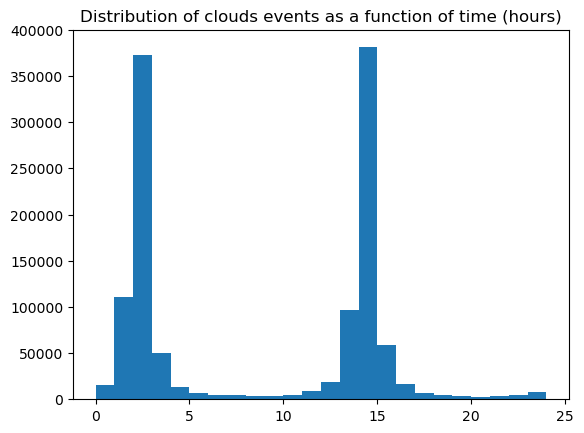

In [136]:
#You can do histograms of the data. Here is time for example.
import numpy as np
import matplotlib.pyplot as plt

binwidth = 1
analyzed1 = pd.to_numeric(time, errors='coerce')

plt.hist(analyzed1, bins=np.arange(min(analyzed1), max(analyzed1) + binwidth, binwidth))
plt.title('Distribution of clouds events as a function of time (hours)')

[  4159    292  13312 153047 151976 199695 202489 215718 242447 270478
 361350 363257 232492  89922   3813    245  58715 143727 151450   6113
   2041   6278  23328]


Text(0.5, 1.0, 'Distribution of cloud events as a function of Start time (hours)')

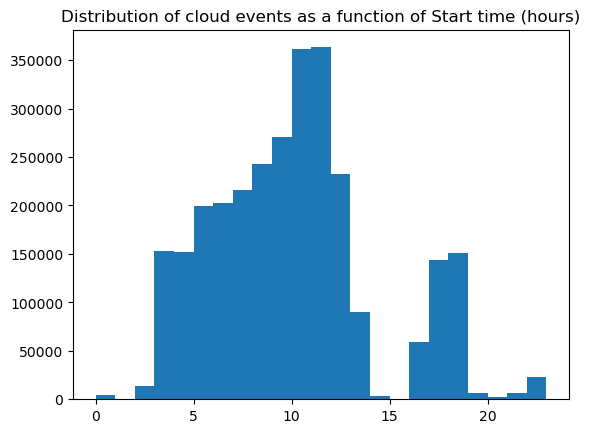

In [139]:
#Does a histogram with weights depending on the data number.
import numpy as np
import matplotlib.pyplot as plt

binwidth = 1
analyzed = df['Start Time']
poids = np.histogram(analyzed1,bins=np.arange(0, 24, 1))
weight = poids[0]
ere = np.sum(weight)
weight = weight/ere

hifd = np.histogram(analyzed,bins=np.arange(0, 24, 1))
hifdnew = hifd[0]
for i in np.arange(len(hifdnew)):
    if weight[i] != 0:
        hifdnew[i] = hifdnew[i]/weight[i]
print(hifdnew)
plt.stairs(hifdnew, np.arange(0, 24, 1),fill = 'True')
plt.title('Distribution of cloud events as a function of Start time (hours)')


Text(0.5, 1.0, 'Distribution of data as a function of L_s (degrees)')

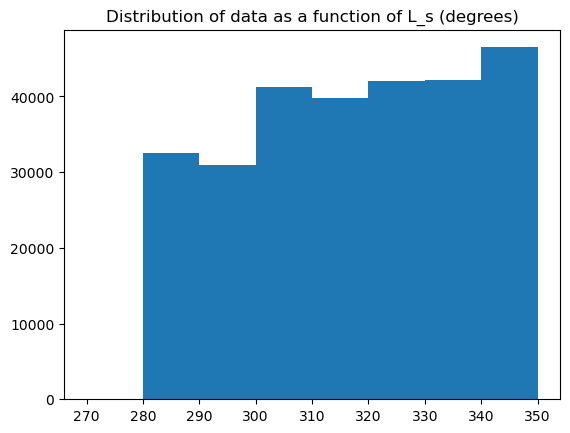

In [131]:
import numpy as np

binwidth = 10
analyzed = pd.to_numeric(L_s, errors='coerce')
datesd_series = pd.Series(datesd)
datesdd = pd.to_datetime(datesd_series)
start_date = pd.to_datetime('2017-05-05')
end_date = pd.to_datetime('2019-03-23')
new_analyzed = []
for i in np.arange(len(analyzed)):
    if datesdd[i]>= start_date and datesdd[i]<= end_date:
        new_analyzed.append(analyzed[i])
new_analyzed

plt.hist(new_analyzed, bins=np.arange(270, 360, binwidth))
plt.title('Distribution of data as a function of L_s (degrees)')

[0.         0.11843358 0.11244577 0.14969516 0.1444086  0.15285983
 0.15321954 0.16893753]
[    0 10689 10529  9332  8836  8982  8784 10015]


Text(0.5, 1.0, 'Distribution of cloud events depending on the data as a function of L_s (degrees)')

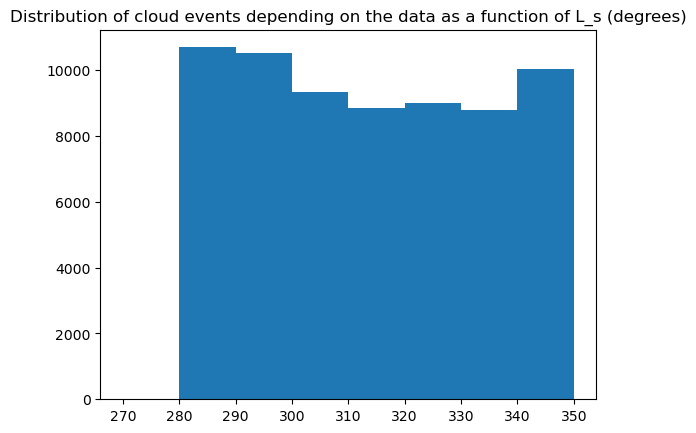

In [132]:
import numpy as np

binwidth = 10
analyzed = df['L_s']
df['Date'] = pd.to_datetime(df['Date'])
poids = np.histogram(new_analyzed,bins=np.arange(270, 360, 10))
weight = poids[0]
ere = np.sum(weight)
weight = weight/ere
print(weight)

start_date = pd.to_datetime('2017-05-05')
end_date = pd.to_datetime('2019-03-23')
new_analyzed1 = []
for i in np.arange(len(analyzed)):
    if df['Date'][i]>= start_date and df['Date'][i]<= end_date:
        new_analyzed1.append(analyzed[i])
hifd = np.histogram(new_analyzed1,bins=np.arange(270, 360, 10))
hifdnew = hifd[0]
for i in np.arange(len(hifdnew)):
    if weight[i] != 0:
        hifdnew[i] = hifdnew[i]/weight[i]
print(hifdnew)
plt.stairs(hifdnew, np.arange(270, 360, binwidth),fill = 'True')
plt.title('Distribution of cloud events depending on the data as a function of L_s (degrees)')

In [52]:
#If you want to find specific elements.
a = len(df)
print(a)
equator_alt = []
for i in np.arange(a):
    if df['Latitude'][i] <20 and df['Latitude'][i] >-20:
        print(df.iloc[i])

29939
Date            2018-11-03
Latitude           -13.678
Longitude         -114.953
Start Time        2.280912
Stop Time         2.287368
Duration          0.006456
Event Type           cloud
Altitude Min        54.145
Altitude Max        61.283
Name: 88, dtype: object
Date               2018-11-12
Latitude                8.589
Longitude             -65.147
Start Time           2.272536
Stop Time            5.427744
Duration             3.155208
Event Type      precipitation
Altitude Min           28.602
Altitude Max           33.266
Name: 836, dtype: object
Date            2019-01-08
Latitude            -3.693
Longitude         -166.899
Start Time        1.909632
Stop Time          1.91556
Duration          0.005928
Event Type           cloud
Altitude Min         66.51
Altitude Max        72.991
Name: 4716, dtype: object
Date            2019-01-09
Latitude            10.964
Longitude         -105.307
Start Time        1.959672
Stop Time         1.966032
Duration           0.00636
E

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

binwidth = 10
analyzed = equator_alt

plt.hist(analyzed, bins=np.arange(min(analyzed), max(analyzed) + binwidth, binwidth))
plt.title('Distribution of clouds events as a function of Start time (hours)')